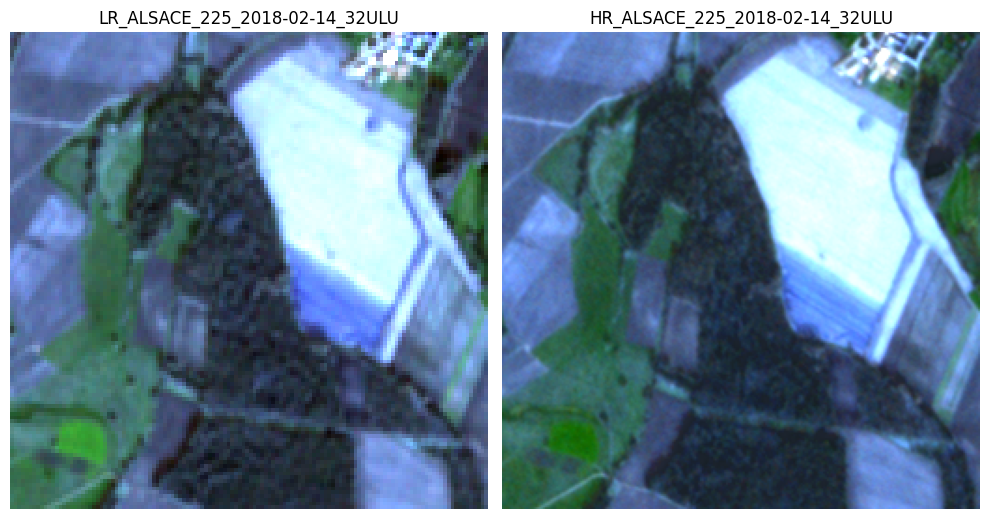

In [3]:
# Install required packages (run once in Colab)
!pip install tacoreader -q
!pip install torch torchvision -q
!pip install rasterio -q
!pip install tqdm -q

import tacoreader
import rasterio as rio
import matplotlib.pyplot as plt

dataset = tacoreader.load("tacofoundation:sen2venus")

# Read a sample row
row = dataset.read(1000)
row_id = dataset.iloc[1000]["tortilla:id"]
row_lr = row.iloc[0]
row_hr = row.iloc[1]

# Retrieve the data
lr, hr = row.read(0), row.read(1)
with rio.open(lr) as src_lr, rio.open(hr) as src_hr:
    lr_data = src_lr.read([1, 2, 3]) # Blue, Green, Red of Sentinel-2
    hr_data = src_hr.read([1, 2, 3]) # Blue, Green, Red of Neon

# Display
fig, ax = plt.subplots(1, 2, figsize=(10, 5.5))
ax[0].imshow(lr_data.transpose(1, 2, 0) / 1000)
ax[0].set_title(f'LR_{row_id}')
ax[0].axis('off')
ax[1].imshow(hr_data.transpose(1, 2, 0) / 1000)
ax[1].set_title(f'HR_{row_id}')
ax[1].axis('off')
plt.tight_layout()
plt.show()


In [4]:
# Install required packages (run once in Colab)
# !pip install tacoreader -q
# !pip install torch torchvision -q
# !pip install rasterio -q
# !pip install tqdm -q

import tacoreader
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import numpy as np
from tqdm import tqdm
import rasterio
from PIL import Image
import requests
from io import BytesIO

# Define SRCNN model
class SRCNN(nn.Module):
    def __init__(self):
        super(SRCNN, self).__init__()
        self.layer1 = nn.Conv2d(3, 64, kernel_size=9, padding=4)
        self.layer2 = nn.Conv2d(64, 32, kernel_size=1)
        self.layer3 = nn.Conv2d(32, 3, kernel_size=5, padding=2)
        self.relu = nn.ReLU(inplace=True)

    def forward(self, x):
        x = self.relu(self.layer1(x))
        x = self.relu(self.layer2(x))
        x = self.layer3(x)
        return x


class Sen2VenusDataset(Dataset):
    def __init__(self, taco_dataset, indices):
        self.dataset = taco_dataset
        self.indices = indices

        # Inspect first sample
        if len(indices) > 0:
            sample = self.dataset.read(indices[0])
            print(f"Sample type: {type(sample)}")
            if hasattr(sample, 'columns'):
                print(f"DataFrame columns: {sample.columns.tolist()}")
            elif hasattr(sample, 'keys'):
                print(f"Dict keys: {list(sample.keys())}")
            else:
                print(f"Sample shape/length: {sample.shape if hasattr(sample, 'shape') else len(sample)}")

    def __len__(self):
        return len(self.indices)

    def __getitem__(self, idx):
        row_idx = self.indices[idx]
        data = self.dataset.read(row_idx)

        lr_path = None
        hr_path = None

        # ---- Case 1: DataFrame
        if hasattr(data, 'columns'):
            for col in data.columns:
                val = data[col].iloc[0] if not data.empty else None
                if isinstance(val, str) and ('vsi' in val or 'http' in val or '/' in val):
                    if lr_path is None:
                        lr_path = val
                    elif hr_path is None and val != lr_path:
                        hr_path = val

        # ---- Case 2: Dictionary
        elif isinstance(data, dict):
            for k, v in data.items():
                if isinstance(v, str) and ('vsi' in v or 'http' in v or '/' in v):
                    if lr_path is None:
                        lr_path = v
                    elif hr_path is None and v != lr_path:
                        hr_path = v

        # ---- Case 3: List/Tuple
        elif isinstance(data, (list, tuple)) and len(data) >= 2:
            lr_path = data[0]
            hr_path = data[1]

        # ---- Fallback: use same path if only LR available
        if hr_path is None:
            hr_path = lr_path
            print(f"Warning: HR path not found, using LR path as fallback.")

        # Final check
        if not isinstance(lr_path, str) or not isinstance(hr_path, str):
            print(f"Warning: Invalid image paths at index {idx}: LR={lr_path}, HR={hr_path}")
            dummy_tensor = torch.zeros(3, 256, 256)
            return dummy_tensor, dummy_tensor

        print(f"[{idx}] LR: {lr_path[:80]}...")
        print(f"[{idx}] HR: {hr_path[:80]}...")

        # Load and convert
        lr_img = self.load_image_from_path(lr_path)
        hr_img = self.load_image_from_path(hr_path)
        lr_tensor = self.image_to_tensor(lr_img)
        hr_tensor = self.image_to_tensor(hr_img)

        return lr_tensor, hr_tensor

    def load_image_from_path(self, path):
        try:
            if path.startswith("http"):
                response = requests.get(path)
                img = np.array(Image.open(BytesIO(response.content)))
            elif '/vsi' in path:
                with rasterio.open(path) as src:
                    img = src.read()
                    img = np.transpose(img, (1, 2, 0))
            else:
                try:
                    with rasterio.open(path) as src:
                        img = src.read()
                        img = np.transpose(img, (1, 2, 0))
                except:
                    img = np.array(Image.open(path))
            return img.astype(np.float32)
        except Exception as e:
            print(f"Failed to load image from {path}: {e}")
            return np.zeros((256, 256, 3), dtype=np.float32)

    def image_to_tensor(self, img, target_size=(256, 256)):
        # Normalize to [0, 1]
        if img.max() > 1.0:
            img = img / 255.0

        # Handle grayscale or single-channel
        if img.ndim == 2:
            img = np.stack([img]*3, axis=-1)
        elif img.shape[-1] == 1:
            img = np.repeat(img, 3, axis=-1)
        elif img.shape[-1] > 3:
            img = img[:, :, :3]

        # Resize image to fixed shape
        img_pil = Image.fromarray((img * 255).astype(np.uint8))  # Convert to PIL for resizing
        img_pil = img_pil.resize(target_size, Image.BICUBIC)
        img = np.array(img_pil).astype(np.float32) / 255.0

        # Convert to tensor
        return torch.from_numpy(img).permute(2, 0, 1)



def train_model(num_epochs=3, batch_size=4, learning_rate=1e-4):
    print("Loading Sen2Venus dataset via tacoreader...")
    dataset = tacoreader.load("tacofoundation:sen2venus")
    n_samples = len(dataset)
    print(f"Total samples: {n_samples}")

    # For quick test, use smaller subset
    train_size = min(1000, n_samples // 2)  # Use smaller subset for testing
    valid_size = min(200, n_samples // 10)

    train_indices = list(range(0, train_size))
    valid_indices = list(range(train_size, train_size + valid_size))

    print(f"Training with {len(train_indices)} samples, validating with {len(valid_indices)} samples")

    train_dataset = Sen2VenusDataset(dataset, train_indices)
    valid_dataset = Sen2VenusDataset(dataset, valid_indices)

    # Use num_workers=0 to avoid multiprocessing issues in Colab
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=0)
    valid_loader = DataLoader(valid_dataset, batch_size=batch_size, shuffle=False, num_workers=0)

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}")

    model = SRCNN().to(device)
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)

    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        train_batches = 0

        for lr_imgs, hr_imgs in tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs} Training"):
            try:
                lr_imgs = lr_imgs.to(device)
                hr_imgs = hr_imgs.to(device)

                optimizer.zero_grad()
                outputs = model(lr_imgs)
                loss = criterion(outputs, hr_imgs)
                loss.backward()
                optimizer.step()

                running_loss += loss.item()
                train_batches += 1

            except Exception as e:
                print(f"Error in training batch: {e}")
                continue

        if train_batches > 0:
            epoch_loss = running_loss / train_batches
            print(f"Epoch {epoch+1} training loss: {epoch_loss:.6f}")

        # Validation
        model.eval()
        val_loss = 0.0
        val_batches = 0

        with torch.no_grad():
            for lr_imgs, hr_imgs in tqdm(valid_loader, desc=f"Epoch {epoch+1}/{num_epochs} Validation"):
                try:
                    lr_imgs = lr_imgs.to(device)
                    hr_imgs = hr_imgs.to(device)
                    outputs = model(lr_imgs)
                    loss = criterion(outputs, hr_imgs)
                    val_loss += loss.item()
                    val_batches += 1
                except Exception as e:
                    print(f"Error in validation batch: {e}")
                    continue

        if val_batches > 0:
            val_loss /= val_batches
            print(f"Epoch {epoch+1} validation loss: {val_loss:.6f}")

    return model

# Debug function to inspect dataset structure
def inspect_dataset():
    print("Inspecting dataset structure...")
    dataset = tacoreader.load("tacofoundation:sen2venus")
    print(f"Dataset type: {type(dataset)}")
    print(f"Dataset length: {len(dataset)}")

    # Try to read first few samples
    for i in range(min(3, len(dataset))):
        try:
            print(f"\n--- Sample {i} ---")
            sample = dataset.read(i)
            print(f"Sample type: {type(sample)}")

            if hasattr(sample, 'columns'):
                print(f"DataFrame columns: {sample.columns.tolist()}")
                print(f"DataFrame shape: {sample.shape}")
                print("DataFrame contents:")
                print(sample)
                print("\nColumn details:")
                for col in sample.columns:
                    col_data = sample[col].iloc[0] if not sample.empty else None
                    print(f"  Column '{col}': {type(col_data)}")
                    if isinstance(col_data, str):
                        print(f"    Value: '{col_data}'")
                    elif hasattr(col_data, 'shape'):
                        print(f"    Shape: {col_data.shape}")
                    else:
                        print(f"    Value: {col_data}")

            elif hasattr(sample, 'keys'):
                print(f"Dict keys: {list(sample.keys())}")
                for key, value in sample.items():
                    print(f"  Key '{key}': {type(value)}")
                    if isinstance(value, str):
                        print(f"    Value: '{value}'")
                    elif hasattr(value, 'shape'):
                        print(f"    Shape: {value.shape}")
                    else:
                        print(f"    Value: {value}")
            else:
                print(f"Raw sample: {sample}")

        except Exception as e:
            print(f"Error reading sample {i}: {e}")
            import traceback
            traceback.print_exc()

if __name__ == "__main__":
    # First inspect the dataset structure
    inspect_dataset()

    print("\n" + "="*50)
    print("Do you want to proceed with training? (y/n)")

    # For automatic execution in Colab, comment out the input line and set proceed = True
    # proceed = input().lower().startswith('y')
    proceed = True  # Auto-proceed for Colab

    if proceed:
        try:
            model = train_model()
            torch.save(model.state_dict(), "srcnn_sen2venus.pth")
            print("Training done and model saved as srcnn_sen2venus.pth")
        except Exception as e:
            print(f"Training failed: {e}")
            import traceback
            traceback.print_exc()
    else:
        print("Training cancelled.")

Inspecting dataset structure...
Dataset type: <class 'tacoreader.TortillaDataFrame.TortillaDataFrame'>
Dataset length: 124123

--- Sample 0 ---
Sample type: <class 'tacoreader.TortillaDataFrame.TortillaDataFrame'>
DataFrame columns: ['internal:subfile', 'tortilla:id', 'tortilla:file_format', 'tortilla:data_split', 'tortilla:offset', 'tortilla:length', 'stac:crs', 'stac:geotransform', 'stac:raster_shape', 'stac:time_start', 'stac:time_end', 'stac:centroid', 'region', 's2_tile', 'patch_n_id', 'negative_values']
DataFrame shape: (2, 16)
DataFrame contents:
                                    internal:subfile tortilla:id  \
0  /vsisubfile/9557015133_133311,/vsicurl/https:/...          lr   
1  /vsisubfile/9557148444_660985,/vsicurl/https:/...          hr   

  tortilla:file_format tortilla:data_split  tortilla:offset  tortilla:length  \
0                GTiff               train       9557015133           133311   
1                GTiff               train       9557148444           66098

Epoch 1/3 Training:   0%|          | 0/250 [00:00<?, ?it/s]

[943] LR: /vsisubfile/8178977187_133588,/vsicurl/https://huggingface.co/datasets/tacofound...
[943] HR: /vsisubfile/8178977187_133588,/vsicurl/https://huggingface.co/datasets/tacofound...
[538] LR: /vsisubfile/8961182990_139565,/vsicurl/https://huggingface.co/datasets/tacofound...
[538] HR: /vsisubfile/8961182990_139565,/vsicurl/https://huggingface.co/datasets/tacofound...
[514] LR: /vsisubfile/9946369970_143708,/vsicurl/https://huggingface.co/datasets/tacofound...
[514] HR: /vsisubfile/9946369970_143708,/vsicurl/https://huggingface.co/datasets/tacofound...
[48] LR: /vsisubfile/9841042645_132832,/vsicurl/https://huggingface.co/datasets/tacofound...
[48] HR: /vsisubfile/9841042645_132832,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:   0%|          | 1/250 [00:03<15:57,  3.84s/it]

[393] LR: /vsisubfile/8638138477_136637,/vsicurl/https://huggingface.co/datasets/tacofound...
[393] HR: /vsisubfile/8638138477_136637,/vsicurl/https://huggingface.co/datasets/tacofound...
[23] LR: /vsisubfile/8333593254_137073,/vsicurl/https://huggingface.co/datasets/tacofound...
[23] HR: /vsisubfile/8333593254_137073,/vsicurl/https://huggingface.co/datasets/tacofound...
[303] LR: /vsisubfile/9570731027_142107,/vsicurl/https://huggingface.co/datasets/tacofound...
[303] HR: /vsisubfile/9570731027_142107,/vsicurl/https://huggingface.co/datasets/tacofound...
[8] LR: /vsisubfile/7986699096_138200,/vsicurl/https://huggingface.co/datasets/tacofound...
[8] HR: /vsisubfile/7986699096_138200,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:   1%|          | 2/250 [00:07<15:47,  3.82s/it]

[68] LR: /vsisubfile/8306601885_131489,/vsicurl/https://huggingface.co/datasets/tacofound...
[68] HR: /vsisubfile/8306601885_131489,/vsicurl/https://huggingface.co/datasets/tacofound...
[11] LR: /vsisubfile/9997871794_140863,/vsicurl/https://huggingface.co/datasets/tacofound...
[11] HR: /vsisubfile/9997871794_140863,/vsicurl/https://huggingface.co/datasets/tacofound...
[87] LR: /vsisubfile/7885508188_139765,/vsicurl/https://huggingface.co/datasets/tacofound...
[87] HR: /vsisubfile/7885508188_139765,/vsicurl/https://huggingface.co/datasets/tacofound...
[115] LR: /vsisubfile/8992512000_141000,/vsicurl/https://huggingface.co/datasets/tacofound...
[115] HR: /vsisubfile/8992512000_141000,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:   1%|          | 3/250 [00:11<15:41,  3.81s/it]

[148] LR: /vsisubfile/9133228787_143021,/vsicurl/https://huggingface.co/datasets/tacofound...
[148] HR: /vsisubfile/9133228787_143021,/vsicurl/https://huggingface.co/datasets/tacofound...
[146] LR: /vsisubfile/8722250112_139190,/vsicurl/https://huggingface.co/datasets/tacofound...
[146] HR: /vsisubfile/8722250112_139190,/vsicurl/https://huggingface.co/datasets/tacofound...
[883] LR: /vsisubfile/8161104696_142232,/vsicurl/https://huggingface.co/datasets/tacofound...
[883] HR: /vsisubfile/8161104696_142232,/vsicurl/https://huggingface.co/datasets/tacofound...
[238] LR: /vsisubfile/9009474660_143066,/vsicurl/https://huggingface.co/datasets/tacofound...
[238] HR: /vsisubfile/9009474660_143066,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:   2%|▏         | 4/250 [00:15<16:05,  3.92s/it]

[942] LR: /vsisubfile/9010357597_135494,/vsicurl/https://huggingface.co/datasets/tacofound...
[942] HR: /vsisubfile/9010357597_135494,/vsicurl/https://huggingface.co/datasets/tacofound...
[840] LR: /vsisubfile/9402781193_138183,/vsicurl/https://huggingface.co/datasets/tacofound...
[840] HR: /vsisubfile/9402781193_138183,/vsicurl/https://huggingface.co/datasets/tacofound...
[25] LR: /vsisubfile/9868526342_140670,/vsicurl/https://huggingface.co/datasets/tacofound...
[25] HR: /vsisubfile/9868526342_140670,/vsicurl/https://huggingface.co/datasets/tacofound...
[560] LR: /vsisubfile/8049969890_131767,/vsicurl/https://huggingface.co/datasets/tacofound...
[560] HR: /vsisubfile/8049969890_131767,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:   2%|▏         | 5/250 [00:19<15:24,  3.77s/it]

[0] LR: /vsisubfile/9557015133_133311,/vsicurl/https://huggingface.co/datasets/tacofound...
[0] HR: /vsisubfile/9557015133_133311,/vsicurl/https://huggingface.co/datasets/tacofound...
[795] LR: /vsisubfile/9416339350_134472,/vsicurl/https://huggingface.co/datasets/tacofound...
[795] HR: /vsisubfile/9416339350_134472,/vsicurl/https://huggingface.co/datasets/tacofound...
[563] LR: /vsisubfile/8235426991_144844,/vsicurl/https://huggingface.co/datasets/tacofound...
[563] HR: /vsisubfile/8235426991_144844,/vsicurl/https://huggingface.co/datasets/tacofound...
[268] LR: /vsisubfile/9984347156_128251,/vsicurl/https://huggingface.co/datasets/tacofound...
[268] HR: /vsisubfile/9984347156_128251,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:   2%|▏         | 6/250 [00:23<15:39,  3.85s/it]

[188] LR: /vsisubfile/9368749022_140473,/vsicurl/https://huggingface.co/datasets/tacofound...
[188] HR: /vsisubfile/9368749022_140473,/vsicurl/https://huggingface.co/datasets/tacofound...
[968] LR: /vsisubfile/9492825609_138769,/vsicurl/https://huggingface.co/datasets/tacofound...
[968] HR: /vsisubfile/9492825609_138769,/vsicurl/https://huggingface.co/datasets/tacofound...
[416] LR: /vsisubfile/7883002740_136337,/vsicurl/https://huggingface.co/datasets/tacofound...
[416] HR: /vsisubfile/7883002740_136337,/vsicurl/https://huggingface.co/datasets/tacofound...
[196] LR: /vsisubfile/7868657309_140276,/vsicurl/https://huggingface.co/datasets/tacofound...
[196] HR: /vsisubfile/7868657309_140276,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:   3%|▎         | 7/250 [00:26<15:31,  3.83s/it]

[414] LR: /vsisubfile/8901196938_141609,/vsicurl/https://huggingface.co/datasets/tacofound...
[414] HR: /vsisubfile/8901196938_141609,/vsicurl/https://huggingface.co/datasets/tacofound...
[892] LR: /vsisubfile/9236278559_138515,/vsicurl/https://huggingface.co/datasets/tacofound...
[892] HR: /vsisubfile/9236278559_138515,/vsicurl/https://huggingface.co/datasets/tacofound...
[157] LR: /vsisubfile/9472454756_142679,/vsicurl/https://huggingface.co/datasets/tacofound...
[157] HR: /vsisubfile/9472454756_142679,/vsicurl/https://huggingface.co/datasets/tacofound...
[874] LR: /vsisubfile/8141035432_134562,/vsicurl/https://huggingface.co/datasets/tacofound...
[874] HR: /vsisubfile/8141035432_134562,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:   3%|▎         | 8/250 [00:31<16:26,  4.08s/it]

[174] LR: /vsisubfile/8485825638_138854,/vsicurl/https://huggingface.co/datasets/tacofound...
[174] HR: /vsisubfile/8485825638_138854,/vsicurl/https://huggingface.co/datasets/tacofound...
[829] LR: /vsisubfile/8951023090_137853,/vsicurl/https://huggingface.co/datasets/tacofound...
[829] HR: /vsisubfile/8951023090_137853,/vsicurl/https://huggingface.co/datasets/tacofound...
[49] LR: /vsisubfile/9902320397_145877,/vsicurl/https://huggingface.co/datasets/tacofound...
[49] HR: /vsisubfile/9902320397_145877,/vsicurl/https://huggingface.co/datasets/tacofound...
[110] LR: /vsisubfile/9535723948_138104,/vsicurl/https://huggingface.co/datasets/tacofound...
[110] HR: /vsisubfile/9535723948_138104,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:   4%|▎         | 9/250 [00:35<16:09,  4.02s/it]

[880] LR: /vsisubfile/9814955817_132836,/vsicurl/https://huggingface.co/datasets/tacofound...
[880] HR: /vsisubfile/9814955817_132836,/vsicurl/https://huggingface.co/datasets/tacofound...
[914] LR: /vsisubfile/9787216720_139583,/vsicurl/https://huggingface.co/datasets/tacofound...
[914] HR: /vsisubfile/9787216720_139583,/vsicurl/https://huggingface.co/datasets/tacofound...
[927] LR: /vsisubfile/8108960114_134508,/vsicurl/https://huggingface.co/datasets/tacofound...
[927] HR: /vsisubfile/8108960114_134508,/vsicurl/https://huggingface.co/datasets/tacofound...
[837] LR: /vsisubfile/8312474750_140578,/vsicurl/https://huggingface.co/datasets/tacofound...
[837] HR: /vsisubfile/8312474750_140578,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:   4%|▍         | 10/250 [00:38<15:34,  3.89s/it]

[935] LR: /vsisubfile/8193255809_133687,/vsicurl/https://huggingface.co/datasets/tacofound...
[935] HR: /vsisubfile/8193255809_133687,/vsicurl/https://huggingface.co/datasets/tacofound...
[717] LR: /vsisubfile/9604608326_142088,/vsicurl/https://huggingface.co/datasets/tacofound...
[717] HR: /vsisubfile/9604608326_142088,/vsicurl/https://huggingface.co/datasets/tacofound...
[508] LR: /vsisubfile/8652278437_142419,/vsicurl/https://huggingface.co/datasets/tacofound...
[508] HR: /vsisubfile/8652278437_142419,/vsicurl/https://huggingface.co/datasets/tacofound...
[988] LR: /vsisubfile/9221886239_134743,/vsicurl/https://huggingface.co/datasets/tacofound...
[988] HR: /vsisubfile/9221886239_134743,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:   4%|▍         | 11/250 [00:43<16:21,  4.11s/it]

[886] LR: /vsisubfile/8625326470_139544,/vsicurl/https://huggingface.co/datasets/tacofound...
[886] HR: /vsisubfile/8625326470_139544,/vsicurl/https://huggingface.co/datasets/tacofound...
[521] LR: /vsisubfile/9703282814_137996,/vsicurl/https://huggingface.co/datasets/tacofound...
[521] HR: /vsisubfile/9703282814_137996,/vsicurl/https://huggingface.co/datasets/tacofound...
[548] LR: /vsisubfile/8492591687_132678,/vsicurl/https://huggingface.co/datasets/tacofound...
[548] HR: /vsisubfile/8492591687_132678,/vsicurl/https://huggingface.co/datasets/tacofound...
[532] LR: /vsisubfile/8299887129_143035,/vsicurl/https://huggingface.co/datasets/tacofound...
[532] HR: /vsisubfile/8299887129_143035,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:   5%|▍         | 12/250 [00:47<16:09,  4.08s/it]

[896] LR: /vsisubfile/8438754451_138294,/vsicurl/https://huggingface.co/datasets/tacofound...
[896] HR: /vsisubfile/8438754451_138294,/vsicurl/https://huggingface.co/datasets/tacofound...
[638] LR: /vsisubfile/9519797787_141727,/vsicurl/https://huggingface.co/datasets/tacofound...
[638] HR: /vsisubfile/9519797787_141727,/vsicurl/https://huggingface.co/datasets/tacofound...
[696] LR: /vsisubfile/7900992835_136526,/vsicurl/https://huggingface.co/datasets/tacofound...
[696] HR: /vsisubfile/7900992835_136526,/vsicurl/https://huggingface.co/datasets/tacofound...
[808] LR: /vsisubfile/9204831481_138670,/vsicurl/https://huggingface.co/datasets/tacofound...
[808] HR: /vsisubfile/9204831481_138670,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:   5%|▌         | 13/250 [00:52<16:43,  4.23s/it]

[944] LR: /vsisubfile/9311908206_142450,/vsicurl/https://huggingface.co/datasets/tacofound...
[944] HR: /vsisubfile/9311908206_142450,/vsicurl/https://huggingface.co/datasets/tacofound...
[206] LR: /vsisubfile/8738375777_134521,/vsicurl/https://huggingface.co/datasets/tacofound...
[206] HR: /vsisubfile/8738375777_134521,/vsicurl/https://huggingface.co/datasets/tacofound...
[939] LR: /vsisubfile/10061564581_140819,/vsicurl/https://huggingface.co/datasets/tacofoun...
[939] HR: /vsisubfile/10061564581_140819,/vsicurl/https://huggingface.co/datasets/tacofoun...
[150] LR: /vsisubfile/10064977233_138339,/vsicurl/https://huggingface.co/datasets/tacofoun...
[150] HR: /vsisubfile/10064977233_138339,/vsicurl/https://huggingface.co/datasets/tacofoun...


Epoch 1/3 Training:   6%|▌         | 14/250 [00:55<16:08,  4.10s/it]

[465] LR: /vsisubfile/8558295615_142938,/vsicurl/https://huggingface.co/datasets/tacofound...
[465] HR: /vsisubfile/8558295615_142938,/vsicurl/https://huggingface.co/datasets/tacofound...
[951] LR: /vsisubfile/9916770475_138747,/vsicurl/https://huggingface.co/datasets/tacofound...
[951] HR: /vsisubfile/9916770475_138747,/vsicurl/https://huggingface.co/datasets/tacofound...
[854] LR: /vsisubfile/8288358181_137281,/vsicurl/https://huggingface.co/datasets/tacofound...
[854] HR: /vsisubfile/8288358181_137281,/vsicurl/https://huggingface.co/datasets/tacofound...
[478] LR: /vsisubfile/9449678877_136501,/vsicurl/https://huggingface.co/datasets/tacofound...
[478] HR: /vsisubfile/9449678877_136501,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:   6%|▌         | 15/250 [01:00<16:18,  4.16s/it]

[205] LR: /vsisubfile/9572446162_132344,/vsicurl/https://huggingface.co/datasets/tacofound...
[205] HR: /vsisubfile/9572446162_132344,/vsicurl/https://huggingface.co/datasets/tacofound...
[723] LR: /vsisubfile/7960457791_139520,/vsicurl/https://huggingface.co/datasets/tacofound...
[723] HR: /vsisubfile/7960457791_139520,/vsicurl/https://huggingface.co/datasets/tacofound...
[253] LR: /vsisubfile/9130727302_138878,/vsicurl/https://huggingface.co/datasets/tacofound...
[253] HR: /vsisubfile/9130727302_138878,/vsicurl/https://huggingface.co/datasets/tacofound...
[794] LR: /vsisubfile/8202442503_142250,/vsicurl/https://huggingface.co/datasets/tacofound...
[794] HR: /vsisubfile/8202442503_142250,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:   6%|▋         | 16/250 [01:04<16:16,  4.17s/it]

[515] LR: /vsisubfile/9841863397_138525,/vsicurl/https://huggingface.co/datasets/tacofound...
[515] HR: /vsisubfile/9841863397_138525,/vsicurl/https://huggingface.co/datasets/tacofound...
[71] LR: /vsisubfile/9700724561_141472,/vsicurl/https://huggingface.co/datasets/tacofound...
[71] HR: /vsisubfile/9700724561_141472,/vsicurl/https://huggingface.co/datasets/tacofound...
[101] LR: /vsisubfile/8046600715_142092,/vsicurl/https://huggingface.co/datasets/tacofound...
[101] HR: /vsisubfile/8046600715_142092,/vsicurl/https://huggingface.co/datasets/tacofound...
[251] LR: /vsisubfile/8142668997_135545,/vsicurl/https://huggingface.co/datasets/tacofound...
[251] HR: /vsisubfile/8142668997_135545,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:   7%|▋         | 17/250 [01:08<16:14,  4.18s/it]

[98] LR: /vsisubfile/9079880263_137095,/vsicurl/https://huggingface.co/datasets/tacofound...
[98] HR: /vsisubfile/9079880263_137095,/vsicurl/https://huggingface.co/datasets/tacofound...
[57] LR: /vsisubfile/10025137392_132481,/vsicurl/https://huggingface.co/datasets/tacofoun...
[57] HR: /vsisubfile/10025137392_132481,/vsicurl/https://huggingface.co/datasets/tacofoun...
[153] LR: /vsisubfile/8335241780_138811,/vsicurl/https://huggingface.co/datasets/tacofound...
[153] HR: /vsisubfile/8335241780_138811,/vsicurl/https://huggingface.co/datasets/tacofound...
[275] LR: /vsisubfile/9259228294_138239,/vsicurl/https://huggingface.co/datasets/tacofound...
[275] HR: /vsisubfile/9259228294_138239,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:   7%|▋         | 18/250 [01:13<16:32,  4.28s/it]

[676] LR: /vsisubfile/9691450902_132763,/vsicurl/https://huggingface.co/datasets/tacofound...
[676] HR: /vsisubfile/9691450902_132763,/vsicurl/https://huggingface.co/datasets/tacofound...
[487] LR: /vsisubfile/9663757861_137423,/vsicurl/https://huggingface.co/datasets/tacofound...
[487] HR: /vsisubfile/9663757861_137423,/vsicurl/https://huggingface.co/datasets/tacofound...
[159] LR: /vsisubfile/8932404522_140253,/vsicurl/https://huggingface.co/datasets/tacofound...
[159] HR: /vsisubfile/8932404522_140253,/vsicurl/https://huggingface.co/datasets/tacofound...
[522] LR: /vsisubfile/8243041185_135263,/vsicurl/https://huggingface.co/datasets/tacofound...
[522] HR: /vsisubfile/8243041185_135263,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:   8%|▊         | 19/250 [01:17<16:50,  4.37s/it]

[317] LR: /vsisubfile/8815811315_144319,/vsicurl/https://huggingface.co/datasets/tacofound...
[317] HR: /vsisubfile/8815811315_144319,/vsicurl/https://huggingface.co/datasets/tacofound...
[460] LR: /vsisubfile/7888049736_136330,/vsicurl/https://huggingface.co/datasets/tacofound...
[460] HR: /vsisubfile/7888049736_136330,/vsicurl/https://huggingface.co/datasets/tacofound...
[726] LR: /vsisubfile/9803301081_137133,/vsicurl/https://huggingface.co/datasets/tacofound...
[726] HR: /vsisubfile/9803301081_137133,/vsicurl/https://huggingface.co/datasets/tacofound...
[37] LR: /vsisubfile/8491742882_138790,/vsicurl/https://huggingface.co/datasets/tacofound...
[37] HR: /vsisubfile/8491742882_138790,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:   8%|▊         | 20/250 [01:22<17:29,  4.56s/it]

[833] LR: /vsisubfile/8526877487_128287,/vsicurl/https://huggingface.co/datasets/tacofound...
[833] HR: /vsisubfile/8526877487_128287,/vsicurl/https://huggingface.co/datasets/tacofound...
[435] LR: /vsisubfile/8927366736_142107,/vsicurl/https://huggingface.co/datasets/tacofound...
[435] HR: /vsisubfile/8927366736_142107,/vsicurl/https://huggingface.co/datasets/tacofound...
[530] LR: /vsisubfile/9263555088_135293,/vsicurl/https://huggingface.co/datasets/tacofound...
[530] HR: /vsisubfile/9263555088_135293,/vsicurl/https://huggingface.co/datasets/tacofound...
[155] LR: /vsisubfile/8481522135_137643,/vsicurl/https://huggingface.co/datasets/tacofound...
[155] HR: /vsisubfile/8481522135_137643,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:   8%|▊         | 21/250 [01:26<16:59,  4.45s/it]

[408] LR: /vsisubfile/7932406436_141250,/vsicurl/https://huggingface.co/datasets/tacofound...
[408] HR: /vsisubfile/7932406436_141250,/vsicurl/https://huggingface.co/datasets/tacofound...
[20] LR: /vsisubfile/8123302862_137449,/vsicurl/https://huggingface.co/datasets/tacofound...
[20] HR: /vsisubfile/8123302862_137449,/vsicurl/https://huggingface.co/datasets/tacofound...
[986] LR: /vsisubfile/8315904918_145435,/vsicurl/https://huggingface.co/datasets/tacofound...
[986] HR: /vsisubfile/8315904918_145435,/vsicurl/https://huggingface.co/datasets/tacofound...
[302] LR: /vsisubfile/9993589498_140522,/vsicurl/https://huggingface.co/datasets/tacofound...
[302] HR: /vsisubfile/9993589498_140522,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:   9%|▉         | 22/250 [01:31<16:58,  4.47s/it]

[605] LR: /vsisubfile/9650320720_133817,/vsicurl/https://huggingface.co/datasets/tacofound...
[605] HR: /vsisubfile/9650320720_133817,/vsicurl/https://huggingface.co/datasets/tacofound...
[562] LR: /vsisubfile/8617593396_141964,/vsicurl/https://huggingface.co/datasets/tacofound...
[562] HR: /vsisubfile/8617593396_141964,/vsicurl/https://huggingface.co/datasets/tacofound...
[59] LR: /vsisubfile/9730520885_142285,/vsicurl/https://huggingface.co/datasets/tacofound...
[59] HR: /vsisubfile/9730520885_142285,/vsicurl/https://huggingface.co/datasets/tacofound...
[320] LR: /vsisubfile/8232029582_139815,/vsicurl/https://huggingface.co/datasets/tacofound...
[320] HR: /vsisubfile/8232029582_139815,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:   9%|▉         | 23/250 [01:35<16:15,  4.30s/it]

[735] LR: /vsisubfile/8090535489_139576,/vsicurl/https://huggingface.co/datasets/tacofound...
[735] HR: /vsisubfile/8090535489_139576,/vsicurl/https://huggingface.co/datasets/tacofound...
[257] LR: /vsisubfile/9762505571_139915,/vsicurl/https://huggingface.co/datasets/tacofound...
[257] HR: /vsisubfile/9762505571_139915,/vsicurl/https://huggingface.co/datasets/tacofound...
[761] LR: /vsisubfile/9179924043_140756,/vsicurl/https://huggingface.co/datasets/tacofound...
[761] HR: /vsisubfile/9179924043_140756,/vsicurl/https://huggingface.co/datasets/tacofound...
[537] LR: /vsisubfile/9163965911_140563,/vsicurl/https://huggingface.co/datasets/tacofound...
[537] HR: /vsisubfile/9163965911_140563,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  10%|▉         | 24/250 [01:39<15:51,  4.21s/it]

[910] LR: /vsisubfile/9380674322_140217,/vsicurl/https://huggingface.co/datasets/tacofound...
[910] HR: /vsisubfile/9380674322_140217,/vsicurl/https://huggingface.co/datasets/tacofound...
[359] LR: /vsisubfile/10070881511_131114,/vsicurl/https://huggingface.co/datasets/tacofoun...
[359] HR: /vsisubfile/10070881511_131114,/vsicurl/https://huggingface.co/datasets/tacofoun...
[13] LR: /vsisubfile/8344520010_145440,/vsicurl/https://huggingface.co/datasets/tacofound...
[13] HR: /vsisubfile/8344520010_145440,/vsicurl/https://huggingface.co/datasets/tacofound...
[793] LR: /vsisubfile/9536558460_143809,/vsicurl/https://huggingface.co/datasets/tacofound...
[793] HR: /vsisubfile/9536558460_143809,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  10%|█         | 25/250 [01:43<15:32,  4.15s/it]

[782] LR: /vsisubfile/9765867718_146206,/vsicurl/https://huggingface.co/datasets/tacofound...
[782] HR: /vsisubfile/9765867718_146206,/vsicurl/https://huggingface.co/datasets/tacofound...
[145] LR: /vsisubfile/9072253496_134808,/vsicurl/https://huggingface.co/datasets/tacofound...
[145] HR: /vsisubfile/9072253496_134808,/vsicurl/https://huggingface.co/datasets/tacofound...
[712] LR: /vsisubfile/9619831613_135279,/vsicurl/https://huggingface.co/datasets/tacofound...
[712] HR: /vsisubfile/9619831613_135279,/vsicurl/https://huggingface.co/datasets/tacofound...
[126] LR: /vsisubfile/9443046447_132797,/vsicurl/https://huggingface.co/datasets/tacofound...
[126] HR: /vsisubfile/9443046447_132797,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  10%|█         | 26/250 [01:47<15:45,  4.22s/it]

[739] LR: /vsisubfile/8986546304_142032,/vsicurl/https://huggingface.co/datasets/tacofound...
[739] HR: /vsisubfile/8986546304_142032,/vsicurl/https://huggingface.co/datasets/tacofound...
[686] LR: /vsisubfile/9714429604_137804,/vsicurl/https://huggingface.co/datasets/tacofound...
[686] HR: /vsisubfile/9714429604_137804,/vsicurl/https://huggingface.co/datasets/tacofound...
[170] LR: /vsisubfile/9373825568_143647,/vsicurl/https://huggingface.co/datasets/tacofound...
[170] HR: /vsisubfile/9373825568_143647,/vsicurl/https://huggingface.co/datasets/tacofound...
[694] LR: /vsisubfile/8216881764_136437,/vsicurl/https://huggingface.co/datasets/tacofound...
[694] HR: /vsisubfile/8216881764_136437,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  11%|█         | 27/250 [01:51<15:19,  4.12s/it]

[388] LR: /vsisubfile/8462132323_140882,/vsicurl/https://huggingface.co/datasets/tacofound...
[388] HR: /vsisubfile/8462132323_140882,/vsicurl/https://huggingface.co/datasets/tacofound...
[248] LR: /vsisubfile/8089690487_136759,/vsicurl/https://huggingface.co/datasets/tacofound...
[248] HR: /vsisubfile/8089690487_136759,/vsicurl/https://huggingface.co/datasets/tacofound...
[123] LR: /vsisubfile/8218524960_142628,/vsicurl/https://huggingface.co/datasets/tacofound...
[123] HR: /vsisubfile/8218524960_142628,/vsicurl/https://huggingface.co/datasets/tacofound...
[853] LR: /vsisubfile/9553648263_133206,/vsicurl/https://huggingface.co/datasets/tacofound...
[853] HR: /vsisubfile/9553648263_133206,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  11%|█         | 28/250 [01:55<14:47,  4.00s/it]

[21] LR: /vsisubfile/8105637516_132246,/vsicurl/https://huggingface.co/datasets/tacofound...
[21] HR: /vsisubfile/8105637516_132246,/vsicurl/https://huggingface.co/datasets/tacofound...
[964] LR: /vsisubfile/9942997835_142476,/vsicurl/https://huggingface.co/datasets/tacofound...
[964] HR: /vsisubfile/9942997835_142476,/vsicurl/https://huggingface.co/datasets/tacofound...
[956] LR: /vsisubfile/8694474041_137521,/vsicurl/https://huggingface.co/datasets/tacofound...
[956] HR: /vsisubfile/8694474041_137521,/vsicurl/https://huggingface.co/datasets/tacofound...
[913] LR: /vsisubfile/9810772150_134888,/vsicurl/https://huggingface.co/datasets/tacofound...
[913] HR: /vsisubfile/9810772150_134888,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  12%|█▏        | 29/250 [01:59<14:50,  4.03s/it]

[437] LR: /vsisubfile/9314455279_139245,/vsicurl/https://huggingface.co/datasets/tacofound...
[437] HR: /vsisubfile/9314455279_139245,/vsicurl/https://huggingface.co/datasets/tacofound...
[869] LR: /vsisubfile/9447225964_132466,/vsicurl/https://huggingface.co/datasets/tacofound...
[869] HR: /vsisubfile/9447225964_132466,/vsicurl/https://huggingface.co/datasets/tacofound...
[804] LR: /vsisubfile/9175712331_130205,/vsicurl/https://huggingface.co/datasets/tacofound...
[804] HR: /vsisubfile/9175712331_130205,/vsicurl/https://huggingface.co/datasets/tacofound...
[851] LR: /vsisubfile/9958263734_131471,/vsicurl/https://huggingface.co/datasets/tacofound...
[851] HR: /vsisubfile/9958263734_131471,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  12%|█▏        | 30/250 [02:03<14:57,  4.08s/it]

[722] LR: /vsisubfile/9358661400_140145,/vsicurl/https://huggingface.co/datasets/tacofound...
[722] HR: /vsisubfile/9358661400_140145,/vsicurl/https://huggingface.co/datasets/tacofound...
[80] LR: /vsisubfile/9417982582_138984,/vsicurl/https://huggingface.co/datasets/tacofound...
[80] HR: /vsisubfile/9417982582_138984,/vsicurl/https://huggingface.co/datasets/tacofound...
[604] LR: /vsisubfile/7866192996_127896,/vsicurl/https://huggingface.co/datasets/tacofound...
[604] HR: /vsisubfile/7866192996_127896,/vsicurl/https://huggingface.co/datasets/tacofound...
[338] LR: /vsisubfile/9822410025_137298,/vsicurl/https://huggingface.co/datasets/tacofound...
[338] HR: /vsisubfile/9822410025_137298,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  12%|█▏        | 31/250 [02:08<15:47,  4.33s/it]

[301] LR: /vsisubfile/9656189714_137304,/vsicurl/https://huggingface.co/datasets/tacofound...
[301] HR: /vsisubfile/9656189714_137304,/vsicurl/https://huggingface.co/datasets/tacofound...
[186] LR: /vsisubfile/7884645238_141853,/vsicurl/https://huggingface.co/datasets/tacofound...
[186] HR: /vsisubfile/7884645238_141853,/vsicurl/https://huggingface.co/datasets/tacofound...
[91] LR: /vsisubfile/9773618666_140846,/vsicurl/https://huggingface.co/datasets/tacofound...
[91] HR: /vsisubfile/9773618666_140846,/vsicurl/https://huggingface.co/datasets/tacofound...
[165] LR: /vsisubfile/8330209183_137578,/vsicurl/https://huggingface.co/datasets/tacofound...
[165] HR: /vsisubfile/8330209183_137578,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  13%|█▎        | 32/250 [02:13<16:33,  4.56s/it]

[387] LR: /vsisubfile/8473977551_141067,/vsicurl/https://huggingface.co/datasets/tacofound...
[387] HR: /vsisubfile/8473977551_141067,/vsicurl/https://huggingface.co/datasets/tacofound...
[894] LR: /vsisubfile/9792269854_148314,/vsicurl/https://huggingface.co/datasets/tacofound...
[894] HR: /vsisubfile/9792269854_148314,/vsicurl/https://huggingface.co/datasets/tacofound...
[411] LR: /vsisubfile/7952937998_130808,/vsicurl/https://huggingface.co/datasets/tacofound...
[411] HR: /vsisubfile/7952937998_130808,/vsicurl/https://huggingface.co/datasets/tacofound...
[565] LR: /vsisubfile/9170683848_139018,/vsicurl/https://huggingface.co/datasets/tacofound...
[565] HR: /vsisubfile/9170683848_139018,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  13%|█▎        | 33/250 [02:18<16:31,  4.57s/it]

[330] LR: /vsisubfile/9927845621_137756,/vsicurl/https://huggingface.co/datasets/tacofound...
[330] HR: /vsisubfile/9927845621_137756,/vsicurl/https://huggingface.co/datasets/tacofound...
[948] LR: /vsisubfile/9492008246_132265,/vsicurl/https://huggingface.co/datasets/tacofound...
[948] HR: /vsisubfile/9492008246_132265,/vsicurl/https://huggingface.co/datasets/tacofound...
[314] LR: /vsisubfile/8803105571_141589,/vsicurl/https://huggingface.co/datasets/tacofound...
[314] HR: /vsisubfile/8803105571_141589,/vsicurl/https://huggingface.co/datasets/tacofound...
[751] LR: /vsisubfile/10075012685_142830,/vsicurl/https://huggingface.co/datasets/tacofoun...
[751] HR: /vsisubfile/10075012685_142830,/vsicurl/https://huggingface.co/datasets/tacofoun...


Epoch 1/3 Training:  14%|█▎        | 34/250 [02:23<16:42,  4.64s/it]

[755] LR: /vsisubfile/9948103929_124115,/vsicurl/https://huggingface.co/datasets/tacofound...
[755] HR: /vsisubfile/9948103929_124115,/vsicurl/https://huggingface.co/datasets/tacofound...
[895] LR: /vsisubfile/9777839809_136830,/vsicurl/https://huggingface.co/datasets/tacofound...
[895] HR: /vsisubfile/9777839809_136830,/vsicurl/https://huggingface.co/datasets/tacofound...
[306] LR: /vsisubfile/9069756404_132088,/vsicurl/https://huggingface.co/datasets/tacofound...
[306] HR: /vsisubfile/9069756404_132088,/vsicurl/https://huggingface.co/datasets/tacofound...
[738] LR: /vsisubfile/9905793125_140607,/vsicurl/https://huggingface.co/datasets/tacofound...
[738] HR: /vsisubfile/9905793125_140607,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  14%|█▍        | 35/250 [02:27<16:28,  4.60s/it]

[167] LR: /vsisubfile/8357272792_137808,/vsicurl/https://huggingface.co/datasets/tacofound...
[167] HR: /vsisubfile/8357272792_137808,/vsicurl/https://huggingface.co/datasets/tacofound...
[693] LR: /vsisubfile/8229475396_142343,/vsicurl/https://huggingface.co/datasets/tacofound...
[693] HR: /vsisubfile/8229475396_142343,/vsicurl/https://huggingface.co/datasets/tacofound...
[769] LR: /vsisubfile/9740621908_140290,/vsicurl/https://huggingface.co/datasets/tacofound...
[769] HR: /vsisubfile/9740621908_140290,/vsicurl/https://huggingface.co/datasets/tacofound...
[639] LR: /vsisubfile/10075881612_132208,/vsicurl/https://huggingface.co/datasets/tacofoun...
[639] HR: /vsisubfile/10075881612_132208,/vsicurl/https://huggingface.co/datasets/tacofoun...


Epoch 1/3 Training:  14%|█▍        | 36/250 [02:31<16:04,  4.51s/it]

[806] LR: /vsisubfile/8864006329_141750,/vsicurl/https://huggingface.co/datasets/tacofound...
[806] HR: /vsisubfile/8864006329_141750,/vsicurl/https://huggingface.co/datasets/tacofound...
[442] LR: /vsisubfile/9493673720_135560,/vsicurl/https://huggingface.co/datasets/tacofound...
[442] HR: /vsisubfile/9493673720_135560,/vsicurl/https://huggingface.co/datasets/tacofound...
[908] LR: /vsisubfile/8909639722_142199,/vsicurl/https://huggingface.co/datasets/tacofound...
[908] HR: /vsisubfile/8909639722_142199,/vsicurl/https://huggingface.co/datasets/tacofound...
[32] LR: /vsisubfile/8098154906_138210,/vsicurl/https://huggingface.co/datasets/tacofound...
[32] HR: /vsisubfile/8098154906_138210,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  15%|█▍        | 37/250 [02:36<15:40,  4.42s/it]

[523] LR: /vsisubfile/9684798834_134896,/vsicurl/https://huggingface.co/datasets/tacofound...
[523] HR: /vsisubfile/9684798834_134896,/vsicurl/https://huggingface.co/datasets/tacofound...
[97] LR: /vsisubfile/9539122533_146998,/vsicurl/https://huggingface.co/datasets/tacofound...
[97] HR: /vsisubfile/9539122533_146998,/vsicurl/https://huggingface.co/datasets/tacofound...
[42] LR: /vsisubfile/9322169448_144318,/vsicurl/https://huggingface.co/datasets/tacofound...
[42] HR: /vsisubfile/9322169448_144318,/vsicurl/https://huggingface.co/datasets/tacofound...
[324] LR: /vsisubfile/7979032276_139638,/vsicurl/https://huggingface.co/datasets/tacofound...
[324] HR: /vsisubfile/7979032276_139638,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  15%|█▌        | 38/250 [02:40<15:22,  4.35s/it]

[380] LR: /vsisubfile/9741473381_142580,/vsicurl/https://huggingface.co/datasets/tacofound...
[380] HR: /vsisubfile/9741473381_142580,/vsicurl/https://huggingface.co/datasets/tacofound...
[221] LR: /vsisubfile/9484174669_142621,/vsicurl/https://huggingface.co/datasets/tacofound...
[221] HR: /vsisubfile/9484174669_142621,/vsicurl/https://huggingface.co/datasets/tacofound...
[443] LR: /vsisubfile/9099951839_144588,/vsicurl/https://huggingface.co/datasets/tacofound...
[443] HR: /vsisubfile/9099951839_144588,/vsicurl/https://huggingface.co/datasets/tacofound...
[813] LR: /vsisubfile/7944366265_144281,/vsicurl/https://huggingface.co/datasets/tacofound...
[813] HR: /vsisubfile/7944366265_144281,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  16%|█▌        | 39/250 [02:44<15:08,  4.31s/it]

[133] LR: /vsisubfile/8535307719_128983,/vsicurl/https://huggingface.co/datasets/tacofound...
[133] HR: /vsisubfile/8535307719_128983,/vsicurl/https://huggingface.co/datasets/tacofound...
[870] LR: /vsisubfile/8184053953_139582,/vsicurl/https://huggingface.co/datasets/tacofound...
[870] HR: /vsisubfile/8184053953_139582,/vsicurl/https://huggingface.co/datasets/tacofound...
[454] LR: /vsisubfile/9220297007_136202,/vsicurl/https://huggingface.co/datasets/tacofound...
[454] HR: /vsisubfile/9220297007_136202,/vsicurl/https://huggingface.co/datasets/tacofound...
[539] LR: /vsisubfile/9904054437_144825,/vsicurl/https://huggingface.co/datasets/tacofound...
[539] HR: /vsisubfile/9904054437_144825,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  16%|█▌        | 40/250 [02:48<14:32,  4.15s/it]

[974] LR: /vsisubfile/8285803820_136578,/vsicurl/https://huggingface.co/datasets/tacofound...
[974] HR: /vsisubfile/8285803820_136578,/vsicurl/https://huggingface.co/datasets/tacofound...
[95] LR: /vsisubfile/8810661392_131074,/vsicurl/https://huggingface.co/datasets/tacofound...
[95] HR: /vsisubfile/8810661392_131074,/vsicurl/https://huggingface.co/datasets/tacofound...
[525] LR: /vsisubfile/8756090540_130733,/vsicurl/https://huggingface.co/datasets/tacofound...
[525] HR: /vsisubfile/8756090540_130733,/vsicurl/https://huggingface.co/datasets/tacofound...
[680] LR: /vsisubfile/8846393659_132309,/vsicurl/https://huggingface.co/datasets/tacofound...
[680] HR: /vsisubfile/8846393659_132309,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  16%|█▋        | 41/250 [02:52<14:30,  4.17s/it]

[331] LR: /vsisubfile/9376417913_140603,/vsicurl/https://huggingface.co/datasets/tacofound...
[331] HR: /vsisubfile/9376417913_140603,/vsicurl/https://huggingface.co/datasets/tacofound...
[669] LR: /vsisubfile/9738105715_138874,/vsicurl/https://huggingface.co/datasets/tacofound...
[669] HR: /vsisubfile/9738105715_138874,/vsicurl/https://huggingface.co/datasets/tacofound...
[551] LR: /vsisubfile/8542842579_140379,/vsicurl/https://huggingface.co/datasets/tacofound...
[551] HR: /vsisubfile/8542842579_140379,/vsicurl/https://huggingface.co/datasets/tacofound...
[40] LR: /vsisubfile/9299957857_139564,/vsicurl/https://huggingface.co/datasets/tacofound...
[40] HR: /vsisubfile/9299957857_139564,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  17%|█▋        | 42/250 [02:56<14:16,  4.12s/it]

[357] LR: /vsisubfile/10012293986_141241,/vsicurl/https://huggingface.co/datasets/tacofoun...
[357] HR: /vsisubfile/10012293986_141241,/vsicurl/https://huggingface.co/datasets/tacofoun...
[862] LR: /vsisubfile/9333211489_134050,/vsicurl/https://huggingface.co/datasets/tacofound...
[862] HR: /vsisubfile/9333211489_134050,/vsicurl/https://huggingface.co/datasets/tacofound...
[263] LR: /vsisubfile/8849732423_141325,/vsicurl/https://huggingface.co/datasets/tacofound...
[263] HR: /vsisubfile/8849732423_141325,/vsicurl/https://huggingface.co/datasets/tacofound...
[168] LR: /vsisubfile/8919771474_131276,/vsicurl/https://huggingface.co/datasets/tacofound...
[168] HR: /vsisubfile/8919771474_131276,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  17%|█▋        | 43/250 [03:00<13:58,  4.05s/it]

[760] LR: /vsisubfile/9804129465_139820,/vsicurl/https://huggingface.co/datasets/tacofound...
[760] HR: /vsisubfile/9804129465_139820,/vsicurl/https://huggingface.co/datasets/tacofound...
[396] LR: /vsisubfile/9497000732_143493,/vsicurl/https://huggingface.co/datasets/tacofound...
[396] HR: /vsisubfile/9497000732_143493,/vsicurl/https://huggingface.co/datasets/tacofound...
[7] LR: /vsisubfile/9108555277_138948,/vsicurl/https://huggingface.co/datasets/tacofound...
[7] HR: /vsisubfile/9108555277_138948,/vsicurl/https://huggingface.co/datasets/tacofound...
[31] LR: /vsisubfile/9898032211_145163,/vsicurl/https://huggingface.co/datasets/tacofound...
[31] HR: /vsisubfile/9898032211_145163,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  18%|█▊        | 44/250 [03:05<14:53,  4.34s/it]

[158] LR: /vsisubfile/8044878720_139009,/vsicurl/https://huggingface.co/datasets/tacofound...
[158] HR: /vsisubfile/8044878720_139009,/vsicurl/https://huggingface.co/datasets/tacofound...
[182] LR: /vsisubfile/8278137724_146334,/vsicurl/https://huggingface.co/datasets/tacofound...
[182] HR: /vsisubfile/8278137724_146334,/vsicurl/https://huggingface.co/datasets/tacofound...
[141] LR: /vsisubfile/9497891578_131413,/vsicurl/https://huggingface.co/datasets/tacofound...
[141] HR: /vsisubfile/9497891578_131413,/vsicurl/https://huggingface.co/datasets/tacofound...
[475] LR: /vsisubfile/8805625447_140290,/vsicurl/https://huggingface.co/datasets/tacofound...
[475] HR: /vsisubfile/8805625447_140290,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  18%|█▊        | 45/250 [03:09<14:40,  4.30s/it]

[632] LR: /vsisubfile/8862259429_142902,/vsicurl/https://huggingface.co/datasets/tacofound...
[632] HR: /vsisubfile/8862259429_142902,/vsicurl/https://huggingface.co/datasets/tacofound...
[121] LR: /vsisubfile/8817565844_142551,/vsicurl/https://huggingface.co/datasets/tacofound...
[121] HR: /vsisubfile/8817565844_142551,/vsicurl/https://huggingface.co/datasets/tacofound...
[244] LR: /vsisubfile/9451348265_137417,/vsicurl/https://huggingface.co/datasets/tacofound...
[244] HR: /vsisubfile/9451348265_137417,/vsicurl/https://huggingface.co/datasets/tacofound...
[162] LR: /vsisubfile/8571855756_137570,/vsicurl/https://huggingface.co/datasets/tacofound...
[162] HR: /vsisubfile/8571855756_137570,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  18%|█▊        | 46/250 [03:13<14:42,  4.33s/it]

[867] LR: /vsisubfile/9051130894_141146,/vsicurl/https://huggingface.co/datasets/tacofound...
[867] HR: /vsisubfile/9051130894_141146,/vsicurl/https://huggingface.co/datasets/tacofound...
[906] LR: /vsisubfile/8133340678_131625,/vsicurl/https://huggingface.co/datasets/tacofound...
[906] HR: /vsisubfile/8133340678_131625,/vsicurl/https://huggingface.co/datasets/tacofound...
[88] LR: /vsisubfile/9028116829_138471,/vsicurl/https://huggingface.co/datasets/tacofound...
[88] HR: /vsisubfile/9028116829_138471,/vsicurl/https://huggingface.co/datasets/tacofound...
[675] LR: /vsisubfile/8034662931_145178,/vsicurl/https://huggingface.co/datasets/tacofound...
[675] HR: /vsisubfile/8034662931_145178,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  19%|█▉        | 47/250 [03:19<15:43,  4.65s/it]

[969] LR: /vsisubfile/9744842945_140045,/vsicurl/https://huggingface.co/datasets/tacofound...
[969] HR: /vsisubfile/9744842945_140045,/vsicurl/https://huggingface.co/datasets/tacofound...
[482] LR: /vsisubfile/9893850711_139335,/vsicurl/https://huggingface.co/datasets/tacofound...
[482] HR: /vsisubfile/9893850711_139335,/vsicurl/https://huggingface.co/datasets/tacofound...
[455] LR: /vsisubfile/7891477226_141713,/vsicurl/https://huggingface.co/datasets/tacofound...
[455] HR: /vsisubfile/7891477226_141713,/vsicurl/https://huggingface.co/datasets/tacofound...
[690] LR: /vsisubfile/9855231366_134296,/vsicurl/https://huggingface.co/datasets/tacofound...
[690] HR: /vsisubfile/9855231366_134296,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  19%|█▉        | 48/250 [03:23<15:29,  4.60s/it]

[267] LR: /vsisubfile/9953968742_145972,/vsicurl/https://huggingface.co/datasets/tacofound...
[267] HR: /vsisubfile/9953968742_145972,/vsicurl/https://huggingface.co/datasets/tacofound...
[823] LR: /vsisubfile/8797230814_144124,/vsicurl/https://huggingface.co/datasets/tacofound...
[823] HR: /vsisubfile/8797230814_144124,/vsicurl/https://huggingface.co/datasets/tacofound...
[967] LR: /vsisubfile/8044018725_140146,/vsicurl/https://huggingface.co/datasets/tacofound...
[967] HR: /vsisubfile/8044018725_140146,/vsicurl/https://huggingface.co/datasets/tacofound...
[900] LR: /vsisubfile/8610923920_129241,/vsicurl/https://huggingface.co/datasets/tacofound...
[900] HR: /vsisubfile/8610923920_129241,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  20%|█▉        | 49/250 [03:28<15:19,  4.57s/it]

[773] LR: /vsisubfile/9748954106_140317,/vsicurl/https://huggingface.co/datasets/tacofound...
[773] HR: /vsisubfile/9748954106_140317,/vsicurl/https://huggingface.co/datasets/tacofound...
[745] LR: /vsisubfile/8265589314_141969,/vsicurl/https://huggingface.co/datasets/tacofound...
[745] HR: /vsisubfile/8265589314_141969,/vsicurl/https://huggingface.co/datasets/tacofound...
[991] LR: /vsisubfile/8297461995_137806,/vsicurl/https://huggingface.co/datasets/tacofound...
[991] HR: /vsisubfile/8297461995_137806,/vsicurl/https://huggingface.co/datasets/tacofound...
[857] LR: /vsisubfile/8505178924_137088,/vsicurl/https://huggingface.co/datasets/tacofound...
[857] HR: /vsisubfile/8505178924_137088,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  20%|██        | 50/250 [03:33<15:40,  4.70s/it]

[135] LR: /vsisubfile/8565969922_135640,/vsicurl/https://huggingface.co/datasets/tacofound...
[135] HR: /vsisubfile/8565969922_135640,/vsicurl/https://huggingface.co/datasets/tacofound...
[589] LR: /vsisubfile/9103424054_137509,/vsicurl/https://huggingface.co/datasets/tacofound...
[589] HR: /vsisubfile/9103424054_137509,/vsicurl/https://huggingface.co/datasets/tacofound...
[474] LR: /vsisubfile/7876319976_130611,/vsicurl/https://huggingface.co/datasets/tacofound...
[474] HR: /vsisubfile/7876319976_130611,/vsicurl/https://huggingface.co/datasets/tacofound...
[710] LR: /vsisubfile/9312780844_138517,/vsicurl/https://huggingface.co/datasets/tacofound...
[710] HR: /vsisubfile/9312780844_138517,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  20%|██        | 51/250 [03:37<14:41,  4.43s/it]

[254] LR: /vsisubfile/8746847840_143983,/vsicurl/https://huggingface.co/datasets/tacofound...
[254] HR: /vsisubfile/8746847840_143983,/vsicurl/https://huggingface.co/datasets/tacofound...
[929] LR: /vsisubfile/8364902894_135367,/vsicurl/https://huggingface.co/datasets/tacofound...
[929] HR: /vsisubfile/8364902894_135367,/vsicurl/https://huggingface.co/datasets/tacofound...
[446] LR: /vsisubfile/8777192443_137961,/vsicurl/https://huggingface.co/datasets/tacofound...
[446] HR: /vsisubfile/8777192443_137961,/vsicurl/https://huggingface.co/datasets/tacofound...
[202] LR: /vsisubfile/8273073148_138226,/vsicurl/https://huggingface.co/datasets/tacofound...
[202] HR: /vsisubfile/8273073148_138226,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  21%|██        | 52/250 [03:41<14:53,  4.51s/it]

[810] LR: /vsisubfile/9785474729_143210,/vsicurl/https://huggingface.co/datasets/tacofound...
[810] HR: /vsisubfile/9785474729_143210,/vsicurl/https://huggingface.co/datasets/tacofound...
[879] LR: /vsisubfile/8931577191_137221,/vsicurl/https://huggingface.co/datasets/tacofound...
[879] HR: /vsisubfile/8931577191_137221,/vsicurl/https://huggingface.co/datasets/tacofound...
[994] LR: /vsisubfile/8715598964_132395,/vsicurl/https://huggingface.co/datasets/tacofound...
[994] HR: /vsisubfile/8715598964_132395,/vsicurl/https://huggingface.co/datasets/tacofound...
[839] LR: /vsisubfile/9181682864_128698,/vsicurl/https://huggingface.co/datasets/tacofound...
[839] HR: /vsisubfile/9181682864_128698,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  21%|██        | 53/250 [03:45<14:12,  4.33s/it]

[99] LR: /vsisubfile/9711885397_133016,/vsicurl/https://huggingface.co/datasets/tacofound...
[99] HR: /vsisubfile/9711885397_133016,/vsicurl/https://huggingface.co/datasets/tacofound...
[89] LR: /vsisubfile/8757753080_138898,/vsicurl/https://huggingface.co/datasets/tacofound...
[89] HR: /vsisubfile/8757753080_138898,/vsicurl/https://huggingface.co/datasets/tacofound...
[976] LR: /vsisubfile/8107266870_130942,/vsicurl/https://huggingface.co/datasets/tacofound...
[976] HR: /vsisubfile/8107266870_130942,/vsicurl/https://huggingface.co/datasets/tacofound...
[112] LR: /vsisubfile/8356449248_135592,/vsicurl/https://huggingface.co/datasets/tacofound...
[112] HR: /vsisubfile/8356449248_135592,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  22%|██▏       | 54/250 [03:49<13:54,  4.26s/it]

[390] LR: /vsisubfile/9473321419_130955,/vsicurl/https://huggingface.co/datasets/tacofound...
[390] HR: /vsisubfile/9473321419_130955,/vsicurl/https://huggingface.co/datasets/tacofound...
[260] LR: /vsisubfile/9780368507_145225,/vsicurl/https://huggingface.co/datasets/tacofound...
[260] HR: /vsisubfile/9780368507_145225,/vsicurl/https://huggingface.co/datasets/tacofound...
[856] LR: /vsisubfile/8908015776_132224,/vsicurl/https://huggingface.co/datasets/tacofound...
[856] HR: /vsisubfile/8908015776_132224,/vsicurl/https://huggingface.co/datasets/tacofound...
[731] LR: /vsisubfile/10066669606_132255,/vsicurl/https://huggingface.co/datasets/tacofoun...
[731] HR: /vsisubfile/10066669606_132255,/vsicurl/https://huggingface.co/datasets/tacofoun...


Epoch 1/3 Training:  22%|██▏       | 55/250 [03:54<13:58,  4.30s/it]

[938] LR: /vsisubfile/8259642343_145906,/vsicurl/https://huggingface.co/datasets/tacofound...
[938] HR: /vsisubfile/8259642343_145906,/vsicurl/https://huggingface.co/datasets/tacofound...
[176] LR: /vsisubfile/9521487607_134511,/vsicurl/https://huggingface.co/datasets/tacofound...
[176] HR: /vsisubfile/9521487607_134511,/vsicurl/https://huggingface.co/datasets/tacofound...
[586] LR: /vsisubfile/8270562029_142883,/vsicurl/https://huggingface.co/datasets/tacofound...
[586] HR: /vsisubfile/8270562029_142883,/vsicurl/https://huggingface.co/datasets/tacofound...
[67] LR: /vsisubfile/8352206597_140649,/vsicurl/https://huggingface.co/datasets/tacofound...
[67] HR: /vsisubfile/8352206597_140649,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  22%|██▏       | 56/250 [03:58<13:54,  4.30s/it]

[941] LR: /vsisubfile/9940568357_137907,/vsicurl/https://huggingface.co/datasets/tacofound...
[941] HR: /vsisubfile/9940568357_137907,/vsicurl/https://huggingface.co/datasets/tacofound...
[595] LR: /vsisubfile/8432756653_145805,/vsicurl/https://huggingface.co/datasets/tacofound...
[595] HR: /vsisubfile/8432756653_145805,/vsicurl/https://huggingface.co/datasets/tacofound...
[54] LR: /vsisubfile/9929563993_138926,/vsicurl/https://huggingface.co/datasets/tacofound...
[54] HR: /vsisubfile/9929563993_138926,/vsicurl/https://huggingface.co/datasets/tacofound...
[858] LR: /vsisubfile/9458993305_141573,/vsicurl/https://huggingface.co/datasets/tacofound...
[858] HR: /vsisubfile/9458993305_141573,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  23%|██▎       | 57/250 [04:02<13:27,  4.18s/it]

[809] LR: /vsisubfile/8877513317_138135,/vsicurl/https://huggingface.co/datasets/tacofound...
[809] HR: /vsisubfile/8877513317_138135,/vsicurl/https://huggingface.co/datasets/tacofound...
[955] LR: /vsisubfile/9061223061_142711,/vsicurl/https://huggingface.co/datasets/tacofound...
[955] HR: /vsisubfile/9061223061_142711,/vsicurl/https://huggingface.co/datasets/tacofound...
[836] LR: /vsisubfile/8066903165_136942,/vsicurl/https://huggingface.co/datasets/tacofound...
[836] HR: /vsisubfile/8066903165_136942,/vsicurl/https://huggingface.co/datasets/tacofound...
[763] LR: /vsisubfile/9012940877_140944,/vsicurl/https://huggingface.co/datasets/tacofound...
[763] HR: /vsisubfile/9012940877_140944,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  23%|██▎       | 58/250 [04:07<14:09,  4.43s/it]

[958] LR: /vsisubfile/8940860505_148184,/vsicurl/https://huggingface.co/datasets/tacofound...
[958] HR: /vsisubfile/8940860505_148184,/vsicurl/https://huggingface.co/datasets/tacofound...
[655] LR: /vsisubfile/8465413216_135867,/vsicurl/https://huggingface.co/datasets/tacofound...
[655] HR: /vsisubfile/8465413216_135867,/vsicurl/https://huggingface.co/datasets/tacofound...
[621] LR: /vsisubfile/10046299349_132157,/vsicurl/https://huggingface.co/datasets/tacofoun...
[621] HR: /vsisubfile/10046299349_132157,/vsicurl/https://huggingface.co/datasets/tacofoun...
[564] LR: /vsisubfile/8782240443_132984,/vsicurl/https://huggingface.co/datasets/tacofound...
[564] HR: /vsisubfile/8782240443_132984,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  24%|██▎       | 59/250 [04:11<13:46,  4.33s/it]

[503] LR: /vsisubfile/8601547253_139237,/vsicurl/https://huggingface.co/datasets/tacofound...
[503] HR: /vsisubfile/8601547253_139237,/vsicurl/https://huggingface.co/datasets/tacofound...
[536] LR: /vsisubfile/9558704015_129670,/vsicurl/https://huggingface.co/datasets/tacofound...
[536] HR: /vsisubfile/9558704015_129670,/vsicurl/https://huggingface.co/datasets/tacofound...
[18] LR: /vsisubfile/9624023847_141646,/vsicurl/https://huggingface.co/datasets/tacofound...
[18] HR: /vsisubfile/9624023847_141646,/vsicurl/https://huggingface.co/datasets/tacofound...
[473] LR: /vsisubfile/8237997229_143338,/vsicurl/https://huggingface.co/datasets/tacofound...
[473] HR: /vsisubfile/8237997229_143338,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  24%|██▍       | 60/250 [04:15<13:46,  4.35s/it]

[931] LR: /vsisubfile/9360299440_143444,/vsicurl/https://huggingface.co/datasets/tacofound...
[931] HR: /vsisubfile/9360299440_143444,/vsicurl/https://huggingface.co/datasets/tacofound...
[868] LR: /vsisubfile/10070030662_138667,/vsicurl/https://huggingface.co/datasets/tacofoun...
[868] HR: /vsisubfile/10070030662_138667,/vsicurl/https://huggingface.co/datasets/tacofoun...
[307] LR: /vsisubfile/9231897812_141493,/vsicurl/https://huggingface.co/datasets/tacofound...
[307] HR: /vsisubfile/9231897812_141493,/vsicurl/https://huggingface.co/datasets/tacofound...
[789] LR: /vsisubfile/8643103862_137729,/vsicurl/https://huggingface.co/datasets/tacofound...
[789] HR: /vsisubfile/8643103862_137729,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  24%|██▍       | 61/250 [04:19<13:05,  4.16s/it]

[422] LR: /vsisubfile/8706288114_141636,/vsicurl/https://huggingface.co/datasets/tacofound...
[422] HR: /vsisubfile/8706288114_141636,/vsicurl/https://huggingface.co/datasets/tacofound...
[656] LR: /vsisubfile/10002962966_145408,/vsicurl/https://huggingface.co/datasets/tacofoun...
[656] HR: /vsisubfile/10002962966_145408,/vsicurl/https://huggingface.co/datasets/tacofoun...
[378] LR: /vsisubfile/7909443985_143632,/vsicurl/https://huggingface.co/datasets/tacofound...
[378] HR: /vsisubfile/7909443985_143632,/vsicurl/https://huggingface.co/datasets/tacofound...
[220] LR: /vsisubfile/9229399349_133100,/vsicurl/https://huggingface.co/datasets/tacofound...
[220] HR: /vsisubfile/9229399349_133100,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  25%|██▍       | 62/250 [04:24<13:20,  4.26s/it]

[612] LR: /vsisubfile/8720524069_140173,/vsicurl/https://huggingface.co/datasets/tacofound...
[612] HR: /vsisubfile/8720524069_140173,/vsicurl/https://huggingface.co/datasets/tacofound...
[458] LR: /vsisubfile/9873533146_144404,/vsicurl/https://huggingface.co/datasets/tacofound...
[458] HR: /vsisubfile/9873533146_144404,/vsicurl/https://huggingface.co/datasets/tacofound...
[909] LR: /vsisubfile/8995065897_136425,/vsicurl/https://huggingface.co/datasets/tacofound...
[909] HR: /vsisubfile/8995065897_136425,/vsicurl/https://huggingface.co/datasets/tacofound...
[553] LR: /vsisubfile/8565084578_145976,/vsicurl/https://huggingface.co/datasets/tacofound...
[553] HR: /vsisubfile/8565084578_145976,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  25%|██▌       | 63/250 [04:28<12:56,  4.15s/it]

[344] LR: /vsisubfile/8756916112_138152,/vsicurl/https://huggingface.co/datasets/tacofound...
[344] HR: /vsisubfile/8756916112_138152,/vsicurl/https://huggingface.co/datasets/tacofound...
[876] LR: /vsisubfile/8146053063_136268,/vsicurl/https://huggingface.co/datasets/tacofound...
[876] HR: /vsisubfile/8146053063_136268,/vsicurl/https://huggingface.co/datasets/tacofound...
[496] LR: /vsisubfile/10062426335_132526,/vsicurl/https://huggingface.co/datasets/tacofoun...
[496] HR: /vsisubfile/10062426335_132526,/vsicurl/https://huggingface.co/datasets/tacofoun...
[633] LR: /vsisubfile/9095752591_129319,/vsicurl/https://huggingface.co/datasets/tacofound...
[633] HR: /vsisubfile/9095752591_129319,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  26%|██▌       | 64/250 [04:33<13:45,  4.44s/it]

[305] LR: /vsisubfile/8519321637_129505,/vsicurl/https://huggingface.co/datasets/tacofound...
[305] HR: /vsisubfile/8519321637_129505,/vsicurl/https://huggingface.co/datasets/tacofound...
[426] LR: /vsisubfile/9578264429_139689,/vsicurl/https://huggingface.co/datasets/tacofound...
[426] HR: /vsisubfile/9578264429_139689,/vsicurl/https://huggingface.co/datasets/tacofound...
[785] LR: /vsisubfile/8552171246_140436,/vsicurl/https://huggingface.co/datasets/tacofound...
[785] HR: /vsisubfile/8552171246_140436,/vsicurl/https://huggingface.co/datasets/tacofound...
[180] LR: /vsisubfile/7953742826_146216,/vsicurl/https://huggingface.co/datasets/tacofound...
[180] HR: /vsisubfile/7953742826_146216,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  26%|██▌       | 65/250 [04:37<14:00,  4.54s/it]

[844] LR: /vsisubfile/7894126052_143325,/vsicurl/https://huggingface.co/datasets/tacofound...
[844] HR: /vsisubfile/7894126052_143325,/vsicurl/https://huggingface.co/datasets/tacofound...
[843] LR: /vsisubfile/8761974156_147653,/vsicurl/https://huggingface.co/datasets/tacofound...
[843] HR: /vsisubfile/8761974156_147653,/vsicurl/https://huggingface.co/datasets/tacofound...
[627] LR: /vsisubfile/8054115422_141174,/vsicurl/https://huggingface.co/datasets/tacofound...
[627] HR: /vsisubfile/8054115422_141174,/vsicurl/https://huggingface.co/datasets/tacofound...
[818] LR: /vsisubfile/8569340341_134067,/vsicurl/https://huggingface.co/datasets/tacofound...
[818] HR: /vsisubfile/8569340341_134067,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  26%|██▋       | 66/250 [04:42<13:31,  4.41s/it]

[484] LR: /vsisubfile/9453061790_135475,/vsicurl/https://huggingface.co/datasets/tacofound...
[484] HR: /vsisubfile/9453061790_135475,/vsicurl/https://huggingface.co/datasets/tacofound...
[978] LR: /vsisubfile/9991032692_136786,/vsicurl/https://huggingface.co/datasets/tacofound...
[978] HR: /vsisubfile/9991032692_136786,/vsicurl/https://huggingface.co/datasets/tacofound...
[819] LR: /vsisubfile/9935479181_146505,/vsicurl/https://huggingface.co/datasets/tacofound...
[819] HR: /vsisubfile/9935479181_146505,/vsicurl/https://huggingface.co/datasets/tacofound...
[187] LR: /vsisubfile/9466593217_142040,/vsicurl/https://huggingface.co/datasets/tacofound...
[187] HR: /vsisubfile/9466593217_142040,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  27%|██▋       | 67/250 [04:45<12:48,  4.20s/it]

[104] LR: /vsisubfile/9495282694_141077,/vsicurl/https://huggingface.co/datasets/tacofound...
[104] HR: /vsisubfile/9495282694_141077,/vsicurl/https://huggingface.co/datasets/tacofound...
[828] LR: /vsisubfile/9974223423_133475,/vsicurl/https://huggingface.co/datasets/tacofound...
[828] HR: /vsisubfile/9974223423_133475,/vsicurl/https://huggingface.co/datasets/tacofound...
[772] LR: /vsisubfile/8784714639_141419,/vsicurl/https://huggingface.co/datasets/tacofound...
[772] HR: /vsisubfile/8784714639_141419,/vsicurl/https://huggingface.co/datasets/tacofound...
[412] LR: /vsisubfile/7935033589_136991,/vsicurl/https://huggingface.co/datasets/tacofound...
[412] HR: /vsisubfile/7935033589_136991,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  27%|██▋       | 68/250 [04:50<13:27,  4.44s/it]

[127] LR: /vsisubfile/8474828190_128101,/vsicurl/https://huggingface.co/datasets/tacofound...
[127] HR: /vsisubfile/8474828190_128101,/vsicurl/https://huggingface.co/datasets/tacofound...
[47] LR: /vsisubfile/8567616497_137574,/vsicurl/https://huggingface.co/datasets/tacofound...
[47] HR: /vsisubfile/8567616497_137574,/vsicurl/https://huggingface.co/datasets/tacofound...
[915] LR: /vsisubfile/8257221089_136329,/vsicurl/https://huggingface.co/datasets/tacofound...
[915] HR: /vsisubfile/8257221089_136329,/vsicurl/https://huggingface.co/datasets/tacofound...
[65] LR: /vsisubfile/8954340050_136304,/vsicurl/https://huggingface.co/datasets/tacofound...
[65] HR: /vsisubfile/8954340050_136304,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  28%|██▊       | 69/250 [04:55<13:15,  4.40s/it]

[591] LR: /vsisubfile/8082074422_133061,/vsicurl/https://huggingface.co/datasets/tacofound...
[591] HR: /vsisubfile/8082074422_133061,/vsicurl/https://huggingface.co/datasets/tacofound...
[261] LR: /vsisubfile/10055539875_139962,/vsicurl/https://huggingface.co/datasets/tacofoun...
[261] HR: /vsisubfile/10055539875_139962,/vsicurl/https://huggingface.co/datasets/tacofoun...
[630] LR: /vsisubfile/8478993735_141687,/vsicurl/https://huggingface.co/datasets/tacofound...
[630] HR: /vsisubfile/8478993735_141687,/vsicurl/https://huggingface.co/datasets/tacofound...
[998] LR: /vsisubfile/7920534533_141804,/vsicurl/https://huggingface.co/datasets/tacofound...
[998] HR: /vsisubfile/7920534533_141804,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  28%|██▊       | 70/250 [04:59<12:50,  4.28s/it]

[569] LR: /vsisubfile/8998460898_141652,/vsicurl/https://huggingface.co/datasets/tacofound...
[569] HR: /vsisubfile/8998460898_141652,/vsicurl/https://huggingface.co/datasets/tacofound...
[700] LR: /vsisubfile/8977340404_137364,/vsicurl/https://huggingface.co/datasets/tacofound...
[700] HR: /vsisubfile/8977340404_137364,/vsicurl/https://huggingface.co/datasets/tacofound...
[79] LR: /vsisubfile/9702473165_134630,/vsicurl/https://huggingface.co/datasets/tacofound...
[79] HR: /vsisubfile/9702473165_134630,/vsicurl/https://huggingface.co/datasets/tacofound...
[178] LR: /vsisubfile/8598013379_148991,/vsicurl/https://huggingface.co/datasets/tacofound...
[178] HR: /vsisubfile/8598013379_148991,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  28%|██▊       | 71/250 [05:02<12:25,  4.16s/it]

[492] LR: /vsisubfile/9689834865_135410,/vsicurl/https://huggingface.co/datasets/tacofound...
[492] HR: /vsisubfile/9689834865_135410,/vsicurl/https://huggingface.co/datasets/tacofound...
[946] LR: /vsisubfile/8740897839_141211,/vsicurl/https://huggingface.co/datasets/tacofound...
[946] HR: /vsisubfile/8740897839_141211,/vsicurl/https://huggingface.co/datasets/tacofound...
[504] LR: /vsisubfile/9189362815_142113,/vsicurl/https://huggingface.co/datasets/tacofound...
[504] HR: /vsisubfile/9189362815_142113,/vsicurl/https://huggingface.co/datasets/tacofound...
[587] LR: /vsisubfile/9949709047_137181,/vsicurl/https://huggingface.co/datasets/tacofound...
[587] HR: /vsisubfile/9949709047_137181,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  29%|██▉       | 72/250 [05:06<12:12,  4.11s/it]

[33] LR: /vsisubfile/8494237817_131385,/vsicurl/https://huggingface.co/datasets/tacofound...
[33] HR: /vsisubfile/8494237817_131385,/vsicurl/https://huggingface.co/datasets/tacofound...
[602] LR: /vsisubfile/8713864509_137093,/vsicurl/https://huggingface.co/datasets/tacofound...
[602] HR: /vsisubfile/8713864509_137093,/vsicurl/https://huggingface.co/datasets/tacofound...
[642] LR: /vsisubfile/9590172140_142050,/vsicurl/https://huggingface.co/datasets/tacofound...
[642] HR: /vsisubfile/9590172140_142050,/vsicurl/https://huggingface.co/datasets/tacofound...
[309] LR: /vsisubfile/9737266381_139133,/vsicurl/https://huggingface.co/datasets/tacofound...
[309] HR: /vsisubfile/9737266381_139133,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  29%|██▉       | 73/250 [05:11<12:28,  4.23s/it]

[850] LR: /vsisubfile/8769613893_135728,/vsicurl/https://huggingface.co/datasets/tacofound...
[850] HR: /vsisubfile/8769613893_135728,/vsicurl/https://huggingface.co/datasets/tacofound...
[451] LR: /vsisubfile/8409826868_138301,/vsicurl/https://huggingface.co/datasets/tacofound...
[451] HR: /vsisubfile/8409826868_138301,/vsicurl/https://huggingface.co/datasets/tacofound...
[189] LR: /vsisubfile/8661544749_139071,/vsicurl/https://huggingface.co/datasets/tacofound...
[189] HR: /vsisubfile/8661544749_139071,/vsicurl/https://huggingface.co/datasets/tacofound...
[783] LR: /vsisubfile/8726549700_133937,/vsicurl/https://huggingface.co/datasets/tacofound...
[783] HR: /vsisubfile/8726549700_133937,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  30%|██▉       | 74/250 [05:16<12:44,  4.34s/it]

[93] LR: /vsisubfile/9602074904_133340,/vsicurl/https://huggingface.co/datasets/tacofound...
[93] HR: /vsisubfile/9602074904_133340,/vsicurl/https://huggingface.co/datasets/tacofound...
[930] LR: /vsisubfile/8907142214_140412,/vsicurl/https://huggingface.co/datasets/tacofound...
[930] HR: /vsisubfile/8907142214_140412,/vsicurl/https://huggingface.co/datasets/tacofound...
[231] LR: /vsisubfile/8001033041_143755,/vsicurl/https://huggingface.co/datasets/tacofound...
[231] HR: /vsisubfile/8001033041_143755,/vsicurl/https://huggingface.co/datasets/tacofound...
[198] LR: /vsisubfile/9341599747_138626,/vsicurl/https://huggingface.co/datasets/tacofound...
[198] HR: /vsisubfile/9341599747_138626,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  30%|███       | 75/250 [05:19<12:16,  4.21s/it]

[52] LR: /vsisubfile/9319562720_147139,/vsicurl/https://huggingface.co/datasets/tacofound...
[52] HR: /vsisubfile/9319562720_147139,/vsicurl/https://huggingface.co/datasets/tacofound...
[707] LR: /vsisubfile/9800005624_129892,/vsicurl/https://huggingface.co/datasets/tacofound...
[707] HR: /vsisubfile/9800005624_129892,/vsicurl/https://huggingface.co/datasets/tacofound...
[122] LR: /vsisubfile/8389406887_149330,/vsicurl/https://huggingface.co/datasets/tacofound...
[122] HR: /vsisubfile/8389406887_149330,/vsicurl/https://huggingface.co/datasets/tacofound...
[677] LR: /vsisubfile/9291505569_128095,/vsicurl/https://huggingface.co/datasets/tacofound...
[677] HR: /vsisubfile/9291505569_128095,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  30%|███       | 76/250 [05:23<12:01,  4.15s/it]

[674] LR: /vsisubfile/9524888212_135940,/vsicurl/https://huggingface.co/datasets/tacofound...
[674] HR: /vsisubfile/9524888212_135940,/vsicurl/https://huggingface.co/datasets/tacofound...
[62] LR: /vsisubfile/8749380787_133468,/vsicurl/https://huggingface.co/datasets/tacofound...
[62] HR: /vsisubfile/8749380787_133468,/vsicurl/https://huggingface.co/datasets/tacofound...
[936] LR: /vsisubfile/9195342014_135452,/vsicurl/https://huggingface.co/datasets/tacofound...
[936] HR: /vsisubfile/9195342014_135452,/vsicurl/https://huggingface.co/datasets/tacofound...
[733] LR: /vsisubfile/8635628487_138870,/vsicurl/https://huggingface.co/datasets/tacofound...
[733] HR: /vsisubfile/8635628487_138870,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  31%|███       | 77/250 [05:27<11:44,  4.07s/it]

[601] LR: /vsisubfile/8731650568_139731,/vsicurl/https://huggingface.co/datasets/tacofound...
[601] HR: /vsisubfile/8731650568_139731,/vsicurl/https://huggingface.co/datasets/tacofound...
[728] LR: /vsisubfile/7941780427_130940,/vsicurl/https://huggingface.co/datasets/tacofound...
[728] HR: /vsisubfile/7941780427_130940,/vsicurl/https://huggingface.co/datasets/tacofound...
[558] LR: /vsisubfile/8631299539_143205,/vsicurl/https://huggingface.co/datasets/tacofound...
[558] HR: /vsisubfile/8631299539_143205,/vsicurl/https://huggingface.co/datasets/tacofound...
[568] LR: /vsisubfile/8080374497_141153,/vsicurl/https://huggingface.co/datasets/tacofound...
[568] HR: /vsisubfile/8080374497_141153,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  31%|███       | 78/250 [05:32<11:46,  4.11s/it]

[775] LR: /vsisubfile/7893213505_147514,/vsicurl/https://huggingface.co/datasets/tacofound...
[775] HR: /vsisubfile/7893213505_147514,/vsicurl/https://huggingface.co/datasets/tacofound...
[827] LR: /vsisubfile/8042418339_129687,/vsicurl/https://huggingface.co/datasets/tacofound...
[827] HR: /vsisubfile/8042418339_129687,/vsicurl/https://huggingface.co/datasets/tacofound...
[652] LR: /vsisubfile/9504706119_136569,/vsicurl/https://huggingface.co/datasets/tacofound...
[652] HR: /vsisubfile/9504706119_136569,/vsicurl/https://huggingface.co/datasets/tacofound...
[38] LR: /vsisubfile/9450506447_139144,/vsicurl/https://huggingface.co/datasets/tacofound...
[38] HR: /vsisubfile/9450506447_139144,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  32%|███▏      | 79/250 [05:36<11:57,  4.20s/it]

[561] LR: /vsisubfile/8692707424_139136,/vsicurl/https://huggingface.co/datasets/tacofound...
[561] HR: /vsisubfile/8692707424_139136,/vsicurl/https://huggingface.co/datasets/tacofound...
[483] LR: /vsisubfile/9861005164_136959,/vsicurl/https://huggingface.co/datasets/tacofound...
[483] HR: /vsisubfile/9861005164_136959,/vsicurl/https://huggingface.co/datasets/tacofound...
[573] LR: /vsisubfile/7878809907_134830,/vsicurl/https://huggingface.co/datasets/tacofound...
[573] HR: /vsisubfile/7878809907_134830,/vsicurl/https://huggingface.co/datasets/tacofound...
[109] LR: /vsisubfile/8686788250_137424,/vsicurl/https://huggingface.co/datasets/tacofound...
[109] HR: /vsisubfile/8686788250_137424,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  32%|███▏      | 80/250 [05:40<11:43,  4.14s/it]

[386] LR: /vsisubfile/8933260876_141218,/vsicurl/https://huggingface.co/datasets/tacofound...
[386] HR: /vsisubfile/8933260876_141218,/vsicurl/https://huggingface.co/datasets/tacofound...
[310] LR: /vsisubfile/8776329721_138913,/vsicurl/https://huggingface.co/datasets/tacofound...
[310] HR: /vsisubfile/8776329721_138913,/vsicurl/https://huggingface.co/datasets/tacofound...
[356] LR: /vsisubfile/8446214241_133625,/vsicurl/https://huggingface.co/datasets/tacofound...
[356] HR: /vsisubfile/8446214241_133625,/vsicurl/https://huggingface.co/datasets/tacofound...
[654] LR: /vsisubfile/9957380195_144659,/vsicurl/https://huggingface.co/datasets/tacofound...
[654] HR: /vsisubfile/9957380195_144659,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  32%|███▏      | 81/250 [05:44<11:22,  4.04s/it]

[966] LR: /vsisubfile/8305799346_132910,/vsicurl/https://huggingface.co/datasets/tacofound...
[966] HR: /vsisubfile/8305799346_132910,/vsicurl/https://huggingface.co/datasets/tacofound...
[962] LR: /vsisubfile/8576968389_143465,/vsicurl/https://huggingface.co/datasets/tacofound...
[962] HR: /vsisubfile/8576968389_143465,/vsicurl/https://huggingface.co/datasets/tacofound...
[635] LR: /vsisubfile/8581137400_136731,/vsicurl/https://huggingface.co/datasets/tacofound...
[635] HR: /vsisubfile/8581137400_136731,/vsicurl/https://huggingface.co/datasets/tacofound...
[401] LR: /vsisubfile/10069157003_142293,/vsicurl/https://huggingface.co/datasets/tacofoun...
[401] HR: /vsisubfile/10069157003_142293,/vsicurl/https://huggingface.co/datasets/tacofoun...


Epoch 1/3 Training:  33%|███▎      | 82/250 [05:48<11:21,  4.06s/it]

[485] LR: /vsisubfile/9989328778_140707,/vsicurl/https://huggingface.co/datasets/tacofound...
[485] HR: /vsisubfile/9989328778_140707,/vsicurl/https://huggingface.co/datasets/tacofound...
[759] LR: /vsisubfile/9937214922_120095,/vsicurl/https://huggingface.co/datasets/tacofound...
[759] HR: /vsisubfile/9937214922_120095,/vsicurl/https://huggingface.co/datasets/tacofound...
[51] LR: /vsisubfile/7940141621_137242,/vsicurl/https://huggingface.co/datasets/tacofound...
[51] HR: /vsisubfile/7940141621_137242,/vsicurl/https://huggingface.co/datasets/tacofound...
[582] LR: /vsisubfile/9820793666_127493,/vsicurl/https://huggingface.co/datasets/tacofound...
[582] HR: /vsisubfile/9820793666_127493,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  33%|███▎      | 83/250 [05:52<11:24,  4.10s/it]

[552] LR: /vsisubfile/8978182282_139467,/vsicurl/https://huggingface.co/datasets/tacofound...
[552] HR: /vsisubfile/8978182282_139467,/vsicurl/https://huggingface.co/datasets/tacofound...
[975] LR: /vsisubfile/10025947145_140828,/vsicurl/https://huggingface.co/datasets/tacofoun...
[975] HR: /vsisubfile/10025947145_140828,/vsicurl/https://huggingface.co/datasets/tacofoun...
[599] LR: /vsisubfile/8246363767_134481,/vsicurl/https://huggingface.co/datasets/tacofound...
[599] HR: /vsisubfile/8246363767_134481,/vsicurl/https://huggingface.co/datasets/tacofound...
[156] LR: /vsisubfile/9543390750_140980,/vsicurl/https://huggingface.co/datasets/tacofound...
[156] HR: /vsisubfile/9543390750_140980,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  34%|███▎      | 84/250 [05:56<11:35,  4.19s/it]

[113] LR: /vsisubfile/9342453135_138010,/vsicurl/https://huggingface.co/datasets/tacofound...
[113] HR: /vsisubfile/9342453135_138010,/vsicurl/https://huggingface.co/datasets/tacofound...
[987] LR: /vsisubfile/9186849670_142512,/vsicurl/https://huggingface.co/datasets/tacofound...
[987] HR: /vsisubfile/9186849670_142512,/vsicurl/https://huggingface.co/datasets/tacofound...
[559] LR: /vsisubfile/8206606137_143170,/vsicurl/https://huggingface.co/datasets/tacofound...
[559] HR: /vsisubfile/8206606137_143170,/vsicurl/https://huggingface.co/datasets/tacofound...
[419] LR: /vsisubfile/8091372492_137955,/vsicurl/https://huggingface.co/datasets/tacofound...
[419] HR: /vsisubfile/8091372492_137955,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  34%|███▍      | 85/250 [06:00<11:12,  4.07s/it]

[12] LR: /vsisubfile/9244745687_134818,/vsicurl/https://huggingface.co/datasets/tacofound...
[12] HR: /vsisubfile/9244745687_134818,/vsicurl/https://huggingface.co/datasets/tacofound...
[175] LR: /vsisubfile/8761139838_138505,/vsicurl/https://huggingface.co/datasets/tacofound...
[175] HR: /vsisubfile/8761139838_138505,/vsicurl/https://huggingface.co/datasets/tacofound...
[75] LR: /vsisubfile/9875228499_135385,/vsicurl/https://huggingface.co/datasets/tacofound...
[75] HR: /vsisubfile/9875228499_135385,/vsicurl/https://huggingface.co/datasets/tacofound...
[860] LR: /vsisubfile/9668018324_137835,/vsicurl/https://huggingface.co/datasets/tacofound...
[860] HR: /vsisubfile/9668018324_137835,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  34%|███▍      | 86/250 [06:04<11:04,  4.05s/it]

[149] LR: /vsisubfile/8199072264_133917,/vsicurl/https://huggingface.co/datasets/tacofound...
[149] HR: /vsisubfile/8199072264_133917,/vsicurl/https://huggingface.co/datasets/tacofound...
[657] LR: /vsisubfile/9629841677_138981,/vsicurl/https://huggingface.co/datasets/tacofound...
[657] HR: /vsisubfile/9629841677_138981,/vsicurl/https://huggingface.co/datasets/tacofound...
[624] LR: /vsisubfile/9549384071_137340,/vsicurl/https://huggingface.co/datasets/tacofound...
[624] HR: /vsisubfile/9549384071_137340,/vsicurl/https://huggingface.co/datasets/tacofound...
[476] LR: /vsisubfile/9106819595_139440,/vsicurl/https://huggingface.co/datasets/tacofound...
[476] HR: /vsisubfile/9106819595_139440,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  35%|███▍      | 87/250 [06:09<11:22,  4.19s/it]

[985] LR: /vsisubfile/9198771182_137005,/vsicurl/https://huggingface.co/datasets/tacofound...
[985] HR: /vsisubfile/9198771182_137005,/vsicurl/https://huggingface.co/datasets/tacofound...
[124] LR: /vsisubfile/9738961631_140887,/vsicurl/https://huggingface.co/datasets/tacofound...
[124] HR: /vsisubfile/9738961631_140887,/vsicurl/https://huggingface.co/datasets/tacofound...
[425] LR: /vsisubfile/8672516786_134460,/vsicurl/https://huggingface.co/datasets/tacofound...
[425] HR: /vsisubfile/8672516786_134460,/vsicurl/https://huggingface.co/datasets/tacofound...
[993] LR: /vsisubfile/8984866721_135780,/vsicurl/https://huggingface.co/datasets/tacofound...
[993] HR: /vsisubfile/8984866721_135780,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  35%|███▌      | 88/250 [06:13<11:33,  4.28s/it]

[432] LR: /vsisubfile/9824104325_145645,/vsicurl/https://huggingface.co/datasets/tacofound...
[432] HR: /vsisubfile/9824104325_145645,/vsicurl/https://huggingface.co/datasets/tacofound...
[814] LR: /vsisubfile/8176492402_136372,/vsicurl/https://huggingface.co/datasets/tacofound...
[814] HR: /vsisubfile/8176492402_136372,/vsicurl/https://huggingface.co/datasets/tacofound...
[243] LR: /vsisubfile/8762887565_136219,/vsicurl/https://huggingface.co/datasets/tacofound...
[243] HR: /vsisubfile/8762887565_136219,/vsicurl/https://huggingface.co/datasets/tacofound...
[971] LR: /vsisubfile/9782877184_149121,/vsicurl/https://huggingface.co/datasets/tacofound...
[971] HR: /vsisubfile/9782877184_149121,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  36%|███▌      | 89/250 [06:17<11:10,  4.17s/it]

[192] LR: /vsisubfile/8366553350_143238,/vsicurl/https://huggingface.co/datasets/tacofound...
[192] HR: /vsisubfile/8366553350_143238,/vsicurl/https://huggingface.co/datasets/tacofound...
[592] LR: /vsisubfile/9509758649_130350,/vsicurl/https://huggingface.co/datasets/tacofound...
[592] HR: /vsisubfile/9509758649_130350,/vsicurl/https://huggingface.co/datasets/tacofound...
[616] LR: /vsisubfile/9517293087_130878,/vsicurl/https://huggingface.co/datasets/tacofound...
[616] HR: /vsisubfile/9517293087_130878,/vsicurl/https://huggingface.co/datasets/tacofound...
[682] LR: /vsisubfile/8897747560_129257,/vsicurl/https://huggingface.co/datasets/tacofound...
[682] HR: /vsisubfile/8897747560_129257,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  36%|███▌      | 90/250 [06:22<11:17,  4.24s/it]

[265] LR: /vsisubfile/7873670615_141247,/vsicurl/https://huggingface.co/datasets/tacofound...
[265] HR: /vsisubfile/7873670615_141247,/vsicurl/https://huggingface.co/datasets/tacofound...
[299] LR: /vsisubfile/9674704268_131592,/vsicurl/https://huggingface.co/datasets/tacofound...
[299] HR: /vsisubfile/9674704268_131592,/vsicurl/https://huggingface.co/datasets/tacofound...
[921] LR: /vsisubfile/8572696884_136758,/vsicurl/https://huggingface.co/datasets/tacofound...
[921] HR: /vsisubfile/8572696884_136758,/vsicurl/https://huggingface.co/datasets/tacofound...
[319] LR: /vsisubfile/8099000284_131981,/vsicurl/https://huggingface.co/datasets/tacofound...
[319] HR: /vsisubfile/8099000284_131981,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  36%|███▋      | 91/250 [06:26<11:25,  4.31s/it]

[701] LR: /vsisubfile/9913435459_130689,/vsicurl/https://huggingface.co/datasets/tacofound...
[701] HR: /vsisubfile/9913435459_130689,/vsicurl/https://huggingface.co/datasets/tacofound...
[128] LR: /vsisubfile/9336577008_133819,/vsicurl/https://huggingface.co/datasets/tacofound...
[128] HR: /vsisubfile/9336577008_133819,/vsicurl/https://huggingface.co/datasets/tacofound...
[703] LR: /vsisubfile/9502037122_141795,/vsicurl/https://huggingface.co/datasets/tacofound...
[703] HR: /vsisubfile/9502037122_141795,/vsicurl/https://huggingface.co/datasets/tacofound...
[147] LR: /vsisubfile/9581653958_137680,/vsicurl/https://huggingface.co/datasets/tacofound...
[147] HR: /vsisubfile/9581653958_137680,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  37%|███▋      | 92/250 [06:30<11:06,  4.22s/it]

[403] LR: /vsisubfile/9830940063_138606,/vsicurl/https://huggingface.co/datasets/tacofound...
[403] HR: /vsisubfile/9830940063_138606,/vsicurl/https://huggingface.co/datasets/tacofound...
[664] LR: /vsisubfile/9048601522_137172,/vsicurl/https://huggingface.co/datasets/tacofound...
[664] HR: /vsisubfile/9048601522_137172,/vsicurl/https://huggingface.co/datasets/tacofound...
[697] LR: /vsisubfile/9678895852_138828,/vsicurl/https://huggingface.co/datasets/tacofound...
[697] HR: /vsisubfile/9678895852_138828,/vsicurl/https://huggingface.co/datasets/tacofound...
[816] LR: /vsisubfile/7900175378_135232,/vsicurl/https://huggingface.co/datasets/tacofound...
[816] HR: /vsisubfile/7900175378_135232,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  37%|███▋      | 93/250 [06:34<10:52,  4.15s/it]

[752] LR: /vsisubfile/8077843981_142929,/vsicurl/https://huggingface.co/datasets/tacofound...
[752] HR: /vsisubfile/8077843981_142929,/vsicurl/https://huggingface.co/datasets/tacofound...
[177] LR: /vsisubfile/8226141334_136203,/vsicurl/https://huggingface.co/datasets/tacofound...
[177] HR: /vsisubfile/8226141334_136203,/vsicurl/https://huggingface.co/datasets/tacofound...
[164] LR: /vsisubfile/9698233082_137849,/vsicurl/https://huggingface.co/datasets/tacofound...
[164] HR: /vsisubfile/9698233082_137849,/vsicurl/https://huggingface.co/datasets/tacofound...
[456] LR: /vsisubfile/9435571766_133243,/vsicurl/https://huggingface.co/datasets/tacofound...
[456] HR: /vsisubfile/9435571766_133243,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  38%|███▊      | 94/250 [06:38<10:59,  4.23s/it]

[316] LR: /vsisubfile/9494471526_136249,/vsicurl/https://huggingface.co/datasets/tacofound...
[316] HR: /vsisubfile/9494471526_136249,/vsicurl/https://huggingface.co/datasets/tacofound...
[274] LR: /vsisubfile/8471414221_139738,/vsicurl/https://huggingface.co/datasets/tacofound...
[274] HR: /vsisubfile/8471414221_139738,/vsicurl/https://huggingface.co/datasets/tacofound...
[74] LR: /vsisubfile/8070305536_136410,/vsicurl/https://huggingface.co/datasets/tacofound...
[74] HR: /vsisubfile/8070305536_136410,/vsicurl/https://huggingface.co/datasets/tacofound...
[747] LR: /vsisubfile/8944337222_126840,/vsicurl/https://huggingface.co/datasets/tacofound...
[747] HR: /vsisubfile/8944337222_126840,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  38%|███▊      | 95/250 [06:43<11:12,  4.34s/it]

[463] LR: /vsisubfile/7993485370_128891,/vsicurl/https://huggingface.co/datasets/tacofound...
[463] HR: /vsisubfile/7993485370_128891,/vsicurl/https://huggingface.co/datasets/tacofound...
[877] LR: /vsisubfile/9378985834_140653,/vsicurl/https://huggingface.co/datasets/tacofound...
[877] HR: /vsisubfile/9378985834_140653,/vsicurl/https://huggingface.co/datasets/tacofound...
[345] LR: /vsisubfile/8575202243_146209,/vsicurl/https://huggingface.co/datasets/tacofound...
[345] HR: /vsisubfile/8575202243_146209,/vsicurl/https://huggingface.co/datasets/tacofound...
[770] LR: /vsisubfile/8861423531_136918,/vsicurl/https://huggingface.co/datasets/tacofound...
[770] HR: /vsisubfile/8861423531_136918,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  38%|███▊      | 96/250 [06:47<10:52,  4.24s/it]

[579] LR: /vsisubfile/9808408155_134219,/vsicurl/https://huggingface.co/datasets/tacofound...
[579] HR: /vsisubfile/9808408155_134219,/vsicurl/https://huggingface.co/datasets/tacofound...
[923] LR: /vsisubfile/8763723027_129294,/vsicurl/https://huggingface.co/datasets/tacofound...
[923] HR: /vsisubfile/8763723027_129294,/vsicurl/https://huggingface.co/datasets/tacofound...
[107] LR: /vsisubfile/9160527164_145249,/vsicurl/https://huggingface.co/datasets/tacofound...
[107] HR: /vsisubfile/9160527164_145249,/vsicurl/https://huggingface.co/datasets/tacofound...
[571] LR: /vsisubfile/9100847183_142857,/vsicurl/https://huggingface.co/datasets/tacofound...
[571] HR: /vsisubfile/9100847183_142857,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  39%|███▉      | 97/250 [06:51<10:33,  4.14s/it]

[448] LR: /vsisubfile/8302510233_141937,/vsicurl/https://huggingface.co/datasets/tacofound...
[448] HR: /vsisubfile/8302510233_141937,/vsicurl/https://huggingface.co/datasets/tacofound...
[137] LR: /vsisubfile/8699524981_128574,/vsicurl/https://huggingface.co/datasets/tacofound...
[137] HR: /vsisubfile/8699524981_128574,/vsicurl/https://huggingface.co/datasets/tacofound...
[622] LR: /vsisubfile/8210048560_132261,/vsicurl/https://huggingface.co/datasets/tacofound...
[622] HR: /vsisubfile/8210048560_132261,/vsicurl/https://huggingface.co/datasets/tacofound...
[665] LR: /vsisubfile/8175637891_137308,/vsicurl/https://huggingface.co/datasets/tacofound...
[665] HR: /vsisubfile/8175637891_137308,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  39%|███▉      | 98/250 [06:55<10:40,  4.21s/it]

[296] LR: /vsisubfile/9845278556_146977,/vsicurl/https://huggingface.co/datasets/tacofound...
[296] HR: /vsisubfile/9845278556_146977,/vsicurl/https://huggingface.co/datasets/tacofound...
[119] LR: /vsisubfile/9948867964_137679,/vsicurl/https://huggingface.co/datasets/tacofound...
[119] HR: /vsisubfile/9948867964_137679,/vsicurl/https://huggingface.co/datasets/tacofound...
[881] LR: /vsisubfile/8362376144_136596,/vsicurl/https://huggingface.co/datasets/tacofound...
[881] HR: /vsisubfile/8362376144_136596,/vsicurl/https://huggingface.co/datasets/tacofound...
[449] LR: /vsisubfile/8103167492_135139,/vsicurl/https://huggingface.co/datasets/tacofound...
[449] HR: /vsisubfile/8103167492_135139,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  40%|███▉      | 99/250 [07:00<10:53,  4.33s/it]

[736] LR: /vsisubfile/9694765627_141883,/vsicurl/https://huggingface.co/datasets/tacofound...
[736] HR: /vsisubfile/9694765627_141883,/vsicurl/https://huggingface.co/datasets/tacofound...
[606] LR: /vsisubfile/9308516804_144855,/vsicurl/https://huggingface.co/datasets/tacofound...
[606] HR: /vsisubfile/9308516804_144855,/vsicurl/https://huggingface.co/datasets/tacofound...
[730] LR: /vsisubfile/8234603047_129040,/vsicurl/https://huggingface.co/datasets/tacofound...
[730] HR: /vsisubfile/8234603047_129040,/vsicurl/https://huggingface.co/datasets/tacofound...
[688] LR: /vsisubfile/8027987235_135470,/vsicurl/https://huggingface.co/datasets/tacofound...
[688] HR: /vsisubfile/8027987235_135470,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  40%|████      | 100/250 [07:04<10:30,  4.20s/it]

[334] LR: /vsisubfile/8681680163_141395,/vsicurl/https://huggingface.co/datasets/tacofound...
[334] HR: /vsisubfile/8681680163_141395,/vsicurl/https://huggingface.co/datasets/tacofound...
[194] LR: /vsisubfile/9279572716_139344,/vsicurl/https://huggingface.co/datasets/tacofound...
[194] HR: /vsisubfile/9279572716_139344,/vsicurl/https://huggingface.co/datasets/tacofound...
[77] LR: /vsisubfile/9763364891_142951,/vsicurl/https://huggingface.co/datasets/tacofound...
[77] HR: /vsisubfile/9763364891_142951,/vsicurl/https://huggingface.co/datasets/tacofound...
[749] LR: /vsisubfile/9842700319_130937,/vsicurl/https://huggingface.co/datasets/tacofound...
[749] HR: /vsisubfile/9842700319_130937,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  40%|████      | 101/250 [07:08<10:39,  4.29s/it]

[834] LR: /vsisubfile/8119872937_141420,/vsicurl/https://huggingface.co/datasets/tacofound...
[834] HR: /vsisubfile/8119872937_141420,/vsicurl/https://huggingface.co/datasets/tacofound...
[102] LR: /vsisubfile/8452040356_137544,/vsicurl/https://huggingface.co/datasets/tacofound...
[102] HR: /vsisubfile/8452040356_137544,/vsicurl/https://huggingface.co/datasets/tacofound...
[64] LR: /vsisubfile/8326098431_140380,/vsicurl/https://huggingface.co/datasets/tacofound...
[64] HR: /vsisubfile/8326098431_140380,/vsicurl/https://huggingface.co/datasets/tacofound...
[217] LR: /vsisubfile/8406410122_145800,/vsicurl/https://huggingface.co/datasets/tacofound...
[217] HR: /vsisubfile/8406410122_145800,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  41%|████      | 102/250 [07:13<10:53,  4.41s/it]

[280] LR: /vsisubfile/9126468706_146320,/vsicurl/https://huggingface.co/datasets/tacofound...
[280] HR: /vsisubfile/9126468706_146320,/vsicurl/https://huggingface.co/datasets/tacofound...
[375] LR: /vsisubfile/8689307042_139387,/vsicurl/https://huggingface.co/datasets/tacofound...
[375] HR: /vsisubfile/8689307042_139387,/vsicurl/https://huggingface.co/datasets/tacofound...
[758] LR: /vsisubfile/9683068279_142934,/vsicurl/https://huggingface.co/datasets/tacofound...
[758] HR: /vsisubfile/9683068279_142934,/vsicurl/https://huggingface.co/datasets/tacofound...
[724] LR: /vsisubfile/8129195552_144711,/vsicurl/https://huggingface.co/datasets/tacofound...
[724] HR: /vsisubfile/8129195552_144711,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  41%|████      | 103/250 [07:18<11:05,  4.53s/it]

[227] LR: /vsisubfile/8804774593_138141,/vsicurl/https://huggingface.co/datasets/tacofound...
[227] HR: /vsisubfile/8804774593_138141,/vsicurl/https://huggingface.co/datasets/tacofound...
[427] LR: /vsisubfile/9688142245_136430,/vsicurl/https://huggingface.co/datasets/tacofound...
[427] HR: /vsisubfile/9688142245_136430,/vsicurl/https://huggingface.co/datasets/tacofound...
[300] LR: /vsisubfile/9827521626_140249,/vsicurl/https://huggingface.co/datasets/tacofound...
[300] HR: /vsisubfile/9827521626_140249,/vsicurl/https://huggingface.co/datasets/tacofound...
[784] LR: /vsisubfile/8785587240_142301,/vsicurl/https://huggingface.co/datasets/tacofound...
[784] HR: /vsisubfile/8785587240_142301,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  42%|████▏     | 104/250 [07:22<10:59,  4.52s/it]

[295] LR: /vsisubfile/8138458018_138453,/vsicurl/https://huggingface.co/datasets/tacofound...
[295] HR: /vsisubfile/8138458018_138453,/vsicurl/https://huggingface.co/datasets/tacofound...
[771] LR: /vsisubfile/9750695881_135627,/vsicurl/https://huggingface.co/datasets/tacofound...
[771] HR: /vsisubfile/9750695881_135627,/vsicurl/https://huggingface.co/datasets/tacofound...
[197] LR: /vsisubfile/8531108736_134303,/vsicurl/https://huggingface.co/datasets/tacofound...
[197] HR: /vsisubfile/8531108736_134303,/vsicurl/https://huggingface.co/datasets/tacofound...
[511] LR: /vsisubfile/8153536798_134746,/vsicurl/https://huggingface.co/datasets/tacofound...
[511] HR: /vsisubfile/8153536798_134746,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  42%|████▏     | 105/250 [07:27<10:54,  4.51s/it]

[849] LR: /vsisubfile/9053702916_137902,/vsicurl/https://huggingface.co/datasets/tacofound...
[849] HR: /vsisubfile/9053702916_137902,/vsicurl/https://huggingface.co/datasets/tacofound...
[117] LR: /vsisubfile/9545130495_137561,/vsicurl/https://huggingface.co/datasets/tacofound...
[117] HR: /vsisubfile/9545130495_137561,/vsicurl/https://huggingface.co/datasets/tacofound...
[349] LR: /vsisubfile/8557383908_146802,/vsicurl/https://huggingface.co/datasets/tacofound...
[349] HR: /vsisubfile/8557383908_146802,/vsicurl/https://huggingface.co/datasets/tacofound...
[245] LR: /vsisubfile/8701195003_143573,/vsicurl/https://huggingface.co/datasets/tacofound...
[245] HR: /vsisubfile/8701195003_143573,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  42%|████▏     | 106/250 [07:32<11:06,  4.63s/it]

[203] LR: /vsisubfile/9645156967_141029,/vsicurl/https://huggingface.co/datasets/tacofound...
[203] HR: /vsisubfile/9645156967_141029,/vsicurl/https://huggingface.co/datasets/tacofound...
[817] LR: /vsisubfile/9272810097_130211,/vsicurl/https://huggingface.co/datasets/tacofound...
[817] HR: /vsisubfile/9272810097_130211,/vsicurl/https://huggingface.co/datasets/tacofound...
[55] LR: /vsisubfile/9007812157_130673,/vsicurl/https://huggingface.co/datasets/tacofound...
[55] HR: /vsisubfile/9007812157_130673,/vsicurl/https://huggingface.co/datasets/tacofound...
[271] LR: /vsisubfile/8117372116_139079,/vsicurl/https://huggingface.co/datasets/tacofound...
[271] HR: /vsisubfile/8117372116_139079,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  43%|████▎     | 107/250 [07:36<10:52,  4.56s/it]

[845] LR: /vsisubfile/9915108690_138507,/vsicurl/https://huggingface.co/datasets/tacofound...
[845] HR: /vsisubfile/9915108690_138507,/vsicurl/https://huggingface.co/datasets/tacofound...
[382] LR: /vsisubfile/9591911051_137571,/vsicurl/https://huggingface.co/datasets/tacofound...
[382] HR: /vsisubfile/9591911051_137571,/vsicurl/https://huggingface.co/datasets/tacofound...
[970] LR: /vsisubfile/7919673236_141388,/vsicurl/https://huggingface.co/datasets/tacofound...
[970] HR: /vsisubfile/7919673236_141388,/vsicurl/https://huggingface.co/datasets/tacofound...
[266] LR: /vsisubfile/9424695688_142843,/vsicurl/https://huggingface.co/datasets/tacofound...
[266] HR: /vsisubfile/9424695688_142843,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  43%|████▎     | 108/250 [07:42<11:31,  4.87s/it]

[830] LR: /vsisubfile/8015423713_138993,/vsicurl/https://huggingface.co/datasets/tacofound...
[830] HR: /vsisubfile/8015423713_138993,/vsicurl/https://huggingface.co/datasets/tacofound...
[488] LR: /vsisubfile/9101718386_138660,/vsicurl/https://huggingface.co/datasets/tacofound...
[488] HR: /vsisubfile/9101718386_138660,/vsicurl/https://huggingface.co/datasets/tacofound...
[495] LR: /vsisubfile/9710154841_146052,/vsicurl/https://huggingface.co/datasets/tacofound...
[495] HR: /vsisubfile/9710154841_146052,/vsicurl/https://huggingface.co/datasets/tacofound...
[684] LR: /vsisubfile/9401957659_137196,/vsicurl/https://huggingface.co/datasets/tacofound...
[684] HR: /vsisubfile/9401957659_137196,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  44%|████▎     | 109/250 [07:46<10:46,  4.58s/it]

[590] LR: /vsisubfile/8372600780_136192,/vsicurl/https://huggingface.co/datasets/tacofound...
[590] HR: /vsisubfile/8372600780_136192,/vsicurl/https://huggingface.co/datasets/tacofound...
[291] LR: /vsisubfile/9085768555_131899,/vsicurl/https://huggingface.co/datasets/tacofound...
[291] HR: /vsisubfile/9085768555_131899,/vsicurl/https://huggingface.co/datasets/tacofound...
[471] LR: /vsisubfile/9598606816_142118,/vsicurl/https://huggingface.co/datasets/tacofound...
[471] HR: /vsisubfile/9598606816_142118,/vsicurl/https://huggingface.co/datasets/tacofound...
[199] LR: /vsisubfile/8363231414_130880,/vsicurl/https://huggingface.co/datasets/tacofound...
[199] HR: /vsisubfile/8363231414_130880,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  44%|████▍     | 110/250 [07:50<10:29,  4.50s/it]

[584] LR: /vsisubfile/9443853454_140214,/vsicurl/https://huggingface.co/datasets/tacofound...
[584] HR: /vsisubfile/9443853454_140214,/vsicurl/https://huggingface.co/datasets/tacofound...
[108] LR: /vsisubfile/9485912818_139839,/vsicurl/https://huggingface.co/datasets/tacofound...
[108] HR: /vsisubfile/9485912818_139839,/vsicurl/https://huggingface.co/datasets/tacofound...
[578] LR: /vsisubfile/9788072094_138224,/vsicurl/https://huggingface.co/datasets/tacofound...
[578] HR: /vsisubfile/9788072094_138224,/vsicurl/https://huggingface.co/datasets/tacofound...
[240] LR: /vsisubfile/8204102774_131282,/vsicurl/https://huggingface.co/datasets/tacofound...
[240] HR: /vsisubfile/8204102774_131282,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  44%|████▍     | 111/250 [07:54<10:04,  4.35s/it]

[918] LR: /vsisubfile/9271956650_137281,/vsicurl/https://huggingface.co/datasets/tacofound...
[918] HR: /vsisubfile/9271956650_137281,/vsicurl/https://huggingface.co/datasets/tacofound...
[875] LR: /vsisubfile/8156908515_133876,/vsicurl/https://huggingface.co/datasets/tacofound...
[875] HR: /vsisubfile/8156908515_133876,/vsicurl/https://huggingface.co/datasets/tacofound...
[298] LR: /vsisubfile/8822708612_126219,/vsicurl/https://huggingface.co/datasets/tacofound...
[298] HR: /vsisubfile/8822708612_126219,/vsicurl/https://huggingface.co/datasets/tacofound...
[470] LR: /vsisubfile/7978179906_140780,/vsicurl/https://huggingface.co/datasets/tacofound...
[470] HR: /vsisubfile/7978179906_140780,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  45%|████▍     | 112/250 [07:58<09:49,  4.27s/it]

[406] LR: /vsisubfile/8708057194_138523,/vsicurl/https://huggingface.co/datasets/tacofound...
[406] HR: /vsisubfile/8708057194_138523,/vsicurl/https://huggingface.co/datasets/tacofound...
[743] LR: /vsisubfile/8560913741_129411,/vsicurl/https://huggingface.co/datasets/tacofound...
[743] HR: /vsisubfile/8560913741_129411,/vsicurl/https://huggingface.co/datasets/tacofound...
[1] LR: /vsisubfile/9531560770_139867,/vsicurl/https://huggingface.co/datasets/tacofound...
[1] HR: /vsisubfile/9531560770_139867,/vsicurl/https://huggingface.co/datasets/tacofound...
[308] LR: /vsisubfile/8974711921_139533,/vsicurl/https://huggingface.co/datasets/tacofound...
[308] HR: /vsisubfile/8974711921_139533,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  45%|████▌     | 113/250 [08:02<09:34,  4.19s/it]

[903] LR: /vsisubfile/8358953025_139242,/vsicurl/https://huggingface.co/datasets/tacofound...
[903] HR: /vsisubfile/8358953025_139242,/vsicurl/https://huggingface.co/datasets/tacofound...
[440] LR: /vsisubfile/8231197098_136926,/vsicurl/https://huggingface.co/datasets/tacofound...
[440] HR: /vsisubfile/8231197098_136926,/vsicurl/https://huggingface.co/datasets/tacofound...
[438] LR: /vsisubfile/8788935239_143283,/vsicurl/https://huggingface.co/datasets/tacofound...
[438] HR: /vsisubfile/8788935239_143283,/vsicurl/https://huggingface.co/datasets/tacofound...
[803] LR: /vsisubfile/7998578052_131414,/vsicurl/https://huggingface.co/datasets/tacofound...
[803] HR: /vsisubfile/7998578052_131414,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  46%|████▌     | 114/250 [08:07<09:50,  4.34s/it]

[421] LR: /vsisubfile/8225325629_137083,/vsicurl/https://huggingface.co/datasets/tacofound...
[421] HR: /vsisubfile/8225325629_137083,/vsicurl/https://huggingface.co/datasets/tacofound...
[114] LR: /vsisubfile/9860194916_134230,/vsicurl/https://huggingface.co/datasets/tacofound...
[114] HR: /vsisubfile/9860194916_134230,/vsicurl/https://huggingface.co/datasets/tacofound...
[166] LR: /vsisubfile/8017949616_143962,/vsicurl/https://huggingface.co/datasets/tacofound...
[166] HR: /vsisubfile/8017949616_143962,/vsicurl/https://huggingface.co/datasets/tacofound...
[533] LR: /vsisubfile/9636661039_140351,/vsicurl/https://huggingface.co/datasets/tacofound...
[533] HR: /vsisubfile/9636661039_140351,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  46%|████▌     | 115/250 [08:10<09:20,  4.15s/it]

[417] LR: /vsisubfile/8836129288_131664,/vsicurl/https://huggingface.co/datasets/tacofound...
[417] HR: /vsisubfile/8836129288_131664,/vsicurl/https://huggingface.co/datasets/tacofound...
[214] LR: /vsisubfile/9651124703_136312,/vsicurl/https://huggingface.co/datasets/tacofound...
[214] HR: /vsisubfile/9651124703_136312,/vsicurl/https://huggingface.co/datasets/tacofound...
[989] LR: /vsisubfile/9516417271_142706,/vsicurl/https://huggingface.co/datasets/tacofound...
[989] HR: /vsisubfile/9516417271_142706,/vsicurl/https://huggingface.co/datasets/tacofound...
[513] LR: /vsisubfile/8554761454_141626,/vsicurl/https://huggingface.co/datasets/tacofound...
[513] HR: /vsisubfile/8554761454_141626,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  46%|████▋     | 116/250 [08:15<09:42,  4.35s/it]

[9] LR: /vsisubfile/8789811544_136868,/vsicurl/https://huggingface.co/datasets/tacofound...
[9] HR: /vsisubfile/8789811544_136868,/vsicurl/https://huggingface.co/datasets/tacofound...
[222] LR: /vsisubfile/9964868639_134892,/vsicurl/https://huggingface.co/datasets/tacofound...
[222] HR: /vsisubfile/9964868639_134892,/vsicurl/https://huggingface.co/datasets/tacofound...
[826] LR: /vsisubfile/9362918666_140737,/vsicurl/https://huggingface.co/datasets/tacofound...
[826] HR: /vsisubfile/9362918666_140737,/vsicurl/https://huggingface.co/datasets/tacofound...
[540] LR: /vsisubfile/9765058653_135847,/vsicurl/https://huggingface.co/datasets/tacofound...
[540] HR: /vsisubfile/9765058653_135847,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  47%|████▋     | 117/250 [08:19<09:32,  4.30s/it]

[208] LR: /vsisubfile/8209148600_146648,/vsicurl/https://huggingface.co/datasets/tacofound...
[208] HR: /vsisubfile/8209148600_146648,/vsicurl/https://huggingface.co/datasets/tacofound...
[767] LR: /vsisubfile/9343307333_132166,/vsicurl/https://huggingface.co/datasets/tacofound...
[767] HR: /vsisubfile/9343307333_132166,/vsicurl/https://huggingface.co/datasets/tacofound...
[372] LR: /vsisubfile/9156204721_144607,/vsicurl/https://huggingface.co/datasets/tacofound...
[372] HR: /vsisubfile/9156204721_144607,/vsicurl/https://huggingface.co/datasets/tacofound...
[799] LR: /vsisubfile/8667488776_145756,/vsicurl/https://huggingface.co/datasets/tacofound...
[799] HR: /vsisubfile/8667488776_145756,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  47%|████▋     | 118/250 [08:23<09:15,  4.21s/it]

[374] LR: /vsisubfile/9335712506_142517,/vsicurl/https://huggingface.co/datasets/tacofound...
[374] HR: /vsisubfile/9335712506_142517,/vsicurl/https://huggingface.co/datasets/tacofound...
[625] LR: /vsisubfile/7947887789_139985,/vsicurl/https://huggingface.co/datasets/tacofound...
[625] HR: /vsisubfile/7947887789_139985,/vsicurl/https://huggingface.co/datasets/tacofound...
[646] LR: /vsisubfile/8581965959_130002,/vsicurl/https://huggingface.co/datasets/tacofound...
[646] HR: /vsisubfile/8581965959_130002,/vsicurl/https://huggingface.co/datasets/tacofound...
[609] LR: /vsisubfile/7990149108_134098,/vsicurl/https://huggingface.co/datasets/tacofound...
[609] HR: /vsisubfile/7990149108_134098,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  48%|████▊     | 119/250 [08:27<08:59,  4.12s/it]

[527] LR: /vsisubfile/9251489018_136960,/vsicurl/https://huggingface.co/datasets/tacofound...
[527] HR: /vsisubfile/9251489018_136960,/vsicurl/https://huggingface.co/datasets/tacofound...
[73] LR: /vsisubfile/8623581762_145267,/vsicurl/https://huggingface.co/datasets/tacofound...
[73] HR: /vsisubfile/8623581762_145267,/vsicurl/https://huggingface.co/datasets/tacofound...
[788] LR: /vsisubfile/10032728376_146402,/vsicurl/https://huggingface.co/datasets/tacofoun...
[788] HR: /vsisubfile/10032728376_146402,/vsicurl/https://huggingface.co/datasets/tacofoun...
[233] LR: /vsisubfile/9774472635_133802,/vsicurl/https://huggingface.co/datasets/tacofound...
[233] HR: /vsisubfile/9774472635_133802,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  48%|████▊     | 120/250 [08:32<09:21,  4.32s/it]

[321] LR: /vsisubfile/9622412446_136123,/vsicurl/https://huggingface.co/datasets/tacofound...
[321] HR: /vsisubfile/9622412446_136123,/vsicurl/https://huggingface.co/datasets/tacofound...
[409] LR: /vsisubfile/9658722725_136392,/vsicurl/https://huggingface.co/datasets/tacofound...
[409] HR: /vsisubfile/9658722725_136392,/vsicurl/https://huggingface.co/datasets/tacofound...
[383] LR: /vsisubfile/8431096849_132907,/vsicurl/https://huggingface.co/datasets/tacofound...
[383] HR: /vsisubfile/8431096849_132907,/vsicurl/https://huggingface.co/datasets/tacofound...
[585] LR: /vsisubfile/8587863198_130254,/vsicurl/https://huggingface.co/datasets/tacofound...
[585] HR: /vsisubfile/8587863198_130254,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  48%|████▊     | 121/250 [08:36<09:16,  4.32s/it]

[447] LR: /vsisubfile/8275590373_141585,/vsicurl/https://huggingface.co/datasets/tacofound...
[447] HR: /vsisubfile/8275590373_141585,/vsicurl/https://huggingface.co/datasets/tacofound...
[842] LR: /vsisubfile/9849452587_133221,/vsicurl/https://huggingface.co/datasets/tacofound...
[842] HR: /vsisubfile/9849452587_133221,/vsicurl/https://huggingface.co/datasets/tacofound...
[787] LR: /vsisubfile/9294865665_140836,/vsicurl/https://huggingface.co/datasets/tacofound...
[787] HR: /vsisubfile/9294865665_140836,/vsicurl/https://huggingface.co/datasets/tacofound...
[479] LR: /vsisubfile/9289806999_139417,/vsicurl/https://huggingface.co/datasets/tacofound...
[479] HR: /vsisubfile/9289806999_139417,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  49%|████▉     | 122/250 [08:41<09:11,  4.31s/it]

[634] LR: /vsisubfile/8208342674_128934,/vsicurl/https://huggingface.co/datasets/tacofound...
[634] HR: /vsisubfile/8208342674_128934,/vsicurl/https://huggingface.co/datasets/tacofound...
[649] LR: /vsisubfile/9185970076_144070,/vsicurl/https://huggingface.co/datasets/tacofound...
[649] HR: /vsisubfile/9185970076_144070,/vsicurl/https://huggingface.co/datasets/tacofound...
[720] LR: /vsisubfile/8174776816_141430,/vsicurl/https://huggingface.co/datasets/tacofound...
[720] HR: /vsisubfile/8174776816_141430,/vsicurl/https://huggingface.co/datasets/tacofound...
[173] LR: /vsisubfile/9980200921_138580,/vsicurl/https://huggingface.co/datasets/tacofound...
[173] HR: /vsisubfile/9980200921_138580,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  49%|████▉     | 123/250 [08:45<08:55,  4.22s/it]

[719] LR: /vsisubfile/10103566694_145256,/vsicurl/https://huggingface.co/datasets/tacofoun...
[719] HR: /vsisubfile/10103566694_145256,/vsicurl/https://huggingface.co/datasets/tacofoun...
[800] LR: /vsisubfile/10026805520_146346,/vsicurl/https://huggingface.co/datasets/tacofoun...
[800] HR: /vsisubfile/10026805520_146346,/vsicurl/https://huggingface.co/datasets/tacofoun...
[748] LR: /vsisubfile/8358116959_139118,/vsicurl/https://huggingface.co/datasets/tacofound...
[748] HR: /vsisubfile/8358116959_139118,/vsicurl/https://huggingface.co/datasets/tacofound...
[821] LR: /vsisubfile/7973949243_145823,/vsicurl/https://huggingface.co/datasets/tacofound...
[821] HR: /vsisubfile/7973949243_145823,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  50%|████▉     | 124/250 [08:49<08:35,  4.09s/it]

[4] LR: /vsisubfile/8071127111_134326,/vsicurl/https://huggingface.co/datasets/tacofound...
[4] HR: /vsisubfile/8071127111_134326,/vsicurl/https://huggingface.co/datasets/tacofound...
[370] LR: /vsisubfile/9687283833_138645,/vsicurl/https://huggingface.co/datasets/tacofound...
[370] HR: /vsisubfile/9687283833_138645,/vsicurl/https://huggingface.co/datasets/tacofound...
[619] LR: /vsisubfile/9363785755_139288,/vsicurl/https://huggingface.co/datasets/tacofound...
[619] HR: /vsisubfile/9363785755_139288,/vsicurl/https://huggingface.co/datasets/tacofound...
[193] LR: /vsisubfile/9369609520_135102,/vsicurl/https://huggingface.co/datasets/tacofound...
[193] HR: /vsisubfile/9369609520_135102,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  50%|█████     | 125/250 [08:53<08:50,  4.24s/it]

[50] LR: /vsisubfile/8916356471_138499,/vsicurl/https://huggingface.co/datasets/tacofound...
[50] HR: /vsisubfile/8916356471_138499,/vsicurl/https://huggingface.co/datasets/tacofound...
[709] LR: /vsisubfile/8645585303_142051,/vsicurl/https://huggingface.co/datasets/tacofound...
[709] HR: /vsisubfile/8645585303_142051,/vsicurl/https://huggingface.co/datasets/tacofound...
[490] LR: /vsisubfile/9712712075_139754,/vsicurl/https://huggingface.co/datasets/tacofound...
[490] HR: /vsisubfile/9712712075_139754,/vsicurl/https://huggingface.co/datasets/tacofound...
[841] LR: /vsisubfile/8146857139_143387,/vsicurl/https://huggingface.co/datasets/tacofound...
[841] HR: /vsisubfile/8146857139_143387,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  50%|█████     | 126/250 [08:57<08:40,  4.20s/it]

[264] LR: /vsisubfile/9704994891_143123,/vsicurl/https://huggingface.co/datasets/tacofound...
[264] HR: /vsisubfile/9704994891_143123,/vsicurl/https://huggingface.co/datasets/tacofound...
[329] LR: /vsisubfile/9136531686_137843,/vsicurl/https://huggingface.co/datasets/tacofound...
[329] HR: /vsisubfile/9136531686_137843,/vsicurl/https://huggingface.co/datasets/tacofound...
[953] LR: /vsisubfile/8282517405_141537,/vsicurl/https://huggingface.co/datasets/tacofound...
[953] HR: /vsisubfile/8282517405_141537,/vsicurl/https://huggingface.co/datasets/tacofound...
[397] LR: /vsisubfile/9838548334_131307,/vsicurl/https://huggingface.co/datasets/tacofound...
[397] HR: /vsisubfile/9838548334_131307,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  51%|█████     | 127/250 [09:01<08:36,  4.20s/it]

[226] LR: /vsisubfile/9080726572_135061,/vsicurl/https://huggingface.co/datasets/tacofound...
[226] HR: /vsisubfile/9080726572_135061,/vsicurl/https://huggingface.co/datasets/tacofound...
[169] LR: /vsisubfile/9005320816_132395,/vsicurl/https://huggingface.co/datasets/tacofound...
[169] HR: /vsisubfile/9005320816_132395,/vsicurl/https://huggingface.co/datasets/tacofound...
[236] LR: /vsisubfile/9955722350_139477,/vsicurl/https://huggingface.co/datasets/tacofound...
[236] HR: /vsisubfile/9955722350_139477,/vsicurl/https://huggingface.co/datasets/tacofound...
[36] LR: /vsisubfile/9446382213_138898,/vsicurl/https://huggingface.co/datasets/tacofound...
[36] HR: /vsisubfile/9446382213_138898,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  51%|█████     | 128/250 [09:06<08:36,  4.23s/it]

[890] LR: /vsisubfile/9754070112_132385,/vsicurl/https://huggingface.co/datasets/tacofound...
[890] HR: /vsisubfile/9754070112_132385,/vsicurl/https://huggingface.co/datasets/tacofound...
[358] LR: /vsisubfile/8163635700_141897,/vsicurl/https://huggingface.co/datasets/tacofound...
[358] HR: /vsisubfile/8163635700_141897,/vsicurl/https://huggingface.co/datasets/tacofound...
[899] LR: /vsisubfile/9659552440_134068,/vsicurl/https://huggingface.co/datasets/tacofound...
[899] HR: /vsisubfile/9659552440_134068,/vsicurl/https://huggingface.co/datasets/tacofound...
[84] LR: /vsisubfile/9222710460_141398,/vsicurl/https://huggingface.co/datasets/tacofound...
[84] HR: /vsisubfile/9222710460_141398,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  52%|█████▏    | 129/250 [09:10<08:30,  4.22s/it]

[218] LR: /vsisubfile/9611477005_137892,/vsicurl/https://huggingface.co/datasets/tacofound...
[218] HR: /vsisubfile/9611477005_137892,/vsicurl/https://huggingface.co/datasets/tacofound...
[811] LR: /vsisubfile/10072513508_137215,/vsicurl/https://huggingface.co/datasets/tacofoun...
[811] HR: /vsisubfile/10072513508_137215,/vsicurl/https://huggingface.co/datasets/tacofoun...
[445] LR: /vsisubfile/8564249266_134384,/vsicurl/https://huggingface.co/datasets/tacofound...
[445] HR: /vsisubfile/8564249266_134384,/vsicurl/https://huggingface.co/datasets/tacofound...
[757] LR: /vsisubfile/9601196151_143400,/vsicurl/https://huggingface.co/datasets/tacofound...
[757] HR: /vsisubfile/9601196151_143400,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  52%|█████▏    | 130/250 [09:14<08:29,  4.24s/it]

[754] LR: /vsisubfile/9648540911_145926,/vsicurl/https://huggingface.co/datasets/tacofound...
[754] HR: /vsisubfile/9648540911_145926,/vsicurl/https://huggingface.co/datasets/tacofound...
[897] LR: /vsisubfile/8651411268_142895,/vsicurl/https://huggingface.co/datasets/tacofound...
[897] HR: /vsisubfile/8651411268_142895,/vsicurl/https://huggingface.co/datasets/tacofound...
[992] LR: /vsisubfile/8227769793_142168,/vsicurl/https://huggingface.co/datasets/tacofound...
[992] HR: /vsisubfile/8227769793_142168,/vsicurl/https://huggingface.co/datasets/tacofound...
[472] LR: /vsisubfile/7969741907_138915,/vsicurl/https://huggingface.co/datasets/tacofound...
[472] HR: /vsisubfile/7969741907_138915,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  52%|█████▏    | 131/250 [09:18<08:19,  4.20s/it]

[16] LR: /vsisubfile/7917147344_138878,/vsicurl/https://huggingface.co/datasets/tacofound...
[16] HR: /vsisubfile/7917147344_138878,/vsicurl/https://huggingface.co/datasets/tacofound...
[740] LR: /vsisubfile/8703753620_141297,/vsicurl/https://huggingface.co/datasets/tacofound...
[740] HR: /vsisubfile/8703753620_141297,/vsicurl/https://huggingface.co/datasets/tacofound...
[279] LR: /vsisubfile/9933810859_137293,/vsicurl/https://huggingface.co/datasets/tacofound...
[279] HR: /vsisubfile/9933810859_137293,/vsicurl/https://huggingface.co/datasets/tacofound...
[335] LR: /vsisubfile/9216844702_140399,/vsicurl/https://huggingface.co/datasets/tacofound...
[335] HR: /vsisubfile/9216844702_140399,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  53%|█████▎    | 132/250 [09:22<08:12,  4.17s/it]

[489] LR: /vsisubfile/7923911712_143578,/vsicurl/https://huggingface.co/datasets/tacofound...
[489] HR: /vsisubfile/7923911712_143578,/vsicurl/https://huggingface.co/datasets/tacofound...
[404] LR: /vsisubfile/8951858329_131700,/vsicurl/https://huggingface.co/datasets/tacofound...
[404] HR: /vsisubfile/8951858329_131700,/vsicurl/https://huggingface.co/datasets/tacofound...
[768] LR: /vsisubfile/8637337689_127207,/vsicurl/https://huggingface.co/datasets/tacofound...
[768] HR: /vsisubfile/8637337689_127207,/vsicurl/https://huggingface.co/datasets/tacofound...
[459] LR: /vsisubfile/9203946622_144494,/vsicurl/https://huggingface.co/datasets/tacofound...
[459] HR: /vsisubfile/9203946622_144494,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  53%|█████▎    | 133/250 [09:27<08:16,  4.24s/it]

[19] LR: /vsisubfile/9819994564_130613,/vsicurl/https://huggingface.co/datasets/tacofound...
[19] HR: /vsisubfile/9819994564_130613,/vsicurl/https://huggingface.co/datasets/tacofound...
[228] LR: /vsisubfile/9391757557_141206,/vsicurl/https://huggingface.co/datasets/tacofound...
[228] HR: /vsisubfile/9391757557_141206,/vsicurl/https://huggingface.co/datasets/tacofound...
[213] LR: /vsisubfile/8856481829_132043,/vsicurl/https://huggingface.co/datasets/tacofound...
[213] HR: /vsisubfile/8856481829_132043,/vsicurl/https://huggingface.co/datasets/tacofound...
[557] LR: /vsisubfile/8664083282_139735,/vsicurl/https://huggingface.co/datasets/tacofound...
[557] HR: /vsisubfile/8664083282_139735,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  54%|█████▎    | 134/250 [09:31<08:00,  4.14s/it]

[297] LR: /vsisubfile/9326532421_136412,/vsicurl/https://huggingface.co/datasets/tacofound...
[297] HR: /vsisubfile/9326532421_136412,/vsicurl/https://huggingface.co/datasets/tacofound...
[377] LR: /vsisubfile/8268904883_127621,/vsicurl/https://huggingface.co/datasets/tacofound...
[377] HR: /vsisubfile/8268904883_127621,/vsicurl/https://huggingface.co/datasets/tacofound...
[315] LR: /vsisubfile/9457303073_138278,/vsicurl/https://huggingface.co/datasets/tacofound...
[315] HR: /vsisubfile/9457303073_138278,/vsicurl/https://huggingface.co/datasets/tacofound...
[367] LR: /vsisubfile/8484033193_141103,/vsicurl/https://huggingface.co/datasets/tacofound...
[367] HR: /vsisubfile/8484033193_141103,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  54%|█████▍    | 135/250 [09:35<08:01,  4.19s/it]

[741] LR: /vsisubfile/9757459743_138221,/vsicurl/https://huggingface.co/datasets/tacofound...
[741] HR: /vsisubfile/9757459743_138221,/vsicurl/https://huggingface.co/datasets/tacofound...
[629] LR: /vsisubfile/8428464628_142834,/vsicurl/https://huggingface.co/datasets/tacofound...
[629] HR: /vsisubfile/8428464628_142834,/vsicurl/https://huggingface.co/datasets/tacofound...
[555] LR: /vsisubfile/9299128467_132874,/vsicurl/https://huggingface.co/datasets/tacofound...
[555] HR: /vsisubfile/9299128467_132874,/vsicurl/https://huggingface.co/datasets/tacofound...
[547] LR: /vsisubfile/9828348079_144253,/vsicurl/https://huggingface.co/datasets/tacofound...
[547] HR: /vsisubfile/9828348079_144253,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  54%|█████▍    | 136/250 [09:40<08:21,  4.40s/it]

[594] LR: /vsisubfile/9630704542_145492,/vsicurl/https://huggingface.co/datasets/tacofound...
[594] HR: /vsisubfile/9630704542_145492,/vsicurl/https://huggingface.co/datasets/tacofound...
[984] LR: /vsisubfile/8488368206_133734,/vsicurl/https://huggingface.co/datasets/tacofound...
[984] HR: /vsisubfile/8488368206_133734,/vsicurl/https://huggingface.co/datasets/tacofound...
[742] LR: /vsisubfile/8434487648_138614,/vsicurl/https://huggingface.co/datasets/tacofound...
[742] HR: /vsisubfile/8434487648_138614,/vsicurl/https://huggingface.co/datasets/tacofound...
[76] LR: /vsisubfile/9370427269_141966,/vsicurl/https://huggingface.co/datasets/tacofound...
[76] HR: /vsisubfile/9370427269_141966,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  55%|█████▍    | 137/250 [09:45<08:24,  4.46s/it]

[776] LR: /vsisubfile/8591182046_143045,/vsicurl/https://huggingface.co/datasets/tacofound...
[776] HR: /vsisubfile/8591182046_143045,/vsicurl/https://huggingface.co/datasets/tacofound...
[183] LR: /vsisubfile/9317039797_141707,/vsicurl/https://huggingface.co/datasets/tacofound...
[183] HR: /vsisubfile/9317039797_141707,/vsicurl/https://huggingface.co/datasets/tacofound...
[323] LR: /vsisubfile/9876060544_142955,/vsicurl/https://huggingface.co/datasets/tacofound...
[323] HR: /vsisubfile/9876060544_142955,/vsicurl/https://huggingface.co/datasets/tacofound...
[949] LR: /vsisubfile/9719596218_144412,/vsicurl/https://huggingface.co/datasets/tacofound...
[949] HR: /vsisubfile/9719596218_144412,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  55%|█████▌    | 138/250 [09:49<08:14,  4.41s/it]

[541] LR: /vsisubfile/9897196927_139440,/vsicurl/https://huggingface.co/datasets/tacofound...
[541] HR: /vsisubfile/9897196927_139440,/vsicurl/https://huggingface.co/datasets/tacofound...
[204] LR: /vsisubfile/8303363640_139051,/vsicurl/https://huggingface.co/datasets/tacofound...
[204] HR: /vsisubfile/8303363640_139051,/vsicurl/https://huggingface.co/datasets/tacofound...
[327] LR: /vsisubfile/8277301696_134210,/vsicurl/https://huggingface.co/datasets/tacofound...
[327] HR: /vsisubfile/8277301696_134210,/vsicurl/https://huggingface.co/datasets/tacofound...
[520] LR: /vsisubfile/9614791203_142749,/vsicurl/https://huggingface.co/datasets/tacofound...
[520] HR: /vsisubfile/9614791203_142749,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  56%|█████▌    | 139/250 [09:53<07:56,  4.29s/it]

[631] LR: /vsisubfile/9512284062_135966,/vsicurl/https://huggingface.co/datasets/tacofound...
[631] HR: /vsisubfile/9512284062_135966,/vsicurl/https://huggingface.co/datasets/tacofound...
[766] LR: /vsisubfile/9988495038_139315,/vsicurl/https://huggingface.co/datasets/tacofound...
[766] HR: /vsisubfile/9988495038_139315,/vsicurl/https://huggingface.co/datasets/tacofound...
[29] LR: /vsisubfile/8629602951_145097,/vsicurl/https://huggingface.co/datasets/tacofound...
[29] HR: /vsisubfile/8629602951_145097,/vsicurl/https://huggingface.co/datasets/tacofound...
[434] LR: /vsisubfile/10086752392_129558,/vsicurl/https://huggingface.co/datasets/tacofoun...
[434] HR: /vsisubfile/10086752392_129558,/vsicurl/https://huggingface.co/datasets/tacofoun...


Epoch 1/3 Training:  56%|█████▌    | 140/250 [09:57<07:45,  4.23s/it]

[132] LR: /vsisubfile/8016258013_137583,/vsicurl/https://huggingface.co/datasets/tacofound...
[132] HR: /vsisubfile/8016258013_137583,/vsicurl/https://huggingface.co/datasets/tacofound...
[611] LR: /vsisubfile/8244735821_134593,/vsicurl/https://huggingface.co/datasets/tacofound...
[611] HR: /vsisubfile/8244735821_134593,/vsicurl/https://huggingface.co/datasets/tacofound...
[805] LR: /vsisubfile/8583622953_143408,/vsicurl/https://huggingface.co/datasets/tacofound...
[805] HR: /vsisubfile/8583622953_143408,/vsicurl/https://huggingface.co/datasets/tacofound...
[597] LR: /vsisubfile/8952670982_130580,/vsicurl/https://huggingface.co/datasets/tacofound...
[597] HR: /vsisubfile/8952670982_130580,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  56%|█████▋    | 141/250 [10:01<07:33,  4.16s/it]

[618] LR: /vsisubfile/8634770481_140505,/vsicurl/https://huggingface.co/datasets/tacofound...
[618] HR: /vsisubfile/8634770481_140505,/vsicurl/https://huggingface.co/datasets/tacofound...
[69] LR: /vsisubfile/9159684406_136669,/vsicurl/https://huggingface.co/datasets/tacofound...
[69] HR: /vsisubfile/9159684406_136669,/vsicurl/https://huggingface.co/datasets/tacofound...
[764] LR: /vsisubfile/7921396882_135338,/vsicurl/https://huggingface.co/datasets/tacofound...
[764] HR: /vsisubfile/7921396882_135338,/vsicurl/https://huggingface.co/datasets/tacofound...
[444] LR: /vsisubfile/9686452760_136213,/vsicurl/https://huggingface.co/datasets/tacofound...
[444] HR: /vsisubfile/9686452760_136213,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  57%|█████▋    | 142/250 [10:06<07:47,  4.32s/it]

[207] LR: /vsisubfile/9812371355_140615,/vsicurl/https://huggingface.co/datasets/tacofound...
[207] HR: /vsisubfile/9812371355_140615,/vsicurl/https://huggingface.co/datasets/tacofound...
[549] LR: /vsisubfile/7870356127_136195,/vsicurl/https://huggingface.co/datasets/tacofound...
[549] HR: /vsisubfile/7870356127_136195,/vsicurl/https://huggingface.co/datasets/tacofound...
[342] LR: /vsisubfile/7906877306_142576,/vsicurl/https://huggingface.co/datasets/tacofound...
[342] HR: /vsisubfile/7906877306_142576,/vsicurl/https://huggingface.co/datasets/tacofound...
[668] LR: /vsisubfile/9334030053_141962,/vsicurl/https://huggingface.co/datasets/tacofound...
[668] HR: /vsisubfile/9334030053_141962,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  57%|█████▋    | 143/250 [10:10<07:29,  4.20s/it]

[932] LR: /vsisubfile/9603725497_143981,/vsicurl/https://huggingface.co/datasets/tacofound...
[932] HR: /vsisubfile/9603725497_143981,/vsicurl/https://huggingface.co/datasets/tacofound...
[362] LR: /vsisubfile/9576572545_133175,/vsicurl/https://huggingface.co/datasets/tacofound...
[362] HR: /vsisubfile/9576572545_133175,/vsicurl/https://huggingface.co/datasets/tacofound...
[400] LR: /vsisubfile/8419191866_140935,/vsicurl/https://huggingface.co/datasets/tacofound...
[400] HR: /vsisubfile/8419191866_140935,/vsicurl/https://huggingface.co/datasets/tacofound...
[379] LR: /vsisubfile/10003852888_140800,/vsicurl/https://huggingface.co/datasets/tacofoun...
[379] HR: /vsisubfile/10003852888_140800,/vsicurl/https://huggingface.co/datasets/tacofoun...


Epoch 1/3 Training:  58%|█████▊    | 144/250 [10:14<07:34,  4.29s/it]

[457] LR: /vsisubfile/9613158193_127768,/vsicurl/https://huggingface.co/datasets/tacofound...
[457] HR: /vsisubfile/9613158193_127768,/vsicurl/https://huggingface.co/datasets/tacofound...
[509] LR: /vsisubfile/9856914223_128559,/vsicurl/https://huggingface.co/datasets/tacofound...
[509] HR: /vsisubfile/9856914223_128559,/vsicurl/https://huggingface.co/datasets/tacofound...
[61] LR: /vsisubfile/8187466677_133140,/vsicurl/https://huggingface.co/datasets/tacofound...
[61] HR: /vsisubfile/8187466677_133140,/vsicurl/https://huggingface.co/datasets/tacofound...
[56] LR: /vsisubfile/10058118792_140439,/vsicurl/https://huggingface.co/datasets/tacofoun...
[56] HR: /vsisubfile/10058118792_140439,/vsicurl/https://huggingface.co/datasets/tacofoun...


Epoch 1/3 Training:  58%|█████▊    | 145/250 [10:18<07:33,  4.32s/it]

[838] LR: /vsisubfile/9953122994_137556,/vsicurl/https://huggingface.co/datasets/tacofound...
[838] HR: /vsisubfile/9953122994_137556,/vsicurl/https://huggingface.co/datasets/tacofound...
[140] LR: /vsisubfile/9197077916_138221,/vsicurl/https://huggingface.co/datasets/tacofound...
[140] HR: /vsisubfile/9197077916_138221,/vsicurl/https://huggingface.co/datasets/tacofound...
[617] LR: /vsisubfile/9057106640_141850,/vsicurl/https://huggingface.co/datasets/tacofound...
[617] HR: /vsisubfile/9057106640_141850,/vsicurl/https://huggingface.co/datasets/tacofound...
[215] LR: /vsisubfile/8040724852_140131,/vsicurl/https://huggingface.co/datasets/tacofound...
[215] HR: /vsisubfile/8040724852_140131,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  58%|█████▊    | 146/250 [10:23<07:31,  4.35s/it]

[729] LR: /vsisubfile/9254088003_136592,/vsicurl/https://huggingface.co/datasets/tacofound...
[729] HR: /vsisubfile/9254088003_136592,/vsicurl/https://huggingface.co/datasets/tacofound...
[290] LR: /vsisubfile/8014561139_140710,/vsicurl/https://huggingface.co/datasets/tacofound...
[290] HR: /vsisubfile/8014561139_140710,/vsicurl/https://huggingface.co/datasets/tacofound...
[928] LR: /vsisubfile/8475621547_138272,/vsicurl/https://huggingface.co/datasets/tacofound...
[928] HR: /vsisubfile/8475621547_138272,/vsicurl/https://huggingface.co/datasets/tacofound...
[863] LR: /vsisubfile/7980751901_138548,/vsicurl/https://huggingface.co/datasets/tacofound...
[863] HR: /vsisubfile/7980751901_138548,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  59%|█████▉    | 147/250 [10:27<07:22,  4.30s/it]

[673] LR: /vsisubfile/8541114638_140066,/vsicurl/https://huggingface.co/datasets/tacofound...
[673] HR: /vsisubfile/8541114638_140066,/vsicurl/https://huggingface.co/datasets/tacofound...
[950] LR: /vsisubfile/9034098291_141231,/vsicurl/https://huggingface.co/datasets/tacofound...
[950] HR: /vsisubfile/9034098291_141231,/vsicurl/https://huggingface.co/datasets/tacofound...
[990] LR: /vsisubfile/8855677430_132598,/vsicurl/https://huggingface.co/datasets/tacofound...
[990] HR: /vsisubfile/8855677430_132598,/vsicurl/https://huggingface.co/datasets/tacofound...
[354] LR: /vsisubfile/8512700579_121336,/vsicurl/https://huggingface.co/datasets/tacofound...
[354] HR: /vsisubfile/8512700579_121336,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  59%|█████▉    | 148/250 [10:31<07:09,  4.21s/it]

[792] LR: /vsisubfile/7997729857_138164,/vsicurl/https://huggingface.co/datasets/tacofound...
[792] HR: /vsisubfile/7997729857_138164,/vsicurl/https://huggingface.co/datasets/tacofound...
[531] LR: /vsisubfile/9352608019_141188,/vsicurl/https://huggingface.co/datasets/tacofound...
[531] HR: /vsisubfile/9352608019_141188,/vsicurl/https://huggingface.co/datasets/tacofound...
[716] LR: /vsisubfile/9646020108_139344,/vsicurl/https://huggingface.co/datasets/tacofound...
[716] HR: /vsisubfile/9646020108_139344,/vsicurl/https://huggingface.co/datasets/tacofound...
[979] LR: /vsisubfile/8439604301_131611,/vsicurl/https://huggingface.co/datasets/tacofound...
[979] HR: /vsisubfile/8439604301_131611,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  60%|█████▉    | 149/250 [10:36<07:23,  4.39s/it]

[151] LR: /vsisubfile/8643928406_142062,/vsicurl/https://huggingface.co/datasets/tacofound...
[151] HR: /vsisubfile/8643928406_142062,/vsicurl/https://huggingface.co/datasets/tacofound...
[581] LR: /vsisubfile/8248824884_139201,/vsicurl/https://huggingface.co/datasets/tacofound...
[581] HR: /vsisubfile/8248824884_139201,/vsicurl/https://huggingface.co/datasets/tacofound...
[399] LR: /vsisubfile/9886999285_140563,/vsicurl/https://huggingface.co/datasets/tacofound...
[399] HR: /vsisubfile/9886999285_140563,/vsicurl/https://huggingface.co/datasets/tacofound...
[526] LR: /vsisubfile/8987406179_136985,/vsicurl/https://huggingface.co/datasets/tacofound...
[526] HR: /vsisubfile/8987406179_136985,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  60%|██████    | 150/250 [10:41<07:34,  4.54s/it]

[223] LR: /vsisubfile/8408103700_142786,/vsicurl/https://huggingface.co/datasets/tacofound...
[223] HR: /vsisubfile/8408103700_142786,/vsicurl/https://huggingface.co/datasets/tacofound...
[996] LR: /vsisubfile/9666309746_135244,/vsicurl/https://huggingface.co/datasets/tacofound...
[996] HR: /vsisubfile/9666309746_135244,/vsicurl/https://huggingface.co/datasets/tacofound...
[961] LR: /vsisubfile/7933267675_145944,/vsicurl/https://huggingface.co/datasets/tacofound...
[961] HR: /vsisubfile/7933267675_145944,/vsicurl/https://huggingface.co/datasets/tacofound...
[277] LR: /vsisubfile/9470017546_132708,/vsicurl/https://huggingface.co/datasets/tacofound...
[277] HR: /vsisubfile/9470017546_132708,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  60%|██████    | 151/250 [10:45<07:13,  4.38s/it]

[269] LR: /vsisubfile/8513450462_140323,/vsicurl/https://huggingface.co/datasets/tacofound...
[269] HR: /vsisubfile/8513450462_140323,/vsicurl/https://huggingface.co/datasets/tacofound...
[790] LR: /vsisubfile/8947662393_136616,/vsicurl/https://huggingface.co/datasets/tacofound...
[790] HR: /vsisubfile/8947662393_136616,/vsicurl/https://huggingface.co/datasets/tacofound...
[643] LR: /vsisubfile/9001887496_139430,/vsicurl/https://huggingface.co/datasets/tacofound...
[643] HR: /vsisubfile/9001887496_139430,/vsicurl/https://huggingface.co/datasets/tacofound...
[658] LR: /vsisubfile/8739214482_137395,/vsicurl/https://huggingface.co/datasets/tacofound...
[658] HR: /vsisubfile/8739214482_137395,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  61%|██████    | 152/250 [10:49<07:03,  4.33s/it]

[431] LR: /vsisubfile/9285575490_134316,/vsicurl/https://huggingface.co/datasets/tacofound...
[431] HR: /vsisubfile/9285575490_134316,/vsicurl/https://huggingface.co/datasets/tacofound...
[934] LR: /vsisubfile/9399380756_144306,/vsicurl/https://huggingface.co/datasets/tacofound...
[934] HR: /vsisubfile/9399380756_144306,/vsicurl/https://huggingface.co/datasets/tacofound...
[543] LR: /vsisubfile/8971287678_136456,/vsicurl/https://huggingface.co/datasets/tacofound...
[543] HR: /vsisubfile/8971287678_136456,/vsicurl/https://huggingface.co/datasets/tacofound...
[662] LR: /vsisubfile/8896081373_137834,/vsicurl/https://huggingface.co/datasets/tacofound...
[662] HR: /vsisubfile/8896081373_137834,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  61%|██████    | 153/250 [10:53<06:55,  4.29s/it]

[765] LR: /vsisubfile/8413209190_139313,/vsicurl/https://huggingface.co/datasets/tacofound...
[765] HR: /vsisubfile/8413209190_139313,/vsicurl/https://huggingface.co/datasets/tacofound...
[889] LR: /vsisubfile/9113648481_146005,/vsicurl/https://huggingface.co/datasets/tacofound...
[889] HR: /vsisubfile/9113648481_146005,/vsicurl/https://huggingface.co/datasets/tacofound...
[916] LR: /vsisubfile/8155216490_140658,/vsicurl/https://huggingface.co/datasets/tacofound...
[916] HR: /vsisubfile/8155216490_140658,/vsicurl/https://huggingface.co/datasets/tacofound...
[322] LR: /vsisubfile/8585301066_136919,/vsicurl/https://huggingface.co/datasets/tacofound...
[322] HR: /vsisubfile/8585301066_136919,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  62%|██████▏   | 154/250 [10:57<06:40,  4.17s/it]

[672] LR: /vsisubfile/9649420863_146461,/vsicurl/https://huggingface.co/datasets/tacofound...
[672] HR: /vsisubfile/9649420863_146461,/vsicurl/https://huggingface.co/datasets/tacofound...
[256] LR: /vsisubfile/8924776632_139463,/vsicurl/https://huggingface.co/datasets/tacofound...
[256] HR: /vsisubfile/8924776632_139463,/vsicurl/https://huggingface.co/datasets/tacofound...
[118] LR: /vsisubfile/9316175852_141602,/vsicurl/https://huggingface.co/datasets/tacofound...
[118] HR: /vsisubfile/9316175852_141602,/vsicurl/https://huggingface.co/datasets/tacofound...
[907] LR: /vsisubfile/7918818204_141281,/vsicurl/https://huggingface.co/datasets/tacofound...
[907] HR: /vsisubfile/7918818204_141281,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  62%|██████▏   | 155/250 [11:02<07:05,  4.48s/it]

[580] LR: /vsisubfile/9756563036_144656,/vsicurl/https://huggingface.co/datasets/tacofound...
[580] HR: /vsisubfile/9756563036_144656,/vsicurl/https://huggingface.co/datasets/tacofound...
[535] LR: /vsisubfile/9357767310_144332,/vsicurl/https://huggingface.co/datasets/tacofound...
[535] HR: /vsisubfile/9357767310_144332,/vsicurl/https://huggingface.co/datasets/tacofound...
[212] LR: /vsisubfile/8172251997_130310,/vsicurl/https://huggingface.co/datasets/tacofound...
[212] HR: /vsisubfile/8172251997_130310,/vsicurl/https://huggingface.co/datasets/tacofound...
[366] LR: /vsisubfile/8371728103_142705,/vsicurl/https://huggingface.co/datasets/tacofound...
[366] HR: /vsisubfile/8371728103_142705,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  62%|██████▏   | 156/250 [11:07<06:56,  4.43s/it]

[250] LR: /vsisubfile/9761669027_138886,/vsicurl/https://huggingface.co/datasets/tacofound...
[250] HR: /vsisubfile/9761669027_138886,/vsicurl/https://huggingface.co/datasets/tacofound...
[567] LR: /vsisubfile/10071649559_138167,/vsicurl/https://huggingface.co/datasets/tacofoun...
[567] HR: /vsisubfile/10071649559_138167,/vsicurl/https://huggingface.co/datasets/tacofoun...
[3] LR: /vsisubfile/9626553744_139838,/vsicurl/https://huggingface.co/datasets/tacofound...
[3] HR: /vsisubfile/9626553744_139838,/vsicurl/https://huggingface.co/datasets/tacofound...
[852] LR: /vsisubfile/7983207611_145070,/vsicurl/https://huggingface.co/datasets/tacofound...
[852] HR: /vsisubfile/7983207611_145070,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  63%|██████▎   | 157/250 [11:10<06:34,  4.24s/it]

[704] LR: /vsisubfile/8887541447_135411,/vsicurl/https://huggingface.co/datasets/tacofound...
[704] HR: /vsisubfile/8887541447_135411,/vsicurl/https://huggingface.co/datasets/tacofound...
[384] LR: /vsisubfile/9551948435_135349,/vsicurl/https://huggingface.co/datasets/tacofound...
[384] HR: /vsisubfile/9551948435_135349,/vsicurl/https://huggingface.co/datasets/tacofound...
[72] LR: /vsisubfile/9056247253_140663,/vsicurl/https://huggingface.co/datasets/tacofound...
[72] HR: /vsisubfile/9056247253_140663,/vsicurl/https://huggingface.co/datasets/tacofound...
[882] LR: /vsisubfile/7958733646_144363,/vsicurl/https://huggingface.co/datasets/tacofound...
[882] HR: /vsisubfile/7958733646_144363,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  63%|██████▎   | 158/250 [11:15<06:31,  4.26s/it]

[152] LR: /vsisubfile/8526040229_139006,/vsicurl/https://huggingface.co/datasets/tacofound...
[152] HR: /vsisubfile/8526040229_139006,/vsicurl/https://huggingface.co/datasets/tacofound...
[292] LR: /vsisubfile/8391962196_132101,/vsicurl/https://huggingface.co/datasets/tacofound...
[292] HR: /vsisubfile/8391962196_132101,/vsicurl/https://huggingface.co/datasets/tacofound...
[92] LR: /vsisubfile/9701586499_144547,/vsicurl/https://huggingface.co/datasets/tacofound...
[92] HR: /vsisubfile/9701586499_144547,/vsicurl/https://huggingface.co/datasets/tacofound...
[22] LR: /vsisubfile/9807559517_138798,/vsicurl/https://huggingface.co/datasets/tacofound...
[22] HR: /vsisubfile/9807559517_138798,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  64%|██████▎   | 159/250 [11:19<06:23,  4.21s/it]

[144] LR: /vsisubfile/9961540112_140590,/vsicurl/https://huggingface.co/datasets/tacofound...
[144] HR: /vsisubfile/9961540112_140590,/vsicurl/https://huggingface.co/datasets/tacofound...
[85] LR: /vsisubfile/8838664778_144017,/vsicurl/https://huggingface.co/datasets/tacofound...
[85] HR: /vsisubfile/8838664778_144017,/vsicurl/https://huggingface.co/datasets/tacofound...
[885] LR: /vsisubfile/8560044350_142646,/vsicurl/https://huggingface.co/datasets/tacofound...
[885] HR: /vsisubfile/8560044350_142646,/vsicurl/https://huggingface.co/datasets/tacofound...
[391] LR: /vsisubfile/9387548571_138310,/vsicurl/https://huggingface.co/datasets/tacofound...
[391] HR: /vsisubfile/9387548571_138310,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  64%|██████▍   | 160/250 [11:23<06:21,  4.24s/it]

[225] LR: /vsisubfile/9688973687_140176,/vsicurl/https://huggingface.co/datasets/tacofound...
[225] HR: /vsisubfile/9688973687_140176,/vsicurl/https://huggingface.co/datasets/tacofound...
[802] LR: /vsisubfile/8296632636_136235,/vsicurl/https://huggingface.co/datasets/tacofound...
[802] HR: /vsisubfile/8296632636_136235,/vsicurl/https://huggingface.co/datasets/tacofound...
[450] LR: /vsisubfile/8154378238_136542,/vsicurl/https://huggingface.co/datasets/tacofound...
[450] HR: /vsisubfile/8154378238_136542,/vsicurl/https://huggingface.co/datasets/tacofound...
[325] LR: /vsisubfile/8693572293_145520,/vsicurl/https://huggingface.co/datasets/tacofound...
[325] HR: /vsisubfile/8693572293_145520,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  64%|██████▍   | 161/250 [11:27<06:18,  4.26s/it]

[660] LR: /vsisubfile/9339128586_135843,/vsicurl/https://huggingface.co/datasets/tacofound...
[660] HR: /vsisubfile/9339128586_135843,/vsicurl/https://huggingface.co/datasets/tacofound...
[861] LR: /vsisubfile/8659854801_142632,/vsicurl/https://huggingface.co/datasets/tacofound...
[861] HR: /vsisubfile/8659854801_142632,/vsicurl/https://huggingface.co/datasets/tacofound...
[373] LR: /vsisubfile/7929885499_138782,/vsicurl/https://huggingface.co/datasets/tacofound...
[373] HR: /vsisubfile/7929885499_138782,/vsicurl/https://huggingface.co/datasets/tacofound...
[498] LR: /vsisubfile/8518507477_132171,/vsicurl/https://huggingface.co/datasets/tacofound...
[498] HR: /vsisubfile/8518507477_132171,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  65%|██████▍   | 162/250 [11:32<06:18,  4.30s/it]

[216] LR: /vsisubfile/9470829684_131355,/vsicurl/https://huggingface.co/datasets/tacofound...
[216] HR: /vsisubfile/9470829684_131355,/vsicurl/https://huggingface.co/datasets/tacofound...
[667] LR: /vsisubfile/10096051575_141719,/vsicurl/https://huggingface.co/datasets/tacofoun...
[667] HR: /vsisubfile/10096051575_141719,/vsicurl/https://huggingface.co/datasets/tacofoun...
[201] LR: /vsisubfile/9163096197_142500,/vsicurl/https://huggingface.co/datasets/tacofound...
[201] HR: /vsisubfile/9163096197_142500,/vsicurl/https://huggingface.co/datasets/tacofound...
[209] LR: /vsisubfile/9910927242_137509,/vsicurl/https://huggingface.co/datasets/tacofound...
[209] HR: /vsisubfile/9910927242_137509,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  65%|██████▌   | 163/250 [11:36<06:21,  4.39s/it]

[350] LR: /vsisubfile/9273630986_140828,/vsicurl/https://huggingface.co/datasets/tacofound...
[350] HR: /vsisubfile/9273630986_140828,/vsicurl/https://huggingface.co/datasets/tacofound...
[497] LR: /vsisubfile/9505514133_141578,/vsicurl/https://huggingface.co/datasets/tacofound...
[497] HR: /vsisubfile/9505514133_141578,/vsicurl/https://huggingface.co/datasets/tacofound...
[529] LR: /vsisubfile/9375556432_142514,/vsicurl/https://huggingface.co/datasets/tacofound...
[529] HR: /vsisubfile/9375556432_142514,/vsicurl/https://huggingface.co/datasets/tacofound...
[381] LR: /vsisubfile/8431907531_141188,/vsicurl/https://huggingface.co/datasets/tacofound...
[381] HR: /vsisubfile/8431907531_141188,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  66%|██████▌   | 164/250 [11:41<06:27,  4.51s/it]

[815] LR: /vsisubfile/8003635386_137693,/vsicurl/https://huggingface.co/datasets/tacofound...
[815] HR: /vsisubfile/8003635386_137693,/vsicurl/https://huggingface.co/datasets/tacofound...
[518] LR: /vsisubfile/8147724223_138755,/vsicurl/https://huggingface.co/datasets/tacofound...
[518] HR: /vsisubfile/8147724223_138755,/vsicurl/https://huggingface.co/datasets/tacofound...
[30] LR: /vsisubfile/8486675860_140567,/vsicurl/https://huggingface.co/datasets/tacofound...
[30] HR: /vsisubfile/8486675860_140567,/vsicurl/https://huggingface.co/datasets/tacofound...
[980] LR: /vsisubfile/9970830532_136782,/vsicurl/https://huggingface.co/datasets/tacofound...
[980] HR: /vsisubfile/9970830532_136782,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  66%|██████▌   | 165/250 [11:45<06:18,  4.45s/it]

[734] LR: /vsisubfile/8405545459_141917,/vsicurl/https://huggingface.co/datasets/tacofound...
[734] HR: /vsisubfile/8405545459_141917,/vsicurl/https://huggingface.co/datasets/tacofound...
[353] LR: /vsisubfile/7867837722_131623,/vsicurl/https://huggingface.co/datasets/tacofound...
[353] HR: /vsisubfile/7867837722_131623,/vsicurl/https://huggingface.co/datasets/tacofound...
[131] LR: /vsisubfile/8673325895_140197,/vsicurl/https://huggingface.co/datasets/tacofound...
[131] HR: /vsisubfile/8673325895_140197,/vsicurl/https://huggingface.co/datasets/tacofound...
[10] LR: /vsisubfile/9124892565_132078,/vsicurl/https://huggingface.co/datasets/tacofound...
[10] HR: /vsisubfile/9124892565_132078,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  66%|██████▋   | 166/250 [11:50<06:07,  4.37s/it]

[486] LR: /vsisubfile/9373030427_130222,/vsicurl/https://huggingface.co/datasets/tacofound...
[486] HR: /vsisubfile/9373030427_130222,/vsicurl/https://huggingface.co/datasets/tacofound...
[715] LR: /vsisubfile/8997588873_142616,/vsicurl/https://huggingface.co/datasets/tacofound...
[715] HR: /vsisubfile/8997588873_142616,/vsicurl/https://huggingface.co/datasets/tacofound...
[666] LR: /vsisubfile/8603212218_140013,/vsicurl/https://huggingface.co/datasets/tacofound...
[666] HR: /vsisubfile/8603212218_140013,/vsicurl/https://huggingface.co/datasets/tacofound...
[429] LR: /vsisubfile/8038976093_141125,/vsicurl/https://huggingface.co/datasets/tacofound...
[429] HR: /vsisubfile/8038976093_141125,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  67%|██████▋   | 167/250 [11:54<05:51,  4.23s/it]

[706] LR: /vsisubfile/9833575841_132354,/vsicurl/https://huggingface.co/datasets/tacofound...
[706] HR: /vsisubfile/9833575841_132354,/vsicurl/https://huggingface.co/datasets/tacofound...
[96] LR: /vsisubfile/8130091443_127936,/vsicurl/https://huggingface.co/datasets/tacofound...
[96] HR: /vsisubfile/8130091443_127936,/vsicurl/https://huggingface.co/datasets/tacofound...
[232] LR: /vsisubfile/8926505402_140609,/vsicurl/https://huggingface.co/datasets/tacofound...
[232] HR: /vsisubfile/8926505402_140609,/vsicurl/https://huggingface.co/datasets/tacofound...
[995] LR: /vsisubfile/8038075922_146453,/vsicurl/https://huggingface.co/datasets/tacofound...
[995] HR: /vsisubfile/8038075922_146453,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  67%|██████▋   | 168/250 [11:58<05:46,  4.22s/it]

[283] LR: /vsisubfile/9277019550_139698,/vsicurl/https://huggingface.co/datasets/tacofound...
[283] HR: /vsisubfile/9277019550_139698,/vsicurl/https://huggingface.co/datasets/tacofound...
[313] LR: /vsisubfile/9295722153_136483,/vsicurl/https://huggingface.co/datasets/tacofound...
[313] HR: /vsisubfile/9295722153_136483,/vsicurl/https://huggingface.co/datasets/tacofound...
[211] LR: /vsisubfile/9508892548_141707,/vsicurl/https://huggingface.co/datasets/tacofound...
[211] HR: /vsisubfile/9508892548_141707,/vsicurl/https://huggingface.co/datasets/tacofound...
[410] LR: /vsisubfile/9985134175_139800,/vsicurl/https://huggingface.co/datasets/tacofound...
[410] HR: /vsisubfile/9985134175_139800,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  68%|██████▊   | 169/250 [12:02<05:51,  4.34s/it]

[623] LR: /vsisubfile/8716386317_137699,/vsicurl/https://huggingface.co/datasets/tacofound...
[623] HR: /vsisubfile/8716386317_137699,/vsicurl/https://huggingface.co/datasets/tacofound...
[545] LR: /vsisubfile/9479912628_139196,/vsicurl/https://huggingface.co/datasets/tacofound...
[545] HR: /vsisubfile/9479912628_139196,/vsicurl/https://huggingface.co/datasets/tacofound...
[981] LR: /vsisubfile/9759156404_134596,/vsicurl/https://huggingface.co/datasets/tacofound...
[981] HR: /vsisubfile/9759156404_134596,/vsicurl/https://huggingface.co/datasets/tacofound...
[911] LR: /vsisubfile/8398686946_134324,/vsicurl/https://huggingface.co/datasets/tacofound...
[911] HR: /vsisubfile/8398686946_134324,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  68%|██████▊   | 170/250 [12:07<05:48,  4.35s/it]

[273] LR: /vsisubfile/8402009109_142787,/vsicurl/https://huggingface.co/datasets/tacofound...
[273] HR: /vsisubfile/8402009109_142787,/vsicurl/https://huggingface.co/datasets/tacofound...
[491] LR: /vsisubfile/10029322854_138449,/vsicurl/https://huggingface.co/datasets/tacofoun...
[491] HR: /vsisubfile/10029322854_138449,/vsicurl/https://huggingface.co/datasets/tacofoun...
[161] LR: /vsisubfile/8341980078_136866,/vsicurl/https://huggingface.co/datasets/tacofound...
[161] HR: /vsisubfile/8341980078_136866,/vsicurl/https://huggingface.co/datasets/tacofound...
[887] LR: /vsisubfile/8778846368_139080,/vsicurl/https://huggingface.co/datasets/tacofound...
[887] HR: /vsisubfile/8778846368_139080,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  68%|██████▊   | 171/250 [12:11<05:40,  4.31s/it]

[2] LR: /vsisubfile/9161419023_142910,/vsicurl/https://huggingface.co/datasets/tacofound...
[2] HR: /vsisubfile/9161419023_142910,/vsicurl/https://huggingface.co/datasets/tacofound...
[893] LR: /vsisubfile/7971475640_133580,/vsicurl/https://huggingface.co/datasets/tacofound...
[893] HR: /vsisubfile/7971475640_133580,/vsicurl/https://huggingface.co/datasets/tacofound...
[640] LR: /vsisubfile/8994237492_133380,/vsicurl/https://huggingface.co/datasets/tacofound...
[640] HR: /vsisubfile/8994237492_133380,/vsicurl/https://huggingface.co/datasets/tacofound...
[614] LR: /vsisubfile/9030624251_140405,/vsicurl/https://huggingface.co/datasets/tacofound...
[614] HR: /vsisubfile/9030624251_140405,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  69%|██████▉   | 172/250 [12:15<05:31,  4.25s/it]

[332] LR: /vsisubfile/8906264515_142407,/vsicurl/https://huggingface.co/datasets/tacofound...
[332] HR: /vsisubfile/8906264515_142407,/vsicurl/https://huggingface.co/datasets/tacofound...
[750] LR: /vsisubfile/8010326012_129170,/vsicurl/https://huggingface.co/datasets/tacofound...
[750] HR: /vsisubfile/8010326012_129170,/vsicurl/https://huggingface.co/datasets/tacofound...
[692] LR: /vsisubfile/9923646546_136359,/vsicurl/https://huggingface.co/datasets/tacofound...
[692] HR: /vsisubfile/9923646546_136359,/vsicurl/https://huggingface.co/datasets/tacofound...
[588] LR: /vsisubfile/8184899502_133262,/vsicurl/https://huggingface.co/datasets/tacofound...
[588] HR: /vsisubfile/8184899502_133262,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  69%|██████▉   | 173/250 [12:20<05:35,  4.35s/it]

[898] LR: /vsisubfile/9062091492_137974,/vsicurl/https://huggingface.co/datasets/tacofound...
[898] HR: /vsisubfile/9062091492_137974,/vsicurl/https://huggingface.co/datasets/tacofound...
[24] LR: /vsisubfile/8460452736_143027,/vsicurl/https://huggingface.co/datasets/tacofound...
[24] HR: /vsisubfile/8460452736_143027,/vsicurl/https://huggingface.co/datasets/tacofound...
[328] LR: /vsisubfile/8007809139_139097,/vsicurl/https://huggingface.co/datasets/tacofound...
[328] HR: /vsisubfile/8007809139_139097,/vsicurl/https://huggingface.co/datasets/tacofound...
[812] LR: /vsisubfile/9264389006_134635,/vsicurl/https://huggingface.co/datasets/tacofound...
[812] HR: /vsisubfile/9264389006_134635,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  70%|██████▉   | 174/250 [12:24<05:34,  4.40s/it]

[184] LR: /vsisubfile/8191606727_131083,/vsicurl/https://huggingface.co/datasets/tacofound...
[184] HR: /vsisubfile/8191606727_131083,/vsicurl/https://huggingface.co/datasets/tacofound...
[337] LR: /vsisubfile/10102700857_142680,/vsicurl/https://huggingface.co/datasets/tacofoun...
[337] HR: /vsisubfile/10102700857_142680,/vsicurl/https://huggingface.co/datasets/tacofoun...
[791] LR: /vsisubfile/10007189166_132615,/vsicurl/https://huggingface.co/datasets/tacofoun...
[791] HR: /vsisubfile/10007189166_132615,/vsicurl/https://huggingface.co/datasets/tacofoun...
[43] LR: /vsisubfile/10016531209_146190,/vsicurl/https://huggingface.co/datasets/tacofoun...
[43] HR: /vsisubfile/10016531209_146190,/vsicurl/https://huggingface.co/datasets/tacofoun...


Epoch 1/3 Training:  70%|███████   | 175/250 [12:28<05:23,  4.31s/it]

[142] LR: /vsisubfile/7956233992_137969,/vsicurl/https://huggingface.co/datasets/tacofound...
[142] HR: /vsisubfile/7956233992_137969,/vsicurl/https://huggingface.co/datasets/tacofound...
[360] LR: /vsisubfile/8489186617_137492,/vsicurl/https://huggingface.co/datasets/tacofound...
[360] HR: /vsisubfile/8489186617_137492,/vsicurl/https://huggingface.co/datasets/tacofound...
[413] LR: /vsisubfile/8725700974_139150,/vsicurl/https://huggingface.co/datasets/tacofound...
[413] HR: /vsisubfile/8725700974_139150,/vsicurl/https://huggingface.co/datasets/tacofound...
[835] LR: /vsisubfile/8286621454_144193,/vsicurl/https://huggingface.co/datasets/tacofound...
[835] HR: /vsisubfile/8286621454_144193,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  70%|███████   | 176/250 [12:33<05:18,  4.30s/it]

[891] LR: /vsisubfile/9112755783_146570,/vsicurl/https://huggingface.co/datasets/tacofound...
[891] HR: /vsisubfile/9112755783_146570,/vsicurl/https://huggingface.co/datasets/tacofound...
[598] LR: /vsisubfile/9082375534_133154,/vsicurl/https://huggingface.co/datasets/tacofound...
[598] HR: /vsisubfile/9082375534_133154,/vsicurl/https://huggingface.co/datasets/tacofound...
[154] LR: /vsisubfile/8161972093_135004,/vsicurl/https://huggingface.co/datasets/tacofound...
[154] HR: /vsisubfile/8161972093_135004,/vsicurl/https://huggingface.co/datasets/tacofound...
[596] LR: /vsisubfile/10030151716_142632,/vsicurl/https://huggingface.co/datasets/tacofoun...
[596] HR: /vsisubfile/10030151716_142632,/vsicurl/https://huggingface.co/datasets/tacofoun...


Epoch 1/3 Training:  71%|███████   | 177/250 [12:37<05:18,  4.36s/it]

[348] LR: /vsisubfile/8360657075_143105,/vsicurl/https://huggingface.co/datasets/tacofound...
[348] HR: /vsisubfile/8360657075_143105,/vsicurl/https://huggingface.co/datasets/tacofound...
[469] LR: /vsisubfile/8790666746_137203,/vsicurl/https://huggingface.co/datasets/tacofound...
[469] HR: /vsisubfile/8790666746_137203,/vsicurl/https://huggingface.co/datasets/tacofound...
[294] LR: /vsisubfile/9779498979_142394,/vsicurl/https://huggingface.co/datasets/tacofound...
[294] HR: /vsisubfile/9779498979_142394,/vsicurl/https://huggingface.co/datasets/tacofound...
[46] LR: /vsisubfile/9393441339_139339,/vsicurl/https://huggingface.co/datasets/tacofound...
[46] HR: /vsisubfile/9393441339_139339,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  71%|███████   | 178/250 [12:42<05:19,  4.43s/it]

[685] LR: /vsisubfile/9522296255_147152,/vsicurl/https://huggingface.co/datasets/tacofound...
[685] HR: /vsisubfile/9522296255_147152,/vsicurl/https://huggingface.co/datasets/tacofound...
[506] LR: /vsisubfile/8547047630_139424,/vsicurl/https://huggingface.co/datasets/tacofound...
[506] HR: /vsisubfile/8547047630_139424,/vsicurl/https://huggingface.co/datasets/tacofound...
[641] LR: /vsisubfile/9301679935_139074,/vsicurl/https://huggingface.co/datasets/tacofound...
[641] HR: /vsisubfile/9301679935_139074,/vsicurl/https://huggingface.co/datasets/tacofound...
[519] LR: /vsisubfile/7897685763_136125,/vsicurl/https://huggingface.co/datasets/tacofound...
[519] HR: /vsisubfile/7897685763_136125,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  72%|███████▏  | 179/250 [12:46<05:14,  4.42s/it]

[276] LR: /vsisubfile/8935790716_144227,/vsicurl/https://huggingface.co/datasets/tacofound...
[276] HR: /vsisubfile/8935790716_144227,/vsicurl/https://huggingface.co/datasets/tacofound...
[698] LR: /vsisubfile/8683415798_136133,/vsicurl/https://huggingface.co/datasets/tacofound...
[698] HR: /vsisubfile/8683415798_136133,/vsicurl/https://huggingface.co/datasets/tacofound...
[428] LR: /vsisubfile/8403763876_142703,/vsicurl/https://huggingface.co/datasets/tacofound...
[428] HR: /vsisubfile/8403763876_142703,/vsicurl/https://huggingface.co/datasets/tacofound...
[200] LR: /vsisubfile/8001913488_141090,/vsicurl/https://huggingface.co/datasets/tacofound...
[200] HR: /vsisubfile/8001913488_141090,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  72%|███████▏  | 180/250 [12:51<05:15,  4.51s/it]

[181] LR: /vsisubfile/8889237178_140517,/vsicurl/https://huggingface.co/datasets/tacofound...
[181] HR: /vsisubfile/8889237178_140517,/vsicurl/https://huggingface.co/datasets/tacofound...
[219] LR: /vsisubfile/9629032140_133043,/vsicurl/https://huggingface.co/datasets/tacofound...
[219] HR: /vsisubfile/9629032140_133043,/vsicurl/https://huggingface.co/datasets/tacofound...
[90] LR: /vsisubfile/8194893448_134607,/vsicurl/https://huggingface.co/datasets/tacofound...
[90] HR: /vsisubfile/8194893448_134607,/vsicurl/https://huggingface.co/datasets/tacofound...
[779] LR: /vsisubfile/9996143370_138708,/vsicurl/https://huggingface.co/datasets/tacofound...
[779] HR: /vsisubfile/9996143370_138708,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  72%|███████▏  | 181/250 [12:55<05:06,  4.45s/it]

[195] LR: /vsisubfile/8670930088_132331,/vsicurl/https://huggingface.co/datasets/tacofound...
[195] HR: /vsisubfile/8670930088_132331,/vsicurl/https://huggingface.co/datasets/tacofound...
[106] LR: /vsisubfile/9850258122_133331,/vsicurl/https://huggingface.co/datasets/tacofound...
[106] HR: /vsisubfile/9850258122_133331,/vsicurl/https://huggingface.co/datasets/tacofound...
[224] LR: /vsisubfile/8167991758_140876,/vsicurl/https://huggingface.co/datasets/tacofound...
[224] HR: /vsisubfile/8167991758_140876,/vsicurl/https://huggingface.co/datasets/tacofound...
[86] LR: /vsisubfile/9018012695_137795,/vsicurl/https://huggingface.co/datasets/tacofound...
[86] HR: /vsisubfile/9018012695_137795,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  73%|███████▎  | 182/250 [12:59<04:47,  4.22s/it]

[608] LR: /vsisubfile/8959405345_146182,/vsicurl/https://huggingface.co/datasets/tacofound...
[608] HR: /vsisubfile/8959405345_146182,/vsicurl/https://huggingface.co/datasets/tacofound...
[368] LR: /vsisubfile/8636469689_141862,/vsicurl/https://huggingface.co/datasets/tacofound...
[368] HR: /vsisubfile/8636469689_141862,/vsicurl/https://huggingface.co/datasets/tacofound...
[510] LR: /vsisubfile/8386887327_137211,/vsicurl/https://huggingface.co/datasets/tacofound...
[510] HR: /vsisubfile/8386887327_137211,/vsicurl/https://huggingface.co/datasets/tacofound...
[653] LR: /vsisubfile/9119756032_137593,/vsicurl/https://huggingface.co/datasets/tacofound...
[653] HR: /vsisubfile/9119756032_137593,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  73%|███████▎  | 183/250 [13:03<04:42,  4.21s/it]

[461] LR: /vsisubfile/8646452084_138193,/vsicurl/https://huggingface.co/datasets/tacofound...
[461] HR: /vsisubfile/8646452084_138193,/vsicurl/https://huggingface.co/datasets/tacofound...
[130] LR: /vsisubfile/9428065761_136860,/vsicurl/https://huggingface.co/datasets/tacofound...
[130] HR: /vsisubfile/9428065761_136860,/vsicurl/https://huggingface.co/datasets/tacofound...
[441] LR: /vsisubfile/9406146603_142136,/vsicurl/https://huggingface.co/datasets/tacofound...
[441] HR: /vsisubfile/9406146603_142136,/vsicurl/https://huggingface.co/datasets/tacofound...
[272] LR: /vsisubfile/7935879202_142303,/vsicurl/https://huggingface.co/datasets/tacofound...
[272] HR: /vsisubfile/7935879202_142303,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  74%|███████▎  | 184/250 [13:07<04:31,  4.12s/it]

[494] LR: /vsisubfile/8917212963_142125,/vsicurl/https://huggingface.co/datasets/tacofound...
[494] HR: /vsisubfile/8917212963_142125,/vsicurl/https://huggingface.co/datasets/tacofound...
[398] LR: /vsisubfile/8839547724_132578,/vsicurl/https://huggingface.co/datasets/tacofound...
[398] HR: /vsisubfile/8839547724_132578,/vsicurl/https://huggingface.co/datasets/tacofound...
[681] LR: /vsisubfile/8156060121_139637,/vsicurl/https://huggingface.co/datasets/tacofound...
[681] HR: /vsisubfile/8156060121_139637,/vsicurl/https://huggingface.co/datasets/tacofound...
[517] LR: /vsisubfile/7883820450_134953,/vsicurl/https://huggingface.co/datasets/tacofound...
[517] HR: /vsisubfile/7883820450_134953,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  74%|███████▍  | 185/250 [13:11<04:27,  4.12s/it]

[746] LR: /vsisubfile/8228629327_138977,/vsicurl/https://huggingface.co/datasets/tacofound...
[746] HR: /vsisubfile/8228629327_138977,/vsicurl/https://huggingface.co/datasets/tacofound...
[628] LR: /vsisubfile/9673899507_127095,/vsicurl/https://huggingface.co/datasets/tacofound...
[628] HR: /vsisubfile/9673899507_127095,/vsicurl/https://huggingface.co/datasets/tacofound...
[333] LR: /vsisubfile/8679104278_133646,/vsicurl/https://huggingface.co/datasets/tacofound...
[333] HR: /vsisubfile/8679104278_133646,/vsicurl/https://huggingface.co/datasets/tacofound...
[683] LR: /vsisubfile/9704131623_138987,/vsicurl/https://huggingface.co/datasets/tacofound...
[683] HR: /vsisubfile/9704131623_138987,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  74%|███████▍  | 186/250 [13:15<04:24,  4.14s/it]

[926] LR: /vsisubfile/9394291056_141605,/vsicurl/https://huggingface.co/datasets/tacofound...
[926] HR: /vsisubfile/9394291056_141605,/vsicurl/https://huggingface.co/datasets/tacofound...
[420] LR: /vsisubfile/8989946457_140415,/vsicurl/https://huggingface.co/datasets/tacofound...
[420] HR: /vsisubfile/8989946457_140415,/vsicurl/https://huggingface.co/datasets/tacofound...
[644] LR: /vsisubfile/9962392150_139375,/vsicurl/https://huggingface.co/datasets/tacofound...
[644] HR: /vsisubfile/9962392150_139375,/vsicurl/https://huggingface.co/datasets/tacofound...
[311] LR: /vsisubfile/8167081845_146653,/vsicurl/https://huggingface.co/datasets/tacofound...
[311] HR: /vsisubfile/8167081845_146653,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  75%|███████▍  | 187/250 [13:19<04:23,  4.19s/it]

[534] LR: /vsisubfile/9607162532_138817,/vsicurl/https://huggingface.co/datasets/tacofound...
[534] HR: /vsisubfile/9607162532_138817,/vsicurl/https://huggingface.co/datasets/tacofound...
[389] LR: /vsisubfile/7996860731_141522,/vsicurl/https://huggingface.co/datasets/tacofound...
[389] HR: /vsisubfile/7996860731_141522,/vsicurl/https://huggingface.co/datasets/tacofound...
[466] LR: /vsisubfile/9438984294_135967,/vsicurl/https://huggingface.co/datasets/tacofound...
[466] HR: /vsisubfile/9438984294_135967,/vsicurl/https://huggingface.co/datasets/tacofound...
[35] LR: /vsisubfile/8688493368_136818,/vsicurl/https://huggingface.co/datasets/tacofound...
[35] HR: /vsisubfile/8688493368_136818,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  75%|███████▌  | 188/250 [13:24<04:19,  4.19s/it]

[493] LR: /vsisubfile/8307409289_133558,/vsicurl/https://huggingface.co/datasets/tacofound...
[493] HR: /vsisubfile/8307409289_133558,/vsicurl/https://huggingface.co/datasets/tacofound...
[781] LR: /vsisubfile/7984918641_145713,/vsicurl/https://huggingface.co/datasets/tacofound...
[781] HR: /vsisubfile/7984918641_145713,/vsicurl/https://huggingface.co/datasets/tacofound...
[711] LR: /vsisubfile/8690977074_142363,/vsicurl/https://huggingface.co/datasets/tacofound...
[711] HR: /vsisubfile/8690977074_142363,/vsicurl/https://huggingface.co/datasets/tacofound...
[28] LR: /vsisubfile/8718914827_134534,/vsicurl/https://huggingface.co/datasets/tacofound...
[28] HR: /vsisubfile/8718914827_134534,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  76%|███████▌  | 189/250 [13:28<04:10,  4.10s/it]

[191] LR: /vsisubfile/8401182652_134134,/vsicurl/https://huggingface.co/datasets/tacofound...
[191] HR: /vsisubfile/8401182652_134134,/vsicurl/https://huggingface.co/datasets/tacofound...
[293] LR: /vsisubfile/9936384875_138716,/vsicurl/https://huggingface.co/datasets/tacofound...
[293] HR: /vsisubfile/9936384875_138716,/vsicurl/https://huggingface.co/datasets/tacofound...
[977] LR: /vsisubfile/8902918777_142267,/vsicurl/https://huggingface.co/datasets/tacofound...
[977] HR: /vsisubfile/8902918777_142267,/vsicurl/https://huggingface.co/datasets/tacofound...
[659] LR: /vsisubfile/8950180647_136538,/vsicurl/https://huggingface.co/datasets/tacofound...
[659] HR: /vsisubfile/8950180647_136538,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  76%|███████▌  | 190/250 [13:32<04:07,  4.13s/it]

[14] LR: /vsisubfile/9000196237_139129,/vsicurl/https://huggingface.co/datasets/tacofound...
[14] HR: /vsisubfile/9000196237_139129,/vsicurl/https://huggingface.co/datasets/tacofound...
[477] LR: /vsisubfile/9287256349_138378,/vsicurl/https://huggingface.co/datasets/tacofound...
[477] HR: /vsisubfile/9287256349_138378,/vsicurl/https://huggingface.co/datasets/tacofound...
[505] LR: /vsisubfile/9806726764_138116,/vsicurl/https://huggingface.co/datasets/tacofound...
[505] HR: /vsisubfile/9806726764_138116,/vsicurl/https://huggingface.co/datasets/tacofound...
[138] LR: /vsisubfile/8256396940_135770,/vsicurl/https://huggingface.co/datasets/tacofound...
[138] HR: /vsisubfile/8256396940_135770,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  76%|███████▋  | 191/250 [13:36<04:01,  4.09s/it]

[744] LR: /vsisubfile/8370900663_134310,/vsicurl/https://huggingface.co/datasets/tacofound...
[744] HR: /vsisubfile/8370900663_134310,/vsicurl/https://huggingface.co/datasets/tacofound...
[825] LR: /vsisubfile/8670052563_143685,/vsicurl/https://huggingface.co/datasets/tacofound...
[825] HR: /vsisubfile/8670052563_143685,/vsicurl/https://huggingface.co/datasets/tacofound...
[577] LR: /vsisubfile/8538625065_134614,/vsicurl/https://huggingface.co/datasets/tacofound...
[577] HR: /vsisubfile/8538625065_134614,/vsicurl/https://huggingface.co/datasets/tacofound...
[341] LR: /vsisubfile/8705435037_138798,/vsicurl/https://huggingface.co/datasets/tacofound...
[341] HR: /vsisubfile/8705435037_138798,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  77%|███████▋  | 192/250 [13:39<03:50,  3.98s/it]

[129] LR: /vsisubfile/8840368999_141135,/vsicurl/https://huggingface.co/datasets/tacofound...
[129] HR: /vsisubfile/8840368999_141135,/vsicurl/https://huggingface.co/datasets/tacofound...
[481] LR: /vsisubfile/9040224343_132382,/vsicurl/https://huggingface.co/datasets/tacofound...
[481] HR: /vsisubfile/9040224343_132382,/vsicurl/https://huggingface.co/datasets/tacofound...
[281] LR: /vsisubfile/9132438562_133008,/vsicurl/https://huggingface.co/datasets/tacofound...
[281] HR: /vsisubfile/9132438562_133008,/vsicurl/https://huggingface.co/datasets/tacofound...
[304] LR: /vsisubfile/8490886633_140145,/vsicurl/https://huggingface.co/datasets/tacofound...
[304] HR: /vsisubfile/8490886633_140145,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  77%|███████▋  | 193/250 [13:44<03:53,  4.10s/it]

[714] LR: /vsisubfile/9173191246_140051,/vsicurl/https://huggingface.co/datasets/tacofound...
[714] HR: /vsisubfile/9173191246_140051,/vsicurl/https://huggingface.co/datasets/tacofound...
[957] LR: /vsisubfile/9579969353_138501,/vsicurl/https://huggingface.co/datasets/tacofound...
[957] HR: /vsisubfile/9579969353_138501,/vsicurl/https://huggingface.co/datasets/tacofound...
[44] LR: /vsisubfile/8820997688_138597,/vsicurl/https://huggingface.co/datasets/tacofound...
[44] HR: /vsisubfile/8820997688_138597,/vsicurl/https://huggingface.co/datasets/tacofound...
[550] LR: /vsisubfile/9123179130_137728,/vsicurl/https://huggingface.co/datasets/tacofound...
[550] HR: /vsisubfile/9123179130_137728,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  78%|███████▊  | 194/250 [13:48<03:46,  4.04s/it]

[462] LR: /vsisubfile/8829347339_130271,/vsicurl/https://huggingface.co/datasets/tacofound...
[462] HR: /vsisubfile/8829347339_130271,/vsicurl/https://huggingface.co/datasets/tacofound...
[933] LR: /vsisubfile/8047470083_130042,/vsicurl/https://huggingface.co/datasets/tacofound...
[933] HR: /vsisubfile/8047470083_130042,/vsicurl/https://huggingface.co/datasets/tacofound...
[718] LR: /vsisubfile/9024713547_135499,/vsicurl/https://huggingface.co/datasets/tacofound...
[718] HR: /vsisubfile/9024713547_135499,/vsicurl/https://huggingface.co/datasets/tacofound...
[873] LR: /vsisubfile/9436386233_143958,/vsicurl/https://huggingface.co/datasets/tacofound...
[873] HR: /vsisubfile/9436386233_143958,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  78%|███████▊  | 195/250 [13:52<03:53,  4.24s/it]

[798] LR: /vsisubfile/8678259411_140788,/vsicurl/https://huggingface.co/datasets/tacofound...
[798] HR: /vsisubfile/8678259411_140788,/vsicurl/https://huggingface.co/datasets/tacofound...
[663] LR: /vsisubfile/9618950395_143508,/vsicurl/https://huggingface.co/datasets/tacofound...
[663] HR: /vsisubfile/9618950395_143508,/vsicurl/https://huggingface.co/datasets/tacofound...
[136] LR: /vsisubfile/8110567872_143106,/vsicurl/https://huggingface.co/datasets/tacofound...
[136] HR: /vsisubfile/8110567872_143106,/vsicurl/https://huggingface.co/datasets/tacofound...
[94] LR: /vsisubfile/8723100771_137327,/vsicurl/https://huggingface.co/datasets/tacofound...
[94] HR: /vsisubfile/8723100771_137327,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  78%|███████▊  | 196/250 [13:57<03:49,  4.26s/it]

[439] LR: /vsisubfile/8128351256_137503,/vsicurl/https://huggingface.co/datasets/tacofound...
[439] HR: /vsisubfile/8128351256_137503,/vsicurl/https://huggingface.co/datasets/tacofound...
[687] LR: /vsisubfile/7990975750_139740,/vsicurl/https://huggingface.co/datasets/tacofound...
[687] HR: /vsisubfile/7990975750_139740,/vsicurl/https://huggingface.co/datasets/tacofound...
[163] LR: /vsisubfile/8740053098_139945,/vsicurl/https://huggingface.co/datasets/tacofound...
[163] HR: /vsisubfile/8740053098_139945,/vsicurl/https://huggingface.co/datasets/tacofound...
[626] LR: /vsisubfile/8473113783_141933,/vsicurl/https://huggingface.co/datasets/tacofound...
[626] HR: /vsisubfile/8473113783_141933,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  79%|███████▉  | 197/250 [14:01<03:38,  4.12s/it]

[111] LR: /vsisubfile/8392782302_146273,/vsicurl/https://huggingface.co/datasets/tacofound...
[111] HR: /vsisubfile/8392782302_146273,/vsicurl/https://huggingface.co/datasets/tacofound...
[468] LR: /vsisubfile/8853211401_126411,/vsicurl/https://huggingface.co/datasets/tacofound...
[468] HR: /vsisubfile/8853211401_126411,/vsicurl/https://huggingface.co/datasets/tacofound...
[824] LR: /vsisubfile/8662381187_143148,/vsicurl/https://huggingface.co/datasets/tacofound...
[824] HR: /vsisubfile/8662381187_143148,/vsicurl/https://huggingface.co/datasets/tacofound...
[500] LR: /vsisubfile/9888669149_133998,/vsicurl/https://huggingface.co/datasets/tacofound...
[500] HR: /vsisubfile/9888669149_133998,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  79%|███████▉  | 198/250 [14:05<03:35,  4.14s/it]

[501] LR: /vsisubfile/9764235764_135200,/vsicurl/https://huggingface.co/datasets/tacofound...
[501] HR: /vsisubfile/9764235764_135200,/vsicurl/https://huggingface.co/datasets/tacofound...
[365] LR: /vsisubfile/8391116118_138681,/vsicurl/https://huggingface.co/datasets/tacofound...
[365] HR: /vsisubfile/8391116118_138681,/vsicurl/https://huggingface.co/datasets/tacofound...
[143] LR: /vsisubfile/8369203715_139970,/vsicurl/https://huggingface.co/datasets/tacofound...
[143] HR: /vsisubfile/8369203715_139970,/vsicurl/https://huggingface.co/datasets/tacofound...
[285] LR: /vsisubfile/9478199696_133067,/vsicurl/https://huggingface.co/datasets/tacofound...
[285] HR: /vsisubfile/9478199696_133067,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  80%|███████▉  | 199/250 [14:09<03:33,  4.19s/it]

[832] LR: /vsisubfile/8071933395_139813,/vsicurl/https://huggingface.co/datasets/tacofound...
[832] HR: /vsisubfile/8071933395_139813,/vsicurl/https://huggingface.co/datasets/tacofound...
[78] LR: /vsisubfile/9329834175_138519,/vsicurl/https://huggingface.co/datasets/tacofound...
[78] HR: /vsisubfile/9329834175_138519,/vsicurl/https://huggingface.co/datasets/tacofound...
[235] LR: /vsisubfile/8425100137_128557,/vsicurl/https://huggingface.co/datasets/tacofound...
[235] HR: /vsisubfile/8425100137_128557,/vsicurl/https://huggingface.co/datasets/tacofound...
[230] LR: /vsisubfile/8582775428_139321,/vsicurl/https://huggingface.co/datasets/tacofound...
[230] HR: /vsisubfile/8582775428_139321,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  80%|████████  | 200/250 [14:13<03:29,  4.19s/it]

[258] LR: /vsisubfile/8376708622_136767,/vsicurl/https://huggingface.co/datasets/tacofound...
[258] HR: /vsisubfile/8376708622_136767,/vsicurl/https://huggingface.co/datasets/tacofound...
[774] LR: /vsisubfile/8451214740_132201,/vsicurl/https://huggingface.co/datasets/tacofound...
[774] HR: /vsisubfile/8451214740_132201,/vsicurl/https://huggingface.co/datasets/tacofound...
[600] LR: /vsisubfile/10041085350_141838,/vsicurl/https://huggingface.co/datasets/tacofoun...
[600] HR: /vsisubfile/10041085350_141838,/vsicurl/https://huggingface.co/datasets/tacofoun...
[507] LR: /vsisubfile/9890373466_145057,/vsicurl/https://huggingface.co/datasets/tacofound...
[507] HR: /vsisubfile/9890373466_145057,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  80%|████████  | 201/250 [14:18<03:27,  4.23s/it]

[917] LR: /vsisubfile/8807366567_131959,/vsicurl/https://huggingface.co/datasets/tacofound...
[917] HR: /vsisubfile/8807366567_131959,/vsicurl/https://huggingface.co/datasets/tacofound...
[997] LR: /vsisubfile/9382343322_136241,/vsicurl/https://huggingface.co/datasets/tacofound...
[997] HR: /vsisubfile/9382343322_136241,/vsicurl/https://huggingface.co/datasets/tacofound...
[512] LR: /vsisubfile/8059323671_136889,/vsicurl/https://huggingface.co/datasets/tacofound...
[512] HR: /vsisubfile/8059323671_136889,/vsicurl/https://huggingface.co/datasets/tacofound...
[452] LR: /vsisubfile/9623225474_134245,/vsicurl/https://huggingface.co/datasets/tacofound...
[452] HR: /vsisubfile/9623225474_134245,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  81%|████████  | 202/250 [14:22<03:19,  4.16s/it]

[103] LR: /vsisubfile/8973859690_139146,/vsicurl/https://huggingface.co/datasets/tacofound...
[103] HR: /vsisubfile/8973859690_139146,/vsicurl/https://huggingface.co/datasets/tacofound...
[901] LR: /vsisubfile/7979876430_143253,/vsicurl/https://huggingface.co/datasets/tacofound...
[901] HR: /vsisubfile/7979876430_143253,/vsicurl/https://huggingface.co/datasets/tacofound...
[670] LR: /vsisubfile/8537774189_137795,/vsicurl/https://huggingface.co/datasets/tacofound...
[670] HR: /vsisubfile/8537774189_137795,/vsicurl/https://huggingface.co/datasets/tacofound...
[371] LR: /vsisubfile/8215167000_139300,/vsicurl/https://huggingface.co/datasets/tacofound...
[371] HR: /vsisubfile/8215167000_139300,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  81%|████████  | 203/250 [14:26<03:14,  4.14s/it]

[242] LR: /vsisubfile/8326952237_135975,/vsicurl/https://huggingface.co/datasets/tacofound...
[242] HR: /vsisubfile/8326952237_135975,/vsicurl/https://huggingface.co/datasets/tacofound...
[105] LR: /vsisubfile/8827692433_135158,/vsicurl/https://huggingface.co/datasets/tacofound...
[105] HR: /vsisubfile/8827692433_135158,/vsicurl/https://huggingface.co/datasets/tacofound...
[925] LR: /vsisubfile/7890601591_143600,/vsicurl/https://huggingface.co/datasets/tacofound...
[925] HR: /vsisubfile/7890601591_143600,/vsicurl/https://huggingface.co/datasets/tacofound...
[727] LR: /vsisubfile/8054974965_144450,/vsicurl/https://huggingface.co/datasets/tacofound...
[727] HR: /vsisubfile/8054974965_144450,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  82%|████████▏ | 204/250 [14:30<03:08,  4.10s/it]

[229] LR: /vsisubfile/9118908947_139170,/vsicurl/https://huggingface.co/datasets/tacofound...
[229] HR: /vsisubfile/9118908947_139170,/vsicurl/https://huggingface.co/datasets/tacofound...
[402] LR: /vsisubfile/9981903456_140088,/vsicurl/https://huggingface.co/datasets/tacofound...
[402] HR: /vsisubfile/9981903456_140088,/vsicurl/https://huggingface.co/datasets/tacofound...
[542] LR: /vsisubfile/8340291881_128167,/vsicurl/https://huggingface.co/datasets/tacofound...
[542] HR: /vsisubfile/8340291881_128167,/vsicurl/https://huggingface.co/datasets/tacofound...
[864] LR: /vsisubfile/8996728964_141226,/vsicurl/https://huggingface.co/datasets/tacofound...
[864] HR: /vsisubfile/8996728964_141226,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  82%|████████▏ | 205/250 [14:34<03:05,  4.13s/it]

[278] LR: /vsisubfile/8690155114_129358,/vsicurl/https://huggingface.co/datasets/tacofound...
[278] HR: /vsisubfile/8690155114_129358,/vsicurl/https://huggingface.co/datasets/tacofound...
[185] LR: /vsisubfile/9575707842_140341,/vsicurl/https://huggingface.co/datasets/tacofound...
[185] HR: /vsisubfile/9575707842_140341,/vsicurl/https://huggingface.co/datasets/tacofound...
[27] LR: /vsisubfile/8463822299_134267,/vsicurl/https://huggingface.co/datasets/tacofound...
[27] HR: /vsisubfile/8463822299_134267,/vsicurl/https://huggingface.co/datasets/tacofound...
[708] LR: /vsisubfile/9861848439_138383,/vsicurl/https://huggingface.co/datasets/tacofound...
[708] HR: /vsisubfile/9861848439_138383,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  82%|████████▏ | 206/250 [14:38<02:57,  4.03s/it]

[340] LR: /vsisubfile/8923896347_142010,/vsicurl/https://huggingface.co/datasets/tacofound...
[340] HR: /vsisubfile/8923896347_142010,/vsicurl/https://huggingface.co/datasets/tacofound...
[778] LR: /vsisubfile/9422991830_140537,/vsicurl/https://huggingface.co/datasets/tacofound...
[778] HR: /vsisubfile/9422991830_140537,/vsicurl/https://huggingface.co/datasets/tacofound...
[607] LR: /vsisubfile/8656495762_139054,/vsicurl/https://huggingface.co/datasets/tacofound...
[607] HR: /vsisubfile/8656495762_139054,/vsicurl/https://huggingface.co/datasets/tacofound...
[905] LR: /vsisubfile/10019186127_135367,/vsicurl/https://huggingface.co/datasets/tacofoun...
[905] HR: /vsisubfile/10019186127_135367,/vsicurl/https://huggingface.co/datasets/tacofoun...


Epoch 1/3 Training:  83%|████████▎ | 207/250 [14:42<02:55,  4.08s/it]

[965] LR: /vsisubfile/8508496185_131113,/vsicurl/https://huggingface.co/datasets/tacofound...
[965] HR: /vsisubfile/8508496185_131113,/vsicurl/https://huggingface.co/datasets/tacofound...
[576] LR: /vsisubfile/8006956966_140156,/vsicurl/https://huggingface.co/datasets/tacofound...
[576] HR: /vsisubfile/8006956966_140156,/vsicurl/https://huggingface.co/datasets/tacofound...
[63] LR: /vsisubfile/7905176300_140290,/vsicurl/https://huggingface.co/datasets/tacofound...
[63] HR: /vsisubfile/7905176300_140290,/vsicurl/https://huggingface.co/datasets/tacofound...
[289] LR: /vsisubfile/9793188453_146048,/vsicurl/https://huggingface.co/datasets/tacofound...
[289] HR: /vsisubfile/9793188453_146048,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  83%|████████▎ | 208/250 [14:46<02:52,  4.12s/it]

[60] LR: /vsisubfile/10047111755_138737,/vsicurl/https://huggingface.co/datasets/tacofoun...
[60] HR: /vsisubfile/10047111755_138737,/vsicurl/https://huggingface.co/datasets/tacofoun...
[924] LR: /vsisubfile/9562884829_141634,/vsicurl/https://huggingface.co/datasets/tacofound...
[924] HR: /vsisubfile/9562884829_141634,/vsicurl/https://huggingface.co/datasets/tacofound...
[120] LR: /vsisubfile/9726298369_134352,/vsicurl/https://huggingface.co/datasets/tacofound...
[120] HR: /vsisubfile/9726298369_134352,/vsicurl/https://huggingface.co/datasets/tacofound...
[575] LR: /vsisubfile/9433922663_136502,/vsicurl/https://huggingface.co/datasets/tacofound...
[575] HR: /vsisubfile/9433922663_136502,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  84%|████████▎ | 209/250 [14:50<02:51,  4.17s/it]

[17] LR: /vsisubfile/8972131794_142347,/vsicurl/https://huggingface.co/datasets/tacofound...
[17] HR: /vsisubfile/8972131794_142347,/vsicurl/https://huggingface.co/datasets/tacofound...
[689] LR: /vsisubfile/7989244606_144803,/vsicurl/https://huggingface.co/datasets/tacofound...
[689] HR: /vsisubfile/7989244606_144803,/vsicurl/https://huggingface.co/datasets/tacofound...
[134] LR: /vsisubfile/8181545986_126836,/vsicurl/https://huggingface.co/datasets/tacofound...
[134] HR: /vsisubfile/8181545986_126836,/vsicurl/https://huggingface.co/datasets/tacofound...
[424] LR: /vsisubfile/8536098969_131745,/vsicurl/https://huggingface.co/datasets/tacofound...
[424] HR: /vsisubfile/8536098969_131745,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  84%|████████▍ | 210/250 [14:54<02:46,  4.15s/it]

[255] LR: /vsisubfile/9844385682_144044,/vsicurl/https://huggingface.co/datasets/tacofound...
[255] HR: /vsisubfile/9844385682_144044,/vsicurl/https://huggingface.co/datasets/tacofound...
[326] LR: /vsisubfile/8918073700_133144,/vsicurl/https://huggingface.co/datasets/tacofound...
[326] HR: /vsisubfile/8918073700_133144,/vsicurl/https://huggingface.co/datasets/tacofound...
[846] LR: /vsisubfile/8226964582_135563,/vsicurl/https://huggingface.co/datasets/tacofound...
[846] HR: /vsisubfile/8226964582_135563,/vsicurl/https://huggingface.co/datasets/tacofound...
[347] LR: /vsisubfile/8783055912_139786,/vsicurl/https://huggingface.co/datasets/tacofound...
[347] HR: /vsisubfile/8783055912_139786,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  84%|████████▍ | 211/250 [14:58<02:38,  4.07s/it]

[855] LR: /vsisubfile/8211762879_138554,/vsicurl/https://huggingface.co/datasets/tacofound...
[855] HR: /vsisubfile/8211762879_138554,/vsicurl/https://huggingface.co/datasets/tacofound...
[82] LR: /vsisubfile/8480705592_133744,/vsicurl/https://huggingface.co/datasets/tacofound...
[82] HR: /vsisubfile/8480705592_133744,/vsicurl/https://huggingface.co/datasets/tacofound...
[352] LR: /vsisubfile/8574332847_143322,/vsicurl/https://huggingface.co/datasets/tacofound...
[352] HR: /vsisubfile/8574332847_143322,/vsicurl/https://huggingface.co/datasets/tacofound...
[39] LR: /vsisubfile/10004713133_136317,/vsicurl/https://huggingface.co/datasets/tacofoun...
[39] HR: /vsisubfile/10004713133_136317,/vsicurl/https://huggingface.co/datasets/tacofoun...


Epoch 1/3 Training:  85%|████████▍ | 212/250 [15:03<02:36,  4.11s/it]

[502] LR: /vsisubfile/9810019629_125903,/vsicurl/https://huggingface.co/datasets/tacofound...
[502] HR: /vsisubfile/9810019629_125903,/vsicurl/https://huggingface.co/datasets/tacofound...
[58] LR: /vsisubfile/9667135447_144148,/vsicurl/https://huggingface.co/datasets/tacofound...
[58] HR: /vsisubfile/9667135447_144148,/vsicurl/https://huggingface.co/datasets/tacofound...
[574] LR: /vsisubfile/9537438084_143486,/vsicurl/https://huggingface.co/datasets/tacofound...
[574] HR: /vsisubfile/9537438084_143486,/vsicurl/https://huggingface.co/datasets/tacofound...
[405] LR: /vsisubfile/9134122138_129769,/vsicurl/https://huggingface.co/datasets/tacofound...
[405] HR: /vsisubfile/9134122138_129769,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  85%|████████▌ | 213/250 [15:06<02:29,  4.05s/it]

[499] LR: /vsisubfile/7965539039_133022,/vsicurl/https://huggingface.co/datasets/tacofound...
[499] HR: /vsisubfile/7965539039_133022,/vsicurl/https://huggingface.co/datasets/tacofound...
[678] LR: /vsisubfile/9996978525_145485,/vsicurl/https://huggingface.co/datasets/tacofound...
[678] HR: /vsisubfile/9996978525_145485,/vsicurl/https://huggingface.co/datasets/tacofound...
[636] LR: /vsisubfile/8422562523_139083,/vsicurl/https://huggingface.co/datasets/tacofound...
[636] HR: /vsisubfile/8422562523_139083,/vsicurl/https://huggingface.co/datasets/tacofound...
[872] LR: /vsisubfile/9383187525_140833,/vsicurl/https://huggingface.co/datasets/tacofound...
[872] HR: /vsisubfile/9383187525_140833,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  86%|████████▌ | 214/250 [15:11<02:26,  4.07s/it]

[45] LR: /vsisubfile/9711047192_137830,/vsicurl/https://huggingface.co/datasets/tacofound...
[45] HR: /vsisubfile/9711047192_137830,/vsicurl/https://huggingface.co/datasets/tacofound...
[645] LR: /vsisubfile/8464660250_122712,/vsicurl/https://huggingface.co/datasets/tacofound...
[645] HR: /vsisubfile/8464660250_122712,/vsicurl/https://huggingface.co/datasets/tacofound...
[831] LR: /vsisubfile/8606612380_138033,/vsicurl/https://huggingface.co/datasets/tacofound...
[831] HR: /vsisubfile/8606612380_138033,/vsicurl/https://huggingface.co/datasets/tacofound...
[912] LR: /vsisubfile/8816696395_140136,/vsicurl/https://huggingface.co/datasets/tacofound...
[912] HR: /vsisubfile/8816696395_140136,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  86%|████████▌ | 215/250 [15:15<02:21,  4.04s/it]

[436] LR: /vsisubfile/9781268651_131642,/vsicurl/https://huggingface.co/datasets/tacofound...
[436] HR: /vsisubfile/9781268651_131642,/vsicurl/https://huggingface.co/datasets/tacofound...
[286] LR: /vsisubfile/10008837475_137845,/vsicurl/https://huggingface.co/datasets/tacofoun...
[286] HR: /vsisubfile/10008837475_137845,/vsicurl/https://huggingface.co/datasets/tacofoun...
[116] LR: /vsisubfile/9920165896_140339,/vsicurl/https://huggingface.co/datasets/tacofound...
[116] HR: /vsisubfile/9920165896_140339,/vsicurl/https://huggingface.co/datasets/tacofound...
[554] LR: /vsisubfile/10039439868_138420,/vsicurl/https://huggingface.co/datasets/tacofoun...
[554] HR: /vsisubfile/10039439868_138420,/vsicurl/https://huggingface.co/datasets/tacofoun...


Epoch 1/3 Training:  86%|████████▋ | 216/250 [15:19<02:19,  4.09s/it]

[786] LR: /vsisubfile/9216021120_132726,/vsicurl/https://huggingface.co/datasets/tacofound...
[786] HR: /vsisubfile/9216021120_132726,/vsicurl/https://huggingface.co/datasets/tacofound...
[999] LR: /vsisubfile/8547878413_139547,/vsicurl/https://huggingface.co/datasets/tacofound...
[999] HR: /vsisubfile/8547878413_139547,/vsicurl/https://huggingface.co/datasets/tacofound...
[139] LR: /vsisubfile/9463237265_141425,/vsicurl/https://huggingface.co/datasets/tacofound...
[139] HR: /vsisubfile/9463237265_141425,/vsicurl/https://huggingface.co/datasets/tacofound...
[423] LR: /vsisubfile/9329080339_122887,/vsicurl/https://huggingface.co/datasets/tacofound...
[423] HR: /vsisubfile/9329080339_122887,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  87%|████████▋ | 217/250 [15:23<02:16,  4.12s/it]

[661] LR: /vsisubfile/9036736545_142469,/vsicurl/https://huggingface.co/datasets/tacofound...
[661] HR: /vsisubfile/9036736545_142469,/vsicurl/https://huggingface.co/datasets/tacofound...
[385] LR: /vsisubfile/10095187691_142353,/vsicurl/https://huggingface.co/datasets/tacofoun...
[385] HR: /vsisubfile/10095187691_142353,/vsicurl/https://huggingface.co/datasets/tacofoun...
[15] LR: /vsisubfile/9356942194_135718,/vsicurl/https://huggingface.co/datasets/tacofound...
[15] HR: /vsisubfile/9356942194_135718,/vsicurl/https://huggingface.co/datasets/tacofound...
[610] LR: /vsisubfile/8293355688_128509,/vsicurl/https://huggingface.co/datasets/tacofound...
[610] HR: /vsisubfile/8293355688_128509,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  87%|████████▋ | 218/250 [15:27<02:11,  4.12s/it]

[756] LR: /vsisubfile/9782083739_127716,/vsicurl/https://huggingface.co/datasets/tacofound...
[756] HR: /vsisubfile/9782083739_127716,/vsicurl/https://huggingface.co/datasets/tacofound...
[847] LR: /vsisubfile/8620174017_140117,/vsicurl/https://huggingface.co/datasets/tacofound...
[847] HR: /vsisubfile/8620174017_140117,/vsicurl/https://huggingface.co/datasets/tacofound...
[945] LR: /vsisubfile/8013755587_134150,/vsicurl/https://huggingface.co/datasets/tacofound...
[945] HR: /vsisubfile/8013755587_134150,/vsicurl/https://huggingface.co/datasets/tacofound...
[702] LR: /vsisubfile/8151062184_134178,/vsicurl/https://huggingface.co/datasets/tacofound...
[702] HR: /vsisubfile/8151062184_134178,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  88%|████████▊ | 219/250 [15:31<02:05,  4.05s/it]

[780] LR: /vsisubfile/9560349917_133027,/vsicurl/https://huggingface.co/datasets/tacofound...
[780] HR: /vsisubfile/9560349917_133027,/vsicurl/https://huggingface.co/datasets/tacofound...
[721] LR: /vsisubfile/7943476565_144530,/vsicurl/https://huggingface.co/datasets/tacofound...
[721] HR: /vsisubfile/7943476565_144530,/vsicurl/https://huggingface.co/datasets/tacofound...
[26] LR: /vsisubfile/8787290568_129031,/vsicurl/https://huggingface.co/datasets/tacofound...
[26] HR: /vsisubfile/8787290568_129031,/vsicurl/https://huggingface.co/datasets/tacofound...
[70] LR: /vsisubfile/9693938173_137667,/vsicurl/https://huggingface.co/datasets/tacofound...
[70] HR: /vsisubfile/9693938173_137667,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  88%|████████▊ | 220/250 [15:35<02:02,  4.07s/it]

[954] LR: /vsisubfile/8709730505_130162,/vsicurl/https://huggingface.co/datasets/tacofound...
[954] HR: /vsisubfile/8709730505_130162,/vsicurl/https://huggingface.co/datasets/tacofound...
[762] LR: /vsisubfile/9707597835_138467,/vsicurl/https://huggingface.co/datasets/tacofound...
[762] HR: /vsisubfile/9707597835_138467,/vsicurl/https://huggingface.co/datasets/tacofound...
[725] LR: /vsisubfile/9379839340_139023,/vsicurl/https://huggingface.co/datasets/tacofound...
[725] HR: /vsisubfile/9379839340_139023,/vsicurl/https://huggingface.co/datasets/tacofound...
[546] LR: /vsisubfile/9109402883_135297,/vsicurl/https://huggingface.co/datasets/tacofound...
[546] HR: /vsisubfile/9109402883_135297,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  88%|████████▊ | 221/250 [15:40<02:02,  4.23s/it]

[796] LR: /vsisubfile/8367449807_142327,/vsicurl/https://huggingface.co/datasets/tacofound...
[796] HR: /vsisubfile/8367449807_142327,/vsicurl/https://huggingface.co/datasets/tacofound...
[66] LR: /vsisubfile/9256678483_142214,/vsicurl/https://huggingface.co/datasets/tacofound...
[66] HR: /vsisubfile/9256678483_142214,/vsicurl/https://huggingface.co/datasets/tacofound...
[41] LR: /vsisubfile/8836940282_136830,/vsicurl/https://huggingface.co/datasets/tacofound...
[41] HR: /vsisubfile/8836940282_136830,/vsicurl/https://huggingface.co/datasets/tacofound...
[6] LR: /vsisubfile/8727350585_140534,/vsicurl/https://huggingface.co/datasets/tacofound...
[6] HR: /vsisubfile/8727350585_140534,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  89%|████████▉ | 222/250 [15:43<01:53,  4.04s/it]

[247] LR: /vsisubfile/8311699833_127109,/vsicurl/https://huggingface.co/datasets/tacofound...
[247] HR: /vsisubfile/8311699833_127109,/vsicurl/https://huggingface.co/datasets/tacofound...
[705] LR: /vsisubfile/9305102790_140912,/vsicurl/https://huggingface.co/datasets/tacofound...
[705] HR: /vsisubfile/9305102790_140912,/vsicurl/https://huggingface.co/datasets/tacofound...
[801] LR: /vsisubfile/8025540741_127775,/vsicurl/https://huggingface.co/datasets/tacofound...
[801] HR: /vsisubfile/8025540741_127775,/vsicurl/https://huggingface.co/datasets/tacofound...
[282] LR: /vsisubfile/8279935183_143890,/vsicurl/https://huggingface.co/datasets/tacofound...
[282] HR: /vsisubfile/8279935183_143890,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  89%|████████▉ | 223/250 [15:48<01:51,  4.12s/it]

[287] LR: /vsisubfile/8476475017_141821,/vsicurl/https://huggingface.co/datasets/tacofound...
[287] HR: /vsisubfile/8476475017_141821,/vsicurl/https://huggingface.co/datasets/tacofound...
[249] LR: /vsisubfile/8945958664_142514,/vsicurl/https://huggingface.co/datasets/tacofound...
[249] HR: /vsisubfile/8945958664_142514,/vsicurl/https://huggingface.co/datasets/tacofound...
[433] LR: /vsisubfile/9675521971_137996,/vsicurl/https://huggingface.co/datasets/tacofound...
[433] HR: /vsisubfile/9675521971_137996,/vsicurl/https://huggingface.co/datasets/tacofound...
[239] LR: /vsisubfile/9147680985_141100,/vsicurl/https://huggingface.co/datasets/tacofound...
[239] HR: /vsisubfile/9147680985_141100,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  90%|████████▉ | 224/250 [15:52<01:50,  4.23s/it]

[651] LR: /vsisubfile/8750220897_136696,/vsicurl/https://huggingface.co/datasets/tacofound...
[651] HR: /vsisubfile/8750220897_136696,/vsicurl/https://huggingface.co/datasets/tacofound...
[544] LR: /vsisubfile/9182486693_142401,/vsicurl/https://huggingface.co/datasets/tacofound...
[544] HR: /vsisubfile/9182486693_142401,/vsicurl/https://huggingface.co/datasets/tacofound...
[593] LR: /vsisubfile/9390084004_137091,/vsicurl/https://huggingface.co/datasets/tacofound...
[593] HR: /vsisubfile/9390084004_137091,/vsicurl/https://huggingface.co/datasets/tacofound...
[270] LR: /vsisubfile/9284754100_135492,/vsicurl/https://huggingface.co/datasets/tacofound...
[270] HR: /vsisubfile/9284754100_135492,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  90%|█████████ | 225/250 [15:56<01:43,  4.13s/it]

[284] LR: /vsisubfile/8584502357_131626,/vsicurl/https://huggingface.co/datasets/tacofound...
[284] HR: /vsisubfile/8584502357_131626,/vsicurl/https://huggingface.co/datasets/tacofound...
[83] LR: /vsisubfile/8597195713_130348,/vsicurl/https://huggingface.co/datasets/tacofound...
[83] HR: /vsisubfile/8597195713_130348,/vsicurl/https://huggingface.co/datasets/tacofound...
[288] LR: /vsisubfile/8119039420_135586,/vsicurl/https://huggingface.co/datasets/tacofound...
[288] HR: /vsisubfile/8119039420_135586,/vsicurl/https://huggingface.co/datasets/tacofound...
[737] LR: /vsisubfile/8347145274_132095,/vsicurl/https://huggingface.co/datasets/tacofound...
[737] HR: /vsisubfile/8347145274_132095,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  90%|█████████ | 226/250 [16:00<01:38,  4.12s/it]

[650] LR: /vsisubfile/9771065040_141366,/vsicurl/https://huggingface.co/datasets/tacofound...
[650] HR: /vsisubfile/9771065040_141366,/vsicurl/https://huggingface.co/datasets/tacofound...
[671] LR: /vsisubfile/8435327568_134625,/vsicurl/https://huggingface.co/datasets/tacofound...
[671] HR: /vsisubfile/8435327568_134625,/vsicurl/https://huggingface.co/datasets/tacofound...
[5] LR: /vsisubfile/8936673100_142378,/vsicurl/https://huggingface.co/datasets/tacofound...
[5] HR: /vsisubfile/8936673100_142378,/vsicurl/https://huggingface.co/datasets/tacofound...
[937] LR: /vsisubfile/9670519429_139187,/vsicurl/https://huggingface.co/datasets/tacofound...
[937] HR: /vsisubfile/9670519429_139187,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  91%|█████████ | 227/250 [16:05<01:39,  4.33s/it]

[100] LR: /vsisubfile/8841232245_146186,/vsicurl/https://huggingface.co/datasets/tacofound...
[100] HR: /vsisubfile/8841232245_146186,/vsicurl/https://huggingface.co/datasets/tacofound...
[524] LR: /vsisubfile/9400253132_140894,/vsicurl/https://huggingface.co/datasets/tacofound...
[524] HR: /vsisubfile/9400253132_140894,/vsicurl/https://huggingface.co/datasets/tacofound...
[453] LR: /vsisubfile/8766232945_141924,/vsicurl/https://huggingface.co/datasets/tacofound...
[453] HR: /vsisubfile/8766232945_141924,/vsicurl/https://huggingface.co/datasets/tacofound...
[859] LR: /vsisubfile/8159409874_139654,/vsicurl/https://huggingface.co/datasets/tacofound...
[859] HR: /vsisubfile/8159409874_139654,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  91%|█████████ | 228/250 [16:09<01:31,  4.17s/it]

[430] LR: /vsisubfile/9467465157_145501,/vsicurl/https://huggingface.co/datasets/tacofound...
[430] HR: /vsisubfile/9467465157_145501,/vsicurl/https://huggingface.co/datasets/tacofound...
[603] LR: /vsisubfile/8448692805_134242,/vsicurl/https://huggingface.co/datasets/tacofound...
[603] HR: /vsisubfile/8448692805_134242,/vsicurl/https://huggingface.co/datasets/tacofound...
[920] LR: /vsisubfile/9732241621_140774,/vsicurl/https://huggingface.co/datasets/tacofound...
[920] HR: /vsisubfile/9732241621_140774,/vsicurl/https://huggingface.co/datasets/tacofound...
[973] LR: /vsisubfile/8682562813_136765,/vsicurl/https://huggingface.co/datasets/tacofound...
[973] HR: /vsisubfile/8682562813_136765,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  92%|█████████▏| 229/250 [16:13<01:26,  4.12s/it]

[355] LR: /vsisubfile/9240461534_141785,/vsicurl/https://huggingface.co/datasets/tacofound...
[355] HR: /vsisubfile/9240461534_141785,/vsicurl/https://huggingface.co/datasets/tacofound...
[695] LR: /vsisubfile/8426702148_136209,/vsicurl/https://huggingface.co/datasets/tacofound...
[695] HR: /vsisubfile/8426702148_136209,/vsicurl/https://huggingface.co/datasets/tacofound...
[346] LR: /vsisubfile/8468016925_138428,/vsicurl/https://huggingface.co/datasets/tacofound...
[346] HR: /vsisubfile/8468016925_138428,/vsicurl/https://huggingface.co/datasets/tacofound...
[480] LR: /vsisubfile/8251348378_144181,/vsicurl/https://huggingface.co/datasets/tacofound...
[480] HR: /vsisubfile/8251348378_144181,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  92%|█████████▏| 230/250 [16:17<01:26,  4.32s/it]

[160] LR: /vsisubfile/8379216320_142976,/vsicurl/https://huggingface.co/datasets/tacofound...
[160] HR: /vsisubfile/8379216320_142976,/vsicurl/https://huggingface.co/datasets/tacofound...
[820] LR: /vsisubfile/9748156806_133342,/vsicurl/https://huggingface.co/datasets/tacofound...
[820] HR: /vsisubfile/9748156806_133342,/vsicurl/https://huggingface.co/datasets/tacofound...
[613] LR: /vsisubfile/8873232216_141366,/vsicurl/https://huggingface.co/datasets/tacofound...
[613] HR: /vsisubfile/8873232216_141366,/vsicurl/https://huggingface.co/datasets/tacofound...
[982] LR: /vsisubfile/9245564697_140819,/vsicurl/https://huggingface.co/datasets/tacofound...
[982] HR: /vsisubfile/9245564697_140819,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  92%|█████████▏| 231/250 [16:22<01:21,  4.29s/it]

[516] LR: /vsisubfile/8798111226_135347,/vsicurl/https://huggingface.co/datasets/tacofound...
[516] HR: /vsisubfile/8798111226_135347,/vsicurl/https://huggingface.co/datasets/tacofound...
[246] LR: /vsisubfile/8137594905_141340,/vsicurl/https://huggingface.co/datasets/tacofound...
[246] HR: /vsisubfile/8137594905_141340,/vsicurl/https://huggingface.co/datasets/tacofound...
[418] LR: /vsisubfile/8859817380_128684,/vsicurl/https://huggingface.co/datasets/tacofound...
[418] HR: /vsisubfile/8859817380_128684,/vsicurl/https://huggingface.co/datasets/tacofound...
[637] LR: /vsisubfile/9800836946_130379,/vsicurl/https://huggingface.co/datasets/tacofound...
[637] HR: /vsisubfile/9800836946_130379,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  93%|█████████▎| 232/250 [16:26<01:16,  4.23s/it]

[713] LR: /vsisubfile/8023885904_137675,/vsicurl/https://huggingface.co/datasets/tacofound...
[713] HR: /vsisubfile/8023885904_137675,/vsicurl/https://huggingface.co/datasets/tacofound...
[888] LR: /vsisubfile/8837792247_142969,/vsicurl/https://huggingface.co/datasets/tacofound...
[888] HR: /vsisubfile/8837792247_142969,/vsicurl/https://huggingface.co/datasets/tacofound...
[179] LR: /vsisubfile/8793966809_132021,/vsicurl/https://huggingface.co/datasets/tacofound...
[179] HR: /vsisubfile/8793966809_132021,/vsicurl/https://huggingface.co/datasets/tacofound...
[848] LR: /vsisubfile/8383551826_137831,/vsicurl/https://huggingface.co/datasets/tacofound...
[848] HR: /vsisubfile/8383551826_137831,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  93%|█████████▎| 233/250 [16:30<01:11,  4.19s/it]

[252] LR: /vsisubfile/9513095942_136876,/vsicurl/https://huggingface.co/datasets/tacofound...
[252] HR: /vsisubfile/9513095942_136876,/vsicurl/https://huggingface.co/datasets/tacofound...
[940] LR: /vsisubfile/9912568445_142485,/vsicurl/https://huggingface.co/datasets/tacofound...
[940] HR: /vsisubfile/9912568445_142485,/vsicurl/https://huggingface.co/datasets/tacofound...
[528] LR: /vsisubfile/8630491059_134132,/vsicurl/https://huggingface.co/datasets/tacofound...
[528] HR: /vsisubfile/8630491059_134132,/vsicurl/https://huggingface.co/datasets/tacofound...
[959] LR: /vsisubfile/9233600447_145086,/vsicurl/https://huggingface.co/datasets/tacofound...
[959] HR: /vsisubfile/9233600447_145086,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  94%|█████████▎| 234/250 [16:35<01:09,  4.37s/it]

[871] LR: /vsisubfile/8180657734_145995,/vsicurl/https://huggingface.co/datasets/tacofound...
[871] HR: /vsisubfile/8180657734_145995,/vsicurl/https://huggingface.co/datasets/tacofound...
[866] LR: /vsisubfile/9225258186_134872,/vsicurl/https://huggingface.co/datasets/tacofound...
[866] HR: /vsisubfile/9225258186_134872,/vsicurl/https://huggingface.co/datasets/tacofound...
[407] LR: /vsisubfile/8020465467_142305,/vsicurl/https://huggingface.co/datasets/tacofound...
[407] HR: /vsisubfile/8020465467_142305,/vsicurl/https://huggingface.co/datasets/tacofound...
[583] LR: /vsisubfile/10081701360_136630,/vsicurl/https://huggingface.co/datasets/tacofoun...
[583] HR: /vsisubfile/10081701360_136630,/vsicurl/https://huggingface.co/datasets/tacofoun...


Epoch 1/3 Training:  94%|█████████▍| 235/250 [16:39<01:04,  4.32s/it]

[572] LR: /vsisubfile/7880516685_137139,/vsicurl/https://huggingface.co/datasets/tacofound...
[572] HR: /vsisubfile/7880516685_137139,/vsicurl/https://huggingface.co/datasets/tacofound...
[902] LR: /vsisubfile/9892997449_139448,/vsicurl/https://huggingface.co/datasets/tacofound...
[902] HR: /vsisubfile/9892997449_139448,/vsicurl/https://huggingface.co/datasets/tacofound...
[570] LR: /vsisubfile/9956570490_135218,/vsicurl/https://huggingface.co/datasets/tacofound...
[570] HR: /vsisubfile/9956570490_135218,/vsicurl/https://huggingface.co/datasets/tacofound...
[237] LR: /vsisubfile/10080032841_137897,/vsicurl/https://huggingface.co/datasets/tacofoun...
[237] HR: /vsisubfile/10080032841_137897,/vsicurl/https://huggingface.co/datasets/tacofoun...


Epoch 1/3 Training:  94%|█████████▍| 236/250 [16:44<01:02,  4.44s/it]

[363] LR: /vsisubfile/9397701866_133282,/vsicurl/https://huggingface.co/datasets/tacofound...
[363] HR: /vsisubfile/9397701866_133282,/vsicurl/https://huggingface.co/datasets/tacofound...
[351] LR: /vsisubfile/8450368365_138269,/vsicurl/https://huggingface.co/datasets/tacofound...
[351] HR: /vsisubfile/8450368365_138269,/vsicurl/https://huggingface.co/datasets/tacofound...
[262] LR: /vsisubfile/9634115711_141513,/vsicurl/https://huggingface.co/datasets/tacofound...
[262] HR: /vsisubfile/9634115711_141513,/vsicurl/https://huggingface.co/datasets/tacofound...
[963] LR: /vsisubfile/8086322247_132513,/vsicurl/https://huggingface.co/datasets/tacofound...
[963] HR: /vsisubfile/8086322247_132513,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  95%|█████████▍| 237/250 [16:48<00:57,  4.46s/it]

[972] LR: /vsisubfile/8671720809_130791,/vsicurl/https://huggingface.co/datasets/tacofound...
[972] HR: /vsisubfile/8671720809_130791,/vsicurl/https://huggingface.co/datasets/tacofound...
[415] LR: /vsisubfile/8373421770_136504,/vsicurl/https://huggingface.co/datasets/tacofound...
[415] HR: /vsisubfile/8373421770_136504,/vsicurl/https://huggingface.co/datasets/tacofound...
[171] LR: /vsisubfile/9049446459_135942,/vsicurl/https://huggingface.co/datasets/tacofound...
[171] HR: /vsisubfile/9049446459_135942,/vsicurl/https://huggingface.co/datasets/tacofound...
[234] LR: /vsisubfile/7912842344_139665,/vsicurl/https://huggingface.co/datasets/tacofound...
[234] HR: /vsisubfile/7912842344_139665,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  95%|█████████▌| 238/250 [16:52<00:51,  4.32s/it]

[777] LR: /vsisubfile/8253033347_134985,/vsicurl/https://huggingface.co/datasets/tacofound...
[777] HR: /vsisubfile/8253033347_134985,/vsicurl/https://huggingface.co/datasets/tacofound...
[983] LR: /vsisubfile/8612546495_143849,/vsicurl/https://huggingface.co/datasets/tacofound...
[983] HR: /vsisubfile/8612546495_143849,/vsicurl/https://huggingface.co/datasets/tacofound...
[369] LR: /vsisubfile/9187719635_132776,/vsicurl/https://huggingface.co/datasets/tacofound...
[369] HR: /vsisubfile/9187719635_132776,/vsicurl/https://huggingface.co/datasets/tacofound...
[53] LR: /vsisubfile/9023040035_137025,/vsicurl/https://huggingface.co/datasets/tacofound...
[53] HR: /vsisubfile/9023040035_137025,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  96%|█████████▌| 239/250 [16:56<00:46,  4.22s/it]

[947] LR: /vsisubfile/7968075800_131633,/vsicurl/https://huggingface.co/datasets/tacofound...
[947] HR: /vsisubfile/7968075800_131633,/vsicurl/https://huggingface.co/datasets/tacofound...
[732] LR: /vsisubfile/9503788880_148226,/vsicurl/https://huggingface.co/datasets/tacofound...
[732] HR: /vsisubfile/9503788880_148226,/vsicurl/https://huggingface.co/datasets/tacofound...
[960] LR: /vsisubfile/9585166610_137620,/vsicurl/https://huggingface.co/datasets/tacofound...
[960] HR: /vsisubfile/9585166610_137620,/vsicurl/https://huggingface.co/datasets/tacofound...
[753] LR: /vsisubfile/8317673926_141468,/vsicurl/https://huggingface.co/datasets/tacofound...
[753] HR: /vsisubfile/8317673926_141468,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  96%|█████████▌| 240/250 [17:00<00:41,  4.16s/it]

[615] LR: /vsisubfile/9864307206_138261,/vsicurl/https://huggingface.co/datasets/tacofound...
[615] HR: /vsisubfile/9864307206_138261,/vsicurl/https://huggingface.co/datasets/tacofound...
[241] LR: /vsisubfile/8247168230_137267,/vsicurl/https://huggingface.co/datasets/tacofound...
[241] HR: /vsisubfile/8247168230_137267,/vsicurl/https://huggingface.co/datasets/tacofound...
[467] LR: /vsisubfile/9249820042_142396,/vsicurl/https://huggingface.co/datasets/tacofound...
[467] HR: /vsisubfile/9249820042_142396,/vsicurl/https://huggingface.co/datasets/tacofound...
[259] LR: /vsisubfile/10100173682_134778,/vsicurl/https://huggingface.co/datasets/tacofoun...
[259] HR: /vsisubfile/10100173682_134778,/vsicurl/https://huggingface.co/datasets/tacofoun...


Epoch 1/3 Training:  96%|█████████▋| 241/250 [17:04<00:38,  4.23s/it]

[919] LR: /vsisubfile/8493401634_134892,/vsicurl/https://huggingface.co/datasets/tacofound...
[919] HR: /vsisubfile/8493401634_134892,/vsicurl/https://huggingface.co/datasets/tacofound...
[679] LR: /vsisubfile/9882802060_144049,/vsicurl/https://huggingface.co/datasets/tacofound...
[679] HR: /vsisubfile/9882802060_144049,/vsicurl/https://huggingface.co/datasets/tacofound...
[952] LR: /vsisubfile/9973304331_148507,/vsicurl/https://huggingface.co/datasets/tacofound...
[952] HR: /vsisubfile/9973304331_148507,/vsicurl/https://huggingface.co/datasets/tacofound...
[797] LR: /vsisubfile/8337724870_142190,/vsicurl/https://huggingface.co/datasets/tacofound...
[797] HR: /vsisubfile/8337724870_142190,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  97%|█████████▋| 242/250 [17:09<00:33,  4.19s/it]

[878] LR: /vsisubfile/8809843050_136773,/vsicurl/https://huggingface.co/datasets/tacofound...
[878] HR: /vsisubfile/8809843050_136773,/vsicurl/https://huggingface.co/datasets/tacofound...
[312] LR: /vsisubfile/8604063574_141098,/vsicurl/https://huggingface.co/datasets/tacofound...
[312] HR: /vsisubfile/8604063574_141098,/vsicurl/https://huggingface.co/datasets/tacofound...
[125] LR: /vsisubfile/9239612893_138369,/vsicurl/https://huggingface.co/datasets/tacofound...
[125] HR: /vsisubfile/9239612893_138369,/vsicurl/https://huggingface.co/datasets/tacofound...
[620] LR: /vsisubfile/8884236292_138662,/vsicurl/https://huggingface.co/datasets/tacofound...
[620] HR: /vsisubfile/8884236292_138662,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  97%|█████████▋| 243/250 [17:13<00:28,  4.13s/it]

[34] LR: /vsisubfile/8063537243_129099,/vsicurl/https://huggingface.co/datasets/tacofound...
[34] HR: /vsisubfile/8063537243_129099,/vsicurl/https://huggingface.co/datasets/tacofound...
[81] LR: /vsisubfile/9412082709_144978,/vsicurl/https://huggingface.co/datasets/tacofound...
[81] HR: /vsisubfile/9412082709_144978,/vsicurl/https://huggingface.co/datasets/tacofound...
[556] LR: /vsisubfile/7882172027_139597,/vsicurl/https://huggingface.co/datasets/tacofound...
[556] HR: /vsisubfile/7882172027_139597,/vsicurl/https://huggingface.co/datasets/tacofound...
[922] LR: /vsisubfile/9574065686_141753,/vsicurl/https://huggingface.co/datasets/tacofound...
[922] HR: /vsisubfile/9574065686_141753,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  98%|█████████▊| 244/250 [17:17<00:25,  4.21s/it]

[699] LR: /vsisubfile/7913714741_145696,/vsicurl/https://huggingface.co/datasets/tacofound...
[699] HR: /vsisubfile/7913714741_145696,/vsicurl/https://huggingface.co/datasets/tacofound...
[336] LR: /vsisubfile/8615926140_138200,/vsicurl/https://huggingface.co/datasets/tacofound...
[336] HR: /vsisubfile/8615926140_138200,/vsicurl/https://huggingface.co/datasets/tacofound...
[394] LR: /vsisubfile/8458780798_142113,/vsicurl/https://huggingface.co/datasets/tacofound...
[394] HR: /vsisubfile/8458780798_142113,/vsicurl/https://huggingface.co/datasets/tacofound...
[884] LR: /vsisubfile/8162795511_137417,/vsicurl/https://huggingface.co/datasets/tacofound...
[884] HR: /vsisubfile/8162795511_137417,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  98%|█████████▊| 245/250 [17:21<00:20,  4.15s/it]

[210] LR: /vsisubfile/9994443563_140954,/vsicurl/https://huggingface.co/datasets/tacofound...
[210] HR: /vsisubfile/9994443563_140954,/vsicurl/https://huggingface.co/datasets/tacofound...
[318] LR: /vsisubfile/7866990003_139299,/vsicurl/https://huggingface.co/datasets/tacofound...
[318] HR: /vsisubfile/7866990003_139299,/vsicurl/https://huggingface.co/datasets/tacofound...
[376] LR: /vsisubfile/8958545171_139424,/vsicurl/https://huggingface.co/datasets/tacofound...
[376] HR: /vsisubfile/8958545171_139424,/vsicurl/https://huggingface.co/datasets/tacofound...
[865] LR: /vsisubfile/8658982129_141861,/vsicurl/https://huggingface.co/datasets/tacofound...
[865] HR: /vsisubfile/8658982129_141861,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  98%|█████████▊| 246/250 [17:25<00:16,  4.13s/it]

[392] LR: /vsisubfile/9487633915_134215,/vsicurl/https://huggingface.co/datasets/tacofound...
[392] HR: /vsisubfile/9487633915_134215,/vsicurl/https://huggingface.co/datasets/tacofound...
[395] LR: /vsisubfile/9563760136_141888,/vsicurl/https://huggingface.co/datasets/tacofound...
[395] HR: /vsisubfile/9563760136_141888,/vsicurl/https://huggingface.co/datasets/tacofound...
[339] LR: /vsisubfile/10067481894_141586,/vsicurl/https://huggingface.co/datasets/tacofoun...
[339] HR: /vsisubfile/10067481894_141586,/vsicurl/https://huggingface.co/datasets/tacofoun...
[807] LR: /vsisubfile/8675039405_136161,/vsicurl/https://huggingface.co/datasets/tacofound...
[807] HR: /vsisubfile/8675039405_136161,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  99%|█████████▉| 247/250 [17:29<00:12,  4.03s/it]

[172] LR: /vsisubfile/9573258458_134732,/vsicurl/https://huggingface.co/datasets/tacofound...
[172] HR: /vsisubfile/9573258458_134732,/vsicurl/https://huggingface.co/datasets/tacofound...
[190] LR: /vsisubfile/9006963014_138153,/vsicurl/https://huggingface.co/datasets/tacofound...
[190] HR: /vsisubfile/9006963014_138153,/vsicurl/https://huggingface.co/datasets/tacofound...
[566] LR: /vsisubfile/8833553480_136510,/vsicurl/https://huggingface.co/datasets/tacofound...
[566] HR: /vsisubfile/8833553480_136510,/vsicurl/https://huggingface.co/datasets/tacofound...
[648] LR: /vsisubfile/9647679663_140453,/vsicurl/https://huggingface.co/datasets/tacofound...
[648] HR: /vsisubfile/9647679663_140453,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training:  99%|█████████▉| 248/250 [17:33<00:08,  4.08s/it]

[464] LR: /vsisubfile/9243039291_142135,/vsicurl/https://huggingface.co/datasets/tacofound...
[464] HR: /vsisubfile/9243039291_142135,/vsicurl/https://huggingface.co/datasets/tacofound...
[904] LR: /vsisubfile/9677995575_145846,/vsicurl/https://huggingface.co/datasets/tacofound...
[904] HR: /vsisubfile/9677995575_145846,/vsicurl/https://huggingface.co/datasets/tacofound...
[343] LR: /vsisubfile/7937583408_134129,/vsicurl/https://huggingface.co/datasets/tacofound...
[343] HR: /vsisubfile/7937583408_134129,/vsicurl/https://huggingface.co/datasets/tacofound...
[647] LR: /vsisubfile/9146814809_142462,/vsicurl/https://huggingface.co/datasets/tacofound...
[647] HR: /vsisubfile/9146814809_142462,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training: 100%|█████████▉| 249/250 [17:37<00:03,  4.00s/it]

[691] LR: /vsisubfile/9037608509_142581,/vsicurl/https://huggingface.co/datasets/tacofound...
[691] HR: /vsisubfile/9037608509_142581,/vsicurl/https://huggingface.co/datasets/tacofound...
[822] LR: /vsisubfile/9438122821_140772,/vsicurl/https://huggingface.co/datasets/tacofound...
[822] HR: /vsisubfile/9438122821_140772,/vsicurl/https://huggingface.co/datasets/tacofound...
[364] LR: /vsisubfile/8940057602_134751,/vsicurl/https://huggingface.co/datasets/tacofound...
[364] HR: /vsisubfile/8940057602_134751,/vsicurl/https://huggingface.co/datasets/tacofound...
[361] LR: /vsisubfile/7892334018_143673,/vsicurl/https://huggingface.co/datasets/tacofound...
[361] HR: /vsisubfile/7892334018_143673,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Training: 100%|██████████| 250/250 [17:41<00:00,  4.24s/it]


Epoch 1 training loss: 0.054246


Epoch 1/3 Validation:   0%|          | 0/50 [00:00<?, ?it/s]

[0] LR: /vsisubfile/9530731190_137741,/vsicurl/https://huggingface.co/datasets/tacofound...
[0] HR: /vsisubfile/9530731190_137741,/vsicurl/https://huggingface.co/datasets/tacofound...
[1] LR: /vsisubfile/8788086097_139473,/vsicurl/https://huggingface.co/datasets/tacofound...
[1] HR: /vsisubfile/8788086097_139473,/vsicurl/https://huggingface.co/datasets/tacofound...
[2] LR: /vsisubfile/8539442922_132965,/vsicurl/https://huggingface.co/datasets/tacofound...
[2] HR: /vsisubfile/8539442922_132965,/vsicurl/https://huggingface.co/datasets/tacofound...
[3] LR: /vsisubfile/9798285454_140469,/vsicurl/https://huggingface.co/datasets/tacofound...
[3] HR: /vsisubfile/9798285454_140469,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Validation:   2%|▏         | 1/50 [00:02<02:07,  2.60s/it]

[4] LR: /vsisubfile/9076541546_134771,/vsicurl/https://huggingface.co/datasets/tacofound...
[4] HR: /vsisubfile/9076541546_134771,/vsicurl/https://huggingface.co/datasets/tacofound...
[5] LR: /vsisubfile/8985679272_141528,/vsicurl/https://huggingface.co/datasets/tacofound...
[5] HR: /vsisubfile/8985679272_141528,/vsicurl/https://huggingface.co/datasets/tacofound...
[6] LR: /vsisubfile/10034478872_136410,/vsicurl/https://huggingface.co/datasets/tacofoun...
[6] HR: /vsisubfile/10034478872_136410,/vsicurl/https://huggingface.co/datasets/tacofoun...
[7] LR: /vsisubfile/9788913701_136982,/vsicurl/https://huggingface.co/datasets/tacofound...
[7] HR: /vsisubfile/9788913701_136982,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Validation:   4%|▍         | 2/50 [00:06<02:44,  3.42s/it]

[8] LR: /vsisubfile/8867337977_137943,/vsicurl/https://huggingface.co/datasets/tacofound...
[8] HR: /vsisubfile/8867337977_137943,/vsicurl/https://huggingface.co/datasets/tacofound...
[9] LR: /vsisubfile/8610081373_134808,/vsicurl/https://huggingface.co/datasets/tacofound...
[9] HR: /vsisubfile/8610081373_134808,/vsicurl/https://huggingface.co/datasets/tacofound...
[10] LR: /vsisubfile/9853606645_134418,/vsicurl/https://huggingface.co/datasets/tacofound...
[10] HR: /vsisubfile/9853606645_134418,/vsicurl/https://huggingface.co/datasets/tacofound...
[11] LR: /vsisubfile/9258364948_141725,/vsicurl/https://huggingface.co/datasets/tacofound...
[11] HR: /vsisubfile/9258364948_141725,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Validation:   6%|▌         | 3/50 [00:10<02:44,  3.50s/it]

[12] LR: /vsisubfile/8979023645_138465,/vsicurl/https://huggingface.co/datasets/tacofound...
[12] HR: /vsisubfile/8979023645_138465,/vsicurl/https://huggingface.co/datasets/tacofound...
[13] LR: /vsisubfile/9672185418_143129,/vsicurl/https://huggingface.co/datasets/tacofound...
[13] HR: /vsisubfile/9672185418_143129,/vsicurl/https://huggingface.co/datasets/tacofound...
[14] LR: /vsisubfile/7964684013_138666,/vsicurl/https://huggingface.co/datasets/tacofound...
[14] HR: /vsisubfile/7964684013_138666,/vsicurl/https://huggingface.co/datasets/tacofound...
[15] LR: /vsisubfile/9298263234_139758,/vsicurl/https://huggingface.co/datasets/tacofound...
[15] HR: /vsisubfile/9298263234_139758,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Validation:   8%|▊         | 4/50 [00:13<02:39,  3.46s/it]

[16] LR: /vsisubfile/7875417817_147441,/vsicurl/https://huggingface.co/datasets/tacofound...
[16] HR: /vsisubfile/7875417817_147441,/vsicurl/https://huggingface.co/datasets/tacofound...
[17] LR: /vsisubfile/9426380018_137256,/vsicurl/https://huggingface.co/datasets/tacofound...
[17] HR: /vsisubfile/9426380018_137256,/vsicurl/https://huggingface.co/datasets/tacofound...
[18] LR: /vsisubfile/8928231320_143217,/vsicurl/https://huggingface.co/datasets/tacofound...
[18] HR: /vsisubfile/8928231320_143217,/vsicurl/https://huggingface.co/datasets/tacofound...
[19] LR: /vsisubfile/9235373697_146877,/vsicurl/https://huggingface.co/datasets/tacofound...
[19] HR: /vsisubfile/9235373697_146877,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Validation:  10%|█         | 5/50 [00:16<02:33,  3.40s/it]

[20] LR: /vsisubfile/9692266986_130920,/vsicurl/https://huggingface.co/datasets/tacofound...
[20] HR: /vsisubfile/9692266986_130920,/vsicurl/https://huggingface.co/datasets/tacofound...
[21] LR: /vsisubfile/8224505361_133148,/vsicurl/https://huggingface.co/datasets/tacofound...
[21] HR: /vsisubfile/8224505361_133148,/vsicurl/https://huggingface.co/datasets/tacofound...
[22] LR: /vsisubfile/9218579808_142983,/vsicurl/https://huggingface.co/datasets/tacofound...
[22] HR: /vsisubfile/9218579808_142983,/vsicurl/https://huggingface.co/datasets/tacofound...
[23] LR: /vsisubfile/9585996370_138304,/vsicurl/https://huggingface.co/datasets/tacofound...
[23] HR: /vsisubfile/9585996370_138304,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Validation:  12%|█▏        | 6/50 [00:20<02:25,  3.30s/it]

[24] LR: /vsisubfile/10058966442_137293,/vsicurl/https://huggingface.co/datasets/tacofoun...
[24] HR: /vsisubfile/10058966442_137293,/vsicurl/https://huggingface.co/datasets/tacofoun...
[25] LR: /vsisubfile/8449510277_141225,/vsicurl/https://huggingface.co/datasets/tacofound...
[25] HR: /vsisubfile/8449510277_141225,/vsicurl/https://huggingface.co/datasets/tacofound...
[26] LR: /vsisubfile/8245571499_128796,/vsicurl/https://huggingface.co/datasets/tacofound...
[26] HR: /vsisubfile/8245571499_128796,/vsicurl/https://huggingface.co/datasets/tacofound...
[27] LR: /vsisubfile/9835238288_133102,/vsicurl/https://huggingface.co/datasets/tacofound...
[27] HR: /vsisubfile/9835238288_133102,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Validation:  14%|█▍        | 7/50 [00:23<02:19,  3.24s/it]

[28] LR: /vsisubfile/9228597491_135288,/vsicurl/https://huggingface.co/datasets/tacofound...
[28] HR: /vsisubfile/9228597491_135288,/vsicurl/https://huggingface.co/datasets/tacofound...
[29] LR: /vsisubfile/8382682018_142679,/vsicurl/https://huggingface.co/datasets/tacofound...
[29] HR: /vsisubfile/8382682018_142679,/vsicurl/https://huggingface.co/datasets/tacofound...
[30] LR: /vsisubfile/9378167027_137926,/vsicurl/https://huggingface.co/datasets/tacofound...
[30] HR: /vsisubfile/9378167027_137926,/vsicurl/https://huggingface.co/datasets/tacofound...
[31] LR: /vsisubfile/8691837698_142630,/vsicurl/https://huggingface.co/datasets/tacofound...
[31] HR: /vsisubfile/8691837698_142630,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Validation:  16%|█▌        | 8/50 [00:26<02:14,  3.19s/it]

[32] LR: /vsisubfile/10092653393_133369,/vsicurl/https://huggingface.co/datasets/tacofoun...
[32] HR: /vsisubfile/10092653393_133369,/vsicurl/https://huggingface.co/datasets/tacofoun...
[33] LR: /vsisubfile/8445399760_135375,/vsicurl/https://huggingface.co/datasets/tacofound...
[33] HR: /vsisubfile/8445399760_135375,/vsicurl/https://huggingface.co/datasets/tacofound...
[34] LR: /vsisubfile/8479854814_139373,/vsicurl/https://huggingface.co/datasets/tacofound...
[34] HR: /vsisubfile/8479854814_139373,/vsicurl/https://huggingface.co/datasets/tacofound...
[35] LR: /vsisubfile/9277872265_141636,/vsicurl/https://huggingface.co/datasets/tacofound...
[35] HR: /vsisubfile/9277872265_141636,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Validation:  18%|█▊        | 9/50 [00:29<02:09,  3.16s/it]

[36] LR: /vsisubfile/8455426971_135563,/vsicurl/https://huggingface.co/datasets/tacofound...
[36] HR: /vsisubfile/8455426971_135563,/vsicurl/https://huggingface.co/datasets/tacofound...
[37] LR: /vsisubfile/9633283378_136955,/vsicurl/https://huggingface.co/datasets/tacofound...
[37] HR: /vsisubfile/9633283378_136955,/vsicurl/https://huggingface.co/datasets/tacofound...
[38] LR: /vsisubfile/8204911413_127671,/vsicurl/https://huggingface.co/datasets/tacofound...
[38] HR: /vsisubfile/8204911413_127671,/vsicurl/https://huggingface.co/datasets/tacofound...
[39] LR: /vsisubfile/9500364389_138473,/vsicurl/https://huggingface.co/datasets/tacofound...
[39] HR: /vsisubfile/9500364389_138473,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Validation:  20%|██        | 10/50 [00:31<01:58,  2.96s/it]

[40] LR: /vsisubfile/9092360149_140904,/vsicurl/https://huggingface.co/datasets/tacofound...
[40] HR: /vsisubfile/9092360149_140904,/vsicurl/https://huggingface.co/datasets/tacofound...
[41] LR: /vsisubfile/8851434846_141805,/vsicurl/https://huggingface.co/datasets/tacofound...
[41] HR: /vsisubfile/8851434846_141805,/vsicurl/https://huggingface.co/datasets/tacofound...
[42] LR: /vsisubfile/7889713255_144267,/vsicurl/https://huggingface.co/datasets/tacofound...
[42] HR: /vsisubfile/7889713255_144267,/vsicurl/https://huggingface.co/datasets/tacofound...
[43] LR: /vsisubfile/9753222597_139088,/vsicurl/https://huggingface.co/datasets/tacofound...
[43] HR: /vsisubfile/9753222597_139088,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Validation:  22%|██▏       | 11/50 [00:35<02:01,  3.12s/it]

[44] LR: /vsisubfile/10050422314_141758,/vsicurl/https://huggingface.co/datasets/tacofoun...
[44] HR: /vsisubfile/10050422314_141758,/vsicurl/https://huggingface.co/datasets/tacofoun...
[45] LR: /vsisubfile/9768453950_131433,/vsicurl/https://huggingface.co/datasets/tacofound...
[45] HR: /vsisubfile/9768453950_131433,/vsicurl/https://huggingface.co/datasets/tacofound...
[46] LR: /vsisubfile/10064102571_141106,/vsicurl/https://huggingface.co/datasets/tacofoun...
[46] HR: /vsisubfile/10064102571_141106,/vsicurl/https://huggingface.co/datasets/tacofoun...
[47] LR: /vsisubfile/9212640708_138228,/vsicurl/https://huggingface.co/datasets/tacofound...
[47] HR: /vsisubfile/9212640708_138228,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Validation:  24%|██▍       | 12/50 [00:38<02:01,  3.21s/it]

[48] LR: /vsisubfile/7938401977_147974,/vsicurl/https://huggingface.co/datasets/tacofound...
[48] HR: /vsisubfile/7938401977_147974,/vsicurl/https://huggingface.co/datasets/tacofound...
[49] LR: /vsisubfile/7984093684_136574,/vsicurl/https://huggingface.co/datasets/tacofound...
[49] HR: /vsisubfile/7984093684_136574,/vsicurl/https://huggingface.co/datasets/tacofound...
[50] LR: /vsisubfile/9599477341_143130,/vsicurl/https://huggingface.co/datasets/tacofound...
[50] HR: /vsisubfile/9599477341_143130,/vsicurl/https://huggingface.co/datasets/tacofound...
[51] LR: /vsisubfile/8418376937_132510,/vsicurl/https://huggingface.co/datasets/tacofound...
[51] HR: /vsisubfile/8418376937_132510,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Validation:  26%|██▌       | 13/50 [00:41<01:54,  3.08s/it]

[52] LR: /vsisubfile/8842127392_139306,/vsicurl/https://huggingface.co/datasets/tacofound...
[52] HR: /vsisubfile/8842127392_139306,/vsicurl/https://huggingface.co/datasets/tacofound...
[53] LR: /vsisubfile/8929909502_134965,/vsicurl/https://huggingface.co/datasets/tacofound...
[53] HR: /vsisubfile/8929909502_134965,/vsicurl/https://huggingface.co/datasets/tacofound...
[54] LR: /vsisubfile/7957912714_136069,/vsicurl/https://huggingface.co/datasets/tacofound...
[54] HR: /vsisubfile/7957912714_136069,/vsicurl/https://huggingface.co/datasets/tacofound...
[55] LR: /vsisubfile/9870203573_130643,/vsicurl/https://huggingface.co/datasets/tacofound...
[55] HR: /vsisubfile/9870203573_130643,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Validation:  28%|██▊       | 14/50 [00:44<01:50,  3.06s/it]

[56] LR: /vsisubfile/9865146643_140777,/vsicurl/https://huggingface.co/datasets/tacofound...
[56] HR: /vsisubfile/9865146643_140777,/vsicurl/https://huggingface.co/datasets/tacofound...
[57] LR: /vsisubfile/8447876578_133992,/vsicurl/https://huggingface.co/datasets/tacofound...
[57] HR: /vsisubfile/8447876578_133992,/vsicurl/https://huggingface.co/datasets/tacofound...
[58] LR: /vsisubfile/8343676126_135500,/vsicurl/https://huggingface.co/datasets/tacofound...
[58] HR: /vsisubfile/8343676126_135500,/vsicurl/https://huggingface.co/datasets/tacofound...
[59] LR: /vsisubfile/8858117474_136486,/vsicurl/https://huggingface.co/datasets/tacofound...
[59] HR: /vsisubfile/8858117474_136486,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Validation:  30%|███       | 15/50 [00:47<01:44,  2.98s/it]

[60] LR: /vsisubfile/10083376526_135444,/vsicurl/https://huggingface.co/datasets/tacofoun...
[60] HR: /vsisubfile/10083376526_135444,/vsicurl/https://huggingface.co/datasets/tacofoun...
[61] LR: /vsisubfile/9669706105_130789,/vsicurl/https://huggingface.co/datasets/tacofound...
[61] HR: /vsisubfile/9669706105_130789,/vsicurl/https://huggingface.co/datasets/tacofound...
[62] LR: /vsisubfile/9261825496_139544,/vsicurl/https://huggingface.co/datasets/tacofound...
[62] HR: /vsisubfile/9261825496_139544,/vsicurl/https://huggingface.co/datasets/tacofound...
[63] LR: /vsisubfile/9096544139_140666,/vsicurl/https://huggingface.co/datasets/tacofound...
[63] HR: /vsisubfile/9096544139_140666,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Validation:  32%|███▏      | 16/50 [00:50<01:44,  3.08s/it]

[64] LR: /vsisubfile/8499244233_131929,/vsicurl/https://huggingface.co/datasets/tacofound...
[64] HR: /vsisubfile/8499244233_131929,/vsicurl/https://huggingface.co/datasets/tacofound...
[65] LR: /vsisubfile/7992670262_136487,/vsicurl/https://huggingface.co/datasets/tacofound...
[65] HR: /vsisubfile/7992670262_136487,/vsicurl/https://huggingface.co/datasets/tacofound...
[66] LR: /vsisubfile/9499538666_136298,/vsicurl/https://huggingface.co/datasets/tacofound...
[66] HR: /vsisubfile/9499538666_136298,/vsicurl/https://huggingface.co/datasets/tacofound...
[67] LR: /vsisubfile/9680565550_135512,/vsicurl/https://huggingface.co/datasets/tacofound...
[67] HR: /vsisubfile/9680565550_135512,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Validation:  34%|███▍      | 17/50 [00:53<01:42,  3.11s/it]

[68] LR: /vsisubfile/9207404403_140199,/vsicurl/https://huggingface.co/datasets/tacofound...
[68] HR: /vsisubfile/9207404403_140199,/vsicurl/https://huggingface.co/datasets/tacofound...
[69] LR: /vsisubfile/9685604389_138312,/vsicurl/https://huggingface.co/datasets/tacofound...
[69] HR: /vsisubfile/9685604389_138312,/vsicurl/https://huggingface.co/datasets/tacofound...
[70] LR: /vsisubfile/8336916826_130146,/vsicurl/https://huggingface.co/datasets/tacofound...
[70] HR: /vsisubfile/8336916826_130146,/vsicurl/https://huggingface.co/datasets/tacofound...
[71] LR: /vsisubfile/8642268250_137350,/vsicurl/https://huggingface.co/datasets/tacofound...
[71] HR: /vsisubfile/8642268250_137350,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Validation:  36%|███▌      | 18/50 [00:56<01:37,  3.05s/it]

[72] LR: /vsisubfile/8239673186_138158,/vsicurl/https://huggingface.co/datasets/tacofound...
[72] HR: /vsisubfile/8239673186_138158,/vsicurl/https://huggingface.co/datasets/tacofound...
[73] LR: /vsisubfile/8196542297_134806,/vsicurl/https://huggingface.co/datasets/tacofound...
[73] HR: /vsisubfile/8196542297_134806,/vsicurl/https://huggingface.co/datasets/tacofound...
[74] LR: /vsisubfile/8220264427_141488,/vsicurl/https://huggingface.co/datasets/tacofound...
[74] HR: /vsisubfile/8220264427_141488,/vsicurl/https://huggingface.co/datasets/tacofound...
[75] LR: /vsisubfile/9027259196_139540,/vsicurl/https://huggingface.co/datasets/tacofound...
[75] HR: /vsisubfile/9027259196_139540,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Validation:  38%|███▊      | 19/50 [00:59<01:29,  2.88s/it]

[76] LR: /vsisubfile/9248997451_131697,/vsicurl/https://huggingface.co/datasets/tacofound...
[76] HR: /vsisubfile/9248997451_131697,/vsicurl/https://huggingface.co/datasets/tacofound...
[77] LR: /vsisubfile/9999569684_138537,/vsicurl/https://huggingface.co/datasets/tacofound...
[77] HR: /vsisubfile/9999569684_138537,/vsicurl/https://huggingface.co/datasets/tacofound...
[78] LR: /vsisubfile/8772991034_142590,/vsicurl/https://huggingface.co/datasets/tacofound...
[78] HR: /vsisubfile/8772991034_142590,/vsicurl/https://huggingface.co/datasets/tacofound...
[79] LR: /vsisubfile/8250486045_141769,/vsicurl/https://huggingface.co/datasets/tacofound...
[79] HR: /vsisubfile/8250486045_141769,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Validation:  40%|████      | 20/50 [01:02<01:30,  3.01s/it]

[80] LR: /vsisubfile/8263087064_139413,/vsicurl/https://huggingface.co/datasets/tacofound...
[80] HR: /vsisubfile/8263087064_139413,/vsicurl/https://huggingface.co/datasets/tacofound...
[81] LR: /vsisubfile/9351792339_131906,/vsicurl/https://huggingface.co/datasets/tacofound...
[81] HR: /vsisubfile/9351792339_131906,/vsicurl/https://huggingface.co/datasets/tacofound...
[82] LR: /vsisubfile/9242214575_131279,/vsicurl/https://huggingface.co/datasets/tacofound...
[82] HR: /vsisubfile/9242214575_131279,/vsicurl/https://huggingface.co/datasets/tacofound...
[83] LR: /vsisubfile/9486757763_143661,/vsicurl/https://huggingface.co/datasets/tacofound...
[83] HR: /vsisubfile/9486757763_143661,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Validation:  42%|████▏     | 21/50 [01:05<01:28,  3.04s/it]

[84] LR: /vsisubfile/9928676563_144211,/vsicurl/https://huggingface.co/datasets/tacofound...
[84] HR: /vsisubfile/9928676563_144211,/vsicurl/https://huggingface.co/datasets/tacofound...
[85] LR: /vsisubfile/9574922494_130330,/vsicurl/https://huggingface.co/datasets/tacofound...
[85] HR: /vsisubfile/9574922494_130330,/vsicurl/https://huggingface.co/datasets/tacofound...
[86] LR: /vsisubfile/9609733466_142937,/vsicurl/https://huggingface.co/datasets/tacofound...
[86] HR: /vsisubfile/9609733466_142937,/vsicurl/https://huggingface.co/datasets/tacofound...
[87] LR: /vsisubfile/9372180992_138437,/vsicurl/https://huggingface.co/datasets/tacofound...
[87] HR: /vsisubfile/9372180992_138437,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Validation:  44%|████▍     | 22/50 [01:09<01:29,  3.21s/it]

[88] LR: /vsisubfile/9631596132_137028,/vsicurl/https://huggingface.co/datasets/tacofound...
[88] HR: /vsisubfile/9631596132_137028,/vsicurl/https://huggingface.co/datasets/tacofound...
[89] LR: /vsisubfile/8890113769_144731,/vsicurl/https://huggingface.co/datasets/tacofound...
[89] HR: /vsisubfile/8890113769_144731,/vsicurl/https://huggingface.co/datasets/tacofound...
[90] LR: /vsisubfile/7963820726_141335,/vsicurl/https://huggingface.co/datasets/tacofound...
[90] HR: /vsisubfile/7963820726_141335,/vsicurl/https://huggingface.co/datasets/tacofound...
[91] LR: /vsisubfile/9588460865_140259,/vsicurl/https://huggingface.co/datasets/tacofound...
[91] HR: /vsisubfile/9588460865_140259,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Validation:  46%|████▌     | 23/50 [01:11<01:22,  3.05s/it]

[92] LR: /vsisubfile/8361525335_140521,/vsicurl/https://huggingface.co/datasets/tacofound...
[92] HR: /vsisubfile/8361525335_140521,/vsicurl/https://huggingface.co/datasets/tacofound...
[93] LR: /vsisubfile/8443795474_129755,/vsicurl/https://huggingface.co/datasets/tacofound...
[93] HR: /vsisubfile/8443795474_129755,/vsicurl/https://huggingface.co/datasets/tacofound...
[94] LR: /vsisubfile/7974857613_130088,/vsicurl/https://huggingface.co/datasets/tacofound...
[94] HR: /vsisubfile/7974857613_130088,/vsicurl/https://huggingface.co/datasets/tacofound...
[95] LR: /vsisubfile/9749816536_143684,/vsicurl/https://huggingface.co/datasets/tacofound...
[95] HR: /vsisubfile/9749816536_143684,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Validation:  48%|████▊     | 24/50 [01:14<01:13,  2.83s/it]

[96] LR: /vsisubfile/9292311991_143342,/vsicurl/https://huggingface.co/datasets/tacofound...
[96] HR: /vsisubfile/9292311991_143342,/vsicurl/https://huggingface.co/datasets/tacofound...
[97] LR: /vsisubfile/9230227651_140748,/vsicurl/https://huggingface.co/datasets/tacofound...
[97] HR: /vsisubfile/9230227651_140748,/vsicurl/https://huggingface.co/datasets/tacofound...
[98] LR: /vsisubfile/10010540275_143153,/vsicurl/https://huggingface.co/datasets/tacofoun...
[98] HR: /vsisubfile/10010540275_143153,/vsicurl/https://huggingface.co/datasets/tacofoun...
[99] LR: /vsisubfile/9556222596_129982,/vsicurl/https://huggingface.co/datasets/tacofound...
[99] HR: /vsisubfile/9556222596_129982,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Validation:  50%|█████     | 25/50 [01:18<01:18,  3.15s/it]

[100] LR: /vsisubfile/8290007206_129741,/vsicurl/https://huggingface.co/datasets/tacofound...
[100] HR: /vsisubfile/8290007206_129741,/vsicurl/https://huggingface.co/datasets/tacofound...
[101] LR: /vsisubfile/9209995109_145601,/vsicurl/https://huggingface.co/datasets/tacofound...
[101] HR: /vsisubfile/9209995109_145601,/vsicurl/https://huggingface.co/datasets/tacofound...
[102] LR: /vsisubfile/8182352757_143952,/vsicurl/https://huggingface.co/datasets/tacofound...
[102] HR: /vsisubfile/8182352757_143952,/vsicurl/https://huggingface.co/datasets/tacofound...
[103] LR: /vsisubfile/8442970582_137397,/vsicurl/https://huggingface.co/datasets/tacofound...
[103] HR: /vsisubfile/8442970582_137397,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Validation:  52%|█████▏    | 26/50 [01:21<01:14,  3.10s/it]

[104] LR: /vsisubfile/8052366571_146378,/vsicurl/https://huggingface.co/datasets/tacofound...
[104] HR: /vsisubfile/8052366571_146378,/vsicurl/https://huggingface.co/datasets/tacofound...
[105] LR: /vsisubfile/9783805502_140268,/vsicurl/https://huggingface.co/datasets/tacofound...
[105] HR: /vsisubfile/9783805502_140268,/vsicurl/https://huggingface.co/datasets/tacofound...
[106] LR: /vsisubfile/9145109185_141671,/vsicurl/https://huggingface.co/datasets/tacofound...
[106] HR: /vsisubfile/9145109185_141671,/vsicurl/https://huggingface.co/datasets/tacofound...
[107] LR: /vsisubfile/9564614583_144284,/vsicurl/https://huggingface.co/datasets/tacofound...
[107] HR: /vsisubfile/9564614583_144284,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Validation:  54%|█████▍    | 27/50 [01:24<01:16,  3.31s/it]

[108] LR: /vsisubfile/9600351792_139944,/vsicurl/https://huggingface.co/datasets/tacofound...
[108] HR: /vsisubfile/9600351792_139944,/vsicurl/https://huggingface.co/datasets/tacofound...
[109] LR: /vsisubfile/9817484956_128513,/vsicurl/https://huggingface.co/datasets/tacofound...
[109] HR: /vsisubfile/9817484956_128513,/vsicurl/https://huggingface.co/datasets/tacofound...
[110] LR: /vsisubfile/8136742167_139937,/vsicurl/https://huggingface.co/datasets/tacofound...
[110] HR: /vsisubfile/8136742167_139937,/vsicurl/https://huggingface.co/datasets/tacofound...
[111] LR: /vsisubfile/8885884783_132171,/vsicurl/https://huggingface.co/datasets/tacofound...
[111] HR: /vsisubfile/8885884783_132171,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Validation:  56%|█████▌    | 28/50 [01:28<01:12,  3.28s/it]

[112] LR: /vsisubfile/9851091917_133826,/vsicurl/https://huggingface.co/datasets/tacofound...
[112] HR: /vsisubfile/9851091917_133826,/vsicurl/https://huggingface.co/datasets/tacofound...
[113] LR: /vsisubfile/9930418029_150022,/vsicurl/https://huggingface.co/datasets/tacofound...
[113] HR: /vsisubfile/9930418029_150022,/vsicurl/https://huggingface.co/datasets/tacofound...
[114] LR: /vsisubfile/9014644505_141014,/vsicurl/https://huggingface.co/datasets/tacofound...
[114] HR: /vsisubfile/9014644505_141014,/vsicurl/https://huggingface.co/datasets/tacofound...
[115] LR: /vsisubfile/9651936620_137251,/vsicurl/https://huggingface.co/datasets/tacofound...
[115] HR: /vsisubfile/9651936620_137251,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Validation:  58%|█████▊    | 29/50 [01:31<01:09,  3.32s/it]

[116] LR: /vsisubfile/9824997516_142380,/vsicurl/https://huggingface.co/datasets/tacofound...
[116] HR: /vsisubfile/9824997516_142380,/vsicurl/https://huggingface.co/datasets/tacofound...
[117] LR: /vsisubfile/8881791227_141152,/vsicurl/https://huggingface.co/datasets/tacofound...
[117] HR: /vsisubfile/8881791227_141152,/vsicurl/https://huggingface.co/datasets/tacofound...
[118] LR: /vsisubfile/8298314779_129353,/vsicurl/https://huggingface.co/datasets/tacofound...
[118] HR: /vsisubfile/8298314779_129353,/vsicurl/https://huggingface.co/datasets/tacofound...
[119] LR: /vsisubfile/8061839114_132186,/vsicurl/https://huggingface.co/datasets/tacofound...
[119] HR: /vsisubfile/8061839114_132186,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Validation:  60%|██████    | 30/50 [01:34<01:02,  3.13s/it]

[120] LR: /vsisubfile/8183232988_138322,/vsicurl/https://huggingface.co/datasets/tacofound...
[120] HR: /vsisubfile/8183232988_138322,/vsicurl/https://huggingface.co/datasets/tacofound...
[121] LR: /vsisubfile/8563401494_138746,/vsicurl/https://huggingface.co/datasets/tacofound...
[121] HR: /vsisubfile/8563401494_138746,/vsicurl/https://huggingface.co/datasets/tacofound...
[122] LR: /vsisubfile/8477341338_133534,/vsicurl/https://huggingface.co/datasets/tacofound...
[122] HR: /vsisubfile/8477341338_133534,/vsicurl/https://huggingface.co/datasets/tacofound...
[123] LR: /vsisubfile/9547631345_146503,/vsicurl/https://huggingface.co/datasets/tacofound...
[123] HR: /vsisubfile/9547631345_146503,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Validation:  62%|██████▏   | 31/50 [01:36<00:56,  2.97s/it]

[124] LR: /vsisubfile/9077356355_134860,/vsicurl/https://huggingface.co/datasets/tacofound...
[124] HR: /vsisubfile/9077356355_134860,/vsicurl/https://huggingface.co/datasets/tacofound...
[125] LR: /vsisubfile/9389221265_138574,/vsicurl/https://huggingface.co/datasets/tacofound...
[125] HR: /vsisubfile/9389221265_138574,/vsicurl/https://huggingface.co/datasets/tacofound...
[126] LR: /vsisubfile/8258052129_134529,/vsicurl/https://huggingface.co/datasets/tacofound...
[126] HR: /vsisubfile/8258052129_134529,/vsicurl/https://huggingface.co/datasets/tacofound...
[127] LR: /vsisubfile/8349718672_144754,/vsicurl/https://huggingface.co/datasets/tacofound...
[127] HR: /vsisubfile/8349718672_144754,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Validation:  64%|██████▍   | 32/50 [01:39<00:52,  2.89s/it]

[128] LR: /vsisubfile/9465785662_135367,/vsicurl/https://huggingface.co/datasets/tacofound...
[128] HR: /vsisubfile/9465785662_135367,/vsicurl/https://huggingface.co/datasets/tacofound...
[129] LR: /vsisubfile/8890999810_143951,/vsicurl/https://huggingface.co/datasets/tacofound...
[129] HR: /vsisubfile/8890999810_143951,/vsicurl/https://huggingface.co/datasets/tacofound...
[130] LR: /vsisubfile/9742348671_132402,/vsicurl/https://huggingface.co/datasets/tacofound...
[130] HR: /vsisubfile/9742348671_132402,/vsicurl/https://huggingface.co/datasets/tacofound...
[131] LR: /vsisubfile/8441248977_138879,/vsicurl/https://huggingface.co/datasets/tacofound...
[131] HR: /vsisubfile/8441248977_138879,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Validation:  66%|██████▌   | 33/50 [01:42<00:48,  2.86s/it]

[132] LR: /vsisubfile/8420050849_140423,/vsicurl/https://huggingface.co/datasets/tacofound...
[132] HR: /vsisubfile/8420050849_140423,/vsicurl/https://huggingface.co/datasets/tacofound...
[133] LR: /vsisubfile/8865724533_139246,/vsicurl/https://huggingface.co/datasets/tacofound...
[133] HR: /vsisubfile/8865724533_139246,/vsicurl/https://huggingface.co/datasets/tacofound...
[134] LR: /vsisubfile/9876934289_140873,/vsicurl/https://huggingface.co/datasets/tacofound...
[134] HR: /vsisubfile/9876934289_140873,/vsicurl/https://huggingface.co/datasets/tacofound...
[135] LR: /vsisubfile/9094060382_139732,/vsicurl/https://huggingface.co/datasets/tacofound...
[135] HR: /vsisubfile/9094060382_139732,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Validation:  68%|██████▊   | 34/50 [01:45<00:48,  3.02s/it]

[136] LR: /vsisubfile/9863514392_131063,/vsicurl/https://huggingface.co/datasets/tacofound...
[136] HR: /vsisubfile/9863514392_131063,/vsicurl/https://huggingface.co/datasets/tacofound...
[137] LR: /vsisubfile/9681367479_144262,/vsicurl/https://huggingface.co/datasets/tacofound...
[137] HR: /vsisubfile/9681367479_144262,/vsicurl/https://huggingface.co/datasets/tacofound...
[138] LR: /vsisubfile/9722973463_144156,/vsicurl/https://huggingface.co/datasets/tacofound...
[138] HR: /vsisubfile/9722973463_144156,/vsicurl/https://huggingface.co/datasets/tacofound...
[139] LR: /vsisubfile/9885326124_140782,/vsicurl/https://huggingface.co/datasets/tacofound...
[139] HR: /vsisubfile/9885326124_140782,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Validation:  70%|███████   | 35/50 [01:48<00:45,  3.05s/it]

[140] LR: /vsisubfile/8615139087_131591,/vsicurl/https://huggingface.co/datasets/tacofound...
[140] HR: /vsisubfile/8615139087_131591,/vsicurl/https://huggingface.co/datasets/tacofound...
[141] LR: /vsisubfile/9911745250_137353,/vsicurl/https://huggingface.co/datasets/tacofound...
[141] HR: /vsisubfile/9911745250_137353,/vsicurl/https://huggingface.co/datasets/tacofound...
[142] LR: /vsisubfile/9344119807_130781,/vsicurl/https://huggingface.co/datasets/tacofound...
[142] HR: /vsisubfile/9344119807_130781,/vsicurl/https://huggingface.co/datasets/tacofound...
[143] LR: /vsisubfile/10041953381_140484,/vsicurl/https://huggingface.co/datasets/tacofoun...
[143] HR: /vsisubfile/10041953381_140484,/vsicurl/https://huggingface.co/datasets/tacofoun...


Epoch 1/3 Validation:  72%|███████▏  | 36/50 [01:51<00:42,  3.06s/it]

[144] LR: /vsisubfile/8261355344_139327,/vsicurl/https://huggingface.co/datasets/tacofound...
[144] HR: /vsisubfile/8261355344_139327,/vsicurl/https://huggingface.co/datasets/tacofound...
[145] LR: /vsisubfile/8905419021_140405,/vsicurl/https://huggingface.co/datasets/tacofound...
[145] HR: /vsisubfile/8905419021_140405,/vsicurl/https://huggingface.co/datasets/tacofound...
[146] LR: /vsisubfile/9717921689_141781,/vsicurl/https://huggingface.co/datasets/tacofound...
[146] HR: /vsisubfile/9717921689_141781,/vsicurl/https://huggingface.co/datasets/tacofound...
[147] LR: /vsisubfile/7991829037_138407,/vsicurl/https://huggingface.co/datasets/tacofound...
[147] HR: /vsisubfile/7991829037_138407,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Validation:  74%|███████▍  | 37/50 [01:55<00:41,  3.16s/it]

[148] LR: /vsisubfile/9594437929_134185,/vsicurl/https://huggingface.co/datasets/tacofound...
[148] HR: /vsisubfile/9594437929_134185,/vsicurl/https://huggingface.co/datasets/tacofound...
[149] LR: /vsisubfile/7917986031_133403,/vsicurl/https://huggingface.co/datasets/tacofound...
[149] HR: /vsisubfile/7917986031_133403,/vsicurl/https://huggingface.co/datasets/tacofound...
[150] LR: /vsisubfile/8676657002_133564,/vsicurl/https://huggingface.co/datasets/tacofound...
[150] HR: /vsisubfile/8676657002_133564,/vsicurl/https://huggingface.co/datasets/tacofound...
[151] LR: /vsisubfile/8037231505_138465,/vsicurl/https://huggingface.co/datasets/tacofound...
[151] HR: /vsisubfile/8037231505_138465,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Validation:  76%|███████▌  | 38/50 [01:58<00:37,  3.11s/it]

[152] LR: /vsisubfile/8869074816_132579,/vsicurl/https://huggingface.co/datasets/tacofound...
[152] HR: /vsisubfile/8869074816_132579,/vsicurl/https://huggingface.co/datasets/tacofound...
[153] LR: /vsisubfile/9415482671_141356,/vsicurl/https://huggingface.co/datasets/tacofound...
[153] HR: /vsisubfile/9415482671_141356,/vsicurl/https://huggingface.co/datasets/tacofound...
[154] LR: /vsisubfile/8649762617_136413,/vsicurl/https://huggingface.co/datasets/tacofound...
[154] HR: /vsisubfile/8649762617_136413,/vsicurl/https://huggingface.co/datasets/tacofound...
[155] LR: /vsisubfile/9959862919_128177,/vsicurl/https://huggingface.co/datasets/tacofound...
[155] HR: /vsisubfile/9959862919_128177,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Validation:  78%|███████▊  | 39/50 [02:01<00:34,  3.11s/it]

[156] LR: /vsisubfile/8292522212_137792,/vsicurl/https://huggingface.co/datasets/tacofound...
[156] HR: /vsisubfile/8292522212_137792,/vsicurl/https://huggingface.co/datasets/tacofound...
[157] LR: /vsisubfile/9208254896_144201,/vsicurl/https://huggingface.co/datasets/tacofound...
[157] HR: /vsisubfile/9208254896_144201,/vsicurl/https://huggingface.co/datasets/tacofound...
[158] LR: /vsisubfile/9854424595_135696,/vsicurl/https://huggingface.co/datasets/tacofound...
[158] HR: /vsisubfile/9854424595_135696,/vsicurl/https://huggingface.co/datasets/tacofound...
[159] LR: /vsisubfile/8342824051_141095,/vsicurl/https://huggingface.co/datasets/tacofound...
[159] HR: /vsisubfile/8342824051_141095,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Validation:  80%|████████  | 40/50 [02:03<00:28,  2.90s/it]

[160] LR: /vsisubfile/9618122456_135536,/vsicurl/https://huggingface.co/datasets/tacofound...
[160] HR: /vsisubfile/9618122456_135536,/vsicurl/https://huggingface.co/datasets/tacofound...
[161] LR: /vsisubfile/8793152306_131485,/vsicurl/https://huggingface.co/datasets/tacofound...
[161] HR: /vsisubfile/8793152306_131485,/vsicurl/https://huggingface.co/datasets/tacofound...
[162] LR: /vsisubfile/8770444834_140239,/vsicurl/https://huggingface.co/datasets/tacofound...
[162] HR: /vsisubfile/8770444834_140239,/vsicurl/https://huggingface.co/datasets/tacofound...
[163] LR: /vsisubfile/9569825569_147189,/vsicurl/https://huggingface.co/datasets/tacofound...
[163] HR: /vsisubfile/9569825569_147189,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Validation:  82%|████████▏ | 41/50 [02:07<00:26,  2.99s/it]

[164] LR: /vsisubfile/8108054622_146916,/vsicurl/https://huggingface.co/datasets/tacofound...
[164] HR: /vsisubfile/8108054622_146916,/vsicurl/https://huggingface.co/datasets/tacofound...
[165] LR: /vsisubfile/8314199114_143920,/vsicurl/https://huggingface.co/datasets/tacofound...
[165] HR: /vsisubfile/8314199114_143920,/vsicurl/https://huggingface.co/datasets/tacofound...
[166] LR: /vsisubfile/10077514806_127239,/vsicurl/https://huggingface.co/datasets/tacofoun...
[166] HR: /vsisubfile/10077514806_127239,/vsicurl/https://huggingface.co/datasets/tacofoun...
[167] LR: /vsisubfile/8264736152_136646,/vsicurl/https://huggingface.co/datasets/tacofound...
[167] HR: /vsisubfile/8264736152_136646,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Validation:  84%|████████▍ | 42/50 [02:10<00:24,  3.02s/it]

[168] LR: /vsisubfile/9267726760_143048,/vsicurl/https://huggingface.co/datasets/tacofound...
[168] HR: /vsisubfile/9267726760_143048,/vsicurl/https://huggingface.co/datasets/tacofound...
[169] LR: /vsisubfile/8065202295_135712,/vsicurl/https://huggingface.co/datasets/tacofound...
[169] HR: /vsisubfile/8065202295_135712,/vsicurl/https://huggingface.co/datasets/tacofound...
[170] LR: /vsisubfile/7898523799_137456,/vsicurl/https://huggingface.co/datasets/tacofound...
[170] HR: /vsisubfile/7898523799_137456,/vsicurl/https://huggingface.co/datasets/tacofound...
[171] LR: /vsisubfile/8069429430_144069,/vsicurl/https://huggingface.co/datasets/tacofound...
[171] HR: /vsisubfile/8069429430_144069,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Validation:  86%|████████▌ | 43/50 [02:12<00:20,  2.90s/it]

[172] LR: /vsisubfile/9501224843_132927,/vsicurl/https://huggingface.co/datasets/tacofound...
[172] HR: /vsisubfile/9501224843_132927,/vsicurl/https://huggingface.co/datasets/tacofound...
[173] LR: /vsisubfile/9403601861_141141,/vsicurl/https://huggingface.co/datasets/tacofound...
[173] HR: /vsisubfile/9403601861_141141,/vsicurl/https://huggingface.co/datasets/tacofound...
[174] LR: /vsisubfile/8814938242_144082,/vsicurl/https://huggingface.co/datasets/tacofound...
[174] HR: /vsisubfile/8814938242_144082,/vsicurl/https://huggingface.co/datasets/tacofound...
[175] LR: /vsisubfile/7916288126_139867,/vsicurl/https://huggingface.co/datasets/tacofound...
[175] HR: /vsisubfile/7916288126_139867,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Validation:  88%|████████▊ | 44/50 [02:15<00:16,  2.75s/it]

[176] LR: /vsisubfile/8315075931_137370,/vsicurl/https://huggingface.co/datasets/tacofound...
[176] HR: /vsisubfile/8315075931_137370,/vsicurl/https://huggingface.co/datasets/tacofound...
[177] LR: /vsisubfile/9127373296_141955,/vsicurl/https://huggingface.co/datasets/tacofound...
[177] HR: /vsisubfile/9127373296_141955,/vsicurl/https://huggingface.co/datasets/tacofound...
[178] LR: /vsisubfile/8733320783_139741,/vsicurl/https://huggingface.co/datasets/tacofound...
[178] HR: /vsisubfile/8733320783_139741,/vsicurl/https://huggingface.co/datasets/tacofound...
[179] LR: /vsisubfile/9507207963_139233,/vsicurl/https://huggingface.co/datasets/tacofound...
[179] HR: /vsisubfile/9507207963_139233,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Validation:  90%|█████████ | 45/50 [02:17<00:13,  2.79s/it]

[180] LR: /vsisubfile/8925620082_143441,/vsicurl/https://huggingface.co/datasets/tacofound...
[180] HR: /vsisubfile/8925620082_143441,/vsicurl/https://huggingface.co/datasets/tacofound...
[181] LR: /vsisubfile/9797450945_138982,/vsicurl/https://huggingface.co/datasets/tacofound...
[181] HR: /vsisubfile/9797450945_138982,/vsicurl/https://huggingface.co/datasets/tacofound...
[182] LR: /vsisubfile/8913824249_137337,/vsicurl/https://huggingface.co/datasets/tacofound...
[182] HR: /vsisubfile/8913824249_137337,/vsicurl/https://huggingface.co/datasets/tacofound...
[183] LR: /vsisubfile/8484902898_148839,/vsicurl/https://huggingface.co/datasets/tacofound...
[183] HR: /vsisubfile/8484902898_148839,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Validation:  92%|█████████▏| 46/50 [02:20<00:10,  2.73s/it]

[184] LR: /vsisubfile/9304263994_135699,/vsicurl/https://huggingface.co/datasets/tacofound...
[184] HR: /vsisubfile/9304263994_135699,/vsicurl/https://huggingface.co/datasets/tacofound...
[185] LR: /vsisubfile/7930728273_136032,/vsicurl/https://huggingface.co/datasets/tacofound...
[185] HR: /vsisubfile/7930728273_136032,/vsicurl/https://huggingface.co/datasets/tacofound...
[186] LR: /vsisubfile/8845522991_143386,/vsicurl/https://huggingface.co/datasets/tacofound...
[186] HR: /vsisubfile/8845522991_143386,/vsicurl/https://huggingface.co/datasets/tacofound...
[187] LR: /vsisubfile/7970593572_144339,/vsicurl/https://huggingface.co/datasets/tacofound...
[187] HR: /vsisubfile/7970593572_144339,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Validation:  94%|█████████▍| 47/50 [02:23<00:08,  2.69s/it]

[188] LR: /vsisubfile/9138213126_142083,/vsicurl/https://huggingface.co/datasets/tacofound...
[188] HR: /vsisubfile/9138213126_142083,/vsicurl/https://huggingface.co/datasets/tacofound...
[189] LR: /vsisubfile/8444572117_137690,/vsicurl/https://huggingface.co/datasets/tacofound...
[189] HR: /vsisubfile/8444572117_137690,/vsicurl/https://huggingface.co/datasets/tacofound...
[190] LR: /vsisubfile/9260946037_143711,/vsicurl/https://huggingface.co/datasets/tacofound...
[190] HR: /vsisubfile/9260946037_143711,/vsicurl/https://huggingface.co/datasets/tacofound...
[191] LR: /vsisubfile/9324863627_134057,/vsicurl/https://huggingface.co/datasets/tacofound...
[191] HR: /vsisubfile/9324863627_134057,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Validation:  96%|█████████▌| 48/50 [02:25<00:05,  2.73s/it]

[192] LR: /vsisubfile/9270285009_129178,/vsicurl/https://huggingface.co/datasets/tacofound...
[192] HR: /vsisubfile/9270285009_129178,/vsicurl/https://huggingface.co/datasets/tacofound...
[193] LR: /vsisubfile/9992759586_136591,/vsicurl/https://huggingface.co/datasets/tacofound...
[193] HR: /vsisubfile/9992759586_136591,/vsicurl/https://huggingface.co/datasets/tacofound...
[194] LR: /vsisubfile/8160255869_138262,/vsicurl/https://huggingface.co/datasets/tacofound...
[194] HR: /vsisubfile/8160255869_138262,/vsicurl/https://huggingface.co/datasets/tacofound...
[195] LR: /vsisubfile/9887858658_135540,/vsicurl/https://huggingface.co/datasets/tacofound...
[195] HR: /vsisubfile/9887858658_135540,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Validation:  98%|█████████▊| 49/50 [02:29<00:02,  2.84s/it]

[196] LR: /vsisubfile/8895220063_141769,/vsicurl/https://huggingface.co/datasets/tacofound...
[196] HR: /vsisubfile/8895220063_141769,/vsicurl/https://huggingface.co/datasets/tacofound...
[197] LR: /vsisubfile/9248216055_129980,/vsicurl/https://huggingface.co/datasets/tacofound...
[197] HR: /vsisubfile/9248216055_129980,/vsicurl/https://huggingface.co/datasets/tacofound...
[198] LR: /vsisubfile/9693065073_141113,/vsicurl/https://huggingface.co/datasets/tacofound...
[198] HR: /vsisubfile/9693065073_141113,/vsicurl/https://huggingface.co/datasets/tacofound...
[199] LR: /vsisubfile/9970034852_134176,/vsicurl/https://huggingface.co/datasets/tacofound...
[199] HR: /vsisubfile/9970034852_134176,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 1/3 Validation: 100%|██████████| 50/50 [02:31<00:00,  3.03s/it]


Epoch 1 validation loss: 0.017923


Epoch 2/3 Training:   0%|          | 0/250 [00:00<?, ?it/s]

[927] LR: /vsisubfile/8108960114_134508,/vsicurl/https://huggingface.co/datasets/tacofound...
[927] HR: /vsisubfile/8108960114_134508,/vsicurl/https://huggingface.co/datasets/tacofound...
[746] LR: /vsisubfile/8228629327_138977,/vsicurl/https://huggingface.co/datasets/tacofound...
[746] HR: /vsisubfile/8228629327_138977,/vsicurl/https://huggingface.co/datasets/tacofound...
[269] LR: /vsisubfile/8513450462_140323,/vsicurl/https://huggingface.co/datasets/tacofound...
[269] HR: /vsisubfile/8513450462_140323,/vsicurl/https://huggingface.co/datasets/tacofound...
[393] LR: /vsisubfile/8638138477_136637,/vsicurl/https://huggingface.co/datasets/tacofound...
[393] HR: /vsisubfile/8638138477_136637,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:   0%|          | 1/250 [00:03<14:55,  3.60s/it]

[501] LR: /vsisubfile/9764235764_135200,/vsicurl/https://huggingface.co/datasets/tacofound...
[501] HR: /vsisubfile/9764235764_135200,/vsicurl/https://huggingface.co/datasets/tacofound...
[645] LR: /vsisubfile/8464660250_122712,/vsicurl/https://huggingface.co/datasets/tacofound...
[645] HR: /vsisubfile/8464660250_122712,/vsicurl/https://huggingface.co/datasets/tacofound...
[232] LR: /vsisubfile/8926505402_140609,/vsicurl/https://huggingface.co/datasets/tacofound...
[232] HR: /vsisubfile/8926505402_140609,/vsicurl/https://huggingface.co/datasets/tacofound...
[303] LR: /vsisubfile/9570731027_142107,/vsicurl/https://huggingface.co/datasets/tacofound...
[303] HR: /vsisubfile/9570731027_142107,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:   1%|          | 2/250 [00:07<15:22,  3.72s/it]

[956] LR: /vsisubfile/8694474041_137521,/vsicurl/https://huggingface.co/datasets/tacofound...
[956] HR: /vsisubfile/8694474041_137521,/vsicurl/https://huggingface.co/datasets/tacofound...
[526] LR: /vsisubfile/8987406179_136985,/vsicurl/https://huggingface.co/datasets/tacofound...
[526] HR: /vsisubfile/8987406179_136985,/vsicurl/https://huggingface.co/datasets/tacofound...
[616] LR: /vsisubfile/9517293087_130878,/vsicurl/https://huggingface.co/datasets/tacofound...
[616] HR: /vsisubfile/9517293087_130878,/vsicurl/https://huggingface.co/datasets/tacofound...
[343] LR: /vsisubfile/7937583408_134129,/vsicurl/https://huggingface.co/datasets/tacofound...
[343] HR: /vsisubfile/7937583408_134129,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:   1%|          | 3/250 [00:11<15:38,  3.80s/it]

[574] LR: /vsisubfile/9537438084_143486,/vsicurl/https://huggingface.co/datasets/tacofound...
[574] HR: /vsisubfile/9537438084_143486,/vsicurl/https://huggingface.co/datasets/tacofound...
[775] LR: /vsisubfile/7893213505_147514,/vsicurl/https://huggingface.co/datasets/tacofound...
[775] HR: /vsisubfile/7893213505_147514,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/7893213505_147514,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: Read failed. See previous exception for details.
Failed to load image from /vsisubfile/7893213505_147514,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: Read failed. See previous exception for details.
[792] LR: /vsisubfile/7997729857_138164,/vsicurl/https://huggingface.co/datasets/tacofound...
[792] HR: /vsisubfile/7997729857_138164,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load i

Epoch 2/3 Training:   2%|▏         | 4/250 [00:14<14:26,  3.52s/it]

[564] LR: /vsisubfile/8782240443_132984,/vsicurl/https://huggingface.co/datasets/tacofound...
[564] HR: /vsisubfile/8782240443_132984,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/8782240443_132984,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/8782240443_132984,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
Failed to load image from /vsisubfile/8782240443_132984,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/8782240443_132984,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
[847] LR: /vsisubfile/8620174017_140117,/vsicurl/https://huggingface.co/datasets/tacofound...
[847] HR: /vsisubfil

Epoch 2/3 Training:   2%|▏         | 5/250 [00:17<13:19,  3.26s/it]

[641] LR: /vsisubfile/9301679935_139074,/vsicurl/https://huggingface.co/datasets/tacofound...
[641] HR: /vsisubfile/9301679935_139074,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/9301679935_139074,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9301679935_139074,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
Failed to load image from /vsisubfile/9301679935_139074,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9301679935_139074,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
[457] LR: /vsisubfile/9613158193_127768,/vsicurl/https://huggingface.co/datasets/tacofound...
[457] HR: /vsisubfil

Epoch 2/3 Training:   2%|▏         | 6/250 [00:19<12:37,  3.11s/it]

[827] LR: /vsisubfile/8042418339_129687,/vsicurl/https://huggingface.co/datasets/tacofound...
[827] HR: /vsisubfile/8042418339_129687,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/8042418339_129687,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/8042418339_129687,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
Failed to load image from /vsisubfile/8042418339_129687,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/8042418339_129687,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
[410] LR: /vsisubfile/9985134175_139800,/vsicurl/https://huggingface.co/datasets/tacofound...
[410] HR: /vsisubfil

Epoch 2/3 Training:   3%|▎         | 7/250 [00:22<12:10,  3.01s/it]

[263] LR: /vsisubfile/8849732423_141325,/vsicurl/https://huggingface.co/datasets/tacofound...
[263] HR: /vsisubfile/8849732423_141325,/vsicurl/https://huggingface.co/datasets/tacofound...
[698] LR: /vsisubfile/8683415798_136133,/vsicurl/https://huggingface.co/datasets/tacofound...
[698] HR: /vsisubfile/8683415798_136133,/vsicurl/https://huggingface.co/datasets/tacofound...
[311] LR: /vsisubfile/8167081845_146653,/vsicurl/https://huggingface.co/datasets/tacofound...
[311] HR: /vsisubfile/8167081845_146653,/vsicurl/https://huggingface.co/datasets/tacofound...
[450] LR: /vsisubfile/8154378238_136542,/vsicurl/https://huggingface.co/datasets/tacofound...
[450] HR: /vsisubfile/8154378238_136542,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:   3%|▎         | 8/250 [00:26<13:23,  3.32s/it]

[88] LR: /vsisubfile/9028116829_138471,/vsicurl/https://huggingface.co/datasets/tacofound...
[88] HR: /vsisubfile/9028116829_138471,/vsicurl/https://huggingface.co/datasets/tacofound...
[22] LR: /vsisubfile/9807559517_138798,/vsicurl/https://huggingface.co/datasets/tacofound...
[22] HR: /vsisubfile/9807559517_138798,/vsicurl/https://huggingface.co/datasets/tacofound...
[416] LR: /vsisubfile/7883002740_136337,/vsicurl/https://huggingface.co/datasets/tacofound...
[416] HR: /vsisubfile/7883002740_136337,/vsicurl/https://huggingface.co/datasets/tacofound...
[137] LR: /vsisubfile/8699524981_128574,/vsicurl/https://huggingface.co/datasets/tacofound...
[137] HR: /vsisubfile/8699524981_128574,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:   4%|▎         | 9/250 [00:30<13:49,  3.44s/it]

[3] LR: /vsisubfile/9626553744_139838,/vsicurl/https://huggingface.co/datasets/tacofound...
[3] HR: /vsisubfile/9626553744_139838,/vsicurl/https://huggingface.co/datasets/tacofound...
[398] LR: /vsisubfile/8839547724_132578,/vsicurl/https://huggingface.co/datasets/tacofound...
[398] HR: /vsisubfile/8839547724_132578,/vsicurl/https://huggingface.co/datasets/tacofound...
[854] LR: /vsisubfile/8288358181_137281,/vsicurl/https://huggingface.co/datasets/tacofound...
[854] HR: /vsisubfile/8288358181_137281,/vsicurl/https://huggingface.co/datasets/tacofound...
[274] LR: /vsisubfile/8471414221_139738,/vsicurl/https://huggingface.co/datasets/tacofound...
[274] HR: /vsisubfile/8471414221_139738,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:   4%|▍         | 10/250 [00:34<14:27,  3.61s/it]

[796] LR: /vsisubfile/8367449807_142327,/vsicurl/https://huggingface.co/datasets/tacofound...
[796] HR: /vsisubfile/8367449807_142327,/vsicurl/https://huggingface.co/datasets/tacofound...
[517] LR: /vsisubfile/7883820450_134953,/vsicurl/https://huggingface.co/datasets/tacofound...
[517] HR: /vsisubfile/7883820450_134953,/vsicurl/https://huggingface.co/datasets/tacofound...
[694] LR: /vsisubfile/8216881764_136437,/vsicurl/https://huggingface.co/datasets/tacofound...
[694] HR: /vsisubfile/8216881764_136437,/vsicurl/https://huggingface.co/datasets/tacofound...
[821] LR: /vsisubfile/7973949243_145823,/vsicurl/https://huggingface.co/datasets/tacofound...
[821] HR: /vsisubfile/7973949243_145823,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:   4%|▍         | 11/250 [00:38<14:52,  3.73s/it]

[344] LR: /vsisubfile/8756916112_138152,/vsicurl/https://huggingface.co/datasets/tacofound...
[344] HR: /vsisubfile/8756916112_138152,/vsicurl/https://huggingface.co/datasets/tacofound...
[836] LR: /vsisubfile/8066903165_136942,/vsicurl/https://huggingface.co/datasets/tacofound...
[836] HR: /vsisubfile/8066903165_136942,/vsicurl/https://huggingface.co/datasets/tacofound...
[367] LR: /vsisubfile/8484033193_141103,/vsicurl/https://huggingface.co/datasets/tacofound...
[367] HR: /vsisubfile/8484033193_141103,/vsicurl/https://huggingface.co/datasets/tacofound...
[773] LR: /vsisubfile/9748954106_140317,/vsicurl/https://huggingface.co/datasets/tacofound...
[773] HR: /vsisubfile/9748954106_140317,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:   5%|▍         | 12/250 [00:42<15:00,  3.78s/it]

[878] LR: /vsisubfile/8809843050_136773,/vsicurl/https://huggingface.co/datasets/tacofound...
[878] HR: /vsisubfile/8809843050_136773,/vsicurl/https://huggingface.co/datasets/tacofound...
[794] LR: /vsisubfile/8202442503_142250,/vsicurl/https://huggingface.co/datasets/tacofound...
[794] HR: /vsisubfile/8202442503_142250,/vsicurl/https://huggingface.co/datasets/tacofound...
[601] LR: /vsisubfile/8731650568_139731,/vsicurl/https://huggingface.co/datasets/tacofound...
[601] HR: /vsisubfile/8731650568_139731,/vsicurl/https://huggingface.co/datasets/tacofound...
[944] LR: /vsisubfile/9311908206_142450,/vsicurl/https://huggingface.co/datasets/tacofound...
[944] HR: /vsisubfile/9311908206_142450,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:   5%|▌         | 13/250 [00:46<15:12,  3.85s/it]

[465] LR: /vsisubfile/8558295615_142938,/vsicurl/https://huggingface.co/datasets/tacofound...
[465] HR: /vsisubfile/8558295615_142938,/vsicurl/https://huggingface.co/datasets/tacofound...
[433] LR: /vsisubfile/9675521971_137996,/vsicurl/https://huggingface.co/datasets/tacofound...
[433] HR: /vsisubfile/9675521971_137996,/vsicurl/https://huggingface.co/datasets/tacofound...
[480] LR: /vsisubfile/8251348378_144181,/vsicurl/https://huggingface.co/datasets/tacofound...
[480] HR: /vsisubfile/8251348378_144181,/vsicurl/https://huggingface.co/datasets/tacofound...
[572] LR: /vsisubfile/7880516685_137139,/vsicurl/https://huggingface.co/datasets/tacofound...
[572] HR: /vsisubfile/7880516685_137139,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:   6%|▌         | 14/250 [00:50<15:26,  3.92s/it]

[320] LR: /vsisubfile/8232029582_139815,/vsicurl/https://huggingface.co/datasets/tacofound...
[320] HR: /vsisubfile/8232029582_139815,/vsicurl/https://huggingface.co/datasets/tacofound...
[804] LR: /vsisubfile/9175712331_130205,/vsicurl/https://huggingface.co/datasets/tacofound...
[804] HR: /vsisubfile/9175712331_130205,/vsicurl/https://huggingface.co/datasets/tacofound...
[477] LR: /vsisubfile/9287256349_138378,/vsicurl/https://huggingface.co/datasets/tacofound...
[477] HR: /vsisubfile/9287256349_138378,/vsicurl/https://huggingface.co/datasets/tacofound...
[785] LR: /vsisubfile/8552171246_140436,/vsicurl/https://huggingface.co/datasets/tacofound...
[785] HR: /vsisubfile/8552171246_140436,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:   6%|▌         | 15/250 [00:54<15:06,  3.86s/it]

[859] LR: /vsisubfile/8159409874_139654,/vsicurl/https://huggingface.co/datasets/tacofound...
[859] HR: /vsisubfile/8159409874_139654,/vsicurl/https://huggingface.co/datasets/tacofound...
[989] LR: /vsisubfile/9516417271_142706,/vsicurl/https://huggingface.co/datasets/tacofound...
[989] HR: /vsisubfile/9516417271_142706,/vsicurl/https://huggingface.co/datasets/tacofound...
[280] LR: /vsisubfile/9126468706_146320,/vsicurl/https://huggingface.co/datasets/tacofound...
[280] HR: /vsisubfile/9126468706_146320,/vsicurl/https://huggingface.co/datasets/tacofound...
[714] LR: /vsisubfile/9173191246_140051,/vsicurl/https://huggingface.co/datasets/tacofound...
[714] HR: /vsisubfile/9173191246_140051,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:   6%|▋         | 16/250 [00:58<15:12,  3.90s/it]

[822] LR: /vsisubfile/9438122821_140772,/vsicurl/https://huggingface.co/datasets/tacofound...
[822] HR: /vsisubfile/9438122821_140772,/vsicurl/https://huggingface.co/datasets/tacofound...
[897] LR: /vsisubfile/8651411268_142895,/vsicurl/https://huggingface.co/datasets/tacofound...
[897] HR: /vsisubfile/8651411268_142895,/vsicurl/https://huggingface.co/datasets/tacofound...
[281] LR: /vsisubfile/9132438562_133008,/vsicurl/https://huggingface.co/datasets/tacofound...
[281] HR: /vsisubfile/9132438562_133008,/vsicurl/https://huggingface.co/datasets/tacofound...
[46] LR: /vsisubfile/9393441339_139339,/vsicurl/https://huggingface.co/datasets/tacofound...
[46] HR: /vsisubfile/9393441339_139339,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:   7%|▋         | 17/250 [01:01<15:01,  3.87s/it]

[428] LR: /vsisubfile/8403763876_142703,/vsicurl/https://huggingface.co/datasets/tacofound...
[428] HR: /vsisubfile/8403763876_142703,/vsicurl/https://huggingface.co/datasets/tacofound...
[732] LR: /vsisubfile/9503788880_148226,/vsicurl/https://huggingface.co/datasets/tacofound...
[732] HR: /vsisubfile/9503788880_148226,/vsicurl/https://huggingface.co/datasets/tacofound...
[227] LR: /vsisubfile/8804774593_138141,/vsicurl/https://huggingface.co/datasets/tacofound...
[227] HR: /vsisubfile/8804774593_138141,/vsicurl/https://huggingface.co/datasets/tacofound...
[523] LR: /vsisubfile/9684798834_134896,/vsicurl/https://huggingface.co/datasets/tacofound...
[523] HR: /vsisubfile/9684798834_134896,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:   7%|▋         | 18/250 [01:05<14:59,  3.88s/it]

[535] LR: /vsisubfile/9357767310_144332,/vsicurl/https://huggingface.co/datasets/tacofound...
[535] HR: /vsisubfile/9357767310_144332,/vsicurl/https://huggingface.co/datasets/tacofound...
[957] LR: /vsisubfile/9579969353_138501,/vsicurl/https://huggingface.co/datasets/tacofound...
[957] HR: /vsisubfile/9579969353_138501,/vsicurl/https://huggingface.co/datasets/tacofound...
[744] LR: /vsisubfile/8370900663_134310,/vsicurl/https://huggingface.co/datasets/tacofound...
[744] HR: /vsisubfile/8370900663_134310,/vsicurl/https://huggingface.co/datasets/tacofound...
[644] LR: /vsisubfile/9962392150_139375,/vsicurl/https://huggingface.co/datasets/tacofound...
[644] HR: /vsisubfile/9962392150_139375,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:   8%|▊         | 19/250 [01:09<14:50,  3.85s/it]

[103] LR: /vsisubfile/8973859690_139146,/vsicurl/https://huggingface.co/datasets/tacofound...
[103] HR: /vsisubfile/8973859690_139146,/vsicurl/https://huggingface.co/datasets/tacofound...
[963] LR: /vsisubfile/8086322247_132513,/vsicurl/https://huggingface.co/datasets/tacofound...
[963] HR: /vsisubfile/8086322247_132513,/vsicurl/https://huggingface.co/datasets/tacofound...
[279] LR: /vsisubfile/9933810859_137293,/vsicurl/https://huggingface.co/datasets/tacofound...
[279] HR: /vsisubfile/9933810859_137293,/vsicurl/https://huggingface.co/datasets/tacofound...
[251] LR: /vsisubfile/8142668997_135545,/vsicurl/https://huggingface.co/datasets/tacofound...
[251] HR: /vsisubfile/8142668997_135545,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:   8%|▊         | 20/250 [01:13<14:36,  3.81s/it]

[727] LR: /vsisubfile/8054974965_144450,/vsicurl/https://huggingface.co/datasets/tacofound...
[727] HR: /vsisubfile/8054974965_144450,/vsicurl/https://huggingface.co/datasets/tacofound...
[720] LR: /vsisubfile/8174776816_141430,/vsicurl/https://huggingface.co/datasets/tacofound...
[720] HR: /vsisubfile/8174776816_141430,/vsicurl/https://huggingface.co/datasets/tacofound...
[355] LR: /vsisubfile/9240461534_141785,/vsicurl/https://huggingface.co/datasets/tacofound...
[355] HR: /vsisubfile/9240461534_141785,/vsicurl/https://huggingface.co/datasets/tacofound...
[351] LR: /vsisubfile/8450368365_138269,/vsicurl/https://huggingface.co/datasets/tacofound...
[351] HR: /vsisubfile/8450368365_138269,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:   8%|▊         | 21/250 [01:17<14:38,  3.84s/it]

[769] LR: /vsisubfile/9740621908_140290,/vsicurl/https://huggingface.co/datasets/tacofound...
[769] HR: /vsisubfile/9740621908_140290,/vsicurl/https://huggingface.co/datasets/tacofound...
[817] LR: /vsisubfile/9272810097_130211,/vsicurl/https://huggingface.co/datasets/tacofound...
[817] HR: /vsisubfile/9272810097_130211,/vsicurl/https://huggingface.co/datasets/tacofound...
[700] LR: /vsisubfile/8977340404_137364,/vsicurl/https://huggingface.co/datasets/tacofound...
[700] HR: /vsisubfile/8977340404_137364,/vsicurl/https://huggingface.co/datasets/tacofound...
[686] LR: /vsisubfile/9714429604_137804,/vsicurl/https://huggingface.co/datasets/tacofound...
[686] HR: /vsisubfile/9714429604_137804,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:   9%|▉         | 22/250 [01:21<14:32,  3.82s/it]

[844] LR: /vsisubfile/7894126052_143325,/vsicurl/https://huggingface.co/datasets/tacofound...
[844] HR: /vsisubfile/7894126052_143325,/vsicurl/https://huggingface.co/datasets/tacofound...
[869] LR: /vsisubfile/9447225964_132466,/vsicurl/https://huggingface.co/datasets/tacofound...
[869] HR: /vsisubfile/9447225964_132466,/vsicurl/https://huggingface.co/datasets/tacofound...
[206] LR: /vsisubfile/8738375777_134521,/vsicurl/https://huggingface.co/datasets/tacofound...
[206] HR: /vsisubfile/8738375777_134521,/vsicurl/https://huggingface.co/datasets/tacofound...
[338] LR: /vsisubfile/9822410025_137298,/vsicurl/https://huggingface.co/datasets/tacofound...
[338] HR: /vsisubfile/9822410025_137298,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:   9%|▉         | 23/250 [01:24<14:19,  3.79s/it]

[763] LR: /vsisubfile/9012940877_140944,/vsicurl/https://huggingface.co/datasets/tacofound...
[763] HR: /vsisubfile/9012940877_140944,/vsicurl/https://huggingface.co/datasets/tacofound...
[283] LR: /vsisubfile/9277019550_139698,/vsicurl/https://huggingface.co/datasets/tacofound...
[283] HR: /vsisubfile/9277019550_139698,/vsicurl/https://huggingface.co/datasets/tacofound...
[741] LR: /vsisubfile/9757459743_138221,/vsicurl/https://huggingface.co/datasets/tacofound...
[741] HR: /vsisubfile/9757459743_138221,/vsicurl/https://huggingface.co/datasets/tacofound...
[955] LR: /vsisubfile/9061223061_142711,/vsicurl/https://huggingface.co/datasets/tacofound...
[955] HR: /vsisubfile/9061223061_142711,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  10%|▉         | 24/250 [01:28<14:10,  3.76s/it]

[243] LR: /vsisubfile/8762887565_136219,/vsicurl/https://huggingface.co/datasets/tacofound...
[243] HR: /vsisubfile/8762887565_136219,/vsicurl/https://huggingface.co/datasets/tacofound...
[657] LR: /vsisubfile/9629841677_138981,/vsicurl/https://huggingface.co/datasets/tacofound...
[657] HR: /vsisubfile/9629841677_138981,/vsicurl/https://huggingface.co/datasets/tacofound...
[13] LR: /vsisubfile/8344520010_145440,/vsicurl/https://huggingface.co/datasets/tacofound...
[13] HR: /vsisubfile/8344520010_145440,/vsicurl/https://huggingface.co/datasets/tacofound...
[400] LR: /vsisubfile/8419191866_140935,/vsicurl/https://huggingface.co/datasets/tacofound...
[400] HR: /vsisubfile/8419191866_140935,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  10%|█         | 25/250 [01:32<14:29,  3.86s/it]

[813] LR: /vsisubfile/7944366265_144281,/vsicurl/https://huggingface.co/datasets/tacofound...
[813] HR: /vsisubfile/7944366265_144281,/vsicurl/https://huggingface.co/datasets/tacofound...
[91] LR: /vsisubfile/9773618666_140846,/vsicurl/https://huggingface.co/datasets/tacofound...
[91] HR: /vsisubfile/9773618666_140846,/vsicurl/https://huggingface.co/datasets/tacofound...
[630] LR: /vsisubfile/8478993735_141687,/vsicurl/https://huggingface.co/datasets/tacofound...
[630] HR: /vsisubfile/8478993735_141687,/vsicurl/https://huggingface.co/datasets/tacofound...
[330] LR: /vsisubfile/9927845621_137756,/vsicurl/https://huggingface.co/datasets/tacofound...
[330] HR: /vsisubfile/9927845621_137756,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  10%|█         | 26/250 [01:36<14:21,  3.84s/it]

[7] LR: /vsisubfile/9108555277_138948,/vsicurl/https://huggingface.co/datasets/tacofound...
[7] HR: /vsisubfile/9108555277_138948,/vsicurl/https://huggingface.co/datasets/tacofound...
[719] LR: /vsisubfile/10103566694_145256,/vsicurl/https://huggingface.co/datasets/tacofoun...
[719] HR: /vsisubfile/10103566694_145256,/vsicurl/https://huggingface.co/datasets/tacofoun...
[210] LR: /vsisubfile/9994443563_140954,/vsicurl/https://huggingface.co/datasets/tacofound...
[210] HR: /vsisubfile/9994443563_140954,/vsicurl/https://huggingface.co/datasets/tacofound...
[996] LR: /vsisubfile/9666309746_135244,/vsicurl/https://huggingface.co/datasets/tacofound...
[996] HR: /vsisubfile/9666309746_135244,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  11%|█         | 27/250 [01:40<14:14,  3.83s/it]

[36] LR: /vsisubfile/9446382213_138898,/vsicurl/https://huggingface.co/datasets/tacofound...
[36] HR: /vsisubfile/9446382213_138898,/vsicurl/https://huggingface.co/datasets/tacofound...
[932] LR: /vsisubfile/9603725497_143981,/vsicurl/https://huggingface.co/datasets/tacofound...
[932] HR: /vsisubfile/9603725497_143981,/vsicurl/https://huggingface.co/datasets/tacofound...
[825] LR: /vsisubfile/8670052563_143685,/vsicurl/https://huggingface.co/datasets/tacofound...
[825] HR: /vsisubfile/8670052563_143685,/vsicurl/https://huggingface.co/datasets/tacofound...
[98] LR: /vsisubfile/9079880263_137095,/vsicurl/https://huggingface.co/datasets/tacofound...
[98] HR: /vsisubfile/9079880263_137095,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  11%|█         | 28/250 [01:44<14:34,  3.94s/it]

[999] LR: /vsisubfile/8547878413_139547,/vsicurl/https://huggingface.co/datasets/tacofound...
[999] HR: /vsisubfile/8547878413_139547,/vsicurl/https://huggingface.co/datasets/tacofound...
[968] LR: /vsisubfile/9492825609_138769,/vsicurl/https://huggingface.co/datasets/tacofound...
[968] HR: /vsisubfile/9492825609_138769,/vsicurl/https://huggingface.co/datasets/tacofound...
[598] LR: /vsisubfile/9082375534_133154,/vsicurl/https://huggingface.co/datasets/tacofound...
[598] HR: /vsisubfile/9082375534_133154,/vsicurl/https://huggingface.co/datasets/tacofound...
[551] LR: /vsisubfile/8542842579_140379,/vsicurl/https://huggingface.co/datasets/tacofound...
[551] HR: /vsisubfile/8542842579_140379,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  12%|█▏        | 29/250 [01:48<14:21,  3.90s/it]

[377] LR: /vsisubfile/8268904883_127621,/vsicurl/https://huggingface.co/datasets/tacofound...
[377] HR: /vsisubfile/8268904883_127621,/vsicurl/https://huggingface.co/datasets/tacofound...
[883] LR: /vsisubfile/8161104696_142232,/vsicurl/https://huggingface.co/datasets/tacofound...
[883] HR: /vsisubfile/8161104696_142232,/vsicurl/https://huggingface.co/datasets/tacofound...
[176] LR: /vsisubfile/9521487607_134511,/vsicurl/https://huggingface.co/datasets/tacofound...
[176] HR: /vsisubfile/9521487607_134511,/vsicurl/https://huggingface.co/datasets/tacofound...
[652] LR: /vsisubfile/9504706119_136569,/vsicurl/https://huggingface.co/datasets/tacofound...
[652] HR: /vsisubfile/9504706119_136569,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  12%|█▏        | 30/250 [01:52<14:17,  3.90s/it]

[461] LR: /vsisubfile/8646452084_138193,/vsicurl/https://huggingface.co/datasets/tacofound...
[461] HR: /vsisubfile/8646452084_138193,/vsicurl/https://huggingface.co/datasets/tacofound...
[70] LR: /vsisubfile/9693938173_137667,/vsicurl/https://huggingface.co/datasets/tacofound...
[70] HR: /vsisubfile/9693938173_137667,/vsicurl/https://huggingface.co/datasets/tacofound...
[110] LR: /vsisubfile/9535723948_138104,/vsicurl/https://huggingface.co/datasets/tacofound...
[110] HR: /vsisubfile/9535723948_138104,/vsicurl/https://huggingface.co/datasets/tacofound...
[402] LR: /vsisubfile/9981903456_140088,/vsicurl/https://huggingface.co/datasets/tacofound...
[402] HR: /vsisubfile/9981903456_140088,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  12%|█▏        | 31/250 [01:56<14:20,  3.93s/it]

[199] LR: /vsisubfile/8363231414_130880,/vsicurl/https://huggingface.co/datasets/tacofound...
[199] HR: /vsisubfile/8363231414_130880,/vsicurl/https://huggingface.co/datasets/tacofound...
[301] LR: /vsisubfile/9656189714_137304,/vsicurl/https://huggingface.co/datasets/tacofound...
[301] HR: /vsisubfile/9656189714_137304,/vsicurl/https://huggingface.co/datasets/tacofound...
[529] LR: /vsisubfile/9375556432_142514,/vsicurl/https://huggingface.co/datasets/tacofound...
[529] HR: /vsisubfile/9375556432_142514,/vsicurl/https://huggingface.co/datasets/tacofound...
[411] LR: /vsisubfile/7952937998_130808,/vsicurl/https://huggingface.co/datasets/tacofound...
[411] HR: /vsisubfile/7952937998_130808,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  13%|█▎        | 32/250 [02:00<14:21,  3.95s/it]

[627] LR: /vsisubfile/8054115422_141174,/vsicurl/https://huggingface.co/datasets/tacofound...
[627] HR: /vsisubfile/8054115422_141174,/vsicurl/https://huggingface.co/datasets/tacofound...
[530] LR: /vsisubfile/9263555088_135293,/vsicurl/https://huggingface.co/datasets/tacofound...
[530] HR: /vsisubfile/9263555088_135293,/vsicurl/https://huggingface.co/datasets/tacofound...
[294] LR: /vsisubfile/9779498979_142394,/vsicurl/https://huggingface.co/datasets/tacofound...
[294] HR: /vsisubfile/9779498979_142394,/vsicurl/https://huggingface.co/datasets/tacofound...
[696] LR: /vsisubfile/7900992835_136526,/vsicurl/https://huggingface.co/datasets/tacofound...
[696] HR: /vsisubfile/7900992835_136526,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  13%|█▎        | 33/250 [02:04<14:26,  4.00s/it]

[768] LR: /vsisubfile/8637337689_127207,/vsicurl/https://huggingface.co/datasets/tacofound...
[768] HR: /vsisubfile/8637337689_127207,/vsicurl/https://huggingface.co/datasets/tacofound...
[876] LR: /vsisubfile/8146053063_136268,/vsicurl/https://huggingface.co/datasets/tacofound...
[876] HR: /vsisubfile/8146053063_136268,/vsicurl/https://huggingface.co/datasets/tacofound...
[358] LR: /vsisubfile/8163635700_141897,/vsicurl/https://huggingface.co/datasets/tacofound...
[358] HR: /vsisubfile/8163635700_141897,/vsicurl/https://huggingface.co/datasets/tacofound...
[105] LR: /vsisubfile/8827692433_135158,/vsicurl/https://huggingface.co/datasets/tacofound...
[105] HR: /vsisubfile/8827692433_135158,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  14%|█▎        | 34/250 [02:08<14:23,  4.00s/it]

[953] LR: /vsisubfile/8282517405_141537,/vsicurl/https://huggingface.co/datasets/tacofound...
[953] HR: /vsisubfile/8282517405_141537,/vsicurl/https://huggingface.co/datasets/tacofound...
[561] LR: /vsisubfile/8692707424_139136,/vsicurl/https://huggingface.co/datasets/tacofound...
[561] HR: /vsisubfile/8692707424_139136,/vsicurl/https://huggingface.co/datasets/tacofound...
[278] LR: /vsisubfile/8690155114_129358,/vsicurl/https://huggingface.co/datasets/tacofound...
[278] HR: /vsisubfile/8690155114_129358,/vsicurl/https://huggingface.co/datasets/tacofound...
[553] LR: /vsisubfile/8565084578_145976,/vsicurl/https://huggingface.co/datasets/tacofound...
[553] HR: /vsisubfile/8565084578_145976,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  14%|█▍        | 35/250 [02:12<14:13,  3.97s/it]

[519] LR: /vsisubfile/7897685763_136125,/vsicurl/https://huggingface.co/datasets/tacofound...
[519] HR: /vsisubfile/7897685763_136125,/vsicurl/https://huggingface.co/datasets/tacofound...
[309] LR: /vsisubfile/9737266381_139133,/vsicurl/https://huggingface.co/datasets/tacofound...
[309] HR: /vsisubfile/9737266381_139133,/vsicurl/https://huggingface.co/datasets/tacofound...
[53] LR: /vsisubfile/9023040035_137025,/vsicurl/https://huggingface.co/datasets/tacofound...
[53] HR: /vsisubfile/9023040035_137025,/vsicurl/https://huggingface.co/datasets/tacofound...
[875] LR: /vsisubfile/8156908515_133876,/vsicurl/https://huggingface.co/datasets/tacofound...
[875] HR: /vsisubfile/8156908515_133876,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  14%|█▍        | 36/250 [02:15<13:58,  3.92s/it]

[151] LR: /vsisubfile/8643928406_142062,/vsicurl/https://huggingface.co/datasets/tacofound...
[151] HR: /vsisubfile/8643928406_142062,/vsicurl/https://huggingface.co/datasets/tacofound...
[783] LR: /vsisubfile/8726549700_133937,/vsicurl/https://huggingface.co/datasets/tacofound...
[783] HR: /vsisubfile/8726549700_133937,/vsicurl/https://huggingface.co/datasets/tacofound...
[128] LR: /vsisubfile/9336577008_133819,/vsicurl/https://huggingface.co/datasets/tacofound...
[128] HR: /vsisubfile/9336577008_133819,/vsicurl/https://huggingface.co/datasets/tacofound...
[15] LR: /vsisubfile/9356942194_135718,/vsicurl/https://huggingface.co/datasets/tacofound...
[15] HR: /vsisubfile/9356942194_135718,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  15%|█▍        | 37/250 [02:20<14:18,  4.03s/it]

[430] LR: /vsisubfile/9467465157_145501,/vsicurl/https://huggingface.co/datasets/tacofound...
[430] HR: /vsisubfile/9467465157_145501,/vsicurl/https://huggingface.co/datasets/tacofound...
[325] LR: /vsisubfile/8693572293_145520,/vsicurl/https://huggingface.co/datasets/tacofound...
[325] HR: /vsisubfile/8693572293_145520,/vsicurl/https://huggingface.co/datasets/tacofound...
[978] LR: /vsisubfile/9991032692_136786,/vsicurl/https://huggingface.co/datasets/tacofound...
[978] HR: /vsisubfile/9991032692_136786,/vsicurl/https://huggingface.co/datasets/tacofound...
[388] LR: /vsisubfile/8462132323_140882,/vsicurl/https://huggingface.co/datasets/tacofound...
[388] HR: /vsisubfile/8462132323_140882,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  15%|█▌        | 38/250 [02:24<14:12,  4.02s/it]

[300] LR: /vsisubfile/9827521626_140249,/vsicurl/https://huggingface.co/datasets/tacofound...
[300] HR: /vsisubfile/9827521626_140249,/vsicurl/https://huggingface.co/datasets/tacofound...
[135] LR: /vsisubfile/8565969922_135640,/vsicurl/https://huggingface.co/datasets/tacofound...
[135] HR: /vsisubfile/8565969922_135640,/vsicurl/https://huggingface.co/datasets/tacofound...
[497] LR: /vsisubfile/9505514133_141578,/vsicurl/https://huggingface.co/datasets/tacofound...
[497] HR: /vsisubfile/9505514133_141578,/vsicurl/https://huggingface.co/datasets/tacofound...
[952] LR: /vsisubfile/9973304331_148507,/vsicurl/https://huggingface.co/datasets/tacofound...
[952] HR: /vsisubfile/9973304331_148507,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  16%|█▌        | 39/250 [02:28<14:13,  4.05s/it]

[540] LR: /vsisubfile/9765058653_135847,/vsicurl/https://huggingface.co/datasets/tacofound...
[540] HR: /vsisubfile/9765058653_135847,/vsicurl/https://huggingface.co/datasets/tacofound...
[784] LR: /vsisubfile/8785587240_142301,/vsicurl/https://huggingface.co/datasets/tacofound...
[784] HR: /vsisubfile/8785587240_142301,/vsicurl/https://huggingface.co/datasets/tacofound...
[998] LR: /vsisubfile/7920534533_141804,/vsicurl/https://huggingface.co/datasets/tacofound...
[998] HR: /vsisubfile/7920534533_141804,/vsicurl/https://huggingface.co/datasets/tacofound...
[106] LR: /vsisubfile/9850258122_133331,/vsicurl/https://huggingface.co/datasets/tacofound...
[106] HR: /vsisubfile/9850258122_133331,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  16%|█▌        | 40/250 [02:31<13:47,  3.94s/it]

[331] LR: /vsisubfile/9376417913_140603,/vsicurl/https://huggingface.co/datasets/tacofound...
[331] HR: /vsisubfile/9376417913_140603,/vsicurl/https://huggingface.co/datasets/tacofound...
[589] LR: /vsisubfile/9103424054_137509,/vsicurl/https://huggingface.co/datasets/tacofound...
[589] HR: /vsisubfile/9103424054_137509,/vsicurl/https://huggingface.co/datasets/tacofound...
[446] LR: /vsisubfile/8777192443_137961,/vsicurl/https://huggingface.co/datasets/tacofound...
[446] HR: /vsisubfile/8777192443_137961,/vsicurl/https://huggingface.co/datasets/tacofound...
[17] LR: /vsisubfile/8972131794_142347,/vsicurl/https://huggingface.co/datasets/tacofound...
[17] HR: /vsisubfile/8972131794_142347,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  16%|█▋        | 41/250 [02:35<13:29,  3.87s/it]

[154] LR: /vsisubfile/8161972093_135004,/vsicurl/https://huggingface.co/datasets/tacofound...
[154] HR: /vsisubfile/8161972093_135004,/vsicurl/https://huggingface.co/datasets/tacofound...
[808] LR: /vsisubfile/9204831481_138670,/vsicurl/https://huggingface.co/datasets/tacofound...
[808] HR: /vsisubfile/9204831481_138670,/vsicurl/https://huggingface.co/datasets/tacofound...
[74] LR: /vsisubfile/8070305536_136410,/vsicurl/https://huggingface.co/datasets/tacofound...
[74] HR: /vsisubfile/8070305536_136410,/vsicurl/https://huggingface.co/datasets/tacofound...
[585] LR: /vsisubfile/8587863198_130254,/vsicurl/https://huggingface.co/datasets/tacofound...
[585] HR: /vsisubfile/8587863198_130254,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  17%|█▋        | 42/250 [02:39<13:45,  3.97s/it]

[582] LR: /vsisubfile/9820793666_127493,/vsicurl/https://huggingface.co/datasets/tacofound...
[582] HR: /vsisubfile/9820793666_127493,/vsicurl/https://huggingface.co/datasets/tacofound...
[235] LR: /vsisubfile/8425100137_128557,/vsicurl/https://huggingface.co/datasets/tacofound...
[235] HR: /vsisubfile/8425100137_128557,/vsicurl/https://huggingface.co/datasets/tacofound...
[912] LR: /vsisubfile/8816696395_140136,/vsicurl/https://huggingface.co/datasets/tacofound...
[912] HR: /vsisubfile/8816696395_140136,/vsicurl/https://huggingface.co/datasets/tacofound...
[970] LR: /vsisubfile/7919673236_141388,/vsicurl/https://huggingface.co/datasets/tacofound...
[970] HR: /vsisubfile/7919673236_141388,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  17%|█▋        | 43/250 [02:43<13:24,  3.89s/it]

[884] LR: /vsisubfile/8162795511_137417,/vsicurl/https://huggingface.co/datasets/tacofound...
[884] HR: /vsisubfile/8162795511_137417,/vsicurl/https://huggingface.co/datasets/tacofound...
[533] LR: /vsisubfile/9636661039_140351,/vsicurl/https://huggingface.co/datasets/tacofound...
[533] HR: /vsisubfile/9636661039_140351,/vsicurl/https://huggingface.co/datasets/tacofound...
[779] LR: /vsisubfile/9996143370_138708,/vsicurl/https://huggingface.co/datasets/tacofound...
[779] HR: /vsisubfile/9996143370_138708,/vsicurl/https://huggingface.co/datasets/tacofound...
[124] LR: /vsisubfile/9738961631_140887,/vsicurl/https://huggingface.co/datasets/tacofound...
[124] HR: /vsisubfile/9738961631_140887,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  18%|█▊        | 44/250 [02:47<13:03,  3.80s/it]

[722] LR: /vsisubfile/9358661400_140145,/vsicurl/https://huggingface.co/datasets/tacofound...
[722] HR: /vsisubfile/9358661400_140145,/vsicurl/https://huggingface.co/datasets/tacofound...
[605] LR: /vsisubfile/9650320720_133817,/vsicurl/https://huggingface.co/datasets/tacofound...
[605] HR: /vsisubfile/9650320720_133817,/vsicurl/https://huggingface.co/datasets/tacofound...
[359] LR: /vsisubfile/10070881511_131114,/vsicurl/https://huggingface.co/datasets/tacofoun...
[359] HR: /vsisubfile/10070881511_131114,/vsicurl/https://huggingface.co/datasets/tacofoun...
[666] LR: /vsisubfile/8603212218_140013,/vsicurl/https://huggingface.co/datasets/tacofound...
[666] HR: /vsisubfile/8603212218_140013,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  18%|█▊        | 45/250 [02:50<12:53,  3.77s/it]

[302] LR: /vsisubfile/9993589498_140522,/vsicurl/https://huggingface.co/datasets/tacofound...
[302] HR: /vsisubfile/9993589498_140522,/vsicurl/https://huggingface.co/datasets/tacofound...
[59] LR: /vsisubfile/9730520885_142285,/vsicurl/https://huggingface.co/datasets/tacofound...
[59] HR: /vsisubfile/9730520885_142285,/vsicurl/https://huggingface.co/datasets/tacofound...
[689] LR: /vsisubfile/7989244606_144803,/vsicurl/https://huggingface.co/datasets/tacofound...
[689] HR: /vsisubfile/7989244606_144803,/vsicurl/https://huggingface.co/datasets/tacofound...
[9] LR: /vsisubfile/8789811544_136868,/vsicurl/https://huggingface.co/datasets/tacofound...
[9] HR: /vsisubfile/8789811544_136868,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  18%|█▊        | 46/250 [02:54<13:03,  3.84s/it]

[0] LR: /vsisubfile/9557015133_133311,/vsicurl/https://huggingface.co/datasets/tacofound...
[0] HR: /vsisubfile/9557015133_133311,/vsicurl/https://huggingface.co/datasets/tacofound...
[986] LR: /vsisubfile/8315904918_145435,/vsicurl/https://huggingface.co/datasets/tacofound...
[986] HR: /vsisubfile/8315904918_145435,/vsicurl/https://huggingface.co/datasets/tacofound...
[736] LR: /vsisubfile/9694765627_141883,/vsicurl/https://huggingface.co/datasets/tacofound...
[736] HR: /vsisubfile/9694765627_141883,/vsicurl/https://huggingface.co/datasets/tacofound...
[642] LR: /vsisubfile/9590172140_142050,/vsicurl/https://huggingface.co/datasets/tacofound...
[642] HR: /vsisubfile/9590172140_142050,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  19%|█▉        | 47/250 [02:58<12:51,  3.80s/it]

[51] LR: /vsisubfile/7940141621_137242,/vsicurl/https://huggingface.co/datasets/tacofound...
[51] HR: /vsisubfile/7940141621_137242,/vsicurl/https://huggingface.co/datasets/tacofound...
[449] LR: /vsisubfile/8103167492_135139,/vsicurl/https://huggingface.co/datasets/tacofound...
[449] HR: /vsisubfile/8103167492_135139,/vsicurl/https://huggingface.co/datasets/tacofound...
[389] LR: /vsisubfile/7996860731_141522,/vsicurl/https://huggingface.co/datasets/tacofound...
[389] HR: /vsisubfile/7996860731_141522,/vsicurl/https://huggingface.co/datasets/tacofound...
[253] LR: /vsisubfile/9130727302_138878,/vsicurl/https://huggingface.co/datasets/tacofound...
[253] HR: /vsisubfile/9130727302_138878,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  19%|█▉        | 48/250 [03:02<12:53,  3.83s/it]

[776] LR: /vsisubfile/8591182046_143045,/vsicurl/https://huggingface.co/datasets/tacofound...
[776] HR: /vsisubfile/8591182046_143045,/vsicurl/https://huggingface.co/datasets/tacofound...
[702] LR: /vsisubfile/8151062184_134178,/vsicurl/https://huggingface.co/datasets/tacofound...
[702] HR: /vsisubfile/8151062184_134178,/vsicurl/https://huggingface.co/datasets/tacofound...
[339] LR: /vsisubfile/10067481894_141586,/vsicurl/https://huggingface.co/datasets/tacofoun...
[339] HR: /vsisubfile/10067481894_141586,/vsicurl/https://huggingface.co/datasets/tacofoun...
[186] LR: /vsisubfile/7884645238_141853,/vsicurl/https://huggingface.co/datasets/tacofound...
[186] HR: /vsisubfile/7884645238_141853,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  20%|█▉        | 49/250 [03:06<12:59,  3.88s/it]

[374] LR: /vsisubfile/9335712506_142517,/vsicurl/https://huggingface.co/datasets/tacofound...
[374] HR: /vsisubfile/9335712506_142517,/vsicurl/https://huggingface.co/datasets/tacofound...
[659] LR: /vsisubfile/8950180647_136538,/vsicurl/https://huggingface.co/datasets/tacofound...
[659] HR: /vsisubfile/8950180647_136538,/vsicurl/https://huggingface.co/datasets/tacofound...
[458] LR: /vsisubfile/9873533146_144404,/vsicurl/https://huggingface.co/datasets/tacofound...
[458] HR: /vsisubfile/9873533146_144404,/vsicurl/https://huggingface.co/datasets/tacofound...
[799] LR: /vsisubfile/8667488776_145756,/vsicurl/https://huggingface.co/datasets/tacofound...
[799] HR: /vsisubfile/8667488776_145756,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  20%|██        | 50/250 [03:10<12:57,  3.89s/it]

[158] LR: /vsisubfile/8044878720_139009,/vsicurl/https://huggingface.co/datasets/tacofound...
[158] HR: /vsisubfile/8044878720_139009,/vsicurl/https://huggingface.co/datasets/tacofound...
[129] LR: /vsisubfile/8840368999_141135,/vsicurl/https://huggingface.co/datasets/tacofound...
[129] HR: /vsisubfile/8840368999_141135,/vsicurl/https://huggingface.co/datasets/tacofound...
[287] LR: /vsisubfile/8476475017_141821,/vsicurl/https://huggingface.co/datasets/tacofound...
[287] HR: /vsisubfile/8476475017_141821,/vsicurl/https://huggingface.co/datasets/tacofound...
[41] LR: /vsisubfile/8836940282_136830,/vsicurl/https://huggingface.co/datasets/tacofound...
[41] HR: /vsisubfile/8836940282_136830,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  20%|██        | 51/250 [03:14<12:54,  3.89s/it]

[321] LR: /vsisubfile/9622412446_136123,/vsicurl/https://huggingface.co/datasets/tacofound...
[321] HR: /vsisubfile/9622412446_136123,/vsicurl/https://huggingface.co/datasets/tacofound...
[78] LR: /vsisubfile/9329834175_138519,/vsicurl/https://huggingface.co/datasets/tacofound...
[78] HR: /vsisubfile/9329834175_138519,/vsicurl/https://huggingface.co/datasets/tacofound...
[415] LR: /vsisubfile/8373421770_136504,/vsicurl/https://huggingface.co/datasets/tacofound...
[415] HR: /vsisubfile/8373421770_136504,/vsicurl/https://huggingface.co/datasets/tacofound...
[209] LR: /vsisubfile/9910927242_137509,/vsicurl/https://huggingface.co/datasets/tacofound...
[209] HR: /vsisubfile/9910927242_137509,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  21%|██        | 52/250 [03:18<12:50,  3.89s/it]

[877] LR: /vsisubfile/9378985834_140653,/vsicurl/https://huggingface.co/datasets/tacofound...
[877] HR: /vsisubfile/9378985834_140653,/vsicurl/https://huggingface.co/datasets/tacofound...
[704] LR: /vsisubfile/8887541447_135411,/vsicurl/https://huggingface.co/datasets/tacofound...
[704] HR: /vsisubfile/8887541447_135411,/vsicurl/https://huggingface.co/datasets/tacofound...
[802] LR: /vsisubfile/8296632636_136235,/vsicurl/https://huggingface.co/datasets/tacofound...
[802] HR: /vsisubfile/8296632636_136235,/vsicurl/https://huggingface.co/datasets/tacofound...
[94] LR: /vsisubfile/8723100771_137327,/vsicurl/https://huggingface.co/datasets/tacofound...
[94] HR: /vsisubfile/8723100771_137327,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  21%|██        | 53/250 [03:21<12:41,  3.87s/it]

[93] LR: /vsisubfile/9602074904_133340,/vsicurl/https://huggingface.co/datasets/tacofound...
[93] HR: /vsisubfile/9602074904_133340,/vsicurl/https://huggingface.co/datasets/tacofound...
[493] LR: /vsisubfile/8307409289_133558,/vsicurl/https://huggingface.co/datasets/tacofound...
[493] HR: /vsisubfile/8307409289_133558,/vsicurl/https://huggingface.co/datasets/tacofound...
[196] LR: /vsisubfile/7868657309_140276,/vsicurl/https://huggingface.co/datasets/tacofound...
[196] HR: /vsisubfile/7868657309_140276,/vsicurl/https://huggingface.co/datasets/tacofound...
[638] LR: /vsisubfile/9519797787_141727,/vsicurl/https://huggingface.co/datasets/tacofound...
[638] HR: /vsisubfile/9519797787_141727,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  22%|██▏       | 54/250 [03:26<12:51,  3.94s/it]

[603] LR: /vsisubfile/8448692805_134242,/vsicurl/https://huggingface.co/datasets/tacofound...
[603] HR: /vsisubfile/8448692805_134242,/vsicurl/https://huggingface.co/datasets/tacofound...
[826] LR: /vsisubfile/9362918666_140737,/vsicurl/https://huggingface.co/datasets/tacofound...
[826] HR: /vsisubfile/9362918666_140737,/vsicurl/https://huggingface.co/datasets/tacofound...
[542] LR: /vsisubfile/8340291881_128167,/vsicurl/https://huggingface.co/datasets/tacofound...
[542] HR: /vsisubfile/8340291881_128167,/vsicurl/https://huggingface.co/datasets/tacofound...
[839] LR: /vsisubfile/9181682864_128698,/vsicurl/https://huggingface.co/datasets/tacofound...
[839] HR: /vsisubfile/9181682864_128698,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  22%|██▏       | 55/250 [03:29<12:39,  3.89s/it]

[120] LR: /vsisubfile/9726298369_134352,/vsicurl/https://huggingface.co/datasets/tacofound...
[120] HR: /vsisubfile/9726298369_134352,/vsicurl/https://huggingface.co/datasets/tacofound...
[506] LR: /vsisubfile/8547047630_139424,/vsicurl/https://huggingface.co/datasets/tacofound...
[506] HR: /vsisubfile/8547047630_139424,/vsicurl/https://huggingface.co/datasets/tacofound...
[247] LR: /vsisubfile/8311699833_127109,/vsicurl/https://huggingface.co/datasets/tacofound...
[247] HR: /vsisubfile/8311699833_127109,/vsicurl/https://huggingface.co/datasets/tacofound...
[60] LR: /vsisubfile/10047111755_138737,/vsicurl/https://huggingface.co/datasets/tacofoun...
[60] HR: /vsisubfile/10047111755_138737,/vsicurl/https://huggingface.co/datasets/tacofoun...


Epoch 2/3 Training:  22%|██▏       | 56/250 [03:34<12:53,  3.99s/it]

[547] LR: /vsisubfile/9828348079_144253,/vsicurl/https://huggingface.co/datasets/tacofound...
[547] HR: /vsisubfile/9828348079_144253,/vsicurl/https://huggingface.co/datasets/tacofound...
[162] LR: /vsisubfile/8571855756_137570,/vsicurl/https://huggingface.co/datasets/tacofound...
[162] HR: /vsisubfile/8571855756_137570,/vsicurl/https://huggingface.co/datasets/tacofound...
[640] LR: /vsisubfile/8994237492_133380,/vsicurl/https://huggingface.co/datasets/tacofound...
[640] HR: /vsisubfile/8994237492_133380,/vsicurl/https://huggingface.co/datasets/tacofound...
[127] LR: /vsisubfile/8474828190_128101,/vsicurl/https://huggingface.co/datasets/tacofound...
[127] HR: /vsisubfile/8474828190_128101,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  23%|██▎       | 57/250 [03:38<12:56,  4.02s/it]

[858] LR: /vsisubfile/9458993305_141573,/vsicurl/https://huggingface.co/datasets/tacofound...
[858] HR: /vsisubfile/9458993305_141573,/vsicurl/https://huggingface.co/datasets/tacofound...
[471] LR: /vsisubfile/9598606816_142118,/vsicurl/https://huggingface.co/datasets/tacofound...
[471] HR: /vsisubfile/9598606816_142118,/vsicurl/https://huggingface.co/datasets/tacofound...
[35] LR: /vsisubfile/8688493368_136818,/vsicurl/https://huggingface.co/datasets/tacofound...
[35] HR: /vsisubfile/8688493368_136818,/vsicurl/https://huggingface.co/datasets/tacofound...
[481] LR: /vsisubfile/9040224343_132382,/vsicurl/https://huggingface.co/datasets/tacofound...
[481] HR: /vsisubfile/9040224343_132382,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  23%|██▎       | 58/250 [03:42<12:50,  4.01s/it]

[99] LR: /vsisubfile/9711885397_133016,/vsicurl/https://huggingface.co/datasets/tacofound...
[99] HR: /vsisubfile/9711885397_133016,/vsicurl/https://huggingface.co/datasets/tacofound...
[962] LR: /vsisubfile/8576968389_143465,/vsicurl/https://huggingface.co/datasets/tacofound...
[962] HR: /vsisubfile/8576968389_143465,/vsicurl/https://huggingface.co/datasets/tacofound...
[102] LR: /vsisubfile/8452040356_137544,/vsicurl/https://huggingface.co/datasets/tacofound...
[102] HR: /vsisubfile/8452040356_137544,/vsicurl/https://huggingface.co/datasets/tacofound...
[468] LR: /vsisubfile/8853211401_126411,/vsicurl/https://huggingface.co/datasets/tacofound...
[468] HR: /vsisubfile/8853211401_126411,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  24%|██▎       | 59/250 [03:46<12:51,  4.04s/it]

[454] LR: /vsisubfile/9220297007_136202,/vsicurl/https://huggingface.co/datasets/tacofound...
[454] HR: /vsisubfile/9220297007_136202,/vsicurl/https://huggingface.co/datasets/tacofound...
[440] LR: /vsisubfile/8231197098_136926,/vsicurl/https://huggingface.co/datasets/tacofound...
[440] HR: /vsisubfile/8231197098_136926,/vsicurl/https://huggingface.co/datasets/tacofound...
[298] LR: /vsisubfile/8822708612_126219,/vsicurl/https://huggingface.co/datasets/tacofound...
[298] HR: /vsisubfile/8822708612_126219,/vsicurl/https://huggingface.co/datasets/tacofound...
[648] LR: /vsisubfile/9647679663_140453,/vsicurl/https://huggingface.co/datasets/tacofound...
[648] HR: /vsisubfile/9647679663_140453,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  24%|██▍       | 60/250 [03:50<12:33,  3.97s/it]

[390] LR: /vsisubfile/9473321419_130955,/vsicurl/https://huggingface.co/datasets/tacofound...
[390] HR: /vsisubfile/9473321419_130955,/vsicurl/https://huggingface.co/datasets/tacofound...
[183] LR: /vsisubfile/9317039797_141707,/vsicurl/https://huggingface.co/datasets/tacofound...
[183] HR: /vsisubfile/9317039797_141707,/vsicurl/https://huggingface.co/datasets/tacofound...
[518] LR: /vsisubfile/8147724223_138755,/vsicurl/https://huggingface.co/datasets/tacofound...
[518] HR: /vsisubfile/8147724223_138755,/vsicurl/https://huggingface.co/datasets/tacofound...
[718] LR: /vsisubfile/9024713547_135499,/vsicurl/https://huggingface.co/datasets/tacofound...
[718] HR: /vsisubfile/9024713547_135499,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  24%|██▍       | 61/250 [03:53<12:14,  3.89s/it]

[755] LR: /vsisubfile/9948103929_124115,/vsicurl/https://huggingface.co/datasets/tacofound...
[755] HR: /vsisubfile/9948103929_124115,/vsicurl/https://huggingface.co/datasets/tacofound...
[761] LR: /vsisubfile/9179924043_140756,/vsicurl/https://huggingface.co/datasets/tacofound...
[761] HR: /vsisubfile/9179924043_140756,/vsicurl/https://huggingface.co/datasets/tacofound...
[632] LR: /vsisubfile/8862259429_142902,/vsicurl/https://huggingface.co/datasets/tacofound...
[632] HR: /vsisubfile/8862259429_142902,/vsicurl/https://huggingface.co/datasets/tacofound...
[954] LR: /vsisubfile/8709730505_130162,/vsicurl/https://huggingface.co/datasets/tacofound...
[954] HR: /vsisubfile/8709730505_130162,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  25%|██▍       | 62/250 [03:57<12:17,  3.92s/it]

[766] LR: /vsisubfile/9988495038_139315,/vsicurl/https://huggingface.co/datasets/tacofound...
[766] HR: /vsisubfile/9988495038_139315,/vsicurl/https://huggingface.co/datasets/tacofound...
[438] LR: /vsisubfile/8788935239_143283,/vsicurl/https://huggingface.co/datasets/tacofound...
[438] HR: /vsisubfile/8788935239_143283,/vsicurl/https://huggingface.co/datasets/tacofound...
[548] LR: /vsisubfile/8492591687_132678,/vsicurl/https://huggingface.co/datasets/tacofound...
[548] HR: /vsisubfile/8492591687_132678,/vsicurl/https://huggingface.co/datasets/tacofound...
[332] LR: /vsisubfile/8906264515_142407,/vsicurl/https://huggingface.co/datasets/tacofound...
[332] HR: /vsisubfile/8906264515_142407,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  25%|██▌       | 63/250 [04:01<12:00,  3.86s/it]

[806] LR: /vsisubfile/8864006329_141750,/vsicurl/https://huggingface.co/datasets/tacofound...
[806] HR: /vsisubfile/8864006329_141750,/vsicurl/https://huggingface.co/datasets/tacofound...
[798] LR: /vsisubfile/8678259411_140788,/vsicurl/https://huggingface.co/datasets/tacofound...
[798] HR: /vsisubfile/8678259411_140788,/vsicurl/https://huggingface.co/datasets/tacofound...
[600] LR: /vsisubfile/10041085350_141838,/vsicurl/https://huggingface.co/datasets/tacofoun...
[600] HR: /vsisubfile/10041085350_141838,/vsicurl/https://huggingface.co/datasets/tacofoun...
[407] LR: /vsisubfile/8020465467_142305,/vsicurl/https://huggingface.co/datasets/tacofound...
[407] HR: /vsisubfile/8020465467_142305,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  26%|██▌       | 64/250 [04:05<11:53,  3.84s/it]

[286] LR: /vsisubfile/10008837475_137845,/vsicurl/https://huggingface.co/datasets/tacofoun...
[286] HR: /vsisubfile/10008837475_137845,/vsicurl/https://huggingface.co/datasets/tacofoun...
[216] LR: /vsisubfile/9470829684_131355,/vsicurl/https://huggingface.co/datasets/tacofound...
[216] HR: /vsisubfile/9470829684_131355,/vsicurl/https://huggingface.co/datasets/tacofound...
[901] LR: /vsisubfile/7979876430_143253,/vsicurl/https://huggingface.co/datasets/tacofound...
[901] HR: /vsisubfile/7979876430_143253,/vsicurl/https://huggingface.co/datasets/tacofound...
[846] LR: /vsisubfile/8226964582_135563,/vsicurl/https://huggingface.co/datasets/tacofound...
[846] HR: /vsisubfile/8226964582_135563,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  26%|██▌       | 65/250 [04:08<11:31,  3.74s/it]

[356] LR: /vsisubfile/8446214241_133625,/vsicurl/https://huggingface.co/datasets/tacofound...
[356] HR: /vsisubfile/8446214241_133625,/vsicurl/https://huggingface.co/datasets/tacofound...
[893] LR: /vsisubfile/7971475640_133580,/vsicurl/https://huggingface.co/datasets/tacofound...
[893] HR: /vsisubfile/7971475640_133580,/vsicurl/https://huggingface.co/datasets/tacofound...
[705] LR: /vsisubfile/9305102790_140912,/vsicurl/https://huggingface.co/datasets/tacofound...
[705] HR: /vsisubfile/9305102790_140912,/vsicurl/https://huggingface.co/datasets/tacofound...
[37] LR: /vsisubfile/8491742882_138790,/vsicurl/https://huggingface.co/datasets/tacofound...
[37] HR: /vsisubfile/8491742882_138790,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  26%|██▋       | 66/250 [04:12<11:53,  3.88s/it]

[39] LR: /vsisubfile/10004713133_136317,/vsicurl/https://huggingface.co/datasets/tacofoun...
[39] HR: /vsisubfile/10004713133_136317,/vsicurl/https://huggingface.co/datasets/tacofoun...
[724] LR: /vsisubfile/8129195552_144711,/vsicurl/https://huggingface.co/datasets/tacofound...
[724] HR: /vsisubfile/8129195552_144711,/vsicurl/https://huggingface.co/datasets/tacofound...
[639] LR: /vsisubfile/10075881612_132208,/vsicurl/https://huggingface.co/datasets/tacofoun...
[639] HR: /vsisubfile/10075881612_132208,/vsicurl/https://huggingface.co/datasets/tacofoun...
[476] LR: /vsisubfile/9106819595_139440,/vsicurl/https://huggingface.co/datasets/tacofound...
[476] HR: /vsisubfile/9106819595_139440,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  27%|██▋       | 67/250 [04:16<11:50,  3.88s/it]

[328] LR: /vsisubfile/8007809139_139097,/vsicurl/https://huggingface.co/datasets/tacofound...
[328] HR: /vsisubfile/8007809139_139097,/vsicurl/https://huggingface.co/datasets/tacofound...
[823] LR: /vsisubfile/8797230814_144124,/vsicurl/https://huggingface.co/datasets/tacofound...
[823] HR: /vsisubfile/8797230814_144124,/vsicurl/https://huggingface.co/datasets/tacofound...
[291] LR: /vsisubfile/9085768555_131899,/vsicurl/https://huggingface.co/datasets/tacofound...
[291] HR: /vsisubfile/9085768555_131899,/vsicurl/https://huggingface.co/datasets/tacofound...
[811] LR: /vsisubfile/10072513508_137215,/vsicurl/https://huggingface.co/datasets/tacofoun...
[811] HR: /vsisubfile/10072513508_137215,/vsicurl/https://huggingface.co/datasets/tacofoun...


Epoch 2/3 Training:  27%|██▋       | 68/250 [04:20<11:42,  3.86s/it]

[733] LR: /vsisubfile/8635628487_138870,/vsicurl/https://huggingface.co/datasets/tacofound...
[733] HR: /vsisubfile/8635628487_138870,/vsicurl/https://huggingface.co/datasets/tacofound...
[439] LR: /vsisubfile/8128351256_137503,/vsicurl/https://huggingface.co/datasets/tacofound...
[439] HR: /vsisubfile/8128351256_137503,/vsicurl/https://huggingface.co/datasets/tacofound...
[625] LR: /vsisubfile/7947887789_139985,/vsicurl/https://huggingface.co/datasets/tacofound...
[625] HR: /vsisubfile/7947887789_139985,/vsicurl/https://huggingface.co/datasets/tacofound...
[305] LR: /vsisubfile/8519321637_129505,/vsicurl/https://huggingface.co/datasets/tacofound...
[305] HR: /vsisubfile/8519321637_129505,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  28%|██▊       | 69/250 [04:24<11:51,  3.93s/it]

[170] LR: /vsisubfile/9373825568_143647,/vsicurl/https://huggingface.co/datasets/tacofound...
[170] HR: /vsisubfile/9373825568_143647,/vsicurl/https://huggingface.co/datasets/tacofound...
[730] LR: /vsisubfile/8234603047_129040,/vsicurl/https://huggingface.co/datasets/tacofound...
[730] HR: /vsisubfile/8234603047_129040,/vsicurl/https://huggingface.co/datasets/tacofound...
[378] LR: /vsisubfile/7909443985_143632,/vsicurl/https://huggingface.co/datasets/tacofound...
[378] HR: /vsisubfile/7909443985_143632,/vsicurl/https://huggingface.co/datasets/tacofound...
[742] LR: /vsisubfile/8434487648_138614,/vsicurl/https://huggingface.co/datasets/tacofound...
[742] HR: /vsisubfile/8434487648_138614,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  28%|██▊       | 70/250 [04:28<11:56,  3.98s/it]

[522] LR: /vsisubfile/8243041185_135263,/vsicurl/https://huggingface.co/datasets/tacofound...
[522] HR: /vsisubfile/8243041185_135263,/vsicurl/https://huggingface.co/datasets/tacofound...
[597] LR: /vsisubfile/8952670982_130580,/vsicurl/https://huggingface.co/datasets/tacofound...
[597] HR: /vsisubfile/8952670982_130580,/vsicurl/https://huggingface.co/datasets/tacofound...
[681] LR: /vsisubfile/8156060121_139637,/vsicurl/https://huggingface.co/datasets/tacofound...
[681] HR: /vsisubfile/8156060121_139637,/vsicurl/https://huggingface.co/datasets/tacofound...
[215] LR: /vsisubfile/8040724852_140131,/vsicurl/https://huggingface.co/datasets/tacofound...
[215] HR: /vsisubfile/8040724852_140131,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  28%|██▊       | 71/250 [04:32<11:42,  3.93s/it]

[913] LR: /vsisubfile/9810772150_134888,/vsicurl/https://huggingface.co/datasets/tacofound...
[913] HR: /vsisubfile/9810772150_134888,/vsicurl/https://huggingface.co/datasets/tacofound...
[591] LR: /vsisubfile/8082074422_133061,/vsicurl/https://huggingface.co/datasets/tacofound...
[591] HR: /vsisubfile/8082074422_133061,/vsicurl/https://huggingface.co/datasets/tacofound...
[336] LR: /vsisubfile/8615926140_138200,/vsicurl/https://huggingface.co/datasets/tacofound...
[336] HR: /vsisubfile/8615926140_138200,/vsicurl/https://huggingface.co/datasets/tacofound...
[44] LR: /vsisubfile/8820997688_138597,/vsicurl/https://huggingface.co/datasets/tacofound...
[44] HR: /vsisubfile/8820997688_138597,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  29%|██▉       | 72/250 [04:36<11:27,  3.86s/it]

[850] LR: /vsisubfile/8769613893_135728,/vsicurl/https://huggingface.co/datasets/tacofound...
[850] HR: /vsisubfile/8769613893_135728,/vsicurl/https://huggingface.co/datasets/tacofound...
[255] LR: /vsisubfile/9844385682_144044,/vsicurl/https://huggingface.co/datasets/tacofound...
[255] HR: /vsisubfile/9844385682_144044,/vsicurl/https://huggingface.co/datasets/tacofound...
[864] LR: /vsisubfile/8996728964_141226,/vsicurl/https://huggingface.co/datasets/tacofound...
[864] HR: /vsisubfile/8996728964_141226,/vsicurl/https://huggingface.co/datasets/tacofound...
[948] LR: /vsisubfile/9492008246_132265,/vsicurl/https://huggingface.co/datasets/tacofound...
[948] HR: /vsisubfile/9492008246_132265,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  29%|██▉       | 73/250 [04:40<11:14,  3.81s/it]

[924] LR: /vsisubfile/9562884829_141634,/vsicurl/https://huggingface.co/datasets/tacofound...
[924] HR: /vsisubfile/9562884829_141634,/vsicurl/https://huggingface.co/datasets/tacofound...
[611] LR: /vsisubfile/8244735821_134593,/vsicurl/https://huggingface.co/datasets/tacofound...
[611] HR: /vsisubfile/8244735821_134593,/vsicurl/https://huggingface.co/datasets/tacofound...
[205] LR: /vsisubfile/9572446162_132344,/vsicurl/https://huggingface.co/datasets/tacofound...
[205] HR: /vsisubfile/9572446162_132344,/vsicurl/https://huggingface.co/datasets/tacofound...
[155] LR: /vsisubfile/8481522135_137643,/vsicurl/https://huggingface.co/datasets/tacofound...
[155] HR: /vsisubfile/8481522135_137643,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  30%|██▉       | 74/250 [04:43<10:49,  3.69s/it]

[599] LR: /vsisubfile/8246363767_134481,/vsicurl/https://huggingface.co/datasets/tacofound...
[599] HR: /vsisubfile/8246363767_134481,/vsicurl/https://huggingface.co/datasets/tacofound...
[429] LR: /vsisubfile/8038976093_141125,/vsicurl/https://huggingface.co/datasets/tacofound...
[429] HR: /vsisubfile/8038976093_141125,/vsicurl/https://huggingface.co/datasets/tacofound...
[673] LR: /vsisubfile/8541114638_140066,/vsicurl/https://huggingface.co/datasets/tacofound...
[673] HR: /vsisubfile/8541114638_140066,/vsicurl/https://huggingface.co/datasets/tacofound...
[812] LR: /vsisubfile/9264389006_134635,/vsicurl/https://huggingface.co/datasets/tacofound...
[812] HR: /vsisubfile/9264389006_134635,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  30%|███       | 75/250 [04:46<10:35,  3.63s/it]

[417] LR: /vsisubfile/8836129288_131664,/vsicurl/https://huggingface.co/datasets/tacofound...
[417] HR: /vsisubfile/8836129288_131664,/vsicurl/https://huggingface.co/datasets/tacofound...
[484] LR: /vsisubfile/9453061790_135475,/vsicurl/https://huggingface.co/datasets/tacofound...
[484] HR: /vsisubfile/9453061790_135475,/vsicurl/https://huggingface.co/datasets/tacofound...
[525] LR: /vsisubfile/8756090540_130733,/vsicurl/https://huggingface.co/datasets/tacofound...
[525] HR: /vsisubfile/8756090540_130733,/vsicurl/https://huggingface.co/datasets/tacofound...
[77] LR: /vsisubfile/9763364891_142951,/vsicurl/https://huggingface.co/datasets/tacofound...
[77] HR: /vsisubfile/9763364891_142951,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  30%|███       | 76/250 [04:51<11:01,  3.80s/it]

[48] LR: /vsisubfile/9841042645_132832,/vsicurl/https://huggingface.co/datasets/tacofound...
[48] HR: /vsisubfile/9841042645_132832,/vsicurl/https://huggingface.co/datasets/tacofound...
[80] LR: /vsisubfile/9417982582_138984,/vsicurl/https://huggingface.co/datasets/tacofound...
[80] HR: /vsisubfile/9417982582_138984,/vsicurl/https://huggingface.co/datasets/tacofound...
[731] LR: /vsisubfile/10066669606_132255,/vsicurl/https://huggingface.co/datasets/tacofoun...
[731] HR: /vsisubfile/10066669606_132255,/vsicurl/https://huggingface.co/datasets/tacofoun...
[264] LR: /vsisubfile/9704994891_143123,/vsicurl/https://huggingface.co/datasets/tacofound...
[264] HR: /vsisubfile/9704994891_143123,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  31%|███       | 77/250 [04:55<11:07,  3.86s/it]

[578] LR: /vsisubfile/9788072094_138224,/vsicurl/https://huggingface.co/datasets/tacofound...
[578] HR: /vsisubfile/9788072094_138224,/vsicurl/https://huggingface.co/datasets/tacofound...
[259] LR: /vsisubfile/10100173682_134778,/vsicurl/https://huggingface.co/datasets/tacofoun...
[259] HR: /vsisubfile/10100173682_134778,/vsicurl/https://huggingface.co/datasets/tacofoun...
[139] LR: /vsisubfile/9463237265_141425,/vsicurl/https://huggingface.co/datasets/tacofound...
[139] HR: /vsisubfile/9463237265_141425,/vsicurl/https://huggingface.co/datasets/tacofound...
[198] LR: /vsisubfile/9341599747_138626,/vsicurl/https://huggingface.co/datasets/tacofound...
[198] HR: /vsisubfile/9341599747_138626,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  31%|███       | 78/250 [04:59<11:06,  3.87s/it]

[138] LR: /vsisubfile/8256396940_135770,/vsicurl/https://huggingface.co/datasets/tacofound...
[138] HR: /vsisubfile/8256396940_135770,/vsicurl/https://huggingface.co/datasets/tacofound...
[515] LR: /vsisubfile/9841863397_138525,/vsicurl/https://huggingface.co/datasets/tacofound...
[515] HR: /vsisubfile/9841863397_138525,/vsicurl/https://huggingface.co/datasets/tacofound...
[409] LR: /vsisubfile/9658722725_136392,/vsicurl/https://huggingface.co/datasets/tacofound...
[409] HR: /vsisubfile/9658722725_136392,/vsicurl/https://huggingface.co/datasets/tacofound...
[871] LR: /vsisubfile/8180657734_145995,/vsicurl/https://huggingface.co/datasets/tacofound...
[871] HR: /vsisubfile/8180657734_145995,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  32%|███▏      | 79/250 [05:03<11:13,  3.94s/it]

[636] LR: /vsisubfile/8422562523_139083,/vsicurl/https://huggingface.co/datasets/tacofound...
[636] HR: /vsisubfile/8422562523_139083,/vsicurl/https://huggingface.co/datasets/tacofound...
[482] LR: /vsisubfile/9893850711_139335,/vsicurl/https://huggingface.co/datasets/tacofound...
[482] HR: /vsisubfile/9893850711_139335,/vsicurl/https://huggingface.co/datasets/tacofound...
[28] LR: /vsisubfile/8718914827_134534,/vsicurl/https://huggingface.co/datasets/tacofound...
[28] HR: /vsisubfile/8718914827_134534,/vsicurl/https://huggingface.co/datasets/tacofound...
[754] LR: /vsisubfile/9648540911_145926,/vsicurl/https://huggingface.co/datasets/tacofound...
[754] HR: /vsisubfile/9648540911_145926,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  32%|███▏      | 80/250 [05:06<10:57,  3.87s/it]

[633] LR: /vsisubfile/9095752591_129319,/vsicurl/https://huggingface.co/datasets/tacofound...
[633] HR: /vsisubfile/9095752591_129319,/vsicurl/https://huggingface.co/datasets/tacofound...
[919] LR: /vsisubfile/8493401634_134892,/vsicurl/https://huggingface.co/datasets/tacofound...
[919] HR: /vsisubfile/8493401634_134892,/vsicurl/https://huggingface.co/datasets/tacofound...
[838] LR: /vsisubfile/9953122994_137556,/vsicurl/https://huggingface.co/datasets/tacofound...
[838] HR: /vsisubfile/9953122994_137556,/vsicurl/https://huggingface.co/datasets/tacofound...
[835] LR: /vsisubfile/8286621454_144193,/vsicurl/https://huggingface.co/datasets/tacofound...
[835] HR: /vsisubfile/8286621454_144193,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  32%|███▏      | 81/250 [05:10<10:45,  3.82s/it]

[436] LR: /vsisubfile/9781268651_131642,/vsicurl/https://huggingface.co/datasets/tacofound...
[436] HR: /vsisubfile/9781268651_131642,/vsicurl/https://huggingface.co/datasets/tacofound...
[12] LR: /vsisubfile/9244745687_134818,/vsicurl/https://huggingface.co/datasets/tacofound...
[12] HR: /vsisubfile/9244745687_134818,/vsicurl/https://huggingface.co/datasets/tacofound...
[242] LR: /vsisubfile/8326952237_135975,/vsicurl/https://huggingface.co/datasets/tacofound...
[242] HR: /vsisubfile/8326952237_135975,/vsicurl/https://huggingface.co/datasets/tacofound...
[622] LR: /vsisubfile/8210048560_132261,/vsicurl/https://huggingface.co/datasets/tacofound...
[622] HR: /vsisubfile/8210048560_132261,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  33%|███▎      | 82/250 [05:14<10:40,  3.81s/it]

[114] LR: /vsisubfile/9860194916_134230,/vsicurl/https://huggingface.co/datasets/tacofound...
[114] HR: /vsisubfile/9860194916_134230,/vsicurl/https://huggingface.co/datasets/tacofound...
[907] LR: /vsisubfile/7918818204_141281,/vsicurl/https://huggingface.co/datasets/tacofound...
[907] HR: /vsisubfile/7918818204_141281,/vsicurl/https://huggingface.co/datasets/tacofound...
[304] LR: /vsisubfile/8490886633_140145,/vsicurl/https://huggingface.co/datasets/tacofound...
[304] HR: /vsisubfile/8490886633_140145,/vsicurl/https://huggingface.co/datasets/tacofound...
[68] LR: /vsisubfile/8306601885_131489,/vsicurl/https://huggingface.co/datasets/tacofound...
[68] HR: /vsisubfile/8306601885_131489,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  33%|███▎      | 83/250 [05:18<10:36,  3.81s/it]

[531] LR: /vsisubfile/9352608019_141188,/vsicurl/https://huggingface.co/datasets/tacofound...
[531] HR: /vsisubfile/9352608019_141188,/vsicurl/https://huggingface.co/datasets/tacofound...
[141] LR: /vsisubfile/9497891578_131413,/vsicurl/https://huggingface.co/datasets/tacofound...
[141] HR: /vsisubfile/9497891578_131413,/vsicurl/https://huggingface.co/datasets/tacofound...
[514] LR: /vsisubfile/9946369970_143708,/vsicurl/https://huggingface.co/datasets/tacofound...
[514] HR: /vsisubfile/9946369970_143708,/vsicurl/https://huggingface.co/datasets/tacofound...
[441] LR: /vsisubfile/9406146603_142136,/vsicurl/https://huggingface.co/datasets/tacofound...
[441] HR: /vsisubfile/9406146603_142136,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  34%|███▎      | 84/250 [05:22<10:46,  3.90s/it]

[125] LR: /vsisubfile/9239612893_138369,/vsicurl/https://huggingface.co/datasets/tacofound...
[125] HR: /vsisubfile/9239612893_138369,/vsicurl/https://huggingface.co/datasets/tacofound...
[788] LR: /vsisubfile/10032728376_146402,/vsicurl/https://huggingface.co/datasets/tacofoun...
[788] HR: /vsisubfile/10032728376_146402,/vsicurl/https://huggingface.co/datasets/tacofoun...
[629] LR: /vsisubfile/8428464628_142834,/vsicurl/https://huggingface.co/datasets/tacofound...
[629] HR: /vsisubfile/8428464628_142834,/vsicurl/https://huggingface.co/datasets/tacofound...
[403] LR: /vsisubfile/9830940063_138606,/vsicurl/https://huggingface.co/datasets/tacofound...
[403] HR: /vsisubfile/9830940063_138606,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  34%|███▍      | 85/250 [05:26<10:38,  3.87s/it]

[935] LR: /vsisubfile/8193255809_133687,/vsicurl/https://huggingface.co/datasets/tacofound...
[935] HR: /vsisubfile/8193255809_133687,/vsicurl/https://huggingface.co/datasets/tacofound...
[566] LR: /vsisubfile/8833553480_136510,/vsicurl/https://huggingface.co/datasets/tacofound...
[566] HR: /vsisubfile/8833553480_136510,/vsicurl/https://huggingface.co/datasets/tacofound...
[911] LR: /vsisubfile/8398686946_134324,/vsicurl/https://huggingface.co/datasets/tacofound...
[911] HR: /vsisubfile/8398686946_134324,/vsicurl/https://huggingface.co/datasets/tacofound...
[188] LR: /vsisubfile/9368749022_140473,/vsicurl/https://huggingface.co/datasets/tacofound...
[188] HR: /vsisubfile/9368749022_140473,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  34%|███▍      | 86/250 [05:30<10:45,  3.94s/it]

[456] LR: /vsisubfile/9435571766_133243,/vsicurl/https://huggingface.co/datasets/tacofound...
[456] HR: /vsisubfile/9435571766_133243,/vsicurl/https://huggingface.co/datasets/tacofound...
[460] LR: /vsisubfile/7888049736_136330,/vsicurl/https://huggingface.co/datasets/tacofound...
[460] HR: /vsisubfile/7888049736_136330,/vsicurl/https://huggingface.co/datasets/tacofound...
[337] LR: /vsisubfile/10102700857_142680,/vsicurl/https://huggingface.co/datasets/tacofoun...
[337] HR: /vsisubfile/10102700857_142680,/vsicurl/https://huggingface.co/datasets/tacofoun...
[507] LR: /vsisubfile/9890373466_145057,/vsicurl/https://huggingface.co/datasets/tacofound...
[507] HR: /vsisubfile/9890373466_145057,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  35%|███▍      | 87/250 [05:34<10:49,  3.99s/it]

[922] LR: /vsisubfile/9574065686_141753,/vsicurl/https://huggingface.co/datasets/tacofound...
[922] HR: /vsisubfile/9574065686_141753,/vsicurl/https://huggingface.co/datasets/tacofound...
[841] LR: /vsisubfile/8146857139_143387,/vsicurl/https://huggingface.co/datasets/tacofound...
[841] HR: /vsisubfile/8146857139_143387,/vsicurl/https://huggingface.co/datasets/tacofound...
[113] LR: /vsisubfile/9342453135_138010,/vsicurl/https://huggingface.co/datasets/tacofound...
[113] HR: /vsisubfile/9342453135_138010,/vsicurl/https://huggingface.co/datasets/tacofound...
[447] LR: /vsisubfile/8275590373_141585,/vsicurl/https://huggingface.co/datasets/tacofound...
[447] HR: /vsisubfile/8275590373_141585,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  35%|███▌      | 88/250 [05:37<10:31,  3.90s/it]

[890] LR: /vsisubfile/9754070112_132385,/vsicurl/https://huggingface.co/datasets/tacofound...
[890] HR: /vsisubfile/9754070112_132385,/vsicurl/https://huggingface.co/datasets/tacofound...
[569] LR: /vsisubfile/8998460898_141652,/vsicurl/https://huggingface.co/datasets/tacofound...
[569] HR: /vsisubfile/8998460898_141652,/vsicurl/https://huggingface.co/datasets/tacofound...
[959] LR: /vsisubfile/9233600447_145086,/vsicurl/https://huggingface.co/datasets/tacofound...
[959] HR: /vsisubfile/9233600447_145086,/vsicurl/https://huggingface.co/datasets/tacofound...
[867] LR: /vsisubfile/9051130894_141146,/vsicurl/https://huggingface.co/datasets/tacofound...
[867] HR: /vsisubfile/9051130894_141146,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  36%|███▌      | 89/250 [05:42<10:37,  3.96s/it]

[873] LR: /vsisubfile/9436386233_143958,/vsicurl/https://huggingface.co/datasets/tacofound...
[873] HR: /vsisubfile/9436386233_143958,/vsicurl/https://huggingface.co/datasets/tacofound...
[290] LR: /vsisubfile/8014561139_140710,/vsicurl/https://huggingface.co/datasets/tacofound...
[290] HR: /vsisubfile/8014561139_140710,/vsicurl/https://huggingface.co/datasets/tacofound...
[670] LR: /vsisubfile/8537774189_137795,/vsicurl/https://huggingface.co/datasets/tacofound...
[670] HR: /vsisubfile/8537774189_137795,/vsicurl/https://huggingface.co/datasets/tacofound...
[843] LR: /vsisubfile/8761974156_147653,/vsicurl/https://huggingface.co/datasets/tacofound...
[843] HR: /vsisubfile/8761974156_147653,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  36%|███▌      | 90/250 [05:46<10:40,  4.00s/it]

[82] LR: /vsisubfile/8480705592_133744,/vsicurl/https://huggingface.co/datasets/tacofound...
[82] HR: /vsisubfile/8480705592_133744,/vsicurl/https://huggingface.co/datasets/tacofound...
[239] LR: /vsisubfile/9147680985_141100,/vsicurl/https://huggingface.co/datasets/tacofound...
[239] HR: /vsisubfile/9147680985_141100,/vsicurl/https://huggingface.co/datasets/tacofound...
[781] LR: /vsisubfile/7984918641_145713,/vsicurl/https://huggingface.co/datasets/tacofound...
[781] HR: /vsisubfile/7984918641_145713,/vsicurl/https://huggingface.co/datasets/tacofound...
[109] LR: /vsisubfile/8686788250_137424,/vsicurl/https://huggingface.co/datasets/tacofound...
[109] HR: /vsisubfile/8686788250_137424,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  36%|███▋      | 91/250 [05:50<10:31,  3.97s/it]

[546] LR: /vsisubfile/9109402883_135297,/vsicurl/https://huggingface.co/datasets/tacofound...
[546] HR: /vsisubfile/9109402883_135297,/vsicurl/https://huggingface.co/datasets/tacofound...
[130] LR: /vsisubfile/9428065761_136860,/vsicurl/https://huggingface.co/datasets/tacofound...
[130] HR: /vsisubfile/9428065761_136860,/vsicurl/https://huggingface.co/datasets/tacofound...
[759] LR: /vsisubfile/9937214922_120095,/vsicurl/https://huggingface.co/datasets/tacofound...
[759] HR: /vsisubfile/9937214922_120095,/vsicurl/https://huggingface.co/datasets/tacofound...
[273] LR: /vsisubfile/8402009109_142787,/vsicurl/https://huggingface.co/datasets/tacofound...
[273] HR: /vsisubfile/8402009109_142787,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  37%|███▋      | 92/250 [05:54<10:33,  4.01s/it]

[573] LR: /vsisubfile/7878809907_134830,/vsicurl/https://huggingface.co/datasets/tacofound...
[573] HR: /vsisubfile/7878809907_134830,/vsicurl/https://huggingface.co/datasets/tacofound...
[770] LR: /vsisubfile/8861423531_136918,/vsicurl/https://huggingface.co/datasets/tacofound...
[770] HR: /vsisubfile/8861423531_136918,/vsicurl/https://huggingface.co/datasets/tacofound...
[474] LR: /vsisubfile/7876319976_130611,/vsicurl/https://huggingface.co/datasets/tacofound...
[474] HR: /vsisubfile/7876319976_130611,/vsicurl/https://huggingface.co/datasets/tacofound...
[288] LR: /vsisubfile/8119039420_135586,/vsicurl/https://huggingface.co/datasets/tacofound...
[288] HR: /vsisubfile/8119039420_135586,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  37%|███▋      | 93/250 [05:57<10:19,  3.95s/it]

[97] LR: /vsisubfile/9539122533_146998,/vsicurl/https://huggingface.co/datasets/tacofound...
[97] HR: /vsisubfile/9539122533_146998,/vsicurl/https://huggingface.co/datasets/tacofound...
[169] LR: /vsisubfile/9005320816_132395,/vsicurl/https://huggingface.co/datasets/tacofound...
[169] HR: /vsisubfile/9005320816_132395,/vsicurl/https://huggingface.co/datasets/tacofound...
[368] LR: /vsisubfile/8636469689_141862,/vsicurl/https://huggingface.co/datasets/tacofound...
[368] HR: /vsisubfile/8636469689_141862,/vsicurl/https://huggingface.co/datasets/tacofound...
[845] LR: /vsisubfile/9915108690_138507,/vsicurl/https://huggingface.co/datasets/tacofound...
[845] HR: /vsisubfile/9915108690_138507,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  38%|███▊      | 94/250 [06:02<10:22,  3.99s/it]

[175] LR: /vsisubfile/8761139838_138505,/vsicurl/https://huggingface.co/datasets/tacofound...
[175] HR: /vsisubfile/8761139838_138505,/vsicurl/https://huggingface.co/datasets/tacofound...
[651] LR: /vsisubfile/8750220897_136696,/vsicurl/https://huggingface.co/datasets/tacofound...
[651] HR: /vsisubfile/8750220897_136696,/vsicurl/https://huggingface.co/datasets/tacofound...
[604] LR: /vsisubfile/7866192996_127896,/vsicurl/https://huggingface.co/datasets/tacofound...
[604] HR: /vsisubfile/7866192996_127896,/vsicurl/https://huggingface.co/datasets/tacofound...
[260] LR: /vsisubfile/9780368507_145225,/vsicurl/https://huggingface.co/datasets/tacofound...
[260] HR: /vsisubfile/9780368507_145225,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  38%|███▊      | 95/250 [06:05<10:09,  3.93s/it]

[193] LR: /vsisubfile/9369609520_135102,/vsicurl/https://huggingface.co/datasets/tacofound...
[193] HR: /vsisubfile/9369609520_135102,/vsicurl/https://huggingface.co/datasets/tacofound...
[121] LR: /vsisubfile/8817565844_142551,/vsicurl/https://huggingface.co/datasets/tacofound...
[121] HR: /vsisubfile/8817565844_142551,/vsicurl/https://huggingface.co/datasets/tacofound...
[47] LR: /vsisubfile/8567616497_137574,/vsicurl/https://huggingface.co/datasets/tacofound...
[47] HR: /vsisubfile/8567616497_137574,/vsicurl/https://huggingface.co/datasets/tacofound...
[771] LR: /vsisubfile/9750695881_135627,/vsicurl/https://huggingface.co/datasets/tacofound...
[771] HR: /vsisubfile/9750695881_135627,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  38%|███▊      | 96/250 [06:09<09:50,  3.84s/it]

[749] LR: /vsisubfile/9842700319_130937,/vsicurl/https://huggingface.co/datasets/tacofound...
[749] HR: /vsisubfile/9842700319_130937,/vsicurl/https://huggingface.co/datasets/tacofound...
[463] LR: /vsisubfile/7993485370_128891,/vsicurl/https://huggingface.co/datasets/tacofound...
[463] HR: /vsisubfile/7993485370_128891,/vsicurl/https://huggingface.co/datasets/tacofound...
[172] LR: /vsisubfile/9573258458_134732,/vsicurl/https://huggingface.co/datasets/tacofound...
[172] HR: /vsisubfile/9573258458_134732,/vsicurl/https://huggingface.co/datasets/tacofound...
[229] LR: /vsisubfile/9118908947_139170,/vsicurl/https://huggingface.co/datasets/tacofound...
[229] HR: /vsisubfile/9118908947_139170,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  39%|███▉      | 97/250 [06:13<10:17,  4.03s/it]

[69] LR: /vsisubfile/9159684406_136669,/vsicurl/https://huggingface.co/datasets/tacofound...
[69] HR: /vsisubfile/9159684406_136669,/vsicurl/https://huggingface.co/datasets/tacofound...
[805] LR: /vsisubfile/8583622953_143408,/vsicurl/https://huggingface.co/datasets/tacofound...
[805] HR: /vsisubfile/8583622953_143408,/vsicurl/https://huggingface.co/datasets/tacofound...
[837] LR: /vsisubfile/8312474750_140578,/vsicurl/https://huggingface.co/datasets/tacofound...
[837] HR: /vsisubfile/8312474750_140578,/vsicurl/https://huggingface.co/datasets/tacofound...
[971] LR: /vsisubfile/9782877184_149121,/vsicurl/https://huggingface.co/datasets/tacofound...
[971] HR: /vsisubfile/9782877184_149121,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  39%|███▉      | 98/250 [06:18<10:20,  4.08s/it]

[969] LR: /vsisubfile/9744842945_140045,/vsicurl/https://huggingface.co/datasets/tacofound...
[969] HR: /vsisubfile/9744842945_140045,/vsicurl/https://huggingface.co/datasets/tacofound...
[691] LR: /vsisubfile/9037608509_142581,/vsicurl/https://huggingface.co/datasets/tacofound...
[691] HR: /vsisubfile/9037608509_142581,/vsicurl/https://huggingface.co/datasets/tacofound...
[179] LR: /vsisubfile/8793966809_132021,/vsicurl/https://huggingface.co/datasets/tacofound...
[179] HR: /vsisubfile/8793966809_132021,/vsicurl/https://huggingface.co/datasets/tacofound...
[528] LR: /vsisubfile/8630491059_134132,/vsicurl/https://huggingface.co/datasets/tacofound...
[528] HR: /vsisubfile/8630491059_134132,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  40%|███▉      | 99/250 [06:22<10:03,  4.00s/it]

[123] LR: /vsisubfile/8218524960_142628,/vsicurl/https://huggingface.co/datasets/tacofound...
[123] HR: /vsisubfile/8218524960_142628,/vsicurl/https://huggingface.co/datasets/tacofound...
[165] LR: /vsisubfile/8330209183_137578,/vsicurl/https://huggingface.co/datasets/tacofound...
[165] HR: /vsisubfile/8330209183_137578,/vsicurl/https://huggingface.co/datasets/tacofound...
[960] LR: /vsisubfile/9585166610_137620,/vsicurl/https://huggingface.co/datasets/tacofound...
[960] HR: /vsisubfile/9585166610_137620,/vsicurl/https://huggingface.co/datasets/tacofound...
[782] LR: /vsisubfile/9765867718_146206,/vsicurl/https://huggingface.co/datasets/tacofound...
[782] HR: /vsisubfile/9765867718_146206,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  40%|████      | 100/250 [06:25<09:46,  3.91s/it]

[217] LR: /vsisubfile/8406410122_145800,/vsicurl/https://huggingface.co/datasets/tacofound...
[217] HR: /vsisubfile/8406410122_145800,/vsicurl/https://huggingface.co/datasets/tacofound...
[372] LR: /vsisubfile/9156204721_144607,/vsicurl/https://huggingface.co/datasets/tacofound...
[372] HR: /vsisubfile/9156204721_144607,/vsicurl/https://huggingface.co/datasets/tacofound...
[265] LR: /vsisubfile/7873670615_141247,/vsicurl/https://huggingface.co/datasets/tacofound...
[265] HR: /vsisubfile/7873670615_141247,/vsicurl/https://huggingface.co/datasets/tacofound...
[682] LR: /vsisubfile/8897747560_129257,/vsicurl/https://huggingface.co/datasets/tacofound...
[682] HR: /vsisubfile/8897747560_129257,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  40%|████      | 101/250 [06:29<09:37,  3.88s/it]

[552] LR: /vsisubfile/8978182282_139467,/vsicurl/https://huggingface.co/datasets/tacofound...
[552] HR: /vsisubfile/8978182282_139467,/vsicurl/https://huggingface.co/datasets/tacofound...
[943] LR: /vsisubfile/8178977187_133588,/vsicurl/https://huggingface.co/datasets/tacofound...
[943] HR: /vsisubfile/8178977187_133588,/vsicurl/https://huggingface.co/datasets/tacofound...
[212] LR: /vsisubfile/8172251997_130310,/vsicurl/https://huggingface.co/datasets/tacofound...
[212] HR: /vsisubfile/8172251997_130310,/vsicurl/https://huggingface.co/datasets/tacofound...
[219] LR: /vsisubfile/9629032140_133043,/vsicurl/https://huggingface.co/datasets/tacofound...
[219] HR: /vsisubfile/9629032140_133043,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  41%|████      | 102/250 [06:33<09:39,  3.91s/it]

[538] LR: /vsisubfile/8961182990_139565,/vsicurl/https://huggingface.co/datasets/tacofound...
[538] HR: /vsisubfile/8961182990_139565,/vsicurl/https://huggingface.co/datasets/tacofound...
[945] LR: /vsisubfile/8013755587_134150,/vsicurl/https://huggingface.co/datasets/tacofound...
[945] HR: /vsisubfile/8013755587_134150,/vsicurl/https://huggingface.co/datasets/tacofound...
[975] LR: /vsisubfile/10025947145_140828,/vsicurl/https://huggingface.co/datasets/tacofoun...
[975] HR: /vsisubfile/10025947145_140828,/vsicurl/https://huggingface.co/datasets/tacofoun...
[758] LR: /vsisubfile/9683068279_142934,/vsicurl/https://huggingface.co/datasets/tacofound...
[758] HR: /vsisubfile/9683068279_142934,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  41%|████      | 103/250 [06:37<09:39,  3.94s/it]

[271] LR: /vsisubfile/8117372116_139079,/vsicurl/https://huggingface.co/datasets/tacofound...
[271] HR: /vsisubfile/8117372116_139079,/vsicurl/https://huggingface.co/datasets/tacofound...
[786] LR: /vsisubfile/9216021120_132726,/vsicurl/https://huggingface.co/datasets/tacofound...
[786] HR: /vsisubfile/9216021120_132726,/vsicurl/https://huggingface.co/datasets/tacofound...
[353] LR: /vsisubfile/7867837722_131623,/vsicurl/https://huggingface.co/datasets/tacofound...
[353] HR: /vsisubfile/7867837722_131623,/vsicurl/https://huggingface.co/datasets/tacofound...
[317] LR: /vsisubfile/8815811315_144319,/vsicurl/https://huggingface.co/datasets/tacofound...
[317] HR: /vsisubfile/8815811315_144319,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  42%|████▏     | 104/250 [06:41<09:28,  3.90s/it]

[75] LR: /vsisubfile/9875228499_135385,/vsicurl/https://huggingface.co/datasets/tacofound...
[75] HR: /vsisubfile/9875228499_135385,/vsicurl/https://huggingface.co/datasets/tacofound...
[500] LR: /vsisubfile/9888669149_133998,/vsicurl/https://huggingface.co/datasets/tacofound...
[500] HR: /vsisubfile/9888669149_133998,/vsicurl/https://huggingface.co/datasets/tacofound...
[512] LR: /vsisubfile/8059323671_136889,/vsicurl/https://huggingface.co/datasets/tacofound...
[512] HR: /vsisubfile/8059323671_136889,/vsicurl/https://huggingface.co/datasets/tacofound...
[357] LR: /vsisubfile/10012293986_141241,/vsicurl/https://huggingface.co/datasets/tacofoun...
[357] HR: /vsisubfile/10012293986_141241,/vsicurl/https://huggingface.co/datasets/tacofoun...


Epoch 2/3 Training:  42%|████▏     | 105/250 [06:45<09:29,  3.93s/it]

[214] LR: /vsisubfile/9651124703_136312,/vsicurl/https://huggingface.co/datasets/tacofound...
[214] HR: /vsisubfile/9651124703_136312,/vsicurl/https://huggingface.co/datasets/tacofound...
[289] LR: /vsisubfile/9793188453_146048,/vsicurl/https://huggingface.co/datasets/tacofound...
[289] HR: /vsisubfile/9793188453_146048,/vsicurl/https://huggingface.co/datasets/tacofound...
[868] LR: /vsisubfile/10070030662_138667,/vsicurl/https://huggingface.co/datasets/tacofoun...
[868] HR: /vsisubfile/10070030662_138667,/vsicurl/https://huggingface.co/datasets/tacofoun...
[947] LR: /vsisubfile/7968075800_131633,/vsicurl/https://huggingface.co/datasets/tacofound...
[947] HR: /vsisubfile/7968075800_131633,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  42%|████▏     | 106/250 [06:49<09:15,  3.86s/it]

[966] LR: /vsisubfile/8305799346_132910,/vsicurl/https://huggingface.co/datasets/tacofound...
[966] HR: /vsisubfile/8305799346_132910,/vsicurl/https://huggingface.co/datasets/tacofound...
[495] LR: /vsisubfile/9710154841_146052,/vsicurl/https://huggingface.co/datasets/tacofound...
[495] HR: /vsisubfile/9710154841_146052,/vsicurl/https://huggingface.co/datasets/tacofound...
[345] LR: /vsisubfile/8575202243_146209,/vsicurl/https://huggingface.co/datasets/tacofound...
[345] HR: /vsisubfile/8575202243_146209,/vsicurl/https://huggingface.co/datasets/tacofound...
[882] LR: /vsisubfile/7958733646_144363,/vsicurl/https://huggingface.co/datasets/tacofound...
[882] HR: /vsisubfile/7958733646_144363,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  43%|████▎     | 107/250 [06:52<09:05,  3.81s/it]

[863] LR: /vsisubfile/7980751901_138548,/vsicurl/https://huggingface.co/datasets/tacofound...
[863] HR: /vsisubfile/7980751901_138548,/vsicurl/https://huggingface.co/datasets/tacofound...
[245] LR: /vsisubfile/8701195003_143573,/vsicurl/https://huggingface.co/datasets/tacofound...
[245] HR: /vsisubfile/8701195003_143573,/vsicurl/https://huggingface.co/datasets/tacofound...
[592] LR: /vsisubfile/9509758649_130350,/vsicurl/https://huggingface.co/datasets/tacofound...
[592] HR: /vsisubfile/9509758649_130350,/vsicurl/https://huggingface.co/datasets/tacofound...
[916] LR: /vsisubfile/8155216490_140658,/vsicurl/https://huggingface.co/datasets/tacofound...
[916] HR: /vsisubfile/8155216490_140658,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  43%|████▎     | 108/250 [06:56<09:09,  3.87s/it]

[671] LR: /vsisubfile/8435327568_134625,/vsicurl/https://huggingface.co/datasets/tacofound...
[671] HR: /vsisubfile/8435327568_134625,/vsicurl/https://huggingface.co/datasets/tacofound...
[870] LR: /vsisubfile/8184053953_139582,/vsicurl/https://huggingface.co/datasets/tacofound...
[870] HR: /vsisubfile/8184053953_139582,/vsicurl/https://huggingface.co/datasets/tacofound...
[832] LR: /vsisubfile/8071933395_139813,/vsicurl/https://huggingface.co/datasets/tacofound...
[832] HR: /vsisubfile/8071933395_139813,/vsicurl/https://huggingface.co/datasets/tacofound...
[762] LR: /vsisubfile/9707597835_138467,/vsicurl/https://huggingface.co/datasets/tacofound...
[762] HR: /vsisubfile/9707597835_138467,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  44%|████▎     | 109/250 [07:00<08:54,  3.79s/it]

[909] LR: /vsisubfile/8995065897_136425,/vsicurl/https://huggingface.co/datasets/tacofound...
[909] HR: /vsisubfile/8995065897_136425,/vsicurl/https://huggingface.co/datasets/tacofound...
[819] LR: /vsisubfile/9935479181_146505,/vsicurl/https://huggingface.co/datasets/tacofound...
[819] HR: /vsisubfile/9935479181_146505,/vsicurl/https://huggingface.co/datasets/tacofound...
[382] LR: /vsisubfile/9591911051_137571,/vsicurl/https://huggingface.co/datasets/tacofound...
[382] HR: /vsisubfile/9591911051_137571,/vsicurl/https://huggingface.co/datasets/tacofound...
[369] LR: /vsisubfile/9187719635_132776,/vsicurl/https://huggingface.co/datasets/tacofound...
[369] HR: /vsisubfile/9187719635_132776,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  44%|████▍     | 110/250 [07:04<08:50,  3.79s/it]

[937] LR: /vsisubfile/9670519429_139187,/vsicurl/https://huggingface.co/datasets/tacofound...
[937] HR: /vsisubfile/9670519429_139187,/vsicurl/https://huggingface.co/datasets/tacofound...
[973] LR: /vsisubfile/8682562813_136765,/vsicurl/https://huggingface.co/datasets/tacofound...
[973] HR: /vsisubfile/8682562813_136765,/vsicurl/https://huggingface.co/datasets/tacofound...
[333] LR: /vsisubfile/8679104278_133646,/vsicurl/https://huggingface.co/datasets/tacofound...
[333] HR: /vsisubfile/8679104278_133646,/vsicurl/https://huggingface.co/datasets/tacofound...
[565] LR: /vsisubfile/9170683848_139018,/vsicurl/https://huggingface.co/datasets/tacofound...
[565] HR: /vsisubfile/9170683848_139018,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  44%|████▍     | 111/250 [07:07<08:51,  3.82s/it]

[748] LR: /vsisubfile/8358116959_139118,/vsicurl/https://huggingface.co/datasets/tacofound...
[748] HR: /vsisubfile/8358116959_139118,/vsicurl/https://huggingface.co/datasets/tacofound...
[314] LR: /vsisubfile/8803105571_141589,/vsicurl/https://huggingface.co/datasets/tacofound...
[314] HR: /vsisubfile/8803105571_141589,/vsicurl/https://huggingface.co/datasets/tacofound...
[182] LR: /vsisubfile/8278137724_146334,/vsicurl/https://huggingface.co/datasets/tacofound...
[182] HR: /vsisubfile/8278137724_146334,/vsicurl/https://huggingface.co/datasets/tacofound...
[340] LR: /vsisubfile/8923896347_142010,/vsicurl/https://huggingface.co/datasets/tacofound...
[340] HR: /vsisubfile/8923896347_142010,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  45%|████▍     | 112/250 [07:11<08:46,  3.82s/it]

[729] LR: /vsisubfile/9254088003_136592,/vsicurl/https://huggingface.co/datasets/tacofound...
[729] HR: /vsisubfile/9254088003_136592,/vsicurl/https://huggingface.co/datasets/tacofound...
[520] LR: /vsisubfile/9614791203_142749,/vsicurl/https://huggingface.co/datasets/tacofound...
[520] HR: /vsisubfile/9614791203_142749,/vsicurl/https://huggingface.co/datasets/tacofound...
[568] LR: /vsisubfile/8080374497_141153,/vsicurl/https://huggingface.co/datasets/tacofound...
[568] HR: /vsisubfile/8080374497_141153,/vsicurl/https://huggingface.co/datasets/tacofound...
[20] LR: /vsisubfile/8123302862_137449,/vsicurl/https://huggingface.co/datasets/tacofound...
[20] HR: /vsisubfile/8123302862_137449,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  45%|████▌     | 113/250 [07:15<08:33,  3.75s/it]

[231] LR: /vsisubfile/8001033041_143755,/vsicurl/https://huggingface.co/datasets/tacofound...
[231] HR: /vsisubfile/8001033041_143755,/vsicurl/https://huggingface.co/datasets/tacofound...
[985] LR: /vsisubfile/9198771182_137005,/vsicurl/https://huggingface.co/datasets/tacofound...
[985] HR: /vsisubfile/9198771182_137005,/vsicurl/https://huggingface.co/datasets/tacofound...
[45] LR: /vsisubfile/9711047192_137830,/vsicurl/https://huggingface.co/datasets/tacofound...
[45] HR: /vsisubfile/9711047192_137830,/vsicurl/https://huggingface.co/datasets/tacofound...
[790] LR: /vsisubfile/8947662393_136616,/vsicurl/https://huggingface.co/datasets/tacofound...
[790] HR: /vsisubfile/8947662393_136616,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  46%|████▌     | 114/250 [07:19<08:28,  3.74s/it]

[327] LR: /vsisubfile/8277301696_134210,/vsicurl/https://huggingface.co/datasets/tacofound...
[327] HR: /vsisubfile/8277301696_134210,/vsicurl/https://huggingface.co/datasets/tacofound...
[774] LR: /vsisubfile/8451214740_132201,/vsicurl/https://huggingface.co/datasets/tacofound...
[774] HR: /vsisubfile/8451214740_132201,/vsicurl/https://huggingface.co/datasets/tacofound...
[635] LR: /vsisubfile/8581137400_136731,/vsicurl/https://huggingface.co/datasets/tacofound...
[635] HR: /vsisubfile/8581137400_136731,/vsicurl/https://huggingface.co/datasets/tacofound...
[539] LR: /vsisubfile/9904054437_144825,/vsicurl/https://huggingface.co/datasets/tacofound...
[539] HR: /vsisubfile/9904054437_144825,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  46%|████▌     | 115/250 [07:23<08:43,  3.88s/it]

[58] LR: /vsisubfile/9667135447_144148,/vsicurl/https://huggingface.co/datasets/tacofound...
[58] HR: /vsisubfile/9667135447_144148,/vsicurl/https://huggingface.co/datasets/tacofound...
[820] LR: /vsisubfile/9748156806_133342,/vsicurl/https://huggingface.co/datasets/tacofound...
[820] HR: /vsisubfile/9748156806_133342,/vsicurl/https://huggingface.co/datasets/tacofound...
[685] LR: /vsisubfile/9522296255_147152,/vsicurl/https://huggingface.co/datasets/tacofound...
[685] HR: /vsisubfile/9522296255_147152,/vsicurl/https://huggingface.co/datasets/tacofound...
[797] LR: /vsisubfile/8337724870_142190,/vsicurl/https://huggingface.co/datasets/tacofound...
[797] HR: /vsisubfile/8337724870_142190,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  46%|████▋     | 116/250 [07:27<08:44,  3.91s/it]

[399] LR: /vsisubfile/9886999285_140563,/vsicurl/https://huggingface.co/datasets/tacofound...
[399] HR: /vsisubfile/9886999285_140563,/vsicurl/https://huggingface.co/datasets/tacofound...
[656] LR: /vsisubfile/10002962966_145408,/vsicurl/https://huggingface.co/datasets/tacofoun...
[656] HR: /vsisubfile/10002962966_145408,/vsicurl/https://huggingface.co/datasets/tacofoun...
[222] LR: /vsisubfile/9964868639_134892,/vsicurl/https://huggingface.co/datasets/tacofound...
[222] HR: /vsisubfile/9964868639_134892,/vsicurl/https://huggingface.co/datasets/tacofound...
[427] LR: /vsisubfile/9688142245_136430,/vsicurl/https://huggingface.co/datasets/tacofound...
[427] HR: /vsisubfile/9688142245_136430,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  47%|████▋     | 117/250 [07:31<08:43,  3.94s/it]

[646] LR: /vsisubfile/8581965959_130002,/vsicurl/https://huggingface.co/datasets/tacofound...
[646] HR: /vsisubfile/8581965959_130002,/vsicurl/https://huggingface.co/datasets/tacofound...
[710] LR: /vsisubfile/9312780844_138517,/vsicurl/https://huggingface.co/datasets/tacofound...
[710] HR: /vsisubfile/9312780844_138517,/vsicurl/https://huggingface.co/datasets/tacofound...
[938] LR: /vsisubfile/8259642343_145906,/vsicurl/https://huggingface.co/datasets/tacofound...
[938] HR: /vsisubfile/8259642343_145906,/vsicurl/https://huggingface.co/datasets/tacofound...
[886] LR: /vsisubfile/8625326470_139544,/vsicurl/https://huggingface.co/datasets/tacofound...
[886] HR: /vsisubfile/8625326470_139544,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  47%|████▋     | 118/250 [07:35<08:50,  4.02s/it]

[117] LR: /vsisubfile/9545130495_137561,/vsicurl/https://huggingface.co/datasets/tacofound...
[117] HR: /vsisubfile/9545130495_137561,/vsicurl/https://huggingface.co/datasets/tacofound...
[964] LR: /vsisubfile/9942997835_142476,/vsicurl/https://huggingface.co/datasets/tacofound...
[964] HR: /vsisubfile/9942997835_142476,/vsicurl/https://huggingface.co/datasets/tacofound...
[316] LR: /vsisubfile/9494471526_136249,/vsicurl/https://huggingface.co/datasets/tacofound...
[316] HR: /vsisubfile/9494471526_136249,/vsicurl/https://huggingface.co/datasets/tacofound...
[241] LR: /vsisubfile/8247168230_137267,/vsicurl/https://huggingface.co/datasets/tacofound...
[241] HR: /vsisubfile/8247168230_137267,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  48%|████▊     | 119/250 [07:39<08:41,  3.98s/it]

[614] LR: /vsisubfile/9030624251_140405,/vsicurl/https://huggingface.co/datasets/tacofound...
[614] HR: /vsisubfile/9030624251_140405,/vsicurl/https://huggingface.co/datasets/tacofound...
[104] LR: /vsisubfile/9495282694_141077,/vsicurl/https://huggingface.co/datasets/tacofound...
[104] HR: /vsisubfile/9495282694_141077,/vsicurl/https://huggingface.co/datasets/tacofound...
[967] LR: /vsisubfile/8044018725_140146,/vsicurl/https://huggingface.co/datasets/tacofound...
[967] HR: /vsisubfile/8044018725_140146,/vsicurl/https://huggingface.co/datasets/tacofound...
[444] LR: /vsisubfile/9686452760_136213,/vsicurl/https://huggingface.co/datasets/tacofound...
[444] HR: /vsisubfile/9686452760_136213,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  48%|████▊     | 120/250 [07:42<08:22,  3.87s/it]

[147] LR: /vsisubfile/9581653958_137680,/vsicurl/https://huggingface.co/datasets/tacofound...
[147] HR: /vsisubfile/9581653958_137680,/vsicurl/https://huggingface.co/datasets/tacofound...
[965] LR: /vsisubfile/8508496185_131113,/vsicurl/https://huggingface.co/datasets/tacofound...
[965] HR: /vsisubfile/8508496185_131113,/vsicurl/https://huggingface.co/datasets/tacofound...
[24] LR: /vsisubfile/8460452736_143027,/vsicurl/https://huggingface.co/datasets/tacofound...
[24] HR: /vsisubfile/8460452736_143027,/vsicurl/https://huggingface.co/datasets/tacofound...
[313] LR: /vsisubfile/9295722153_136483,/vsicurl/https://huggingface.co/datasets/tacofound...
[313] HR: /vsisubfile/9295722153_136483,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  48%|████▊     | 121/250 [07:47<08:27,  3.94s/it]

[674] LR: /vsisubfile/9524888212_135940,/vsicurl/https://huggingface.co/datasets/tacofound...
[674] HR: /vsisubfile/9524888212_135940,/vsicurl/https://huggingface.co/datasets/tacofound...
[692] LR: /vsisubfile/9923646546_136359,/vsicurl/https://huggingface.co/datasets/tacofound...
[692] HR: /vsisubfile/9923646546_136359,/vsicurl/https://huggingface.co/datasets/tacofound...
[777] LR: /vsisubfile/8253033347_134985,/vsicurl/https://huggingface.co/datasets/tacofound...
[777] HR: /vsisubfile/8253033347_134985,/vsicurl/https://huggingface.co/datasets/tacofound...
[30] LR: /vsisubfile/8486675860_140567,/vsicurl/https://huggingface.co/datasets/tacofound...
[30] HR: /vsisubfile/8486675860_140567,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  49%|████▉     | 122/250 [07:51<08:30,  3.99s/it]

[504] LR: /vsisubfile/9189362815_142113,/vsicurl/https://huggingface.co/datasets/tacofound...
[504] HR: /vsisubfile/9189362815_142113,/vsicurl/https://huggingface.co/datasets/tacofound...
[361] LR: /vsisubfile/7892334018_143673,/vsicurl/https://huggingface.co/datasets/tacofound...
[361] HR: /vsisubfile/7892334018_143673,/vsicurl/https://huggingface.co/datasets/tacofound...
[187] LR: /vsisubfile/9466593217_142040,/vsicurl/https://huggingface.co/datasets/tacofound...
[187] HR: /vsisubfile/9466593217_142040,/vsicurl/https://huggingface.co/datasets/tacofound...
[240] LR: /vsisubfile/8204102774_131282,/vsicurl/https://huggingface.co/datasets/tacofound...
[240] HR: /vsisubfile/8204102774_131282,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  49%|████▉     | 123/250 [07:54<08:15,  3.90s/it]

[623] LR: /vsisubfile/8716386317_137699,/vsicurl/https://huggingface.co/datasets/tacofound...
[623] HR: /vsisubfile/8716386317_137699,/vsicurl/https://huggingface.co/datasets/tacofound...
[926] LR: /vsisubfile/9394291056_141605,/vsicurl/https://huggingface.co/datasets/tacofound...
[926] HR: /vsisubfile/9394291056_141605,/vsicurl/https://huggingface.co/datasets/tacofound...
[397] LR: /vsisubfile/9838548334_131307,/vsicurl/https://huggingface.co/datasets/tacofound...
[397] HR: /vsisubfile/9838548334_131307,/vsicurl/https://huggingface.co/datasets/tacofound...
[126] LR: /vsisubfile/9443046447_132797,/vsicurl/https://huggingface.co/datasets/tacofound...
[126] HR: /vsisubfile/9443046447_132797,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  50%|████▉     | 124/250 [07:58<08:07,  3.87s/it]

[910] LR: /vsisubfile/9380674322_140217,/vsicurl/https://huggingface.co/datasets/tacofound...
[910] HR: /vsisubfile/9380674322_140217,/vsicurl/https://huggingface.co/datasets/tacofound...
[615] LR: /vsisubfile/9864307206_138261,/vsicurl/https://huggingface.co/datasets/tacofound...
[615] HR: /vsisubfile/9864307206_138261,/vsicurl/https://huggingface.co/datasets/tacofound...
[524] LR: /vsisubfile/9400253132_140894,/vsicurl/https://huggingface.co/datasets/tacofound...
[524] HR: /vsisubfile/9400253132_140894,/vsicurl/https://huggingface.co/datasets/tacofound...
[442] LR: /vsisubfile/9493673720_135560,/vsicurl/https://huggingface.co/datasets/tacofound...
[442] HR: /vsisubfile/9493673720_135560,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  50%|█████     | 125/250 [08:02<07:57,  3.82s/it]

[842] LR: /vsisubfile/9849452587_133221,/vsicurl/https://huggingface.co/datasets/tacofound...
[842] HR: /vsisubfile/9849452587_133221,/vsicurl/https://huggingface.co/datasets/tacofound...
[266] LR: /vsisubfile/9424695688_142843,/vsicurl/https://huggingface.co/datasets/tacofound...
[266] HR: /vsisubfile/9424695688_142843,/vsicurl/https://huggingface.co/datasets/tacofound...
[414] LR: /vsisubfile/8901196938_141609,/vsicurl/https://huggingface.co/datasets/tacofound...
[414] HR: /vsisubfile/8901196938_141609,/vsicurl/https://huggingface.co/datasets/tacofound...
[892] LR: /vsisubfile/9236278559_138515,/vsicurl/https://huggingface.co/datasets/tacofound...
[892] HR: /vsisubfile/9236278559_138515,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  50%|█████     | 126/250 [08:06<07:56,  3.84s/it]

[292] LR: /vsisubfile/8391962196_132101,/vsicurl/https://huggingface.co/datasets/tacofound...
[292] HR: /vsisubfile/8391962196_132101,/vsicurl/https://huggingface.co/datasets/tacofound...
[373] LR: /vsisubfile/7929885499_138782,/vsicurl/https://huggingface.co/datasets/tacofound...
[373] HR: /vsisubfile/7929885499_138782,/vsicurl/https://huggingface.co/datasets/tacofound...
[521] LR: /vsisubfile/9703282814_137996,/vsicurl/https://huggingface.co/datasets/tacofound...
[521] HR: /vsisubfile/9703282814_137996,/vsicurl/https://huggingface.co/datasets/tacofound...
[140] LR: /vsisubfile/9197077916_138221,/vsicurl/https://huggingface.co/datasets/tacofound...
[140] HR: /vsisubfile/9197077916_138221,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  51%|█████     | 127/250 [08:10<07:47,  3.80s/it]

[505] LR: /vsisubfile/9806726764_138116,/vsicurl/https://huggingface.co/datasets/tacofound...
[505] HR: /vsisubfile/9806726764_138116,/vsicurl/https://huggingface.co/datasets/tacofound...
[159] LR: /vsisubfile/8932404522_140253,/vsicurl/https://huggingface.co/datasets/tacofound...
[159] HR: /vsisubfile/8932404522_140253,/vsicurl/https://huggingface.co/datasets/tacofound...
[502] LR: /vsisubfile/9810019629_125903,/vsicurl/https://huggingface.co/datasets/tacofound...
[502] HR: /vsisubfile/9810019629_125903,/vsicurl/https://huggingface.co/datasets/tacofound...
[653] LR: /vsisubfile/9119756032_137593,/vsicurl/https://huggingface.co/datasets/tacofound...
[653] HR: /vsisubfile/9119756032_137593,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  51%|█████     | 128/250 [08:13<07:40,  3.77s/it]

[563] LR: /vsisubfile/8235426991_144844,/vsicurl/https://huggingface.co/datasets/tacofound...
[563] HR: /vsisubfile/8235426991_144844,/vsicurl/https://huggingface.co/datasets/tacofound...
[295] LR: /vsisubfile/8138458018_138453,/vsicurl/https://huggingface.co/datasets/tacofound...
[295] HR: /vsisubfile/8138458018_138453,/vsicurl/https://huggingface.co/datasets/tacofound...
[503] LR: /vsisubfile/8601547253_139237,/vsicurl/https://huggingface.co/datasets/tacofound...
[503] HR: /vsisubfile/8601547253_139237,/vsicurl/https://huggingface.co/datasets/tacofound...
[437] LR: /vsisubfile/9314455279_139245,/vsicurl/https://huggingface.co/datasets/tacofound...
[437] HR: /vsisubfile/9314455279_139245,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  52%|█████▏    | 129/250 [08:17<07:51,  3.90s/it]

[624] LR: /vsisubfile/9549384071_137340,/vsicurl/https://huggingface.co/datasets/tacofound...
[624] HR: /vsisubfile/9549384071_137340,/vsicurl/https://huggingface.co/datasets/tacofound...
[527] LR: /vsisubfile/9251489018_136960,/vsicurl/https://huggingface.co/datasets/tacofound...
[527] HR: /vsisubfile/9251489018_136960,/vsicurl/https://huggingface.co/datasets/tacofound...
[988] LR: /vsisubfile/9221886239_134743,/vsicurl/https://huggingface.co/datasets/tacofound...
[988] HR: /vsisubfile/9221886239_134743,/vsicurl/https://huggingface.co/datasets/tacofound...
[296] LR: /vsisubfile/9845278556_146977,/vsicurl/https://huggingface.co/datasets/tacofound...
[296] HR: /vsisubfile/9845278556_146977,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  52%|█████▏    | 130/250 [08:21<07:51,  3.93s/it]

[418] LR: /vsisubfile/8859817380_128684,/vsicurl/https://huggingface.co/datasets/tacofound...
[418] HR: /vsisubfile/8859817380_128684,/vsicurl/https://huggingface.co/datasets/tacofound...
[580] LR: /vsisubfile/9756563036_144656,/vsicurl/https://huggingface.co/datasets/tacofound...
[580] HR: /vsisubfile/9756563036_144656,/vsicurl/https://huggingface.co/datasets/tacofound...
[866] LR: /vsisubfile/9225258186_134872,/vsicurl/https://huggingface.co/datasets/tacofound...
[866] HR: /vsisubfile/9225258186_134872,/vsicurl/https://huggingface.co/datasets/tacofound...
[894] LR: /vsisubfile/9792269854_148314,/vsicurl/https://huggingface.co/datasets/tacofound...
[894] HR: /vsisubfile/9792269854_148314,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  52%|█████▏    | 131/250 [08:25<07:53,  3.98s/it]

[4] LR: /vsisubfile/8071127111_134326,/vsicurl/https://huggingface.co/datasets/tacofound...
[4] HR: /vsisubfile/8071127111_134326,/vsicurl/https://huggingface.co/datasets/tacofound...
[150] LR: /vsisubfile/10064977233_138339,/vsicurl/https://huggingface.co/datasets/tacofoun...
[150] HR: /vsisubfile/10064977233_138339,/vsicurl/https://huggingface.co/datasets/tacofoun...
[793] LR: /vsisubfile/9536558460_143809,/vsicurl/https://huggingface.co/datasets/tacofound...
[793] HR: /vsisubfile/9536558460_143809,/vsicurl/https://huggingface.co/datasets/tacofound...
[903] LR: /vsisubfile/8358953025_139242,/vsicurl/https://huggingface.co/datasets/tacofound...
[903] HR: /vsisubfile/8358953025_139242,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  53%|█████▎    | 132/250 [08:30<07:50,  3.99s/it]

[81] LR: /vsisubfile/9412082709_144978,/vsicurl/https://huggingface.co/datasets/tacofound...
[81] HR: /vsisubfile/9412082709_144978,/vsicurl/https://huggingface.co/datasets/tacofound...
[203] LR: /vsisubfile/9645156967_141029,/vsicurl/https://huggingface.co/datasets/tacofound...
[203] HR: /vsisubfile/9645156967_141029,/vsicurl/https://huggingface.co/datasets/tacofound...
[365] LR: /vsisubfile/8391116118_138681,/vsicurl/https://huggingface.co/datasets/tacofound...
[365] HR: /vsisubfile/8391116118_138681,/vsicurl/https://huggingface.co/datasets/tacofound...
[715] LR: /vsisubfile/8997588873_142616,/vsicurl/https://huggingface.co/datasets/tacofound...
[715] HR: /vsisubfile/8997588873_142616,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  53%|█████▎    | 133/250 [08:34<07:50,  4.02s/it]

[18] LR: /vsisubfile/9624023847_141646,/vsicurl/https://huggingface.co/datasets/tacofound...
[18] HR: /vsisubfile/9624023847_141646,/vsicurl/https://huggingface.co/datasets/tacofound...
[541] LR: /vsisubfile/9897196927_139440,/vsicurl/https://huggingface.co/datasets/tacofound...
[541] HR: /vsisubfile/9897196927_139440,/vsicurl/https://huggingface.co/datasets/tacofound...
[751] LR: /vsisubfile/10075012685_142830,/vsicurl/https://huggingface.co/datasets/tacofoun...
[751] HR: /vsisubfile/10075012685_142830,/vsicurl/https://huggingface.co/datasets/tacofoun...
[516] LR: /vsisubfile/8798111226_135347,/vsicurl/https://huggingface.co/datasets/tacofound...
[516] HR: /vsisubfile/8798111226_135347,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  54%|█████▎    | 134/250 [08:38<07:45,  4.01s/it]

[663] LR: /vsisubfile/9618950395_143508,/vsicurl/https://huggingface.co/datasets/tacofound...
[663] HR: /vsisubfile/9618950395_143508,/vsicurl/https://huggingface.co/datasets/tacofound...
[268] LR: /vsisubfile/9984347156_128251,/vsicurl/https://huggingface.co/datasets/tacofound...
[268] HR: /vsisubfile/9984347156_128251,/vsicurl/https://huggingface.co/datasets/tacofound...
[942] LR: /vsisubfile/9010357597_135494,/vsicurl/https://huggingface.co/datasets/tacofound...
[942] HR: /vsisubfile/9010357597_135494,/vsicurl/https://huggingface.co/datasets/tacofound...
[803] LR: /vsisubfile/7998578052_131414,/vsicurl/https://huggingface.co/datasets/tacofound...
[803] HR: /vsisubfile/7998578052_131414,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  54%|█████▍    | 135/250 [08:41<07:30,  3.92s/it]

[687] LR: /vsisubfile/7990975750_139740,/vsicurl/https://huggingface.co/datasets/tacofound...
[687] HR: /vsisubfile/7990975750_139740,/vsicurl/https://huggingface.co/datasets/tacofound...
[218] LR: /vsisubfile/9611477005_137892,/vsicurl/https://huggingface.co/datasets/tacofound...
[218] HR: /vsisubfile/9611477005_137892,/vsicurl/https://huggingface.co/datasets/tacofound...
[144] LR: /vsisubfile/9961540112_140590,/vsicurl/https://huggingface.co/datasets/tacofound...
[144] HR: /vsisubfile/9961540112_140590,/vsicurl/https://huggingface.co/datasets/tacofound...
[354] LR: /vsisubfile/8512700579_121336,/vsicurl/https://huggingface.co/datasets/tacofound...
[354] HR: /vsisubfile/8512700579_121336,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  54%|█████▍    | 136/250 [08:45<07:26,  3.91s/it]

[699] LR: /vsisubfile/7913714741_145696,/vsicurl/https://huggingface.co/datasets/tacofound...
[699] HR: /vsisubfile/7913714741_145696,/vsicurl/https://huggingface.co/datasets/tacofound...
[586] LR: /vsisubfile/8270562029_142883,/vsicurl/https://huggingface.co/datasets/tacofound...
[586] HR: /vsisubfile/8270562029_142883,/vsicurl/https://huggingface.co/datasets/tacofound...
[238] LR: /vsisubfile/9009474660_143066,/vsicurl/https://huggingface.co/datasets/tacofound...
[238] HR: /vsisubfile/9009474660_143066,/vsicurl/https://huggingface.co/datasets/tacofound...
[254] LR: /vsisubfile/8746847840_143983,/vsicurl/https://huggingface.co/datasets/tacofound...
[254] HR: /vsisubfile/8746847840_143983,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  55%|█████▍    | 137/250 [08:49<07:11,  3.82s/it]

[737] LR: /vsisubfile/8347145274_132095,/vsicurl/https://huggingface.co/datasets/tacofound...
[737] HR: /vsisubfile/8347145274_132095,/vsicurl/https://huggingface.co/datasets/tacofound...
[472] LR: /vsisubfile/7969741907_138915,/vsicurl/https://huggingface.co/datasets/tacofound...
[472] HR: /vsisubfile/7969741907_138915,/vsicurl/https://huggingface.co/datasets/tacofound...
[136] LR: /vsisubfile/8110567872_143106,/vsicurl/https://huggingface.co/datasets/tacofound...
[136] HR: /vsisubfile/8110567872_143106,/vsicurl/https://huggingface.co/datasets/tacofound...
[658] LR: /vsisubfile/8739214482_137395,/vsicurl/https://huggingface.co/datasets/tacofound...
[658] HR: /vsisubfile/8739214482_137395,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  55%|█████▌    | 138/250 [08:53<07:07,  3.81s/it]

[2] LR: /vsisubfile/9161419023_142910,/vsicurl/https://huggingface.co/datasets/tacofound...
[2] HR: /vsisubfile/9161419023_142910,/vsicurl/https://huggingface.co/datasets/tacofound...
[860] LR: /vsisubfile/9668018324_137835,/vsicurl/https://huggingface.co/datasets/tacofound...
[860] HR: /vsisubfile/9668018324_137835,/vsicurl/https://huggingface.co/datasets/tacofound...
[536] LR: /vsisubfile/9558704015_129670,/vsicurl/https://huggingface.co/datasets/tacofound...
[536] HR: /vsisubfile/9558704015_129670,/vsicurl/https://huggingface.co/datasets/tacofound...
[396] LR: /vsisubfile/9497000732_143493,/vsicurl/https://huggingface.co/datasets/tacofound...
[396] HR: /vsisubfile/9497000732_143493,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  56%|█████▌    | 139/250 [08:57<07:12,  3.90s/it]

[66] LR: /vsisubfile/9256678483_142214,/vsicurl/https://huggingface.co/datasets/tacofound...
[66] HR: /vsisubfile/9256678483_142214,/vsicurl/https://huggingface.co/datasets/tacofound...
[626] LR: /vsisubfile/8473113783_141933,/vsicurl/https://huggingface.co/datasets/tacofound...
[626] HR: /vsisubfile/8473113783_141933,/vsicurl/https://huggingface.co/datasets/tacofound...
[559] LR: /vsisubfile/8206606137_143170,/vsicurl/https://huggingface.co/datasets/tacofound...
[559] HR: /vsisubfile/8206606137_143170,/vsicurl/https://huggingface.co/datasets/tacofound...
[394] LR: /vsisubfile/8458780798_142113,/vsicurl/https://huggingface.co/datasets/tacofound...
[394] HR: /vsisubfile/8458780798_142113,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  56%|█████▌    | 140/250 [09:01<07:08,  3.90s/it]

[67] LR: /vsisubfile/8352206597_140649,/vsicurl/https://huggingface.co/datasets/tacofound...
[67] HR: /vsisubfile/8352206597_140649,/vsicurl/https://huggingface.co/datasets/tacofound...
[485] LR: /vsisubfile/9989328778_140707,/vsicurl/https://huggingface.co/datasets/tacofound...
[485] HR: /vsisubfile/9989328778_140707,/vsicurl/https://huggingface.co/datasets/tacofound...
[432] LR: /vsisubfile/9824104325_145645,/vsicurl/https://huggingface.co/datasets/tacofound...
[432] HR: /vsisubfile/9824104325_145645,/vsicurl/https://huggingface.co/datasets/tacofound...
[195] LR: /vsisubfile/8670930088_132331,/vsicurl/https://huggingface.co/datasets/tacofound...
[195] HR: /vsisubfile/8670930088_132331,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  56%|█████▋    | 141/250 [09:04<07:05,  3.90s/it]

[693] LR: /vsisubfile/8229475396_142343,/vsicurl/https://huggingface.co/datasets/tacofound...
[693] HR: /vsisubfile/8229475396_142343,/vsicurl/https://huggingface.co/datasets/tacofound...
[707] LR: /vsisubfile/9800005624_129892,/vsicurl/https://huggingface.co/datasets/tacofound...
[707] HR: /vsisubfile/9800005624_129892,/vsicurl/https://huggingface.co/datasets/tacofound...
[977] LR: /vsisubfile/8902918777_142267,/vsicurl/https://huggingface.co/datasets/tacofound...
[977] HR: /vsisubfile/8902918777_142267,/vsicurl/https://huggingface.co/datasets/tacofound...
[511] LR: /vsisubfile/8153536798_134746,/vsicurl/https://huggingface.co/datasets/tacofound...
[511] HR: /vsisubfile/8153536798_134746,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  57%|█████▋    | 142/250 [09:09<07:07,  3.96s/it]

[662] LR: /vsisubfile/8896081373_137834,/vsicurl/https://huggingface.co/datasets/tacofound...
[662] HR: /vsisubfile/8896081373_137834,/vsicurl/https://huggingface.co/datasets/tacofound...
[261] LR: /vsisubfile/10055539875_139962,/vsicurl/https://huggingface.co/datasets/tacofoun...
[261] HR: /vsisubfile/10055539875_139962,/vsicurl/https://huggingface.co/datasets/tacofoun...
[453] LR: /vsisubfile/8766232945_141924,/vsicurl/https://huggingface.co/datasets/tacofound...
[453] HR: /vsisubfile/8766232945_141924,/vsicurl/https://huggingface.co/datasets/tacofound...
[558] LR: /vsisubfile/8631299539_143205,/vsicurl/https://huggingface.co/datasets/tacofound...
[558] HR: /vsisubfile/8631299539_143205,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  57%|█████▋    | 143/250 [09:13<07:01,  3.94s/it]

[979] LR: /vsisubfile/8439604301_131611,/vsicurl/https://huggingface.co/datasets/tacofound...
[979] HR: /vsisubfile/8439604301_131611,/vsicurl/https://huggingface.co/datasets/tacofound...
[571] LR: /vsisubfile/9100847183_142857,/vsicurl/https://huggingface.co/datasets/tacofound...
[571] HR: /vsisubfile/9100847183_142857,/vsicurl/https://huggingface.co/datasets/tacofound...
[872] LR: /vsisubfile/9383187525_140833,/vsicurl/https://huggingface.co/datasets/tacofound...
[872] HR: /vsisubfile/9383187525_140833,/vsicurl/https://huggingface.co/datasets/tacofound...
[318] LR: /vsisubfile/7866990003_139299,/vsicurl/https://huggingface.co/datasets/tacofound...
[318] HR: /vsisubfile/7866990003_139299,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  58%|█████▊    | 144/250 [09:16<06:53,  3.90s/it]

[643] LR: /vsisubfile/9001887496_139430,/vsicurl/https://huggingface.co/datasets/tacofound...
[643] HR: /vsisubfile/9001887496_139430,/vsicurl/https://huggingface.co/datasets/tacofound...
[425] LR: /vsisubfile/8672516786_134460,/vsicurl/https://huggingface.co/datasets/tacofound...
[425] HR: /vsisubfile/8672516786_134460,/vsicurl/https://huggingface.co/datasets/tacofound...
[362] LR: /vsisubfile/9576572545_133175,/vsicurl/https://huggingface.co/datasets/tacofound...
[362] HR: /vsisubfile/9576572545_133175,/vsicurl/https://huggingface.co/datasets/tacofound...
[31] LR: /vsisubfile/9898032211_145163,/vsicurl/https://huggingface.co/datasets/tacofound...
[31] HR: /vsisubfile/9898032211_145163,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  58%|█████▊    | 145/250 [09:20<06:52,  3.93s/it]

[676] LR: /vsisubfile/9691450902_132763,/vsicurl/https://huggingface.co/datasets/tacofound...
[676] HR: /vsisubfile/9691450902_132763,/vsicurl/https://huggingface.co/datasets/tacofound...
[723] LR: /vsisubfile/7960457791_139520,/vsicurl/https://huggingface.co/datasets/tacofound...
[723] HR: /vsisubfile/7960457791_139520,/vsicurl/https://huggingface.co/datasets/tacofound...
[167] LR: /vsisubfile/8357272792_137808,/vsicurl/https://huggingface.co/datasets/tacofound...
[167] HR: /vsisubfile/8357272792_137808,/vsicurl/https://huggingface.co/datasets/tacofound...
[557] LR: /vsisubfile/8664083282_139735,/vsicurl/https://huggingface.co/datasets/tacofound...
[557] HR: /vsisubfile/8664083282_139735,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  58%|█████▊    | 146/250 [09:24<06:44,  3.89s/it]

[467] LR: /vsisubfile/9249820042_142396,/vsicurl/https://huggingface.co/datasets/tacofound...
[467] HR: /vsisubfile/9249820042_142396,/vsicurl/https://huggingface.co/datasets/tacofound...
[23] LR: /vsisubfile/8333593254_137073,/vsicurl/https://huggingface.co/datasets/tacofound...
[23] HR: /vsisubfile/8333593254_137073,/vsicurl/https://huggingface.co/datasets/tacofound...
[26] LR: /vsisubfile/8787290568_129031,/vsicurl/https://huggingface.co/datasets/tacofound...
[26] HR: /vsisubfile/8787290568_129031,/vsicurl/https://huggingface.co/datasets/tacofound...
[849] LR: /vsisubfile/9053702916_137902,/vsicurl/https://huggingface.co/datasets/tacofound...
[849] HR: /vsisubfile/9053702916_137902,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  59%|█████▉    | 147/250 [09:28<06:37,  3.86s/it]

[828] LR: /vsisubfile/9974223423_133475,/vsicurl/https://huggingface.co/datasets/tacofound...
[828] HR: /vsisubfile/9974223423_133475,/vsicurl/https://huggingface.co/datasets/tacofound...
[10] LR: /vsisubfile/9124892565_132078,/vsicurl/https://huggingface.co/datasets/tacofound...
[10] HR: /vsisubfile/9124892565_132078,/vsicurl/https://huggingface.co/datasets/tacofound...
[855] LR: /vsisubfile/8211762879_138554,/vsicurl/https://huggingface.co/datasets/tacofound...
[855] HR: /vsisubfile/8211762879_138554,/vsicurl/https://huggingface.co/datasets/tacofound...
[455] LR: /vsisubfile/7891477226_141713,/vsicurl/https://huggingface.co/datasets/tacofound...
[455] HR: /vsisubfile/7891477226_141713,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  59%|█████▉    | 148/250 [09:32<06:29,  3.81s/it]

[990] LR: /vsisubfile/8855677430_132598,/vsicurl/https://huggingface.co/datasets/tacofound...
[990] HR: /vsisubfile/8855677430_132598,/vsicurl/https://huggingface.co/datasets/tacofound...
[108] LR: /vsisubfile/9485912818_139839,/vsicurl/https://huggingface.co/datasets/tacofound...
[108] HR: /vsisubfile/9485912818_139839,/vsicurl/https://huggingface.co/datasets/tacofound...
[677] LR: /vsisubfile/9291505569_128095,/vsicurl/https://huggingface.co/datasets/tacofound...
[677] HR: /vsisubfile/9291505569_128095,/vsicurl/https://huggingface.co/datasets/tacofound...
[951] LR: /vsisubfile/9916770475_138747,/vsicurl/https://huggingface.co/datasets/tacofound...
[951] HR: /vsisubfile/9916770475_138747,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  60%|█████▉    | 149/250 [09:35<06:27,  3.84s/it]

[306] LR: /vsisubfile/9069756404_132088,/vsicurl/https://huggingface.co/datasets/tacofound...
[306] HR: /vsisubfile/9069756404_132088,/vsicurl/https://huggingface.co/datasets/tacofound...
[709] LR: /vsisubfile/8645585303_142051,/vsicurl/https://huggingface.co/datasets/tacofound...
[709] HR: /vsisubfile/8645585303_142051,/vsicurl/https://huggingface.co/datasets/tacofound...
[435] LR: /vsisubfile/8927366736_142107,/vsicurl/https://huggingface.co/datasets/tacofound...
[435] HR: /vsisubfile/8927366736_142107,/vsicurl/https://huggingface.co/datasets/tacofound...
[510] LR: /vsisubfile/8386887327_137211,/vsicurl/https://huggingface.co/datasets/tacofound...
[510] HR: /vsisubfile/8386887327_137211,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  60%|██████    | 150/250 [09:39<06:22,  3.83s/it]

[661] LR: /vsisubfile/9036736545_142469,/vsicurl/https://huggingface.co/datasets/tacofound...
[661] HR: /vsisubfile/9036736545_142469,/vsicurl/https://huggingface.co/datasets/tacofound...
[683] LR: /vsisubfile/9704131623_138987,/vsicurl/https://huggingface.co/datasets/tacofound...
[683] HR: /vsisubfile/9704131623_138987,/vsicurl/https://huggingface.co/datasets/tacofound...
[1] LR: /vsisubfile/9531560770_139867,/vsicurl/https://huggingface.co/datasets/tacofound...
[1] HR: /vsisubfile/9531560770_139867,/vsicurl/https://huggingface.co/datasets/tacofound...
[27] LR: /vsisubfile/8463822299_134267,/vsicurl/https://huggingface.co/datasets/tacofound...
[27] HR: /vsisubfile/8463822299_134267,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  60%|██████    | 151/250 [09:43<06:21,  3.85s/it]

[933] LR: /vsisubfile/8047470083_130042,/vsicurl/https://huggingface.co/datasets/tacofound...
[933] HR: /vsisubfile/8047470083_130042,/vsicurl/https://huggingface.co/datasets/tacofound...
[322] LR: /vsisubfile/8585301066_136919,/vsicurl/https://huggingface.co/datasets/tacofound...
[322] HR: /vsisubfile/8585301066_136919,/vsicurl/https://huggingface.co/datasets/tacofound...
[64] LR: /vsisubfile/8326098431_140380,/vsicurl/https://huggingface.co/datasets/tacofound...
[64] HR: /vsisubfile/8326098431_140380,/vsicurl/https://huggingface.co/datasets/tacofound...
[299] LR: /vsisubfile/9674704268_131592,/vsicurl/https://huggingface.co/datasets/tacofound...
[299] HR: /vsisubfile/9674704268_131592,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  61%|██████    | 152/250 [09:47<06:18,  3.86s/it]

[556] LR: /vsisubfile/7882172027_139597,/vsicurl/https://huggingface.co/datasets/tacofound...
[556] HR: /vsisubfile/7882172027_139597,/vsicurl/https://huggingface.co/datasets/tacofound...
[752] LR: /vsisubfile/8077843981_142929,/vsicurl/https://huggingface.co/datasets/tacofound...
[752] HR: /vsisubfile/8077843981_142929,/vsicurl/https://huggingface.co/datasets/tacofound...
[101] LR: /vsisubfile/8046600715_142092,/vsicurl/https://huggingface.co/datasets/tacofound...
[101] HR: /vsisubfile/8046600715_142092,/vsicurl/https://huggingface.co/datasets/tacofound...
[816] LR: /vsisubfile/7900175378_135232,/vsicurl/https://huggingface.co/datasets/tacofound...
[816] HR: /vsisubfile/7900175378_135232,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  61%|██████    | 153/250 [09:51<06:18,  3.90s/it]

[475] LR: /vsisubfile/8805625447_140290,/vsicurl/https://huggingface.co/datasets/tacofound...
[475] HR: /vsisubfile/8805625447_140290,/vsicurl/https://huggingface.co/datasets/tacofound...
[352] LR: /vsisubfile/8574332847_143322,/vsicurl/https://huggingface.co/datasets/tacofound...
[352] HR: /vsisubfile/8574332847_143322,/vsicurl/https://huggingface.co/datasets/tacofound...
[89] LR: /vsisubfile/8757753080_138898,/vsicurl/https://huggingface.co/datasets/tacofound...
[89] HR: /vsisubfile/8757753080_138898,/vsicurl/https://huggingface.co/datasets/tacofound...
[587] LR: /vsisubfile/9949709047_137181,/vsicurl/https://huggingface.co/datasets/tacofound...
[587] HR: /vsisubfile/9949709047_137181,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  62%|██████▏   | 154/250 [09:55<06:17,  3.93s/it]

[363] LR: /vsisubfile/9397701866_133282,/vsicurl/https://huggingface.co/datasets/tacofound...
[363] HR: /vsisubfile/9397701866_133282,/vsicurl/https://huggingface.co/datasets/tacofound...
[619] LR: /vsisubfile/9363785755_139288,/vsicurl/https://huggingface.co/datasets/tacofound...
[619] HR: /vsisubfile/9363785755_139288,/vsicurl/https://huggingface.co/datasets/tacofound...
[690] LR: /vsisubfile/9855231366_134296,/vsicurl/https://huggingface.co/datasets/tacofound...
[690] HR: /vsisubfile/9855231366_134296,/vsicurl/https://huggingface.co/datasets/tacofound...
[537] LR: /vsisubfile/9163965911_140563,/vsicurl/https://huggingface.co/datasets/tacofound...
[537] HR: /vsisubfile/9163965911_140563,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  62%|██████▏   | 155/250 [09:59<06:12,  3.92s/it]

[739] LR: /vsisubfile/8986546304_142032,/vsicurl/https://huggingface.co/datasets/tacofound...
[739] HR: /vsisubfile/8986546304_142032,/vsicurl/https://huggingface.co/datasets/tacofound...
[14] LR: /vsisubfile/9000196237_139129,/vsicurl/https://huggingface.co/datasets/tacofound...
[14] HR: /vsisubfile/9000196237_139129,/vsicurl/https://huggingface.co/datasets/tacofound...
[695] LR: /vsisubfile/8426702148_136209,/vsicurl/https://huggingface.co/datasets/tacofound...
[695] HR: /vsisubfile/8426702148_136209,/vsicurl/https://huggingface.co/datasets/tacofound...
[190] LR: /vsisubfile/9006963014_138153,/vsicurl/https://huggingface.co/datasets/tacofound...
[190] HR: /vsisubfile/9006963014_138153,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  62%|██████▏   | 156/250 [10:03<06:05,  3.89s/it]

[208] LR: /vsisubfile/8209148600_146648,/vsicurl/https://huggingface.co/datasets/tacofound...
[208] HR: /vsisubfile/8209148600_146648,/vsicurl/https://huggingface.co/datasets/tacofound...
[204] LR: /vsisubfile/8303363640_139051,/vsicurl/https://huggingface.co/datasets/tacofound...
[204] HR: /vsisubfile/8303363640_139051,/vsicurl/https://huggingface.co/datasets/tacofound...
[688] LR: /vsisubfile/8027987235_135470,/vsicurl/https://huggingface.co/datasets/tacofound...
[688] HR: /vsisubfile/8027987235_135470,/vsicurl/https://huggingface.co/datasets/tacofound...
[800] LR: /vsisubfile/10026805520_146346,/vsicurl/https://huggingface.co/datasets/tacofoun...
[800] HR: /vsisubfile/10026805520_146346,/vsicurl/https://huggingface.co/datasets/tacofoun...


Epoch 2/3 Training:  63%|██████▎   | 157/250 [10:07<06:04,  3.92s/it]

[791] LR: /vsisubfile/10007189166_132615,/vsicurl/https://huggingface.co/datasets/tacofoun...
[791] HR: /vsisubfile/10007189166_132615,/vsicurl/https://huggingface.co/datasets/tacofoun...
[862] LR: /vsisubfile/9333211489_134050,/vsicurl/https://huggingface.co/datasets/tacofound...
[862] HR: /vsisubfile/9333211489_134050,/vsicurl/https://huggingface.co/datasets/tacofound...
[789] LR: /vsisubfile/8643103862_137729,/vsicurl/https://huggingface.co/datasets/tacofound...
[789] HR: /vsisubfile/8643103862_137729,/vsicurl/https://huggingface.co/datasets/tacofound...
[401] LR: /vsisubfile/10069157003_142293,/vsicurl/https://huggingface.co/datasets/tacofoun...
[401] HR: /vsisubfile/10069157003_142293,/vsicurl/https://huggingface.co/datasets/tacofoun...


Epoch 2/3 Training:  63%|██████▎   | 158/250 [10:11<05:57,  3.88s/it]

[385] LR: /vsisubfile/10095187691_142353,/vsicurl/https://huggingface.co/datasets/tacofoun...
[385] HR: /vsisubfile/10095187691_142353,/vsicurl/https://huggingface.co/datasets/tacofoun...
[728] LR: /vsisubfile/7941780427_130940,/vsicurl/https://huggingface.co/datasets/tacofound...
[728] HR: /vsisubfile/7941780427_130940,/vsicurl/https://huggingface.co/datasets/tacofound...
[760] LR: /vsisubfile/9804129465_139820,/vsicurl/https://huggingface.co/datasets/tacofound...
[760] HR: /vsisubfile/9804129465_139820,/vsicurl/https://huggingface.co/datasets/tacofound...
[226] LR: /vsisubfile/9080726572_135061,/vsicurl/https://huggingface.co/datasets/tacofound...
[226] HR: /vsisubfile/9080726572_135061,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  64%|██████▎   | 159/250 [10:15<05:59,  3.95s/it]

[406] LR: /vsisubfile/8708057194_138523,/vsicurl/https://huggingface.co/datasets/tacofound...
[406] HR: /vsisubfile/8708057194_138523,/vsicurl/https://huggingface.co/datasets/tacofound...
[668] LR: /vsisubfile/9334030053_141962,/vsicurl/https://huggingface.co/datasets/tacofound...
[668] HR: /vsisubfile/9334030053_141962,/vsicurl/https://huggingface.co/datasets/tacofound...
[560] LR: /vsisubfile/8049969890_131767,/vsicurl/https://huggingface.co/datasets/tacofound...
[560] HR: /vsisubfile/8049969890_131767,/vsicurl/https://huggingface.co/datasets/tacofound...
[861] LR: /vsisubfile/8659854801_142632,/vsicurl/https://huggingface.co/datasets/tacofound...
[861] HR: /vsisubfile/8659854801_142632,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  64%|██████▍   | 160/250 [10:18<05:48,  3.88s/it]

[177] LR: /vsisubfile/8226141334_136203,/vsicurl/https://huggingface.co/datasets/tacofound...
[177] HR: /vsisubfile/8226141334_136203,/vsicurl/https://huggingface.co/datasets/tacofound...
[814] LR: /vsisubfile/8176492402_136372,/vsicurl/https://huggingface.co/datasets/tacofound...
[814] HR: /vsisubfile/8176492402_136372,/vsicurl/https://huggingface.co/datasets/tacofound...
[395] LR: /vsisubfile/9563760136_141888,/vsicurl/https://huggingface.co/datasets/tacofound...
[395] HR: /vsisubfile/9563760136_141888,/vsicurl/https://huggingface.co/datasets/tacofound...
[584] LR: /vsisubfile/9443853454_140214,/vsicurl/https://huggingface.co/datasets/tacofound...
[584] HR: /vsisubfile/9443853454_140214,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  64%|██████▍   | 161/250 [10:22<05:40,  3.82s/it]

[721] LR: /vsisubfile/7943476565_144530,/vsicurl/https://huggingface.co/datasets/tacofound...
[721] HR: /vsisubfile/7943476565_144530,/vsicurl/https://huggingface.co/datasets/tacofound...
[735] LR: /vsisubfile/8090535489_139576,/vsicurl/https://huggingface.co/datasets/tacofound...
[735] HR: /vsisubfile/8090535489_139576,/vsicurl/https://huggingface.co/datasets/tacofound...
[83] LR: /vsisubfile/8597195713_130348,/vsicurl/https://huggingface.co/datasets/tacofound...
[83] HR: /vsisubfile/8597195713_130348,/vsicurl/https://huggingface.co/datasets/tacofound...
[184] LR: /vsisubfile/8191606727_131083,/vsicurl/https://huggingface.co/datasets/tacofound...
[184] HR: /vsisubfile/8191606727_131083,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  65%|██████▍   | 162/250 [10:26<05:33,  3.79s/it]

[508] LR: /vsisubfile/8652278437_142419,/vsicurl/https://huggingface.co/datasets/tacofound...
[508] HR: /vsisubfile/8652278437_142419,/vsicurl/https://huggingface.co/datasets/tacofound...
[618] LR: /vsisubfile/8634770481_140505,/vsicurl/https://huggingface.co/datasets/tacofound...
[618] HR: /vsisubfile/8634770481_140505,/vsicurl/https://huggingface.co/datasets/tacofound...
[725] LR: /vsisubfile/9379839340_139023,/vsicurl/https://huggingface.co/datasets/tacofound...
[725] HR: /vsisubfile/9379839340_139023,/vsicurl/https://huggingface.co/datasets/tacofound...
[807] LR: /vsisubfile/8675039405_136161,/vsicurl/https://huggingface.co/datasets/tacofound...
[807] HR: /vsisubfile/8675039405_136161,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  65%|██████▌   | 163/250 [10:30<05:32,  3.82s/it]

[157] LR: /vsisubfile/9472454756_142679,/vsicurl/https://huggingface.co/datasets/tacofound...
[157] HR: /vsisubfile/9472454756_142679,/vsicurl/https://huggingface.co/datasets/tacofound...
[778] LR: /vsisubfile/9422991830_140537,/vsicurl/https://huggingface.co/datasets/tacofound...
[778] HR: /vsisubfile/9422991830_140537,/vsicurl/https://huggingface.co/datasets/tacofound...
[132] LR: /vsisubfile/8016258013_137583,/vsicurl/https://huggingface.co/datasets/tacofound...
[132] HR: /vsisubfile/8016258013_137583,/vsicurl/https://huggingface.co/datasets/tacofound...
[234] LR: /vsisubfile/7912842344_139665,/vsicurl/https://huggingface.co/datasets/tacofound...
[234] HR: /vsisubfile/7912842344_139665,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  66%|██████▌   | 164/250 [10:33<05:25,  3.78s/it]

[21] LR: /vsisubfile/8105637516_132246,/vsicurl/https://huggingface.co/datasets/tacofound...
[21] HR: /vsisubfile/8105637516_132246,/vsicurl/https://huggingface.co/datasets/tacofound...
[116] LR: /vsisubfile/9920165896_140339,/vsicurl/https://huggingface.co/datasets/tacofound...
[116] HR: /vsisubfile/9920165896_140339,/vsicurl/https://huggingface.co/datasets/tacofound...
[191] LR: /vsisubfile/8401182652_134134,/vsicurl/https://huggingface.co/datasets/tacofound...
[191] HR: /vsisubfile/8401182652_134134,/vsicurl/https://huggingface.co/datasets/tacofound...
[588] LR: /vsisubfile/8184899502_133262,/vsicurl/https://huggingface.co/datasets/tacofound...
[588] HR: /vsisubfile/8184899502_133262,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  66%|██████▌   | 165/250 [10:37<05:19,  3.76s/it]

[469] LR: /vsisubfile/8790666746_137203,/vsicurl/https://huggingface.co/datasets/tacofound...
[469] HR: /vsisubfile/8790666746_137203,/vsicurl/https://huggingface.co/datasets/tacofound...
[829] LR: /vsisubfile/8951023090_137853,/vsicurl/https://huggingface.co/datasets/tacofound...
[829] HR: /vsisubfile/8951023090_137853,/vsicurl/https://huggingface.co/datasets/tacofound...
[87] LR: /vsisubfile/7885508188_139765,/vsicurl/https://huggingface.co/datasets/tacofound...
[87] HR: /vsisubfile/7885508188_139765,/vsicurl/https://huggingface.co/datasets/tacofound...
[160] LR: /vsisubfile/8379216320_142976,/vsicurl/https://huggingface.co/datasets/tacofound...
[160] HR: /vsisubfile/8379216320_142976,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  66%|██████▋   | 166/250 [10:41<05:14,  3.74s/it]

[156] LR: /vsisubfile/9543390750_140980,/vsicurl/https://huggingface.co/datasets/tacofound...
[156] HR: /vsisubfile/9543390750_140980,/vsicurl/https://huggingface.co/datasets/tacofound...
[787] LR: /vsisubfile/9294865665_140836,/vsicurl/https://huggingface.co/datasets/tacofound...
[787] HR: /vsisubfile/9294865665_140836,/vsicurl/https://huggingface.co/datasets/tacofound...
[908] LR: /vsisubfile/8909639722_142199,/vsicurl/https://huggingface.co/datasets/tacofound...
[908] HR: /vsisubfile/8909639722_142199,/vsicurl/https://huggingface.co/datasets/tacofound...
[307] LR: /vsisubfile/9231897812_141493,/vsicurl/https://huggingface.co/datasets/tacofound...
[307] HR: /vsisubfile/9231897812_141493,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  67%|██████▋   | 167/250 [10:45<05:11,  3.76s/it]

[284] LR: /vsisubfile/8584502357_131626,/vsicurl/https://huggingface.co/datasets/tacofound...
[284] HR: /vsisubfile/8584502357_131626,/vsicurl/https://huggingface.co/datasets/tacofound...
[350] LR: /vsisubfile/9273630986_140828,/vsicurl/https://huggingface.co/datasets/tacofound...
[350] HR: /vsisubfile/9273630986_140828,/vsicurl/https://huggingface.co/datasets/tacofound...
[275] LR: /vsisubfile/9259228294_138239,/vsicurl/https://huggingface.co/datasets/tacofound...
[275] HR: /vsisubfile/9259228294_138239,/vsicurl/https://huggingface.co/datasets/tacofound...
[678] LR: /vsisubfile/9996978525_145485,/vsicurl/https://huggingface.co/datasets/tacofound...
[678] HR: /vsisubfile/9996978525_145485,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  67%|██████▋   | 168/250 [10:49<05:14,  3.83s/it]

[767] LR: /vsisubfile/9343307333_132166,/vsicurl/https://huggingface.co/datasets/tacofound...
[767] HR: /vsisubfile/9343307333_132166,/vsicurl/https://huggingface.co/datasets/tacofound...
[334] LR: /vsisubfile/8681680163_141395,/vsicurl/https://huggingface.co/datasets/tacofound...
[334] HR: /vsisubfile/8681680163_141395,/vsicurl/https://huggingface.co/datasets/tacofound...
[810] LR: /vsisubfile/9785474729_143210,/vsicurl/https://huggingface.co/datasets/tacofound...
[810] HR: /vsisubfile/9785474729_143210,/vsicurl/https://huggingface.co/datasets/tacofound...
[404] LR: /vsisubfile/8951858329_131700,/vsicurl/https://huggingface.co/datasets/tacofound...
[404] HR: /vsisubfile/8951858329_131700,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  68%|██████▊   | 169/250 [10:52<05:07,  3.79s/it]

[976] LR: /vsisubfile/8107266870_130942,/vsicurl/https://huggingface.co/datasets/tacofound...
[976] HR: /vsisubfile/8107266870_130942,/vsicurl/https://huggingface.co/datasets/tacofound...
[928] LR: /vsisubfile/8475621547_138272,/vsicurl/https://huggingface.co/datasets/tacofound...
[928] HR: /vsisubfile/8475621547_138272,/vsicurl/https://huggingface.co/datasets/tacofound...
[544] LR: /vsisubfile/9182486693_142401,/vsicurl/https://huggingface.co/datasets/tacofound...
[544] HR: /vsisubfile/9182486693_142401,/vsicurl/https://huggingface.co/datasets/tacofound...
[701] LR: /vsisubfile/9913435459_130689,/vsicurl/https://huggingface.co/datasets/tacofound...
[701] HR: /vsisubfile/9913435459_130689,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  68%|██████▊   | 170/250 [10:56<05:01,  3.76s/it]

[148] LR: /vsisubfile/9133228787_143021,/vsicurl/https://huggingface.co/datasets/tacofound...
[148] HR: /vsisubfile/9133228787_143021,/vsicurl/https://huggingface.co/datasets/tacofound...
[236] LR: /vsisubfile/9955722350_139477,/vsicurl/https://huggingface.co/datasets/tacofound...
[236] HR: /vsisubfile/9955722350_139477,/vsicurl/https://huggingface.co/datasets/tacofound...
[815] LR: /vsisubfile/8003635386_137693,/vsicurl/https://huggingface.co/datasets/tacofound...
[815] HR: /vsisubfile/8003635386_137693,/vsicurl/https://huggingface.co/datasets/tacofound...
[228] LR: /vsisubfile/9391757557_141206,/vsicurl/https://huggingface.co/datasets/tacofound...
[228] HR: /vsisubfile/9391757557_141206,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  68%|██████▊   | 171/250 [11:00<05:00,  3.81s/it]

[61] LR: /vsisubfile/8187466677_133140,/vsicurl/https://huggingface.co/datasets/tacofound...
[61] HR: /vsisubfile/8187466677_133140,/vsicurl/https://huggingface.co/datasets/tacofound...
[491] LR: /vsisubfile/10029322854_138449,/vsicurl/https://huggingface.co/datasets/tacofoun...
[491] HR: /vsisubfile/10029322854_138449,/vsicurl/https://huggingface.co/datasets/tacofoun...
[451] LR: /vsisubfile/8409826868_138301,/vsicurl/https://huggingface.co/datasets/tacofound...
[451] HR: /vsisubfile/8409826868_138301,/vsicurl/https://huggingface.co/datasets/tacofound...
[230] LR: /vsisubfile/8582775428_139321,/vsicurl/https://huggingface.co/datasets/tacofound...
[230] HR: /vsisubfile/8582775428_139321,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  69%|██████▉   | 172/250 [11:04<04:58,  3.83s/it]

[949] LR: /vsisubfile/9719596218_144412,/vsicurl/https://huggingface.co/datasets/tacofound...
[949] HR: /vsisubfile/9719596218_144412,/vsicurl/https://huggingface.co/datasets/tacofound...
[487] LR: /vsisubfile/9663757861_137423,/vsicurl/https://huggingface.co/datasets/tacofound...
[487] HR: /vsisubfile/9663757861_137423,/vsicurl/https://huggingface.co/datasets/tacofound...
[579] LR: /vsisubfile/9808408155_134219,/vsicurl/https://huggingface.co/datasets/tacofound...
[579] HR: /vsisubfile/9808408155_134219,/vsicurl/https://huggingface.co/datasets/tacofound...
[939] LR: /vsisubfile/10061564581_140819,/vsicurl/https://huggingface.co/datasets/tacofoun...
[939] HR: /vsisubfile/10061564581_140819,/vsicurl/https://huggingface.co/datasets/tacofoun...


Epoch 2/3 Training:  69%|██████▉   | 173/250 [11:08<05:01,  3.91s/it]

[145] LR: /vsisubfile/9072253496_134808,/vsicurl/https://huggingface.co/datasets/tacofound...
[145] HR: /vsisubfile/9072253496_134808,/vsicurl/https://huggingface.co/datasets/tacofound...
[934] LR: /vsisubfile/9399380756_144306,/vsicurl/https://huggingface.co/datasets/tacofound...
[934] HR: /vsisubfile/9399380756_144306,/vsicurl/https://huggingface.co/datasets/tacofound...
[335] LR: /vsisubfile/9216844702_140399,/vsicurl/https://huggingface.co/datasets/tacofound...
[335] HR: /vsisubfile/9216844702_140399,/vsicurl/https://huggingface.co/datasets/tacofound...
[726] LR: /vsisubfile/9803301081_137133,/vsicurl/https://huggingface.co/datasets/tacofound...
[726] HR: /vsisubfile/9803301081_137133,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  70%|██████▉   | 174/250 [11:12<04:57,  3.91s/it]

[347] LR: /vsisubfile/8783055912_139786,/vsicurl/https://huggingface.co/datasets/tacofound...
[347] HR: /vsisubfile/8783055912_139786,/vsicurl/https://huggingface.co/datasets/tacofound...
[664] LR: /vsisubfile/9048601522_137172,/vsicurl/https://huggingface.co/datasets/tacofound...
[664] HR: /vsisubfile/9048601522_137172,/vsicurl/https://huggingface.co/datasets/tacofound...
[905] LR: /vsisubfile/10019186127_135367,/vsicurl/https://huggingface.co/datasets/tacofoun...
[905] HR: /vsisubfile/10019186127_135367,/vsicurl/https://huggingface.co/datasets/tacofoun...
[277] LR: /vsisubfile/9470017546_132708,/vsicurl/https://huggingface.co/datasets/tacofound...
[277] HR: /vsisubfile/9470017546_132708,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  70%|███████   | 175/250 [11:16<05:06,  4.09s/it]

[831] LR: /vsisubfile/8606612380_138033,/vsicurl/https://huggingface.co/datasets/tacofound...
[831] HR: /vsisubfile/8606612380_138033,/vsicurl/https://huggingface.co/datasets/tacofound...
[73] LR: /vsisubfile/8623581762_145267,/vsicurl/https://huggingface.co/datasets/tacofound...
[73] HR: /vsisubfile/8623581762_145267,/vsicurl/https://huggingface.co/datasets/tacofound...
[997] LR: /vsisubfile/9382343322_136241,/vsicurl/https://huggingface.co/datasets/tacofound...
[997] HR: /vsisubfile/9382343322_136241,/vsicurl/https://huggingface.co/datasets/tacofound...
[780] LR: /vsisubfile/9560349917_133027,/vsicurl/https://huggingface.co/datasets/tacofound...
[780] HR: /vsisubfile/9560349917_133027,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  70%|███████   | 176/250 [11:20<04:53,  3.97s/it]

[594] LR: /vsisubfile/9630704542_145492,/vsicurl/https://huggingface.co/datasets/tacofound...
[594] HR: /vsisubfile/9630704542_145492,/vsicurl/https://huggingface.co/datasets/tacofound...
[84] LR: /vsisubfile/9222710460_141398,/vsicurl/https://huggingface.co/datasets/tacofound...
[84] HR: /vsisubfile/9222710460_141398,/vsicurl/https://huggingface.co/datasets/tacofound...
[734] LR: /vsisubfile/8405545459_141917,/vsicurl/https://huggingface.co/datasets/tacofound...
[734] HR: /vsisubfile/8405545459_141917,/vsicurl/https://huggingface.co/datasets/tacofound...
[225] LR: /vsisubfile/9688973687_140176,/vsicurl/https://huggingface.co/datasets/tacofound...
[225] HR: /vsisubfile/9688973687_140176,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  71%|███████   | 177/250 [11:24<04:48,  3.95s/it]

[904] LR: /vsisubfile/9677995575_145846,/vsicurl/https://huggingface.co/datasets/tacofound...
[904] HR: /vsisubfile/9677995575_145846,/vsicurl/https://huggingface.co/datasets/tacofound...
[118] LR: /vsisubfile/9316175852_141602,/vsicurl/https://huggingface.co/datasets/tacofound...
[118] HR: /vsisubfile/9316175852_141602,/vsicurl/https://huggingface.co/datasets/tacofound...
[312] LR: /vsisubfile/8604063574_141098,/vsicurl/https://huggingface.co/datasets/tacofound...
[312] HR: /vsisubfile/8604063574_141098,/vsicurl/https://huggingface.co/datasets/tacofound...
[974] LR: /vsisubfile/8285803820_136578,/vsicurl/https://huggingface.co/datasets/tacofound...
[974] HR: /vsisubfile/8285803820_136578,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  71%|███████   | 178/250 [11:28<04:41,  3.91s/it]

[19] LR: /vsisubfile/9819994564_130613,/vsicurl/https://huggingface.co/datasets/tacofound...
[19] HR: /vsisubfile/9819994564_130613,/vsicurl/https://huggingface.co/datasets/tacofound...
[246] LR: /vsisubfile/8137594905_141340,/vsicurl/https://huggingface.co/datasets/tacofound...
[246] HR: /vsisubfile/8137594905_141340,/vsicurl/https://huggingface.co/datasets/tacofound...
[750] LR: /vsisubfile/8010326012_129170,/vsicurl/https://huggingface.co/datasets/tacofound...
[750] HR: /vsisubfile/8010326012_129170,/vsicurl/https://huggingface.co/datasets/tacofound...
[946] LR: /vsisubfile/8740897839_141211,/vsicurl/https://huggingface.co/datasets/tacofound...
[946] HR: /vsisubfile/8740897839_141211,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  72%|███████▏  | 179/250 [11:32<04:39,  3.93s/it]

[52] LR: /vsisubfile/9319562720_147139,/vsicurl/https://huggingface.co/datasets/tacofound...
[52] HR: /vsisubfile/9319562720_147139,/vsicurl/https://huggingface.co/datasets/tacofound...
[40] LR: /vsisubfile/9299957857_139564,/vsicurl/https://huggingface.co/datasets/tacofound...
[40] HR: /vsisubfile/9299957857_139564,/vsicurl/https://huggingface.co/datasets/tacofound...
[647] LR: /vsisubfile/9146814809_142462,/vsicurl/https://huggingface.co/datasets/tacofound...
[647] HR: /vsisubfile/9146814809_142462,/vsicurl/https://huggingface.co/datasets/tacofound...
[602] LR: /vsisubfile/8713864509_137093,/vsicurl/https://huggingface.co/datasets/tacofound...
[602] HR: /vsisubfile/8713864509_137093,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  72%|███████▏  | 180/250 [11:36<04:34,  3.92s/it]

[613] LR: /vsisubfile/8873232216_141366,/vsicurl/https://huggingface.co/datasets/tacofound...
[613] HR: /vsisubfile/8873232216_141366,/vsicurl/https://huggingface.co/datasets/tacofound...
[617] LR: /vsisubfile/9057106640_141850,/vsicurl/https://huggingface.co/datasets/tacofound...
[617] HR: /vsisubfile/9057106640_141850,/vsicurl/https://huggingface.co/datasets/tacofound...
[408] LR: /vsisubfile/7932406436_141250,/vsicurl/https://huggingface.co/datasets/tacofound...
[408] HR: /vsisubfile/7932406436_141250,/vsicurl/https://huggingface.co/datasets/tacofound...
[550] LR: /vsisubfile/9123179130_137728,/vsicurl/https://huggingface.co/datasets/tacofound...
[550] HR: /vsisubfile/9123179130_137728,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  72%|███████▏  | 181/250 [11:39<04:30,  3.92s/it]

[764] LR: /vsisubfile/7921396882_135338,/vsicurl/https://huggingface.co/datasets/tacofound...
[764] HR: /vsisubfile/7921396882_135338,/vsicurl/https://huggingface.co/datasets/tacofound...
[795] LR: /vsisubfile/9416339350_134472,/vsicurl/https://huggingface.co/datasets/tacofound...
[795] HR: /vsisubfile/9416339350_134472,/vsicurl/https://huggingface.co/datasets/tacofound...
[936] LR: /vsisubfile/9195342014_135452,/vsicurl/https://huggingface.co/datasets/tacofound...
[936] HR: /vsisubfile/9195342014_135452,/vsicurl/https://huggingface.co/datasets/tacofound...
[153] LR: /vsisubfile/8335241780_138811,/vsicurl/https://huggingface.co/datasets/tacofound...
[153] HR: /vsisubfile/8335241780_138811,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  73%|███████▎  | 182/250 [11:43<04:24,  3.88s/it]

[323] LR: /vsisubfile/9876060544_142955,/vsicurl/https://huggingface.co/datasets/tacofound...
[323] HR: /vsisubfile/9876060544_142955,/vsicurl/https://huggingface.co/datasets/tacofound...
[680] LR: /vsisubfile/8846393659_132309,/vsicurl/https://huggingface.co/datasets/tacofound...
[680] HR: /vsisubfile/8846393659_132309,/vsicurl/https://huggingface.co/datasets/tacofound...
[424] LR: /vsisubfile/8536098969_131745,/vsicurl/https://huggingface.co/datasets/tacofound...
[424] HR: /vsisubfile/8536098969_131745,/vsicurl/https://huggingface.co/datasets/tacofound...
[360] LR: /vsisubfile/8489186617_137492,/vsicurl/https://huggingface.co/datasets/tacofound...
[360] HR: /vsisubfile/8489186617_137492,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  73%|███████▎  | 183/250 [11:47<04:20,  3.89s/it]

[824] LR: /vsisubfile/8662381187_143148,/vsicurl/https://huggingface.co/datasets/tacofound...
[824] HR: /vsisubfile/8662381187_143148,/vsicurl/https://huggingface.co/datasets/tacofound...
[499] LR: /vsisubfile/7965539039_133022,/vsicurl/https://huggingface.co/datasets/tacofound...
[499] HR: /vsisubfile/7965539039_133022,/vsicurl/https://huggingface.co/datasets/tacofound...
[348] LR: /vsisubfile/8360657075_143105,/vsicurl/https://huggingface.co/datasets/tacofound...
[348] HR: /vsisubfile/8360657075_143105,/vsicurl/https://huggingface.co/datasets/tacofound...
[888] LR: /vsisubfile/8837792247_142969,/vsicurl/https://huggingface.co/datasets/tacofound...
[888] HR: /vsisubfile/8837792247_142969,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  74%|███████▎  | 184/250 [11:51<04:12,  3.83s/it]

[262] LR: /vsisubfile/9634115711_141513,/vsicurl/https://huggingface.co/datasets/tacofound...
[262] HR: /vsisubfile/9634115711_141513,/vsicurl/https://huggingface.co/datasets/tacofound...
[370] LR: /vsisubfile/9687283833_138645,/vsicurl/https://huggingface.co/datasets/tacofound...
[370] HR: /vsisubfile/9687283833_138645,/vsicurl/https://huggingface.co/datasets/tacofound...
[745] LR: /vsisubfile/8265589314_141969,/vsicurl/https://huggingface.co/datasets/tacofound...
[745] HR: /vsisubfile/8265589314_141969,/vsicurl/https://huggingface.co/datasets/tacofound...
[577] LR: /vsisubfile/8538625065_134614,/vsicurl/https://huggingface.co/datasets/tacofound...
[577] HR: /vsisubfile/8538625065_134614,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  74%|███████▍  | 185/250 [11:55<04:08,  3.82s/it]

[16] LR: /vsisubfile/7917147344_138878,/vsicurl/https://huggingface.co/datasets/tacofound...
[16] HR: /vsisubfile/7917147344_138878,/vsicurl/https://huggingface.co/datasets/tacofound...
[272] LR: /vsisubfile/7935879202_142303,/vsicurl/https://huggingface.co/datasets/tacofound...
[272] HR: /vsisubfile/7935879202_142303,/vsicurl/https://huggingface.co/datasets/tacofound...
[554] LR: /vsisubfile/10039439868_138420,/vsicurl/https://huggingface.co/datasets/tacofoun...
[554] HR: /vsisubfile/10039439868_138420,/vsicurl/https://huggingface.co/datasets/tacofoun...
[562] LR: /vsisubfile/8617593396_141964,/vsicurl/https://huggingface.co/datasets/tacofound...
[562] HR: /vsisubfile/8617593396_141964,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  74%|███████▍  | 186/250 [11:58<04:02,  3.79s/it]

[711] LR: /vsisubfile/8690977074_142363,/vsicurl/https://huggingface.co/datasets/tacofound...
[711] HR: /vsisubfile/8690977074_142363,/vsicurl/https://huggingface.co/datasets/tacofound...
[801] LR: /vsisubfile/8025540741_127775,/vsicurl/https://huggingface.co/datasets/tacofound...
[801] HR: /vsisubfile/8025540741_127775,/vsicurl/https://huggingface.co/datasets/tacofound...
[419] LR: /vsisubfile/8091372492_137955,/vsicurl/https://huggingface.co/datasets/tacofound...
[419] HR: /vsisubfile/8091372492_137955,/vsicurl/https://huggingface.co/datasets/tacofound...
[462] LR: /vsisubfile/8829347339_130271,/vsicurl/https://huggingface.co/datasets/tacofound...
[462] HR: /vsisubfile/8829347339_130271,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  75%|███████▍  | 187/250 [12:02<04:00,  3.82s/it]

[329] LR: /vsisubfile/9136531686_137843,/vsicurl/https://huggingface.co/datasets/tacofound...
[329] HR: /vsisubfile/9136531686_137843,/vsicurl/https://huggingface.co/datasets/tacofound...
[940] LR: /vsisubfile/9912568445_142485,/vsicurl/https://huggingface.co/datasets/tacofound...
[940] HR: /vsisubfile/9912568445_142485,/vsicurl/https://huggingface.co/datasets/tacofound...
[570] LR: /vsisubfile/9956570490_135218,/vsicurl/https://huggingface.co/datasets/tacofound...
[570] HR: /vsisubfile/9956570490_135218,/vsicurl/https://huggingface.co/datasets/tacofound...
[180] LR: /vsisubfile/7953742826_146216,/vsicurl/https://huggingface.co/datasets/tacofound...
[180] HR: /vsisubfile/7953742826_146216,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  75%|███████▌  | 188/250 [12:06<04:01,  3.90s/it]

[375] LR: /vsisubfile/8689307042_139387,/vsicurl/https://huggingface.co/datasets/tacofound...
[375] HR: /vsisubfile/8689307042_139387,/vsicurl/https://huggingface.co/datasets/tacofound...
[426] LR: /vsisubfile/9578264429_139689,/vsicurl/https://huggingface.co/datasets/tacofound...
[426] HR: /vsisubfile/9578264429_139689,/vsicurl/https://huggingface.co/datasets/tacofound...
[293] LR: /vsisubfile/9936384875_138716,/vsicurl/https://huggingface.co/datasets/tacofound...
[293] HR: /vsisubfile/9936384875_138716,/vsicurl/https://huggingface.co/datasets/tacofound...
[874] LR: /vsisubfile/8141035432_134562,/vsicurl/https://huggingface.co/datasets/tacofound...
[874] HR: /vsisubfile/8141035432_134562,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  76%|███████▌  | 189/250 [12:10<03:59,  3.93s/it]

[256] LR: /vsisubfile/8924776632_139463,/vsicurl/https://huggingface.co/datasets/tacofound...
[256] HR: /vsisubfile/8924776632_139463,/vsicurl/https://huggingface.co/datasets/tacofound...
[634] LR: /vsisubfile/8208342674_128934,/vsicurl/https://huggingface.co/datasets/tacofound...
[634] HR: /vsisubfile/8208342674_128934,/vsicurl/https://huggingface.co/datasets/tacofound...
[848] LR: /vsisubfile/8383551826_137831,/vsicurl/https://huggingface.co/datasets/tacofound...
[848] HR: /vsisubfile/8383551826_137831,/vsicurl/https://huggingface.co/datasets/tacofound...
[285] LR: /vsisubfile/9478199696_133067,/vsicurl/https://huggingface.co/datasets/tacofound...
[285] HR: /vsisubfile/9478199696_133067,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  76%|███████▌  | 190/250 [12:14<03:55,  3.92s/it]

[743] LR: /vsisubfile/8560913741_129411,/vsicurl/https://huggingface.co/datasets/tacofound...
[743] HR: /vsisubfile/8560913741_129411,/vsicurl/https://huggingface.co/datasets/tacofound...
[422] LR: /vsisubfile/8706288114_141636,/vsicurl/https://huggingface.co/datasets/tacofound...
[422] HR: /vsisubfile/8706288114_141636,/vsicurl/https://huggingface.co/datasets/tacofound...
[889] LR: /vsisubfile/9113648481_146005,/vsicurl/https://huggingface.co/datasets/tacofound...
[889] HR: /vsisubfile/9113648481_146005,/vsicurl/https://huggingface.co/datasets/tacofound...
[753] LR: /vsisubfile/8317673926_141468,/vsicurl/https://huggingface.co/datasets/tacofound...
[753] HR: /vsisubfile/8317673926_141468,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  76%|███████▋  | 191/250 [12:18<03:54,  3.98s/it]

[65] LR: /vsisubfile/8954340050_136304,/vsicurl/https://huggingface.co/datasets/tacofound...
[65] HR: /vsisubfile/8954340050_136304,/vsicurl/https://huggingface.co/datasets/tacofound...
[342] LR: /vsisubfile/7906877306_142576,/vsicurl/https://huggingface.co/datasets/tacofound...
[342] HR: /vsisubfile/7906877306_142576,/vsicurl/https://huggingface.co/datasets/tacofound...
[575] LR: /vsisubfile/9433922663_136502,/vsicurl/https://huggingface.co/datasets/tacofound...
[575] HR: /vsisubfile/9433922663_136502,/vsicurl/https://huggingface.co/datasets/tacofound...
[63] LR: /vsisubfile/7905176300_140290,/vsicurl/https://huggingface.co/datasets/tacofound...
[63] HR: /vsisubfile/7905176300_140290,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  77%|███████▋  | 192/250 [12:22<03:49,  3.95s/it]

[891] LR: /vsisubfile/9112755783_146570,/vsicurl/https://huggingface.co/datasets/tacofound...
[891] HR: /vsisubfile/9112755783_146570,/vsicurl/https://huggingface.co/datasets/tacofound...
[100] LR: /vsisubfile/8841232245_146186,/vsicurl/https://huggingface.co/datasets/tacofound...
[100] HR: /vsisubfile/8841232245_146186,/vsicurl/https://huggingface.co/datasets/tacofound...
[606] LR: /vsisubfile/9308516804_144855,/vsicurl/https://huggingface.co/datasets/tacofound...
[606] HR: /vsisubfile/9308516804_144855,/vsicurl/https://huggingface.co/datasets/tacofound...
[142] LR: /vsisubfile/7956233992_137969,/vsicurl/https://huggingface.co/datasets/tacofound...
[142] HR: /vsisubfile/7956233992_137969,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  77%|███████▋  | 193/250 [12:26<03:44,  3.94s/it]

[43] LR: /vsisubfile/10016531209_146190,/vsicurl/https://huggingface.co/datasets/tacofoun...
[43] HR: /vsisubfile/10016531209_146190,/vsicurl/https://huggingface.co/datasets/tacofoun...
[921] LR: /vsisubfile/8572696884_136758,/vsicurl/https://huggingface.co/datasets/tacofound...
[921] HR: /vsisubfile/8572696884_136758,/vsicurl/https://huggingface.co/datasets/tacofound...
[961] LR: /vsisubfile/7933267675_145944,/vsicurl/https://huggingface.co/datasets/tacofound...
[961] HR: /vsisubfile/7933267675_145944,/vsicurl/https://huggingface.co/datasets/tacofound...
[621] LR: /vsisubfile/10046299349_132157,/vsicurl/https://huggingface.co/datasets/tacofoun...
[621] HR: /vsisubfile/10046299349_132157,/vsicurl/https://huggingface.co/datasets/tacofoun...


Epoch 2/3 Training:  78%|███████▊  | 194/250 [12:30<03:38,  3.90s/it]

[925] LR: /vsisubfile/7890601591_143600,/vsicurl/https://huggingface.co/datasets/tacofound...
[925] HR: /vsisubfile/7890601591_143600,/vsicurl/https://huggingface.co/datasets/tacofound...
[612] LR: /vsisubfile/8720524069_140173,/vsicurl/https://huggingface.co/datasets/tacofound...
[612] HR: /vsisubfile/8720524069_140173,/vsicurl/https://huggingface.co/datasets/tacofound...
[555] LR: /vsisubfile/9299128467_132874,/vsicurl/https://huggingface.co/datasets/tacofound...
[555] HR: /vsisubfile/9299128467_132874,/vsicurl/https://huggingface.co/datasets/tacofound...
[713] LR: /vsisubfile/8023885904_137675,/vsicurl/https://huggingface.co/datasets/tacofound...
[713] HR: /vsisubfile/8023885904_137675,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  78%|███████▊  | 195/250 [12:34<03:37,  3.96s/it]

[297] LR: /vsisubfile/9326532421_136412,/vsicurl/https://huggingface.co/datasets/tacofound...
[297] HR: /vsisubfile/9326532421_136412,/vsicurl/https://huggingface.co/datasets/tacofound...
[5] LR: /vsisubfile/8936673100_142378,/vsicurl/https://huggingface.co/datasets/tacofound...
[5] HR: /vsisubfile/8936673100_142378,/vsicurl/https://huggingface.co/datasets/tacofound...
[650] LR: /vsisubfile/9771065040_141366,/vsicurl/https://huggingface.co/datasets/tacofound...
[650] HR: /vsisubfile/9771065040_141366,/vsicurl/https://huggingface.co/datasets/tacofound...
[76] LR: /vsisubfile/9370427269_141966,/vsicurl/https://huggingface.co/datasets/tacofound...
[76] HR: /vsisubfile/9370427269_141966,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  78%|███████▊  | 196/250 [12:38<03:34,  3.97s/it]

[181] LR: /vsisubfile/8889237178_140517,/vsicurl/https://huggingface.co/datasets/tacofound...
[181] HR: /vsisubfile/8889237178_140517,/vsicurl/https://huggingface.co/datasets/tacofound...
[675] LR: /vsisubfile/8034662931_145178,/vsicurl/https://huggingface.co/datasets/tacofound...
[675] HR: /vsisubfile/8034662931_145178,/vsicurl/https://huggingface.co/datasets/tacofound...
[248] LR: /vsisubfile/8089690487_136759,/vsicurl/https://huggingface.co/datasets/tacofound...
[248] HR: /vsisubfile/8089690487_136759,/vsicurl/https://huggingface.co/datasets/tacofound...
[478] LR: /vsisubfile/9449678877_136501,/vsicurl/https://huggingface.co/datasets/tacofound...
[478] HR: /vsisubfile/9449678877_136501,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  79%|███████▉  | 197/250 [12:42<03:26,  3.89s/it]

[161] LR: /vsisubfile/8341980078_136866,/vsicurl/https://huggingface.co/datasets/tacofound...
[161] HR: /vsisubfile/8341980078_136866,/vsicurl/https://huggingface.co/datasets/tacofound...
[164] LR: /vsisubfile/9698233082_137849,/vsicurl/https://huggingface.co/datasets/tacofound...
[164] HR: /vsisubfile/9698233082_137849,/vsicurl/https://huggingface.co/datasets/tacofound...
[166] LR: /vsisubfile/8017949616_143962,/vsicurl/https://huggingface.co/datasets/tacofound...
[166] HR: /vsisubfile/8017949616_143962,/vsicurl/https://huggingface.co/datasets/tacofound...
[851] LR: /vsisubfile/9958263734_131471,/vsicurl/https://huggingface.co/datasets/tacofound...
[851] HR: /vsisubfile/9958263734_131471,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  79%|███████▉  | 198/250 [12:46<03:22,  3.89s/it]

[654] LR: /vsisubfile/9957380195_144659,/vsicurl/https://huggingface.co/datasets/tacofound...
[654] HR: /vsisubfile/9957380195_144659,/vsicurl/https://huggingface.co/datasets/tacofound...
[984] LR: /vsisubfile/8488368206_133734,/vsicurl/https://huggingface.co/datasets/tacofound...
[984] HR: /vsisubfile/8488368206_133734,/vsicurl/https://huggingface.co/datasets/tacofound...
[470] LR: /vsisubfile/7978179906_140780,/vsicurl/https://huggingface.co/datasets/tacofound...
[470] HR: /vsisubfile/7978179906_140780,/vsicurl/https://huggingface.co/datasets/tacofound...
[194] LR: /vsisubfile/9279572716_139344,/vsicurl/https://huggingface.co/datasets/tacofound...
[194] HR: /vsisubfile/9279572716_139344,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  80%|███████▉  | 199/250 [12:50<03:18,  3.89s/it]

[534] LR: /vsisubfile/9607162532_138817,/vsicurl/https://huggingface.co/datasets/tacofound...
[534] HR: /vsisubfile/9607162532_138817,/vsicurl/https://huggingface.co/datasets/tacofound...
[655] LR: /vsisubfile/8465413216_135867,/vsicurl/https://huggingface.co/datasets/tacofound...
[655] HR: /vsisubfile/8465413216_135867,/vsicurl/https://huggingface.co/datasets/tacofound...
[918] LR: /vsisubfile/9271956650_137281,/vsicurl/https://huggingface.co/datasets/tacofound...
[918] HR: /vsisubfile/9271956650_137281,/vsicurl/https://huggingface.co/datasets/tacofound...
[496] LR: /vsisubfile/10062426335_132526,/vsicurl/https://huggingface.co/datasets/tacofoun...
[496] HR: /vsisubfile/10062426335_132526,/vsicurl/https://huggingface.co/datasets/tacofoun...


Epoch 2/3 Training:  80%|████████  | 200/250 [12:54<03:14,  3.90s/it]

[310] LR: /vsisubfile/8776329721_138913,/vsicurl/https://huggingface.co/datasets/tacofound...
[310] HR: /vsisubfile/8776329721_138913,/vsicurl/https://huggingface.co/datasets/tacofound...
[490] LR: /vsisubfile/9712712075_139754,/vsicurl/https://huggingface.co/datasets/tacofound...
[490] HR: /vsisubfile/9712712075_139754,/vsicurl/https://huggingface.co/datasets/tacofound...
[818] LR: /vsisubfile/8569340341_134067,/vsicurl/https://huggingface.co/datasets/tacofound...
[818] HR: /vsisubfile/8569340341_134067,/vsicurl/https://huggingface.co/datasets/tacofound...
[267] LR: /vsisubfile/9953968742_145972,/vsicurl/https://huggingface.co/datasets/tacofound...
[267] HR: /vsisubfile/9953968742_145972,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  80%|████████  | 201/250 [12:57<03:07,  3.84s/it]

[660] LR: /vsisubfile/9339128586_135843,/vsicurl/https://huggingface.co/datasets/tacofound...
[660] HR: /vsisubfile/9339128586_135843,/vsicurl/https://huggingface.co/datasets/tacofound...
[224] LR: /vsisubfile/8167991758_140876,/vsicurl/https://huggingface.co/datasets/tacofound...
[224] HR: /vsisubfile/8167991758_140876,/vsicurl/https://huggingface.co/datasets/tacofound...
[220] LR: /vsisubfile/9229399349_133100,/vsicurl/https://huggingface.co/datasets/tacofound...
[220] HR: /vsisubfile/9229399349_133100,/vsicurl/https://huggingface.co/datasets/tacofound...
[163] LR: /vsisubfile/8740053098_139945,/vsicurl/https://huggingface.co/datasets/tacofound...
[163] HR: /vsisubfile/8740053098_139945,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  81%|████████  | 202/250 [13:01<03:09,  3.95s/it]

[112] LR: /vsisubfile/8356449248_135592,/vsicurl/https://huggingface.co/datasets/tacofound...
[112] HR: /vsisubfile/8356449248_135592,/vsicurl/https://huggingface.co/datasets/tacofound...
[257] LR: /vsisubfile/9762505571_139915,/vsicurl/https://huggingface.co/datasets/tacofound...
[257] HR: /vsisubfile/9762505571_139915,/vsicurl/https://huggingface.co/datasets/tacofound...
[56] LR: /vsisubfile/10058118792_140439,/vsicurl/https://huggingface.co/datasets/tacofoun...
[56] HR: /vsisubfile/10058118792_140439,/vsicurl/https://huggingface.co/datasets/tacofoun...
[250] LR: /vsisubfile/9761669027_138886,/vsicurl/https://huggingface.co/datasets/tacofound...
[250] HR: /vsisubfile/9761669027_138886,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  81%|████████  | 203/250 [13:05<03:06,  3.96s/it]

[6] LR: /vsisubfile/8727350585_140534,/vsicurl/https://huggingface.co/datasets/tacofound...
[6] HR: /vsisubfile/8727350585_140534,/vsicurl/https://huggingface.co/datasets/tacofound...
[853] LR: /vsisubfile/9553648263_133206,/vsicurl/https://huggingface.co/datasets/tacofound...
[853] HR: /vsisubfile/9553648263_133206,/vsicurl/https://huggingface.co/datasets/tacofound...
[122] LR: /vsisubfile/8389406887_149330,/vsicurl/https://huggingface.co/datasets/tacofound...
[122] HR: /vsisubfile/8389406887_149330,/vsicurl/https://huggingface.co/datasets/tacofound...
[111] LR: /vsisubfile/8392782302_146273,/vsicurl/https://huggingface.co/datasets/tacofound...
[111] HR: /vsisubfile/8392782302_146273,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  82%|████████▏ | 204/250 [13:09<03:02,  3.97s/it]

[473] LR: /vsisubfile/8237997229_143338,/vsicurl/https://huggingface.co/datasets/tacofound...
[473] HR: /vsisubfile/8237997229_143338,/vsicurl/https://huggingface.co/datasets/tacofound...
[282] LR: /vsisubfile/8279935183_143890,/vsicurl/https://huggingface.co/datasets/tacofound...
[282] HR: /vsisubfile/8279935183_143890,/vsicurl/https://huggingface.co/datasets/tacofound...
[684] LR: /vsisubfile/9401957659_137196,/vsicurl/https://huggingface.co/datasets/tacofound...
[684] HR: /vsisubfile/9401957659_137196,/vsicurl/https://huggingface.co/datasets/tacofound...
[929] LR: /vsisubfile/8364902894_135367,/vsicurl/https://huggingface.co/datasets/tacofound...
[929] HR: /vsisubfile/8364902894_135367,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  82%|████████▏ | 205/250 [13:13<02:55,  3.89s/it]

[405] LR: /vsisubfile/9134122138_129769,/vsicurl/https://huggingface.co/datasets/tacofound...
[405] HR: /vsisubfile/9134122138_129769,/vsicurl/https://huggingface.co/datasets/tacofound...
[479] LR: /vsisubfile/9289806999_139417,/vsicurl/https://huggingface.co/datasets/tacofound...
[479] HR: /vsisubfile/9289806999_139417,/vsicurl/https://huggingface.co/datasets/tacofound...
[492] LR: /vsisubfile/9689834865_135410,/vsicurl/https://huggingface.co/datasets/tacofound...
[492] HR: /vsisubfile/9689834865_135410,/vsicurl/https://huggingface.co/datasets/tacofound...
[740] LR: /vsisubfile/8703753620_141297,/vsicurl/https://huggingface.co/datasets/tacofound...
[740] HR: /vsisubfile/8703753620_141297,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  82%|████████▏ | 206/250 [13:17<02:50,  3.87s/it]

[464] LR: /vsisubfile/9243039291_142135,/vsicurl/https://huggingface.co/datasets/tacofound...
[464] HR: /vsisubfile/9243039291_142135,/vsicurl/https://huggingface.co/datasets/tacofound...
[543] LR: /vsisubfile/8971287678_136456,/vsicurl/https://huggingface.co/datasets/tacofound...
[543] HR: /vsisubfile/8971287678_136456,/vsicurl/https://huggingface.co/datasets/tacofound...
[486] LR: /vsisubfile/9373030427_130222,/vsicurl/https://huggingface.co/datasets/tacofound...
[486] HR: /vsisubfile/9373030427_130222,/vsicurl/https://huggingface.co/datasets/tacofound...
[386] LR: /vsisubfile/8933260876_141218,/vsicurl/https://huggingface.co/datasets/tacofound...
[386] HR: /vsisubfile/8933260876_141218,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  83%|████████▎ | 207/250 [13:21<02:42,  3.79s/it]

[509] LR: /vsisubfile/9856914223_128559,/vsicurl/https://huggingface.co/datasets/tacofound...
[509] HR: /vsisubfile/9856914223_128559,/vsicurl/https://huggingface.co/datasets/tacofound...
[341] LR: /vsisubfile/8705435037_138798,/vsicurl/https://huggingface.co/datasets/tacofound...
[341] HR: /vsisubfile/8705435037_138798,/vsicurl/https://huggingface.co/datasets/tacofound...
[423] LR: /vsisubfile/9329080339_122887,/vsicurl/https://huggingface.co/datasets/tacofound...
[423] HR: /vsisubfile/9329080339_122887,/vsicurl/https://huggingface.co/datasets/tacofound...
[833] LR: /vsisubfile/8526877487_128287,/vsicurl/https://huggingface.co/datasets/tacofound...
[833] HR: /vsisubfile/8526877487_128287,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  83%|████████▎ | 208/250 [13:25<02:42,  3.88s/it]

[631] LR: /vsisubfile/9512284062_135966,/vsicurl/https://huggingface.co/datasets/tacofound...
[631] HR: /vsisubfile/9512284062_135966,/vsicurl/https://huggingface.co/datasets/tacofound...
[756] LR: /vsisubfile/9782083739_127716,/vsicurl/https://huggingface.co/datasets/tacofound...
[756] HR: /vsisubfile/9782083739_127716,/vsicurl/https://huggingface.co/datasets/tacofound...
[920] LR: /vsisubfile/9732241621_140774,/vsicurl/https://huggingface.co/datasets/tacofound...
[920] HR: /vsisubfile/9732241621_140774,/vsicurl/https://huggingface.co/datasets/tacofound...
[326] LR: /vsisubfile/8918073700_133144,/vsicurl/https://huggingface.co/datasets/tacofound...
[326] HR: /vsisubfile/8918073700_133144,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  84%|████████▎ | 209/250 [13:28<02:38,  3.85s/it]

[576] LR: /vsisubfile/8006956966_140156,/vsicurl/https://huggingface.co/datasets/tacofound...
[576] HR: /vsisubfile/8006956966_140156,/vsicurl/https://huggingface.co/datasets/tacofound...
[608] LR: /vsisubfile/8959405345_146182,/vsicurl/https://huggingface.co/datasets/tacofound...
[608] HR: /vsisubfile/8959405345_146182,/vsicurl/https://huggingface.co/datasets/tacofound...
[207] LR: /vsisubfile/9812371355_140615,/vsicurl/https://huggingface.co/datasets/tacofound...
[207] HR: /vsisubfile/9812371355_140615,/vsicurl/https://huggingface.co/datasets/tacofound...
[488] LR: /vsisubfile/9101718386_138660,/vsicurl/https://huggingface.co/datasets/tacofound...
[488] HR: /vsisubfile/9101718386_138660,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  84%|████████▍ | 210/250 [13:32<02:32,  3.81s/it]

[85] LR: /vsisubfile/8838664778_144017,/vsicurl/https://huggingface.co/datasets/tacofound...
[85] HR: /vsisubfile/8838664778_144017,/vsicurl/https://huggingface.co/datasets/tacofound...
[879] LR: /vsisubfile/8931577191_137221,/vsicurl/https://huggingface.co/datasets/tacofound...
[879] HR: /vsisubfile/8931577191_137221,/vsicurl/https://huggingface.co/datasets/tacofound...
[392] LR: /vsisubfile/9487633915_134215,/vsicurl/https://huggingface.co/datasets/tacofound...
[392] HR: /vsisubfile/9487633915_134215,/vsicurl/https://huggingface.co/datasets/tacofound...
[79] LR: /vsisubfile/9702473165_134630,/vsicurl/https://huggingface.co/datasets/tacofound...
[79] HR: /vsisubfile/9702473165_134630,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  84%|████████▍ | 211/250 [13:36<02:26,  3.75s/it]

[324] LR: /vsisubfile/7979032276_139638,/vsicurl/https://huggingface.co/datasets/tacofound...
[324] HR: /vsisubfile/7979032276_139638,/vsicurl/https://huggingface.co/datasets/tacofound...
[171] LR: /vsisubfile/9049446459_135942,/vsicurl/https://huggingface.co/datasets/tacofound...
[171] HR: /vsisubfile/9049446459_135942,/vsicurl/https://huggingface.co/datasets/tacofound...
[830] LR: /vsisubfile/8015423713_138993,/vsicurl/https://huggingface.co/datasets/tacofound...
[830] HR: /vsisubfile/8015423713_138993,/vsicurl/https://huggingface.co/datasets/tacofound...
[391] LR: /vsisubfile/9387548571_138310,/vsicurl/https://huggingface.co/datasets/tacofound...
[391] HR: /vsisubfile/9387548571_138310,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  85%|████████▍ | 212/250 [13:39<02:21,  3.73s/it]

[672] LR: /vsisubfile/9649420863_146461,/vsicurl/https://huggingface.co/datasets/tacofound...
[672] HR: /vsisubfile/9649420863_146461,/vsicurl/https://huggingface.co/datasets/tacofound...
[143] LR: /vsisubfile/8369203715_139970,/vsicurl/https://huggingface.co/datasets/tacofound...
[143] HR: /vsisubfile/8369203715_139970,/vsicurl/https://huggingface.co/datasets/tacofound...
[983] LR: /vsisubfile/8612546495_143849,/vsicurl/https://huggingface.co/datasets/tacofound...
[983] HR: /vsisubfile/8612546495_143849,/vsicurl/https://huggingface.co/datasets/tacofound...
[898] LR: /vsisubfile/9062091492_137974,/vsicurl/https://huggingface.co/datasets/tacofound...
[898] HR: /vsisubfile/9062091492_137974,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  85%|████████▌ | 213/250 [13:43<02:18,  3.75s/it]

[649] LR: /vsisubfile/9185970076_144070,/vsicurl/https://huggingface.co/datasets/tacofound...
[649] HR: /vsisubfile/9185970076_144070,/vsicurl/https://huggingface.co/datasets/tacofound...
[233] LR: /vsisubfile/9774472635_133802,/vsicurl/https://huggingface.co/datasets/tacofound...
[233] HR: /vsisubfile/9774472635_133802,/vsicurl/https://huggingface.co/datasets/tacofound...
[452] LR: /vsisubfile/9623225474_134245,/vsicurl/https://huggingface.co/datasets/tacofound...
[452] HR: /vsisubfile/9623225474_134245,/vsicurl/https://huggingface.co/datasets/tacofound...
[716] LR: /vsisubfile/9646020108_139344,/vsicurl/https://huggingface.co/datasets/tacofound...
[716] HR: /vsisubfile/9646020108_139344,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  86%|████████▌ | 214/250 [13:47<02:15,  3.77s/it]

[980] LR: /vsisubfile/9970830532_136782,/vsicurl/https://huggingface.co/datasets/tacofound...
[980] HR: /vsisubfile/9970830532_136782,/vsicurl/https://huggingface.co/datasets/tacofound...
[308] LR: /vsisubfile/8974711921_139533,/vsicurl/https://huggingface.co/datasets/tacofound...
[308] HR: /vsisubfile/8974711921_139533,/vsicurl/https://huggingface.co/datasets/tacofound...
[152] LR: /vsisubfile/8526040229_139006,/vsicurl/https://huggingface.co/datasets/tacofound...
[152] HR: /vsisubfile/8526040229_139006,/vsicurl/https://huggingface.co/datasets/tacofound...
[717] LR: /vsisubfile/9604608326_142088,/vsicurl/https://huggingface.co/datasets/tacofound...
[717] HR: /vsisubfile/9604608326_142088,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  86%|████████▌ | 215/250 [13:51<02:13,  3.81s/it]

[379] LR: /vsisubfile/10003852888_140800,/vsicurl/https://huggingface.co/datasets/tacofoun...
[379] HR: /vsisubfile/10003852888_140800,/vsicurl/https://huggingface.co/datasets/tacofoun...
[995] LR: /vsisubfile/8038075922_146453,/vsicurl/https://huggingface.co/datasets/tacofound...
[995] HR: /vsisubfile/8038075922_146453,/vsicurl/https://huggingface.co/datasets/tacofound...
[917] LR: /vsisubfile/8807366567_131959,/vsicurl/https://huggingface.co/datasets/tacofound...
[917] HR: /vsisubfile/8807366567_131959,/vsicurl/https://huggingface.co/datasets/tacofound...
[200] LR: /vsisubfile/8001913488_141090,/vsicurl/https://huggingface.co/datasets/tacofound...
[200] HR: /vsisubfile/8001913488_141090,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  86%|████████▋ | 216/250 [13:55<02:12,  3.89s/it]

[906] LR: /vsisubfile/8133340678_131625,/vsicurl/https://huggingface.co/datasets/tacofound...
[906] HR: /vsisubfile/8133340678_131625,/vsicurl/https://huggingface.co/datasets/tacofound...
[930] LR: /vsisubfile/8907142214_140412,/vsicurl/https://huggingface.co/datasets/tacofound...
[930] HR: /vsisubfile/8907142214_140412,/vsicurl/https://huggingface.co/datasets/tacofound...
[987] LR: /vsisubfile/9186849670_142512,/vsicurl/https://huggingface.co/datasets/tacofound...
[987] HR: /vsisubfile/9186849670_142512,/vsicurl/https://huggingface.co/datasets/tacofound...
[590] LR: /vsisubfile/8372600780_136192,/vsicurl/https://huggingface.co/datasets/tacofound...
[590] HR: /vsisubfile/8372600780_136192,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  87%|████████▋ | 217/250 [13:59<02:08,  3.90s/it]

[857] LR: /vsisubfile/8505178924_137088,/vsicurl/https://huggingface.co/datasets/tacofound...
[857] HR: /vsisubfile/8505178924_137088,/vsicurl/https://huggingface.co/datasets/tacofound...
[119] LR: /vsisubfile/9948867964_137679,/vsicurl/https://huggingface.co/datasets/tacofound...
[119] HR: /vsisubfile/9948867964_137679,/vsicurl/https://huggingface.co/datasets/tacofound...
[494] LR: /vsisubfile/8917212963_142125,/vsicurl/https://huggingface.co/datasets/tacofound...
[494] HR: /vsisubfile/8917212963_142125,/vsicurl/https://huggingface.co/datasets/tacofound...
[38] LR: /vsisubfile/9450506447_139144,/vsicurl/https://huggingface.co/datasets/tacofound...
[38] HR: /vsisubfile/9450506447_139144,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  87%|████████▋ | 218/250 [14:03<02:02,  3.84s/it]

[545] LR: /vsisubfile/9479912628_139196,/vsicurl/https://huggingface.co/datasets/tacofound...
[545] HR: /vsisubfile/9479912628_139196,/vsicurl/https://huggingface.co/datasets/tacofound...
[443] LR: /vsisubfile/9099951839_144588,/vsicurl/https://huggingface.co/datasets/tacofound...
[443] HR: /vsisubfile/9099951839_144588,/vsicurl/https://huggingface.co/datasets/tacofound...
[92] LR: /vsisubfile/9701586499_144547,/vsicurl/https://huggingface.co/datasets/tacofound...
[92] HR: /vsisubfile/9701586499_144547,/vsicurl/https://huggingface.co/datasets/tacofound...
[637] LR: /vsisubfile/9800836946_130379,/vsicurl/https://huggingface.co/datasets/tacofound...
[637] HR: /vsisubfile/9800836946_130379,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  88%|████████▊ | 219/250 [14:06<01:56,  3.77s/it]

[765] LR: /vsisubfile/8413209190_139313,/vsicurl/https://huggingface.co/datasets/tacofound...
[765] HR: /vsisubfile/8413209190_139313,/vsicurl/https://huggingface.co/datasets/tacofound...
[213] LR: /vsisubfile/8856481829_132043,/vsicurl/https://huggingface.co/datasets/tacofound...
[213] HR: /vsisubfile/8856481829_132043,/vsicurl/https://huggingface.co/datasets/tacofound...
[896] LR: /vsisubfile/8438754451_138294,/vsicurl/https://huggingface.co/datasets/tacofound...
[896] HR: /vsisubfile/8438754451_138294,/vsicurl/https://huggingface.co/datasets/tacofound...
[131] LR: /vsisubfile/8673325895_140197,/vsicurl/https://huggingface.co/datasets/tacofound...
[131] HR: /vsisubfile/8673325895_140197,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  88%|████████▊ | 220/250 [14:10<01:55,  3.84s/it]

[174] LR: /vsisubfile/8485825638_138854,/vsicurl/https://huggingface.co/datasets/tacofound...
[174] HR: /vsisubfile/8485825638_138854,/vsicurl/https://huggingface.co/datasets/tacofound...
[96] LR: /vsisubfile/8130091443_127936,/vsicurl/https://huggingface.co/datasets/tacofound...
[96] HR: /vsisubfile/8130091443_127936,/vsicurl/https://huggingface.co/datasets/tacofound...
[42] LR: /vsisubfile/9322169448_144318,/vsicurl/https://huggingface.co/datasets/tacofound...
[42] HR: /vsisubfile/9322169448_144318,/vsicurl/https://huggingface.co/datasets/tacofound...
[346] LR: /vsisubfile/8468016925_138428,/vsicurl/https://huggingface.co/datasets/tacofound...
[346] HR: /vsisubfile/8468016925_138428,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  88%|████████▊ | 221/250 [14:14<01:49,  3.77s/it]

[772] LR: /vsisubfile/8784714639_141419,/vsicurl/https://huggingface.co/datasets/tacofound...
[772] HR: /vsisubfile/8784714639_141419,/vsicurl/https://huggingface.co/datasets/tacofound...
[11] LR: /vsisubfile/9997871794_140863,/vsicurl/https://huggingface.co/datasets/tacofound...
[11] HR: /vsisubfile/9997871794_140863,/vsicurl/https://huggingface.co/datasets/tacofound...
[134] LR: /vsisubfile/8181545986_126836,/vsicurl/https://huggingface.co/datasets/tacofound...
[134] HR: /vsisubfile/8181545986_126836,/vsicurl/https://huggingface.co/datasets/tacofound...
[270] LR: /vsisubfile/9284754100_135492,/vsicurl/https://huggingface.co/datasets/tacofound...
[270] HR: /vsisubfile/9284754100_135492,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  89%|████████▉ | 222/250 [14:18<01:45,  3.78s/it]

[413] LR: /vsisubfile/8725700974_139150,/vsicurl/https://huggingface.co/datasets/tacofound...
[413] HR: /vsisubfile/8725700974_139150,/vsicurl/https://huggingface.co/datasets/tacofound...
[895] LR: /vsisubfile/9777839809_136830,/vsicurl/https://huggingface.co/datasets/tacofound...
[895] HR: /vsisubfile/9777839809_136830,/vsicurl/https://huggingface.co/datasets/tacofound...
[315] LR: /vsisubfile/9457303073_138278,/vsicurl/https://huggingface.co/datasets/tacofound...
[315] HR: /vsisubfile/9457303073_138278,/vsicurl/https://huggingface.co/datasets/tacofound...
[115] LR: /vsisubfile/8992512000_141000,/vsicurl/https://huggingface.co/datasets/tacofound...
[115] HR: /vsisubfile/8992512000_141000,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  89%|████████▉ | 223/250 [14:22<01:43,  3.84s/it]

[32] LR: /vsisubfile/8098154906_138210,/vsicurl/https://huggingface.co/datasets/tacofound...
[32] HR: /vsisubfile/8098154906_138210,/vsicurl/https://huggingface.co/datasets/tacofound...
[71] LR: /vsisubfile/9700724561_141472,/vsicurl/https://huggingface.co/datasets/tacofound...
[71] HR: /vsisubfile/9700724561_141472,/vsicurl/https://huggingface.co/datasets/tacofound...
[596] LR: /vsisubfile/10030151716_142632,/vsicurl/https://huggingface.co/datasets/tacofoun...
[596] HR: /vsisubfile/10030151716_142632,/vsicurl/https://huggingface.co/datasets/tacofoun...
[899] LR: /vsisubfile/9659552440_134068,/vsicurl/https://huggingface.co/datasets/tacofound...
[899] HR: /vsisubfile/9659552440_134068,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  90%|████████▉ | 224/250 [14:25<01:39,  3.83s/it]

[244] LR: /vsisubfile/9451348265_137417,/vsicurl/https://huggingface.co/datasets/tacofound...
[244] HR: /vsisubfile/9451348265_137417,/vsicurl/https://huggingface.co/datasets/tacofound...
[178] LR: /vsisubfile/8598013379_148991,/vsicurl/https://huggingface.co/datasets/tacofound...
[178] HR: /vsisubfile/8598013379_148991,/vsicurl/https://huggingface.co/datasets/tacofound...
[697] LR: /vsisubfile/9678895852_138828,/vsicurl/https://huggingface.co/datasets/tacofound...
[697] HR: /vsisubfile/9678895852_138828,/vsicurl/https://huggingface.co/datasets/tacofound...
[950] LR: /vsisubfile/9034098291_141231,/vsicurl/https://huggingface.co/datasets/tacofound...
[950] HR: /vsisubfile/9034098291_141231,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  90%|█████████ | 225/250 [14:29<01:35,  3.82s/it]

[387] LR: /vsisubfile/8473977551_141067,/vsicurl/https://huggingface.co/datasets/tacofound...
[387] HR: /vsisubfile/8473977551_141067,/vsicurl/https://huggingface.co/datasets/tacofound...
[902] LR: /vsisubfile/9892997449_139448,/vsicurl/https://huggingface.co/datasets/tacofound...
[902] HR: /vsisubfile/9892997449_139448,/vsicurl/https://huggingface.co/datasets/tacofound...
[703] LR: /vsisubfile/9502037122_141795,/vsicurl/https://huggingface.co/datasets/tacofound...
[703] HR: /vsisubfile/9502037122_141795,/vsicurl/https://huggingface.co/datasets/tacofound...
[434] LR: /vsisubfile/10086752392_129558,/vsicurl/https://huggingface.co/datasets/tacofoun...
[434] HR: /vsisubfile/10086752392_129558,/vsicurl/https://huggingface.co/datasets/tacofoun...


Epoch 2/3 Training:  90%|█████████ | 226/250 [14:33<01:32,  3.85s/it]

[149] LR: /vsisubfile/8199072264_133917,/vsicurl/https://huggingface.co/datasets/tacofound...
[149] HR: /vsisubfile/8199072264_133917,/vsicurl/https://huggingface.co/datasets/tacofound...
[852] LR: /vsisubfile/7983207611_145070,/vsicurl/https://huggingface.co/datasets/tacofound...
[852] HR: /vsisubfile/7983207611_145070,/vsicurl/https://huggingface.co/datasets/tacofound...
[192] LR: /vsisubfile/8366553350_143238,/vsicurl/https://huggingface.co/datasets/tacofound...
[192] HR: /vsisubfile/8366553350_143238,/vsicurl/https://huggingface.co/datasets/tacofound...
[887] LR: /vsisubfile/8778846368_139080,/vsicurl/https://huggingface.co/datasets/tacofound...
[887] HR: /vsisubfile/8778846368_139080,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  91%|█████████ | 227/250 [14:37<01:28,  3.86s/it]

[593] LR: /vsisubfile/9390084004_137091,/vsicurl/https://huggingface.co/datasets/tacofound...
[593] HR: /vsisubfile/9390084004_137091,/vsicurl/https://huggingface.co/datasets/tacofound...
[865] LR: /vsisubfile/8658982129_141861,/vsicurl/https://huggingface.co/datasets/tacofound...
[865] HR: /vsisubfile/8658982129_141861,/vsicurl/https://huggingface.co/datasets/tacofound...
[412] LR: /vsisubfile/7935033589_136991,/vsicurl/https://huggingface.co/datasets/tacofound...
[412] HR: /vsisubfile/7935033589_136991,/vsicurl/https://huggingface.co/datasets/tacofound...
[86] LR: /vsisubfile/9018012695_137795,/vsicurl/https://huggingface.co/datasets/tacofound...
[86] HR: /vsisubfile/9018012695_137795,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  91%|█████████ | 228/250 [14:41<01:23,  3.78s/it]

[54] LR: /vsisubfile/9929563993_138926,/vsicurl/https://huggingface.co/datasets/tacofound...
[54] HR: /vsisubfile/9929563993_138926,/vsicurl/https://huggingface.co/datasets/tacofound...
[880] LR: /vsisubfile/9814955817_132836,/vsicurl/https://huggingface.co/datasets/tacofound...
[880] HR: /vsisubfile/9814955817_132836,/vsicurl/https://huggingface.co/datasets/tacofound...
[431] LR: /vsisubfile/9285575490_134316,/vsicurl/https://huggingface.co/datasets/tacofound...
[431] HR: /vsisubfile/9285575490_134316,/vsicurl/https://huggingface.co/datasets/tacofound...
[57] LR: /vsisubfile/10025137392_132481,/vsicurl/https://huggingface.co/datasets/tacofoun...
[57] HR: /vsisubfile/10025137392_132481,/vsicurl/https://huggingface.co/datasets/tacofoun...


Epoch 2/3 Training:  92%|█████████▏| 229/250 [14:44<01:17,  3.70s/it]

[29] LR: /vsisubfile/8629602951_145097,/vsicurl/https://huggingface.co/datasets/tacofound...
[29] HR: /vsisubfile/8629602951_145097,/vsicurl/https://huggingface.co/datasets/tacofound...
[62] LR: /vsisubfile/8749380787_133468,/vsicurl/https://huggingface.co/datasets/tacofound...
[62] HR: /vsisubfile/8749380787_133468,/vsicurl/https://huggingface.co/datasets/tacofound...
[923] LR: /vsisubfile/8763723027_129294,/vsicurl/https://huggingface.co/datasets/tacofound...
[923] HR: /vsisubfile/8763723027_129294,/vsicurl/https://huggingface.co/datasets/tacofound...
[991] LR: /vsisubfile/8297461995_137806,/vsicurl/https://huggingface.co/datasets/tacofound...
[991] HR: /vsisubfile/8297461995_137806,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  92%|█████████▏| 230/250 [14:48<01:14,  3.73s/it]

[915] LR: /vsisubfile/8257221089_136329,/vsicurl/https://huggingface.co/datasets/tacofound...
[915] HR: /vsisubfile/8257221089_136329,/vsicurl/https://huggingface.co/datasets/tacofound...
[376] LR: /vsisubfile/8958545171_139424,/vsicurl/https://huggingface.co/datasets/tacofound...
[376] HR: /vsisubfile/8958545171_139424,/vsicurl/https://huggingface.co/datasets/tacofound...
[738] LR: /vsisubfile/9905793125_140607,/vsicurl/https://huggingface.co/datasets/tacofound...
[738] HR: /vsisubfile/9905793125_140607,/vsicurl/https://huggingface.co/datasets/tacofound...
[581] LR: /vsisubfile/8248824884_139201,/vsicurl/https://huggingface.co/datasets/tacofound...
[581] HR: /vsisubfile/8248824884_139201,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  92%|█████████▏| 231/250 [14:51<01:09,  3.66s/it]

[8] LR: /vsisubfile/7986699096_138200,/vsicurl/https://huggingface.co/datasets/tacofound...
[8] HR: /vsisubfile/7986699096_138200,/vsicurl/https://huggingface.co/datasets/tacofound...
[421] LR: /vsisubfile/8225325629_137083,/vsicurl/https://huggingface.co/datasets/tacofound...
[421] HR: /vsisubfile/8225325629_137083,/vsicurl/https://huggingface.co/datasets/tacofound...
[900] LR: /vsisubfile/8610923920_129241,/vsicurl/https://huggingface.co/datasets/tacofound...
[900] HR: /vsisubfile/8610923920_129241,/vsicurl/https://huggingface.co/datasets/tacofound...
[757] LR: /vsisubfile/9601196151_143400,/vsicurl/https://huggingface.co/datasets/tacofound...
[757] HR: /vsisubfile/9601196151_143400,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  93%|█████████▎| 232/250 [14:56<01:08,  3.82s/it]

[972] LR: /vsisubfile/8671720809_130791,/vsicurl/https://huggingface.co/datasets/tacofound...
[972] HR: /vsisubfile/8671720809_130791,/vsicurl/https://huggingface.co/datasets/tacofound...
[665] LR: /vsisubfile/8175637891_137308,/vsicurl/https://huggingface.co/datasets/tacofound...
[665] HR: /vsisubfile/8175637891_137308,/vsicurl/https://huggingface.co/datasets/tacofound...
[383] LR: /vsisubfile/8431096849_132907,/vsicurl/https://huggingface.co/datasets/tacofound...
[383] HR: /vsisubfile/8431096849_132907,/vsicurl/https://huggingface.co/datasets/tacofound...
[221] LR: /vsisubfile/9484174669_142621,/vsicurl/https://huggingface.co/datasets/tacofound...
[221] HR: /vsisubfile/9484174669_142621,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  93%|█████████▎| 233/250 [14:59<01:05,  3.84s/it]

[931] LR: /vsisubfile/9360299440_143444,/vsicurl/https://huggingface.co/datasets/tacofound...
[931] HR: /vsisubfile/9360299440_143444,/vsicurl/https://huggingface.co/datasets/tacofound...
[384] LR: /vsisubfile/9551948435_135349,/vsicurl/https://huggingface.co/datasets/tacofound...
[384] HR: /vsisubfile/9551948435_135349,/vsicurl/https://huggingface.co/datasets/tacofound...
[607] LR: /vsisubfile/8656495762_139054,/vsicurl/https://huggingface.co/datasets/tacofound...
[607] HR: /vsisubfile/8656495762_139054,/vsicurl/https://huggingface.co/datasets/tacofound...
[466] LR: /vsisubfile/9438984294_135967,/vsicurl/https://huggingface.co/datasets/tacofound...
[466] HR: /vsisubfile/9438984294_135967,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  94%|█████████▎| 234/250 [15:04<01:02,  3.92s/it]

[628] LR: /vsisubfile/9673899507_127095,/vsicurl/https://huggingface.co/datasets/tacofound...
[628] HR: /vsisubfile/9673899507_127095,/vsicurl/https://huggingface.co/datasets/tacofound...
[50] LR: /vsisubfile/8916356471_138499,/vsicurl/https://huggingface.co/datasets/tacofound...
[50] HR: /vsisubfile/8916356471_138499,/vsicurl/https://huggingface.co/datasets/tacofound...
[992] LR: /vsisubfile/8227769793_142168,/vsicurl/https://huggingface.co/datasets/tacofound...
[992] HR: /vsisubfile/8227769793_142168,/vsicurl/https://huggingface.co/datasets/tacofound...
[747] LR: /vsisubfile/8944337222_126840,/vsicurl/https://huggingface.co/datasets/tacofound...
[747] HR: /vsisubfile/8944337222_126840,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  94%|█████████▍| 235/250 [15:08<00:59,  3.95s/it]

[211] LR: /vsisubfile/9508892548_141707,/vsicurl/https://huggingface.co/datasets/tacofound...
[211] HR: /vsisubfile/9508892548_141707,/vsicurl/https://huggingface.co/datasets/tacofound...
[168] LR: /vsisubfile/8919771474_131276,/vsicurl/https://huggingface.co/datasets/tacofound...
[168] HR: /vsisubfile/8919771474_131276,/vsicurl/https://huggingface.co/datasets/tacofound...
[489] LR: /vsisubfile/7923911712_143578,/vsicurl/https://huggingface.co/datasets/tacofound...
[489] HR: /vsisubfile/7923911712_143578,/vsicurl/https://huggingface.co/datasets/tacofound...
[667] LR: /vsisubfile/10096051575_141719,/vsicurl/https://huggingface.co/datasets/tacofoun...
[667] HR: /vsisubfile/10096051575_141719,/vsicurl/https://huggingface.co/datasets/tacofoun...


Epoch 2/3 Training:  94%|█████████▍| 236/250 [15:11<00:54,  3.90s/it]

[202] LR: /vsisubfile/8273073148_138226,/vsicurl/https://huggingface.co/datasets/tacofound...
[202] HR: /vsisubfile/8273073148_138226,/vsicurl/https://huggingface.co/datasets/tacofound...
[669] LR: /vsisubfile/9738105715_138874,/vsicurl/https://huggingface.co/datasets/tacofound...
[669] HR: /vsisubfile/9738105715_138874,/vsicurl/https://huggingface.co/datasets/tacofound...
[366] LR: /vsisubfile/8371728103_142705,/vsicurl/https://huggingface.co/datasets/tacofound...
[366] HR: /vsisubfile/8371728103_142705,/vsicurl/https://huggingface.co/datasets/tacofound...
[90] LR: /vsisubfile/8194893448_134607,/vsicurl/https://huggingface.co/datasets/tacofound...
[90] HR: /vsisubfile/8194893448_134607,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  95%|█████████▍| 237/250 [15:15<00:50,  3.90s/it]

[994] LR: /vsisubfile/8715598964_132395,/vsicurl/https://huggingface.co/datasets/tacofound...
[994] HR: /vsisubfile/8715598964_132395,/vsicurl/https://huggingface.co/datasets/tacofound...
[72] LR: /vsisubfile/9056247253_140663,/vsicurl/https://huggingface.co/datasets/tacofound...
[72] HR: /vsisubfile/9056247253_140663,/vsicurl/https://huggingface.co/datasets/tacofound...
[197] LR: /vsisubfile/8531108736_134303,/vsicurl/https://huggingface.co/datasets/tacofound...
[197] HR: /vsisubfile/8531108736_134303,/vsicurl/https://huggingface.co/datasets/tacofound...
[885] LR: /vsisubfile/8560044350_142646,/vsicurl/https://huggingface.co/datasets/tacofound...
[885] HR: /vsisubfile/8560044350_142646,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  95%|█████████▌| 238/250 [15:19<00:45,  3.81s/it]

[459] LR: /vsisubfile/9203946622_144494,/vsicurl/https://huggingface.co/datasets/tacofound...
[459] HR: /vsisubfile/9203946622_144494,/vsicurl/https://huggingface.co/datasets/tacofound...
[249] LR: /vsisubfile/8945958664_142514,/vsicurl/https://huggingface.co/datasets/tacofound...
[249] HR: /vsisubfile/8945958664_142514,/vsicurl/https://huggingface.co/datasets/tacofound...
[679] LR: /vsisubfile/9882802060_144049,/vsicurl/https://huggingface.co/datasets/tacofound...
[679] HR: /vsisubfile/9882802060_144049,/vsicurl/https://huggingface.co/datasets/tacofound...
[173] LR: /vsisubfile/9980200921_138580,/vsicurl/https://huggingface.co/datasets/tacofound...
[173] HR: /vsisubfile/9980200921_138580,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  96%|█████████▌| 239/250 [15:23<00:43,  3.93s/it]

[981] LR: /vsisubfile/9759156404_134596,/vsicurl/https://huggingface.co/datasets/tacofound...
[981] HR: /vsisubfile/9759156404_134596,/vsicurl/https://huggingface.co/datasets/tacofound...
[982] LR: /vsisubfile/9245564697_140819,/vsicurl/https://huggingface.co/datasets/tacofound...
[982] HR: /vsisubfile/9245564697_140819,/vsicurl/https://huggingface.co/datasets/tacofound...
[420] LR: /vsisubfile/8989946457_140415,/vsicurl/https://huggingface.co/datasets/tacofound...
[420] HR: /vsisubfile/8989946457_140415,/vsicurl/https://huggingface.co/datasets/tacofound...
[549] LR: /vsisubfile/7870356127_136195,/vsicurl/https://huggingface.co/datasets/tacofound...
[549] HR: /vsisubfile/7870356127_136195,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  96%|█████████▌| 240/250 [15:27<00:38,  3.83s/it]

[185] LR: /vsisubfile/9575707842_140341,/vsicurl/https://huggingface.co/datasets/tacofound...
[185] HR: /vsisubfile/9575707842_140341,/vsicurl/https://huggingface.co/datasets/tacofound...
[708] LR: /vsisubfile/9861848439_138383,/vsicurl/https://huggingface.co/datasets/tacofound...
[708] HR: /vsisubfile/9861848439_138383,/vsicurl/https://huggingface.co/datasets/tacofound...
[448] LR: /vsisubfile/8302510233_141937,/vsicurl/https://huggingface.co/datasets/tacofound...
[448] HR: /vsisubfile/8302510233_141937,/vsicurl/https://huggingface.co/datasets/tacofound...
[583] LR: /vsisubfile/10081701360_136630,/vsicurl/https://huggingface.co/datasets/tacofoun...
[583] HR: /vsisubfile/10081701360_136630,/vsicurl/https://huggingface.co/datasets/tacofoun...


Epoch 2/3 Training:  96%|█████████▋| 241/250 [15:30<00:34,  3.82s/it]

[856] LR: /vsisubfile/8908015776_132224,/vsicurl/https://huggingface.co/datasets/tacofound...
[856] HR: /vsisubfile/8908015776_132224,/vsicurl/https://huggingface.co/datasets/tacofound...
[712] LR: /vsisubfile/9619831613_135279,/vsicurl/https://huggingface.co/datasets/tacofound...
[712] HR: /vsisubfile/9619831613_135279,/vsicurl/https://huggingface.co/datasets/tacofound...
[258] LR: /vsisubfile/8376708622_136767,/vsicurl/https://huggingface.co/datasets/tacofound...
[258] HR: /vsisubfile/8376708622_136767,/vsicurl/https://huggingface.co/datasets/tacofound...
[371] LR: /vsisubfile/8215167000_139300,/vsicurl/https://huggingface.co/datasets/tacofound...
[371] HR: /vsisubfile/8215167000_139300,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  97%|█████████▋| 242/250 [15:34<00:30,  3.87s/it]

[276] LR: /vsisubfile/8935790716_144227,/vsicurl/https://huggingface.co/datasets/tacofound...
[276] HR: /vsisubfile/8935790716_144227,/vsicurl/https://huggingface.co/datasets/tacofound...
[25] LR: /vsisubfile/9868526342_140670,/vsicurl/https://huggingface.co/datasets/tacofound...
[25] HR: /vsisubfile/9868526342_140670,/vsicurl/https://huggingface.co/datasets/tacofound...
[133] LR: /vsisubfile/8535307719_128983,/vsicurl/https://huggingface.co/datasets/tacofound...
[133] HR: /vsisubfile/8535307719_128983,/vsicurl/https://huggingface.co/datasets/tacofound...
[498] LR: /vsisubfile/8518507477_132171,/vsicurl/https://huggingface.co/datasets/tacofound...
[498] HR: /vsisubfile/8518507477_132171,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  97%|█████████▋| 243/250 [15:38<00:27,  3.88s/it]

[237] LR: /vsisubfile/10080032841_137897,/vsicurl/https://huggingface.co/datasets/tacofoun...
[237] HR: /vsisubfile/10080032841_137897,/vsicurl/https://huggingface.co/datasets/tacofoun...
[201] LR: /vsisubfile/9163096197_142500,/vsicurl/https://huggingface.co/datasets/tacofound...
[201] HR: /vsisubfile/9163096197_142500,/vsicurl/https://huggingface.co/datasets/tacofound...
[349] LR: /vsisubfile/8557383908_146802,/vsicurl/https://huggingface.co/datasets/tacofound...
[349] HR: /vsisubfile/8557383908_146802,/vsicurl/https://huggingface.co/datasets/tacofound...
[34] LR: /vsisubfile/8063537243_129099,/vsicurl/https://huggingface.co/datasets/tacofound...
[34] HR: /vsisubfile/8063537243_129099,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  98%|█████████▊| 244/250 [15:42<00:23,  3.86s/it]

[620] LR: /vsisubfile/8884236292_138662,/vsicurl/https://huggingface.co/datasets/tacofound...
[620] HR: /vsisubfile/8884236292_138662,/vsicurl/https://huggingface.co/datasets/tacofound...
[380] LR: /vsisubfile/9741473381_142580,/vsicurl/https://huggingface.co/datasets/tacofound...
[380] HR: /vsisubfile/9741473381_142580,/vsicurl/https://huggingface.co/datasets/tacofound...
[146] LR: /vsisubfile/8722250112_139190,/vsicurl/https://huggingface.co/datasets/tacofound...
[146] HR: /vsisubfile/8722250112_139190,/vsicurl/https://huggingface.co/datasets/tacofound...
[914] LR: /vsisubfile/9787216720_139583,/vsicurl/https://huggingface.co/datasets/tacofound...
[914] HR: /vsisubfile/9787216720_139583,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  98%|█████████▊| 245/250 [15:46<00:19,  3.84s/it]

[609] LR: /vsisubfile/7990149108_134098,/vsicurl/https://huggingface.co/datasets/tacofound...
[609] HR: /vsisubfile/7990149108_134098,/vsicurl/https://huggingface.co/datasets/tacofound...
[189] LR: /vsisubfile/8661544749_139071,/vsicurl/https://huggingface.co/datasets/tacofound...
[189] HR: /vsisubfile/8661544749_139071,/vsicurl/https://huggingface.co/datasets/tacofound...
[319] LR: /vsisubfile/8099000284_131981,/vsicurl/https://huggingface.co/datasets/tacofound...
[319] HR: /vsisubfile/8099000284_131981,/vsicurl/https://huggingface.co/datasets/tacofound...
[610] LR: /vsisubfile/8293355688_128509,/vsicurl/https://huggingface.co/datasets/tacofound...
[610] HR: /vsisubfile/8293355688_128509,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  98%|█████████▊| 246/250 [15:50<00:15,  3.80s/it]

[595] LR: /vsisubfile/8432756653_145805,/vsicurl/https://huggingface.co/datasets/tacofound...
[595] HR: /vsisubfile/8432756653_145805,/vsicurl/https://huggingface.co/datasets/tacofound...
[107] LR: /vsisubfile/9160527164_145249,/vsicurl/https://huggingface.co/datasets/tacofound...
[107] HR: /vsisubfile/9160527164_145249,/vsicurl/https://huggingface.co/datasets/tacofound...
[33] LR: /vsisubfile/8494237817_131385,/vsicurl/https://huggingface.co/datasets/tacofound...
[33] HR: /vsisubfile/8494237817_131385,/vsicurl/https://huggingface.co/datasets/tacofound...
[840] LR: /vsisubfile/9402781193_138183,/vsicurl/https://huggingface.co/datasets/tacofound...
[840] HR: /vsisubfile/9402781193_138183,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  99%|█████████▉| 247/250 [15:54<00:11,  3.83s/it]

[706] LR: /vsisubfile/9833575841_132354,/vsicurl/https://huggingface.co/datasets/tacofound...
[706] HR: /vsisubfile/9833575841_132354,/vsicurl/https://huggingface.co/datasets/tacofound...
[223] LR: /vsisubfile/8408103700_142786,/vsicurl/https://huggingface.co/datasets/tacofound...
[223] HR: /vsisubfile/8408103700_142786,/vsicurl/https://huggingface.co/datasets/tacofound...
[834] LR: /vsisubfile/8119872937_141420,/vsicurl/https://huggingface.co/datasets/tacofound...
[834] HR: /vsisubfile/8119872937_141420,/vsicurl/https://huggingface.co/datasets/tacofound...
[958] LR: /vsisubfile/8940860505_148184,/vsicurl/https://huggingface.co/datasets/tacofound...
[958] HR: /vsisubfile/8940860505_148184,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training:  99%|█████████▉| 248/250 [15:57<00:07,  3.85s/it]

[445] LR: /vsisubfile/8564249266_134384,/vsicurl/https://huggingface.co/datasets/tacofound...
[445] HR: /vsisubfile/8564249266_134384,/vsicurl/https://huggingface.co/datasets/tacofound...
[483] LR: /vsisubfile/9861005164_136959,/vsicurl/https://huggingface.co/datasets/tacofound...
[483] HR: /vsisubfile/9861005164_136959,/vsicurl/https://huggingface.co/datasets/tacofound...
[567] LR: /vsisubfile/10071649559_138167,/vsicurl/https://huggingface.co/datasets/tacofoun...
[567] HR: /vsisubfile/10071649559_138167,/vsicurl/https://huggingface.co/datasets/tacofoun...
[55] LR: /vsisubfile/9007812157_130673,/vsicurl/https://huggingface.co/datasets/tacofound...
[55] HR: /vsisubfile/9007812157_130673,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training: 100%|█████████▉| 249/250 [16:01<00:03,  3.78s/it]

[364] LR: /vsisubfile/8940057602_134751,/vsicurl/https://huggingface.co/datasets/tacofound...
[364] HR: /vsisubfile/8940057602_134751,/vsicurl/https://huggingface.co/datasets/tacofound...
[881] LR: /vsisubfile/8362376144_136596,/vsicurl/https://huggingface.co/datasets/tacofound...
[881] HR: /vsisubfile/8362376144_136596,/vsicurl/https://huggingface.co/datasets/tacofound...
[49] LR: /vsisubfile/9902320397_145877,/vsicurl/https://huggingface.co/datasets/tacofound...
[49] HR: /vsisubfile/9902320397_145877,/vsicurl/https://huggingface.co/datasets/tacofound...
[513] LR: /vsisubfile/8554761454_141626,/vsicurl/https://huggingface.co/datasets/tacofound...
[513] HR: /vsisubfile/8554761454_141626,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Training: 100%|██████████| 250/250 [16:05<00:00,  3.86s/it]


Epoch 2 training loss: 0.009780


Epoch 2/3 Validation:   0%|          | 0/50 [00:00<?, ?it/s]

[0] LR: /vsisubfile/9530731190_137741,/vsicurl/https://huggingface.co/datasets/tacofound...
[0] HR: /vsisubfile/9530731190_137741,/vsicurl/https://huggingface.co/datasets/tacofound...
[1] LR: /vsisubfile/8788086097_139473,/vsicurl/https://huggingface.co/datasets/tacofound...
[1] HR: /vsisubfile/8788086097_139473,/vsicurl/https://huggingface.co/datasets/tacofound...
[2] LR: /vsisubfile/8539442922_132965,/vsicurl/https://huggingface.co/datasets/tacofound...
[2] HR: /vsisubfile/8539442922_132965,/vsicurl/https://huggingface.co/datasets/tacofound...
[3] LR: /vsisubfile/9798285454_140469,/vsicurl/https://huggingface.co/datasets/tacofound...
[3] HR: /vsisubfile/9798285454_140469,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Validation:   2%|▏         | 1/50 [00:02<02:17,  2.80s/it]

[4] LR: /vsisubfile/9076541546_134771,/vsicurl/https://huggingface.co/datasets/tacofound...
[4] HR: /vsisubfile/9076541546_134771,/vsicurl/https://huggingface.co/datasets/tacofound...
[5] LR: /vsisubfile/8985679272_141528,/vsicurl/https://huggingface.co/datasets/tacofound...
[5] HR: /vsisubfile/8985679272_141528,/vsicurl/https://huggingface.co/datasets/tacofound...
[6] LR: /vsisubfile/10034478872_136410,/vsicurl/https://huggingface.co/datasets/tacofoun...
[6] HR: /vsisubfile/10034478872_136410,/vsicurl/https://huggingface.co/datasets/tacofoun...
[7] LR: /vsisubfile/9788913701_136982,/vsicurl/https://huggingface.co/datasets/tacofound...
[7] HR: /vsisubfile/9788913701_136982,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Validation:   4%|▍         | 2/50 [00:05<02:00,  2.51s/it]

[8] LR: /vsisubfile/8867337977_137943,/vsicurl/https://huggingface.co/datasets/tacofound...
[8] HR: /vsisubfile/8867337977_137943,/vsicurl/https://huggingface.co/datasets/tacofound...
[9] LR: /vsisubfile/8610081373_134808,/vsicurl/https://huggingface.co/datasets/tacofound...
[9] HR: /vsisubfile/8610081373_134808,/vsicurl/https://huggingface.co/datasets/tacofound...
[10] LR: /vsisubfile/9853606645_134418,/vsicurl/https://huggingface.co/datasets/tacofound...
[10] HR: /vsisubfile/9853606645_134418,/vsicurl/https://huggingface.co/datasets/tacofound...
[11] LR: /vsisubfile/9258364948_141725,/vsicurl/https://huggingface.co/datasets/tacofound...
[11] HR: /vsisubfile/9258364948_141725,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Validation:   6%|▌         | 3/50 [00:07<01:53,  2.41s/it]

[12] LR: /vsisubfile/8979023645_138465,/vsicurl/https://huggingface.co/datasets/tacofound...
[12] HR: /vsisubfile/8979023645_138465,/vsicurl/https://huggingface.co/datasets/tacofound...
[13] LR: /vsisubfile/9672185418_143129,/vsicurl/https://huggingface.co/datasets/tacofound...
[13] HR: /vsisubfile/9672185418_143129,/vsicurl/https://huggingface.co/datasets/tacofound...
[14] LR: /vsisubfile/7964684013_138666,/vsicurl/https://huggingface.co/datasets/tacofound...
[14] HR: /vsisubfile/7964684013_138666,/vsicurl/https://huggingface.co/datasets/tacofound...
[15] LR: /vsisubfile/9298263234_139758,/vsicurl/https://huggingface.co/datasets/tacofound...
[15] HR: /vsisubfile/9298263234_139758,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Validation:   8%|▊         | 4/50 [00:09<01:48,  2.37s/it]

[16] LR: /vsisubfile/7875417817_147441,/vsicurl/https://huggingface.co/datasets/tacofound...
[16] HR: /vsisubfile/7875417817_147441,/vsicurl/https://huggingface.co/datasets/tacofound...
[17] LR: /vsisubfile/9426380018_137256,/vsicurl/https://huggingface.co/datasets/tacofound...
[17] HR: /vsisubfile/9426380018_137256,/vsicurl/https://huggingface.co/datasets/tacofound...
[18] LR: /vsisubfile/8928231320_143217,/vsicurl/https://huggingface.co/datasets/tacofound...
[18] HR: /vsisubfile/8928231320_143217,/vsicurl/https://huggingface.co/datasets/tacofound...
[19] LR: /vsisubfile/9235373697_146877,/vsicurl/https://huggingface.co/datasets/tacofound...
[19] HR: /vsisubfile/9235373697_146877,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Validation:  10%|█         | 5/50 [00:12<01:47,  2.38s/it]

[20] LR: /vsisubfile/9692266986_130920,/vsicurl/https://huggingface.co/datasets/tacofound...
[20] HR: /vsisubfile/9692266986_130920,/vsicurl/https://huggingface.co/datasets/tacofound...
[21] LR: /vsisubfile/8224505361_133148,/vsicurl/https://huggingface.co/datasets/tacofound...
[21] HR: /vsisubfile/8224505361_133148,/vsicurl/https://huggingface.co/datasets/tacofound...
[22] LR: /vsisubfile/9218579808_142983,/vsicurl/https://huggingface.co/datasets/tacofound...
[22] HR: /vsisubfile/9218579808_142983,/vsicurl/https://huggingface.co/datasets/tacofound...
[23] LR: /vsisubfile/9585996370_138304,/vsicurl/https://huggingface.co/datasets/tacofound...
[23] HR: /vsisubfile/9585996370_138304,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Validation:  12%|█▏        | 6/50 [00:14<01:47,  2.45s/it]

[24] LR: /vsisubfile/10058966442_137293,/vsicurl/https://huggingface.co/datasets/tacofoun...
[24] HR: /vsisubfile/10058966442_137293,/vsicurl/https://huggingface.co/datasets/tacofoun...
[25] LR: /vsisubfile/8449510277_141225,/vsicurl/https://huggingface.co/datasets/tacofound...
[25] HR: /vsisubfile/8449510277_141225,/vsicurl/https://huggingface.co/datasets/tacofound...
[26] LR: /vsisubfile/8245571499_128796,/vsicurl/https://huggingface.co/datasets/tacofound...
[26] HR: /vsisubfile/8245571499_128796,/vsicurl/https://huggingface.co/datasets/tacofound...
[27] LR: /vsisubfile/9835238288_133102,/vsicurl/https://huggingface.co/datasets/tacofound...
[27] HR: /vsisubfile/9835238288_133102,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Validation:  14%|█▍        | 7/50 [00:17<01:44,  2.44s/it]

[28] LR: /vsisubfile/9228597491_135288,/vsicurl/https://huggingface.co/datasets/tacofound...
[28] HR: /vsisubfile/9228597491_135288,/vsicurl/https://huggingface.co/datasets/tacofound...
[29] LR: /vsisubfile/8382682018_142679,/vsicurl/https://huggingface.co/datasets/tacofound...
[29] HR: /vsisubfile/8382682018_142679,/vsicurl/https://huggingface.co/datasets/tacofound...
[30] LR: /vsisubfile/9378167027_137926,/vsicurl/https://huggingface.co/datasets/tacofound...
[30] HR: /vsisubfile/9378167027_137926,/vsicurl/https://huggingface.co/datasets/tacofound...
[31] LR: /vsisubfile/8691837698_142630,/vsicurl/https://huggingface.co/datasets/tacofound...
[31] HR: /vsisubfile/8691837698_142630,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Validation:  16%|█▌        | 8/50 [00:19<01:43,  2.46s/it]

[32] LR: /vsisubfile/10092653393_133369,/vsicurl/https://huggingface.co/datasets/tacofoun...
[32] HR: /vsisubfile/10092653393_133369,/vsicurl/https://huggingface.co/datasets/tacofoun...
[33] LR: /vsisubfile/8445399760_135375,/vsicurl/https://huggingface.co/datasets/tacofound...
[33] HR: /vsisubfile/8445399760_135375,/vsicurl/https://huggingface.co/datasets/tacofound...
[34] LR: /vsisubfile/8479854814_139373,/vsicurl/https://huggingface.co/datasets/tacofound...
[34] HR: /vsisubfile/8479854814_139373,/vsicurl/https://huggingface.co/datasets/tacofound...
[35] LR: /vsisubfile/9277872265_141636,/vsicurl/https://huggingface.co/datasets/tacofound...
[35] HR: /vsisubfile/9277872265_141636,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Validation:  18%|█▊        | 9/50 [00:21<01:38,  2.41s/it]

[36] LR: /vsisubfile/8455426971_135563,/vsicurl/https://huggingface.co/datasets/tacofound...
[36] HR: /vsisubfile/8455426971_135563,/vsicurl/https://huggingface.co/datasets/tacofound...
[37] LR: /vsisubfile/9633283378_136955,/vsicurl/https://huggingface.co/datasets/tacofound...
[37] HR: /vsisubfile/9633283378_136955,/vsicurl/https://huggingface.co/datasets/tacofound...
[38] LR: /vsisubfile/8204911413_127671,/vsicurl/https://huggingface.co/datasets/tacofound...
[38] HR: /vsisubfile/8204911413_127671,/vsicurl/https://huggingface.co/datasets/tacofound...
[39] LR: /vsisubfile/9500364389_138473,/vsicurl/https://huggingface.co/datasets/tacofound...
[39] HR: /vsisubfile/9500364389_138473,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Validation:  20%|██        | 10/50 [00:24<01:33,  2.34s/it]

[40] LR: /vsisubfile/9092360149_140904,/vsicurl/https://huggingface.co/datasets/tacofound...
[40] HR: /vsisubfile/9092360149_140904,/vsicurl/https://huggingface.co/datasets/tacofound...
[41] LR: /vsisubfile/8851434846_141805,/vsicurl/https://huggingface.co/datasets/tacofound...
[41] HR: /vsisubfile/8851434846_141805,/vsicurl/https://huggingface.co/datasets/tacofound...
[42] LR: /vsisubfile/7889713255_144267,/vsicurl/https://huggingface.co/datasets/tacofound...
[42] HR: /vsisubfile/7889713255_144267,/vsicurl/https://huggingface.co/datasets/tacofound...
[43] LR: /vsisubfile/9753222597_139088,/vsicurl/https://huggingface.co/datasets/tacofound...
[43] HR: /vsisubfile/9753222597_139088,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Validation:  22%|██▏       | 11/50 [00:26<01:30,  2.33s/it]

[44] LR: /vsisubfile/10050422314_141758,/vsicurl/https://huggingface.co/datasets/tacofoun...
[44] HR: /vsisubfile/10050422314_141758,/vsicurl/https://huggingface.co/datasets/tacofoun...
[45] LR: /vsisubfile/9768453950_131433,/vsicurl/https://huggingface.co/datasets/tacofound...
[45] HR: /vsisubfile/9768453950_131433,/vsicurl/https://huggingface.co/datasets/tacofound...
[46] LR: /vsisubfile/10064102571_141106,/vsicurl/https://huggingface.co/datasets/tacofoun...
[46] HR: /vsisubfile/10064102571_141106,/vsicurl/https://huggingface.co/datasets/tacofoun...
[47] LR: /vsisubfile/9212640708_138228,/vsicurl/https://huggingface.co/datasets/tacofound...
[47] HR: /vsisubfile/9212640708_138228,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Validation:  24%|██▍       | 12/50 [00:28<01:29,  2.35s/it]

[48] LR: /vsisubfile/7938401977_147974,/vsicurl/https://huggingface.co/datasets/tacofound...
[48] HR: /vsisubfile/7938401977_147974,/vsicurl/https://huggingface.co/datasets/tacofound...
[49] LR: /vsisubfile/7984093684_136574,/vsicurl/https://huggingface.co/datasets/tacofound...
[49] HR: /vsisubfile/7984093684_136574,/vsicurl/https://huggingface.co/datasets/tacofound...
[50] LR: /vsisubfile/9599477341_143130,/vsicurl/https://huggingface.co/datasets/tacofound...
[50] HR: /vsisubfile/9599477341_143130,/vsicurl/https://huggingface.co/datasets/tacofound...
[51] LR: /vsisubfile/8418376937_132510,/vsicurl/https://huggingface.co/datasets/tacofound...
[51] HR: /vsisubfile/8418376937_132510,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Validation:  26%|██▌       | 13/50 [00:31<01:26,  2.34s/it]

[52] LR: /vsisubfile/8842127392_139306,/vsicurl/https://huggingface.co/datasets/tacofound...
[52] HR: /vsisubfile/8842127392_139306,/vsicurl/https://huggingface.co/datasets/tacofound...
[53] LR: /vsisubfile/8929909502_134965,/vsicurl/https://huggingface.co/datasets/tacofound...
[53] HR: /vsisubfile/8929909502_134965,/vsicurl/https://huggingface.co/datasets/tacofound...
[54] LR: /vsisubfile/7957912714_136069,/vsicurl/https://huggingface.co/datasets/tacofound...
[54] HR: /vsisubfile/7957912714_136069,/vsicurl/https://huggingface.co/datasets/tacofound...
[55] LR: /vsisubfile/9870203573_130643,/vsicurl/https://huggingface.co/datasets/tacofound...
[55] HR: /vsisubfile/9870203573_130643,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Validation:  28%|██▊       | 14/50 [00:33<01:24,  2.36s/it]

[56] LR: /vsisubfile/9865146643_140777,/vsicurl/https://huggingface.co/datasets/tacofound...
[56] HR: /vsisubfile/9865146643_140777,/vsicurl/https://huggingface.co/datasets/tacofound...
[57] LR: /vsisubfile/8447876578_133992,/vsicurl/https://huggingface.co/datasets/tacofound...
[57] HR: /vsisubfile/8447876578_133992,/vsicurl/https://huggingface.co/datasets/tacofound...
[58] LR: /vsisubfile/8343676126_135500,/vsicurl/https://huggingface.co/datasets/tacofound...
[58] HR: /vsisubfile/8343676126_135500,/vsicurl/https://huggingface.co/datasets/tacofound...
[59] LR: /vsisubfile/8858117474_136486,/vsicurl/https://huggingface.co/datasets/tacofound...
[59] HR: /vsisubfile/8858117474_136486,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Validation:  30%|███       | 15/50 [00:35<01:22,  2.37s/it]

[60] LR: /vsisubfile/10083376526_135444,/vsicurl/https://huggingface.co/datasets/tacofoun...
[60] HR: /vsisubfile/10083376526_135444,/vsicurl/https://huggingface.co/datasets/tacofoun...
[61] LR: /vsisubfile/9669706105_130789,/vsicurl/https://huggingface.co/datasets/tacofound...
[61] HR: /vsisubfile/9669706105_130789,/vsicurl/https://huggingface.co/datasets/tacofound...
[62] LR: /vsisubfile/9261825496_139544,/vsicurl/https://huggingface.co/datasets/tacofound...
[62] HR: /vsisubfile/9261825496_139544,/vsicurl/https://huggingface.co/datasets/tacofound...
[63] LR: /vsisubfile/9096544139_140666,/vsicurl/https://huggingface.co/datasets/tacofound...
[63] HR: /vsisubfile/9096544139_140666,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Validation:  32%|███▏      | 16/50 [00:38<01:19,  2.35s/it]

[64] LR: /vsisubfile/8499244233_131929,/vsicurl/https://huggingface.co/datasets/tacofound...
[64] HR: /vsisubfile/8499244233_131929,/vsicurl/https://huggingface.co/datasets/tacofound...
[65] LR: /vsisubfile/7992670262_136487,/vsicurl/https://huggingface.co/datasets/tacofound...
[65] HR: /vsisubfile/7992670262_136487,/vsicurl/https://huggingface.co/datasets/tacofound...
[66] LR: /vsisubfile/9499538666_136298,/vsicurl/https://huggingface.co/datasets/tacofound...
[66] HR: /vsisubfile/9499538666_136298,/vsicurl/https://huggingface.co/datasets/tacofound...
[67] LR: /vsisubfile/9680565550_135512,/vsicurl/https://huggingface.co/datasets/tacofound...
[67] HR: /vsisubfile/9680565550_135512,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Validation:  34%|███▍      | 17/50 [00:40<01:20,  2.45s/it]

[68] LR: /vsisubfile/9207404403_140199,/vsicurl/https://huggingface.co/datasets/tacofound...
[68] HR: /vsisubfile/9207404403_140199,/vsicurl/https://huggingface.co/datasets/tacofound...
[69] LR: /vsisubfile/9685604389_138312,/vsicurl/https://huggingface.co/datasets/tacofound...
[69] HR: /vsisubfile/9685604389_138312,/vsicurl/https://huggingface.co/datasets/tacofound...
[70] LR: /vsisubfile/8336916826_130146,/vsicurl/https://huggingface.co/datasets/tacofound...
[70] HR: /vsisubfile/8336916826_130146,/vsicurl/https://huggingface.co/datasets/tacofound...
[71] LR: /vsisubfile/8642268250_137350,/vsicurl/https://huggingface.co/datasets/tacofound...
[71] HR: /vsisubfile/8642268250_137350,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Validation:  36%|███▌      | 18/50 [00:43<01:18,  2.44s/it]

[72] LR: /vsisubfile/8239673186_138158,/vsicurl/https://huggingface.co/datasets/tacofound...
[72] HR: /vsisubfile/8239673186_138158,/vsicurl/https://huggingface.co/datasets/tacofound...
[73] LR: /vsisubfile/8196542297_134806,/vsicurl/https://huggingface.co/datasets/tacofound...
[73] HR: /vsisubfile/8196542297_134806,/vsicurl/https://huggingface.co/datasets/tacofound...
[74] LR: /vsisubfile/8220264427_141488,/vsicurl/https://huggingface.co/datasets/tacofound...
[74] HR: /vsisubfile/8220264427_141488,/vsicurl/https://huggingface.co/datasets/tacofound...
[75] LR: /vsisubfile/9027259196_139540,/vsicurl/https://huggingface.co/datasets/tacofound...
[75] HR: /vsisubfile/9027259196_139540,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 2/3 Validation:  38%|███▊      | 19/50 [00:45<01:15,  2.43s/it]

[76] LR: /vsisubfile/9248997451_131697,/vsicurl/https://huggingface.co/datasets/tacofound...
[76] HR: /vsisubfile/9248997451_131697,/vsicurl/https://huggingface.co/datasets/tacofound...
[77] LR: /vsisubfile/9999569684_138537,/vsicurl/https://huggingface.co/datasets/tacofound...
[77] HR: /vsisubfile/9999569684_138537,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/9999569684_138537,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: Read failed. See previous exception for details.
Failed to load image from /vsisubfile/9999569684_138537,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: Read failed. See previous exception for details.
[78] LR: /vsisubfile/8772991034_142590,/vsicurl/https://huggingface.co/datasets/tacofound...
[78] HR: /vsisubfile/8772991034_142590,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image f

Epoch 2/3 Validation:  40%|████      | 20/50 [00:47<01:07,  2.24s/it]

[80] LR: /vsisubfile/8263087064_139413,/vsicurl/https://huggingface.co/datasets/tacofound...
[80] HR: /vsisubfile/8263087064_139413,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/8263087064_139413,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/8263087064_139413,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
Failed to load image from /vsisubfile/8263087064_139413,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/8263087064_139413,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
[81] LR: /vsisubfile/9351792339_131906,/vsicurl/https://huggingface.co/datasets/tacofound...
[81] HR: /vsisubfile/93

Epoch 2/3 Validation:  42%|████▏     | 21/50 [00:49<00:59,  2.05s/it]

[84] LR: /vsisubfile/9928676563_144211,/vsicurl/https://huggingface.co/datasets/tacofound...
[84] HR: /vsisubfile/9928676563_144211,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/9928676563_144211,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9928676563_144211,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
Failed to load image from /vsisubfile/9928676563_144211,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9928676563_144211,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
[85] LR: /vsisubfile/9574922494_130330,/vsicurl/https://huggingface.co/datasets/tacofound...
[85] HR: /vsisubfile/95

Epoch 2/3 Validation:  44%|████▍     | 22/50 [00:50<00:54,  1.94s/it]

[88] LR: /vsisubfile/9631596132_137028,/vsicurl/https://huggingface.co/datasets/tacofound...
[88] HR: /vsisubfile/9631596132_137028,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/9631596132_137028,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9631596132_137028,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
Failed to load image from /vsisubfile/9631596132_137028,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9631596132_137028,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
[89] LR: /vsisubfile/8890113769_144731,/vsicurl/https://huggingface.co/datasets/tacofound...
[89] HR: /vsisubfile/88

Epoch 2/3 Validation:  46%|████▌     | 23/50 [00:52<00:48,  1.78s/it]

[92] LR: /vsisubfile/8361525335_140521,/vsicurl/https://huggingface.co/datasets/tacofound...
[92] HR: /vsisubfile/8361525335_140521,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/8361525335_140521,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/8361525335_140521,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
Failed to load image from /vsisubfile/8361525335_140521,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/8361525335_140521,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
[93] LR: /vsisubfile/8443795474_129755,/vsicurl/https://huggingface.co/datasets/tacofound...
[93] HR: /vsisubfile/84

Epoch 2/3 Validation:  48%|████▊     | 24/50 [00:53<00:45,  1.75s/it]

[96] LR: /vsisubfile/9292311991_143342,/vsicurl/https://huggingface.co/datasets/tacofound...
[96] HR: /vsisubfile/9292311991_143342,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/9292311991_143342,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9292311991_143342,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
Failed to load image from /vsisubfile/9292311991_143342,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9292311991_143342,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
[97] LR: /vsisubfile/9230227651_140748,/vsicurl/https://huggingface.co/datasets/tacofound...
[97] HR: /vsisubfile/92

Epoch 2/3 Validation:  50%|█████     | 25/50 [00:55<00:41,  1.65s/it]

[100] LR: /vsisubfile/8290007206_129741,/vsicurl/https://huggingface.co/datasets/tacofound...
[100] HR: /vsisubfile/8290007206_129741,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/8290007206_129741,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/8290007206_129741,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
Failed to load image from /vsisubfile/8290007206_129741,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/8290007206_129741,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
[101] LR: /vsisubfile/9209995109_145601,/vsicurl/https://huggingface.co/datasets/tacofound...
[101] HR: /vsisubfil

Epoch 2/3 Validation:  52%|█████▏    | 26/50 [00:56<00:38,  1.60s/it]

[104] LR: /vsisubfile/8052366571_146378,/vsicurl/https://huggingface.co/datasets/tacofound...
[104] HR: /vsisubfile/8052366571_146378,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/8052366571_146378,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/8052366571_146378,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
Failed to load image from /vsisubfile/8052366571_146378,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/8052366571_146378,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
[105] LR: /vsisubfile/9783805502_140268,/vsicurl/https://huggingface.co/datasets/tacofound...
[105] HR: /vsisubfil

Epoch 2/3 Validation:  54%|█████▍    | 27/50 [00:58<00:36,  1.60s/it]

[108] LR: /vsisubfile/9600351792_139944,/vsicurl/https://huggingface.co/datasets/tacofound...
[108] HR: /vsisubfile/9600351792_139944,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/9600351792_139944,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9600351792_139944,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
Failed to load image from /vsisubfile/9600351792_139944,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9600351792_139944,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
[109] LR: /vsisubfile/9817484956_128513,/vsicurl/https://huggingface.co/datasets/tacofound...
[109] HR: /vsisubfil

Epoch 2/3 Validation:  56%|█████▌    | 28/50 [00:59<00:34,  1.57s/it]

[112] LR: /vsisubfile/9851091917_133826,/vsicurl/https://huggingface.co/datasets/tacofound...
[112] HR: /vsisubfile/9851091917_133826,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/9851091917_133826,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9851091917_133826,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
Failed to load image from /vsisubfile/9851091917_133826,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9851091917_133826,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
[113] LR: /vsisubfile/9930418029_150022,/vsicurl/https://huggingface.co/datasets/tacofound...
[113] HR: /vsisubfil

Epoch 2/3 Validation:  58%|█████▊    | 29/50 [01:01<00:32,  1.55s/it]

[116] LR: /vsisubfile/9824997516_142380,/vsicurl/https://huggingface.co/datasets/tacofound...
[116] HR: /vsisubfile/9824997516_142380,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/9824997516_142380,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9824997516_142380,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
Failed to load image from /vsisubfile/9824997516_142380,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9824997516_142380,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
[117] LR: /vsisubfile/8881791227_141152,/vsicurl/https://huggingface.co/datasets/tacofound...
[117] HR: /vsisubfil

Epoch 2/3 Validation:  60%|██████    | 30/50 [01:03<00:31,  1.57s/it]

[120] LR: /vsisubfile/8183232988_138322,/vsicurl/https://huggingface.co/datasets/tacofound...
[120] HR: /vsisubfile/8183232988_138322,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/8183232988_138322,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/8183232988_138322,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
Failed to load image from /vsisubfile/8183232988_138322,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/8183232988_138322,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
[121] LR: /vsisubfile/8563401494_138746,/vsicurl/https://huggingface.co/datasets/tacofound...
[121] HR: /vsisubfil

Epoch 2/3 Validation:  62%|██████▏   | 31/50 [01:04<00:28,  1.52s/it]

[124] LR: /vsisubfile/9077356355_134860,/vsicurl/https://huggingface.co/datasets/tacofound...
[124] HR: /vsisubfile/9077356355_134860,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/9077356355_134860,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9077356355_134860,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
Failed to load image from /vsisubfile/9077356355_134860,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9077356355_134860,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
[125] LR: /vsisubfile/9389221265_138574,/vsicurl/https://huggingface.co/datasets/tacofound...
[125] HR: /vsisubfil

Epoch 2/3 Validation:  64%|██████▍   | 32/50 [01:05<00:26,  1.48s/it]

[128] LR: /vsisubfile/9465785662_135367,/vsicurl/https://huggingface.co/datasets/tacofound...
[128] HR: /vsisubfile/9465785662_135367,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/9465785662_135367,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9465785662_135367,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
Failed to load image from /vsisubfile/9465785662_135367,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9465785662_135367,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
[129] LR: /vsisubfile/8890999810_143951,/vsicurl/https://huggingface.co/datasets/tacofound...
[129] HR: /vsisubfil

Epoch 2/3 Validation:  66%|██████▌   | 33/50 [01:07<00:24,  1.43s/it]

[132] LR: /vsisubfile/8420050849_140423,/vsicurl/https://huggingface.co/datasets/tacofound...
[132] HR: /vsisubfile/8420050849_140423,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/8420050849_140423,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/8420050849_140423,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
Failed to load image from /vsisubfile/8420050849_140423,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/8420050849_140423,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
[133] LR: /vsisubfile/8865724533_139246,/vsicurl/https://huggingface.co/datasets/tacofound...
[133] HR: /vsisubfil

Epoch 2/3 Validation:  68%|██████▊   | 34/50 [01:08<00:23,  1.45s/it]

[136] LR: /vsisubfile/9863514392_131063,/vsicurl/https://huggingface.co/datasets/tacofound...
[136] HR: /vsisubfile/9863514392_131063,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/9863514392_131063,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9863514392_131063,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
Failed to load image from /vsisubfile/9863514392_131063,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9863514392_131063,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
[137] LR: /vsisubfile/9681367479_144262,/vsicurl/https://huggingface.co/datasets/tacofound...
[137] HR: /vsisubfil

Epoch 2/3 Validation:  70%|███████   | 35/50 [01:10<00:21,  1.43s/it]

[140] LR: /vsisubfile/8615139087_131591,/vsicurl/https://huggingface.co/datasets/tacofound...
[140] HR: /vsisubfile/8615139087_131591,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/8615139087_131591,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/8615139087_131591,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
Failed to load image from /vsisubfile/8615139087_131591,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/8615139087_131591,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
[141] LR: /vsisubfile/9911745250_137353,/vsicurl/https://huggingface.co/datasets/tacofound...
[141] HR: /vsisubfil

Epoch 2/3 Validation:  72%|███████▏  | 36/50 [01:11<00:19,  1.42s/it]

[144] LR: /vsisubfile/8261355344_139327,/vsicurl/https://huggingface.co/datasets/tacofound...
[144] HR: /vsisubfile/8261355344_139327,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/8261355344_139327,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/8261355344_139327,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
Failed to load image from /vsisubfile/8261355344_139327,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/8261355344_139327,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
[145] LR: /vsisubfile/8905419021_140405,/vsicurl/https://huggingface.co/datasets/tacofound...
[145] HR: /vsisubfil

Epoch 2/3 Validation:  74%|███████▍  | 37/50 [01:12<00:18,  1.45s/it]

[148] LR: /vsisubfile/9594437929_134185,/vsicurl/https://huggingface.co/datasets/tacofound...
[148] HR: /vsisubfile/9594437929_134185,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/9594437929_134185,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9594437929_134185,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
Failed to load image from /vsisubfile/9594437929_134185,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9594437929_134185,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
[149] LR: /vsisubfile/7917986031_133403,/vsicurl/https://huggingface.co/datasets/tacofound...
[149] HR: /vsisubfil

Epoch 2/3 Validation:  76%|███████▌  | 38/50 [01:14<00:17,  1.46s/it]

[152] LR: /vsisubfile/8869074816_132579,/vsicurl/https://huggingface.co/datasets/tacofound...
[152] HR: /vsisubfile/8869074816_132579,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/8869074816_132579,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/8869074816_132579,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
Failed to load image from /vsisubfile/8869074816_132579,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/8869074816_132579,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
[153] LR: /vsisubfile/9415482671_141356,/vsicurl/https://huggingface.co/datasets/tacofound...
[153] HR: /vsisubfil

Epoch 2/3 Validation:  78%|███████▊  | 39/50 [01:16<00:17,  1.56s/it]

[156] LR: /vsisubfile/8292522212_137792,/vsicurl/https://huggingface.co/datasets/tacofound...
[156] HR: /vsisubfile/8292522212_137792,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/8292522212_137792,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/8292522212_137792,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
Failed to load image from /vsisubfile/8292522212_137792,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/8292522212_137792,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
[157] LR: /vsisubfile/9208254896_144201,/vsicurl/https://huggingface.co/datasets/tacofound...
[157] HR: /vsisubfil

Epoch 2/3 Validation:  80%|████████  | 40/50 [01:17<00:15,  1.52s/it]

[160] LR: /vsisubfile/9618122456_135536,/vsicurl/https://huggingface.co/datasets/tacofound...
[160] HR: /vsisubfile/9618122456_135536,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/9618122456_135536,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9618122456_135536,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
Failed to load image from /vsisubfile/9618122456_135536,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9618122456_135536,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
[161] LR: /vsisubfile/8793152306_131485,/vsicurl/https://huggingface.co/datasets/tacofound...
[161] HR: /vsisubfil

Epoch 2/3 Validation:  82%|████████▏ | 41/50 [01:19<00:13,  1.51s/it]

[164] LR: /vsisubfile/8108054622_146916,/vsicurl/https://huggingface.co/datasets/tacofound...
[164] HR: /vsisubfile/8108054622_146916,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/8108054622_146916,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/8108054622_146916,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
Failed to load image from /vsisubfile/8108054622_146916,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/8108054622_146916,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
[165] LR: /vsisubfile/8314199114_143920,/vsicurl/https://huggingface.co/datasets/tacofound...
[165] HR: /vsisubfil

Epoch 2/3 Validation:  84%|████████▍ | 42/50 [01:20<00:11,  1.48s/it]

[168] LR: /vsisubfile/9267726760_143048,/vsicurl/https://huggingface.co/datasets/tacofound...
[168] HR: /vsisubfile/9267726760_143048,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/9267726760_143048,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9267726760_143048,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
Failed to load image from /vsisubfile/9267726760_143048,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9267726760_143048,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
[169] LR: /vsisubfile/8065202295_135712,/vsicurl/https://huggingface.co/datasets/tacofound...
[169] HR: /vsisubfil

Epoch 2/3 Validation:  86%|████████▌ | 43/50 [01:21<00:09,  1.42s/it]

[172] LR: /vsisubfile/9501224843_132927,/vsicurl/https://huggingface.co/datasets/tacofound...
[172] HR: /vsisubfile/9501224843_132927,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/9501224843_132927,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9501224843_132927,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
Failed to load image from /vsisubfile/9501224843_132927,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9501224843_132927,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
[173] LR: /vsisubfile/9403601861_141141,/vsicurl/https://huggingface.co/datasets/tacofound...
[173] HR: /vsisubfil

Epoch 2/3 Validation:  88%|████████▊ | 44/50 [01:23<00:08,  1.42s/it]

[176] LR: /vsisubfile/8315075931_137370,/vsicurl/https://huggingface.co/datasets/tacofound...
[176] HR: /vsisubfile/8315075931_137370,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/8315075931_137370,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/8315075931_137370,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
Failed to load image from /vsisubfile/8315075931_137370,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/8315075931_137370,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
[177] LR: /vsisubfile/9127373296_141955,/vsicurl/https://huggingface.co/datasets/tacofound...
[177] HR: /vsisubfil

Epoch 2/3 Validation:  90%|█████████ | 45/50 [01:24<00:07,  1.47s/it]

[180] LR: /vsisubfile/8925620082_143441,/vsicurl/https://huggingface.co/datasets/tacofound...
[180] HR: /vsisubfile/8925620082_143441,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/8925620082_143441,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/8925620082_143441,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
Failed to load image from /vsisubfile/8925620082_143441,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/8925620082_143441,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
[181] LR: /vsisubfile/9797450945_138982,/vsicurl/https://huggingface.co/datasets/tacofound...
[181] HR: /vsisubfil

Epoch 2/3 Validation:  92%|█████████▏| 46/50 [01:26<00:06,  1.57s/it]

[184] LR: /vsisubfile/9304263994_135699,/vsicurl/https://huggingface.co/datasets/tacofound...
[184] HR: /vsisubfile/9304263994_135699,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/9304263994_135699,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9304263994_135699,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
Failed to load image from /vsisubfile/9304263994_135699,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9304263994_135699,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
[185] LR: /vsisubfile/7930728273_136032,/vsicurl/https://huggingface.co/datasets/tacofound...
[185] HR: /vsisubfil

Epoch 2/3 Validation:  94%|█████████▍| 47/50 [01:28<00:04,  1.55s/it]

[188] LR: /vsisubfile/9138213126_142083,/vsicurl/https://huggingface.co/datasets/tacofound...
[188] HR: /vsisubfile/9138213126_142083,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/9138213126_142083,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9138213126_142083,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
Failed to load image from /vsisubfile/9138213126_142083,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9138213126_142083,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
[189] LR: /vsisubfile/8444572117_137690,/vsicurl/https://huggingface.co/datasets/tacofound...
[189] HR: /vsisubfil

Epoch 2/3 Validation:  96%|█████████▌| 48/50 [01:29<00:03,  1.50s/it]

[192] LR: /vsisubfile/9270285009_129178,/vsicurl/https://huggingface.co/datasets/tacofound...
[192] HR: /vsisubfile/9270285009_129178,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/9270285009_129178,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9270285009_129178,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
Failed to load image from /vsisubfile/9270285009_129178,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9270285009_129178,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
[193] LR: /vsisubfile/9992759586_136591,/vsicurl/https://huggingface.co/datasets/tacofound...
[193] HR: /vsisubfil

Epoch 2/3 Validation:  98%|█████████▊| 49/50 [01:30<00:01,  1.47s/it]

[196] LR: /vsisubfile/8895220063_141769,/vsicurl/https://huggingface.co/datasets/tacofound...
[196] HR: /vsisubfile/8895220063_141769,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/8895220063_141769,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/8895220063_141769,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
Failed to load image from /vsisubfile/8895220063_141769,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/8895220063_141769,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
[197] LR: /vsisubfile/9248216055_129980,/vsicurl/https://huggingface.co/datasets/tacofound...
[197] HR: /vsisubfil

Epoch 2/3 Validation: 100%|██████████| 50/50 [01:32<00:00,  1.85s/it]


Epoch 2 validation loss: 0.003837


Epoch 3/3 Training:   0%|          | 0/250 [00:00<?, ?it/s]

[256] LR: /vsisubfile/8924776632_139463,/vsicurl/https://huggingface.co/datasets/tacofound...
[256] HR: /vsisubfile/8924776632_139463,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/8924776632_139463,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/8924776632_139463,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
Failed to load image from /vsisubfile/8924776632_139463,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/8924776632_139463,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
[406] LR: /vsisubfile/8708057194_138523,/vsicurl/https://huggingface.co/datasets/tacofound...
[406] HR: /vsisubfil

Epoch 3/3 Training:   0%|          | 1/250 [00:02<12:01,  2.90s/it]

[280] LR: /vsisubfile/9126468706_146320,/vsicurl/https://huggingface.co/datasets/tacofound...
[280] HR: /vsisubfile/9126468706_146320,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/9126468706_146320,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9126468706_146320,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
Failed to load image from /vsisubfile/9126468706_146320,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9126468706_146320,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
[603] LR: /vsisubfile/8448692805_134242,/vsicurl/https://huggingface.co/datasets/tacofound...
[603] HR: /vsisubfil

Epoch 3/3 Training:   1%|          | 2/250 [00:05<12:13,  2.96s/it]

[53] LR: /vsisubfile/9023040035_137025,/vsicurl/https://huggingface.co/datasets/tacofound...
[53] HR: /vsisubfile/9023040035_137025,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/9023040035_137025,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9023040035_137025,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
Failed to load image from /vsisubfile/9023040035_137025,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9023040035_137025,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
[980] LR: /vsisubfile/9970830532_136782,/vsicurl/https://huggingface.co/datasets/tacofound...
[980] HR: /vsisubfile/

Epoch 3/3 Training:   1%|          | 3/250 [00:09<12:37,  3.07s/it]

[670] LR: /vsisubfile/8537774189_137795,/vsicurl/https://huggingface.co/datasets/tacofound...
[670] HR: /vsisubfile/8537774189_137795,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/8537774189_137795,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/8537774189_137795,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
Failed to load image from /vsisubfile/8537774189_137795,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/8537774189_137795,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
[787] LR: /vsisubfile/9294865665_140836,/vsicurl/https://huggingface.co/datasets/tacofound...
[787] HR: /vsisubfil

Epoch 3/3 Training:   2%|▏         | 4/250 [00:11<11:59,  2.92s/it]

[76] LR: /vsisubfile/9370427269_141966,/vsicurl/https://huggingface.co/datasets/tacofound...
[76] HR: /vsisubfile/9370427269_141966,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/9370427269_141966,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9370427269_141966,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
Failed to load image from /vsisubfile/9370427269_141966,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9370427269_141966,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
[904] LR: /vsisubfile/9677995575_145846,/vsicurl/https://huggingface.co/datasets/tacofound...
[904] HR: /vsisubfile/

Epoch 3/3 Training:   2%|▏         | 5/250 [00:14<11:45,  2.88s/it]

[4] LR: /vsisubfile/8071127111_134326,/vsicurl/https://huggingface.co/datasets/tacofound...
[4] HR: /vsisubfile/8071127111_134326,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/8071127111_134326,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/8071127111_134326,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
Failed to load image from /vsisubfile/8071127111_134326,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/8071127111_134326,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
[631] LR: /vsisubfile/9512284062_135966,/vsicurl/https://huggingface.co/datasets/tacofound...
[631] HR: /vsisubfile/95

Epoch 3/3 Training:   2%|▏         | 6/250 [00:17<12:00,  2.95s/it]

[309] LR: /vsisubfile/9737266381_139133,/vsicurl/https://huggingface.co/datasets/tacofound...
[309] HR: /vsisubfile/9737266381_139133,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/9737266381_139133,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9737266381_139133,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
Failed to load image from /vsisubfile/9737266381_139133,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9737266381_139133,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
[503] LR: /vsisubfile/8601547253_139237,/vsicurl/https://huggingface.co/datasets/tacofound...
[503] HR: /vsisubfil

Epoch 3/3 Training:   3%|▎         | 7/250 [00:20<11:53,  2.94s/it]

[396] LR: /vsisubfile/9497000732_143493,/vsicurl/https://huggingface.co/datasets/tacofound...
[396] HR: /vsisubfile/9497000732_143493,/vsicurl/https://huggingface.co/datasets/tacofound...
[62] LR: /vsisubfile/8749380787_133468,/vsicurl/https://huggingface.co/datasets/tacofound...
[62] HR: /vsisubfile/8749380787_133468,/vsicurl/https://huggingface.co/datasets/tacofound...
[371] LR: /vsisubfile/8215167000_139300,/vsicurl/https://huggingface.co/datasets/tacofound...
[371] HR: /vsisubfile/8215167000_139300,/vsicurl/https://huggingface.co/datasets/tacofound...
[360] LR: /vsisubfile/8489186617_137492,/vsicurl/https://huggingface.co/datasets/tacofound...
[360] HR: /vsisubfile/8489186617_137492,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:   3%|▎         | 8/250 [00:24<12:56,  3.21s/it]

[653] LR: /vsisubfile/9119756032_137593,/vsicurl/https://huggingface.co/datasets/tacofound...
[653] HR: /vsisubfile/9119756032_137593,/vsicurl/https://huggingface.co/datasets/tacofound...
[896] LR: /vsisubfile/8438754451_138294,/vsicurl/https://huggingface.co/datasets/tacofound...
[896] HR: /vsisubfile/8438754451_138294,/vsicurl/https://huggingface.co/datasets/tacofound...
[618] LR: /vsisubfile/8634770481_140505,/vsicurl/https://huggingface.co/datasets/tacofound...
[618] HR: /vsisubfile/8634770481_140505,/vsicurl/https://huggingface.co/datasets/tacofound...
[193] LR: /vsisubfile/9369609520_135102,/vsicurl/https://huggingface.co/datasets/tacofound...
[193] HR: /vsisubfile/9369609520_135102,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:   4%|▎         | 9/250 [00:28<13:38,  3.40s/it]

[175] LR: /vsisubfile/8761139838_138505,/vsicurl/https://huggingface.co/datasets/tacofound...
[175] HR: /vsisubfile/8761139838_138505,/vsicurl/https://huggingface.co/datasets/tacofound...
[241] LR: /vsisubfile/8247168230_137267,/vsicurl/https://huggingface.co/datasets/tacofound...
[241] HR: /vsisubfile/8247168230_137267,/vsicurl/https://huggingface.co/datasets/tacofound...
[182] LR: /vsisubfile/8278137724_146334,/vsicurl/https://huggingface.co/datasets/tacofound...
[182] HR: /vsisubfile/8278137724_146334,/vsicurl/https://huggingface.co/datasets/tacofound...
[255] LR: /vsisubfile/9844385682_144044,/vsicurl/https://huggingface.co/datasets/tacofound...
[255] HR: /vsisubfile/9844385682_144044,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:   4%|▍         | 10/250 [00:31<14:04,  3.52s/it]

[747] LR: /vsisubfile/8944337222_126840,/vsicurl/https://huggingface.co/datasets/tacofound...
[747] HR: /vsisubfile/8944337222_126840,/vsicurl/https://huggingface.co/datasets/tacofound...
[120] LR: /vsisubfile/9726298369_134352,/vsicurl/https://huggingface.co/datasets/tacofound...
[120] HR: /vsisubfile/9726298369_134352,/vsicurl/https://huggingface.co/datasets/tacofound...
[334] LR: /vsisubfile/8681680163_141395,/vsicurl/https://huggingface.co/datasets/tacofound...
[334] HR: /vsisubfile/8681680163_141395,/vsicurl/https://huggingface.co/datasets/tacofound...
[866] LR: /vsisubfile/9225258186_134872,/vsicurl/https://huggingface.co/datasets/tacofound...
[866] HR: /vsisubfile/9225258186_134872,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:   4%|▍         | 11/250 [00:35<14:21,  3.61s/it]

[28] LR: /vsisubfile/8718914827_134534,/vsicurl/https://huggingface.co/datasets/tacofound...
[28] HR: /vsisubfile/8718914827_134534,/vsicurl/https://huggingface.co/datasets/tacofound...
[717] LR: /vsisubfile/9604608326_142088,/vsicurl/https://huggingface.co/datasets/tacofound...
[717] HR: /vsisubfile/9604608326_142088,/vsicurl/https://huggingface.co/datasets/tacofound...
[676] LR: /vsisubfile/9691450902_132763,/vsicurl/https://huggingface.co/datasets/tacofound...
[676] HR: /vsisubfile/9691450902_132763,/vsicurl/https://huggingface.co/datasets/tacofound...
[116] LR: /vsisubfile/9920165896_140339,/vsicurl/https://huggingface.co/datasets/tacofound...
[116] HR: /vsisubfile/9920165896_140339,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:   5%|▍         | 12/250 [00:39<14:39,  3.70s/it]

[571] LR: /vsisubfile/9100847183_142857,/vsicurl/https://huggingface.co/datasets/tacofound...
[571] HR: /vsisubfile/9100847183_142857,/vsicurl/https://huggingface.co/datasets/tacofound...
[758] LR: /vsisubfile/9683068279_142934,/vsicurl/https://huggingface.co/datasets/tacofound...
[758] HR: /vsisubfile/9683068279_142934,/vsicurl/https://huggingface.co/datasets/tacofound...
[530] LR: /vsisubfile/9263555088_135293,/vsicurl/https://huggingface.co/datasets/tacofound...
[530] HR: /vsisubfile/9263555088_135293,/vsicurl/https://huggingface.co/datasets/tacofound...
[924] LR: /vsisubfile/9562884829_141634,/vsicurl/https://huggingface.co/datasets/tacofound...
[924] HR: /vsisubfile/9562884829_141634,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:   5%|▌         | 13/250 [00:43<14:43,  3.73s/it]

[233] LR: /vsisubfile/9774472635_133802,/vsicurl/https://huggingface.co/datasets/tacofound...
[233] HR: /vsisubfile/9774472635_133802,/vsicurl/https://huggingface.co/datasets/tacofound...
[333] LR: /vsisubfile/8679104278_133646,/vsicurl/https://huggingface.co/datasets/tacofound...
[333] HR: /vsisubfile/8679104278_133646,/vsicurl/https://huggingface.co/datasets/tacofound...
[721] LR: /vsisubfile/7943476565_144530,/vsicurl/https://huggingface.co/datasets/tacofound...
[721] HR: /vsisubfile/7943476565_144530,/vsicurl/https://huggingface.co/datasets/tacofound...
[93] LR: /vsisubfile/9602074904_133340,/vsicurl/https://huggingface.co/datasets/tacofound...
[93] HR: /vsisubfile/9602074904_133340,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:   6%|▌         | 14/250 [00:47<14:37,  3.72s/it]

[522] LR: /vsisubfile/8243041185_135263,/vsicurl/https://huggingface.co/datasets/tacofound...
[522] HR: /vsisubfile/8243041185_135263,/vsicurl/https://huggingface.co/datasets/tacofound...
[692] LR: /vsisubfile/9923646546_136359,/vsicurl/https://huggingface.co/datasets/tacofound...
[692] HR: /vsisubfile/9923646546_136359,/vsicurl/https://huggingface.co/datasets/tacofound...
[383] LR: /vsisubfile/8431096849_132907,/vsicurl/https://huggingface.co/datasets/tacofound...
[383] HR: /vsisubfile/8431096849_132907,/vsicurl/https://huggingface.co/datasets/tacofound...
[150] LR: /vsisubfile/10064977233_138339,/vsicurl/https://huggingface.co/datasets/tacofoun...
[150] HR: /vsisubfile/10064977233_138339,/vsicurl/https://huggingface.co/datasets/tacofoun...


Epoch 3/3 Training:   6%|▌         | 15/250 [00:50<14:32,  3.71s/it]

[70] LR: /vsisubfile/9693938173_137667,/vsicurl/https://huggingface.co/datasets/tacofound...
[70] HR: /vsisubfile/9693938173_137667,/vsicurl/https://huggingface.co/datasets/tacofound...
[812] LR: /vsisubfile/9264389006_134635,/vsicurl/https://huggingface.co/datasets/tacofound...
[812] HR: /vsisubfile/9264389006_134635,/vsicurl/https://huggingface.co/datasets/tacofound...
[874] LR: /vsisubfile/8141035432_134562,/vsicurl/https://huggingface.co/datasets/tacofound...
[874] HR: /vsisubfile/8141035432_134562,/vsicurl/https://huggingface.co/datasets/tacofound...
[102] LR: /vsisubfile/8452040356_137544,/vsicurl/https://huggingface.co/datasets/tacofound...
[102] HR: /vsisubfile/8452040356_137544,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:   6%|▋         | 16/250 [00:54<14:49,  3.80s/it]

[263] LR: /vsisubfile/8849732423_141325,/vsicurl/https://huggingface.co/datasets/tacofound...
[263] HR: /vsisubfile/8849732423_141325,/vsicurl/https://huggingface.co/datasets/tacofound...
[956] LR: /vsisubfile/8694474041_137521,/vsicurl/https://huggingface.co/datasets/tacofound...
[956] HR: /vsisubfile/8694474041_137521,/vsicurl/https://huggingface.co/datasets/tacofound...
[551] LR: /vsisubfile/8542842579_140379,/vsicurl/https://huggingface.co/datasets/tacofound...
[551] HR: /vsisubfile/8542842579_140379,/vsicurl/https://huggingface.co/datasets/tacofound...
[567] LR: /vsisubfile/10071649559_138167,/vsicurl/https://huggingface.co/datasets/tacofoun...
[567] HR: /vsisubfile/10071649559_138167,/vsicurl/https://huggingface.co/datasets/tacofoun...


Epoch 3/3 Training:   7%|▋         | 17/250 [00:59<15:20,  3.95s/it]

[723] LR: /vsisubfile/7960457791_139520,/vsicurl/https://huggingface.co/datasets/tacofound...
[723] HR: /vsisubfile/7960457791_139520,/vsicurl/https://huggingface.co/datasets/tacofound...
[712] LR: /vsisubfile/9619831613_135279,/vsicurl/https://huggingface.co/datasets/tacofound...
[712] HR: /vsisubfile/9619831613_135279,/vsicurl/https://huggingface.co/datasets/tacofound...
[756] LR: /vsisubfile/9782083739_127716,/vsicurl/https://huggingface.co/datasets/tacofound...
[756] HR: /vsisubfile/9782083739_127716,/vsicurl/https://huggingface.co/datasets/tacofound...
[152] LR: /vsisubfile/8526040229_139006,/vsicurl/https://huggingface.co/datasets/tacofound...
[152] HR: /vsisubfile/8526040229_139006,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:   7%|▋         | 18/250 [01:03<15:13,  3.94s/it]

[535] LR: /vsisubfile/9357767310_144332,/vsicurl/https://huggingface.co/datasets/tacofound...
[535] HR: /vsisubfile/9357767310_144332,/vsicurl/https://huggingface.co/datasets/tacofound...
[154] LR: /vsisubfile/8161972093_135004,/vsicurl/https://huggingface.co/datasets/tacofound...
[154] HR: /vsisubfile/8161972093_135004,/vsicurl/https://huggingface.co/datasets/tacofound...
[918] LR: /vsisubfile/9271956650_137281,/vsicurl/https://huggingface.co/datasets/tacofound...
[918] HR: /vsisubfile/9271956650_137281,/vsicurl/https://huggingface.co/datasets/tacofound...
[687] LR: /vsisubfile/7990975750_139740,/vsicurl/https://huggingface.co/datasets/tacofound...
[687] HR: /vsisubfile/7990975750_139740,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:   8%|▊         | 19/250 [01:07<15:13,  3.96s/it]

[928] LR: /vsisubfile/8475621547_138272,/vsicurl/https://huggingface.co/datasets/tacofound...
[928] HR: /vsisubfile/8475621547_138272,/vsicurl/https://huggingface.co/datasets/tacofound...
[575] LR: /vsisubfile/9433922663_136502,/vsicurl/https://huggingface.co/datasets/tacofound...
[575] HR: /vsisubfile/9433922663_136502,/vsicurl/https://huggingface.co/datasets/tacofound...
[594] LR: /vsisubfile/9630704542_145492,/vsicurl/https://huggingface.co/datasets/tacofound...
[594] HR: /vsisubfile/9630704542_145492,/vsicurl/https://huggingface.co/datasets/tacofound...
[858] LR: /vsisubfile/9458993305_141573,/vsicurl/https://huggingface.co/datasets/tacofound...
[858] HR: /vsisubfile/9458993305_141573,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:   8%|▊         | 20/250 [01:10<14:59,  3.91s/it]

[191] LR: /vsisubfile/8401182652_134134,/vsicurl/https://huggingface.co/datasets/tacofound...
[191] HR: /vsisubfile/8401182652_134134,/vsicurl/https://huggingface.co/datasets/tacofound...
[126] LR: /vsisubfile/9443046447_132797,/vsicurl/https://huggingface.co/datasets/tacofound...
[126] HR: /vsisubfile/9443046447_132797,/vsicurl/https://huggingface.co/datasets/tacofound...
[356] LR: /vsisubfile/8446214241_133625,/vsicurl/https://huggingface.co/datasets/tacofound...
[356] HR: /vsisubfile/8446214241_133625,/vsicurl/https://huggingface.co/datasets/tacofound...
[11] LR: /vsisubfile/9997871794_140863,/vsicurl/https://huggingface.co/datasets/tacofound...
[11] HR: /vsisubfile/9997871794_140863,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:   8%|▊         | 21/250 [01:14<15:01,  3.94s/it]

[932] LR: /vsisubfile/9603725497_143981,/vsicurl/https://huggingface.co/datasets/tacofound...
[932] HR: /vsisubfile/9603725497_143981,/vsicurl/https://huggingface.co/datasets/tacofound...
[726] LR: /vsisubfile/9803301081_137133,/vsicurl/https://huggingface.co/datasets/tacofound...
[726] HR: /vsisubfile/9803301081_137133,/vsicurl/https://huggingface.co/datasets/tacofound...
[82] LR: /vsisubfile/8480705592_133744,/vsicurl/https://huggingface.co/datasets/tacofound...
[82] HR: /vsisubfile/8480705592_133744,/vsicurl/https://huggingface.co/datasets/tacofound...
[318] LR: /vsisubfile/7866990003_139299,/vsicurl/https://huggingface.co/datasets/tacofound...
[318] HR: /vsisubfile/7866990003_139299,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:   9%|▉         | 22/250 [01:18<14:54,  3.92s/it]

[373] LR: /vsisubfile/7929885499_138782,/vsicurl/https://huggingface.co/datasets/tacofound...
[373] HR: /vsisubfile/7929885499_138782,/vsicurl/https://huggingface.co/datasets/tacofound...
[672] LR: /vsisubfile/9649420863_146461,/vsicurl/https://huggingface.co/datasets/tacofound...
[672] HR: /vsisubfile/9649420863_146461,/vsicurl/https://huggingface.co/datasets/tacofound...
[813] LR: /vsisubfile/7944366265_144281,/vsicurl/https://huggingface.co/datasets/tacofound...
[813] HR: /vsisubfile/7944366265_144281,/vsicurl/https://huggingface.co/datasets/tacofound...
[99] LR: /vsisubfile/9711885397_133016,/vsicurl/https://huggingface.co/datasets/tacofound...
[99] HR: /vsisubfile/9711885397_133016,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:   9%|▉         | 23/250 [01:22<14:49,  3.92s/it]

[665] LR: /vsisubfile/8175637891_137308,/vsicurl/https://huggingface.co/datasets/tacofound...
[665] HR: /vsisubfile/8175637891_137308,/vsicurl/https://huggingface.co/datasets/tacofound...
[757] LR: /vsisubfile/9601196151_143400,/vsicurl/https://huggingface.co/datasets/tacofound...
[757] HR: /vsisubfile/9601196151_143400,/vsicurl/https://huggingface.co/datasets/tacofound...
[89] LR: /vsisubfile/8757753080_138898,/vsicurl/https://huggingface.co/datasets/tacofound...
[89] HR: /vsisubfile/8757753080_138898,/vsicurl/https://huggingface.co/datasets/tacofound...
[511] LR: /vsisubfile/8153536798_134746,/vsicurl/https://huggingface.co/datasets/tacofound...
[511] HR: /vsisubfile/8153536798_134746,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  10%|▉         | 24/250 [01:26<14:37,  3.88s/it]

[430] LR: /vsisubfile/9467465157_145501,/vsicurl/https://huggingface.co/datasets/tacofound...
[430] HR: /vsisubfile/9467465157_145501,/vsicurl/https://huggingface.co/datasets/tacofound...
[846] LR: /vsisubfile/8226964582_135563,/vsicurl/https://huggingface.co/datasets/tacofound...
[846] HR: /vsisubfile/8226964582_135563,/vsicurl/https://huggingface.co/datasets/tacofound...
[975] LR: /vsisubfile/10025947145_140828,/vsicurl/https://huggingface.co/datasets/tacofoun...
[975] HR: /vsisubfile/10025947145_140828,/vsicurl/https://huggingface.co/datasets/tacofoun...
[584] LR: /vsisubfile/9443853454_140214,/vsicurl/https://huggingface.co/datasets/tacofound...
[584] HR: /vsisubfile/9443853454_140214,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  10%|█         | 25/250 [01:30<14:27,  3.86s/it]

[288] LR: /vsisubfile/8119039420_135586,/vsicurl/https://huggingface.co/datasets/tacofound...
[288] HR: /vsisubfile/8119039420_135586,/vsicurl/https://huggingface.co/datasets/tacofound...
[112] LR: /vsisubfile/8356449248_135592,/vsicurl/https://huggingface.co/datasets/tacofound...
[112] HR: /vsisubfile/8356449248_135592,/vsicurl/https://huggingface.co/datasets/tacofound...
[7] LR: /vsisubfile/9108555277_138948,/vsicurl/https://huggingface.co/datasets/tacofound...
[7] HR: /vsisubfile/9108555277_138948,/vsicurl/https://huggingface.co/datasets/tacofound...
[495] LR: /vsisubfile/9710154841_146052,/vsicurl/https://huggingface.co/datasets/tacofound...
[495] HR: /vsisubfile/9710154841_146052,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  10%|█         | 26/250 [01:34<14:33,  3.90s/it]

[56] LR: /vsisubfile/10058118792_140439,/vsicurl/https://huggingface.co/datasets/tacofoun...
[56] HR: /vsisubfile/10058118792_140439,/vsicurl/https://huggingface.co/datasets/tacofoun...
[83] LR: /vsisubfile/8597195713_130348,/vsicurl/https://huggingface.co/datasets/tacofound...
[83] HR: /vsisubfile/8597195713_130348,/vsicurl/https://huggingface.co/datasets/tacofound...
[289] LR: /vsisubfile/9793188453_146048,/vsicurl/https://huggingface.co/datasets/tacofound...
[289] HR: /vsisubfile/9793188453_146048,/vsicurl/https://huggingface.co/datasets/tacofound...
[135] LR: /vsisubfile/8565969922_135640,/vsicurl/https://huggingface.co/datasets/tacofound...
[135] HR: /vsisubfile/8565969922_135640,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  11%|█         | 27/250 [01:38<14:23,  3.87s/it]

[974] LR: /vsisubfile/8285803820_136578,/vsicurl/https://huggingface.co/datasets/tacofound...
[974] HR: /vsisubfile/8285803820_136578,/vsicurl/https://huggingface.co/datasets/tacofound...
[236] LR: /vsisubfile/9955722350_139477,/vsicurl/https://huggingface.co/datasets/tacofound...
[236] HR: /vsisubfile/9955722350_139477,/vsicurl/https://huggingface.co/datasets/tacofound...
[144] LR: /vsisubfile/9961540112_140590,/vsicurl/https://huggingface.co/datasets/tacofound...
[144] HR: /vsisubfile/9961540112_140590,/vsicurl/https://huggingface.co/datasets/tacofound...
[215] LR: /vsisubfile/8040724852_140131,/vsicurl/https://huggingface.co/datasets/tacofound...
[215] HR: /vsisubfile/8040724852_140131,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  11%|█         | 28/250 [01:41<14:20,  3.88s/it]

[172] LR: /vsisubfile/9573258458_134732,/vsicurl/https://huggingface.co/datasets/tacofound...
[172] HR: /vsisubfile/9573258458_134732,/vsicurl/https://huggingface.co/datasets/tacofound...
[367] LR: /vsisubfile/8484033193_141103,/vsicurl/https://huggingface.co/datasets/tacofound...
[367] HR: /vsisubfile/8484033193_141103,/vsicurl/https://huggingface.co/datasets/tacofound...
[351] LR: /vsisubfile/8450368365_138269,/vsicurl/https://huggingface.co/datasets/tacofound...
[351] HR: /vsisubfile/8450368365_138269,/vsicurl/https://huggingface.co/datasets/tacofound...
[433] LR: /vsisubfile/9675521971_137996,/vsicurl/https://huggingface.co/datasets/tacofound...
[433] HR: /vsisubfile/9675521971_137996,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  12%|█▏        | 29/250 [01:45<14:05,  3.83s/it]

[454] LR: /vsisubfile/9220297007_136202,/vsicurl/https://huggingface.co/datasets/tacofound...
[454] HR: /vsisubfile/9220297007_136202,/vsicurl/https://huggingface.co/datasets/tacofound...
[824] LR: /vsisubfile/8662381187_143148,/vsicurl/https://huggingface.co/datasets/tacofound...
[824] HR: /vsisubfile/8662381187_143148,/vsicurl/https://huggingface.co/datasets/tacofound...
[230] LR: /vsisubfile/8582775428_139321,/vsicurl/https://huggingface.co/datasets/tacofound...
[230] HR: /vsisubfile/8582775428_139321,/vsicurl/https://huggingface.co/datasets/tacofound...
[484] LR: /vsisubfile/9453061790_135475,/vsicurl/https://huggingface.co/datasets/tacofound...
[484] HR: /vsisubfile/9453061790_135475,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  12%|█▏        | 30/250 [01:49<14:13,  3.88s/it]

[819] LR: /vsisubfile/9935479181_146505,/vsicurl/https://huggingface.co/datasets/tacofound...
[819] HR: /vsisubfile/9935479181_146505,/vsicurl/https://huggingface.co/datasets/tacofound...
[369] LR: /vsisubfile/9187719635_132776,/vsicurl/https://huggingface.co/datasets/tacofound...
[369] HR: /vsisubfile/9187719635_132776,/vsicurl/https://huggingface.co/datasets/tacofound...
[784] LR: /vsisubfile/8785587240_142301,/vsicurl/https://huggingface.co/datasets/tacofound...
[784] HR: /vsisubfile/8785587240_142301,/vsicurl/https://huggingface.co/datasets/tacofound...
[41] LR: /vsisubfile/8836940282_136830,/vsicurl/https://huggingface.co/datasets/tacofound...
[41] HR: /vsisubfile/8836940282_136830,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  12%|█▏        | 31/250 [01:53<14:23,  3.94s/it]

[912] LR: /vsisubfile/8816696395_140136,/vsicurl/https://huggingface.co/datasets/tacofound...
[912] HR: /vsisubfile/8816696395_140136,/vsicurl/https://huggingface.co/datasets/tacofound...
[278] LR: /vsisubfile/8690155114_129358,/vsicurl/https://huggingface.co/datasets/tacofound...
[278] HR: /vsisubfile/8690155114_129358,/vsicurl/https://huggingface.co/datasets/tacofound...
[20] LR: /vsisubfile/8123302862_137449,/vsicurl/https://huggingface.co/datasets/tacofound...
[20] HR: /vsisubfile/8123302862_137449,/vsicurl/https://huggingface.co/datasets/tacofound...
[98] LR: /vsisubfile/9079880263_137095,/vsicurl/https://huggingface.co/datasets/tacofound...
[98] HR: /vsisubfile/9079880263_137095,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  13%|█▎        | 32/250 [01:57<14:16,  3.93s/it]

[3] LR: /vsisubfile/9626553744_139838,/vsicurl/https://huggingface.co/datasets/tacofound...
[3] HR: /vsisubfile/9626553744_139838,/vsicurl/https://huggingface.co/datasets/tacofound...
[15] LR: /vsisubfile/9356942194_135718,/vsicurl/https://huggingface.co/datasets/tacofound...
[15] HR: /vsisubfile/9356942194_135718,/vsicurl/https://huggingface.co/datasets/tacofound...
[838] LR: /vsisubfile/9953122994_137556,/vsicurl/https://huggingface.co/datasets/tacofound...
[838] HR: /vsisubfile/9953122994_137556,/vsicurl/https://huggingface.co/datasets/tacofound...
[629] LR: /vsisubfile/8428464628_142834,/vsicurl/https://huggingface.co/datasets/tacofound...
[629] HR: /vsisubfile/8428464628_142834,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  13%|█▎        | 33/250 [02:01<14:24,  3.98s/it]

[136] LR: /vsisubfile/8110567872_143106,/vsicurl/https://huggingface.co/datasets/tacofound...
[136] HR: /vsisubfile/8110567872_143106,/vsicurl/https://huggingface.co/datasets/tacofound...
[250] LR: /vsisubfile/9761669027_138886,/vsicurl/https://huggingface.co/datasets/tacofound...
[250] HR: /vsisubfile/9761669027_138886,/vsicurl/https://huggingface.co/datasets/tacofound...
[290] LR: /vsisubfile/8014561139_140710,/vsicurl/https://huggingface.co/datasets/tacofound...
[290] HR: /vsisubfile/8014561139_140710,/vsicurl/https://huggingface.co/datasets/tacofound...
[657] LR: /vsisubfile/9629841677_138981,/vsicurl/https://huggingface.co/datasets/tacofound...
[657] HR: /vsisubfile/9629841677_138981,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  14%|█▎        | 34/250 [02:05<14:08,  3.93s/it]

[481] LR: /vsisubfile/9040224343_132382,/vsicurl/https://huggingface.co/datasets/tacofound...
[481] HR: /vsisubfile/9040224343_132382,/vsicurl/https://huggingface.co/datasets/tacofound...
[428] LR: /vsisubfile/8403763876_142703,/vsicurl/https://huggingface.co/datasets/tacofound...
[428] HR: /vsisubfile/8403763876_142703,/vsicurl/https://huggingface.co/datasets/tacofound...
[97] LR: /vsisubfile/9539122533_146998,/vsicurl/https://huggingface.co/datasets/tacofound...
[97] HR: /vsisubfile/9539122533_146998,/vsicurl/https://huggingface.co/datasets/tacofound...
[30] LR: /vsisubfile/8486675860_140567,/vsicurl/https://huggingface.co/datasets/tacofound...
[30] HR: /vsisubfile/8486675860_140567,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  14%|█▍        | 35/250 [02:09<14:28,  4.04s/it]

[934] LR: /vsisubfile/9399380756_144306,/vsicurl/https://huggingface.co/datasets/tacofound...
[934] HR: /vsisubfile/9399380756_144306,/vsicurl/https://huggingface.co/datasets/tacofound...
[260] LR: /vsisubfile/9780368507_145225,/vsicurl/https://huggingface.co/datasets/tacofound...
[260] HR: /vsisubfile/9780368507_145225,/vsicurl/https://huggingface.co/datasets/tacofound...
[402] LR: /vsisubfile/9981903456_140088,/vsicurl/https://huggingface.co/datasets/tacofound...
[402] HR: /vsisubfile/9981903456_140088,/vsicurl/https://huggingface.co/datasets/tacofound...
[748] LR: /vsisubfile/8358116959_139118,/vsicurl/https://huggingface.co/datasets/tacofound...
[748] HR: /vsisubfile/8358116959_139118,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  14%|█▍        | 36/250 [02:13<14:28,  4.06s/it]

[88] LR: /vsisubfile/9028116829_138471,/vsicurl/https://huggingface.co/datasets/tacofound...
[88] HR: /vsisubfile/9028116829_138471,/vsicurl/https://huggingface.co/datasets/tacofound...
[2] LR: /vsisubfile/9161419023_142910,/vsicurl/https://huggingface.co/datasets/tacofound...
[2] HR: /vsisubfile/9161419023_142910,/vsicurl/https://huggingface.co/datasets/tacofound...
[837] LR: /vsisubfile/8312474750_140578,/vsicurl/https://huggingface.co/datasets/tacofound...
[837] HR: /vsisubfile/8312474750_140578,/vsicurl/https://huggingface.co/datasets/tacofound...
[493] LR: /vsisubfile/8307409289_133558,/vsicurl/https://huggingface.co/datasets/tacofound...
[493] HR: /vsisubfile/8307409289_133558,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  15%|█▍        | 37/250 [02:17<14:20,  4.04s/it]

[873] LR: /vsisubfile/9436386233_143958,/vsicurl/https://huggingface.co/datasets/tacofound...
[873] HR: /vsisubfile/9436386233_143958,/vsicurl/https://huggingface.co/datasets/tacofound...
[243] LR: /vsisubfile/8762887565_136219,/vsicurl/https://huggingface.co/datasets/tacofound...
[243] HR: /vsisubfile/8762887565_136219,/vsicurl/https://huggingface.co/datasets/tacofound...
[894] LR: /vsisubfile/9792269854_148314,/vsicurl/https://huggingface.co/datasets/tacofound...
[894] HR: /vsisubfile/9792269854_148314,/vsicurl/https://huggingface.co/datasets/tacofound...
[44] LR: /vsisubfile/8820997688_138597,/vsicurl/https://huggingface.co/datasets/tacofound...
[44] HR: /vsisubfile/8820997688_138597,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  15%|█▌        | 38/250 [02:21<13:54,  3.94s/it]

[337] LR: /vsisubfile/10102700857_142680,/vsicurl/https://huggingface.co/datasets/tacofoun...
[337] HR: /vsisubfile/10102700857_142680,/vsicurl/https://huggingface.co/datasets/tacofoun...
[69] LR: /vsisubfile/9159684406_136669,/vsicurl/https://huggingface.co/datasets/tacofound...
[69] HR: /vsisubfile/9159684406_136669,/vsicurl/https://huggingface.co/datasets/tacofound...
[560] LR: /vsisubfile/8049969890_131767,/vsicurl/https://huggingface.co/datasets/tacofound...
[560] HR: /vsisubfile/8049969890_131767,/vsicurl/https://huggingface.co/datasets/tacofound...
[130] LR: /vsisubfile/9428065761_136860,/vsicurl/https://huggingface.co/datasets/tacofound...
[130] HR: /vsisubfile/9428065761_136860,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  16%|█▌        | 39/250 [02:25<13:48,  3.93s/it]

[123] LR: /vsisubfile/8218524960_142628,/vsicurl/https://huggingface.co/datasets/tacofound...
[123] HR: /vsisubfile/8218524960_142628,/vsicurl/https://huggingface.co/datasets/tacofound...
[474] LR: /vsisubfile/7876319976_130611,/vsicurl/https://huggingface.co/datasets/tacofound...
[474] HR: /vsisubfile/7876319976_130611,/vsicurl/https://huggingface.co/datasets/tacofound...
[81] LR: /vsisubfile/9412082709_144978,/vsicurl/https://huggingface.co/datasets/tacofound...
[81] HR: /vsisubfile/9412082709_144978,/vsicurl/https://huggingface.co/datasets/tacofound...
[579] LR: /vsisubfile/9808408155_134219,/vsicurl/https://huggingface.co/datasets/tacofound...
[579] HR: /vsisubfile/9808408155_134219,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  16%|█▌        | 40/250 [02:29<13:43,  3.92s/it]

[231] LR: /vsisubfile/8001033041_143755,/vsicurl/https://huggingface.co/datasets/tacofound...
[231] HR: /vsisubfile/8001033041_143755,/vsicurl/https://huggingface.co/datasets/tacofound...
[667] LR: /vsisubfile/10096051575_141719,/vsicurl/https://huggingface.co/datasets/tacofoun...
[667] HR: /vsisubfile/10096051575_141719,/vsicurl/https://huggingface.co/datasets/tacofoun...
[253] LR: /vsisubfile/9130727302_138878,/vsicurl/https://huggingface.co/datasets/tacofound...
[253] HR: /vsisubfile/9130727302_138878,/vsicurl/https://huggingface.co/datasets/tacofound...
[988] LR: /vsisubfile/9221886239_134743,/vsicurl/https://huggingface.co/datasets/tacofound...
[988] HR: /vsisubfile/9221886239_134743,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  16%|█▋        | 41/250 [02:33<13:25,  3.85s/it]

[902] LR: /vsisubfile/9892997449_139448,/vsicurl/https://huggingface.co/datasets/tacofound...
[902] HR: /vsisubfile/9892997449_139448,/vsicurl/https://huggingface.co/datasets/tacofound...
[675] LR: /vsisubfile/8034662931_145178,/vsicurl/https://huggingface.co/datasets/tacofound...
[675] HR: /vsisubfile/8034662931_145178,/vsicurl/https://huggingface.co/datasets/tacofound...
[467] LR: /vsisubfile/9249820042_142396,/vsicurl/https://huggingface.co/datasets/tacofound...
[467] HR: /vsisubfile/9249820042_142396,/vsicurl/https://huggingface.co/datasets/tacofound...
[598] LR: /vsisubfile/9082375534_133154,/vsicurl/https://huggingface.co/datasets/tacofound...
[598] HR: /vsisubfile/9082375534_133154,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  17%|█▋        | 42/250 [02:37<13:36,  3.93s/it]

[892] LR: /vsisubfile/9236278559_138515,/vsicurl/https://huggingface.co/datasets/tacofound...
[892] HR: /vsisubfile/9236278559_138515,/vsicurl/https://huggingface.co/datasets/tacofound...
[833] LR: /vsisubfile/8526877487_128287,/vsicurl/https://huggingface.co/datasets/tacofound...
[833] HR: /vsisubfile/8526877487_128287,/vsicurl/https://huggingface.co/datasets/tacofound...
[320] LR: /vsisubfile/8232029582_139815,/vsicurl/https://huggingface.co/datasets/tacofound...
[320] HR: /vsisubfile/8232029582_139815,/vsicurl/https://huggingface.co/datasets/tacofound...
[393] LR: /vsisubfile/8638138477_136637,/vsicurl/https://huggingface.co/datasets/tacofound...
[393] HR: /vsisubfile/8638138477_136637,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  17%|█▋        | 43/250 [02:41<13:43,  3.98s/it]

[808] LR: /vsisubfile/9204831481_138670,/vsicurl/https://huggingface.co/datasets/tacofound...
[808] HR: /vsisubfile/9204831481_138670,/vsicurl/https://huggingface.co/datasets/tacofound...
[776] LR: /vsisubfile/8591182046_143045,/vsicurl/https://huggingface.co/datasets/tacofound...
[776] HR: /vsisubfile/8591182046_143045,/vsicurl/https://huggingface.co/datasets/tacofound...
[416] LR: /vsisubfile/7883002740_136337,/vsicurl/https://huggingface.co/datasets/tacofound...
[416] HR: /vsisubfile/7883002740_136337,/vsicurl/https://huggingface.co/datasets/tacofound...
[916] LR: /vsisubfile/8155216490_140658,/vsicurl/https://huggingface.co/datasets/tacofound...
[916] HR: /vsisubfile/8155216490_140658,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  18%|█▊        | 44/250 [02:45<13:35,  3.96s/it]

[220] LR: /vsisubfile/9229399349_133100,/vsicurl/https://huggingface.co/datasets/tacofound...
[220] HR: /vsisubfile/9229399349_133100,/vsicurl/https://huggingface.co/datasets/tacofound...
[186] LR: /vsisubfile/7884645238_141853,/vsicurl/https://huggingface.co/datasets/tacofound...
[186] HR: /vsisubfile/7884645238_141853,/vsicurl/https://huggingface.co/datasets/tacofound...
[966] LR: /vsisubfile/8305799346_132910,/vsicurl/https://huggingface.co/datasets/tacofound...
[966] HR: /vsisubfile/8305799346_132910,/vsicurl/https://huggingface.co/datasets/tacofound...
[171] LR: /vsisubfile/9049446459_135942,/vsicurl/https://huggingface.co/datasets/tacofound...
[171] HR: /vsisubfile/9049446459_135942,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  18%|█▊        | 45/250 [02:49<13:33,  3.97s/it]

[913] LR: /vsisubfile/9810772150_134888,/vsicurl/https://huggingface.co/datasets/tacofound...
[913] HR: /vsisubfile/9810772150_134888,/vsicurl/https://huggingface.co/datasets/tacofound...
[763] LR: /vsisubfile/9012940877_140944,/vsicurl/https://huggingface.co/datasets/tacofound...
[763] HR: /vsisubfile/9012940877_140944,/vsicurl/https://huggingface.co/datasets/tacofound...
[961] LR: /vsisubfile/7933267675_145944,/vsicurl/https://huggingface.co/datasets/tacofound...
[961] HR: /vsisubfile/7933267675_145944,/vsicurl/https://huggingface.co/datasets/tacofound...
[570] LR: /vsisubfile/9956570490_135218,/vsicurl/https://huggingface.co/datasets/tacofound...
[570] HR: /vsisubfile/9956570490_135218,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  18%|█▊        | 46/250 [02:53<13:19,  3.92s/it]

[291] LR: /vsisubfile/9085768555_131899,/vsicurl/https://huggingface.co/datasets/tacofound...
[291] HR: /vsisubfile/9085768555_131899,/vsicurl/https://huggingface.co/datasets/tacofound...
[418] LR: /vsisubfile/8859817380_128684,/vsicurl/https://huggingface.co/datasets/tacofound...
[418] HR: /vsisubfile/8859817380_128684,/vsicurl/https://huggingface.co/datasets/tacofound...
[329] LR: /vsisubfile/9136531686_137843,/vsicurl/https://huggingface.co/datasets/tacofound...
[329] HR: /vsisubfile/9136531686_137843,/vsicurl/https://huggingface.co/datasets/tacofound...
[449] LR: /vsisubfile/8103167492_135139,/vsicurl/https://huggingface.co/datasets/tacofound...
[449] HR: /vsisubfile/8103167492_135139,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  19%|█▉        | 47/250 [02:56<13:02,  3.85s/it]

[564] LR: /vsisubfile/8782240443_132984,/vsicurl/https://huggingface.co/datasets/tacofound...
[564] HR: /vsisubfile/8782240443_132984,/vsicurl/https://huggingface.co/datasets/tacofound...
[555] LR: /vsisubfile/9299128467_132874,/vsicurl/https://huggingface.co/datasets/tacofound...
[555] HR: /vsisubfile/9299128467_132874,/vsicurl/https://huggingface.co/datasets/tacofound...
[977] LR: /vsisubfile/8902918777_142267,/vsicurl/https://huggingface.co/datasets/tacofound...
[977] HR: /vsisubfile/8902918777_142267,/vsicurl/https://huggingface.co/datasets/tacofound...
[145] LR: /vsisubfile/9072253496_134808,/vsicurl/https://huggingface.co/datasets/tacofound...
[145] HR: /vsisubfile/9072253496_134808,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  19%|█▉        | 48/250 [03:00<13:00,  3.87s/it]

[487] LR: /vsisubfile/9663757861_137423,/vsicurl/https://huggingface.co/datasets/tacofound...
[487] HR: /vsisubfile/9663757861_137423,/vsicurl/https://huggingface.co/datasets/tacofound...
[197] LR: /vsisubfile/8531108736_134303,/vsicurl/https://huggingface.co/datasets/tacofound...
[197] HR: /vsisubfile/8531108736_134303,/vsicurl/https://huggingface.co/datasets/tacofound...
[327] LR: /vsisubfile/8277301696_134210,/vsicurl/https://huggingface.co/datasets/tacofound...
[327] HR: /vsisubfile/8277301696_134210,/vsicurl/https://huggingface.co/datasets/tacofound...
[77] LR: /vsisubfile/9763364891_142951,/vsicurl/https://huggingface.co/datasets/tacofound...
[77] HR: /vsisubfile/9763364891_142951,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  20%|█▉        | 49/250 [03:04<12:59,  3.88s/it]

[822] LR: /vsisubfile/9438122821_140772,/vsicurl/https://huggingface.co/datasets/tacofound...
[822] HR: /vsisubfile/9438122821_140772,/vsicurl/https://huggingface.co/datasets/tacofound...
[204] LR: /vsisubfile/8303363640_139051,/vsicurl/https://huggingface.co/datasets/tacofound...
[204] HR: /vsisubfile/8303363640_139051,/vsicurl/https://huggingface.co/datasets/tacofound...
[295] LR: /vsisubfile/8138458018_138453,/vsicurl/https://huggingface.co/datasets/tacofound...
[295] HR: /vsisubfile/8138458018_138453,/vsicurl/https://huggingface.co/datasets/tacofound...
[468] LR: /vsisubfile/8853211401_126411,/vsicurl/https://huggingface.co/datasets/tacofound...
[468] HR: /vsisubfile/8853211401_126411,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  20%|██        | 50/250 [03:08<12:50,  3.85s/it]

[34] LR: /vsisubfile/8063537243_129099,/vsicurl/https://huggingface.co/datasets/tacofound...
[34] HR: /vsisubfile/8063537243_129099,/vsicurl/https://huggingface.co/datasets/tacofound...
[245] LR: /vsisubfile/8701195003_143573,/vsicurl/https://huggingface.co/datasets/tacofound...
[245] HR: /vsisubfile/8701195003_143573,/vsicurl/https://huggingface.co/datasets/tacofound...
[839] LR: /vsisubfile/9181682864_128698,/vsicurl/https://huggingface.co/datasets/tacofound...
[839] HR: /vsisubfile/9181682864_128698,/vsicurl/https://huggingface.co/datasets/tacofound...
[228] LR: /vsisubfile/9391757557_141206,/vsicurl/https://huggingface.co/datasets/tacofound...
[228] HR: /vsisubfile/9391757557_141206,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  20%|██        | 51/250 [03:12<12:37,  3.81s/it]

[174] LR: /vsisubfile/8485825638_138854,/vsicurl/https://huggingface.co/datasets/tacofound...
[174] HR: /vsisubfile/8485825638_138854,/vsicurl/https://huggingface.co/datasets/tacofound...
[395] LR: /vsisubfile/9563760136_141888,/vsicurl/https://huggingface.co/datasets/tacofound...
[395] HR: /vsisubfile/9563760136_141888,/vsicurl/https://huggingface.co/datasets/tacofound...
[122] LR: /vsisubfile/8389406887_149330,/vsicurl/https://huggingface.co/datasets/tacofound...
[122] HR: /vsisubfile/8389406887_149330,/vsicurl/https://huggingface.co/datasets/tacofound...
[269] LR: /vsisubfile/8513450462_140323,/vsicurl/https://huggingface.co/datasets/tacofound...
[269] HR: /vsisubfile/8513450462_140323,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  21%|██        | 52/250 [03:16<12:51,  3.89s/it]

[770] LR: /vsisubfile/8861423531_136918,/vsicurl/https://huggingface.co/datasets/tacofound...
[770] HR: /vsisubfile/8861423531_136918,/vsicurl/https://huggingface.co/datasets/tacofound...
[447] LR: /vsisubfile/8275590373_141585,/vsicurl/https://huggingface.co/datasets/tacofound...
[447] HR: /vsisubfile/8275590373_141585,/vsicurl/https://huggingface.co/datasets/tacofound...
[84] LR: /vsisubfile/9222710460_141398,/vsicurl/https://huggingface.co/datasets/tacofound...
[84] HR: /vsisubfile/9222710460_141398,/vsicurl/https://huggingface.co/datasets/tacofound...
[679] LR: /vsisubfile/9882802060_144049,/vsicurl/https://huggingface.co/datasets/tacofound...
[679] HR: /vsisubfile/9882802060_144049,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  21%|██        | 53/250 [03:19<12:35,  3.84s/it]

[60] LR: /vsisubfile/10047111755_138737,/vsicurl/https://huggingface.co/datasets/tacofoun...
[60] HR: /vsisubfile/10047111755_138737,/vsicurl/https://huggingface.co/datasets/tacofoun...
[322] LR: /vsisubfile/8585301066_136919,/vsicurl/https://huggingface.co/datasets/tacofound...
[322] HR: /vsisubfile/8585301066_136919,/vsicurl/https://huggingface.co/datasets/tacofound...
[769] LR: /vsisubfile/9740621908_140290,/vsicurl/https://huggingface.co/datasets/tacofound...
[769] HR: /vsisubfile/9740621908_140290,/vsicurl/https://huggingface.co/datasets/tacofound...
[761] LR: /vsisubfile/9179924043_140756,/vsicurl/https://huggingface.co/datasets/tacofound...
[761] HR: /vsisubfile/9179924043_140756,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  22%|██▏       | 54/250 [03:23<12:30,  3.83s/it]

[664] LR: /vsisubfile/9048601522_137172,/vsicurl/https://huggingface.co/datasets/tacofound...
[664] HR: /vsisubfile/9048601522_137172,/vsicurl/https://huggingface.co/datasets/tacofound...
[709] LR: /vsisubfile/8645585303_142051,/vsicurl/https://huggingface.co/datasets/tacofound...
[709] HR: /vsisubfile/8645585303_142051,/vsicurl/https://huggingface.co/datasets/tacofound...
[423] LR: /vsisubfile/9329080339_122887,/vsicurl/https://huggingface.co/datasets/tacofound...
[423] HR: /vsisubfile/9329080339_122887,/vsicurl/https://huggingface.co/datasets/tacofound...
[711] LR: /vsisubfile/8690977074_142363,/vsicurl/https://huggingface.co/datasets/tacofound...
[711] HR: /vsisubfile/8690977074_142363,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  22%|██▏       | 55/250 [03:27<12:24,  3.82s/it]

[409] LR: /vsisubfile/9658722725_136392,/vsicurl/https://huggingface.co/datasets/tacofound...
[409] HR: /vsisubfile/9658722725_136392,/vsicurl/https://huggingface.co/datasets/tacofound...
[680] LR: /vsisubfile/8846393659_132309,/vsicurl/https://huggingface.co/datasets/tacofound...
[680] HR: /vsisubfile/8846393659_132309,/vsicurl/https://huggingface.co/datasets/tacofound...
[807] LR: /vsisubfile/8675039405_136161,/vsicurl/https://huggingface.co/datasets/tacofound...
[807] HR: /vsisubfile/8675039405_136161,/vsicurl/https://huggingface.co/datasets/tacofound...
[68] LR: /vsisubfile/8306601885_131489,/vsicurl/https://huggingface.co/datasets/tacofound...
[68] HR: /vsisubfile/8306601885_131489,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  22%|██▏       | 56/250 [03:31<12:19,  3.81s/it]

[801] LR: /vsisubfile/8025540741_127775,/vsicurl/https://huggingface.co/datasets/tacofound...
[801] HR: /vsisubfile/8025540741_127775,/vsicurl/https://huggingface.co/datasets/tacofound...
[641] LR: /vsisubfile/9301679935_139074,/vsicurl/https://huggingface.co/datasets/tacofound...
[641] HR: /vsisubfile/9301679935_139074,/vsicurl/https://huggingface.co/datasets/tacofound...
[997] LR: /vsisubfile/9382343322_136241,/vsicurl/https://huggingface.co/datasets/tacofound...
[997] HR: /vsisubfile/9382343322_136241,/vsicurl/https://huggingface.co/datasets/tacofound...
[967] LR: /vsisubfile/8044018725_140146,/vsicurl/https://huggingface.co/datasets/tacofound...
[967] HR: /vsisubfile/8044018725_140146,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  23%|██▎       | 57/250 [03:35<12:26,  3.87s/it]

[607] LR: /vsisubfile/8656495762_139054,/vsicurl/https://huggingface.co/datasets/tacofound...
[607] HR: /vsisubfile/8656495762_139054,/vsicurl/https://huggingface.co/datasets/tacofound...
[507] LR: /vsisubfile/9890373466_145057,/vsicurl/https://huggingface.co/datasets/tacofound...
[507] HR: /vsisubfile/9890373466_145057,/vsicurl/https://huggingface.co/datasets/tacofound...
[299] LR: /vsisubfile/9674704268_131592,/vsicurl/https://huggingface.co/datasets/tacofound...
[299] HR: /vsisubfile/9674704268_131592,/vsicurl/https://huggingface.co/datasets/tacofound...
[399] LR: /vsisubfile/9886999285_140563,/vsicurl/https://huggingface.co/datasets/tacofound...
[399] HR: /vsisubfile/9886999285_140563,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  23%|██▎       | 58/250 [03:39<12:24,  3.88s/it]

[185] LR: /vsisubfile/9575707842_140341,/vsicurl/https://huggingface.co/datasets/tacofound...
[185] HR: /vsisubfile/9575707842_140341,/vsicurl/https://huggingface.co/datasets/tacofound...
[695] LR: /vsisubfile/8426702148_136209,/vsicurl/https://huggingface.co/datasets/tacofound...
[695] HR: /vsisubfile/8426702148_136209,/vsicurl/https://huggingface.co/datasets/tacofound...
[216] LR: /vsisubfile/9470829684_131355,/vsicurl/https://huggingface.co/datasets/tacofound...
[216] HR: /vsisubfile/9470829684_131355,/vsicurl/https://huggingface.co/datasets/tacofound...
[701] LR: /vsisubfile/9913435459_130689,/vsicurl/https://huggingface.co/datasets/tacofound...
[701] HR: /vsisubfile/9913435459_130689,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  24%|██▎       | 59/250 [03:42<12:10,  3.82s/it]

[532] LR: /vsisubfile/8299887129_143035,/vsicurl/https://huggingface.co/datasets/tacofound...
[532] HR: /vsisubfile/8299887129_143035,/vsicurl/https://huggingface.co/datasets/tacofound...
[828] LR: /vsisubfile/9974223423_133475,/vsicurl/https://huggingface.co/datasets/tacofound...
[828] HR: /vsisubfile/9974223423_133475,/vsicurl/https://huggingface.co/datasets/tacofound...
[547] LR: /vsisubfile/9828348079_144253,/vsicurl/https://huggingface.co/datasets/tacofound...
[547] HR: /vsisubfile/9828348079_144253,/vsicurl/https://huggingface.co/datasets/tacofound...
[223] LR: /vsisubfile/8408103700_142786,/vsicurl/https://huggingface.co/datasets/tacofound...
[223] HR: /vsisubfile/8408103700_142786,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  24%|██▍       | 60/250 [03:46<12:05,  3.82s/it]

[21] LR: /vsisubfile/8105637516_132246,/vsicurl/https://huggingface.co/datasets/tacofound...
[21] HR: /vsisubfile/8105637516_132246,/vsicurl/https://huggingface.co/datasets/tacofound...
[946] LR: /vsisubfile/8740897839_141211,/vsicurl/https://huggingface.co/datasets/tacofound...
[946] HR: /vsisubfile/8740897839_141211,/vsicurl/https://huggingface.co/datasets/tacofound...
[795] LR: /vsisubfile/9416339350_134472,/vsicurl/https://huggingface.co/datasets/tacofound...
[795] HR: /vsisubfile/9416339350_134472,/vsicurl/https://huggingface.co/datasets/tacofound...
[425] LR: /vsisubfile/8672516786_134460,/vsicurl/https://huggingface.co/datasets/tacofound...
[425] HR: /vsisubfile/8672516786_134460,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  24%|██▍       | 61/250 [03:50<11:54,  3.78s/it]

[796] LR: /vsisubfile/8367449807_142327,/vsicurl/https://huggingface.co/datasets/tacofound...
[796] HR: /vsisubfile/8367449807_142327,/vsicurl/https://huggingface.co/datasets/tacofound...
[48] LR: /vsisubfile/9841042645_132832,/vsicurl/https://huggingface.co/datasets/tacofound...
[48] HR: /vsisubfile/9841042645_132832,/vsicurl/https://huggingface.co/datasets/tacofound...
[886] LR: /vsisubfile/8625326470_139544,/vsicurl/https://huggingface.co/datasets/tacofound...
[886] HR: /vsisubfile/8625326470_139544,/vsicurl/https://huggingface.co/datasets/tacofound...
[677] LR: /vsisubfile/9291505569_128095,/vsicurl/https://huggingface.co/datasets/tacofound...
[677] HR: /vsisubfile/9291505569_128095,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  25%|██▍       | 62/250 [03:54<11:46,  3.76s/it]

[877] LR: /vsisubfile/9378985834_140653,/vsicurl/https://huggingface.co/datasets/tacofound...
[877] HR: /vsisubfile/9378985834_140653,/vsicurl/https://huggingface.co/datasets/tacofound...
[422] LR: /vsisubfile/8706288114_141636,/vsicurl/https://huggingface.co/datasets/tacofound...
[422] HR: /vsisubfile/8706288114_141636,/vsicurl/https://huggingface.co/datasets/tacofound...
[285] LR: /vsisubfile/9478199696_133067,/vsicurl/https://huggingface.co/datasets/tacofound...
[285] HR: /vsisubfile/9478199696_133067,/vsicurl/https://huggingface.co/datasets/tacofound...
[475] LR: /vsisubfile/8805625447_140290,/vsicurl/https://huggingface.co/datasets/tacofound...
[475] HR: /vsisubfile/8805625447_140290,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  25%|██▌       | 63/250 [03:57<11:44,  3.77s/it]

[520] LR: /vsisubfile/9614791203_142749,/vsicurl/https://huggingface.co/datasets/tacofound...
[520] HR: /vsisubfile/9614791203_142749,/vsicurl/https://huggingface.co/datasets/tacofound...
[788] LR: /vsisubfile/10032728376_146402,/vsicurl/https://huggingface.co/datasets/tacofoun...
[788] HR: /vsisubfile/10032728376_146402,/vsicurl/https://huggingface.co/datasets/tacofoun...
[455] LR: /vsisubfile/7891477226_141713,/vsicurl/https://huggingface.co/datasets/tacofound...
[455] HR: /vsisubfile/7891477226_141713,/vsicurl/https://huggingface.co/datasets/tacofound...
[851] LR: /vsisubfile/9958263734_131471,/vsicurl/https://huggingface.co/datasets/tacofound...
[851] HR: /vsisubfile/9958263734_131471,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  26%|██▌       | 64/250 [04:01<11:54,  3.84s/it]

[656] LR: /vsisubfile/10002962966_145408,/vsicurl/https://huggingface.co/datasets/tacofoun...
[656] HR: /vsisubfile/10002962966_145408,/vsicurl/https://huggingface.co/datasets/tacofoun...
[596] LR: /vsisubfile/10030151716_142632,/vsicurl/https://huggingface.co/datasets/tacofoun...
[596] HR: /vsisubfile/10030151716_142632,/vsicurl/https://huggingface.co/datasets/tacofoun...
[533] LR: /vsisubfile/9636661039_140351,/vsicurl/https://huggingface.co/datasets/tacofound...
[533] HR: /vsisubfile/9636661039_140351,/vsicurl/https://huggingface.co/datasets/tacofound...
[325] LR: /vsisubfile/8693572293_145520,/vsicurl/https://huggingface.co/datasets/tacofound...
[325] HR: /vsisubfile/8693572293_145520,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  26%|██▌       | 65/250 [04:05<11:59,  3.89s/it]

[13] LR: /vsisubfile/8344520010_145440,/vsicurl/https://huggingface.co/datasets/tacofound...
[13] HR: /vsisubfile/8344520010_145440,/vsicurl/https://huggingface.co/datasets/tacofound...
[983] LR: /vsisubfile/8612546495_143849,/vsicurl/https://huggingface.co/datasets/tacofound...
[983] HR: /vsisubfile/8612546495_143849,/vsicurl/https://huggingface.co/datasets/tacofound...
[296] LR: /vsisubfile/9845278556_146977,/vsicurl/https://huggingface.co/datasets/tacofound...
[296] HR: /vsisubfile/9845278556_146977,/vsicurl/https://huggingface.co/datasets/tacofound...
[380] LR: /vsisubfile/9741473381_142580,/vsicurl/https://huggingface.co/datasets/tacofound...
[380] HR: /vsisubfile/9741473381_142580,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  26%|██▋       | 66/250 [04:09<11:44,  3.83s/it]

[472] LR: /vsisubfile/7969741907_138915,/vsicurl/https://huggingface.co/datasets/tacofound...
[472] HR: /vsisubfile/7969741907_138915,/vsicurl/https://huggingface.co/datasets/tacofound...
[543] LR: /vsisubfile/8971287678_136456,/vsicurl/https://huggingface.co/datasets/tacofound...
[543] HR: /vsisubfile/8971287678_136456,/vsicurl/https://huggingface.co/datasets/tacofound...
[889] LR: /vsisubfile/9113648481_146005,/vsicurl/https://huggingface.co/datasets/tacofound...
[889] HR: /vsisubfile/9113648481_146005,/vsicurl/https://huggingface.co/datasets/tacofound...
[755] LR: /vsisubfile/9948103929_124115,/vsicurl/https://huggingface.co/datasets/tacofound...
[755] HR: /vsisubfile/9948103929_124115,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  27%|██▋       | 67/250 [04:13<11:39,  3.82s/it]

[141] LR: /vsisubfile/9497891578_131413,/vsicurl/https://huggingface.co/datasets/tacofound...
[141] HR: /vsisubfile/9497891578_131413,/vsicurl/https://huggingface.co/datasets/tacofound...
[609] LR: /vsisubfile/7990149108_134098,/vsicurl/https://huggingface.co/datasets/tacofound...
[609] HR: /vsisubfile/7990149108_134098,/vsicurl/https://huggingface.co/datasets/tacofound...
[23] LR: /vsisubfile/8333593254_137073,/vsicurl/https://huggingface.co/datasets/tacofound...
[23] HR: /vsisubfile/8333593254_137073,/vsicurl/https://huggingface.co/datasets/tacofound...
[845] LR: /vsisubfile/9915108690_138507,/vsicurl/https://huggingface.co/datasets/tacofound...
[845] HR: /vsisubfile/9915108690_138507,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  27%|██▋       | 68/250 [04:17<11:29,  3.79s/it]

[668] LR: /vsisubfile/9334030053_141962,/vsicurl/https://huggingface.co/datasets/tacofound...
[668] HR: /vsisubfile/9334030053_141962,/vsicurl/https://huggingface.co/datasets/tacofound...
[694] LR: /vsisubfile/8216881764_136437,/vsicurl/https://huggingface.co/datasets/tacofound...
[694] HR: /vsisubfile/8216881764_136437,/vsicurl/https://huggingface.co/datasets/tacofound...
[1] LR: /vsisubfile/9531560770_139867,/vsicurl/https://huggingface.co/datasets/tacofound...
[1] HR: /vsisubfile/9531560770_139867,/vsicurl/https://huggingface.co/datasets/tacofound...
[344] LR: /vsisubfile/8756916112_138152,/vsicurl/https://huggingface.co/datasets/tacofound...
[344] HR: /vsisubfile/8756916112_138152,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  28%|██▊       | 69/250 [04:21<11:31,  3.82s/it]

[985] LR: /vsisubfile/9198771182_137005,/vsicurl/https://huggingface.co/datasets/tacofound...
[985] HR: /vsisubfile/9198771182_137005,/vsicurl/https://huggingface.co/datasets/tacofound...
[55] LR: /vsisubfile/9007812157_130673,/vsicurl/https://huggingface.co/datasets/tacofound...
[55] HR: /vsisubfile/9007812157_130673,/vsicurl/https://huggingface.co/datasets/tacofound...
[826] LR: /vsisubfile/9362918666_140737,/vsicurl/https://huggingface.co/datasets/tacofound...
[826] HR: /vsisubfile/9362918666_140737,/vsicurl/https://huggingface.co/datasets/tacofound...
[836] LR: /vsisubfile/8066903165_136942,/vsicurl/https://huggingface.co/datasets/tacofound...
[836] HR: /vsisubfile/8066903165_136942,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  28%|██▊       | 70/250 [04:24<11:31,  3.84s/it]

[647] LR: /vsisubfile/9146814809_142462,/vsicurl/https://huggingface.co/datasets/tacofound...
[647] HR: /vsisubfile/9146814809_142462,/vsicurl/https://huggingface.co/datasets/tacofound...
[589] LR: /vsisubfile/9103424054_137509,/vsicurl/https://huggingface.co/datasets/tacofound...
[589] HR: /vsisubfile/9103424054_137509,/vsicurl/https://huggingface.co/datasets/tacofound...
[248] LR: /vsisubfile/8089690487_136759,/vsicurl/https://huggingface.co/datasets/tacofound...
[248] HR: /vsisubfile/8089690487_136759,/vsicurl/https://huggingface.co/datasets/tacofound...
[513] LR: /vsisubfile/8554761454_141626,/vsicurl/https://huggingface.co/datasets/tacofound...
[513] HR: /vsisubfile/8554761454_141626,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  28%|██▊       | 71/250 [04:28<11:31,  3.86s/it]

[85] LR: /vsisubfile/8838664778_144017,/vsicurl/https://huggingface.co/datasets/tacofound...
[85] HR: /vsisubfile/8838664778_144017,/vsicurl/https://huggingface.co/datasets/tacofound...
[29] LR: /vsisubfile/8629602951_145097,/vsicurl/https://huggingface.co/datasets/tacofound...
[29] HR: /vsisubfile/8629602951_145097,/vsicurl/https://huggingface.co/datasets/tacofound...
[957] LR: /vsisubfile/9579969353_138501,/vsicurl/https://huggingface.co/datasets/tacofound...
[957] HR: /vsisubfile/9579969353_138501,/vsicurl/https://huggingface.co/datasets/tacofound...
[645] LR: /vsisubfile/8464660250_122712,/vsicurl/https://huggingface.co/datasets/tacofound...
[645] HR: /vsisubfile/8464660250_122712,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  29%|██▉       | 72/250 [04:32<11:45,  3.96s/it]

[705] LR: /vsisubfile/9305102790_140912,/vsicurl/https://huggingface.co/datasets/tacofound...
[705] HR: /vsisubfile/9305102790_140912,/vsicurl/https://huggingface.co/datasets/tacofound...
[442] LR: /vsisubfile/9493673720_135560,/vsicurl/https://huggingface.co/datasets/tacofound...
[442] HR: /vsisubfile/9493673720_135560,/vsicurl/https://huggingface.co/datasets/tacofound...
[142] LR: /vsisubfile/7956233992_137969,/vsicurl/https://huggingface.co/datasets/tacofound...
[142] HR: /vsisubfile/7956233992_137969,/vsicurl/https://huggingface.co/datasets/tacofound...
[400] LR: /vsisubfile/8419191866_140935,/vsicurl/https://huggingface.co/datasets/tacofound...
[400] HR: /vsisubfile/8419191866_140935,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  29%|██▉       | 73/250 [04:36<11:16,  3.82s/it]

[972] LR: /vsisubfile/8671720809_130791,/vsicurl/https://huggingface.co/datasets/tacofound...
[972] HR: /vsisubfile/8671720809_130791,/vsicurl/https://huggingface.co/datasets/tacofound...
[563] LR: /vsisubfile/8235426991_144844,/vsicurl/https://huggingface.co/datasets/tacofound...
[563] HR: /vsisubfile/8235426991_144844,/vsicurl/https://huggingface.co/datasets/tacofound...
[159] LR: /vsisubfile/8932404522_140253,/vsicurl/https://huggingface.co/datasets/tacofound...
[159] HR: /vsisubfile/8932404522_140253,/vsicurl/https://huggingface.co/datasets/tacofound...
[265] LR: /vsisubfile/7873670615_141247,/vsicurl/https://huggingface.co/datasets/tacofound...
[265] HR: /vsisubfile/7873670615_141247,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  30%|██▉       | 74/250 [04:40<11:06,  3.79s/it]

[326] LR: /vsisubfile/8918073700_133144,/vsicurl/https://huggingface.co/datasets/tacofound...
[326] HR: /vsisubfile/8918073700_133144,/vsicurl/https://huggingface.co/datasets/tacofound...
[634] LR: /vsisubfile/8208342674_128934,/vsicurl/https://huggingface.co/datasets/tacofound...
[634] HR: /vsisubfile/8208342674_128934,/vsicurl/https://huggingface.co/datasets/tacofound...
[703] LR: /vsisubfile/9502037122_141795,/vsicurl/https://huggingface.co/datasets/tacofound...
[703] HR: /vsisubfile/9502037122_141795,/vsicurl/https://huggingface.co/datasets/tacofound...
[470] LR: /vsisubfile/7978179906_140780,/vsicurl/https://huggingface.co/datasets/tacofound...
[470] HR: /vsisubfile/7978179906_140780,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  30%|███       | 75/250 [04:44<11:03,  3.79s/it]

[853] LR: /vsisubfile/9553648263_133206,/vsicurl/https://huggingface.co/datasets/tacofound...
[853] HR: /vsisubfile/9553648263_133206,/vsicurl/https://huggingface.co/datasets/tacofound...
[5] LR: /vsisubfile/8936673100_142378,/vsicurl/https://huggingface.co/datasets/tacofound...
[5] HR: /vsisubfile/8936673100_142378,/vsicurl/https://huggingface.co/datasets/tacofound...
[485] LR: /vsisubfile/9989328778_140707,/vsicurl/https://huggingface.co/datasets/tacofound...
[485] HR: /vsisubfile/9989328778_140707,/vsicurl/https://huggingface.co/datasets/tacofound...
[153] LR: /vsisubfile/8335241780_138811,/vsicurl/https://huggingface.co/datasets/tacofound...
[153] HR: /vsisubfile/8335241780_138811,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  30%|███       | 76/250 [04:47<10:54,  3.76s/it]

[574] LR: /vsisubfile/9537438084_143486,/vsicurl/https://huggingface.co/datasets/tacofound...
[574] HR: /vsisubfile/9537438084_143486,/vsicurl/https://huggingface.co/datasets/tacofound...
[935] LR: /vsisubfile/8193255809_133687,/vsicurl/https://huggingface.co/datasets/tacofound...
[935] HR: /vsisubfile/8193255809_133687,/vsicurl/https://huggingface.co/datasets/tacofound...
[302] LR: /vsisubfile/9993589498_140522,/vsicurl/https://huggingface.co/datasets/tacofound...
[302] HR: /vsisubfile/9993589498_140522,/vsicurl/https://huggingface.co/datasets/tacofound...
[941] LR: /vsisubfile/9940568357_137907,/vsicurl/https://huggingface.co/datasets/tacofound...
[941] HR: /vsisubfile/9940568357_137907,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  31%|███       | 77/250 [04:51<10:53,  3.78s/it]

[26] LR: /vsisubfile/8787290568_129031,/vsicurl/https://huggingface.co/datasets/tacofound...
[26] HR: /vsisubfile/8787290568_129031,/vsicurl/https://huggingface.co/datasets/tacofound...
[348] LR: /vsisubfile/8360657075_143105,/vsicurl/https://huggingface.co/datasets/tacofound...
[348] HR: /vsisubfile/8360657075_143105,/vsicurl/https://huggingface.co/datasets/tacofound...
[323] LR: /vsisubfile/9876060544_142955,/vsicurl/https://huggingface.co/datasets/tacofound...
[323] HR: /vsisubfile/9876060544_142955,/vsicurl/https://huggingface.co/datasets/tacofound...
[198] LR: /vsisubfile/9341599747_138626,/vsicurl/https://huggingface.co/datasets/tacofound...
[198] HR: /vsisubfile/9341599747_138626,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  31%|███       | 78/250 [04:55<10:55,  3.81s/it]

[411] LR: /vsisubfile/7952937998_130808,/vsicurl/https://huggingface.co/datasets/tacofound...
[411] HR: /vsisubfile/7952937998_130808,/vsicurl/https://huggingface.co/datasets/tacofound...
[238] LR: /vsisubfile/9009474660_143066,/vsicurl/https://huggingface.co/datasets/tacofound...
[238] HR: /vsisubfile/9009474660_143066,/vsicurl/https://huggingface.co/datasets/tacofound...
[998] LR: /vsisubfile/7920534533_141804,/vsicurl/https://huggingface.co/datasets/tacofound...
[998] HR: /vsisubfile/7920534533_141804,/vsicurl/https://huggingface.co/datasets/tacofound...
[201] LR: /vsisubfile/9163096197_142500,/vsicurl/https://huggingface.co/datasets/tacofound...
[201] HR: /vsisubfile/9163096197_142500,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  32%|███▏      | 79/250 [04:59<10:56,  3.84s/it]

[992] LR: /vsisubfile/8227769793_142168,/vsicurl/https://huggingface.co/datasets/tacofound...
[992] HR: /vsisubfile/8227769793_142168,/vsicurl/https://huggingface.co/datasets/tacofound...
[578] LR: /vsisubfile/9788072094_138224,/vsicurl/https://huggingface.co/datasets/tacofound...
[578] HR: /vsisubfile/9788072094_138224,/vsicurl/https://huggingface.co/datasets/tacofound...
[332] LR: /vsisubfile/8906264515_142407,/vsicurl/https://huggingface.co/datasets/tacofound...
[332] HR: /vsisubfile/8906264515_142407,/vsicurl/https://huggingface.co/datasets/tacofound...
[65] LR: /vsisubfile/8954340050_136304,/vsicurl/https://huggingface.co/datasets/tacofound...
[65] HR: /vsisubfile/8954340050_136304,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  32%|███▏      | 80/250 [05:03<10:50,  3.83s/it]

[715] LR: /vsisubfile/8997588873_142616,/vsicurl/https://huggingface.co/datasets/tacofound...
[715] HR: /vsisubfile/8997588873_142616,/vsicurl/https://huggingface.co/datasets/tacofound...
[857] LR: /vsisubfile/8505178924_137088,/vsicurl/https://huggingface.co/datasets/tacofound...
[857] HR: /vsisubfile/8505178924_137088,/vsicurl/https://huggingface.co/datasets/tacofound...
[528] LR: /vsisubfile/8630491059_134132,/vsicurl/https://huggingface.co/datasets/tacofound...
[528] HR: /vsisubfile/8630491059_134132,/vsicurl/https://huggingface.co/datasets/tacofound...
[147] LR: /vsisubfile/9581653958_137680,/vsicurl/https://huggingface.co/datasets/tacofound...
[147] HR: /vsisubfile/9581653958_137680,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  32%|███▏      | 81/250 [05:06<10:40,  3.79s/it]

[659] LR: /vsisubfile/8950180647_136538,/vsicurl/https://huggingface.co/datasets/tacofound...
[659] HR: /vsisubfile/8950180647_136538,/vsicurl/https://huggingface.co/datasets/tacofound...
[764] LR: /vsisubfile/7921396882_135338,/vsicurl/https://huggingface.co/datasets/tacofound...
[764] HR: /vsisubfile/7921396882_135338,/vsicurl/https://huggingface.co/datasets/tacofound...
[625] LR: /vsisubfile/7947887789_139985,/vsicurl/https://huggingface.co/datasets/tacofound...
[625] HR: /vsisubfile/7947887789_139985,/vsicurl/https://huggingface.co/datasets/tacofound...
[303] LR: /vsisubfile/9570731027_142107,/vsicurl/https://huggingface.co/datasets/tacofound...
[303] HR: /vsisubfile/9570731027_142107,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  33%|███▎      | 82/250 [05:10<10:47,  3.85s/it]

[867] LR: /vsisubfile/9051130894_141146,/vsicurl/https://huggingface.co/datasets/tacofound...
[867] HR: /vsisubfile/9051130894_141146,/vsicurl/https://huggingface.co/datasets/tacofound...
[548] LR: /vsisubfile/8492591687_132678,/vsicurl/https://huggingface.co/datasets/tacofound...
[548] HR: /vsisubfile/8492591687_132678,/vsicurl/https://huggingface.co/datasets/tacofound...
[282] LR: /vsisubfile/8279935183_143890,/vsicurl/https://huggingface.co/datasets/tacofound...
[282] HR: /vsisubfile/8279935183_143890,/vsicurl/https://huggingface.co/datasets/tacofound...
[805] LR: /vsisubfile/8583622953_143408,/vsicurl/https://huggingface.co/datasets/tacofound...
[805] HR: /vsisubfile/8583622953_143408,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  33%|███▎      | 83/250 [05:14<10:40,  3.84s/it]

[107] LR: /vsisubfile/9160527164_145249,/vsicurl/https://huggingface.co/datasets/tacofound...
[107] HR: /vsisubfile/9160527164_145249,/vsicurl/https://huggingface.co/datasets/tacofound...
[128] LR: /vsisubfile/9336577008_133819,/vsicurl/https://huggingface.co/datasets/tacofound...
[128] HR: /vsisubfile/9336577008_133819,/vsicurl/https://huggingface.co/datasets/tacofound...
[586] LR: /vsisubfile/8270562029_142883,/vsicurl/https://huggingface.co/datasets/tacofound...
[586] HR: /vsisubfile/8270562029_142883,/vsicurl/https://huggingface.co/datasets/tacofound...
[366] LR: /vsisubfile/8371728103_142705,/vsicurl/https://huggingface.co/datasets/tacofound...
[366] HR: /vsisubfile/8371728103_142705,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  34%|███▎      | 84/250 [05:18<10:39,  3.85s/it]

[576] LR: /vsisubfile/8006956966_140156,/vsicurl/https://huggingface.co/datasets/tacofound...
[576] HR: /vsisubfile/8006956966_140156,/vsicurl/https://huggingface.co/datasets/tacofound...
[385] LR: /vsisubfile/10095187691_142353,/vsicurl/https://huggingface.co/datasets/tacofoun...
[385] HR: /vsisubfile/10095187691_142353,/vsicurl/https://huggingface.co/datasets/tacofoun...
[697] LR: /vsisubfile/9678895852_138828,/vsicurl/https://huggingface.co/datasets/tacofound...
[697] HR: /vsisubfile/9678895852_138828,/vsicurl/https://huggingface.co/datasets/tacofound...
[47] LR: /vsisubfile/8567616497_137574,/vsicurl/https://huggingface.co/datasets/tacofound...
[47] HR: /vsisubfile/8567616497_137574,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  34%|███▍      | 85/250 [05:22<10:28,  3.81s/it]

[737] LR: /vsisubfile/8347145274_132095,/vsicurl/https://huggingface.co/datasets/tacofound...
[737] HR: /vsisubfile/8347145274_132095,/vsicurl/https://huggingface.co/datasets/tacofound...
[32] LR: /vsisubfile/8098154906_138210,/vsicurl/https://huggingface.co/datasets/tacofound...
[32] HR: /vsisubfile/8098154906_138210,/vsicurl/https://huggingface.co/datasets/tacofound...
[342] LR: /vsisubfile/7906877306_142576,/vsicurl/https://huggingface.co/datasets/tacofound...
[342] HR: /vsisubfile/7906877306_142576,/vsicurl/https://huggingface.co/datasets/tacofound...
[349] LR: /vsisubfile/8557383908_146802,/vsicurl/https://huggingface.co/datasets/tacofound...
[349] HR: /vsisubfile/8557383908_146802,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  34%|███▍      | 86/250 [05:25<10:24,  3.81s/it]

[899] LR: /vsisubfile/9659552440_134068,/vsicurl/https://huggingface.co/datasets/tacofound...
[899] HR: /vsisubfile/9659552440_134068,/vsicurl/https://huggingface.co/datasets/tacofound...
[730] LR: /vsisubfile/8234603047_129040,/vsicurl/https://huggingface.co/datasets/tacofound...
[730] HR: /vsisubfile/8234603047_129040,/vsicurl/https://huggingface.co/datasets/tacofound...
[262] LR: /vsisubfile/9634115711_141513,/vsicurl/https://huggingface.co/datasets/tacofound...
[262] HR: /vsisubfile/9634115711_141513,/vsicurl/https://huggingface.co/datasets/tacofound...
[210] LR: /vsisubfile/9994443563_140954,/vsicurl/https://huggingface.co/datasets/tacofound...
[210] HR: /vsisubfile/9994443563_140954,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  35%|███▍      | 87/250 [05:29<10:20,  3.80s/it]

[684] LR: /vsisubfile/9401957659_137196,/vsicurl/https://huggingface.co/datasets/tacofound...
[684] HR: /vsisubfile/9401957659_137196,/vsicurl/https://huggingface.co/datasets/tacofound...
[905] LR: /vsisubfile/10019186127_135367,/vsicurl/https://huggingface.co/datasets/tacofoun...
[905] HR: /vsisubfile/10019186127_135367,/vsicurl/https://huggingface.co/datasets/tacofoun...
[397] LR: /vsisubfile/9838548334_131307,/vsicurl/https://huggingface.co/datasets/tacofound...
[397] HR: /vsisubfile/9838548334_131307,/vsicurl/https://huggingface.co/datasets/tacofound...
[646] LR: /vsisubfile/8581965959_130002,/vsicurl/https://huggingface.co/datasets/tacofound...
[646] HR: /vsisubfile/8581965959_130002,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  35%|███▌      | 88/250 [05:33<10:16,  3.80s/it]

[315] LR: /vsisubfile/9457303073_138278,/vsicurl/https://huggingface.co/datasets/tacofound...
[315] HR: /vsisubfile/9457303073_138278,/vsicurl/https://huggingface.co/datasets/tacofound...
[620] LR: /vsisubfile/8884236292_138662,/vsicurl/https://huggingface.co/datasets/tacofound...
[620] HR: /vsisubfile/8884236292_138662,/vsicurl/https://huggingface.co/datasets/tacofound...
[740] LR: /vsisubfile/8703753620_141297,/vsicurl/https://huggingface.co/datasets/tacofound...
[740] HR: /vsisubfile/8703753620_141297,/vsicurl/https://huggingface.co/datasets/tacofound...
[328] LR: /vsisubfile/8007809139_139097,/vsicurl/https://huggingface.co/datasets/tacofound...
[328] HR: /vsisubfile/8007809139_139097,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  36%|███▌      | 89/250 [05:37<10:12,  3.80s/it]

[394] LR: /vsisubfile/8458780798_142113,/vsicurl/https://huggingface.co/datasets/tacofound...
[394] HR: /vsisubfile/8458780798_142113,/vsicurl/https://huggingface.co/datasets/tacofound...
[347] LR: /vsisubfile/8783055912_139786,/vsicurl/https://huggingface.co/datasets/tacofound...
[347] HR: /vsisubfile/8783055912_139786,/vsicurl/https://huggingface.co/datasets/tacofound...
[573] LR: /vsisubfile/7878809907_134830,/vsicurl/https://huggingface.co/datasets/tacofound...
[573] HR: /vsisubfile/7878809907_134830,/vsicurl/https://huggingface.co/datasets/tacofound...
[165] LR: /vsisubfile/8330209183_137578,/vsicurl/https://huggingface.co/datasets/tacofound...
[165] HR: /vsisubfile/8330209183_137578,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  36%|███▌      | 90/250 [05:41<10:08,  3.80s/it]

[146] LR: /vsisubfile/8722250112_139190,/vsicurl/https://huggingface.co/datasets/tacofound...
[146] HR: /vsisubfile/8722250112_139190,/vsicurl/https://huggingface.co/datasets/tacofound...
[139] LR: /vsisubfile/9463237265_141425,/vsicurl/https://huggingface.co/datasets/tacofound...
[139] HR: /vsisubfile/9463237265_141425,/vsicurl/https://huggingface.co/datasets/tacofound...
[611] LR: /vsisubfile/8244735821_134593,/vsicurl/https://huggingface.co/datasets/tacofound...
[611] HR: /vsisubfile/8244735821_134593,/vsicurl/https://huggingface.co/datasets/tacofound...
[284] LR: /vsisubfile/8584502357_131626,/vsicurl/https://huggingface.co/datasets/tacofound...
[284] HR: /vsisubfile/8584502357_131626,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  36%|███▋      | 91/250 [05:44<10:04,  3.80s/it]

[469] LR: /vsisubfile/8790666746_137203,/vsicurl/https://huggingface.co/datasets/tacofound...
[469] HR: /vsisubfile/8790666746_137203,/vsicurl/https://huggingface.co/datasets/tacofound...
[313] LR: /vsisubfile/9295722153_136483,/vsicurl/https://huggingface.co/datasets/tacofound...
[313] HR: /vsisubfile/9295722153_136483,/vsicurl/https://huggingface.co/datasets/tacofound...
[978] LR: /vsisubfile/9991032692_136786,/vsicurl/https://huggingface.co/datasets/tacofound...
[978] HR: /vsisubfile/9991032692_136786,/vsicurl/https://huggingface.co/datasets/tacofound...
[686] LR: /vsisubfile/9714429604_137804,/vsicurl/https://huggingface.co/datasets/tacofound...
[686] HR: /vsisubfile/9714429604_137804,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  37%|███▋      | 92/250 [05:48<10:00,  3.80s/it]

[341] LR: /vsisubfile/8705435037_138798,/vsicurl/https://huggingface.co/datasets/tacofound...
[341] HR: /vsisubfile/8705435037_138798,/vsicurl/https://huggingface.co/datasets/tacofound...
[965] LR: /vsisubfile/8508496185_131113,/vsicurl/https://huggingface.co/datasets/tacofound...
[965] HR: /vsisubfile/8508496185_131113,/vsicurl/https://huggingface.co/datasets/tacofound...
[273] LR: /vsisubfile/8402009109_142787,/vsicurl/https://huggingface.co/datasets/tacofound...
[273] HR: /vsisubfile/8402009109_142787,/vsicurl/https://huggingface.co/datasets/tacofound...
[281] LR: /vsisubfile/9132438562_133008,/vsicurl/https://huggingface.co/datasets/tacofound...
[281] HR: /vsisubfile/9132438562_133008,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  37%|███▋      | 93/250 [05:52<09:56,  3.80s/it]

[744] LR: /vsisubfile/8370900663_134310,/vsicurl/https://huggingface.co/datasets/tacofound...
[744] HR: /vsisubfile/8370900663_134310,/vsicurl/https://huggingface.co/datasets/tacofound...
[604] LR: /vsisubfile/7866192996_127896,/vsicurl/https://huggingface.co/datasets/tacofound...
[604] HR: /vsisubfile/7866192996_127896,/vsicurl/https://huggingface.co/datasets/tacofound...
[767] LR: /vsisubfile/9343307333_132166,/vsicurl/https://huggingface.co/datasets/tacofound...
[767] HR: /vsisubfile/9343307333_132166,/vsicurl/https://huggingface.co/datasets/tacofound...
[208] LR: /vsisubfile/8209148600_146648,/vsicurl/https://huggingface.co/datasets/tacofound...
[208] HR: /vsisubfile/8209148600_146648,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  38%|███▊      | 94/250 [05:56<09:48,  3.77s/it]

[847] LR: /vsisubfile/8620174017_140117,/vsicurl/https://huggingface.co/datasets/tacofound...
[847] HR: /vsisubfile/8620174017_140117,/vsicurl/https://huggingface.co/datasets/tacofound...
[814] LR: /vsisubfile/8176492402_136372,/vsicurl/https://huggingface.co/datasets/tacofound...
[814] HR: /vsisubfile/8176492402_136372,/vsicurl/https://huggingface.co/datasets/tacofound...
[148] LR: /vsisubfile/9133228787_143021,/vsicurl/https://huggingface.co/datasets/tacofound...
[148] HR: /vsisubfile/9133228787_143021,/vsicurl/https://huggingface.co/datasets/tacofound...
[104] LR: /vsisubfile/9495282694_141077,/vsicurl/https://huggingface.co/datasets/tacofound...
[104] HR: /vsisubfile/9495282694_141077,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  38%|███▊      | 95/250 [06:00<09:54,  3.84s/it]

[785] LR: /vsisubfile/8552171246_140436,/vsicurl/https://huggingface.co/datasets/tacofound...
[785] HR: /vsisubfile/8552171246_140436,/vsicurl/https://huggingface.co/datasets/tacofound...
[133] LR: /vsisubfile/8535307719_128983,/vsicurl/https://huggingface.co/datasets/tacofound...
[133] HR: /vsisubfile/8535307719_128983,/vsicurl/https://huggingface.co/datasets/tacofound...
[888] LR: /vsisubfile/8837792247_142969,/vsicurl/https://huggingface.co/datasets/tacofound...
[888] HR: /vsisubfile/8837792247_142969,/vsicurl/https://huggingface.co/datasets/tacofound...
[353] LR: /vsisubfile/7867837722_131623,/vsicurl/https://huggingface.co/datasets/tacofound...
[353] HR: /vsisubfile/7867837722_131623,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  38%|███▊      | 96/250 [06:04<09:49,  3.83s/it]

[187] LR: /vsisubfile/9466593217_142040,/vsicurl/https://huggingface.co/datasets/tacofound...
[187] HR: /vsisubfile/9466593217_142040,/vsicurl/https://huggingface.co/datasets/tacofound...
[374] LR: /vsisubfile/9335712506_142517,/vsicurl/https://huggingface.co/datasets/tacofound...
[374] HR: /vsisubfile/9335712506_142517,/vsicurl/https://huggingface.co/datasets/tacofound...
[753] LR: /vsisubfile/8317673926_141468,/vsicurl/https://huggingface.co/datasets/tacofound...
[753] HR: /vsisubfile/8317673926_141468,/vsicurl/https://huggingface.co/datasets/tacofound...
[440] LR: /vsisubfile/8231197098_136926,/vsicurl/https://huggingface.co/datasets/tacofound...
[440] HR: /vsisubfile/8231197098_136926,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  39%|███▉      | 97/250 [06:07<09:44,  3.82s/it]

[391] LR: /vsisubfile/9387548571_138310,/vsicurl/https://huggingface.co/datasets/tacofound...
[391] HR: /vsisubfile/9387548571_138310,/vsicurl/https://huggingface.co/datasets/tacofound...
[365] LR: /vsisubfile/8391116118_138681,/vsicurl/https://huggingface.co/datasets/tacofound...
[365] HR: /vsisubfile/8391116118_138681,/vsicurl/https://huggingface.co/datasets/tacofound...
[392] LR: /vsisubfile/9487633915_134215,/vsicurl/https://huggingface.co/datasets/tacofound...
[392] HR: /vsisubfile/9487633915_134215,/vsicurl/https://huggingface.co/datasets/tacofound...
[940] LR: /vsisubfile/9912568445_142485,/vsicurl/https://huggingface.co/datasets/tacofound...
[940] HR: /vsisubfile/9912568445_142485,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  39%|███▉      | 98/250 [06:11<09:44,  3.84s/it]

[108] LR: /vsisubfile/9485912818_139839,/vsicurl/https://huggingface.co/datasets/tacofound...
[108] HR: /vsisubfile/9485912818_139839,/vsicurl/https://huggingface.co/datasets/tacofound...
[987] LR: /vsisubfile/9186849670_142512,/vsicurl/https://huggingface.co/datasets/tacofound...
[987] HR: /vsisubfile/9186849670_142512,/vsicurl/https://huggingface.co/datasets/tacofound...
[268] LR: /vsisubfile/9984347156_128251,/vsicurl/https://huggingface.co/datasets/tacofound...
[268] HR: /vsisubfile/9984347156_128251,/vsicurl/https://huggingface.co/datasets/tacofound...
[700] LR: /vsisubfile/8977340404_137364,/vsicurl/https://huggingface.co/datasets/tacofound...
[700] HR: /vsisubfile/8977340404_137364,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  40%|███▉      | 99/250 [06:15<09:42,  3.86s/it]

[724] LR: /vsisubfile/8129195552_144711,/vsicurl/https://huggingface.co/datasets/tacofound...
[724] HR: /vsisubfile/8129195552_144711,/vsicurl/https://huggingface.co/datasets/tacofound...
[777] LR: /vsisubfile/8253033347_134985,/vsicurl/https://huggingface.co/datasets/tacofound...
[777] HR: /vsisubfile/8253033347_134985,/vsicurl/https://huggingface.co/datasets/tacofound...
[526] LR: /vsisubfile/8987406179_136985,/vsicurl/https://huggingface.co/datasets/tacofound...
[526] HR: /vsisubfile/8987406179_136985,/vsicurl/https://huggingface.co/datasets/tacofound...
[600] LR: /vsisubfile/10041085350_141838,/vsicurl/https://huggingface.co/datasets/tacofoun...
[600] HR: /vsisubfile/10041085350_141838,/vsicurl/https://huggingface.co/datasets/tacofoun...


Epoch 3/3 Training:  40%|████      | 100/250 [06:19<09:27,  3.78s/it]

[559] LR: /vsisubfile/8206606137_143170,/vsicurl/https://huggingface.co/datasets/tacofound...
[559] HR: /vsisubfile/8206606137_143170,/vsicurl/https://huggingface.co/datasets/tacofound...
[224] LR: /vsisubfile/8167991758_140876,/vsicurl/https://huggingface.co/datasets/tacofound...
[224] HR: /vsisubfile/8167991758_140876,/vsicurl/https://huggingface.co/datasets/tacofound...
[743] LR: /vsisubfile/8560913741_129411,/vsicurl/https://huggingface.co/datasets/tacofound...
[743] HR: /vsisubfile/8560913741_129411,/vsicurl/https://huggingface.co/datasets/tacofound...
[691] LR: /vsisubfile/9037608509_142581,/vsicurl/https://huggingface.co/datasets/tacofound...
[691] HR: /vsisubfile/9037608509_142581,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  40%|████      | 101/250 [06:23<09:24,  3.79s/it]

[336] LR: /vsisubfile/8615926140_138200,/vsicurl/https://huggingface.co/datasets/tacofound...
[336] HR: /vsisubfile/8615926140_138200,/vsicurl/https://huggingface.co/datasets/tacofound...
[195] LR: /vsisubfile/8670930088_132331,/vsicurl/https://huggingface.co/datasets/tacofound...
[195] HR: /vsisubfile/8670930088_132331,/vsicurl/https://huggingface.co/datasets/tacofound...
[984] LR: /vsisubfile/8488368206_133734,/vsicurl/https://huggingface.co/datasets/tacofound...
[984] HR: /vsisubfile/8488368206_133734,/vsicurl/https://huggingface.co/datasets/tacofound...
[350] LR: /vsisubfile/9273630986_140828,/vsicurl/https://huggingface.co/datasets/tacofound...
[350] HR: /vsisubfile/9273630986_140828,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  41%|████      | 102/250 [06:26<09:20,  3.79s/it]

[180] LR: /vsisubfile/7953742826_146216,/vsicurl/https://huggingface.co/datasets/tacofound...
[180] HR: /vsisubfile/7953742826_146216,/vsicurl/https://huggingface.co/datasets/tacofound...
[72] LR: /vsisubfile/9056247253_140663,/vsicurl/https://huggingface.co/datasets/tacofound...
[72] HR: /vsisubfile/9056247253_140663,/vsicurl/https://huggingface.co/datasets/tacofound...
[660] LR: /vsisubfile/9339128586_135843,/vsicurl/https://huggingface.co/datasets/tacofound...
[660] HR: /vsisubfile/9339128586_135843,/vsicurl/https://huggingface.co/datasets/tacofound...
[823] LR: /vsisubfile/8797230814_144124,/vsicurl/https://huggingface.co/datasets/tacofound...
[823] HR: /vsisubfile/8797230814_144124,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  41%|████      | 103/250 [06:30<09:13,  3.76s/it]

[16] LR: /vsisubfile/7917147344_138878,/vsicurl/https://huggingface.co/datasets/tacofound...
[16] HR: /vsisubfile/7917147344_138878,/vsicurl/https://huggingface.co/datasets/tacofound...
[158] LR: /vsisubfile/8044878720_139009,/vsicurl/https://huggingface.co/datasets/tacofound...
[158] HR: /vsisubfile/8044878720_139009,/vsicurl/https://huggingface.co/datasets/tacofound...
[271] LR: /vsisubfile/8117372116_139079,/vsicurl/https://huggingface.co/datasets/tacofound...
[271] HR: /vsisubfile/8117372116_139079,/vsicurl/https://huggingface.co/datasets/tacofound...
[689] LR: /vsisubfile/7989244606_144803,/vsicurl/https://huggingface.co/datasets/tacofound...
[689] HR: /vsisubfile/7989244606_144803,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  42%|████▏     | 104/250 [06:34<09:28,  3.89s/it]

[881] LR: /vsisubfile/8362376144_136596,/vsicurl/https://huggingface.co/datasets/tacofound...
[881] HR: /vsisubfile/8362376144_136596,/vsicurl/https://huggingface.co/datasets/tacofound...
[569] LR: /vsisubfile/8998460898_141652,/vsicurl/https://huggingface.co/datasets/tacofound...
[569] HR: /vsisubfile/8998460898_141652,/vsicurl/https://huggingface.co/datasets/tacofound...
[746] LR: /vsisubfile/8228629327_138977,/vsicurl/https://huggingface.co/datasets/tacofound...
[746] HR: /vsisubfile/8228629327_138977,/vsicurl/https://huggingface.co/datasets/tacofound...
[736] LR: /vsisubfile/9694765627_141883,/vsicurl/https://huggingface.co/datasets/tacofound...
[736] HR: /vsisubfile/9694765627_141883,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  42%|████▏     | 105/250 [06:38<09:16,  3.84s/it]

[936] LR: /vsisubfile/9195342014_135452,/vsicurl/https://huggingface.co/datasets/tacofound...
[936] HR: /vsisubfile/9195342014_135452,/vsicurl/https://huggingface.co/datasets/tacofound...
[117] LR: /vsisubfile/9545130495_137561,/vsicurl/https://huggingface.co/datasets/tacofound...
[117] HR: /vsisubfile/9545130495_137561,/vsicurl/https://huggingface.co/datasets/tacofound...
[539] LR: /vsisubfile/9904054437_144825,/vsicurl/https://huggingface.co/datasets/tacofound...
[539] HR: /vsisubfile/9904054437_144825,/vsicurl/https://huggingface.co/datasets/tacofound...
[335] LR: /vsisubfile/9216844702_140399,/vsicurl/https://huggingface.co/datasets/tacofound...
[335] HR: /vsisubfile/9216844702_140399,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  42%|████▏     | 106/250 [06:42<09:19,  3.88s/it]

[444] LR: /vsisubfile/9686452760_136213,/vsicurl/https://huggingface.co/datasets/tacofound...
[444] HR: /vsisubfile/9686452760_136213,/vsicurl/https://huggingface.co/datasets/tacofound...
[817] LR: /vsisubfile/9272810097_130211,/vsicurl/https://huggingface.co/datasets/tacofound...
[817] HR: /vsisubfile/9272810097_130211,/vsicurl/https://huggingface.co/datasets/tacofound...
[890] LR: /vsisubfile/9754070112_132385,/vsicurl/https://huggingface.co/datasets/tacofound...
[890] HR: /vsisubfile/9754070112_132385,/vsicurl/https://huggingface.co/datasets/tacofound...
[986] LR: /vsisubfile/8315904918_145435,/vsicurl/https://huggingface.co/datasets/tacofound...
[986] HR: /vsisubfile/8315904918_145435,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  43%|████▎     | 107/250 [06:46<09:24,  3.95s/it]

[247] LR: /vsisubfile/8311699833_127109,/vsicurl/https://huggingface.co/datasets/tacofound...
[247] HR: /vsisubfile/8311699833_127109,/vsicurl/https://huggingface.co/datasets/tacofound...
[706] LR: /vsisubfile/9833575841_132354,/vsicurl/https://huggingface.co/datasets/tacofound...
[706] HR: /vsisubfile/9833575841_132354,/vsicurl/https://huggingface.co/datasets/tacofound...
[267] LR: /vsisubfile/9953968742_145972,/vsicurl/https://huggingface.co/datasets/tacofound...
[267] HR: /vsisubfile/9953968742_145972,/vsicurl/https://huggingface.co/datasets/tacofound...
[24] LR: /vsisubfile/8460452736_143027,/vsicurl/https://huggingface.co/datasets/tacofound...
[24] HR: /vsisubfile/8460452736_143027,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  43%|████▎     | 108/250 [06:50<09:10,  3.88s/it]

[143] LR: /vsisubfile/8369203715_139970,/vsicurl/https://huggingface.co/datasets/tacofound...
[143] HR: /vsisubfile/8369203715_139970,/vsicurl/https://huggingface.co/datasets/tacofound...
[501] LR: /vsisubfile/9764235764_135200,/vsicurl/https://huggingface.co/datasets/tacofound...
[501] HR: /vsisubfile/9764235764_135200,/vsicurl/https://huggingface.co/datasets/tacofound...
[792] LR: /vsisubfile/7997729857_138164,/vsicurl/https://huggingface.co/datasets/tacofound...
[792] HR: /vsisubfile/7997729857_138164,/vsicurl/https://huggingface.co/datasets/tacofound...
[524] LR: /vsisubfile/9400253132_140894,/vsicurl/https://huggingface.co/datasets/tacofound...
[524] HR: /vsisubfile/9400253132_140894,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  44%|████▎     | 109/250 [06:54<09:20,  3.97s/it]

[370] LR: /vsisubfile/9687283833_138645,/vsicurl/https://huggingface.co/datasets/tacofound...
[370] HR: /vsisubfile/9687283833_138645,/vsicurl/https://huggingface.co/datasets/tacofound...
[251] LR: /vsisubfile/8142668997_135545,/vsicurl/https://huggingface.co/datasets/tacofound...
[251] HR: /vsisubfile/8142668997_135545,/vsicurl/https://huggingface.co/datasets/tacofound...
[960] LR: /vsisubfile/9585166610_137620,/vsicurl/https://huggingface.co/datasets/tacofound...
[960] HR: /vsisubfile/9585166610_137620,/vsicurl/https://huggingface.co/datasets/tacofound...
[922] LR: /vsisubfile/9574065686_141753,/vsicurl/https://huggingface.co/datasets/tacofound...
[922] HR: /vsisubfile/9574065686_141753,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  44%|████▍     | 110/250 [06:58<09:04,  3.89s/it]

[305] LR: /vsisubfile/8519321637_129505,/vsicurl/https://huggingface.co/datasets/tacofound...
[305] HR: /vsisubfile/8519321637_129505,/vsicurl/https://huggingface.co/datasets/tacofound...
[766] LR: /vsisubfile/9988495038_139315,/vsicurl/https://huggingface.co/datasets/tacofound...
[766] HR: /vsisubfile/9988495038_139315,/vsicurl/https://huggingface.co/datasets/tacofound...
[848] LR: /vsisubfile/8383551826_137831,/vsicurl/https://huggingface.co/datasets/tacofound...
[848] HR: /vsisubfile/8383551826_137831,/vsicurl/https://huggingface.co/datasets/tacofound...
[632] LR: /vsisubfile/8862259429_142902,/vsicurl/https://huggingface.co/datasets/tacofound...
[632] HR: /vsisubfile/8862259429_142902,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  44%|████▍     | 111/250 [07:01<08:48,  3.80s/it]

[166] LR: /vsisubfile/8017949616_143962,/vsicurl/https://huggingface.co/datasets/tacofound...
[166] HR: /vsisubfile/8017949616_143962,/vsicurl/https://huggingface.co/datasets/tacofound...
[655] LR: /vsisubfile/8465413216_135867,/vsicurl/https://huggingface.co/datasets/tacofound...
[655] HR: /vsisubfile/8465413216_135867,/vsicurl/https://huggingface.co/datasets/tacofound...
[556] LR: /vsisubfile/7882172027_139597,/vsicurl/https://huggingface.co/datasets/tacofound...
[556] HR: /vsisubfile/7882172027_139597,/vsicurl/https://huggingface.co/datasets/tacofound...
[799] LR: /vsisubfile/8667488776_145756,/vsicurl/https://huggingface.co/datasets/tacofound...
[799] HR: /vsisubfile/8667488776_145756,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  45%|████▍     | 112/250 [07:05<08:57,  3.89s/it]

[722] LR: /vsisubfile/9358661400_140145,/vsicurl/https://huggingface.co/datasets/tacofound...
[722] HR: /vsisubfile/9358661400_140145,/vsicurl/https://huggingface.co/datasets/tacofound...
[549] LR: /vsisubfile/7870356127_136195,/vsicurl/https://huggingface.co/datasets/tacofound...
[549] HR: /vsisubfile/7870356127_136195,/vsicurl/https://huggingface.co/datasets/tacofound...
[759] LR: /vsisubfile/9937214922_120095,/vsicurl/https://huggingface.co/datasets/tacofound...
[759] HR: /vsisubfile/9937214922_120095,/vsicurl/https://huggingface.co/datasets/tacofound...
[67] LR: /vsisubfile/8352206597_140649,/vsicurl/https://huggingface.co/datasets/tacofound...
[67] HR: /vsisubfile/8352206597_140649,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  45%|████▌     | 113/250 [07:10<09:05,  3.98s/it]

[681] LR: /vsisubfile/8156060121_139637,/vsicurl/https://huggingface.co/datasets/tacofound...
[681] HR: /vsisubfile/8156060121_139637,/vsicurl/https://huggingface.co/datasets/tacofound...
[865] LR: /vsisubfile/8658982129_141861,/vsicurl/https://huggingface.co/datasets/tacofound...
[865] HR: /vsisubfile/8658982129_141861,/vsicurl/https://huggingface.co/datasets/tacofound...
[424] LR: /vsisubfile/8536098969_131745,/vsicurl/https://huggingface.co/datasets/tacofound...
[424] HR: /vsisubfile/8536098969_131745,/vsicurl/https://huggingface.co/datasets/tacofound...
[793] LR: /vsisubfile/9536558460_143809,/vsicurl/https://huggingface.co/datasets/tacofound...
[793] HR: /vsisubfile/9536558460_143809,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  46%|████▌     | 114/250 [07:13<08:54,  3.93s/it]

[608] LR: /vsisubfile/8959405345_146182,/vsicurl/https://huggingface.co/datasets/tacofound...
[608] HR: /vsisubfile/8959405345_146182,/vsicurl/https://huggingface.co/datasets/tacofound...
[832] LR: /vsisubfile/8071933395_139813,/vsicurl/https://huggingface.co/datasets/tacofound...
[832] HR: /vsisubfile/8071933395_139813,/vsicurl/https://huggingface.co/datasets/tacofound...
[387] LR: /vsisubfile/8473977551_141067,/vsicurl/https://huggingface.co/datasets/tacofound...
[387] HR: /vsisubfile/8473977551_141067,/vsicurl/https://huggingface.co/datasets/tacofound...
[482] LR: /vsisubfile/9893850711_139335,/vsicurl/https://huggingface.co/datasets/tacofound...
[482] HR: /vsisubfile/9893850711_139335,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  46%|████▌     | 115/250 [07:17<08:53,  3.95s/it]

[830] LR: /vsisubfile/8015423713_138993,/vsicurl/https://huggingface.co/datasets/tacofound...
[830] HR: /vsisubfile/8015423713_138993,/vsicurl/https://huggingface.co/datasets/tacofound...
[386] LR: /vsisubfile/8933260876_141218,/vsicurl/https://huggingface.co/datasets/tacofound...
[386] HR: /vsisubfile/8933260876_141218,/vsicurl/https://huggingface.co/datasets/tacofound...
[242] LR: /vsisubfile/8326952237_135975,/vsicurl/https://huggingface.co/datasets/tacofound...
[242] HR: /vsisubfile/8326952237_135975,/vsicurl/https://huggingface.co/datasets/tacofound...
[310] LR: /vsisubfile/8776329721_138913,/vsicurl/https://huggingface.co/datasets/tacofound...
[310] HR: /vsisubfile/8776329721_138913,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  46%|████▋     | 116/250 [07:21<08:47,  3.93s/it]

[372] LR: /vsisubfile/9156204721_144607,/vsicurl/https://huggingface.co/datasets/tacofound...
[372] HR: /vsisubfile/9156204721_144607,/vsicurl/https://huggingface.co/datasets/tacofound...
[850] LR: /vsisubfile/8769613893_135728,/vsicurl/https://huggingface.co/datasets/tacofound...
[850] HR: /vsisubfile/8769613893_135728,/vsicurl/https://huggingface.co/datasets/tacofound...
[258] LR: /vsisubfile/8376708622_136767,/vsicurl/https://huggingface.co/datasets/tacofound...
[258] HR: /vsisubfile/8376708622_136767,/vsicurl/https://huggingface.co/datasets/tacofound...
[633] LR: /vsisubfile/9095752591_129319,/vsicurl/https://huggingface.co/datasets/tacofound...
[633] HR: /vsisubfile/9095752591_129319,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  47%|████▋     | 117/250 [07:25<08:45,  3.95s/it]

[750] LR: /vsisubfile/8010326012_129170,/vsicurl/https://huggingface.co/datasets/tacofound...
[750] HR: /vsisubfile/8010326012_129170,/vsicurl/https://huggingface.co/datasets/tacofound...
[61] LR: /vsisubfile/8187466677_133140,/vsicurl/https://huggingface.co/datasets/tacofound...
[61] HR: /vsisubfile/8187466677_133140,/vsicurl/https://huggingface.co/datasets/tacofound...
[962] LR: /vsisubfile/8576968389_143465,/vsicurl/https://huggingface.co/datasets/tacofound...
[962] HR: /vsisubfile/8576968389_143465,/vsicurl/https://huggingface.co/datasets/tacofound...
[621] LR: /vsisubfile/10046299349_132157,/vsicurl/https://huggingface.co/datasets/tacofoun...
[621] HR: /vsisubfile/10046299349_132157,/vsicurl/https://huggingface.co/datasets/tacofoun...


Epoch 3/3 Training:  47%|████▋     | 118/250 [07:29<08:47,  4.00s/it]

[725] LR: /vsisubfile/9379839340_139023,/vsicurl/https://huggingface.co/datasets/tacofound...
[725] HR: /vsisubfile/9379839340_139023,/vsicurl/https://huggingface.co/datasets/tacofound...
[671] LR: /vsisubfile/8435327568_134625,/vsicurl/https://huggingface.co/datasets/tacofound...
[671] HR: /vsisubfile/8435327568_134625,/vsicurl/https://huggingface.co/datasets/tacofound...
[43] LR: /vsisubfile/10016531209_146190,/vsicurl/https://huggingface.co/datasets/tacofoun...
[43] HR: /vsisubfile/10016531209_146190,/vsicurl/https://huggingface.co/datasets/tacofoun...
[627] LR: /vsisubfile/8054115422_141174,/vsicurl/https://huggingface.co/datasets/tacofound...
[627] HR: /vsisubfile/8054115422_141174,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  48%|████▊     | 119/250 [07:33<08:36,  3.94s/it]

[59] LR: /vsisubfile/9730520885_142285,/vsicurl/https://huggingface.co/datasets/tacofound...
[59] HR: /vsisubfile/9730520885_142285,/vsicurl/https://huggingface.co/datasets/tacofound...
[831] LR: /vsisubfile/8606612380_138033,/vsicurl/https://huggingface.co/datasets/tacofound...
[831] HR: /vsisubfile/8606612380_138033,/vsicurl/https://huggingface.co/datasets/tacofound...
[19] LR: /vsisubfile/9819994564_130613,/vsicurl/https://huggingface.co/datasets/tacofound...
[19] HR: /vsisubfile/9819994564_130613,/vsicurl/https://huggingface.co/datasets/tacofound...
[157] LR: /vsisubfile/9472454756_142679,/vsicurl/https://huggingface.co/datasets/tacofound...
[157] HR: /vsisubfile/9472454756_142679,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  48%|████▊     | 120/250 [07:37<08:34,  3.96s/it]

[663] LR: /vsisubfile/9618950395_143508,/vsicurl/https://huggingface.co/datasets/tacofound...
[663] HR: /vsisubfile/9618950395_143508,/vsicurl/https://huggingface.co/datasets/tacofound...
[188] LR: /vsisubfile/9368749022_140473,/vsicurl/https://huggingface.co/datasets/tacofound...
[188] HR: /vsisubfile/9368749022_140473,/vsicurl/https://huggingface.co/datasets/tacofound...
[640] LR: /vsisubfile/8994237492_133380,/vsicurl/https://huggingface.co/datasets/tacofound...
[640] HR: /vsisubfile/8994237492_133380,/vsicurl/https://huggingface.co/datasets/tacofound...
[376] LR: /vsisubfile/8958545171_139424,/vsicurl/https://huggingface.co/datasets/tacofound...
[376] HR: /vsisubfile/8958545171_139424,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  48%|████▊     | 121/250 [07:41<08:20,  3.88s/it]

[968] LR: /vsisubfile/9492825609_138769,/vsicurl/https://huggingface.co/datasets/tacofound...
[968] HR: /vsisubfile/9492825609_138769,/vsicurl/https://huggingface.co/datasets/tacofound...
[639] LR: /vsisubfile/10075881612_132208,/vsicurl/https://huggingface.co/datasets/tacofoun...
[639] HR: /vsisubfile/10075881612_132208,/vsicurl/https://huggingface.co/datasets/tacofoun...
[510] LR: /vsisubfile/8386887327_137211,/vsicurl/https://huggingface.co/datasets/tacofound...
[510] HR: /vsisubfile/8386887327_137211,/vsicurl/https://huggingface.co/datasets/tacofound...
[718] LR: /vsisubfile/9024713547_135499,/vsicurl/https://huggingface.co/datasets/tacofound...
[718] HR: /vsisubfile/9024713547_135499,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  49%|████▉     | 122/250 [07:45<08:13,  3.86s/it]

[650] LR: /vsisubfile/9771065040_141366,/vsicurl/https://huggingface.co/datasets/tacofound...
[650] HR: /vsisubfile/9771065040_141366,/vsicurl/https://huggingface.co/datasets/tacofound...
[207] LR: /vsisubfile/9812371355_140615,/vsicurl/https://huggingface.co/datasets/tacofound...
[207] HR: /vsisubfile/9812371355_140615,/vsicurl/https://huggingface.co/datasets/tacofound...
[982] LR: /vsisubfile/9245564697_140819,/vsicurl/https://huggingface.co/datasets/tacofound...
[982] HR: /vsisubfile/9245564697_140819,/vsicurl/https://huggingface.co/datasets/tacofound...
[685] LR: /vsisubfile/9522296255_147152,/vsicurl/https://huggingface.co/datasets/tacofound...
[685] HR: /vsisubfile/9522296255_147152,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  49%|████▉     | 123/250 [07:48<08:00,  3.78s/it]

[505] LR: /vsisubfile/9806726764_138116,/vsicurl/https://huggingface.co/datasets/tacofound...
[505] HR: /vsisubfile/9806726764_138116,/vsicurl/https://huggingface.co/datasets/tacofound...
[450] LR: /vsisubfile/8154378238_136542,/vsicurl/https://huggingface.co/datasets/tacofound...
[450] HR: /vsisubfile/8154378238_136542,/vsicurl/https://huggingface.co/datasets/tacofound...
[404] LR: /vsisubfile/8951858329_131700,/vsicurl/https://huggingface.co/datasets/tacofound...
[404] HR: /vsisubfile/8951858329_131700,/vsicurl/https://huggingface.co/datasets/tacofound...
[9] LR: /vsisubfile/8789811544_136868,/vsicurl/https://huggingface.co/datasets/tacofound...
[9] HR: /vsisubfile/8789811544_136868,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  50%|████▉     | 124/250 [07:52<08:04,  3.85s/it]

[581] LR: /vsisubfile/8248824884_139201,/vsicurl/https://huggingface.co/datasets/tacofound...
[581] HR: /vsisubfile/8248824884_139201,/vsicurl/https://huggingface.co/datasets/tacofound...
[782] LR: /vsisubfile/9765867718_146206,/vsicurl/https://huggingface.co/datasets/tacofound...
[782] HR: /vsisubfile/9765867718_146206,/vsicurl/https://huggingface.co/datasets/tacofound...
[732] LR: /vsisubfile/9503788880_148226,/vsicurl/https://huggingface.co/datasets/tacofound...
[732] HR: /vsisubfile/9503788880_148226,/vsicurl/https://huggingface.co/datasets/tacofound...
[875] LR: /vsisubfile/8156908515_133876,/vsicurl/https://huggingface.co/datasets/tacofound...
[875] HR: /vsisubfile/8156908515_133876,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  50%|█████     | 125/250 [07:56<08:02,  3.86s/it]

[304] LR: /vsisubfile/8490886633_140145,/vsicurl/https://huggingface.co/datasets/tacofound...
[304] HR: /vsisubfile/8490886633_140145,/vsicurl/https://huggingface.co/datasets/tacofound...
[554] LR: /vsisubfile/10039439868_138420,/vsicurl/https://huggingface.co/datasets/tacofoun...
[554] HR: /vsisubfile/10039439868_138420,/vsicurl/https://huggingface.co/datasets/tacofoun...
[959] LR: /vsisubfile/9233600447_145086,/vsicurl/https://huggingface.co/datasets/tacofound...
[959] HR: /vsisubfile/9233600447_145086,/vsicurl/https://huggingface.co/datasets/tacofound...
[431] LR: /vsisubfile/9285575490_134316,/vsicurl/https://huggingface.co/datasets/tacofound...
[431] HR: /vsisubfile/9285575490_134316,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  50%|█████     | 126/250 [08:00<08:00,  3.87s/it]

[855] LR: /vsisubfile/8211762879_138554,/vsicurl/https://huggingface.co/datasets/tacofound...
[855] HR: /vsisubfile/8211762879_138554,/vsicurl/https://huggingface.co/datasets/tacofound...
[699] LR: /vsisubfile/7913714741_145696,/vsicurl/https://huggingface.co/datasets/tacofound...
[699] HR: /vsisubfile/7913714741_145696,/vsicurl/https://huggingface.co/datasets/tacofound...
[990] LR: /vsisubfile/8855677430_132598,/vsicurl/https://huggingface.co/datasets/tacofound...
[990] HR: /vsisubfile/8855677430_132598,/vsicurl/https://huggingface.co/datasets/tacofound...
[17] LR: /vsisubfile/8972131794_142347,/vsicurl/https://huggingface.co/datasets/tacofound...
[17] HR: /vsisubfile/8972131794_142347,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  51%|█████     | 127/250 [08:04<07:53,  3.85s/it]

[811] LR: /vsisubfile/10072513508_137215,/vsicurl/https://huggingface.co/datasets/tacofoun...
[811] HR: /vsisubfile/10072513508_137215,/vsicurl/https://huggingface.co/datasets/tacofoun...
[276] LR: /vsisubfile/8935790716_144227,/vsicurl/https://huggingface.co/datasets/tacofound...
[276] HR: /vsisubfile/8935790716_144227,/vsicurl/https://huggingface.co/datasets/tacofound...
[319] LR: /vsisubfile/8099000284_131981,/vsicurl/https://huggingface.co/datasets/tacofound...
[319] HR: /vsisubfile/8099000284_131981,/vsicurl/https://huggingface.co/datasets/tacofound...
[929] LR: /vsisubfile/8364902894_135367,/vsicurl/https://huggingface.co/datasets/tacofound...
[929] HR: /vsisubfile/8364902894_135367,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  51%|█████     | 128/250 [08:08<07:47,  3.84s/it]

[636] LR: /vsisubfile/8422562523_139083,/vsicurl/https://huggingface.co/datasets/tacofound...
[636] HR: /vsisubfile/8422562523_139083,/vsicurl/https://huggingface.co/datasets/tacofound...
[735] LR: /vsisubfile/8090535489_139576,/vsicurl/https://huggingface.co/datasets/tacofound...
[735] HR: /vsisubfile/8090535489_139576,/vsicurl/https://huggingface.co/datasets/tacofound...
[331] LR: /vsisubfile/9376417913_140603,/vsicurl/https://huggingface.co/datasets/tacofound...
[331] HR: /vsisubfile/9376417913_140603,/vsicurl/https://huggingface.co/datasets/tacofound...
[829] LR: /vsisubfile/8951023090_137853,/vsicurl/https://huggingface.co/datasets/tacofound...
[829] HR: /vsisubfile/8951023090_137853,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  52%|█████▏    | 129/250 [08:12<07:53,  3.91s/it]

[762] LR: /vsisubfile/9707597835_138467,/vsicurl/https://huggingface.co/datasets/tacofound...
[762] HR: /vsisubfile/9707597835_138467,/vsicurl/https://huggingface.co/datasets/tacofound...
[80] LR: /vsisubfile/9417982582_138984,/vsicurl/https://huggingface.co/datasets/tacofound...
[80] HR: /vsisubfile/9417982582_138984,/vsicurl/https://huggingface.co/datasets/tacofound...
[497] LR: /vsisubfile/9505514133_141578,/vsicurl/https://huggingface.co/datasets/tacofound...
[497] HR: /vsisubfile/9505514133_141578,/vsicurl/https://huggingface.co/datasets/tacofound...
[898] LR: /vsisubfile/9062091492_137974,/vsicurl/https://huggingface.co/datasets/tacofound...
[898] HR: /vsisubfile/9062091492_137974,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  52%|█████▏    | 130/250 [08:16<07:49,  3.91s/it]

[915] LR: /vsisubfile/8257221089_136329,/vsicurl/https://huggingface.co/datasets/tacofound...
[915] HR: /vsisubfile/8257221089_136329,/vsicurl/https://huggingface.co/datasets/tacofound...
[516] LR: /vsisubfile/8798111226_135347,/vsicurl/https://huggingface.co/datasets/tacofound...
[516] HR: /vsisubfile/8798111226_135347,/vsicurl/https://huggingface.co/datasets/tacofound...
[92] LR: /vsisubfile/9701586499_144547,/vsicurl/https://huggingface.co/datasets/tacofound...
[92] HR: /vsisubfile/9701586499_144547,/vsicurl/https://huggingface.co/datasets/tacofound...
[917] LR: /vsisubfile/8807366567_131959,/vsicurl/https://huggingface.co/datasets/tacofound...
[917] HR: /vsisubfile/8807366567_131959,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  52%|█████▏    | 131/250 [08:19<07:41,  3.88s/it]

[254] LR: /vsisubfile/8746847840_143983,/vsicurl/https://huggingface.co/datasets/tacofound...
[254] HR: /vsisubfile/8746847840_143983,/vsicurl/https://huggingface.co/datasets/tacofound...
[852] LR: /vsisubfile/7983207611_145070,/vsicurl/https://huggingface.co/datasets/tacofound...
[852] HR: /vsisubfile/7983207611_145070,/vsicurl/https://huggingface.co/datasets/tacofound...
[388] LR: /vsisubfile/8462132323_140882,/vsicurl/https://huggingface.co/datasets/tacofound...
[388] HR: /vsisubfile/8462132323_140882,/vsicurl/https://huggingface.co/datasets/tacofound...
[115] LR: /vsisubfile/8992512000_141000,/vsicurl/https://huggingface.co/datasets/tacofound...
[115] HR: /vsisubfile/8992512000_141000,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  53%|█████▎    | 132/250 [08:23<07:31,  3.83s/it]

[955] LR: /vsisubfile/9061223061_142711,/vsicurl/https://huggingface.co/datasets/tacofound...
[955] HR: /vsisubfile/9061223061_142711,/vsicurl/https://huggingface.co/datasets/tacofound...
[844] LR: /vsisubfile/7894126052_143325,/vsicurl/https://huggingface.co/datasets/tacofound...
[844] HR: /vsisubfile/7894126052_143325,/vsicurl/https://huggingface.co/datasets/tacofound...
[827] LR: /vsisubfile/8042418339_129687,/vsicurl/https://huggingface.co/datasets/tacofound...
[827] HR: /vsisubfile/8042418339_129687,/vsicurl/https://huggingface.co/datasets/tacofound...
[622] LR: /vsisubfile/8210048560_132261,/vsicurl/https://huggingface.co/datasets/tacofound...
[622] HR: /vsisubfile/8210048560_132261,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  53%|█████▎    | 133/250 [08:27<07:33,  3.88s/it]

[863] LR: /vsisubfile/7980751901_138548,/vsicurl/https://huggingface.co/datasets/tacofound...
[863] HR: /vsisubfile/7980751901_138548,/vsicurl/https://huggingface.co/datasets/tacofound...
[189] LR: /vsisubfile/8661544749_139071,/vsicurl/https://huggingface.co/datasets/tacofound...
[189] HR: /vsisubfile/8661544749_139071,/vsicurl/https://huggingface.co/datasets/tacofound...
[42] LR: /vsisubfile/9322169448_144318,/vsicurl/https://huggingface.co/datasets/tacofound...
[42] HR: /vsisubfile/9322169448_144318,/vsicurl/https://huggingface.co/datasets/tacofound...
[859] LR: /vsisubfile/8159409874_139654,/vsicurl/https://huggingface.co/datasets/tacofound...
[859] HR: /vsisubfile/8159409874_139654,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  54%|█████▎    | 134/250 [08:31<07:23,  3.82s/it]

[614] LR: /vsisubfile/9030624251_140405,/vsicurl/https://huggingface.co/datasets/tacofound...
[614] HR: /vsisubfile/9030624251_140405,/vsicurl/https://huggingface.co/datasets/tacofound...
[156] LR: /vsisubfile/9543390750_140980,/vsicurl/https://huggingface.co/datasets/tacofound...
[156] HR: /vsisubfile/9543390750_140980,/vsicurl/https://huggingface.co/datasets/tacofound...
[49] LR: /vsisubfile/9902320397_145877,/vsicurl/https://huggingface.co/datasets/tacofound...
[49] HR: /vsisubfile/9902320397_145877,/vsicurl/https://huggingface.co/datasets/tacofound...
[398] LR: /vsisubfile/8839547724_132578,/vsicurl/https://huggingface.co/datasets/tacofound...
[398] HR: /vsisubfile/8839547724_132578,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  54%|█████▍    | 135/250 [08:35<07:15,  3.79s/it]

[459] LR: /vsisubfile/9203946622_144494,/vsicurl/https://huggingface.co/datasets/tacofound...
[459] HR: /vsisubfile/9203946622_144494,/vsicurl/https://huggingface.co/datasets/tacofound...
[192] LR: /vsisubfile/8366553350_143238,/vsicurl/https://huggingface.co/datasets/tacofound...
[192] HR: /vsisubfile/8366553350_143238,/vsicurl/https://huggingface.co/datasets/tacofound...
[544] LR: /vsisubfile/9182486693_142401,/vsicurl/https://huggingface.co/datasets/tacofound...
[544] HR: /vsisubfile/9182486693_142401,/vsicurl/https://huggingface.co/datasets/tacofound...
[876] LR: /vsisubfile/8146053063_136268,/vsicurl/https://huggingface.co/datasets/tacofound...
[876] HR: /vsisubfile/8146053063_136268,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  54%|█████▍    | 136/250 [08:38<07:15,  3.82s/it]

[155] LR: /vsisubfile/8481522135_137643,/vsicurl/https://huggingface.co/datasets/tacofound...
[155] HR: /vsisubfile/8481522135_137643,/vsicurl/https://huggingface.co/datasets/tacofound...
[942] LR: /vsisubfile/9010357597_135494,/vsicurl/https://huggingface.co/datasets/tacofound...
[942] HR: /vsisubfile/9010357597_135494,/vsicurl/https://huggingface.co/datasets/tacofound...
[534] LR: /vsisubfile/9607162532_138817,/vsicurl/https://huggingface.co/datasets/tacofound...
[534] HR: /vsisubfile/9607162532_138817,/vsicurl/https://huggingface.co/datasets/tacofound...
[119] LR: /vsisubfile/9948867964_137679,/vsicurl/https://huggingface.co/datasets/tacofound...
[119] HR: /vsisubfile/9948867964_137679,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  55%|█████▍    | 137/250 [08:42<07:07,  3.78s/it]

[149] LR: /vsisubfile/8199072264_133917,/vsicurl/https://huggingface.co/datasets/tacofound...
[149] HR: /vsisubfile/8199072264_133917,/vsicurl/https://huggingface.co/datasets/tacofound...
[86] LR: /vsisubfile/9018012695_137795,/vsicurl/https://huggingface.co/datasets/tacofound...
[86] HR: /vsisubfile/9018012695_137795,/vsicurl/https://huggingface.co/datasets/tacofound...
[226] LR: /vsisubfile/9080726572_135061,/vsicurl/https://huggingface.co/datasets/tacofound...
[226] HR: /vsisubfile/9080726572_135061,/vsicurl/https://huggingface.co/datasets/tacofound...
[790] LR: /vsisubfile/8947662393_136616,/vsicurl/https://huggingface.co/datasets/tacofound...
[790] HR: /vsisubfile/8947662393_136616,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  55%|█████▌    | 138/250 [08:46<07:07,  3.82s/it]

[438] LR: /vsisubfile/8788935239_143283,/vsicurl/https://huggingface.co/datasets/tacofound...
[438] HR: /vsisubfile/8788935239_143283,/vsicurl/https://huggingface.co/datasets/tacofound...
[504] LR: /vsisubfile/9189362815_142113,/vsicurl/https://huggingface.co/datasets/tacofound...
[504] HR: /vsisubfile/9189362815_142113,/vsicurl/https://huggingface.co/datasets/tacofound...
[51] LR: /vsisubfile/7940141621_137242,/vsicurl/https://huggingface.co/datasets/tacofound...
[51] HR: /vsisubfile/7940141621_137242,/vsicurl/https://huggingface.co/datasets/tacofound...
[862] LR: /vsisubfile/9333211489_134050,/vsicurl/https://huggingface.co/datasets/tacofound...
[862] HR: /vsisubfile/9333211489_134050,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  56%|█████▌    | 139/250 [08:50<07:03,  3.81s/it]

[257] LR: /vsisubfile/9762505571_139915,/vsicurl/https://huggingface.co/datasets/tacofound...
[257] HR: /vsisubfile/9762505571_139915,/vsicurl/https://huggingface.co/datasets/tacofound...
[891] LR: /vsisubfile/9112755783_146570,/vsicurl/https://huggingface.co/datasets/tacofound...
[891] HR: /vsisubfile/9112755783_146570,/vsicurl/https://huggingface.co/datasets/tacofound...
[630] LR: /vsisubfile/8478993735_141687,/vsicurl/https://huggingface.co/datasets/tacofound...
[630] HR: /vsisubfile/8478993735_141687,/vsicurl/https://huggingface.co/datasets/tacofound...
[971] LR: /vsisubfile/9782877184_149121,/vsicurl/https://huggingface.co/datasets/tacofound...
[971] HR: /vsisubfile/9782877184_149121,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  56%|█████▌    | 140/250 [08:54<06:55,  3.78s/it]

[205] LR: /vsisubfile/9572446162_132344,/vsicurl/https://huggingface.co/datasets/tacofound...
[205] HR: /vsisubfile/9572446162_132344,/vsicurl/https://huggingface.co/datasets/tacofound...
[368] LR: /vsisubfile/8636469689_141862,/vsicurl/https://huggingface.co/datasets/tacofound...
[368] HR: /vsisubfile/8636469689_141862,/vsicurl/https://huggingface.co/datasets/tacofound...
[483] LR: /vsisubfile/9861005164_136959,/vsicurl/https://huggingface.co/datasets/tacofound...
[483] HR: /vsisubfile/9861005164_136959,/vsicurl/https://huggingface.co/datasets/tacofound...
[903] LR: /vsisubfile/8358953025_139242,/vsicurl/https://huggingface.co/datasets/tacofound...
[903] HR: /vsisubfile/8358953025_139242,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  56%|█████▋    | 141/250 [08:58<07:02,  3.88s/it]

[775] LR: /vsisubfile/7893213505_147514,/vsicurl/https://huggingface.co/datasets/tacofound...
[775] HR: /vsisubfile/7893213505_147514,/vsicurl/https://huggingface.co/datasets/tacofound...
[170] LR: /vsisubfile/9373825568_143647,/vsicurl/https://huggingface.co/datasets/tacofound...
[170] HR: /vsisubfile/9373825568_143647,/vsicurl/https://huggingface.co/datasets/tacofound...
[531] LR: /vsisubfile/9352608019_141188,/vsicurl/https://huggingface.co/datasets/tacofound...
[531] HR: /vsisubfile/9352608019_141188,/vsicurl/https://huggingface.co/datasets/tacofound...
[557] LR: /vsisubfile/8664083282_139735,/vsicurl/https://huggingface.co/datasets/tacofound...
[557] HR: /vsisubfile/8664083282_139735,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  57%|█████▋    | 142/250 [09:02<06:59,  3.88s/it]

[502] LR: /vsisubfile/9810019629_125903,/vsicurl/https://huggingface.co/datasets/tacofound...
[502] HR: /vsisubfile/9810019629_125903,/vsicurl/https://huggingface.co/datasets/tacofound...
[266] LR: /vsisubfile/9424695688_142843,/vsicurl/https://huggingface.co/datasets/tacofound...
[266] HR: /vsisubfile/9424695688_142843,/vsicurl/https://huggingface.co/datasets/tacofound...
[294] LR: /vsisubfile/9779498979_142394,/vsicurl/https://huggingface.co/datasets/tacofound...
[294] HR: /vsisubfile/9779498979_142394,/vsicurl/https://huggingface.co/datasets/tacofound...
[789] LR: /vsisubfile/8643103862_137729,/vsicurl/https://huggingface.co/datasets/tacofound...
[789] HR: /vsisubfile/8643103862_137729,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  57%|█████▋    | 143/250 [09:05<06:46,  3.80s/it]

[244] LR: /vsisubfile/9451348265_137417,/vsicurl/https://huggingface.co/datasets/tacofound...
[244] HR: /vsisubfile/9451348265_137417,/vsicurl/https://huggingface.co/datasets/tacofound...
[407] LR: /vsisubfile/8020465467_142305,/vsicurl/https://huggingface.co/datasets/tacofound...
[407] HR: /vsisubfile/8020465467_142305,/vsicurl/https://huggingface.co/datasets/tacofound...
[492] LR: /vsisubfile/9689834865_135410,/vsicurl/https://huggingface.co/datasets/tacofound...
[492] HR: /vsisubfile/9689834865_135410,/vsicurl/https://huggingface.co/datasets/tacofound...
[298] LR: /vsisubfile/8822708612_126219,/vsicurl/https://huggingface.co/datasets/tacofound...
[298] HR: /vsisubfile/8822708612_126219,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  58%|█████▊    | 144/250 [09:09<06:48,  3.86s/it]

[217] LR: /vsisubfile/8406410122_145800,/vsicurl/https://huggingface.co/datasets/tacofound...
[217] HR: /vsisubfile/8406410122_145800,/vsicurl/https://huggingface.co/datasets/tacofound...
[969] LR: /vsisubfile/9744842945_140045,/vsicurl/https://huggingface.co/datasets/tacofound...
[969] HR: /vsisubfile/9744842945_140045,/vsicurl/https://huggingface.co/datasets/tacofound...
[490] LR: /vsisubfile/9712712075_139754,/vsicurl/https://huggingface.co/datasets/tacofound...
[490] HR: /vsisubfile/9712712075_139754,/vsicurl/https://huggingface.co/datasets/tacofound...
[343] LR: /vsisubfile/7937583408_134129,/vsicurl/https://huggingface.co/datasets/tacofound...
[343] HR: /vsisubfile/7937583408_134129,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  58%|█████▊    | 145/250 [09:13<06:46,  3.87s/it]

[473] LR: /vsisubfile/8237997229_143338,/vsicurl/https://huggingface.co/datasets/tacofound...
[473] HR: /vsisubfile/8237997229_143338,/vsicurl/https://huggingface.co/datasets/tacofound...
[525] LR: /vsisubfile/8756090540_130733,/vsicurl/https://huggingface.co/datasets/tacofound...
[525] HR: /vsisubfile/8756090540_130733,/vsicurl/https://huggingface.co/datasets/tacofound...
[919] LR: /vsisubfile/8493401634_134892,/vsicurl/https://huggingface.co/datasets/tacofound...
[919] HR: /vsisubfile/8493401634_134892,/vsicurl/https://huggingface.co/datasets/tacofound...
[202] LR: /vsisubfile/8273073148_138226,/vsicurl/https://huggingface.co/datasets/tacofound...
[202] HR: /vsisubfile/8273073148_138226,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  58%|█████▊    | 146/250 [09:17<06:34,  3.79s/it]

[362] LR: /vsisubfile/9576572545_133175,/vsicurl/https://huggingface.co/datasets/tacofound...
[362] HR: /vsisubfile/9576572545_133175,/vsicurl/https://huggingface.co/datasets/tacofound...
[623] LR: /vsisubfile/8716386317_137699,/vsicurl/https://huggingface.co/datasets/tacofound...
[623] HR: /vsisubfile/8716386317_137699,/vsicurl/https://huggingface.co/datasets/tacofound...
[597] LR: /vsisubfile/8952670982_130580,/vsicurl/https://huggingface.co/datasets/tacofound...
[597] HR: /vsisubfile/8952670982_130580,/vsicurl/https://huggingface.co/datasets/tacofound...
[870] LR: /vsisubfile/8184053953_139582,/vsicurl/https://huggingface.co/datasets/tacofound...
[870] HR: /vsisubfile/8184053953_139582,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  59%|█████▉    | 147/250 [09:21<06:33,  3.82s/it]

[545] LR: /vsisubfile/9479912628_139196,/vsicurl/https://huggingface.co/datasets/tacofound...
[545] HR: /vsisubfile/9479912628_139196,/vsicurl/https://huggingface.co/datasets/tacofound...
[752] LR: /vsisubfile/8077843981_142929,/vsicurl/https://huggingface.co/datasets/tacofound...
[752] HR: /vsisubfile/8077843981_142929,/vsicurl/https://huggingface.co/datasets/tacofound...
[476] LR: /vsisubfile/9106819595_139440,/vsicurl/https://huggingface.co/datasets/tacofound...
[476] HR: /vsisubfile/9106819595_139440,/vsicurl/https://huggingface.co/datasets/tacofound...
[683] LR: /vsisubfile/9704131623_138987,/vsicurl/https://huggingface.co/datasets/tacofound...
[683] HR: /vsisubfile/9704131623_138987,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  59%|█████▉    | 148/250 [09:24<06:23,  3.76s/it]

[100] LR: /vsisubfile/8841232245_146186,/vsicurl/https://huggingface.co/datasets/tacofound...
[100] HR: /vsisubfile/8841232245_146186,/vsicurl/https://huggingface.co/datasets/tacofound...
[420] LR: /vsisubfile/8989946457_140415,/vsicurl/https://huggingface.co/datasets/tacofound...
[420] HR: /vsisubfile/8989946457_140415,/vsicurl/https://huggingface.co/datasets/tacofound...
[883] LR: /vsisubfile/8161104696_142232,/vsicurl/https://huggingface.co/datasets/tacofound...
[883] HR: /vsisubfile/8161104696_142232,/vsicurl/https://huggingface.co/datasets/tacofound...
[601] LR: /vsisubfile/8731650568_139731,/vsicurl/https://huggingface.co/datasets/tacofound...
[601] HR: /vsisubfile/8731650568_139731,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  60%|█████▉    | 149/250 [09:28<06:14,  3.71s/it]

[95] LR: /vsisubfile/8810661392_131074,/vsicurl/https://huggingface.co/datasets/tacofound...
[95] HR: /vsisubfile/8810661392_131074,/vsicurl/https://huggingface.co/datasets/tacofound...
[312] LR: /vsisubfile/8604063574_141098,/vsicurl/https://huggingface.co/datasets/tacofound...
[312] HR: /vsisubfile/8604063574_141098,/vsicurl/https://huggingface.co/datasets/tacofound...
[540] LR: /vsisubfile/9765058653_135847,/vsicurl/https://huggingface.co/datasets/tacofound...
[540] HR: /vsisubfile/9765058653_135847,/vsicurl/https://huggingface.co/datasets/tacofound...
[164] LR: /vsisubfile/9698233082_137849,/vsicurl/https://huggingface.co/datasets/tacofound...
[164] HR: /vsisubfile/9698233082_137849,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  60%|██████    | 150/250 [09:32<06:16,  3.77s/it]

[33] LR: /vsisubfile/8494237817_131385,/vsicurl/https://huggingface.co/datasets/tacofound...
[33] HR: /vsisubfile/8494237817_131385,/vsicurl/https://huggingface.co/datasets/tacofound...
[906] LR: /vsisubfile/8133340678_131625,/vsicurl/https://huggingface.co/datasets/tacofound...
[906] HR: /vsisubfile/8133340678_131625,/vsicurl/https://huggingface.co/datasets/tacofound...
[938] LR: /vsisubfile/8259642343_145906,/vsicurl/https://huggingface.co/datasets/tacofound...
[938] HR: /vsisubfile/8259642343_145906,/vsicurl/https://huggingface.co/datasets/tacofound...
[999] LR: /vsisubfile/8547878413_139547,/vsicurl/https://huggingface.co/datasets/tacofound...
[999] HR: /vsisubfile/8547878413_139547,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  60%|██████    | 151/250 [09:36<06:19,  3.84s/it]

[390] LR: /vsisubfile/9473321419_130955,/vsicurl/https://huggingface.co/datasets/tacofound...
[390] HR: /vsisubfile/9473321419_130955,/vsicurl/https://huggingface.co/datasets/tacofound...
[652] LR: /vsisubfile/9504706119_136569,/vsicurl/https://huggingface.co/datasets/tacofound...
[652] HR: /vsisubfile/9504706119_136569,/vsicurl/https://huggingface.co/datasets/tacofound...
[991] LR: /vsisubfile/8297461995_137806,/vsicurl/https://huggingface.co/datasets/tacofound...
[991] HR: /vsisubfile/8297461995_137806,/vsicurl/https://huggingface.co/datasets/tacofound...
[519] LR: /vsisubfile/7897685763_136125,/vsicurl/https://huggingface.co/datasets/tacofound...
[519] HR: /vsisubfile/7897685763_136125,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  61%|██████    | 152/250 [09:40<06:14,  3.83s/it]

[453] LR: /vsisubfile/8766232945_141924,/vsicurl/https://huggingface.co/datasets/tacofound...
[453] HR: /vsisubfile/8766232945_141924,/vsicurl/https://huggingface.co/datasets/tacofound...
[794] LR: /vsisubfile/8202442503_142250,/vsicurl/https://huggingface.co/datasets/tacofound...
[794] HR: /vsisubfile/8202442503_142250,/vsicurl/https://huggingface.co/datasets/tacofound...
[109] LR: /vsisubfile/8686788250_137424,/vsicurl/https://huggingface.co/datasets/tacofound...
[109] HR: /vsisubfile/8686788250_137424,/vsicurl/https://huggingface.co/datasets/tacofound...
[173] LR: /vsisubfile/9980200921_138580,/vsicurl/https://huggingface.co/datasets/tacofound...
[173] HR: /vsisubfile/9980200921_138580,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  61%|██████    | 153/250 [09:43<06:04,  3.76s/it]

[537] LR: /vsisubfile/9163965911_140563,/vsicurl/https://huggingface.co/datasets/tacofound...
[537] HR: /vsisubfile/9163965911_140563,/vsicurl/https://huggingface.co/datasets/tacofound...
[644] LR: /vsisubfile/9962392150_139375,/vsicurl/https://huggingface.co/datasets/tacofound...
[644] HR: /vsisubfile/9962392150_139375,/vsicurl/https://huggingface.co/datasets/tacofound...
[927] LR: /vsisubfile/8108960114_134508,/vsicurl/https://huggingface.co/datasets/tacofound...
[927] HR: /vsisubfile/8108960114_134508,/vsicurl/https://huggingface.co/datasets/tacofound...
[479] LR: /vsisubfile/9289806999_139417,/vsicurl/https://huggingface.co/datasets/tacofound...
[479] HR: /vsisubfile/9289806999_139417,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  62%|██████▏   | 154/250 [09:47<05:59,  3.74s/it]

[566] LR: /vsisubfile/8833553480_136510,/vsicurl/https://huggingface.co/datasets/tacofound...
[566] HR: /vsisubfile/8833553480_136510,/vsicurl/https://huggingface.co/datasets/tacofound...
[820] LR: /vsisubfile/9748156806_133342,/vsicurl/https://huggingface.co/datasets/tacofound...
[820] HR: /vsisubfile/9748156806_133342,/vsicurl/https://huggingface.co/datasets/tacofound...
[714] LR: /vsisubfile/9173191246_140051,/vsicurl/https://huggingface.co/datasets/tacofound...
[714] HR: /vsisubfile/9173191246_140051,/vsicurl/https://huggingface.co/datasets/tacofound...
[781] LR: /vsisubfile/7984918641_145713,/vsicurl/https://huggingface.co/datasets/tacofound...
[781] HR: /vsisubfile/7984918641_145713,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  62%|██████▏   | 155/250 [09:51<06:02,  3.82s/it]

[914] LR: /vsisubfile/9787216720_139583,/vsicurl/https://huggingface.co/datasets/tacofound...
[914] HR: /vsisubfile/9787216720_139583,/vsicurl/https://huggingface.co/datasets/tacofound...
[435] LR: /vsisubfile/8927366736_142107,/vsicurl/https://huggingface.co/datasets/tacofound...
[435] HR: /vsisubfile/8927366736_142107,/vsicurl/https://huggingface.co/datasets/tacofound...
[432] LR: /vsisubfile/9824104325_145645,/vsicurl/https://huggingface.co/datasets/tacofound...
[432] HR: /vsisubfile/9824104325_145645,/vsicurl/https://huggingface.co/datasets/tacofound...
[713] LR: /vsisubfile/8023885904_137675,/vsicurl/https://huggingface.co/datasets/tacofound...
[713] HR: /vsisubfile/8023885904_137675,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  62%|██████▏   | 156/250 [09:54<05:55,  3.78s/it]

[800] LR: /vsisubfile/10026805520_146346,/vsicurl/https://huggingface.co/datasets/tacofoun...
[800] HR: /vsisubfile/10026805520_146346,/vsicurl/https://huggingface.co/datasets/tacofoun...
[183] LR: /vsisubfile/9317039797_141707,/vsicurl/https://huggingface.co/datasets/tacofound...
[183] HR: /vsisubfile/9317039797_141707,/vsicurl/https://huggingface.co/datasets/tacofound...
[219] LR: /vsisubfile/9629032140_133043,/vsicurl/https://huggingface.co/datasets/tacofound...
[219] HR: /vsisubfile/9629032140_133043,/vsicurl/https://huggingface.co/datasets/tacofound...
[178] LR: /vsisubfile/8598013379_148991,/vsicurl/https://huggingface.co/datasets/tacofound...
[178] HR: /vsisubfile/8598013379_148991,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  63%|██████▎   | 157/250 [09:58<05:57,  3.85s/it]

[451] LR: /vsisubfile/8409826868_138301,/vsicurl/https://huggingface.co/datasets/tacofound...
[451] HR: /vsisubfile/8409826868_138301,/vsicurl/https://huggingface.co/datasets/tacofound...
[361] LR: /vsisubfile/7892334018_143673,/vsicurl/https://huggingface.co/datasets/tacofound...
[361] HR: /vsisubfile/7892334018_143673,/vsicurl/https://huggingface.co/datasets/tacofound...
[688] LR: /vsisubfile/8027987235_135470,/vsicurl/https://huggingface.co/datasets/tacofound...
[688] HR: /vsisubfile/8027987235_135470,/vsicurl/https://huggingface.co/datasets/tacofound...
[973] LR: /vsisubfile/8682562813_136765,/vsicurl/https://huggingface.co/datasets/tacofound...
[973] HR: /vsisubfile/8682562813_136765,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  63%|██████▎   | 158/250 [10:02<05:52,  3.83s/it]

[381] LR: /vsisubfile/8431907531_141188,/vsicurl/https://huggingface.co/datasets/tacofound...
[381] HR: /vsisubfile/8431907531_141188,/vsicurl/https://huggingface.co/datasets/tacofound...
[989] LR: /vsisubfile/9516417271_142706,/vsicurl/https://huggingface.co/datasets/tacofound...
[989] HR: /vsisubfile/9516417271_142706,/vsicurl/https://huggingface.co/datasets/tacofound...
[352] LR: /vsisubfile/8574332847_143322,/vsicurl/https://huggingface.co/datasets/tacofound...
[352] HR: /vsisubfile/8574332847_143322,/vsicurl/https://huggingface.co/datasets/tacofound...
[293] LR: /vsisubfile/9936384875_138716,/vsicurl/https://huggingface.co/datasets/tacofound...
[293] HR: /vsisubfile/9936384875_138716,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  64%|██████▎   | 159/250 [10:06<05:42,  3.76s/it]

[950] LR: /vsisubfile/9034098291_141231,/vsicurl/https://huggingface.co/datasets/tacofound...
[950] HR: /vsisubfile/9034098291_141231,/vsicurl/https://huggingface.co/datasets/tacofound...
[779] LR: /vsisubfile/9996143370_138708,/vsicurl/https://huggingface.co/datasets/tacofound...
[779] HR: /vsisubfile/9996143370_138708,/vsicurl/https://huggingface.co/datasets/tacofound...
[357] LR: /vsisubfile/10012293986_141241,/vsicurl/https://huggingface.co/datasets/tacofoun...
[357] HR: /vsisubfile/10012293986_141241,/vsicurl/https://huggingface.co/datasets/tacofoun...
[346] LR: /vsisubfile/8468016925_138428,/vsicurl/https://huggingface.co/datasets/tacofound...
[346] HR: /vsisubfile/8468016925_138428,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  64%|██████▍   | 160/250 [10:10<05:34,  3.72s/it]

[720] LR: /vsisubfile/8174776816_141430,/vsicurl/https://huggingface.co/datasets/tacofound...
[720] HR: /vsisubfile/8174776816_141430,/vsicurl/https://huggingface.co/datasets/tacofound...
[979] LR: /vsisubfile/8439604301_131611,/vsicurl/https://huggingface.co/datasets/tacofound...
[979] HR: /vsisubfile/8439604301_131611,/vsicurl/https://huggingface.co/datasets/tacofound...
[939] LR: /vsisubfile/10061564581_140819,/vsicurl/https://huggingface.co/datasets/tacofoun...
[939] HR: /vsisubfile/10061564581_140819,/vsicurl/https://huggingface.co/datasets/tacofoun...
[461] LR: /vsisubfile/8646452084_138193,/vsicurl/https://huggingface.co/datasets/tacofound...
[461] HR: /vsisubfile/8646452084_138193,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  64%|██████▍   | 161/250 [10:14<05:43,  3.86s/it]

[841] LR: /vsisubfile/8146857139_143387,/vsicurl/https://huggingface.co/datasets/tacofound...
[841] HR: /vsisubfile/8146857139_143387,/vsicurl/https://huggingface.co/datasets/tacofound...
[702] LR: /vsisubfile/8151062184_134178,/vsicurl/https://huggingface.co/datasets/tacofound...
[702] HR: /vsisubfile/8151062184_134178,/vsicurl/https://huggingface.co/datasets/tacofound...
[6] LR: /vsisubfile/8727350585_140534,/vsicurl/https://huggingface.co/datasets/tacofound...
[6] HR: /vsisubfile/8727350585_140534,/vsicurl/https://huggingface.co/datasets/tacofound...
[364] LR: /vsisubfile/8940057602_134751,/vsicurl/https://huggingface.co/datasets/tacofound...
[364] HR: /vsisubfile/8940057602_134751,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  65%|██████▍   | 162/250 [10:17<05:38,  3.84s/it]

[246] LR: /vsisubfile/8137594905_141340,/vsicurl/https://huggingface.co/datasets/tacofound...
[246] HR: /vsisubfile/8137594905_141340,/vsicurl/https://huggingface.co/datasets/tacofound...
[403] LR: /vsisubfile/9830940063_138606,/vsicurl/https://huggingface.co/datasets/tacofound...
[403] HR: /vsisubfile/9830940063_138606,/vsicurl/https://huggingface.co/datasets/tacofound...
[690] LR: /vsisubfile/9855231366_134296,/vsicurl/https://huggingface.co/datasets/tacofound...
[690] HR: /vsisubfile/9855231366_134296,/vsicurl/https://huggingface.co/datasets/tacofound...
[297] LR: /vsisubfile/9326532421_136412,/vsicurl/https://huggingface.co/datasets/tacofound...
[297] HR: /vsisubfile/9326532421_136412,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  65%|██████▌   | 163/250 [10:21<05:27,  3.77s/it]

[880] LR: /vsisubfile/9814955817_132836,/vsicurl/https://huggingface.co/datasets/tacofound...
[880] HR: /vsisubfile/9814955817_132836,/vsicurl/https://huggingface.co/datasets/tacofound...
[221] LR: /vsisubfile/9484174669_142621,/vsicurl/https://huggingface.co/datasets/tacofound...
[221] HR: /vsisubfile/9484174669_142621,/vsicurl/https://huggingface.co/datasets/tacofound...
[218] LR: /vsisubfile/9611477005_137892,/vsicurl/https://huggingface.co/datasets/tacofound...
[218] HR: /vsisubfile/9611477005_137892,/vsicurl/https://huggingface.co/datasets/tacofound...
[900] LR: /vsisubfile/8610923920_129241,/vsicurl/https://huggingface.co/datasets/tacofound...
[900] HR: /vsisubfile/8610923920_129241,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  66%|██████▌   | 164/250 [10:25<05:30,  3.84s/it]

[806] LR: /vsisubfile/8864006329_141750,/vsicurl/https://huggingface.co/datasets/tacofound...
[806] HR: /vsisubfile/8864006329_141750,/vsicurl/https://huggingface.co/datasets/tacofound...
[314] LR: /vsisubfile/8803105571_141589,/vsicurl/https://huggingface.co/datasets/tacofound...
[314] HR: /vsisubfile/8803105571_141589,/vsicurl/https://huggingface.co/datasets/tacofound...
[954] LR: /vsisubfile/8709730505_130162,/vsicurl/https://huggingface.co/datasets/tacofound...
[954] HR: /vsisubfile/8709730505_130162,/vsicurl/https://huggingface.co/datasets/tacofound...
[138] LR: /vsisubfile/8256396940_135770,/vsicurl/https://huggingface.co/datasets/tacofound...
[138] HR: /vsisubfile/8256396940_135770,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  66%|██████▌   | 165/250 [10:29<05:25,  3.83s/it]

[943] LR: /vsisubfile/8178977187_133588,/vsicurl/https://huggingface.co/datasets/tacofound...
[943] HR: /vsisubfile/8178977187_133588,/vsicurl/https://huggingface.co/datasets/tacofound...
[307] LR: /vsisubfile/9231897812_141493,/vsicurl/https://huggingface.co/datasets/tacofound...
[307] HR: /vsisubfile/9231897812_141493,/vsicurl/https://huggingface.co/datasets/tacofound...
[18] LR: /vsisubfile/9624023847_141646,/vsicurl/https://huggingface.co/datasets/tacofound...
[18] HR: /vsisubfile/9624023847_141646,/vsicurl/https://huggingface.co/datasets/tacofound...
[662] LR: /vsisubfile/8896081373_137834,/vsicurl/https://huggingface.co/datasets/tacofound...
[662] HR: /vsisubfile/8896081373_137834,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  66%|██████▋   | 166/250 [10:33<05:18,  3.79s/it]

[908] LR: /vsisubfile/8909639722_142199,/vsicurl/https://huggingface.co/datasets/tacofound...
[908] HR: /vsisubfile/8909639722_142199,/vsicurl/https://huggingface.co/datasets/tacofound...
[163] LR: /vsisubfile/8740053098_139945,/vsicurl/https://huggingface.co/datasets/tacofound...
[163] HR: /vsisubfile/8740053098_139945,/vsicurl/https://huggingface.co/datasets/tacofound...
[704] LR: /vsisubfile/8887541447_135411,/vsicurl/https://huggingface.co/datasets/tacofound...
[704] HR: /vsisubfile/8887541447_135411,/vsicurl/https://huggingface.co/datasets/tacofound...
[682] LR: /vsisubfile/8897747560_129257,/vsicurl/https://huggingface.co/datasets/tacofound...
[682] HR: /vsisubfile/8897747560_129257,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  67%|██████▋   | 167/250 [10:36<05:17,  3.82s/it]

[22] LR: /vsisubfile/9807559517_138798,/vsicurl/https://huggingface.co/datasets/tacofound...
[22] HR: /vsisubfile/9807559517_138798,/vsicurl/https://huggingface.co/datasets/tacofound...
[441] LR: /vsisubfile/9406146603_142136,/vsicurl/https://huggingface.co/datasets/tacofound...
[441] HR: /vsisubfile/9406146603_142136,/vsicurl/https://huggingface.co/datasets/tacofound...
[40] LR: /vsisubfile/9299957857_139564,/vsicurl/https://huggingface.co/datasets/tacofound...
[40] HR: /vsisubfile/9299957857_139564,/vsicurl/https://huggingface.co/datasets/tacofound...
[783] LR: /vsisubfile/8726549700_133937,/vsicurl/https://huggingface.co/datasets/tacofound...
[783] HR: /vsisubfile/8726549700_133937,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  67%|██████▋   | 168/250 [10:40<05:17,  3.87s/it]

[324] LR: /vsisubfile/7979032276_139638,/vsicurl/https://huggingface.co/datasets/tacofound...
[324] HR: /vsisubfile/7979032276_139638,/vsicurl/https://huggingface.co/datasets/tacofound...
[780] LR: /vsisubfile/9560349917_133027,/vsicurl/https://huggingface.co/datasets/tacofound...
[780] HR: /vsisubfile/9560349917_133027,/vsicurl/https://huggingface.co/datasets/tacofound...
[821] LR: /vsisubfile/7973949243_145823,/vsicurl/https://huggingface.co/datasets/tacofound...
[821] HR: /vsisubfile/7973949243_145823,/vsicurl/https://huggingface.co/datasets/tacofound...
[536] LR: /vsisubfile/9558704015_129670,/vsicurl/https://huggingface.co/datasets/tacofound...
[536] HR: /vsisubfile/9558704015_129670,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  68%|██████▊   | 169/250 [10:44<05:04,  3.76s/it]

[480] LR: /vsisubfile/8251348378_144181,/vsicurl/https://huggingface.co/datasets/tacofound...
[480] HR: /vsisubfile/8251348378_144181,/vsicurl/https://huggingface.co/datasets/tacofound...
[448] LR: /vsisubfile/8302510233_141937,/vsicurl/https://huggingface.co/datasets/tacofound...
[448] HR: /vsisubfile/8302510233_141937,/vsicurl/https://huggingface.co/datasets/tacofound...
[550] LR: /vsisubfile/9123179130_137728,/vsicurl/https://huggingface.co/datasets/tacofound...
[550] HR: /vsisubfile/9123179130_137728,/vsicurl/https://huggingface.co/datasets/tacofound...
[252] LR: /vsisubfile/9513095942_136876,/vsicurl/https://huggingface.co/datasets/tacofound...
[252] HR: /vsisubfile/9513095942_136876,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  68%|██████▊   | 170/250 [10:48<05:01,  3.77s/it]

[923] LR: /vsisubfile/8763723027_129294,/vsicurl/https://huggingface.co/datasets/tacofound...
[923] HR: /vsisubfile/8763723027_129294,/vsicurl/https://huggingface.co/datasets/tacofound...
[930] LR: /vsisubfile/8907142214_140412,/vsicurl/https://huggingface.co/datasets/tacofound...
[930] HR: /vsisubfile/8907142214_140412,/vsicurl/https://huggingface.co/datasets/tacofound...
[542] LR: /vsisubfile/8340291881_128167,/vsicurl/https://huggingface.co/datasets/tacofound...
[542] HR: /vsisubfile/8340291881_128167,/vsicurl/https://huggingface.co/datasets/tacofound...
[673] LR: /vsisubfile/8541114638_140066,/vsicurl/https://huggingface.co/datasets/tacofound...
[673] HR: /vsisubfile/8541114638_140066,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  68%|██████▊   | 171/250 [10:52<04:58,  3.78s/it]

[412] LR: /vsisubfile/7935033589_136991,/vsicurl/https://huggingface.co/datasets/tacofound...
[412] HR: /vsisubfile/7935033589_136991,/vsicurl/https://huggingface.co/datasets/tacofound...
[410] LR: /vsisubfile/9985134175_139800,/vsicurl/https://huggingface.co/datasets/tacofound...
[410] HR: /vsisubfile/9985134175_139800,/vsicurl/https://huggingface.co/datasets/tacofound...
[937] LR: /vsisubfile/9670519429_139187,/vsicurl/https://huggingface.co/datasets/tacofound...
[937] HR: /vsisubfile/9670519429_139187,/vsicurl/https://huggingface.co/datasets/tacofound...
[745] LR: /vsisubfile/8265589314_141969,/vsicurl/https://huggingface.co/datasets/tacofound...
[745] HR: /vsisubfile/8265589314_141969,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  69%|██████▉   | 172/250 [10:55<04:48,  3.70s/it]

[872] LR: /vsisubfile/9383187525_140833,/vsicurl/https://huggingface.co/datasets/tacofound...
[872] HR: /vsisubfile/9383187525_140833,/vsicurl/https://huggingface.co/datasets/tacofound...
[161] LR: /vsisubfile/8341980078_136866,/vsicurl/https://huggingface.co/datasets/tacofound...
[161] HR: /vsisubfile/8341980078_136866,/vsicurl/https://huggingface.co/datasets/tacofound...
[553] LR: /vsisubfile/8565084578_145976,/vsicurl/https://huggingface.co/datasets/tacofound...
[553] HR: /vsisubfile/8565084578_145976,/vsicurl/https://huggingface.co/datasets/tacofound...
[893] LR: /vsisubfile/7971475640_133580,/vsicurl/https://huggingface.co/datasets/tacofound...
[893] HR: /vsisubfile/7971475640_133580,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  69%|██████▉   | 173/250 [10:59<04:47,  3.73s/it]

[419] LR: /vsisubfile/8091372492_137955,/vsicurl/https://huggingface.co/datasets/tacofound...
[419] HR: /vsisubfile/8091372492_137955,/vsicurl/https://huggingface.co/datasets/tacofound...
[127] LR: /vsisubfile/8474828190_128101,/vsicurl/https://huggingface.co/datasets/tacofound...
[127] HR: /vsisubfile/8474828190_128101,/vsicurl/https://huggingface.co/datasets/tacofound...
[500] LR: /vsisubfile/9888669149_133998,/vsicurl/https://huggingface.co/datasets/tacofound...
[500] HR: /vsisubfile/9888669149_133998,/vsicurl/https://huggingface.co/datasets/tacofound...
[488] LR: /vsisubfile/9101718386_138660,/vsicurl/https://huggingface.co/datasets/tacofound...
[488] HR: /vsisubfile/9101718386_138660,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  70%|██████▉   | 174/250 [11:03<04:51,  3.84s/it]

[363] LR: /vsisubfile/9397701866_133282,/vsicurl/https://huggingface.co/datasets/tacofound...
[363] HR: /vsisubfile/9397701866_133282,/vsicurl/https://huggingface.co/datasets/tacofound...
[199] LR: /vsisubfile/8363231414_130880,/vsicurl/https://huggingface.co/datasets/tacofound...
[199] HR: /vsisubfile/8363231414_130880,/vsicurl/https://huggingface.co/datasets/tacofound...
[674] LR: /vsisubfile/9524888212_135940,/vsicurl/https://huggingface.co/datasets/tacofound...
[674] HR: /vsisubfile/9524888212_135940,/vsicurl/https://huggingface.co/datasets/tacofound...
[237] LR: /vsisubfile/10080032841_137897,/vsicurl/https://huggingface.co/datasets/tacofoun...
[237] HR: /vsisubfile/10080032841_137897,/vsicurl/https://huggingface.co/datasets/tacofoun...


Epoch 3/3 Training:  70%|███████   | 175/250 [11:07<04:47,  3.83s/it]

[716] LR: /vsisubfile/9646020108_139344,/vsicurl/https://huggingface.co/datasets/tacofound...
[716] HR: /vsisubfile/9646020108_139344,/vsicurl/https://huggingface.co/datasets/tacofound...
[882] LR: /vsisubfile/7958733646_144363,/vsicurl/https://huggingface.co/datasets/tacofound...
[882] HR: /vsisubfile/7958733646_144363,/vsicurl/https://huggingface.co/datasets/tacofound...
[994] LR: /vsisubfile/8715598964_132395,/vsicurl/https://huggingface.co/datasets/tacofound...
[994] HR: /vsisubfile/8715598964_132395,/vsicurl/https://huggingface.co/datasets/tacofound...
[617] LR: /vsisubfile/9057106640_141850,/vsicurl/https://huggingface.co/datasets/tacofound...
[617] HR: /vsisubfile/9057106640_141850,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  70%|███████   | 176/250 [11:10<04:38,  3.76s/it]

[54] LR: /vsisubfile/9929563993_138926,/vsicurl/https://huggingface.co/datasets/tacofound...
[54] HR: /vsisubfile/9929563993_138926,/vsicurl/https://huggingface.co/datasets/tacofound...
[486] LR: /vsisubfile/9373030427_130222,/vsicurl/https://huggingface.co/datasets/tacofound...
[486] HR: /vsisubfile/9373030427_130222,/vsicurl/https://huggingface.co/datasets/tacofound...
[638] LR: /vsisubfile/9519797787_141727,/vsicurl/https://huggingface.co/datasets/tacofound...
[638] HR: /vsisubfile/9519797787_141727,/vsicurl/https://huggingface.co/datasets/tacofound...
[456] LR: /vsisubfile/9435571766_133243,/vsicurl/https://huggingface.co/datasets/tacofound...
[456] HR: /vsisubfile/9435571766_133243,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  71%|███████   | 177/250 [11:14<04:37,  3.80s/it]

[552] LR: /vsisubfile/8978182282_139467,/vsicurl/https://huggingface.co/datasets/tacofound...
[552] HR: /vsisubfile/8978182282_139467,/vsicurl/https://huggingface.co/datasets/tacofound...
[843] LR: /vsisubfile/8761974156_147653,/vsicurl/https://huggingface.co/datasets/tacofound...
[843] HR: /vsisubfile/8761974156_147653,/vsicurl/https://huggingface.co/datasets/tacofound...
[840] LR: /vsisubfile/9402781193_138183,/vsicurl/https://huggingface.co/datasets/tacofound...
[840] HR: /vsisubfile/9402781193_138183,/vsicurl/https://huggingface.co/datasets/tacofound...
[798] LR: /vsisubfile/8678259411_140788,/vsicurl/https://huggingface.co/datasets/tacofound...
[798] HR: /vsisubfile/8678259411_140788,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  71%|███████   | 178/250 [11:18<04:42,  3.92s/it]

[786] LR: /vsisubfile/9216021120_132726,/vsicurl/https://huggingface.co/datasets/tacofound...
[786] HR: /vsisubfile/9216021120_132726,/vsicurl/https://huggingface.co/datasets/tacofound...
[582] LR: /vsisubfile/9820793666_127493,/vsicurl/https://huggingface.co/datasets/tacofound...
[582] HR: /vsisubfile/9820793666_127493,/vsicurl/https://huggingface.co/datasets/tacofound...
[669] LR: /vsisubfile/9738105715_138874,/vsicurl/https://huggingface.co/datasets/tacofound...
[669] HR: /vsisubfile/9738105715_138874,/vsicurl/https://huggingface.co/datasets/tacofound...
[212] LR: /vsisubfile/8172251997_130310,/vsicurl/https://huggingface.co/datasets/tacofound...
[212] HR: /vsisubfile/8172251997_130310,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  72%|███████▏  | 179/250 [11:23<04:44,  4.01s/it]

[577] LR: /vsisubfile/8538625065_134614,/vsicurl/https://huggingface.co/datasets/tacofound...
[577] HR: /vsisubfile/8538625065_134614,/vsicurl/https://huggingface.co/datasets/tacofound...
[74] LR: /vsisubfile/8070305536_136410,/vsicurl/https://huggingface.co/datasets/tacofound...
[74] HR: /vsisubfile/8070305536_136410,/vsicurl/https://huggingface.co/datasets/tacofound...
[8] LR: /vsisubfile/7986699096_138200,/vsicurl/https://huggingface.co/datasets/tacofound...
[8] HR: /vsisubfile/7986699096_138200,/vsicurl/https://huggingface.co/datasets/tacofound...
[426] LR: /vsisubfile/9578264429_139689,/vsicurl/https://huggingface.co/datasets/tacofound...
[426] HR: /vsisubfile/9578264429_139689,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  72%|███████▏  | 180/250 [11:27<04:38,  3.97s/it]

[184] LR: /vsisubfile/8191606727_131083,/vsicurl/https://huggingface.co/datasets/tacofound...
[184] HR: /vsisubfile/8191606727_131083,/vsicurl/https://huggingface.co/datasets/tacofound...
[778] LR: /vsisubfile/9422991830_140537,/vsicurl/https://huggingface.co/datasets/tacofound...
[778] HR: /vsisubfile/9422991830_140537,/vsicurl/https://huggingface.co/datasets/tacofound...
[580] LR: /vsisubfile/9756563036_144656,/vsicurl/https://huggingface.co/datasets/tacofound...
[580] HR: /vsisubfile/9756563036_144656,/vsicurl/https://huggingface.co/datasets/tacofound...
[0] LR: /vsisubfile/9557015133_133311,/vsicurl/https://huggingface.co/datasets/tacofound...
[0] HR: /vsisubfile/9557015133_133311,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  72%|███████▏  | 181/250 [11:30<04:28,  3.89s/it]

[90] LR: /vsisubfile/8194893448_134607,/vsicurl/https://huggingface.co/datasets/tacofound...
[90] HR: /vsisubfile/8194893448_134607,/vsicurl/https://huggingface.co/datasets/tacofound...
[114] LR: /vsisubfile/9860194916_134230,/vsicurl/https://huggingface.co/datasets/tacofound...
[114] HR: /vsisubfile/9860194916_134230,/vsicurl/https://huggingface.co/datasets/tacofound...
[434] LR: /vsisubfile/10086752392_129558,/vsicurl/https://huggingface.co/datasets/tacofoun...
[434] HR: /vsisubfile/10086752392_129558,/vsicurl/https://huggingface.co/datasets/tacofoun...
[760] LR: /vsisubfile/9804129465_139820,/vsicurl/https://huggingface.co/datasets/tacofound...
[760] HR: /vsisubfile/9804129465_139820,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  73%|███████▎  | 182/250 [11:34<04:24,  3.89s/it]

[944] LR: /vsisubfile/9311908206_142450,/vsicurl/https://huggingface.co/datasets/tacofound...
[944] HR: /vsisubfile/9311908206_142450,/vsicurl/https://huggingface.co/datasets/tacofound...
[478] LR: /vsisubfile/9449678877_136501,/vsicurl/https://huggingface.co/datasets/tacofound...
[478] HR: /vsisubfile/9449678877_136501,/vsicurl/https://huggingface.co/datasets/tacofound...
[947] LR: /vsisubfile/7968075800_131633,/vsicurl/https://huggingface.co/datasets/tacofound...
[947] HR: /vsisubfile/7968075800_131633,/vsicurl/https://huggingface.co/datasets/tacofound...
[588] LR: /vsisubfile/8184899502_133262,/vsicurl/https://huggingface.co/datasets/tacofound...
[588] HR: /vsisubfile/8184899502_133262,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  73%|███████▎  | 183/250 [11:38<04:23,  3.93s/it]

[308] LR: /vsisubfile/8974711921_139533,/vsicurl/https://huggingface.co/datasets/tacofound...
[308] HR: /vsisubfile/8974711921_139533,/vsicurl/https://huggingface.co/datasets/tacofound...
[565] LR: /vsisubfile/9170683848_139018,/vsicurl/https://huggingface.co/datasets/tacofound...
[565] HR: /vsisubfile/9170683848_139018,/vsicurl/https://huggingface.co/datasets/tacofound...
[134] LR: /vsisubfile/8181545986_126836,/vsicurl/https://huggingface.co/datasets/tacofound...
[134] HR: /vsisubfile/8181545986_126836,/vsicurl/https://huggingface.co/datasets/tacofound...
[464] LR: /vsisubfile/9243039291_142135,/vsicurl/https://huggingface.co/datasets/tacofound...
[464] HR: /vsisubfile/9243039291_142135,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  74%|███████▎  | 184/250 [11:42<04:18,  3.92s/it]

[602] LR: /vsisubfile/8713864509_137093,/vsicurl/https://huggingface.co/datasets/tacofound...
[602] HR: /vsisubfile/8713864509_137093,/vsicurl/https://huggingface.co/datasets/tacofound...
[229] LR: /vsisubfile/9118908947_139170,/vsicurl/https://huggingface.co/datasets/tacofound...
[229] HR: /vsisubfile/9118908947_139170,/vsicurl/https://huggingface.co/datasets/tacofound...
[518] LR: /vsisubfile/8147724223_138755,/vsicurl/https://huggingface.co/datasets/tacofound...
[518] HR: /vsisubfile/8147724223_138755,/vsicurl/https://huggingface.co/datasets/tacofound...
[339] LR: /vsisubfile/10067481894_141586,/vsicurl/https://huggingface.co/datasets/tacofoun...
[339] HR: /vsisubfile/10067481894_141586,/vsicurl/https://huggingface.co/datasets/tacofoun...


Epoch 3/3 Training:  74%|███████▍  | 185/250 [11:46<04:14,  3.91s/it]

[168] LR: /vsisubfile/8919771474_131276,/vsicurl/https://huggingface.co/datasets/tacofound...
[168] HR: /vsisubfile/8919771474_131276,/vsicurl/https://huggingface.co/datasets/tacofound...
[648] LR: /vsisubfile/9647679663_140453,/vsicurl/https://huggingface.co/datasets/tacofound...
[648] HR: /vsisubfile/9647679663_140453,/vsicurl/https://huggingface.co/datasets/tacofound...
[321] LR: /vsisubfile/9622412446_136123,/vsicurl/https://huggingface.co/datasets/tacofound...
[321] HR: /vsisubfile/9622412446_136123,/vsicurl/https://huggingface.co/datasets/tacofound...
[36] LR: /vsisubfile/9446382213_138898,/vsicurl/https://huggingface.co/datasets/tacofound...
[36] HR: /vsisubfile/9446382213_138898,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  74%|███████▍  | 186/250 [11:50<04:08,  3.88s/it]

[825] LR: /vsisubfile/8670052563_143685,/vsicurl/https://huggingface.co/datasets/tacofound...
[825] HR: /vsisubfile/8670052563_143685,/vsicurl/https://huggingface.co/datasets/tacofound...
[729] LR: /vsisubfile/9254088003_136592,/vsicurl/https://huggingface.co/datasets/tacofound...
[729] HR: /vsisubfile/9254088003_136592,/vsicurl/https://huggingface.co/datasets/tacofound...
[506] LR: /vsisubfile/8547047630_139424,/vsicurl/https://huggingface.co/datasets/tacofound...
[506] HR: /vsisubfile/8547047630_139424,/vsicurl/https://huggingface.co/datasets/tacofound...
[214] LR: /vsisubfile/9651124703_136312,/vsicurl/https://huggingface.co/datasets/tacofound...
[214] HR: /vsisubfile/9651124703_136312,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  75%|███████▍  | 187/250 [11:53<04:00,  3.83s/it]

[871] LR: /vsisubfile/8180657734_145995,/vsicurl/https://huggingface.co/datasets/tacofound...
[871] HR: /vsisubfile/8180657734_145995,/vsicurl/https://huggingface.co/datasets/tacofound...
[541] LR: /vsisubfile/9897196927_139440,/vsicurl/https://huggingface.co/datasets/tacofound...
[541] HR: /vsisubfile/9897196927_139440,/vsicurl/https://huggingface.co/datasets/tacofound...
[401] LR: /vsisubfile/10069157003_142293,/vsicurl/https://huggingface.co/datasets/tacofoun...
[401] HR: /vsisubfile/10069157003_142293,/vsicurl/https://huggingface.co/datasets/tacofoun...
[287] LR: /vsisubfile/8476475017_141821,/vsicurl/https://huggingface.co/datasets/tacofound...
[287] HR: /vsisubfile/8476475017_141821,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  75%|███████▌  | 188/250 [11:57<03:51,  3.73s/it]

[249] LR: /vsisubfile/8945958664_142514,/vsicurl/https://huggingface.co/datasets/tacofound...
[249] HR: /vsisubfile/8945958664_142514,/vsicurl/https://huggingface.co/datasets/tacofound...
[804] LR: /vsisubfile/9175712331_130205,/vsicurl/https://huggingface.co/datasets/tacofound...
[804] HR: /vsisubfile/9175712331_130205,/vsicurl/https://huggingface.co/datasets/tacofound...
[952] LR: /vsisubfile/9973304331_148507,/vsicurl/https://huggingface.co/datasets/tacofound...
[952] HR: /vsisubfile/9973304331_148507,/vsicurl/https://huggingface.co/datasets/tacofound...
[213] LR: /vsisubfile/8856481829_132043,/vsicurl/https://huggingface.co/datasets/tacofound...
[213] HR: /vsisubfile/8856481829_132043,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  76%|███████▌  | 189/250 [12:01<03:45,  3.69s/it]

[125] LR: /vsisubfile/9239612893_138369,/vsicurl/https://huggingface.co/datasets/tacofound...
[125] HR: /vsisubfile/9239612893_138369,/vsicurl/https://huggingface.co/datasets/tacofound...
[864] LR: /vsisubfile/8996728964_141226,/vsicurl/https://huggingface.co/datasets/tacofound...
[864] HR: /vsisubfile/8996728964_141226,/vsicurl/https://huggingface.co/datasets/tacofound...
[818] LR: /vsisubfile/8569340341_134067,/vsicurl/https://huggingface.co/datasets/tacofound...
[818] HR: /vsisubfile/8569340341_134067,/vsicurl/https://huggingface.co/datasets/tacofound...
[113] LR: /vsisubfile/9342453135_138010,/vsicurl/https://huggingface.co/datasets/tacofound...
[113] HR: /vsisubfile/9342453135_138010,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  76%|███████▌  | 190/250 [12:04<03:39,  3.66s/it]

[162] LR: /vsisubfile/8571855756_137570,/vsicurl/https://huggingface.co/datasets/tacofound...
[162] HR: /vsisubfile/8571855756_137570,/vsicurl/https://huggingface.co/datasets/tacofound...
[25] LR: /vsisubfile/9868526342_140670,/vsicurl/https://huggingface.co/datasets/tacofound...
[25] HR: /vsisubfile/9868526342_140670,/vsicurl/https://huggingface.co/datasets/tacofound...
[306] LR: /vsisubfile/9069756404_132088,/vsicurl/https://huggingface.co/datasets/tacofound...
[306] HR: /vsisubfile/9069756404_132088,/vsicurl/https://huggingface.co/datasets/tacofound...
[272] LR: /vsisubfile/7935879202_142303,/vsicurl/https://huggingface.co/datasets/tacofound...
[272] HR: /vsisubfile/7935879202_142303,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  76%|███████▋  | 191/250 [12:08<03:40,  3.73s/it]

[773] LR: /vsisubfile/9748954106_140317,/vsicurl/https://huggingface.co/datasets/tacofound...
[773] HR: /vsisubfile/9748954106_140317,/vsicurl/https://huggingface.co/datasets/tacofound...
[856] LR: /vsisubfile/8908015776_132224,/vsicurl/https://huggingface.co/datasets/tacofound...
[856] HR: /vsisubfile/8908015776_132224,/vsicurl/https://huggingface.co/datasets/tacofound...
[264] LR: /vsisubfile/9704994891_143123,/vsicurl/https://huggingface.co/datasets/tacofound...
[264] HR: /vsisubfile/9704994891_143123,/vsicurl/https://huggingface.co/datasets/tacofound...
[970] LR: /vsisubfile/7919673236_141388,/vsicurl/https://huggingface.co/datasets/tacofound...
[970] HR: /vsisubfile/7919673236_141388,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  77%|███████▋  | 192/250 [12:12<03:39,  3.78s/it]

[605] LR: /vsisubfile/9650320720_133817,/vsicurl/https://huggingface.co/datasets/tacofound...
[605] HR: /vsisubfile/9650320720_133817,/vsicurl/https://huggingface.co/datasets/tacofound...
[494] LR: /vsisubfile/8917212963_142125,/vsicurl/https://huggingface.co/datasets/tacofound...
[494] HR: /vsisubfile/8917212963_142125,/vsicurl/https://huggingface.co/datasets/tacofound...
[27] LR: /vsisubfile/8463822299_134267,/vsicurl/https://huggingface.co/datasets/tacofound...
[27] HR: /vsisubfile/8463822299_134267,/vsicurl/https://huggingface.co/datasets/tacofound...
[384] LR: /vsisubfile/9551948435_135349,/vsicurl/https://huggingface.co/datasets/tacofound...
[384] HR: /vsisubfile/9551948435_135349,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  77%|███████▋  | 193/250 [12:16<03:37,  3.82s/it]

[731] LR: /vsisubfile/10066669606_132255,/vsicurl/https://huggingface.co/datasets/tacofoun...
[731] HR: /vsisubfile/10066669606_132255,/vsicurl/https://huggingface.co/datasets/tacofoun...
[754] LR: /vsisubfile/9648540911_145926,/vsicurl/https://huggingface.co/datasets/tacofound...
[754] HR: /vsisubfile/9648540911_145926,/vsicurl/https://huggingface.co/datasets/tacofound...
[160] LR: /vsisubfile/8379216320_142976,/vsicurl/https://huggingface.co/datasets/tacofound...
[160] HR: /vsisubfile/8379216320_142976,/vsicurl/https://huggingface.co/datasets/tacofound...
[802] LR: /vsisubfile/8296632636_136235,/vsicurl/https://huggingface.co/datasets/tacofound...
[802] HR: /vsisubfile/8296632636_136235,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  78%|███████▊  | 194/250 [12:20<03:35,  3.84s/it]

[286] LR: /vsisubfile/10008837475_137845,/vsicurl/https://huggingface.co/datasets/tacofoun...
[286] HR: /vsisubfile/10008837475_137845,/vsicurl/https://huggingface.co/datasets/tacofoun...
[206] LR: /vsisubfile/8738375777_134521,/vsicurl/https://huggingface.co/datasets/tacofound...
[206] HR: /vsisubfile/8738375777_134521,/vsicurl/https://huggingface.co/datasets/tacofound...
[167] LR: /vsisubfile/8357272792_137808,/vsicurl/https://huggingface.co/datasets/tacofound...
[167] HR: /vsisubfile/8357272792_137808,/vsicurl/https://huggingface.co/datasets/tacofound...
[885] LR: /vsisubfile/8560044350_142646,/vsicurl/https://huggingface.co/datasets/tacofound...
[885] HR: /vsisubfile/8560044350_142646,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  78%|███████▊  | 195/250 [12:24<03:35,  3.92s/it]

[169] LR: /vsisubfile/9005320816_132395,/vsicurl/https://huggingface.co/datasets/tacofound...
[169] HR: /vsisubfile/9005320816_132395,/vsicurl/https://huggingface.co/datasets/tacofound...
[121] LR: /vsisubfile/8817565844_142551,/vsicurl/https://huggingface.co/datasets/tacofound...
[121] HR: /vsisubfile/8817565844_142551,/vsicurl/https://huggingface.co/datasets/tacofound...
[733] LR: /vsisubfile/8635628487_138870,/vsicurl/https://huggingface.co/datasets/tacofound...
[733] HR: /vsisubfile/8635628487_138870,/vsicurl/https://huggingface.co/datasets/tacofound...
[925] LR: /vsisubfile/7890601591_143600,/vsicurl/https://huggingface.co/datasets/tacofound...
[925] HR: /vsisubfile/7890601591_143600,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  78%|███████▊  | 196/250 [12:28<03:28,  3.85s/it]

[132] LR: /vsisubfile/8016258013_137583,/vsicurl/https://huggingface.co/datasets/tacofound...
[132] HR: /vsisubfile/8016258013_137583,/vsicurl/https://huggingface.co/datasets/tacofound...
[413] LR: /vsisubfile/8725700974_139150,/vsicurl/https://huggingface.co/datasets/tacofound...
[413] HR: /vsisubfile/8725700974_139150,/vsicurl/https://huggingface.co/datasets/tacofound...
[590] LR: /vsisubfile/8372600780_136192,/vsicurl/https://huggingface.co/datasets/tacofound...
[590] HR: /vsisubfile/8372600780_136192,/vsicurl/https://huggingface.co/datasets/tacofound...
[460] LR: /vsisubfile/7888049736_136330,/vsicurl/https://huggingface.co/datasets/tacofound...
[460] HR: /vsisubfile/7888049736_136330,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  79%|███████▉  | 197/250 [12:32<03:26,  3.90s/it]

[235] LR: /vsisubfile/8425100137_128557,/vsicurl/https://huggingface.co/datasets/tacofound...
[235] HR: /vsisubfile/8425100137_128557,/vsicurl/https://huggingface.co/datasets/tacofound...
[50] LR: /vsisubfile/8916356471_138499,/vsicurl/https://huggingface.co/datasets/tacofound...
[50] HR: /vsisubfile/8916356471_138499,/vsicurl/https://huggingface.co/datasets/tacofound...
[105] LR: /vsisubfile/8827692433_135158,/vsicurl/https://huggingface.co/datasets/tacofound...
[105] HR: /vsisubfile/8827692433_135158,/vsicurl/https://huggingface.co/datasets/tacofound...
[436] LR: /vsisubfile/9781268651_131642,/vsicurl/https://huggingface.co/datasets/tacofound...
[436] HR: /vsisubfile/9781268651_131642,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  79%|███████▉  | 198/250 [12:35<03:19,  3.84s/it]

[842] LR: /vsisubfile/9849452587_133221,/vsicurl/https://huggingface.co/datasets/tacofound...
[842] HR: /vsisubfile/9849452587_133221,/vsicurl/https://huggingface.co/datasets/tacofound...
[995] LR: /vsisubfile/8038075922_146453,/vsicurl/https://huggingface.co/datasets/tacofound...
[995] HR: /vsisubfile/8038075922_146453,/vsicurl/https://huggingface.co/datasets/tacofound...
[78] LR: /vsisubfile/9329834175_138519,/vsicurl/https://huggingface.co/datasets/tacofound...
[78] HR: /vsisubfile/9329834175_138519,/vsicurl/https://huggingface.co/datasets/tacofound...
[124] LR: /vsisubfile/9738961631_140887,/vsicurl/https://huggingface.co/datasets/tacofound...
[124] HR: /vsisubfile/9738961631_140887,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  80%|███████▉  | 199/250 [12:39<03:16,  3.86s/it]

[509] LR: /vsisubfile/9856914223_128559,/vsicurl/https://huggingface.co/datasets/tacofound...
[509] HR: /vsisubfile/9856914223_128559,/vsicurl/https://huggingface.co/datasets/tacofound...
[599] LR: /vsisubfile/8246363767_134481,/vsicurl/https://huggingface.co/datasets/tacofound...
[599] HR: /vsisubfile/8246363767_134481,/vsicurl/https://huggingface.co/datasets/tacofound...
[727] LR: /vsisubfile/8054974965_144450,/vsicurl/https://huggingface.co/datasets/tacofound...
[727] HR: /vsisubfile/8054974965_144450,/vsicurl/https://huggingface.co/datasets/tacofound...
[196] LR: /vsisubfile/7868657309_140276,/vsicurl/https://huggingface.co/datasets/tacofound...
[196] HR: /vsisubfile/7868657309_140276,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  80%|████████  | 200/250 [12:43<03:12,  3.84s/it]

[338] LR: /vsisubfile/9822410025_137298,/vsicurl/https://huggingface.co/datasets/tacofound...
[338] HR: /vsisubfile/9822410025_137298,/vsicurl/https://huggingface.co/datasets/tacofound...
[803] LR: /vsisubfile/7998578052_131414,/vsicurl/https://huggingface.co/datasets/tacofound...
[803] HR: /vsisubfile/7998578052_131414,/vsicurl/https://huggingface.co/datasets/tacofound...
[587] LR: /vsisubfile/9949709047_137181,/vsicurl/https://huggingface.co/datasets/tacofound...
[587] HR: /vsisubfile/9949709047_137181,/vsicurl/https://huggingface.co/datasets/tacofound...
[378] LR: /vsisubfile/7909443985_143632,/vsicurl/https://huggingface.co/datasets/tacofound...
[378] HR: /vsisubfile/7909443985_143632,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  80%|████████  | 201/250 [12:47<03:07,  3.83s/it]

[738] LR: /vsisubfile/9905793125_140607,/vsicurl/https://huggingface.co/datasets/tacofound...
[738] HR: /vsisubfile/9905793125_140607,/vsicurl/https://huggingface.co/datasets/tacofound...
[809] LR: /vsisubfile/8877513317_138135,/vsicurl/https://huggingface.co/datasets/tacofound...
[809] HR: /vsisubfile/8877513317_138135,/vsicurl/https://huggingface.co/datasets/tacofound...
[654] LR: /vsisubfile/9957380195_144659,/vsicurl/https://huggingface.co/datasets/tacofound...
[654] HR: /vsisubfile/9957380195_144659,/vsicurl/https://huggingface.co/datasets/tacofound...
[240] LR: /vsisubfile/8204102774_131282,/vsicurl/https://huggingface.co/datasets/tacofound...
[240] HR: /vsisubfile/8204102774_131282,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  81%|████████  | 202/250 [12:51<03:04,  3.85s/it]

[91] LR: /vsisubfile/9773618666_140846,/vsicurl/https://huggingface.co/datasets/tacofound...
[91] HR: /vsisubfile/9773618666_140846,/vsicurl/https://huggingface.co/datasets/tacofound...
[920] LR: /vsisubfile/9732241621_140774,/vsicurl/https://huggingface.co/datasets/tacofound...
[920] HR: /vsisubfile/9732241621_140774,/vsicurl/https://huggingface.co/datasets/tacofound...
[179] LR: /vsisubfile/8793966809_132021,/vsicurl/https://huggingface.co/datasets/tacofound...
[179] HR: /vsisubfile/8793966809_132021,/vsicurl/https://huggingface.co/datasets/tacofound...
[561] LR: /vsisubfile/8692707424_139136,/vsicurl/https://huggingface.co/datasets/tacofound...
[561] HR: /vsisubfile/8692707424_139136,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  81%|████████  | 203/250 [12:55<03:04,  3.92s/it]

[103] LR: /vsisubfile/8973859690_139146,/vsicurl/https://huggingface.co/datasets/tacofound...
[103] HR: /vsisubfile/8973859690_139146,/vsicurl/https://huggingface.co/datasets/tacofound...
[12] LR: /vsisubfile/9244745687_134818,/vsicurl/https://huggingface.co/datasets/tacofound...
[12] HR: /vsisubfile/9244745687_134818,/vsicurl/https://huggingface.co/datasets/tacofound...
[945] LR: /vsisubfile/8013755587_134150,/vsicurl/https://huggingface.co/datasets/tacofound...
[945] HR: /vsisubfile/8013755587_134150,/vsicurl/https://huggingface.co/datasets/tacofound...
[300] LR: /vsisubfile/9827521626_140249,/vsicurl/https://huggingface.co/datasets/tacofound...
[300] HR: /vsisubfile/9827521626_140249,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  82%|████████▏ | 204/250 [12:59<03:01,  3.95s/it]

[73] LR: /vsisubfile/8623581762_145267,/vsicurl/https://huggingface.co/datasets/tacofound...
[73] HR: /vsisubfile/8623581762_145267,/vsicurl/https://huggingface.co/datasets/tacofound...
[277] LR: /vsisubfile/9470017546_132708,/vsicurl/https://huggingface.co/datasets/tacofound...
[277] HR: /vsisubfile/9470017546_132708,/vsicurl/https://huggingface.co/datasets/tacofound...
[901] LR: /vsisubfile/7979876430_143253,/vsicurl/https://huggingface.co/datasets/tacofound...
[901] HR: /vsisubfile/7979876430_143253,/vsicurl/https://huggingface.co/datasets/tacofound...
[558] LR: /vsisubfile/8631299539_143205,/vsicurl/https://huggingface.co/datasets/tacofound...
[558] HR: /vsisubfile/8631299539_143205,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  82%|████████▏ | 205/250 [13:03<02:54,  3.87s/it]

[330] LR: /vsisubfile/9927845621_137756,/vsicurl/https://huggingface.co/datasets/tacofound...
[330] HR: /vsisubfile/9927845621_137756,/vsicurl/https://huggingface.co/datasets/tacofound...
[316] LR: /vsisubfile/9494471526_136249,/vsicurl/https://huggingface.co/datasets/tacofound...
[316] HR: /vsisubfile/9494471526_136249,/vsicurl/https://huggingface.co/datasets/tacofound...
[239] LR: /vsisubfile/9147680985_141100,/vsicurl/https://huggingface.co/datasets/tacofound...
[239] HR: /vsisubfile/9147680985_141100,/vsicurl/https://huggingface.co/datasets/tacofound...
[613] LR: /vsisubfile/8873232216_141366,/vsicurl/https://huggingface.co/datasets/tacofound...
[613] HR: /vsisubfile/8873232216_141366,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  82%|████████▏ | 206/250 [13:07<02:54,  3.97s/it]

[227] LR: /vsisubfile/8804774593_138141,/vsicurl/https://huggingface.co/datasets/tacofound...
[227] HR: /vsisubfile/8804774593_138141,/vsicurl/https://huggingface.co/datasets/tacofound...
[527] LR: /vsisubfile/9251489018_136960,/vsicurl/https://huggingface.co/datasets/tacofound...
[527] HR: /vsisubfile/9251489018_136960,/vsicurl/https://huggingface.co/datasets/tacofound...
[222] LR: /vsisubfile/9964868639_134892,/vsicurl/https://huggingface.co/datasets/tacofound...
[222] HR: /vsisubfile/9964868639_134892,/vsicurl/https://huggingface.co/datasets/tacofound...
[698] LR: /vsisubfile/8683415798_136133,/vsicurl/https://huggingface.co/datasets/tacofound...
[698] HR: /vsisubfile/8683415798_136133,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  83%|████████▎ | 207/250 [13:10<02:48,  3.92s/it]

[194] LR: /vsisubfile/9279572716_139344,/vsicurl/https://huggingface.co/datasets/tacofound...
[194] HR: /vsisubfile/9279572716_139344,/vsicurl/https://huggingface.co/datasets/tacofound...
[377] LR: /vsisubfile/8268904883_127621,/vsicurl/https://huggingface.co/datasets/tacofound...
[377] HR: /vsisubfile/8268904883_127621,/vsicurl/https://huggingface.co/datasets/tacofound...
[879] LR: /vsisubfile/8931577191_137221,/vsicurl/https://huggingface.co/datasets/tacofound...
[879] HR: /vsisubfile/8931577191_137221,/vsicurl/https://huggingface.co/datasets/tacofound...
[118] LR: /vsisubfile/9316175852_141602,/vsicurl/https://huggingface.co/datasets/tacofound...
[118] HR: /vsisubfile/9316175852_141602,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  83%|████████▎ | 208/250 [13:14<02:43,  3.88s/it]

[951] LR: /vsisubfile/9916770475_138747,/vsicurl/https://huggingface.co/datasets/tacofound...
[951] HR: /vsisubfile/9916770475_138747,/vsicurl/https://huggingface.co/datasets/tacofound...
[261] LR: /vsisubfile/10055539875_139962,/vsicurl/https://huggingface.co/datasets/tacofoun...
[261] HR: /vsisubfile/10055539875_139962,/vsicurl/https://huggingface.co/datasets/tacofoun...
[834] LR: /vsisubfile/8119872937_141420,/vsicurl/https://huggingface.co/datasets/tacofound...
[834] HR: /vsisubfile/8119872937_141420,/vsicurl/https://huggingface.co/datasets/tacofound...
[457] LR: /vsisubfile/9613158193_127768,/vsicurl/https://huggingface.co/datasets/tacofound...
[457] HR: /vsisubfile/9613158193_127768,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  84%|████████▎ | 209/250 [13:18<02:40,  3.92s/it]

[234] LR: /vsisubfile/7912842344_139665,/vsicurl/https://huggingface.co/datasets/tacofound...
[234] HR: /vsisubfile/7912842344_139665,/vsicurl/https://huggingface.co/datasets/tacofound...
[869] LR: /vsisubfile/9447225964_132466,/vsicurl/https://huggingface.co/datasets/tacofound...
[869] HR: /vsisubfile/9447225964_132466,/vsicurl/https://huggingface.co/datasets/tacofound...
[462] LR: /vsisubfile/8829347339_130271,/vsicurl/https://huggingface.co/datasets/tacofound...
[462] HR: /vsisubfile/8829347339_130271,/vsicurl/https://huggingface.co/datasets/tacofound...
[649] LR: /vsisubfile/9185970076_144070,/vsicurl/https://huggingface.co/datasets/tacofound...
[649] HR: /vsisubfile/9185970076_144070,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  84%|████████▍ | 210/250 [13:22<02:37,  3.94s/it]

[593] LR: /vsisubfile/9390084004_137091,/vsicurl/https://huggingface.co/datasets/tacofound...
[593] HR: /vsisubfile/9390084004_137091,/vsicurl/https://huggingface.co/datasets/tacofound...
[129] LR: /vsisubfile/8840368999_141135,/vsicurl/https://huggingface.co/datasets/tacofound...
[129] HR: /vsisubfile/8840368999_141135,/vsicurl/https://huggingface.co/datasets/tacofound...
[358] LR: /vsisubfile/8163635700_141897,/vsicurl/https://huggingface.co/datasets/tacofound...
[358] HR: /vsisubfile/8163635700_141897,/vsicurl/https://huggingface.co/datasets/tacofound...
[926] LR: /vsisubfile/9394291056_141605,/vsicurl/https://huggingface.co/datasets/tacofound...
[926] HR: /vsisubfile/9394291056_141605,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  84%|████████▍ | 211/250 [13:26<02:33,  3.93s/it]

[626] LR: /vsisubfile/8473113783_141933,/vsicurl/https://huggingface.co/datasets/tacofound...
[626] HR: /vsisubfile/8473113783_141933,/vsicurl/https://huggingface.co/datasets/tacofound...
[993] LR: /vsisubfile/8984866721_135780,/vsicurl/https://huggingface.co/datasets/tacofound...
[993] HR: /vsisubfile/8984866721_135780,/vsicurl/https://huggingface.co/datasets/tacofound...
[741] LR: /vsisubfile/9757459743_138221,/vsicurl/https://huggingface.co/datasets/tacofound...
[741] HR: /vsisubfile/9757459743_138221,/vsicurl/https://huggingface.co/datasets/tacofound...
[742] LR: /vsisubfile/8434487648_138614,/vsicurl/https://huggingface.co/datasets/tacofound...
[742] HR: /vsisubfile/8434487648_138614,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  85%|████████▍ | 212/250 [13:30<02:32,  4.01s/it]

[981] LR: /vsisubfile/9759156404_134596,/vsicurl/https://huggingface.co/datasets/tacofound...
[981] HR: /vsisubfile/9759156404_134596,/vsicurl/https://huggingface.co/datasets/tacofound...
[491] LR: /vsisubfile/10029322854_138449,/vsicurl/https://huggingface.co/datasets/tacofoun...
[491] HR: /vsisubfile/10029322854_138449,/vsicurl/https://huggingface.co/datasets/tacofoun...
[739] LR: /vsisubfile/8986546304_142032,/vsicurl/https://huggingface.co/datasets/tacofound...
[739] HR: /vsisubfile/8986546304_142032,/vsicurl/https://huggingface.co/datasets/tacofound...
[259] LR: /vsisubfile/10100173682_134778,/vsicurl/https://huggingface.co/datasets/tacofoun...
[259] HR: /vsisubfile/10100173682_134778,/vsicurl/https://huggingface.co/datasets/tacofoun...


Epoch 3/3 Training:  85%|████████▌ | 213/250 [13:34<02:26,  3.95s/it]

[619] LR: /vsisubfile/9363785755_139288,/vsicurl/https://huggingface.co/datasets/tacofound...
[619] HR: /vsisubfile/9363785755_139288,/vsicurl/https://huggingface.co/datasets/tacofound...
[854] LR: /vsisubfile/8288358181_137281,/vsicurl/https://huggingface.co/datasets/tacofound...
[854] HR: /vsisubfile/8288358181_137281,/vsicurl/https://huggingface.co/datasets/tacofound...
[94] LR: /vsisubfile/8723100771_137327,/vsicurl/https://huggingface.co/datasets/tacofound...
[94] HR: /vsisubfile/8723100771_137327,/vsicurl/https://huggingface.co/datasets/tacofound...
[181] LR: /vsisubfile/8889237178_140517,/vsicurl/https://huggingface.co/datasets/tacofound...
[181] HR: /vsisubfile/8889237178_140517,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  86%|████████▌ | 214/250 [13:38<02:19,  3.87s/it]

[909] LR: /vsisubfile/8995065897_136425,/vsicurl/https://huggingface.co/datasets/tacofound...
[909] HR: /vsisubfile/8995065897_136425,/vsicurl/https://huggingface.co/datasets/tacofound...
[529] LR: /vsisubfile/9375556432_142514,/vsicurl/https://huggingface.co/datasets/tacofound...
[529] HR: /vsisubfile/9375556432_142514,/vsicurl/https://huggingface.co/datasets/tacofound...
[64] LR: /vsisubfile/8326098431_140380,/vsicurl/https://huggingface.co/datasets/tacofound...
[64] HR: /vsisubfile/8326098431_140380,/vsicurl/https://huggingface.co/datasets/tacofound...
[111] LR: /vsisubfile/8392782302_146273,/vsicurl/https://huggingface.co/datasets/tacofound...
[111] HR: /vsisubfile/8392782302_146273,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  86%|████████▌ | 215/250 [13:42<02:16,  3.91s/it]

[523] LR: /vsisubfile/9684798834_134896,/vsicurl/https://huggingface.co/datasets/tacofound...
[523] HR: /vsisubfile/9684798834_134896,/vsicurl/https://huggingface.co/datasets/tacofound...
[710] LR: /vsisubfile/9312780844_138517,/vsicurl/https://huggingface.co/datasets/tacofound...
[710] HR: /vsisubfile/9312780844_138517,/vsicurl/https://huggingface.co/datasets/tacofound...
[279] LR: /vsisubfile/9933810859_137293,/vsicurl/https://huggingface.co/datasets/tacofound...
[279] HR: /vsisubfile/9933810859_137293,/vsicurl/https://huggingface.co/datasets/tacofound...
[592] LR: /vsisubfile/9509758649_130350,/vsicurl/https://huggingface.co/datasets/tacofound...
[592] HR: /vsisubfile/9509758649_130350,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  86%|████████▋ | 216/250 [13:46<02:10,  3.85s/it]

[931] LR: /vsisubfile/9360299440_143444,/vsicurl/https://huggingface.co/datasets/tacofound...
[931] HR: /vsisubfile/9360299440_143444,/vsicurl/https://huggingface.co/datasets/tacofound...
[477] LR: /vsisubfile/9287256349_138378,/vsicurl/https://huggingface.co/datasets/tacofound...
[477] HR: /vsisubfile/9287256349_138378,/vsicurl/https://huggingface.co/datasets/tacofound...
[774] LR: /vsisubfile/8451214740_132201,/vsicurl/https://huggingface.co/datasets/tacofound...
[774] HR: /vsisubfile/8451214740_132201,/vsicurl/https://huggingface.co/datasets/tacofound...
[963] LR: /vsisubfile/8086322247_132513,/vsicurl/https://huggingface.co/datasets/tacofound...
[963] HR: /vsisubfile/8086322247_132513,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  87%|████████▋ | 217/250 [13:49<02:03,  3.74s/it]

[270] LR: /vsisubfile/9284754100_135492,/vsicurl/https://huggingface.co/datasets/tacofound...
[270] HR: /vsisubfile/9284754100_135492,/vsicurl/https://huggingface.co/datasets/tacofound...
[10] LR: /vsisubfile/9124892565_132078,/vsicurl/https://huggingface.co/datasets/tacofound...
[10] HR: /vsisubfile/9124892565_132078,/vsicurl/https://huggingface.co/datasets/tacofound...
[521] LR: /vsisubfile/9703282814_137996,/vsicurl/https://huggingface.co/datasets/tacofound...
[521] HR: /vsisubfile/9703282814_137996,/vsicurl/https://huggingface.co/datasets/tacofound...
[568] LR: /vsisubfile/8080374497_141153,/vsicurl/https://huggingface.co/datasets/tacofound...
[568] HR: /vsisubfile/8080374497_141153,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  87%|████████▋ | 218/250 [13:53<01:57,  3.67s/it]

[87] LR: /vsisubfile/7885508188_139765,/vsicurl/https://huggingface.co/datasets/tacofound...
[87] HR: /vsisubfile/7885508188_139765,/vsicurl/https://huggingface.co/datasets/tacofound...
[696] LR: /vsisubfile/7900992835_136526,/vsicurl/https://huggingface.co/datasets/tacofound...
[696] HR: /vsisubfile/7900992835_136526,/vsicurl/https://huggingface.co/datasets/tacofound...
[771] LR: /vsisubfile/9750695881_135627,/vsicurl/https://huggingface.co/datasets/tacofound...
[771] HR: /vsisubfile/9750695881_135627,/vsicurl/https://huggingface.co/datasets/tacofound...
[499] LR: /vsisubfile/7965539039_133022,/vsicurl/https://huggingface.co/datasets/tacofound...
[499] HR: /vsisubfile/7965539039_133022,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  88%|████████▊ | 219/250 [13:56<01:54,  3.68s/it]

[131] LR: /vsisubfile/8673325895_140197,/vsicurl/https://huggingface.co/datasets/tacofound...
[131] HR: /vsisubfile/8673325895_140197,/vsicurl/https://huggingface.co/datasets/tacofound...
[585] LR: /vsisubfile/8587863198_130254,/vsicurl/https://huggingface.co/datasets/tacofound...
[585] HR: /vsisubfile/8587863198_130254,/vsicurl/https://huggingface.co/datasets/tacofound...
[110] LR: /vsisubfile/9535723948_138104,/vsicurl/https://huggingface.co/datasets/tacofound...
[110] HR: /vsisubfile/9535723948_138104,/vsicurl/https://huggingface.co/datasets/tacofound...
[610] LR: /vsisubfile/8293355688_128509,/vsicurl/https://huggingface.co/datasets/tacofound...
[610] HR: /vsisubfile/8293355688_128509,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  88%|████████▊ | 220/250 [14:00<01:51,  3.71s/it]

[884] LR: /vsisubfile/8162795511_137417,/vsicurl/https://huggingface.co/datasets/tacofound...
[884] HR: /vsisubfile/8162795511_137417,/vsicurl/https://huggingface.co/datasets/tacofound...
[471] LR: /vsisubfile/9598606816_142118,/vsicurl/https://huggingface.co/datasets/tacofound...
[471] HR: /vsisubfile/9598606816_142118,/vsicurl/https://huggingface.co/datasets/tacofound...
[417] LR: /vsisubfile/8836129288_131664,/vsicurl/https://huggingface.co/datasets/tacofound...
[417] HR: /vsisubfile/8836129288_131664,/vsicurl/https://huggingface.co/datasets/tacofound...
[791] LR: /vsisubfile/10007189166_132615,/vsicurl/https://huggingface.co/datasets/tacofoun...
[791] HR: /vsisubfile/10007189166_132615,/vsicurl/https://huggingface.co/datasets/tacofoun...


Epoch 3/3 Training:  88%|████████▊ | 221/250 [14:04<01:49,  3.77s/it]

[354] LR: /vsisubfile/8512700579_121336,/vsicurl/https://huggingface.co/datasets/tacofound...
[354] HR: /vsisubfile/8512700579_121336,/vsicurl/https://huggingface.co/datasets/tacofound...
[661] LR: /vsisubfile/9036736545_142469,/vsicurl/https://huggingface.co/datasets/tacofound...
[661] HR: /vsisubfile/9036736545_142469,/vsicurl/https://huggingface.co/datasets/tacofound...
[816] LR: /vsisubfile/7900175378_135232,/vsicurl/https://huggingface.co/datasets/tacofound...
[816] HR: /vsisubfile/7900175378_135232,/vsicurl/https://huggingface.co/datasets/tacofound...
[546] LR: /vsisubfile/9109402883_135297,/vsicurl/https://huggingface.co/datasets/tacofound...
[546] HR: /vsisubfile/9109402883_135297,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  89%|████████▉ | 222/250 [14:08<01:49,  3.90s/it]

[515] LR: /vsisubfile/9841863397_138525,/vsicurl/https://huggingface.co/datasets/tacofound...
[515] HR: /vsisubfile/9841863397_138525,/vsicurl/https://huggingface.co/datasets/tacofound...
[405] LR: /vsisubfile/9134122138_129769,/vsicurl/https://huggingface.co/datasets/tacofound...
[405] HR: /vsisubfile/9134122138_129769,/vsicurl/https://huggingface.co/datasets/tacofound...
[46] LR: /vsisubfile/9393441339_139339,/vsicurl/https://huggingface.co/datasets/tacofound...
[46] HR: /vsisubfile/9393441339_139339,/vsicurl/https://huggingface.co/datasets/tacofound...
[707] LR: /vsisubfile/9800005624_129892,/vsicurl/https://huggingface.co/datasets/tacofound...
[707] HR: /vsisubfile/9800005624_129892,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  89%|████████▉ | 223/250 [14:12<01:47,  3.99s/it]

[232] LR: /vsisubfile/8926505402_140609,/vsicurl/https://huggingface.co/datasets/tacofound...
[232] HR: /vsisubfile/8926505402_140609,/vsicurl/https://huggingface.co/datasets/tacofound...
[52] LR: /vsisubfile/9319562720_147139,/vsicurl/https://huggingface.co/datasets/tacofound...
[52] HR: /vsisubfile/9319562720_147139,/vsicurl/https://huggingface.co/datasets/tacofound...
[996] LR: /vsisubfile/9666309746_135244,/vsicurl/https://huggingface.co/datasets/tacofound...
[996] HR: /vsisubfile/9666309746_135244,/vsicurl/https://huggingface.co/datasets/tacofound...
[921] LR: /vsisubfile/8572696884_136758,/vsicurl/https://huggingface.co/datasets/tacofound...
[921] HR: /vsisubfile/8572696884_136758,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  90%|████████▉ | 224/250 [14:16<01:43,  3.96s/it]

[835] LR: /vsisubfile/8286621454_144193,/vsicurl/https://huggingface.co/datasets/tacofound...
[835] HR: /vsisubfile/8286621454_144193,/vsicurl/https://huggingface.co/datasets/tacofound...
[887] LR: /vsisubfile/8778846368_139080,/vsicurl/https://huggingface.co/datasets/tacofound...
[887] HR: /vsisubfile/8778846368_139080,/vsicurl/https://huggingface.co/datasets/tacofound...
[651] LR: /vsisubfile/8750220897_136696,/vsicurl/https://huggingface.co/datasets/tacofound...
[651] HR: /vsisubfile/8750220897_136696,/vsicurl/https://huggingface.co/datasets/tacofound...
[45] LR: /vsisubfile/9711047192_137830,/vsicurl/https://huggingface.co/datasets/tacofound...
[45] HR: /vsisubfile/9711047192_137830,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  90%|█████████ | 225/250 [14:20<01:39,  3.97s/it]

[512] LR: /vsisubfile/8059323671_136889,/vsicurl/https://huggingface.co/datasets/tacofound...
[512] HR: /vsisubfile/8059323671_136889,/vsicurl/https://huggingface.co/datasets/tacofound...
[498] LR: /vsisubfile/8518507477_132171,/vsicurl/https://huggingface.co/datasets/tacofound...
[498] HR: /vsisubfile/8518507477_132171,/vsicurl/https://huggingface.co/datasets/tacofound...
[514] LR: /vsisubfile/9946369970_143708,/vsicurl/https://huggingface.co/datasets/tacofound...
[514] HR: /vsisubfile/9946369970_143708,/vsicurl/https://huggingface.co/datasets/tacofound...
[200] LR: /vsisubfile/8001913488_141090,/vsicurl/https://huggingface.co/datasets/tacofound...
[200] HR: /vsisubfile/8001913488_141090,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  90%|█████████ | 226/250 [14:24<01:34,  3.92s/it]

[517] LR: /vsisubfile/7883820450_134953,/vsicurl/https://huggingface.co/datasets/tacofound...
[517] HR: /vsisubfile/7883820450_134953,/vsicurl/https://huggingface.co/datasets/tacofound...
[437] LR: /vsisubfile/9314455279_139245,/vsicurl/https://huggingface.co/datasets/tacofound...
[437] HR: /vsisubfile/9314455279_139245,/vsicurl/https://huggingface.co/datasets/tacofound...
[911] LR: /vsisubfile/8398686946_134324,/vsicurl/https://huggingface.co/datasets/tacofound...
[911] HR: /vsisubfile/8398686946_134324,/vsicurl/https://huggingface.co/datasets/tacofound...
[897] LR: /vsisubfile/8651411268_142895,/vsicurl/https://huggingface.co/datasets/tacofound...
[897] HR: /vsisubfile/8651411268_142895,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  91%|█████████ | 227/250 [14:28<01:30,  3.92s/it]

[693] LR: /vsisubfile/8229475396_142343,/vsicurl/https://huggingface.co/datasets/tacofound...
[693] HR: /vsisubfile/8229475396_142343,/vsicurl/https://huggingface.co/datasets/tacofound...
[292] LR: /vsisubfile/8391962196_132101,/vsicurl/https://huggingface.co/datasets/tacofound...
[292] HR: /vsisubfile/8391962196_132101,/vsicurl/https://huggingface.co/datasets/tacofound...
[106] LR: /vsisubfile/9850258122_133331,/vsicurl/https://huggingface.co/datasets/tacofound...
[106] HR: /vsisubfile/9850258122_133331,/vsicurl/https://huggingface.co/datasets/tacofound...
[151] LR: /vsisubfile/8643928406_142062,/vsicurl/https://huggingface.co/datasets/tacofound...
[151] HR: /vsisubfile/8643928406_142062,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  91%|█████████ | 228/250 [14:32<01:24,  3.85s/it]

[96] LR: /vsisubfile/8130091443_127936,/vsicurl/https://huggingface.co/datasets/tacofound...
[96] HR: /vsisubfile/8130091443_127936,/vsicurl/https://huggingface.co/datasets/tacofound...
[953] LR: /vsisubfile/8282517405_141537,/vsicurl/https://huggingface.co/datasets/tacofound...
[953] HR: /vsisubfile/8282517405_141537,/vsicurl/https://huggingface.co/datasets/tacofound...
[465] LR: /vsisubfile/8558295615_142938,/vsicurl/https://huggingface.co/datasets/tacofound...
[465] HR: /vsisubfile/8558295615_142938,/vsicurl/https://huggingface.co/datasets/tacofound...
[878] LR: /vsisubfile/8809843050_136773,/vsicurl/https://huggingface.co/datasets/tacofound...
[878] HR: /vsisubfile/8809843050_136773,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  92%|█████████▏| 229/250 [14:36<01:22,  3.93s/it]

[591] LR: /vsisubfile/8082074422_133061,/vsicurl/https://huggingface.co/datasets/tacofound...
[591] HR: /vsisubfile/8082074422_133061,/vsicurl/https://huggingface.co/datasets/tacofound...
[446] LR: /vsisubfile/8777192443_137961,/vsicurl/https://huggingface.co/datasets/tacofound...
[446] HR: /vsisubfile/8777192443_137961,/vsicurl/https://huggingface.co/datasets/tacofound...
[31] LR: /vsisubfile/9898032211_145163,/vsicurl/https://huggingface.co/datasets/tacofound...
[31] HR: /vsisubfile/9898032211_145163,/vsicurl/https://huggingface.co/datasets/tacofound...
[964] LR: /vsisubfile/9942997835_142476,/vsicurl/https://huggingface.co/datasets/tacofound...
[964] HR: /vsisubfile/9942997835_142476,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  92%|█████████▏| 230/250 [14:40<01:18,  3.92s/it]

[628] LR: /vsisubfile/9673899507_127095,/vsicurl/https://huggingface.co/datasets/tacofound...
[628] HR: /vsisubfile/9673899507_127095,/vsicurl/https://huggingface.co/datasets/tacofound...
[637] LR: /vsisubfile/9800836946_130379,/vsicurl/https://huggingface.co/datasets/tacofound...
[637] HR: /vsisubfile/9800836946_130379,/vsicurl/https://huggingface.co/datasets/tacofound...
[508] LR: /vsisubfile/8652278437_142419,/vsicurl/https://huggingface.co/datasets/tacofound...
[508] HR: /vsisubfile/8652278437_142419,/vsicurl/https://huggingface.co/datasets/tacofound...
[57] LR: /vsisubfile/10025137392_132481,/vsicurl/https://huggingface.co/datasets/tacofoun...
[57] HR: /vsisubfile/10025137392_132481,/vsicurl/https://huggingface.co/datasets/tacofoun...


Epoch 3/3 Training:  92%|█████████▏| 231/250 [14:44<01:14,  3.94s/it]

[751] LR: /vsisubfile/10075012685_142830,/vsicurl/https://huggingface.co/datasets/tacofoun...
[751] HR: /vsisubfile/10075012685_142830,/vsicurl/https://huggingface.co/datasets/tacofoun...
[439] LR: /vsisubfile/8128351256_137503,/vsicurl/https://huggingface.co/datasets/tacofound...
[439] HR: /vsisubfile/8128351256_137503,/vsicurl/https://huggingface.co/datasets/tacofound...
[538] LR: /vsisubfile/8961182990_139565,/vsicurl/https://huggingface.co/datasets/tacofound...
[538] HR: /vsisubfile/8961182990_139565,/vsicurl/https://huggingface.co/datasets/tacofound...
[101] LR: /vsisubfile/8046600715_142092,/vsicurl/https://huggingface.co/datasets/tacofound...
[101] HR: /vsisubfile/8046600715_142092,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  93%|█████████▎| 232/250 [14:48<01:10,  3.93s/it]

[389] LR: /vsisubfile/7996860731_141522,/vsicurl/https://huggingface.co/datasets/tacofound...
[389] HR: /vsisubfile/7996860731_141522,/vsicurl/https://huggingface.co/datasets/tacofound...
[190] LR: /vsisubfile/9006963014_138153,/vsicurl/https://huggingface.co/datasets/tacofound...
[190] HR: /vsisubfile/9006963014_138153,/vsicurl/https://huggingface.co/datasets/tacofound...
[624] LR: /vsisubfile/9549384071_137340,/vsicurl/https://huggingface.co/datasets/tacofound...
[624] HR: /vsisubfile/9549384071_137340,/vsicurl/https://huggingface.co/datasets/tacofound...
[583] LR: /vsisubfile/10081701360_136630,/vsicurl/https://huggingface.co/datasets/tacofoun...
[583] HR: /vsisubfile/10081701360_136630,/vsicurl/https://huggingface.co/datasets/tacofoun...


Epoch 3/3 Training:  93%|█████████▎| 233/250 [14:51<01:05,  3.86s/it]

[643] LR: /vsisubfile/9001887496_139430,/vsicurl/https://huggingface.co/datasets/tacofound...
[643] HR: /vsisubfile/9001887496_139430,/vsicurl/https://huggingface.co/datasets/tacofound...
[666] LR: /vsisubfile/8603212218_140013,/vsicurl/https://huggingface.co/datasets/tacofound...
[666] HR: /vsisubfile/8603212218_140013,/vsicurl/https://huggingface.co/datasets/tacofound...
[910] LR: /vsisubfile/9380674322_140217,/vsicurl/https://huggingface.co/datasets/tacofound...
[910] HR: /vsisubfile/9380674322_140217,/vsicurl/https://huggingface.co/datasets/tacofound...
[615] LR: /vsisubfile/9864307206_138261,/vsicurl/https://huggingface.co/datasets/tacofound...
[615] HR: /vsisubfile/9864307206_138261,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  94%|█████████▎| 234/250 [14:55<01:01,  3.84s/it]

[429] LR: /vsisubfile/8038976093_141125,/vsicurl/https://huggingface.co/datasets/tacofound...
[429] HR: /vsisubfile/8038976093_141125,/vsicurl/https://huggingface.co/datasets/tacofound...
[861] LR: /vsisubfile/8659854801_142632,/vsicurl/https://huggingface.co/datasets/tacofound...
[861] HR: /vsisubfile/8659854801_142632,/vsicurl/https://huggingface.co/datasets/tacofound...
[463] LR: /vsisubfile/7993485370_128891,/vsicurl/https://huggingface.co/datasets/tacofound...
[463] HR: /vsisubfile/7993485370_128891,/vsicurl/https://huggingface.co/datasets/tacofound...
[177] LR: /vsisubfile/8226141334_136203,/vsicurl/https://huggingface.co/datasets/tacofound...
[177] HR: /vsisubfile/8226141334_136203,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  94%|█████████▍| 235/250 [14:59<00:56,  3.77s/it]

[311] LR: /vsisubfile/8167081845_146653,/vsicurl/https://huggingface.co/datasets/tacofound...
[311] HR: /vsisubfile/8167081845_146653,/vsicurl/https://huggingface.co/datasets/tacofound...
[379] LR: /vsisubfile/10003852888_140800,/vsicurl/https://huggingface.co/datasets/tacofoun...
[379] HR: /vsisubfile/10003852888_140800,/vsicurl/https://huggingface.co/datasets/tacofoun...
[765] LR: /vsisubfile/8413209190_139313,/vsicurl/https://huggingface.co/datasets/tacofound...
[765] HR: /vsisubfile/8413209190_139313,/vsicurl/https://huggingface.co/datasets/tacofound...
[63] LR: /vsisubfile/7905176300_140290,/vsicurl/https://huggingface.co/datasets/tacofound...
[63] HR: /vsisubfile/7905176300_140290,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  94%|█████████▍| 236/250 [15:02<00:52,  3.75s/it]

[58] LR: /vsisubfile/9667135447_144148,/vsicurl/https://huggingface.co/datasets/tacofound...
[58] HR: /vsisubfile/9667135447_144148,/vsicurl/https://huggingface.co/datasets/tacofound...
[734] LR: /vsisubfile/8405545459_141917,/vsicurl/https://huggingface.co/datasets/tacofound...
[734] HR: /vsisubfile/8405545459_141917,/vsicurl/https://huggingface.co/datasets/tacofound...
[595] LR: /vsisubfile/8432756653_145805,/vsicurl/https://huggingface.co/datasets/tacofound...
[595] HR: /vsisubfile/8432756653_145805,/vsicurl/https://huggingface.co/datasets/tacofound...
[849] LR: /vsisubfile/9053702916_137902,/vsicurl/https://huggingface.co/datasets/tacofound...
[849] HR: /vsisubfile/9053702916_137902,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  95%|█████████▍| 237/250 [15:06<00:48,  3.76s/it]

[427] LR: /vsisubfile/9688142245_136430,/vsicurl/https://huggingface.co/datasets/tacofound...
[427] HR: /vsisubfile/9688142245_136430,/vsicurl/https://huggingface.co/datasets/tacofound...
[225] LR: /vsisubfile/9688973687_140176,/vsicurl/https://huggingface.co/datasets/tacofound...
[225] HR: /vsisubfile/9688973687_140176,/vsicurl/https://huggingface.co/datasets/tacofound...
[203] LR: /vsisubfile/9645156967_141029,/vsicurl/https://huggingface.co/datasets/tacofound...
[203] HR: /vsisubfile/9645156967_141029,/vsicurl/https://huggingface.co/datasets/tacofound...
[612] LR: /vsisubfile/8720524069_140173,/vsicurl/https://huggingface.co/datasets/tacofound...
[612] HR: /vsisubfile/8720524069_140173,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  95%|█████████▌| 238/250 [15:10<00:44,  3.75s/it]

[815] LR: /vsisubfile/8003635386_137693,/vsicurl/https://huggingface.co/datasets/tacofound...
[815] HR: /vsisubfile/8003635386_137693,/vsicurl/https://huggingface.co/datasets/tacofound...
[976] LR: /vsisubfile/8107266870_130942,/vsicurl/https://huggingface.co/datasets/tacofound...
[976] HR: /vsisubfile/8107266870_130942,/vsicurl/https://huggingface.co/datasets/tacofound...
[66] LR: /vsisubfile/9256678483_142214,/vsicurl/https://huggingface.co/datasets/tacofound...
[66] HR: /vsisubfile/9256678483_142214,/vsicurl/https://huggingface.co/datasets/tacofound...
[39] LR: /vsisubfile/10004713133_136317,/vsicurl/https://huggingface.co/datasets/tacofoun...
[39] HR: /vsisubfile/10004713133_136317,/vsicurl/https://huggingface.co/datasets/tacofoun...


Epoch 3/3 Training:  96%|█████████▌| 239/250 [15:14<00:40,  3.70s/it]

[345] LR: /vsisubfile/8575202243_146209,/vsicurl/https://huggingface.co/datasets/tacofound...
[345] HR: /vsisubfile/8575202243_146209,/vsicurl/https://huggingface.co/datasets/tacofound...
[642] LR: /vsisubfile/9590172140_142050,/vsicurl/https://huggingface.co/datasets/tacofound...
[642] HR: /vsisubfile/9590172140_142050,/vsicurl/https://huggingface.co/datasets/tacofound...
[489] LR: /vsisubfile/7923911712_143578,/vsicurl/https://huggingface.co/datasets/tacofound...
[489] HR: /vsisubfile/7923911712_143578,/vsicurl/https://huggingface.co/datasets/tacofound...
[458] LR: /vsisubfile/9873533146_144404,/vsicurl/https://huggingface.co/datasets/tacofound...
[458] HR: /vsisubfile/9873533146_144404,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  96%|█████████▌| 240/250 [15:17<00:37,  3.76s/it]

[408] LR: /vsisubfile/7932406436_141250,/vsicurl/https://huggingface.co/datasets/tacofound...
[408] HR: /vsisubfile/7932406436_141250,/vsicurl/https://huggingface.co/datasets/tacofound...
[274] LR: /vsisubfile/8471414221_139738,/vsicurl/https://huggingface.co/datasets/tacofound...
[274] HR: /vsisubfile/8471414221_139738,/vsicurl/https://huggingface.co/datasets/tacofound...
[414] LR: /vsisubfile/8901196938_141609,/vsicurl/https://huggingface.co/datasets/tacofound...
[414] HR: /vsisubfile/8901196938_141609,/vsicurl/https://huggingface.co/datasets/tacofound...
[14] LR: /vsisubfile/9000196237_139129,/vsicurl/https://huggingface.co/datasets/tacofound...
[14] HR: /vsisubfile/9000196237_139129,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  96%|█████████▋| 241/250 [15:21<00:33,  3.71s/it]

[71] LR: /vsisubfile/9700724561_141472,/vsicurl/https://huggingface.co/datasets/tacofound...
[71] HR: /vsisubfile/9700724561_141472,/vsicurl/https://huggingface.co/datasets/tacofound...
[38] LR: /vsisubfile/9450506447_139144,/vsicurl/https://huggingface.co/datasets/tacofound...
[38] HR: /vsisubfile/9450506447_139144,/vsicurl/https://huggingface.co/datasets/tacofound...
[708] LR: /vsisubfile/9861848439_138383,/vsicurl/https://huggingface.co/datasets/tacofound...
[708] HR: /vsisubfile/9861848439_138383,/vsicurl/https://huggingface.co/datasets/tacofound...
[140] LR: /vsisubfile/9197077916_138221,/vsicurl/https://huggingface.co/datasets/tacofound...
[140] HR: /vsisubfile/9197077916_138221,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  97%|█████████▋| 242/250 [15:25<00:29,  3.71s/it]

[301] LR: /vsisubfile/9656189714_137304,/vsicurl/https://huggingface.co/datasets/tacofound...
[301] HR: /vsisubfile/9656189714_137304,/vsicurl/https://huggingface.co/datasets/tacofound...
[275] LR: /vsisubfile/9259228294_138239,/vsicurl/https://huggingface.co/datasets/tacofound...
[275] HR: /vsisubfile/9259228294_138239,/vsicurl/https://huggingface.co/datasets/tacofound...
[797] LR: /vsisubfile/8337724870_142190,/vsicurl/https://huggingface.co/datasets/tacofound...
[797] HR: /vsisubfile/8337724870_142190,/vsicurl/https://huggingface.co/datasets/tacofound...
[678] LR: /vsisubfile/9996978525_145485,/vsicurl/https://huggingface.co/datasets/tacofound...
[678] HR: /vsisubfile/9996978525_145485,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  97%|█████████▋| 243/250 [15:29<00:26,  3.80s/it]

[728] LR: /vsisubfile/7941780427_130940,/vsicurl/https://huggingface.co/datasets/tacofound...
[728] HR: /vsisubfile/7941780427_130940,/vsicurl/https://huggingface.co/datasets/tacofound...
[211] LR: /vsisubfile/9508892548_141707,/vsicurl/https://huggingface.co/datasets/tacofound...
[211] HR: /vsisubfile/9508892548_141707,/vsicurl/https://huggingface.co/datasets/tacofound...
[359] LR: /vsisubfile/10070881511_131114,/vsicurl/https://huggingface.co/datasets/tacofoun...
[359] HR: /vsisubfile/10070881511_131114,/vsicurl/https://huggingface.co/datasets/tacofoun...
[283] LR: /vsisubfile/9277019550_139698,/vsicurl/https://huggingface.co/datasets/tacofound...
[283] HR: /vsisubfile/9277019550_139698,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  98%|█████████▊| 244/250 [15:32<00:22,  3.74s/it]

[355] LR: /vsisubfile/9240461534_141785,/vsicurl/https://huggingface.co/datasets/tacofound...
[355] HR: /vsisubfile/9240461534_141785,/vsicurl/https://huggingface.co/datasets/tacofound...
[635] LR: /vsisubfile/8581137400_136731,/vsicurl/https://huggingface.co/datasets/tacofound...
[635] HR: /vsisubfile/8581137400_136731,/vsicurl/https://huggingface.co/datasets/tacofound...
[719] LR: /vsisubfile/10103566694_145256,/vsicurl/https://huggingface.co/datasets/tacofoun...
[719] HR: /vsisubfile/10103566694_145256,/vsicurl/https://huggingface.co/datasets/tacofoun...
[340] LR: /vsisubfile/8923896347_142010,/vsicurl/https://huggingface.co/datasets/tacofound...
[340] HR: /vsisubfile/8923896347_142010,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  98%|█████████▊| 245/250 [15:36<00:18,  3.76s/it]

[868] LR: /vsisubfile/10070030662_138667,/vsicurl/https://huggingface.co/datasets/tacofoun...
[868] HR: /vsisubfile/10070030662_138667,/vsicurl/https://huggingface.co/datasets/tacofoun...
[768] LR: /vsisubfile/8637337689_127207,/vsicurl/https://huggingface.co/datasets/tacofound...
[768] HR: /vsisubfile/8637337689_127207,/vsicurl/https://huggingface.co/datasets/tacofound...
[949] LR: /vsisubfile/9719596218_144412,/vsicurl/https://huggingface.co/datasets/tacofound...
[949] HR: /vsisubfile/9719596218_144412,/vsicurl/https://huggingface.co/datasets/tacofound...
[452] LR: /vsisubfile/9623225474_134245,/vsicurl/https://huggingface.co/datasets/tacofound...
[452] HR: /vsisubfile/9623225474_134245,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  98%|█████████▊| 246/250 [15:40<00:15,  3.83s/it]

[35] LR: /vsisubfile/8688493368_136818,/vsicurl/https://huggingface.co/datasets/tacofound...
[35] HR: /vsisubfile/8688493368_136818,/vsicurl/https://huggingface.co/datasets/tacofound...
[466] LR: /vsisubfile/9438984294_135967,/vsicurl/https://huggingface.co/datasets/tacofound...
[466] HR: /vsisubfile/9438984294_135967,/vsicurl/https://huggingface.co/datasets/tacofound...
[79] LR: /vsisubfile/9702473165_134630,/vsicurl/https://huggingface.co/datasets/tacofound...
[79] HR: /vsisubfile/9702473165_134630,/vsicurl/https://huggingface.co/datasets/tacofound...
[443] LR: /vsisubfile/9099951839_144588,/vsicurl/https://huggingface.co/datasets/tacofound...
[443] HR: /vsisubfile/9099951839_144588,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  99%|█████████▉| 247/250 [15:44<00:11,  3.88s/it]

[415] LR: /vsisubfile/8373421770_136504,/vsicurl/https://huggingface.co/datasets/tacofound...
[415] HR: /vsisubfile/8373421770_136504,/vsicurl/https://huggingface.co/datasets/tacofound...
[772] LR: /vsisubfile/8784714639_141419,/vsicurl/https://huggingface.co/datasets/tacofound...
[772] HR: /vsisubfile/8784714639_141419,/vsicurl/https://huggingface.co/datasets/tacofound...
[176] LR: /vsisubfile/9521487607_134511,/vsicurl/https://huggingface.co/datasets/tacofound...
[176] HR: /vsisubfile/9521487607_134511,/vsicurl/https://huggingface.co/datasets/tacofound...
[209] LR: /vsisubfile/9910927242_137509,/vsicurl/https://huggingface.co/datasets/tacofound...
[209] HR: /vsisubfile/9910927242_137509,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training:  99%|█████████▉| 248/250 [15:48<00:07,  3.89s/it]

[75] LR: /vsisubfile/9875228499_135385,/vsicurl/https://huggingface.co/datasets/tacofound...
[75] HR: /vsisubfile/9875228499_135385,/vsicurl/https://huggingface.co/datasets/tacofound...
[895] LR: /vsisubfile/9777839809_136830,/vsicurl/https://huggingface.co/datasets/tacofound...
[895] HR: /vsisubfile/9777839809_136830,/vsicurl/https://huggingface.co/datasets/tacofound...
[749] LR: /vsisubfile/9842700319_130937,/vsicurl/https://huggingface.co/datasets/tacofound...
[749] HR: /vsisubfile/9842700319_130937,/vsicurl/https://huggingface.co/datasets/tacofound...
[382] LR: /vsisubfile/9591911051_137571,/vsicurl/https://huggingface.co/datasets/tacofound...
[382] HR: /vsisubfile/9591911051_137571,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training: 100%|█████████▉| 249/250 [15:52<00:03,  3.95s/it]

[658] LR: /vsisubfile/8739214482_137395,/vsicurl/https://huggingface.co/datasets/tacofound...
[658] HR: /vsisubfile/8739214482_137395,/vsicurl/https://huggingface.co/datasets/tacofound...
[37] LR: /vsisubfile/8491742882_138790,/vsicurl/https://huggingface.co/datasets/tacofound...
[37] HR: /vsisubfile/8491742882_138790,/vsicurl/https://huggingface.co/datasets/tacofound...
[572] LR: /vsisubfile/7880516685_137139,/vsicurl/https://huggingface.co/datasets/tacofound...
[572] HR: /vsisubfile/7880516685_137139,/vsicurl/https://huggingface.co/datasets/tacofound...
[317] LR: /vsisubfile/8815811315_144319,/vsicurl/https://huggingface.co/datasets/tacofound...
[317] HR: /vsisubfile/8815811315_144319,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Training: 100%|██████████| 250/250 [15:56<00:00,  3.83s/it]


Epoch 3 training loss: 0.004029


Epoch 3/3 Validation:   0%|          | 0/50 [00:00<?, ?it/s]

[0] LR: /vsisubfile/9530731190_137741,/vsicurl/https://huggingface.co/datasets/tacofound...
[0] HR: /vsisubfile/9530731190_137741,/vsicurl/https://huggingface.co/datasets/tacofound...
[1] LR: /vsisubfile/8788086097_139473,/vsicurl/https://huggingface.co/datasets/tacofound...
[1] HR: /vsisubfile/8788086097_139473,/vsicurl/https://huggingface.co/datasets/tacofound...
[2] LR: /vsisubfile/8539442922_132965,/vsicurl/https://huggingface.co/datasets/tacofound...
[2] HR: /vsisubfile/8539442922_132965,/vsicurl/https://huggingface.co/datasets/tacofound...
[3] LR: /vsisubfile/9798285454_140469,/vsicurl/https://huggingface.co/datasets/tacofound...
[3] HR: /vsisubfile/9798285454_140469,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Validation:   2%|▏         | 1/50 [00:02<01:57,  2.39s/it]

[4] LR: /vsisubfile/9076541546_134771,/vsicurl/https://huggingface.co/datasets/tacofound...
[4] HR: /vsisubfile/9076541546_134771,/vsicurl/https://huggingface.co/datasets/tacofound...
[5] LR: /vsisubfile/8985679272_141528,/vsicurl/https://huggingface.co/datasets/tacofound...
[5] HR: /vsisubfile/8985679272_141528,/vsicurl/https://huggingface.co/datasets/tacofound...
[6] LR: /vsisubfile/10034478872_136410,/vsicurl/https://huggingface.co/datasets/tacofoun...
[6] HR: /vsisubfile/10034478872_136410,/vsicurl/https://huggingface.co/datasets/tacofoun...
[7] LR: /vsisubfile/9788913701_136982,/vsicurl/https://huggingface.co/datasets/tacofound...
[7] HR: /vsisubfile/9788913701_136982,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Validation:   4%|▍         | 2/50 [00:04<01:46,  2.22s/it]

[8] LR: /vsisubfile/8867337977_137943,/vsicurl/https://huggingface.co/datasets/tacofound...
[8] HR: /vsisubfile/8867337977_137943,/vsicurl/https://huggingface.co/datasets/tacofound...
[9] LR: /vsisubfile/8610081373_134808,/vsicurl/https://huggingface.co/datasets/tacofound...
[9] HR: /vsisubfile/8610081373_134808,/vsicurl/https://huggingface.co/datasets/tacofound...
[10] LR: /vsisubfile/9853606645_134418,/vsicurl/https://huggingface.co/datasets/tacofound...
[10] HR: /vsisubfile/9853606645_134418,/vsicurl/https://huggingface.co/datasets/tacofound...
[11] LR: /vsisubfile/9258364948_141725,/vsicurl/https://huggingface.co/datasets/tacofound...
[11] HR: /vsisubfile/9258364948_141725,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Validation:   6%|▌         | 3/50 [00:07<01:52,  2.40s/it]

[12] LR: /vsisubfile/8979023645_138465,/vsicurl/https://huggingface.co/datasets/tacofound...
[12] HR: /vsisubfile/8979023645_138465,/vsicurl/https://huggingface.co/datasets/tacofound...
[13] LR: /vsisubfile/9672185418_143129,/vsicurl/https://huggingface.co/datasets/tacofound...
[13] HR: /vsisubfile/9672185418_143129,/vsicurl/https://huggingface.co/datasets/tacofound...
[14] LR: /vsisubfile/7964684013_138666,/vsicurl/https://huggingface.co/datasets/tacofound...
[14] HR: /vsisubfile/7964684013_138666,/vsicurl/https://huggingface.co/datasets/tacofound...
[15] LR: /vsisubfile/9298263234_139758,/vsicurl/https://huggingface.co/datasets/tacofound...
[15] HR: /vsisubfile/9298263234_139758,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Validation:   8%|▊         | 4/50 [00:09<01:52,  2.44s/it]

[16] LR: /vsisubfile/7875417817_147441,/vsicurl/https://huggingface.co/datasets/tacofound...
[16] HR: /vsisubfile/7875417817_147441,/vsicurl/https://huggingface.co/datasets/tacofound...
[17] LR: /vsisubfile/9426380018_137256,/vsicurl/https://huggingface.co/datasets/tacofound...
[17] HR: /vsisubfile/9426380018_137256,/vsicurl/https://huggingface.co/datasets/tacofound...
[18] LR: /vsisubfile/8928231320_143217,/vsicurl/https://huggingface.co/datasets/tacofound...
[18] HR: /vsisubfile/8928231320_143217,/vsicurl/https://huggingface.co/datasets/tacofound...
[19] LR: /vsisubfile/9235373697_146877,/vsicurl/https://huggingface.co/datasets/tacofound...
[19] HR: /vsisubfile/9235373697_146877,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Validation:  10%|█         | 5/50 [00:11<01:49,  2.42s/it]

[20] LR: /vsisubfile/9692266986_130920,/vsicurl/https://huggingface.co/datasets/tacofound...
[20] HR: /vsisubfile/9692266986_130920,/vsicurl/https://huggingface.co/datasets/tacofound...
[21] LR: /vsisubfile/8224505361_133148,/vsicurl/https://huggingface.co/datasets/tacofound...
[21] HR: /vsisubfile/8224505361_133148,/vsicurl/https://huggingface.co/datasets/tacofound...
[22] LR: /vsisubfile/9218579808_142983,/vsicurl/https://huggingface.co/datasets/tacofound...
[22] HR: /vsisubfile/9218579808_142983,/vsicurl/https://huggingface.co/datasets/tacofound...
[23] LR: /vsisubfile/9585996370_138304,/vsicurl/https://huggingface.co/datasets/tacofound...
[23] HR: /vsisubfile/9585996370_138304,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Validation:  12%|█▏        | 6/50 [00:14<01:44,  2.38s/it]

[24] LR: /vsisubfile/10058966442_137293,/vsicurl/https://huggingface.co/datasets/tacofoun...
[24] HR: /vsisubfile/10058966442_137293,/vsicurl/https://huggingface.co/datasets/tacofoun...
[25] LR: /vsisubfile/8449510277_141225,/vsicurl/https://huggingface.co/datasets/tacofound...
[25] HR: /vsisubfile/8449510277_141225,/vsicurl/https://huggingface.co/datasets/tacofound...
[26] LR: /vsisubfile/8245571499_128796,/vsicurl/https://huggingface.co/datasets/tacofound...
[26] HR: /vsisubfile/8245571499_128796,/vsicurl/https://huggingface.co/datasets/tacofound...
[27] LR: /vsisubfile/9835238288_133102,/vsicurl/https://huggingface.co/datasets/tacofound...
[27] HR: /vsisubfile/9835238288_133102,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Validation:  14%|█▍        | 7/50 [00:16<01:44,  2.42s/it]

[28] LR: /vsisubfile/9228597491_135288,/vsicurl/https://huggingface.co/datasets/tacofound...
[28] HR: /vsisubfile/9228597491_135288,/vsicurl/https://huggingface.co/datasets/tacofound...
[29] LR: /vsisubfile/8382682018_142679,/vsicurl/https://huggingface.co/datasets/tacofound...
[29] HR: /vsisubfile/8382682018_142679,/vsicurl/https://huggingface.co/datasets/tacofound...
[30] LR: /vsisubfile/9378167027_137926,/vsicurl/https://huggingface.co/datasets/tacofound...
[30] HR: /vsisubfile/9378167027_137926,/vsicurl/https://huggingface.co/datasets/tacofound...
[31] LR: /vsisubfile/8691837698_142630,/vsicurl/https://huggingface.co/datasets/tacofound...
[31] HR: /vsisubfile/8691837698_142630,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Validation:  16%|█▌        | 8/50 [00:19<01:41,  2.41s/it]

[32] LR: /vsisubfile/10092653393_133369,/vsicurl/https://huggingface.co/datasets/tacofoun...
[32] HR: /vsisubfile/10092653393_133369,/vsicurl/https://huggingface.co/datasets/tacofoun...
[33] LR: /vsisubfile/8445399760_135375,/vsicurl/https://huggingface.co/datasets/tacofound...
[33] HR: /vsisubfile/8445399760_135375,/vsicurl/https://huggingface.co/datasets/tacofound...
[34] LR: /vsisubfile/8479854814_139373,/vsicurl/https://huggingface.co/datasets/tacofound...
[34] HR: /vsisubfile/8479854814_139373,/vsicurl/https://huggingface.co/datasets/tacofound...
[35] LR: /vsisubfile/9277872265_141636,/vsicurl/https://huggingface.co/datasets/tacofound...
[35] HR: /vsisubfile/9277872265_141636,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Validation:  18%|█▊        | 9/50 [00:21<01:40,  2.44s/it]

[36] LR: /vsisubfile/8455426971_135563,/vsicurl/https://huggingface.co/datasets/tacofound...
[36] HR: /vsisubfile/8455426971_135563,/vsicurl/https://huggingface.co/datasets/tacofound...
[37] LR: /vsisubfile/9633283378_136955,/vsicurl/https://huggingface.co/datasets/tacofound...
[37] HR: /vsisubfile/9633283378_136955,/vsicurl/https://huggingface.co/datasets/tacofound...
[38] LR: /vsisubfile/8204911413_127671,/vsicurl/https://huggingface.co/datasets/tacofound...
[38] HR: /vsisubfile/8204911413_127671,/vsicurl/https://huggingface.co/datasets/tacofound...
[39] LR: /vsisubfile/9500364389_138473,/vsicurl/https://huggingface.co/datasets/tacofound...
[39] HR: /vsisubfile/9500364389_138473,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Validation:  20%|██        | 10/50 [00:23<01:33,  2.34s/it]

[40] LR: /vsisubfile/9092360149_140904,/vsicurl/https://huggingface.co/datasets/tacofound...
[40] HR: /vsisubfile/9092360149_140904,/vsicurl/https://huggingface.co/datasets/tacofound...
[41] LR: /vsisubfile/8851434846_141805,/vsicurl/https://huggingface.co/datasets/tacofound...
[41] HR: /vsisubfile/8851434846_141805,/vsicurl/https://huggingface.co/datasets/tacofound...
[42] LR: /vsisubfile/7889713255_144267,/vsicurl/https://huggingface.co/datasets/tacofound...
[42] HR: /vsisubfile/7889713255_144267,/vsicurl/https://huggingface.co/datasets/tacofound...
[43] LR: /vsisubfile/9753222597_139088,/vsicurl/https://huggingface.co/datasets/tacofound...
[43] HR: /vsisubfile/9753222597_139088,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Validation:  22%|██▏       | 11/50 [00:26<01:35,  2.45s/it]

[44] LR: /vsisubfile/10050422314_141758,/vsicurl/https://huggingface.co/datasets/tacofoun...
[44] HR: /vsisubfile/10050422314_141758,/vsicurl/https://huggingface.co/datasets/tacofoun...
[45] LR: /vsisubfile/9768453950_131433,/vsicurl/https://huggingface.co/datasets/tacofound...
[45] HR: /vsisubfile/9768453950_131433,/vsicurl/https://huggingface.co/datasets/tacofound...
[46] LR: /vsisubfile/10064102571_141106,/vsicurl/https://huggingface.co/datasets/tacofoun...
[46] HR: /vsisubfile/10064102571_141106,/vsicurl/https://huggingface.co/datasets/tacofoun...
[47] LR: /vsisubfile/9212640708_138228,/vsicurl/https://huggingface.co/datasets/tacofound...
[47] HR: /vsisubfile/9212640708_138228,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Validation:  24%|██▍       | 12/50 [00:28<01:32,  2.43s/it]

[48] LR: /vsisubfile/7938401977_147974,/vsicurl/https://huggingface.co/datasets/tacofound...
[48] HR: /vsisubfile/7938401977_147974,/vsicurl/https://huggingface.co/datasets/tacofound...
[49] LR: /vsisubfile/7984093684_136574,/vsicurl/https://huggingface.co/datasets/tacofound...
[49] HR: /vsisubfile/7984093684_136574,/vsicurl/https://huggingface.co/datasets/tacofound...
[50] LR: /vsisubfile/9599477341_143130,/vsicurl/https://huggingface.co/datasets/tacofound...
[50] HR: /vsisubfile/9599477341_143130,/vsicurl/https://huggingface.co/datasets/tacofound...
[51] LR: /vsisubfile/8418376937_132510,/vsicurl/https://huggingface.co/datasets/tacofound...
[51] HR: /vsisubfile/8418376937_132510,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Validation:  26%|██▌       | 13/50 [00:31<01:29,  2.42s/it]

[52] LR: /vsisubfile/8842127392_139306,/vsicurl/https://huggingface.co/datasets/tacofound...
[52] HR: /vsisubfile/8842127392_139306,/vsicurl/https://huggingface.co/datasets/tacofound...
[53] LR: /vsisubfile/8929909502_134965,/vsicurl/https://huggingface.co/datasets/tacofound...
[53] HR: /vsisubfile/8929909502_134965,/vsicurl/https://huggingface.co/datasets/tacofound...
[54] LR: /vsisubfile/7957912714_136069,/vsicurl/https://huggingface.co/datasets/tacofound...
[54] HR: /vsisubfile/7957912714_136069,/vsicurl/https://huggingface.co/datasets/tacofound...
[55] LR: /vsisubfile/9870203573_130643,/vsicurl/https://huggingface.co/datasets/tacofound...
[55] HR: /vsisubfile/9870203573_130643,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Validation:  28%|██▊       | 14/50 [00:33<01:28,  2.45s/it]

[56] LR: /vsisubfile/9865146643_140777,/vsicurl/https://huggingface.co/datasets/tacofound...
[56] HR: /vsisubfile/9865146643_140777,/vsicurl/https://huggingface.co/datasets/tacofound...
[57] LR: /vsisubfile/8447876578_133992,/vsicurl/https://huggingface.co/datasets/tacofound...
[57] HR: /vsisubfile/8447876578_133992,/vsicurl/https://huggingface.co/datasets/tacofound...
[58] LR: /vsisubfile/8343676126_135500,/vsicurl/https://huggingface.co/datasets/tacofound...
[58] HR: /vsisubfile/8343676126_135500,/vsicurl/https://huggingface.co/datasets/tacofound...
[59] LR: /vsisubfile/8858117474_136486,/vsicurl/https://huggingface.co/datasets/tacofound...
[59] HR: /vsisubfile/8858117474_136486,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Validation:  30%|███       | 15/50 [00:36<01:25,  2.43s/it]

[60] LR: /vsisubfile/10083376526_135444,/vsicurl/https://huggingface.co/datasets/tacofoun...
[60] HR: /vsisubfile/10083376526_135444,/vsicurl/https://huggingface.co/datasets/tacofoun...
[61] LR: /vsisubfile/9669706105_130789,/vsicurl/https://huggingface.co/datasets/tacofound...
[61] HR: /vsisubfile/9669706105_130789,/vsicurl/https://huggingface.co/datasets/tacofound...
[62] LR: /vsisubfile/9261825496_139544,/vsicurl/https://huggingface.co/datasets/tacofound...
[62] HR: /vsisubfile/9261825496_139544,/vsicurl/https://huggingface.co/datasets/tacofound...
[63] LR: /vsisubfile/9096544139_140666,/vsicurl/https://huggingface.co/datasets/tacofound...
[63] HR: /vsisubfile/9096544139_140666,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Validation:  32%|███▏      | 16/50 [00:38<01:21,  2.39s/it]

[64] LR: /vsisubfile/8499244233_131929,/vsicurl/https://huggingface.co/datasets/tacofound...
[64] HR: /vsisubfile/8499244233_131929,/vsicurl/https://huggingface.co/datasets/tacofound...
[65] LR: /vsisubfile/7992670262_136487,/vsicurl/https://huggingface.co/datasets/tacofound...
[65] HR: /vsisubfile/7992670262_136487,/vsicurl/https://huggingface.co/datasets/tacofound...
[66] LR: /vsisubfile/9499538666_136298,/vsicurl/https://huggingface.co/datasets/tacofound...
[66] HR: /vsisubfile/9499538666_136298,/vsicurl/https://huggingface.co/datasets/tacofound...
[67] LR: /vsisubfile/9680565550_135512,/vsicurl/https://huggingface.co/datasets/tacofound...
[67] HR: /vsisubfile/9680565550_135512,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Validation:  34%|███▍      | 17/50 [00:40<01:18,  2.37s/it]

[68] LR: /vsisubfile/9207404403_140199,/vsicurl/https://huggingface.co/datasets/tacofound...
[68] HR: /vsisubfile/9207404403_140199,/vsicurl/https://huggingface.co/datasets/tacofound...
[69] LR: /vsisubfile/9685604389_138312,/vsicurl/https://huggingface.co/datasets/tacofound...
[69] HR: /vsisubfile/9685604389_138312,/vsicurl/https://huggingface.co/datasets/tacofound...
[70] LR: /vsisubfile/8336916826_130146,/vsicurl/https://huggingface.co/datasets/tacofound...
[70] HR: /vsisubfile/8336916826_130146,/vsicurl/https://huggingface.co/datasets/tacofound...
[71] LR: /vsisubfile/8642268250_137350,/vsicurl/https://huggingface.co/datasets/tacofound...
[71] HR: /vsisubfile/8642268250_137350,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Validation:  36%|███▌      | 18/50 [00:43<01:16,  2.41s/it]

[72] LR: /vsisubfile/8239673186_138158,/vsicurl/https://huggingface.co/datasets/tacofound...
[72] HR: /vsisubfile/8239673186_138158,/vsicurl/https://huggingface.co/datasets/tacofound...
[73] LR: /vsisubfile/8196542297_134806,/vsicurl/https://huggingface.co/datasets/tacofound...
[73] HR: /vsisubfile/8196542297_134806,/vsicurl/https://huggingface.co/datasets/tacofound...
[74] LR: /vsisubfile/8220264427_141488,/vsicurl/https://huggingface.co/datasets/tacofound...
[74] HR: /vsisubfile/8220264427_141488,/vsicurl/https://huggingface.co/datasets/tacofound...
[75] LR: /vsisubfile/9027259196_139540,/vsicurl/https://huggingface.co/datasets/tacofound...
[75] HR: /vsisubfile/9027259196_139540,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Validation:  38%|███▊      | 19/50 [00:45<01:16,  2.46s/it]

[76] LR: /vsisubfile/9248997451_131697,/vsicurl/https://huggingface.co/datasets/tacofound...
[76] HR: /vsisubfile/9248997451_131697,/vsicurl/https://huggingface.co/datasets/tacofound...
[77] LR: /vsisubfile/9999569684_138537,/vsicurl/https://huggingface.co/datasets/tacofound...
[77] HR: /vsisubfile/9999569684_138537,/vsicurl/https://huggingface.co/datasets/tacofound...
[78] LR: /vsisubfile/8772991034_142590,/vsicurl/https://huggingface.co/datasets/tacofound...
[78] HR: /vsisubfile/8772991034_142590,/vsicurl/https://huggingface.co/datasets/tacofound...
[79] LR: /vsisubfile/8250486045_141769,/vsicurl/https://huggingface.co/datasets/tacofound...
[79] HR: /vsisubfile/8250486045_141769,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Validation:  40%|████      | 20/50 [00:48<01:13,  2.44s/it]

[80] LR: /vsisubfile/8263087064_139413,/vsicurl/https://huggingface.co/datasets/tacofound...
[80] HR: /vsisubfile/8263087064_139413,/vsicurl/https://huggingface.co/datasets/tacofound...
[81] LR: /vsisubfile/9351792339_131906,/vsicurl/https://huggingface.co/datasets/tacofound...
[81] HR: /vsisubfile/9351792339_131906,/vsicurl/https://huggingface.co/datasets/tacofound...
[82] LR: /vsisubfile/9242214575_131279,/vsicurl/https://huggingface.co/datasets/tacofound...
[82] HR: /vsisubfile/9242214575_131279,/vsicurl/https://huggingface.co/datasets/tacofound...
[83] LR: /vsisubfile/9486757763_143661,/vsicurl/https://huggingface.co/datasets/tacofound...
[83] HR: /vsisubfile/9486757763_143661,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Validation:  42%|████▏     | 21/50 [00:50<01:10,  2.43s/it]

[84] LR: /vsisubfile/9928676563_144211,/vsicurl/https://huggingface.co/datasets/tacofound...
[84] HR: /vsisubfile/9928676563_144211,/vsicurl/https://huggingface.co/datasets/tacofound...
[85] LR: /vsisubfile/9574922494_130330,/vsicurl/https://huggingface.co/datasets/tacofound...
[85] HR: /vsisubfile/9574922494_130330,/vsicurl/https://huggingface.co/datasets/tacofound...
[86] LR: /vsisubfile/9609733466_142937,/vsicurl/https://huggingface.co/datasets/tacofound...
[86] HR: /vsisubfile/9609733466_142937,/vsicurl/https://huggingface.co/datasets/tacofound...
[87] LR: /vsisubfile/9372180992_138437,/vsicurl/https://huggingface.co/datasets/tacofound...
[87] HR: /vsisubfile/9372180992_138437,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Validation:  44%|████▍     | 22/50 [00:53<01:09,  2.48s/it]

[88] LR: /vsisubfile/9631596132_137028,/vsicurl/https://huggingface.co/datasets/tacofound...
[88] HR: /vsisubfile/9631596132_137028,/vsicurl/https://huggingface.co/datasets/tacofound...
[89] LR: /vsisubfile/8890113769_144731,/vsicurl/https://huggingface.co/datasets/tacofound...
[89] HR: /vsisubfile/8890113769_144731,/vsicurl/https://huggingface.co/datasets/tacofound...
[90] LR: /vsisubfile/7963820726_141335,/vsicurl/https://huggingface.co/datasets/tacofound...
[90] HR: /vsisubfile/7963820726_141335,/vsicurl/https://huggingface.co/datasets/tacofound...
[91] LR: /vsisubfile/9588460865_140259,/vsicurl/https://huggingface.co/datasets/tacofound...
[91] HR: /vsisubfile/9588460865_140259,/vsicurl/https://huggingface.co/datasets/tacofound...


Epoch 3/3 Validation:  46%|████▌     | 23/50 [00:55<01:06,  2.46s/it]

[92] LR: /vsisubfile/8361525335_140521,/vsicurl/https://huggingface.co/datasets/tacofound...
[92] HR: /vsisubfile/8361525335_140521,/vsicurl/https://huggingface.co/datasets/tacofound...
[93] LR: /vsisubfile/8443795474_129755,/vsicurl/https://huggingface.co/datasets/tacofound...
[93] HR: /vsisubfile/8443795474_129755,/vsicurl/https://huggingface.co/datasets/tacofound...
[94] LR: /vsisubfile/7974857613_130088,/vsicurl/https://huggingface.co/datasets/tacofound...
[94] HR: /vsisubfile/7974857613_130088,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/7974857613_130088,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: Read failed. See previous exception for details.
Failed to load image from /vsisubfile/7974857613_130088,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: Read failed. See previous exception for details.
[95] LR: /vsisubfile/9

Epoch 3/3 Validation:  48%|████▊     | 24/50 [00:57<01:01,  2.38s/it]

[96] LR: /vsisubfile/9292311991_143342,/vsicurl/https://huggingface.co/datasets/tacofound...
[96] HR: /vsisubfile/9292311991_143342,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/9292311991_143342,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9292311991_143342,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
Failed to load image from /vsisubfile/9292311991_143342,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9292311991_143342,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
[97] LR: /vsisubfile/9230227651_140748,/vsicurl/https://huggingface.co/datasets/tacofound...
[97] HR: /vsisubfile/92

Epoch 3/3 Validation:  50%|█████     | 25/50 [00:59<00:53,  2.15s/it]

[100] LR: /vsisubfile/8290007206_129741,/vsicurl/https://huggingface.co/datasets/tacofound...
[100] HR: /vsisubfile/8290007206_129741,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/8290007206_129741,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/8290007206_129741,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
Failed to load image from /vsisubfile/8290007206_129741,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/8290007206_129741,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
[101] LR: /vsisubfile/9209995109_145601,/vsicurl/https://huggingface.co/datasets/tacofound...
[101] HR: /vsisubfil

Epoch 3/3 Validation:  52%|█████▏    | 26/50 [01:00<00:46,  1.95s/it]

[104] LR: /vsisubfile/8052366571_146378,/vsicurl/https://huggingface.co/datasets/tacofound...
[104] HR: /vsisubfile/8052366571_146378,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/8052366571_146378,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/8052366571_146378,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
Failed to load image from /vsisubfile/8052366571_146378,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/8052366571_146378,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
[105] LR: /vsisubfile/9783805502_140268,/vsicurl/https://huggingface.co/datasets/tacofound...
[105] HR: /vsisubfil

Epoch 3/3 Validation:  54%|█████▍    | 27/50 [01:02<00:41,  1.79s/it]

[108] LR: /vsisubfile/9600351792_139944,/vsicurl/https://huggingface.co/datasets/tacofound...
[108] HR: /vsisubfile/9600351792_139944,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/9600351792_139944,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9600351792_139944,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
Failed to load image from /vsisubfile/9600351792_139944,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9600351792_139944,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
[109] LR: /vsisubfile/9817484956_128513,/vsicurl/https://huggingface.co/datasets/tacofound...
[109] HR: /vsisubfil

Epoch 3/3 Validation:  56%|█████▌    | 28/50 [01:03<00:38,  1.73s/it]

[112] LR: /vsisubfile/9851091917_133826,/vsicurl/https://huggingface.co/datasets/tacofound...
[112] HR: /vsisubfile/9851091917_133826,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/9851091917_133826,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9851091917_133826,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
Failed to load image from /vsisubfile/9851091917_133826,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9851091917_133826,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
[113] LR: /vsisubfile/9930418029_150022,/vsicurl/https://huggingface.co/datasets/tacofound...
[113] HR: /vsisubfil

Epoch 3/3 Validation:  58%|█████▊    | 29/50 [01:05<00:35,  1.69s/it]

[116] LR: /vsisubfile/9824997516_142380,/vsicurl/https://huggingface.co/datasets/tacofound...
[116] HR: /vsisubfile/9824997516_142380,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/9824997516_142380,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9824997516_142380,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
Failed to load image from /vsisubfile/9824997516_142380,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9824997516_142380,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
[117] LR: /vsisubfile/8881791227_141152,/vsicurl/https://huggingface.co/datasets/tacofound...
[117] HR: /vsisubfil

Epoch 3/3 Validation:  60%|██████    | 30/50 [01:07<00:32,  1.63s/it]

[120] LR: /vsisubfile/8183232988_138322,/vsicurl/https://huggingface.co/datasets/tacofound...
[120] HR: /vsisubfile/8183232988_138322,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/8183232988_138322,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/8183232988_138322,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
Failed to load image from /vsisubfile/8183232988_138322,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/8183232988_138322,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
[121] LR: /vsisubfile/8563401494_138746,/vsicurl/https://huggingface.co/datasets/tacofound...
[121] HR: /vsisubfil

Epoch 3/3 Validation:  62%|██████▏   | 31/50 [01:08<00:30,  1.62s/it]

[124] LR: /vsisubfile/9077356355_134860,/vsicurl/https://huggingface.co/datasets/tacofound...
[124] HR: /vsisubfile/9077356355_134860,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/9077356355_134860,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9077356355_134860,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
Failed to load image from /vsisubfile/9077356355_134860,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9077356355_134860,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
[125] LR: /vsisubfile/9389221265_138574,/vsicurl/https://huggingface.co/datasets/tacofound...
[125] HR: /vsisubfil

Epoch 3/3 Validation:  64%|██████▍   | 32/50 [01:10<00:30,  1.68s/it]

[128] LR: /vsisubfile/9465785662_135367,/vsicurl/https://huggingface.co/datasets/tacofound...
[128] HR: /vsisubfile/9465785662_135367,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/9465785662_135367,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9465785662_135367,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
Failed to load image from /vsisubfile/9465785662_135367,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9465785662_135367,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
[129] LR: /vsisubfile/8890999810_143951,/vsicurl/https://huggingface.co/datasets/tacofound...
[129] HR: /vsisubfil

Epoch 3/3 Validation:  66%|██████▌   | 33/50 [01:11<00:27,  1.62s/it]

[132] LR: /vsisubfile/8420050849_140423,/vsicurl/https://huggingface.co/datasets/tacofound...
[132] HR: /vsisubfile/8420050849_140423,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/8420050849_140423,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/8420050849_140423,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
Failed to load image from /vsisubfile/8420050849_140423,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/8420050849_140423,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
[133] LR: /vsisubfile/8865724533_139246,/vsicurl/https://huggingface.co/datasets/tacofound...
[133] HR: /vsisubfil

Epoch 3/3 Validation:  68%|██████▊   | 34/50 [01:13<00:25,  1.59s/it]

[136] LR: /vsisubfile/9863514392_131063,/vsicurl/https://huggingface.co/datasets/tacofound...
[136] HR: /vsisubfile/9863514392_131063,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/9863514392_131063,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9863514392_131063,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
Failed to load image from /vsisubfile/9863514392_131063,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9863514392_131063,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
[137] LR: /vsisubfile/9681367479_144262,/vsicurl/https://huggingface.co/datasets/tacofound...
[137] HR: /vsisubfil

Epoch 3/3 Validation:  70%|███████   | 35/50 [01:15<00:23,  1.59s/it]

[140] LR: /vsisubfile/8615139087_131591,/vsicurl/https://huggingface.co/datasets/tacofound...
[140] HR: /vsisubfile/8615139087_131591,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/8615139087_131591,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/8615139087_131591,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
Failed to load image from /vsisubfile/8615139087_131591,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/8615139087_131591,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
[141] LR: /vsisubfile/9911745250_137353,/vsicurl/https://huggingface.co/datasets/tacofound...
[141] HR: /vsisubfil

Epoch 3/3 Validation:  72%|███████▏  | 36/50 [01:16<00:22,  1.59s/it]

[144] LR: /vsisubfile/8261355344_139327,/vsicurl/https://huggingface.co/datasets/tacofound...
[144] HR: /vsisubfile/8261355344_139327,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/8261355344_139327,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/8261355344_139327,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
Failed to load image from /vsisubfile/8261355344_139327,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/8261355344_139327,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
[145] LR: /vsisubfile/8905419021_140405,/vsicurl/https://huggingface.co/datasets/tacofound...
[145] HR: /vsisubfil

Epoch 3/3 Validation:  74%|███████▍  | 37/50 [01:18<00:20,  1.56s/it]

[148] LR: /vsisubfile/9594437929_134185,/vsicurl/https://huggingface.co/datasets/tacofound...
[148] HR: /vsisubfile/9594437929_134185,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/9594437929_134185,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9594437929_134185,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
Failed to load image from /vsisubfile/9594437929_134185,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9594437929_134185,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
[149] LR: /vsisubfile/7917986031_133403,/vsicurl/https://huggingface.co/datasets/tacofound...
[149] HR: /vsisubfil

Epoch 3/3 Validation:  76%|███████▌  | 38/50 [01:19<00:18,  1.52s/it]

[152] LR: /vsisubfile/8869074816_132579,/vsicurl/https://huggingface.co/datasets/tacofound...
[152] HR: /vsisubfile/8869074816_132579,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/8869074816_132579,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/8869074816_132579,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
Failed to load image from /vsisubfile/8869074816_132579,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/8869074816_132579,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
[153] LR: /vsisubfile/9415482671_141356,/vsicurl/https://huggingface.co/datasets/tacofound...
[153] HR: /vsisubfil

Epoch 3/3 Validation:  78%|███████▊  | 39/50 [01:21<00:16,  1.51s/it]

[156] LR: /vsisubfile/8292522212_137792,/vsicurl/https://huggingface.co/datasets/tacofound...
[156] HR: /vsisubfile/8292522212_137792,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/8292522212_137792,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/8292522212_137792,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
Failed to load image from /vsisubfile/8292522212_137792,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/8292522212_137792,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
[157] LR: /vsisubfile/9208254896_144201,/vsicurl/https://huggingface.co/datasets/tacofound...
[157] HR: /vsisubfil

Epoch 3/3 Validation:  80%|████████  | 40/50 [01:22<00:15,  1.51s/it]

[160] LR: /vsisubfile/9618122456_135536,/vsicurl/https://huggingface.co/datasets/tacofound...
[160] HR: /vsisubfile/9618122456_135536,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/9618122456_135536,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9618122456_135536,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
Failed to load image from /vsisubfile/9618122456_135536,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9618122456_135536,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
[161] LR: /vsisubfile/8793152306_131485,/vsicurl/https://huggingface.co/datasets/tacofound...
[161] HR: /vsisubfil

Epoch 3/3 Validation:  82%|████████▏ | 41/50 [01:24<00:13,  1.51s/it]

[164] LR: /vsisubfile/8108054622_146916,/vsicurl/https://huggingface.co/datasets/tacofound...
[164] HR: /vsisubfile/8108054622_146916,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/8108054622_146916,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/8108054622_146916,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
Failed to load image from /vsisubfile/8108054622_146916,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/8108054622_146916,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
[165] LR: /vsisubfile/8314199114_143920,/vsicurl/https://huggingface.co/datasets/tacofound...
[165] HR: /vsisubfil

Epoch 3/3 Validation:  84%|████████▍ | 42/50 [01:25<00:12,  1.50s/it]

[168] LR: /vsisubfile/9267726760_143048,/vsicurl/https://huggingface.co/datasets/tacofound...
[168] HR: /vsisubfile/9267726760_143048,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/9267726760_143048,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9267726760_143048,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
Failed to load image from /vsisubfile/9267726760_143048,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9267726760_143048,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
[169] LR: /vsisubfile/8065202295_135712,/vsicurl/https://huggingface.co/datasets/tacofound...
[169] HR: /vsisubfil

Epoch 3/3 Validation:  86%|████████▌ | 43/50 [01:27<00:10,  1.50s/it]

[172] LR: /vsisubfile/9501224843_132927,/vsicurl/https://huggingface.co/datasets/tacofound...
[172] HR: /vsisubfile/9501224843_132927,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/9501224843_132927,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9501224843_132927,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
Failed to load image from /vsisubfile/9501224843_132927,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9501224843_132927,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
[173] LR: /vsisubfile/9403601861_141141,/vsicurl/https://huggingface.co/datasets/tacofound...
[173] HR: /vsisubfil

Epoch 3/3 Validation:  88%|████████▊ | 44/50 [01:28<00:09,  1.53s/it]

[176] LR: /vsisubfile/8315075931_137370,/vsicurl/https://huggingface.co/datasets/tacofound...
[176] HR: /vsisubfile/8315075931_137370,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/8315075931_137370,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/8315075931_137370,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
Failed to load image from /vsisubfile/8315075931_137370,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/8315075931_137370,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
[177] LR: /vsisubfile/9127373296_141955,/vsicurl/https://huggingface.co/datasets/tacofound...
[177] HR: /vsisubfil

Epoch 3/3 Validation:  90%|█████████ | 45/50 [01:30<00:07,  1.52s/it]

[180] LR: /vsisubfile/8925620082_143441,/vsicurl/https://huggingface.co/datasets/tacofound...
[180] HR: /vsisubfile/8925620082_143441,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/8925620082_143441,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/8925620082_143441,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
Failed to load image from /vsisubfile/8925620082_143441,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/8925620082_143441,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
[181] LR: /vsisubfile/9797450945_138982,/vsicurl/https://huggingface.co/datasets/tacofound...
[181] HR: /vsisubfil

Epoch 3/3 Validation:  92%|█████████▏| 46/50 [01:31<00:05,  1.49s/it]

[184] LR: /vsisubfile/9304263994_135699,/vsicurl/https://huggingface.co/datasets/tacofound...
[184] HR: /vsisubfile/9304263994_135699,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/9304263994_135699,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9304263994_135699,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
Failed to load image from /vsisubfile/9304263994_135699,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9304263994_135699,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
[185] LR: /vsisubfile/7930728273_136032,/vsicurl/https://huggingface.co/datasets/tacofound...
[185] HR: /vsisubfil

Epoch 3/3 Validation:  94%|█████████▍| 47/50 [01:32<00:04,  1.46s/it]

[188] LR: /vsisubfile/9138213126_142083,/vsicurl/https://huggingface.co/datasets/tacofound...
[188] HR: /vsisubfile/9138213126_142083,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/9138213126_142083,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9138213126_142083,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
Failed to load image from /vsisubfile/9138213126_142083,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9138213126_142083,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
[189] LR: /vsisubfile/8444572117_137690,/vsicurl/https://huggingface.co/datasets/tacofound...
[189] HR: /vsisubfil

Epoch 3/3 Validation:  96%|█████████▌| 48/50 [01:34<00:02,  1.47s/it]

[192] LR: /vsisubfile/9270285009_129178,/vsicurl/https://huggingface.co/datasets/tacofound...
[192] HR: /vsisubfile/9270285009_129178,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/9270285009_129178,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9270285009_129178,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
Failed to load image from /vsisubfile/9270285009_129178,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/9270285009_129178,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
[193] LR: /vsisubfile/9992759586_136591,/vsicurl/https://huggingface.co/datasets/tacofound...
[193] HR: /vsisubfil

Epoch 3/3 Validation:  98%|█████████▊| 49/50 [01:35<00:01,  1.45s/it]

[196] LR: /vsisubfile/8895220063_141769,/vsicurl/https://huggingface.co/datasets/tacofound...
[196] HR: /vsisubfile/8895220063_141769,/vsicurl/https://huggingface.co/datasets/tacofound...
Failed to load image from /vsisubfile/8895220063_141769,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/8895220063_141769,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
Failed to load image from /vsisubfile/8895220063_141769,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco: '/vsisubfile/8895220063_141769,/vsicurl/https://huggingface.co/datasets/tacofoundation/sen2venus/resolve/main/sen2venus.0002.part.taco' not recognized as being in a supported file format.
[197] LR: /vsisubfile/9248216055_129980,/vsicurl/https://huggingface.co/datasets/tacofound...
[197] HR: /vsisubfil

Epoch 3/3 Validation: 100%|██████████| 50/50 [01:37<00:00,  1.95s/it]


Epoch 3 validation loss: 0.001814
Training done and model saved as srcnn_sen2venus.pth


Sample type: <class 'tacoreader.TortillaDataFrame.TortillaDataFrame'>
DataFrame columns: ['internal:subfile', 'tortilla:id', 'tortilla:file_format', 'tortilla:data_split', 'tortilla:offset', 'tortilla:length', 'stac:crs', 'stac:geotransform', 'stac:raster_shape', 'stac:time_start', 'stac:time_end', 'stac:centroid', 'region', 's2_tile', 'patch_n_id', 'negative_values']
[0] LR: /vsisubfile/9720471801_136740,/vsicurl/https://huggingface.co/datasets/tacofound...
[0] HR: /vsisubfile/9720471801_136740,/vsicurl/https://huggingface.co/datasets/tacofound...
[1] LR: /vsisubfile/9662939840_135545,/vsicurl/https://huggingface.co/datasets/tacofound...
[1] HR: /vsisubfile/9662939840_135545,/vsicurl/https://huggingface.co/datasets/tacofound...
[2] LR: /vsisubfile/8430192695_146145,/vsicurl/https://huggingface.co/datasets/tacofound...
[2] HR: /vsisubfile/8430192695_146145,/vsicurl/https://huggingface.co/datasets/tacofound...
[3] LR: /vsisubfile/9359522055_126895,/vsicurl/https://huggingface.co/dataset

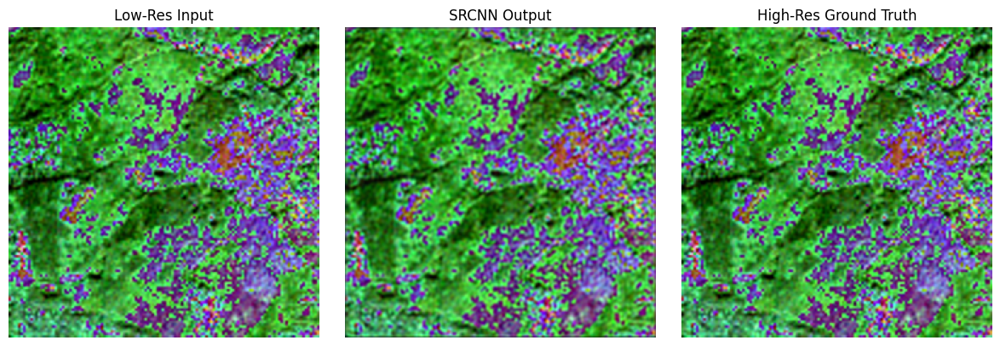

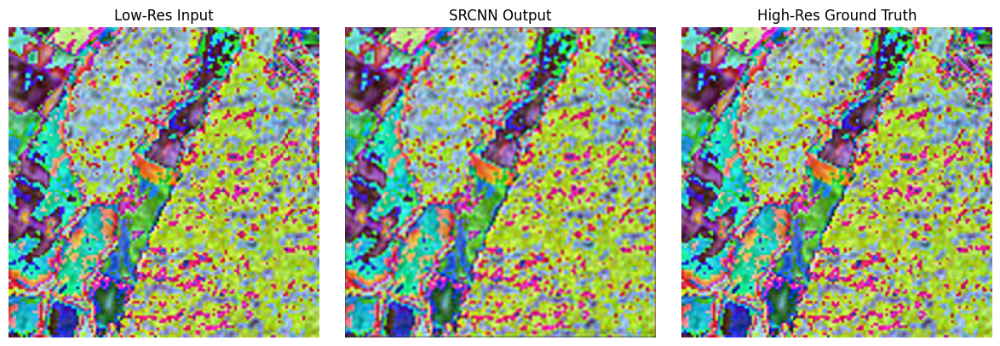

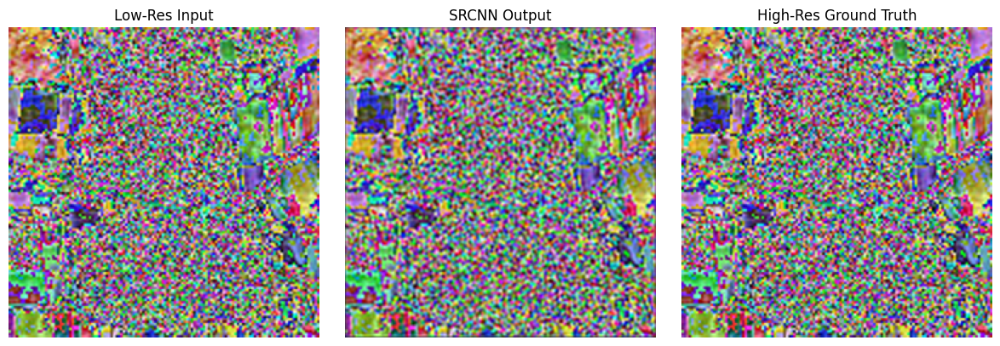

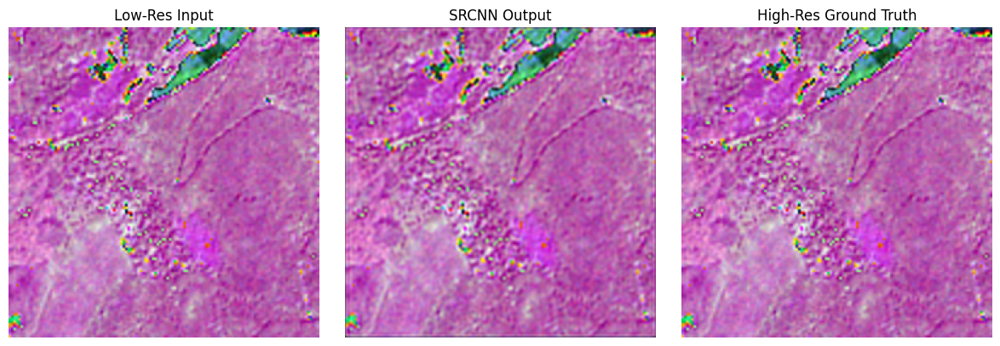

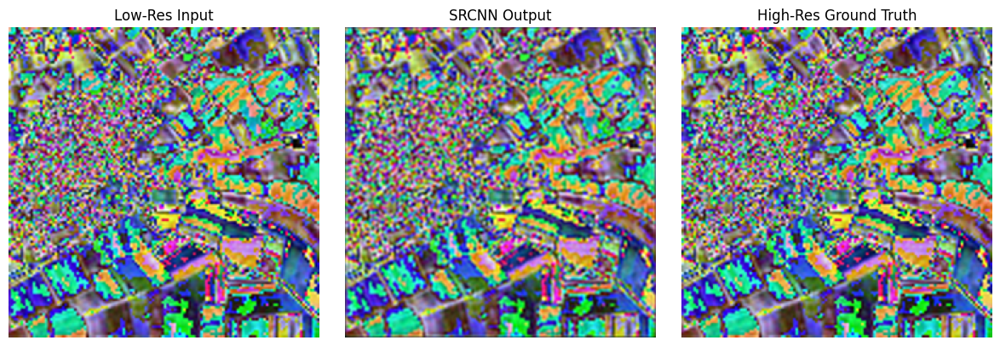

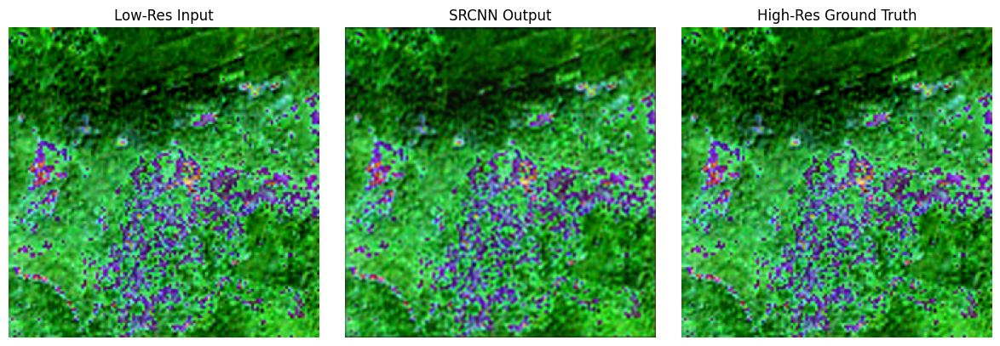

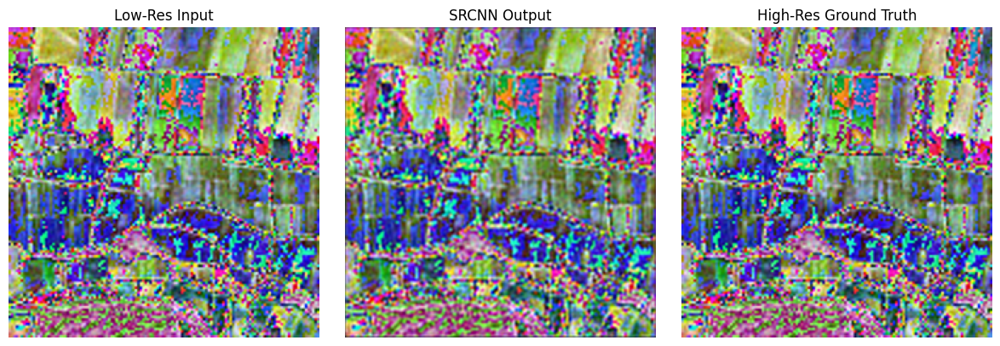

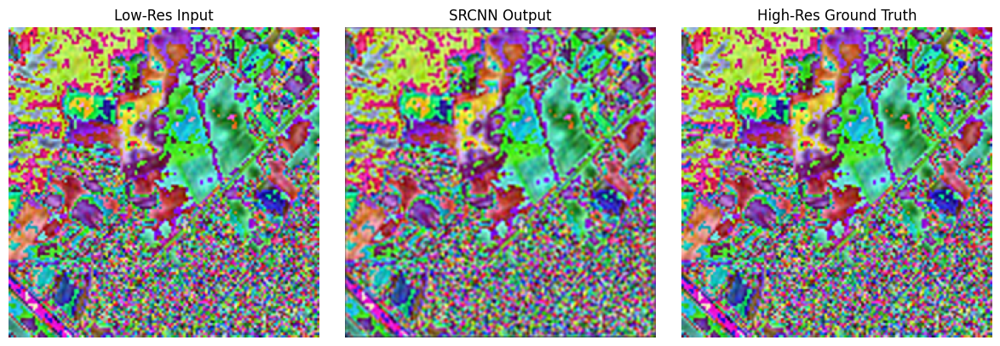

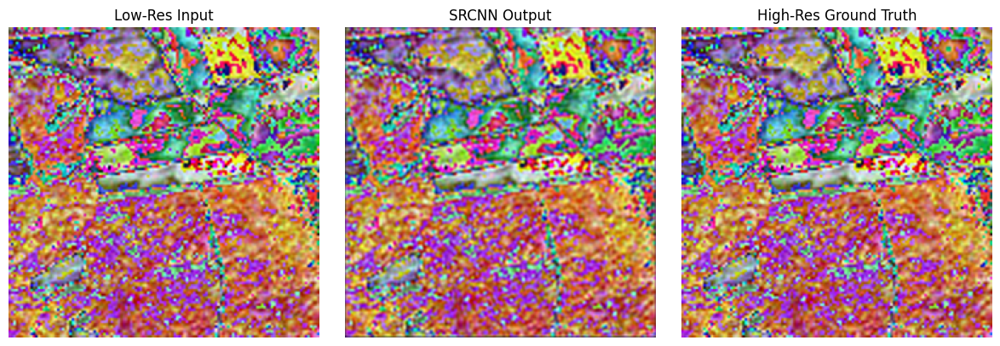

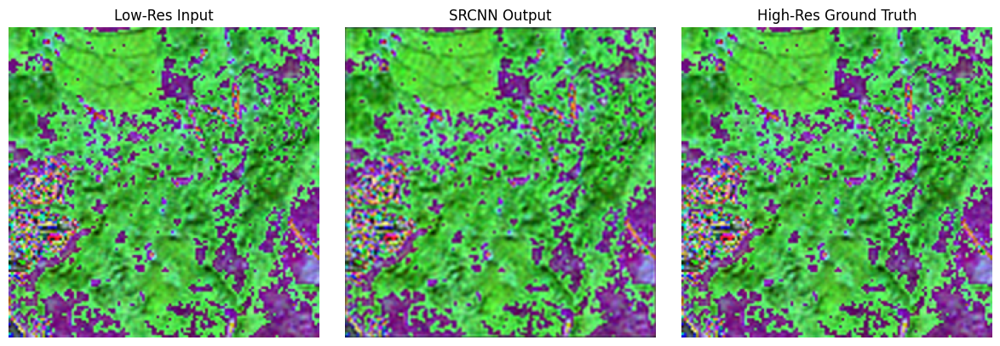

In [6]:
import torch
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import torchvision.transforms.functional as TF
import os

# Load model
def load_trained_model(model_path="srcnn_sen2venus.pth"):
    model = SRCNN()
    model.load_state_dict(torch.load(model_path, map_location=torch.device('cpu')))
    model.eval()
    return model

# Inference function
def run_inference_on_testset(model, dataset, save_outputs=False, output_dir="outputs", max_samples=10):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)

    dataloader = DataLoader(dataset, batch_size=1, shuffle=False)

    os.makedirs(output_dir, exist_ok=True)

    with torch.no_grad():
        for idx, (lr_img, hr_img) in enumerate(dataloader):
            if idx >= max_samples:
                break

            lr_img = lr_img.to(device)
            output = model(lr_img)

            # Move tensors to CPU and convert to numpy
            lr_np = lr_img.squeeze(0).cpu().permute(1, 2, 0).numpy()
            hr_np = hr_img.squeeze(0).cpu().permute(1, 2, 0).numpy()
            out_np = output.squeeze(0).cpu().permute(1, 2, 0).numpy()

            # Clip and scale to [0, 1]
            lr_np = np.clip(lr_np, 0, 1)
            hr_np = np.clip(hr_np, 0, 1)
            out_np = np.clip(out_np, 0, 1)

            # Display or save
            fig, axs = plt.subplots(1, 3, figsize=(12, 4))
            axs[0].imshow(lr_np)
            axs[0].set_title("Low-Res Input")
            axs[1].imshow(out_np)
            axs[1].set_title("SRCNN Output")
            axs[2].imshow(hr_np)
            axs[2].set_title("High-Res Ground Truth")
            for ax in axs:
                ax.axis("off")
            plt.tight_layout()

            if save_outputs:
                plt.savefig(f"{output_dir}/result_{idx}.png")
            else:
                plt.show()

# Example usage
if __name__ == "__main__":
    # Load dataset (e.g., validation split for testing)
    dataset = tacoreader.load("tacofoundation:sen2venus")
    test_indices = list(range(1200, 1220))  # adjust indices based on your dataset
    test_dataset = Sen2VenusDataset(dataset, test_indices)

    # Load trained model
    model = load_trained_model("srcnn_sen2venus.pth")

    # Run inference
    run_inference_on_testset(model, test_dataset, save_outputs=True, output_dir="inference_results")
